In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

from keras.layers import concatenate
from tensorflow.keras.models import Model

In [16]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [17]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [18]:
import h5py

import glob
import numpy as np
import os.path as path
import imageio
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense, Conv2D, MaxPooling2D
from keras.callbacks import EarlyStopping, TensorBoard
from datetime import datetime
import keras
from keras import regularizers
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, average_precision_score, precision_recall_curve, auc,recall_score
#from keras.optimizers import Adam
from keras.optimizer_v2.adam import Adam
from keras.regularizers import l2
import h5py
from sklearn.model_selection import GridSearchCV
from keras.backend import cast, greater, clip, floatx,epsilon
from keras.wrappers.scikit_learn import KerasClassifier
from keras import backend as K
from sklearn.model_selection import StratifiedKFold

In [19]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [20]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [21]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-44,10) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 2, 5, 10, 22, 47], [1, 2, 4, 9, 18, 40, 85, 184, 396, 854], [2, 4, 8, 18, 39, 83, 179, 385, 830, 1787], [2, 4, 9, 19, 41, 89, 192, 413, 889, 1915], [1, 3, 6, 14, 30, 65, 139, 300, 645, 1390], [1, 2, 4, 8, 17, 37, 79, 170, 366, 788], [1, 1, 2, 3, 7, 15, 33, 72, 154, 333]]


In [22]:
# Number of data points (per-class) for the ML classifier
#num_data = 30000
num_data = 15000
NUM_DAT = num_data


NUM_DAT_AC = round(num_data*f_AC)
NUM_DAT_CNNS = max(2, round(num_data*f_CNNS))
NUM_DAT_RN = round(num_data*f_RN)
NUM_DAT_WALL = round(num_data*f_WALL)

NUM_DAT_ER = num_data - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

In [23]:
###############
# BACKGROUNDS # 
###############

# CHOOSE THE IMAGE SIZE 75 for 75x75 pixels, 128 for 128x128 pixels, 256 for 256x256 pixels
img_size = 75

filename_B = '00-images/ER-img/out-img' + str(img_size) + '/'
filename_B1 = '00-images/AC-img/out-img' + str(img_size) + '/'
filename_B2 = '00-images/CNNS-img/out-img' + str(img_size) + '/'
filename_B3 = '00-images/RN-img/out-img' + str(img_size) + '/'
filename_B4 = '00-images/WALL-img/out-img' + str(img_size) + '/'


# load the indeces that are OK (with both S1 and S2 signals)
index_B = np.loadtxt(filefolder + '00-images/ER-img/ok-index.txt').astype(int)
index_B1 = np.loadtxt(filefolder + '00-images/AC-img/ok-index.txt').astype(int)
index_B2 = np.loadtxt(filefolder + '00-images/CNNS-img/ok-index.txt').astype(int)
index_B3 = np.loadtxt(filefolder + '00-images/RN-img/ok-index.txt').astype(int)
index_B4 = np.loadtxt(filefolder + '00-images/WALL-img/ok-index.txt').astype(int)




file_path_B = []

for path_it in range(NUM_DAT_ER):
    file_path_B.append( filefolder + filename_B + 'ER' + str(index_B[path_it]) + '.png' )

# Load the images and convert to a numpy array
images_B0 = [imageio.imread(jj) for jj in file_path_B]
images_B0 = np.asarray(images_B0)



file_path_B1 = []

for path_it in range(NUM_DAT_AC):
    file_path_B1.append( filefolder + filename_B1 + 'AC' + str(index_B1[path_it]) + '.png' )

# Load the images and convert to a numpy array
images_B1 = [imageio.imread(jj) for jj in file_path_B1]
images_B1 = np.asarray(images_B1)



file_path_B2 = []

for path_it in range(NUM_DAT_CNNS):
    file_path_B2.append( filefolder + filename_B2 + 'CNNS' + str(index_B2[path_it]) + '.png' )

# Load the images and convert to a numpy array
images_B2 = [imageio.imread(jj) for jj in file_path_B2]
images_B2 = np.asarray(images_B2)



file_path_B3 = []

for path_it in range(NUM_DAT_RN):
    file_path_B3.append( filefolder + filename_B3 + 'RN' + str(index_B3[path_it]) + '.png' )

# Load the images and convert to a numpy array
images_B3 = [imageio.imread(jj) for jj in file_path_B3]
images_B3 = np.asarray(images_B3)



file_path_B4 = []

for path_it in range(NUM_DAT_WALL):
    file_path_B4.append( filefolder + filename_B4 + 'WALL' + str(index_B4[path_it]) + '.png' )

# Load the images and convert to a numpy array
images_B4 = [imageio.imread(jj) for jj in file_path_B4]
images_B4 = np.asarray(images_B4)



# Concatenate all background contributions
images_B = np.concatenate([images_B0, images_B1, images_B2, images_B3, images_B4])

## Loop over the masses

## 1. Images


#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68476	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67652	validation_1-logloss:0.67761
[2]	validation_0-logloss:0.66845	validation_1-logloss:0.66997
[3]	validation_0-logloss:0.66056	validation_1-logloss:0.66245
[4]	validation_0-logloss:0.65282	validation_1-logloss:0.65504
[5]	validation_0-logloss:0.64518	validation_1-logloss:0.64791
[6]	validation_0-logloss:0.63771	validation_1-logloss:0.64079
[7]	validation_0-logloss:0.63036	validation_1-logloss:0.63385
[8]	validation_0-logloss:0.62315	validation_1-logloss:0.62695
[9]	validation_0-logloss:0.61607	validation_1-logloss:0.62021
[10]	validation_0-logloss:0.60909	validation_1-logloss:0.61369
[11]	validation_0-logloss:0.60225	validation_1-logloss:0.60716
[12]	validation_0-logloss:0.59554	validation_1-logloss:0.60085
[13]	validation_0-logloss:0.58896	validation_1-logloss:0.59462
[14]	validation_0-logloss:0.58244	validation_1-logloss:0.58856
[15]	validation_0-logloss:0.57606	validation_1-logloss:0.58249
[1

[130]	validation_0-logloss:0.20187	validation_1-logloss:0.23903
[131]	validation_0-logloss:0.20030	validation_1-logloss:0.23769
[132]	validation_0-logloss:0.19875	validation_1-logloss:0.23635
[133]	validation_0-logloss:0.19717	validation_1-logloss:0.23489
[134]	validation_0-logloss:0.19567	validation_1-logloss:0.23350
[135]	validation_0-logloss:0.19421	validation_1-logloss:0.23216
[136]	validation_0-logloss:0.19268	validation_1-logloss:0.23077
[137]	validation_0-logloss:0.19120	validation_1-logloss:0.22958
[138]	validation_0-logloss:0.18975	validation_1-logloss:0.22830
[139]	validation_0-logloss:0.18831	validation_1-logloss:0.22708
[140]	validation_0-logloss:0.18685	validation_1-logloss:0.22582
[141]	validation_0-logloss:0.18548	validation_1-logloss:0.22460
[142]	validation_0-logloss:0.18407	validation_1-logloss:0.22339
[143]	validation_0-logloss:0.18265	validation_1-logloss:0.22215
[144]	validation_0-logloss:0.18127	validation_1-logloss:0.22104
[145]	validation_0-logloss:0.17993	valid

[259]	validation_0-logloss:0.08300	validation_1-logloss:0.13561
[260]	validation_0-logloss:0.08247	validation_1-logloss:0.13516
[261]	validation_0-logloss:0.08197	validation_1-logloss:0.13476
[262]	validation_0-logloss:0.08145	validation_1-logloss:0.13430
[263]	validation_0-logloss:0.08095	validation_1-logloss:0.13389
[264]	validation_0-logloss:0.08044	validation_1-logloss:0.13340
[265]	validation_0-logloss:0.07996	validation_1-logloss:0.13290
[266]	validation_0-logloss:0.07948	validation_1-logloss:0.13249
[267]	validation_0-logloss:0.07899	validation_1-logloss:0.13205
[268]	validation_0-logloss:0.07849	validation_1-logloss:0.13161
[269]	validation_0-logloss:0.07800	validation_1-logloss:0.13123
[270]	validation_0-logloss:0.07753	validation_1-logloss:0.13086
[271]	validation_0-logloss:0.07703	validation_1-logloss:0.13044
[272]	validation_0-logloss:0.07656	validation_1-logloss:0.13000
[273]	validation_0-logloss:0.07607	validation_1-logloss:0.12954
[274]	validation_0-logloss:0.07558	valid

[388]	validation_0-logloss:0.03963	validation_1-logloss:0.10029
[389]	validation_0-logloss:0.03943	validation_1-logloss:0.10014
[390]	validation_0-logloss:0.03923	validation_1-logloss:0.10001
[391]	validation_0-logloss:0.03903	validation_1-logloss:0.09988
[392]	validation_0-logloss:0.03882	validation_1-logloss:0.09972
[393]	validation_0-logloss:0.03862	validation_1-logloss:0.09958
[394]	validation_0-logloss:0.03841	validation_1-logloss:0.09950
[395]	validation_0-logloss:0.03822	validation_1-logloss:0.09940
[396]	validation_0-logloss:0.03803	validation_1-logloss:0.09925
[397]	validation_0-logloss:0.03782	validation_1-logloss:0.09915
[398]	validation_0-logloss:0.03761	validation_1-logloss:0.09905
[399]	validation_0-logloss:0.03743	validation_1-logloss:0.09893
[400]	validation_0-logloss:0.03724	validation_1-logloss:0.09880
[401]	validation_0-logloss:0.03703	validation_1-logloss:0.09870
[402]	validation_0-logloss:0.03684	validation_1-logloss:0.09859
[403]	validation_0-logloss:0.03666	valid

[517]	validation_0-logloss:0.02101	validation_1-logloss:0.08885
[518]	validation_0-logloss:0.02092	validation_1-logloss:0.08884
[519]	validation_0-logloss:0.02082	validation_1-logloss:0.08882
[520]	validation_0-logloss:0.02072	validation_1-logloss:0.08878
[521]	validation_0-logloss:0.02063	validation_1-logloss:0.08874
[522]	validation_0-logloss:0.02052	validation_1-logloss:0.08870
[523]	validation_0-logloss:0.02044	validation_1-logloss:0.08862
[524]	validation_0-logloss:0.02035	validation_1-logloss:0.08850
[525]	validation_0-logloss:0.02025	validation_1-logloss:0.08839
[526]	validation_0-logloss:0.02015	validation_1-logloss:0.08834
[527]	validation_0-logloss:0.02007	validation_1-logloss:0.08832
[528]	validation_0-logloss:0.01997	validation_1-logloss:0.08826
[529]	validation_0-logloss:0.01988	validation_1-logloss:0.08818
[530]	validation_0-logloss:0.01979	validation_1-logloss:0.08812
[531]	validation_0-logloss:0.01969	validation_1-logloss:0.08803
[532]	validation_0-logloss:0.01962	valid

[646]	validation_0-logloss:0.01230	validation_1-logloss:0.08471
[647]	validation_0-logloss:0.01225	validation_1-logloss:0.08466
[648]	validation_0-logloss:0.01220	validation_1-logloss:0.08463
[649]	validation_0-logloss:0.01216	validation_1-logloss:0.08465
[650]	validation_0-logloss:0.01212	validation_1-logloss:0.08457
[651]	validation_0-logloss:0.01207	validation_1-logloss:0.08457
[652]	validation_0-logloss:0.01202	validation_1-logloss:0.08450
[653]	validation_0-logloss:0.01198	validation_1-logloss:0.08449
[654]	validation_0-logloss:0.01194	validation_1-logloss:0.08449
[655]	validation_0-logloss:0.01190	validation_1-logloss:0.08444
[656]	validation_0-logloss:0.01185	validation_1-logloss:0.08437
[657]	validation_0-logloss:0.01181	validation_1-logloss:0.08432
[658]	validation_0-logloss:0.01177	validation_1-logloss:0.08431
[659]	validation_0-logloss:0.01172	validation_1-logloss:0.08430
[660]	validation_0-logloss:0.01167	validation_1-logloss:0.08429
[661]	validation_0-logloss:0.01163	valid

[775]	validation_0-logloss:0.00782	validation_1-logloss:0.08301
[776]	validation_0-logloss:0.00780	validation_1-logloss:0.08304
[777]	validation_0-logloss:0.00777	validation_1-logloss:0.08306
[778]	validation_0-logloss:0.00775	validation_1-logloss:0.08307
[779]	validation_0-logloss:0.00772	validation_1-logloss:0.08300
[780]	validation_0-logloss:0.00769	validation_1-logloss:0.08299
[781]	validation_0-logloss:0.00767	validation_1-logloss:0.08297
[782]	validation_0-logloss:0.00764	validation_1-logloss:0.08295
[783]	validation_0-logloss:0.00761	validation_1-logloss:0.08287
[784]	validation_0-logloss:0.00758	validation_1-logloss:0.08283
[785]	validation_0-logloss:0.00756	validation_1-logloss:0.08280
[786]	validation_0-logloss:0.00753	validation_1-logloss:0.08282
[787]	validation_0-logloss:0.00751	validation_1-logloss:0.08279
[788]	validation_0-logloss:0.00748	validation_1-logloss:0.08283
[789]	validation_0-logloss:0.00746	validation_1-logloss:0.08283
[790]	validation_0-logloss:0.00744	valid

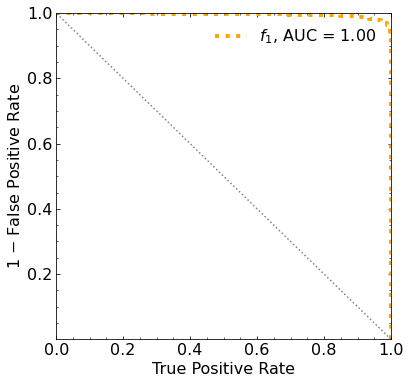

Classification score:


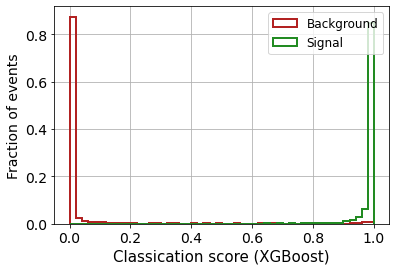


 ROC-AUC =  0.9951191281011206
At least 5 B events per bin, range = [[0, 1]]:
# bins:  6 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  6
range of our data:  [[0, 1]]
number of bins we are going to use:  6
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6925


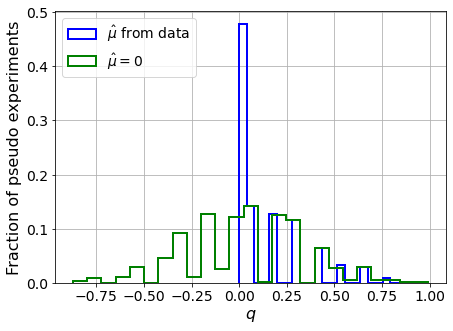

muhat mean:  0.1969464881727792
Z_bins:  0.24848151200665286
std Z_bins:  0.388525393210452
Z_bins mu=0:  0.24848151200665286
std Z_bins mu=0:  0.6240718416930503

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.668


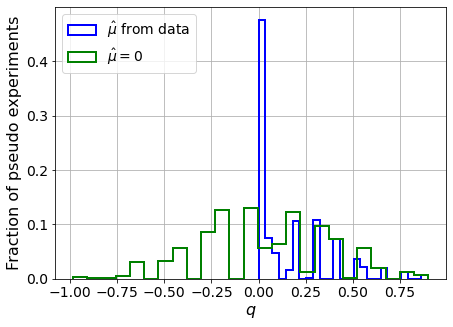

muhat mean:  0.19158650755451684
Z_bins:  0.25036607098426006
std Z_bins:  0.40986253208720647
Z_bins mu=0:  0.25036607098426006
std Z_bins mu=0:  0.6747851143932543

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.672


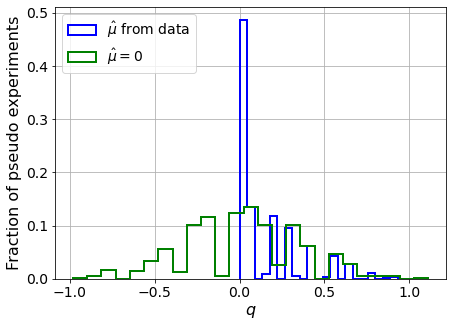

muhat mean:  0.32860596304365314
Z_bins:  0.2512063298962983
std Z_bins:  0.40288542390707066
Z_bins mu=0:  0.2512063298962983
std Z_bins mu=0:  0.6753402955965506

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.677


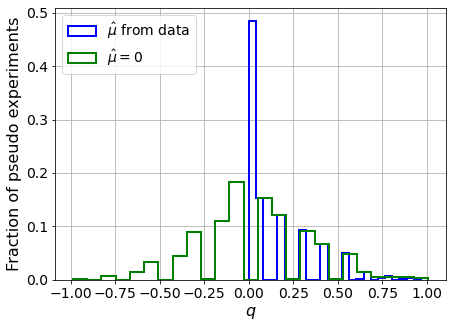

muhat mean:  0.17355932571387822
Z_bins:  0.24142684729396033
std Z_bins:  0.4082512673834057
Z_bins mu=0:  0.24142684729396033
std Z_bins mu=0:  0.638918789347178

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.684


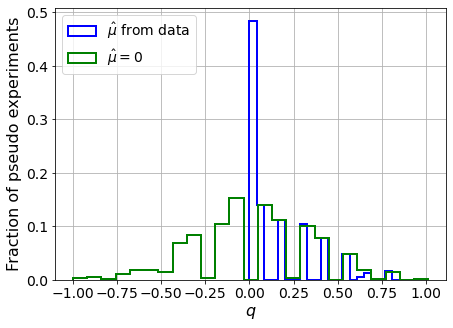

muhat mean:  0.2811255836819347
Z_bins:  0.24589043862027102
std Z_bins:  0.4017801115037674
Z_bins mu=0:  0.24589043862027102
std Z_bins mu=0:  0.6753186600385435

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6595


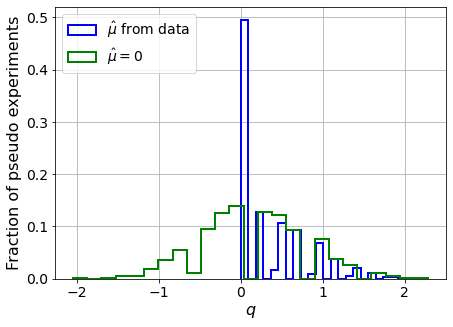

muhat mean:  0.1348846649002153
Z_bins:  0.47277012315386424
std Z_bins:  0.4600667199225513
Z_bins mu=0:  0.47277012315386424
std Z_bins mu=0:  0.6870854294333428

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.668


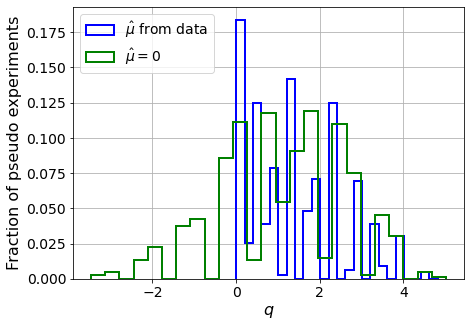

muhat mean:  0.039331027535723366
Z_bins:  1.1313362096962074
std Z_bins:  0.49507034349950785
Z_bins mu=0:  1.1313362096962074
std Z_bins mu=0:  0.6585327785211375

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.678


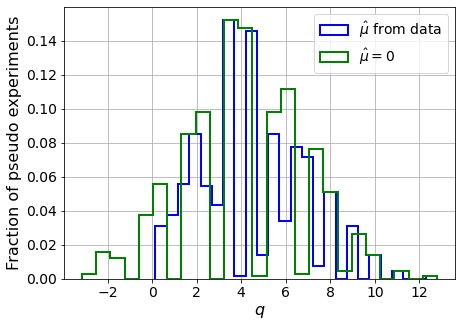

muhat mean:  0.006614686258947316
Z_bins:  2.0764990375534254
std Z_bins:  0.5666289413125154
Z_bins mu=0:  2.0764990375534254
std Z_bins mu=0:  0.65237529379358

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6675


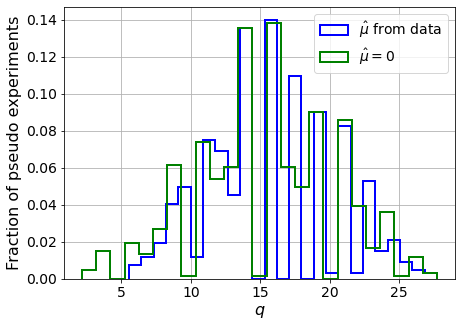

muhat mean:  0.0064355017646539414
Z_bins:  3.9627027506562995
std Z_bins:  0.5758877864365306
Z_bins mu=0:  3.9627027506562995
std Z_bins mu=0:  0.6263138653872035

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.679


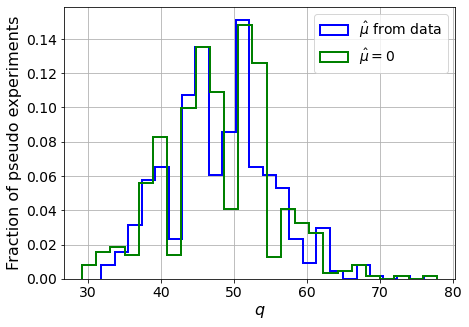

muhat mean:  0.001586578115051888
Z_bins:  6.954736485053227
std Z_bins:  0.5009260213083498
Z_bins mu=0:  6.954736485053227
std Z_bins mu=0:  0.5238845679116494

--------


 FINAL RESULT:

[[0.24848151200665286, 0.388525393210452, 0.1969464881727792, 0.24848151200665286, 0.6240718416930503], [0.25036607098426006, 0.40986253208720647, 0.19158650755451684, 0.25036607098426006, 0.6747851143932543], [0.2512063298962983, 0.40288542390707066, 0.32860596304365314, 0.2512063298962983, 0.6753402955965506], [0.24142684729396033, 0.4082512673834057, 0.17355932571387822, 0.24142684729396033, 0.638918789347178], [0.24589043862027102, 0.4017801115037674, 0.2811255836819347, 0.24589043862027102, 0.6753186600385435], [0.47277012315386424, 0.4600667199225513, 0.1348846649002153, 0.47277012315386424, 0.6870854294333428], [1.1313362096962074, 0.49507034349950785, 0.039331027535723366, 1.1313362096962074, 0.6585327785211375], [2.0764990375534254, 0.5666289413125154, 0.006614686258947316, 2.07649903755342

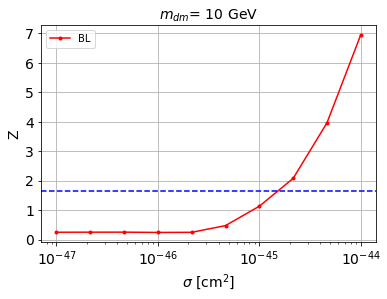


cross_BL_164:  1.6121715159700788e-45
cross_BL_164_up:  1.0127270997370923e-45
cross_BL_164_down:  2.3189208701676392e-45

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68602	validation_1-logloss:0.68656
[1]	validation_0-logloss:0.67902	validation_1-logloss:0.68012
[2]	validation_0-logloss:0.67217	validation_1-logloss:0.67371
[3]	validation_0-logloss:0.66541	validation_1-logloss:0.66732
[4]	validation_0-logloss:0.65881	validation_1-logloss:0.66112
[5]	validation_0-logloss:0.65232	validation_1-logloss:0.65494
[6]	validation_0-logloss:0.64589	validation_1-logloss:0.64911
[7]	validation_0-logloss:0.63963	validation_1-logloss:0.64338
[8]	validation_0-logloss:0.63341	validation_1-logloss:0.63755
[9]	validation_0-logloss:0.62738	validation_1-logloss:0.63196
[10]	validation_0-logloss:0.62138	validation_1-logloss:0.62642
[11]	validation_0-logloss:0.61552	validation_1-logloss:0.62101
[12]	validation_0-logloss:0.60975	validation_1-logloss:0.61566
[13]	validation_0-logloss:0.60404	validation_1-logloss:0.61032
[14]	validation_0-logloss:0.59847	validation_1-logloss:0.60516
[15]	validation_0-logloss:0.59294	validation_1-logloss:0.59998
[1

[130]	validation_0-logloss:0.26653	validation_1-logloss:0.30983
[131]	validation_0-logloss:0.26513	validation_1-logloss:0.30865
[132]	validation_0-logloss:0.26370	validation_1-logloss:0.30754
[133]	validation_0-logloss:0.26218	validation_1-logloss:0.30628
[134]	validation_0-logloss:0.26084	validation_1-logloss:0.30512
[135]	validation_0-logloss:0.25946	validation_1-logloss:0.30406
[136]	validation_0-logloss:0.25810	validation_1-logloss:0.30301
[137]	validation_0-logloss:0.25673	validation_1-logloss:0.30199
[138]	validation_0-logloss:0.25527	validation_1-logloss:0.30085
[139]	validation_0-logloss:0.25400	validation_1-logloss:0.29977
[140]	validation_0-logloss:0.25274	validation_1-logloss:0.29874
[141]	validation_0-logloss:0.25144	validation_1-logloss:0.29760
[142]	validation_0-logloss:0.25016	validation_1-logloss:0.29648
[143]	validation_0-logloss:0.24887	validation_1-logloss:0.29541
[144]	validation_0-logloss:0.24752	validation_1-logloss:0.29426
[145]	validation_0-logloss:0.24625	valid

[259]	validation_0-logloss:0.14856	validation_1-logloss:0.22155
[260]	validation_0-logloss:0.14802	validation_1-logloss:0.22114
[261]	validation_0-logloss:0.14742	validation_1-logloss:0.22075
[262]	validation_0-logloss:0.14680	validation_1-logloss:0.22038
[263]	validation_0-logloss:0.14631	validation_1-logloss:0.22006
[264]	validation_0-logloss:0.14582	validation_1-logloss:0.21967
[265]	validation_0-logloss:0.14521	validation_1-logloss:0.21928
[266]	validation_0-logloss:0.14464	validation_1-logloss:0.21878
[267]	validation_0-logloss:0.14404	validation_1-logloss:0.21841
[268]	validation_0-logloss:0.14359	validation_1-logloss:0.21810
[269]	validation_0-logloss:0.14300	validation_1-logloss:0.21770
[270]	validation_0-logloss:0.14256	validation_1-logloss:0.21741
[271]	validation_0-logloss:0.14199	validation_1-logloss:0.21714
[272]	validation_0-logloss:0.14141	validation_1-logloss:0.21683
[273]	validation_0-logloss:0.14082	validation_1-logloss:0.21644
[274]	validation_0-logloss:0.14025	valid

[388]	validation_0-logloss:0.09459	validation_1-logloss:0.18918
[389]	validation_0-logloss:0.09427	validation_1-logloss:0.18903
[390]	validation_0-logloss:0.09395	validation_1-logloss:0.18889
[391]	validation_0-logloss:0.09367	validation_1-logloss:0.18877
[392]	validation_0-logloss:0.09335	validation_1-logloss:0.18862
[393]	validation_0-logloss:0.09309	validation_1-logloss:0.18845
[394]	validation_0-logloss:0.09276	validation_1-logloss:0.18837
[395]	validation_0-logloss:0.09248	validation_1-logloss:0.18828
[396]	validation_0-logloss:0.09221	validation_1-logloss:0.18816
[397]	validation_0-logloss:0.09190	validation_1-logloss:0.18797
[398]	validation_0-logloss:0.09161	validation_1-logloss:0.18782
[399]	validation_0-logloss:0.09136	validation_1-logloss:0.18770
[400]	validation_0-logloss:0.09104	validation_1-logloss:0.18753
[401]	validation_0-logloss:0.09077	validation_1-logloss:0.18740
[402]	validation_0-logloss:0.09047	validation_1-logloss:0.18726
[403]	validation_0-logloss:0.09015	valid

[517]	validation_0-logloss:0.06484	validation_1-logloss:0.17689
[518]	validation_0-logloss:0.06469	validation_1-logloss:0.17682
[519]	validation_0-logloss:0.06451	validation_1-logloss:0.17676
[520]	validation_0-logloss:0.06438	validation_1-logloss:0.17669
[521]	validation_0-logloss:0.06417	validation_1-logloss:0.17663
[522]	validation_0-logloss:0.06400	validation_1-logloss:0.17657
[523]	validation_0-logloss:0.06386	validation_1-logloss:0.17650
[524]	validation_0-logloss:0.06367	validation_1-logloss:0.17642
[525]	validation_0-logloss:0.06349	validation_1-logloss:0.17634
[526]	validation_0-logloss:0.06333	validation_1-logloss:0.17625
[527]	validation_0-logloss:0.06314	validation_1-logloss:0.17622
[528]	validation_0-logloss:0.06299	validation_1-logloss:0.17620
[529]	validation_0-logloss:0.06286	validation_1-logloss:0.17614
[530]	validation_0-logloss:0.06271	validation_1-logloss:0.17615
[531]	validation_0-logloss:0.06253	validation_1-logloss:0.17608
[532]	validation_0-logloss:0.06235	valid

[646]	validation_0-logloss:0.04713	validation_1-logloss:0.17197
[647]	validation_0-logloss:0.04702	validation_1-logloss:0.17196
[648]	validation_0-logloss:0.04690	validation_1-logloss:0.17185
[649]	validation_0-logloss:0.04675	validation_1-logloss:0.17178
[650]	validation_0-logloss:0.04665	validation_1-logloss:0.17183
[651]	validation_0-logloss:0.04657	validation_1-logloss:0.17177
[652]	validation_0-logloss:0.04649	validation_1-logloss:0.17172
[653]	validation_0-logloss:0.04636	validation_1-logloss:0.17175
[654]	validation_0-logloss:0.04624	validation_1-logloss:0.17175
[655]	validation_0-logloss:0.04613	validation_1-logloss:0.17177
[656]	validation_0-logloss:0.04603	validation_1-logloss:0.17177
[657]	validation_0-logloss:0.04593	validation_1-logloss:0.17173
[658]	validation_0-logloss:0.04585	validation_1-logloss:0.17172
[659]	validation_0-logloss:0.04573	validation_1-logloss:0.17180
[660]	validation_0-logloss:0.04565	validation_1-logloss:0.17182
[661]	validation_0-logloss:0.04554	valid

[775]	validation_0-logloss:0.03526	validation_1-logloss:0.17059
[776]	validation_0-logloss:0.03520	validation_1-logloss:0.17062
[777]	validation_0-logloss:0.03513	validation_1-logloss:0.17055
[778]	validation_0-logloss:0.03507	validation_1-logloss:0.17056
[779]	validation_0-logloss:0.03499	validation_1-logloss:0.17064
[780]	validation_0-logloss:0.03492	validation_1-logloss:0.17065
[781]	validation_0-logloss:0.03486	validation_1-logloss:0.17067
[782]	validation_0-logloss:0.03478	validation_1-logloss:0.17072
[783]	validation_0-logloss:0.03468	validation_1-logloss:0.17074
[784]	validation_0-logloss:0.03462	validation_1-logloss:0.17079
[785]	validation_0-logloss:0.03454	validation_1-logloss:0.17074
[786]	validation_0-logloss:0.03447	validation_1-logloss:0.17068
[787]	validation_0-logloss:0.03440	validation_1-logloss:0.17066
[788]	validation_0-logloss:0.03433	validation_1-logloss:0.17069
[789]	validation_0-logloss:0.03425	validation_1-logloss:0.17078
[790]	validation_0-logloss:0.03418	valid

[904]	validation_0-logloss:0.02713	validation_1-logloss:0.17008
[905]	validation_0-logloss:0.02708	validation_1-logloss:0.17007
[906]	validation_0-logloss:0.02702	validation_1-logloss:0.17008
[907]	validation_0-logloss:0.02696	validation_1-logloss:0.17008
[908]	validation_0-logloss:0.02690	validation_1-logloss:0.17012
[909]	validation_0-logloss:0.02685	validation_1-logloss:0.17007
[910]	validation_0-logloss:0.02680	validation_1-logloss:0.17005
[911]	validation_0-logloss:0.02675	validation_1-logloss:0.17007
[912]	validation_0-logloss:0.02669	validation_1-logloss:0.17004
[913]	validation_0-logloss:0.02662	validation_1-logloss:0.17000
[914]	validation_0-logloss:0.02657	validation_1-logloss:0.17006
[915]	validation_0-logloss:0.02652	validation_1-logloss:0.17008
[916]	validation_0-logloss:0.02646	validation_1-logloss:0.17004
[917]	validation_0-logloss:0.02640	validation_1-logloss:0.17002
[918]	validation_0-logloss:0.02635	validation_1-logloss:0.17001
[919]	validation_0-logloss:0.02629	valid

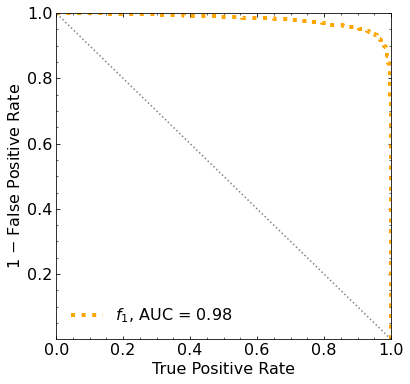

Classification score:


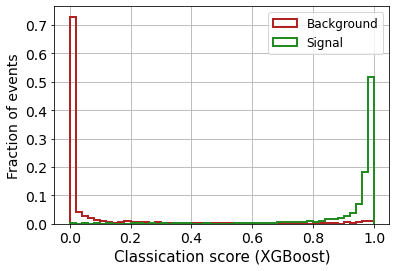


 ROC-AUC =  0.980608393255895
At least 5 B events per bin, range = [[0, 1]]:
# bins:  10 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  10
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.492


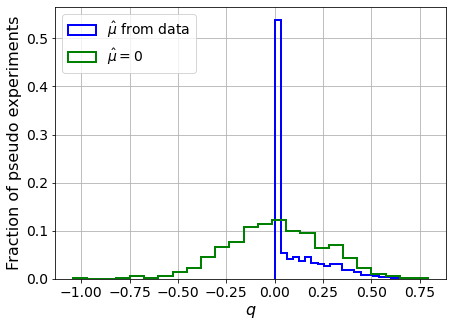

muhat mean:  0.303127422796749
Z_bins:  0.12141600204982414
std Z_bins:  0.6071897127370831
Z_bins mu=0:  0.11029310568092508
std Z_bins mu=0:  1.1263959612287564

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.484


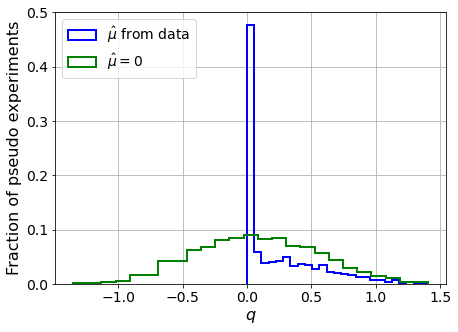

muhat mean:  0.1414537046298284
Z_bins:  0.270756175585952
std Z_bins:  0.5660158821471207
Z_bins mu=0:  0.2613446260088347
std Z_bins mu=0:  0.90401814502738

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4825


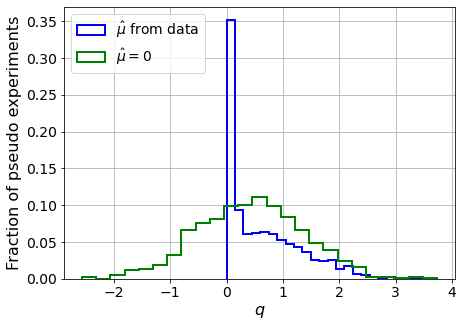

muhat mean:  0.023083506276529178
Z_bins:  0.6585347167437607
std Z_bins:  0.509587578050159
Z_bins mu=0:  0.6584714448464706
std Z_bins mu=0:  0.7052739658982583

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.505


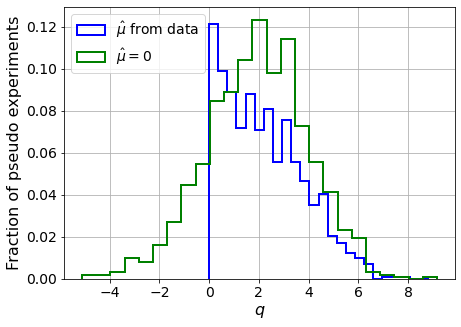

muhat mean:  0.030713404694896536
Z_bins:  1.4082757264744459
std Z_bins:  0.5691281872612544
Z_bins mu=0:  1.4078926271238497
std Z_bins mu=0:  0.7187677976679104

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4915


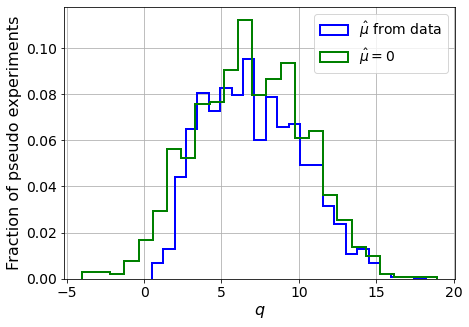

muhat mean:  0.015078142815905202
Z_bins:  2.610689494024767
std Z_bins:  0.6052071566567879
Z_bins mu=0:  2.6103438080041412
std Z_bins mu=0:  0.679358171266115

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.49


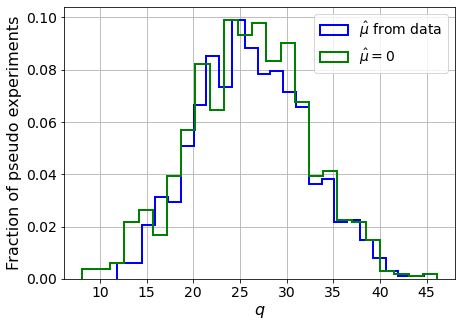

muhat mean:  0.00568827022286494
Z_bins:  5.101347421598927
std Z_bins:  0.5766963572980519
Z_bins mu=0:  5.100739853206275
std Z_bins mu=0:  0.6151974584828489

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.502


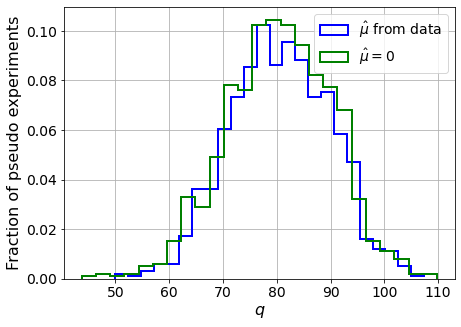

muhat mean:  0.0019629226505696335
Z_bins:  8.975909805831966
std Z_bins:  0.5231956808590087
Z_bins mu=0:  8.97570725397164
std Z_bins mu=0:  0.5457548239105942

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.48


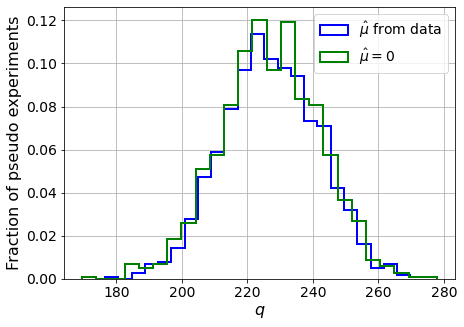

muhat mean:  0.0019900336912337066
Z_bins:  15.058728773959263
std Z_bins:  0.48412580532027966
Z_bins mu=0:  15.058380679523724
std Z_bins mu=0:  0.498890965443876

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.487


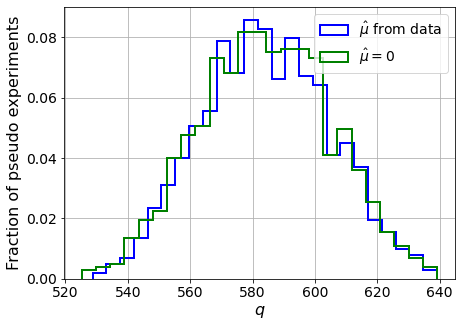

muhat mean:  0.0006634965679283529
Z_bins:  24.164434960142852
std Z_bins:  0.4262161612126065
Z_bins mu=0:  24.16420321160327
std Z_bins mu=0:  0.4343129769927639

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.5055


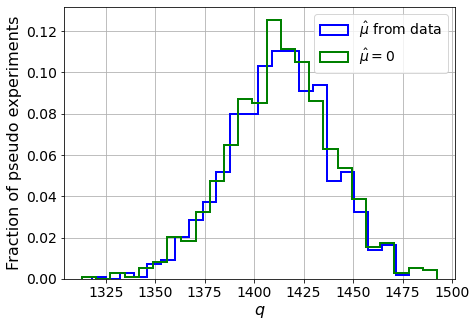

muhat mean:  0.00011835335619558079
Z_bins:  37.59854732727011
std Z_bins:  0.34798030870066815
Z_bins mu=0:  37.59854732727011
std Z_bins mu=0:  0.3530530566223329

--------


 FINAL RESULT:

[[0.12141600204982414, 0.6071897127370831, 0.303127422796749, 0.11029310568092508, 1.1263959612287564], [0.270756175585952, 0.5660158821471207, 0.1414537046298284, 0.2613446260088347, 0.90401814502738], [0.6585347167437607, 0.509587578050159, 0.023083506276529178, 0.6584714448464706, 0.7052739658982583], [1.4082757264744459, 0.5691281872612544, 0.030713404694896536, 1.4078926271238497, 0.7187677976679104], [2.610689494024767, 0.6052071566567879, 0.015078142815905202, 2.6103438080041412, 0.679358171266115], [5.101347421598927, 0.5766963572980519, 0.00568827022286494, 5.100739853206275, 0.6151974584828489], [8.975909805831966, 0.5231956808590087, 0.0019629226505696335, 8.97570725397164, 0.5457548239105942], [15.058728773959263, 0.48412580532027966, 0.0019900336912337066, 15.058380679523724, 0.49889

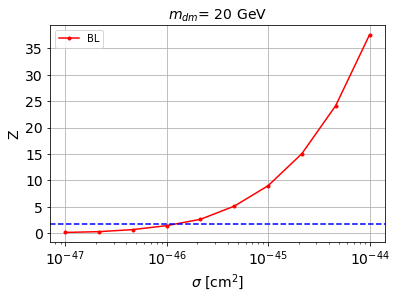


cross_BL_164:  1.2070037159138324e-46
cross_BL_164_up:  7.564256646234421e-47
cross_BL_164_down:  1.8102085172415905e-46

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68718	validation_1-logloss:0.68788
[1]	validation_0-logloss:0.68134	validation_1-logloss:0.68274
[2]	validation_0-logloss:0.67559	validation_1-logloss:0.67772
[3]	validation_0-logloss:0.66997	validation_1-logloss:0.67282
[4]	validation_0-logloss:0.66446	validation_1-logloss:0.66784
[5]	validation_0-logloss:0.65899	validation_1-logloss:0.66297
[6]	validation_0-logloss:0.65361	validation_1-logloss:0.65811
[7]	validation_0-logloss:0.64838	validation_1-logloss:0.65353
[8]	validation_0-logloss:0.64319	validation_1-logloss:0.64882
[9]	validation_0-logloss:0.63811	validation_1-logloss:0.64435
[10]	validation_0-logloss:0.63311	validation_1-logloss:0.63993
[11]	validation_0-logloss:0.62818	validation_1-logloss:0.63546
[12]	validation_0-logloss:0.62333	validation_1-logloss:0.63114
[13]	validation_0-logloss:0.61860	validation_1-logloss:0.62702
[14]	validation_0-logloss:0.61386	validation_1-logloss:0.62274
[15]	validation_0-logloss:0.60927	validation_1-logloss:0.61874
[1

[130]	validation_0-logloss:0.33020	validation_1-logloss:0.38815
[131]	validation_0-logloss:0.32895	validation_1-logloss:0.38719
[132]	validation_0-logloss:0.32767	validation_1-logloss:0.38637
[133]	validation_0-logloss:0.32646	validation_1-logloss:0.38536
[134]	validation_0-logloss:0.32518	validation_1-logloss:0.38427
[135]	validation_0-logloss:0.32391	validation_1-logloss:0.38336
[136]	validation_0-logloss:0.32273	validation_1-logloss:0.38236
[137]	validation_0-logloss:0.32148	validation_1-logloss:0.38131
[138]	validation_0-logloss:0.32025	validation_1-logloss:0.38044
[139]	validation_0-logloss:0.31901	validation_1-logloss:0.37943
[140]	validation_0-logloss:0.31782	validation_1-logloss:0.37861
[141]	validation_0-logloss:0.31666	validation_1-logloss:0.37772
[142]	validation_0-logloss:0.31551	validation_1-logloss:0.37683
[143]	validation_0-logloss:0.31433	validation_1-logloss:0.37588
[144]	validation_0-logloss:0.31320	validation_1-logloss:0.37501
[145]	validation_0-logloss:0.31208	valid

[259]	validation_0-logloss:0.22056	validation_1-logloss:0.31998
[260]	validation_0-logloss:0.21992	validation_1-logloss:0.31965
[261]	validation_0-logloss:0.21926	validation_1-logloss:0.31935
[262]	validation_0-logloss:0.21862	validation_1-logloss:0.31913
[263]	validation_0-logloss:0.21802	validation_1-logloss:0.31889
[264]	validation_0-logloss:0.21738	validation_1-logloss:0.31854
[265]	validation_0-logloss:0.21689	validation_1-logloss:0.31832
[266]	validation_0-logloss:0.21630	validation_1-logloss:0.31822
[267]	validation_0-logloss:0.21569	validation_1-logloss:0.31800
[268]	validation_0-logloss:0.21507	validation_1-logloss:0.31774
[269]	validation_0-logloss:0.21448	validation_1-logloss:0.31751
[270]	validation_0-logloss:0.21389	validation_1-logloss:0.31736
[271]	validation_0-logloss:0.21330	validation_1-logloss:0.31716
[272]	validation_0-logloss:0.21274	validation_1-logloss:0.31699
[273]	validation_0-logloss:0.21213	validation_1-logloss:0.31668
[274]	validation_0-logloss:0.21152	valid

[388]	validation_0-logloss:0.16065	validation_1-logloss:0.29791
[389]	validation_0-logloss:0.16027	validation_1-logloss:0.29773
[390]	validation_0-logloss:0.15990	validation_1-logloss:0.29755
[391]	validation_0-logloss:0.15951	validation_1-logloss:0.29736
[392]	validation_0-logloss:0.15917	validation_1-logloss:0.29727
[393]	validation_0-logloss:0.15882	validation_1-logloss:0.29722
[394]	validation_0-logloss:0.15852	validation_1-logloss:0.29710
[395]	validation_0-logloss:0.15816	validation_1-logloss:0.29696
[396]	validation_0-logloss:0.15781	validation_1-logloss:0.29686
[397]	validation_0-logloss:0.15748	validation_1-logloss:0.29680
[398]	validation_0-logloss:0.15715	validation_1-logloss:0.29672
[399]	validation_0-logloss:0.15677	validation_1-logloss:0.29659
[400]	validation_0-logloss:0.15641	validation_1-logloss:0.29650
[401]	validation_0-logloss:0.15607	validation_1-logloss:0.29638
[402]	validation_0-logloss:0.15574	validation_1-logloss:0.29628
[403]	validation_0-logloss:0.15544	valid

[517]	validation_0-logloss:0.12402	validation_1-logloss:0.28764
[518]	validation_0-logloss:0.12381	validation_1-logloss:0.28760
[519]	validation_0-logloss:0.12361	validation_1-logloss:0.28758
[520]	validation_0-logloss:0.12339	validation_1-logloss:0.28754
[521]	validation_0-logloss:0.12318	validation_1-logloss:0.28743
[522]	validation_0-logloss:0.12296	validation_1-logloss:0.28735
[523]	validation_0-logloss:0.12275	validation_1-logloss:0.28722
[524]	validation_0-logloss:0.12249	validation_1-logloss:0.28713
[525]	validation_0-logloss:0.12223	validation_1-logloss:0.28721
[526]	validation_0-logloss:0.12205	validation_1-logloss:0.28717
[527]	validation_0-logloss:0.12182	validation_1-logloss:0.28712
[528]	validation_0-logloss:0.12163	validation_1-logloss:0.28710
[529]	validation_0-logloss:0.12141	validation_1-logloss:0.28706
[530]	validation_0-logloss:0.12120	validation_1-logloss:0.28701
[531]	validation_0-logloss:0.12099	validation_1-logloss:0.28697
[532]	validation_0-logloss:0.12075	valid

[646]	validation_0-logloss:0.09972	validation_1-logloss:0.28369
[647]	validation_0-logloss:0.09953	validation_1-logloss:0.28365
[648]	validation_0-logloss:0.09939	validation_1-logloss:0.28359
[649]	validation_0-logloss:0.09919	validation_1-logloss:0.28362
[650]	validation_0-logloss:0.09908	validation_1-logloss:0.28357
[651]	validation_0-logloss:0.09894	validation_1-logloss:0.28362
[652]	validation_0-logloss:0.09881	validation_1-logloss:0.28365
[653]	validation_0-logloss:0.09862	validation_1-logloss:0.28371
[654]	validation_0-logloss:0.09846	validation_1-logloss:0.28364
[655]	validation_0-logloss:0.09825	validation_1-logloss:0.28362
[656]	validation_0-logloss:0.09809	validation_1-logloss:0.28364
[657]	validation_0-logloss:0.09796	validation_1-logloss:0.28363
[658]	validation_0-logloss:0.09782	validation_1-logloss:0.28360
[659]	validation_0-logloss:0.09766	validation_1-logloss:0.28358
[660]	validation_0-logloss:0.09745	validation_1-logloss:0.28354
[661]	validation_0-logloss:0.09729	valid

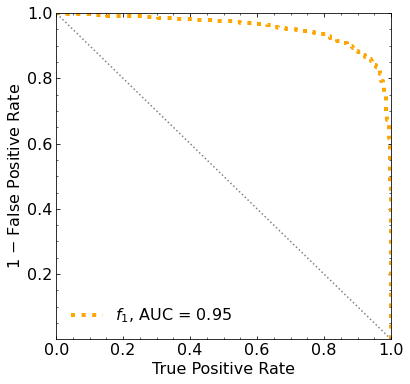

Classification score:


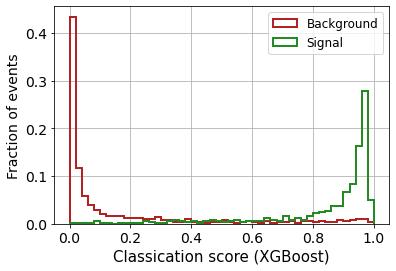


 ROC-AUC =  0.954277036854936
At least 5 B events per bin, range = [[0, 1]]:
# bins:  14 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  14
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


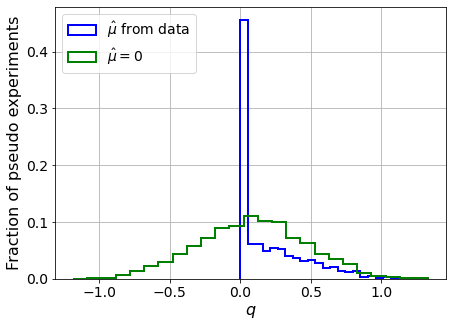

muhat mean:  -0.07826950716370867
Z_bins:  0.29988293705339203
std Z_bins:  0.418533633864669
Z_bins mu=0:  0.29988293705339203
std Z_bins mu=0:  0.640266307930778

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


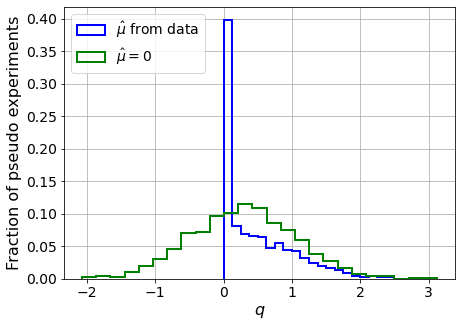

muhat mean:  -0.0065197325005256004
Z_bins:  0.531253341224685
std Z_bins:  0.5048088411422679
Z_bins mu=0:  0.5312394101685899
std Z_bins mu=0:  0.7151405516121104

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


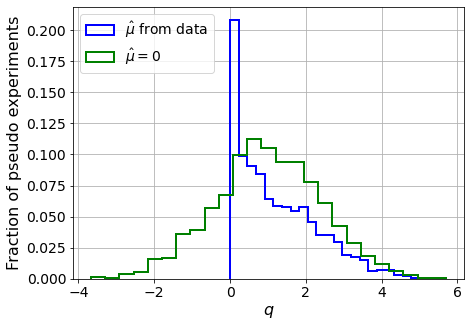

muhat mean:  0.035610574118406756
Z_bins:  0.9925325775005558
std Z_bins:  0.5451415337558349
Z_bins mu=0:  0.9916006399869618
std Z_bins mu=0:  0.712240872513487

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


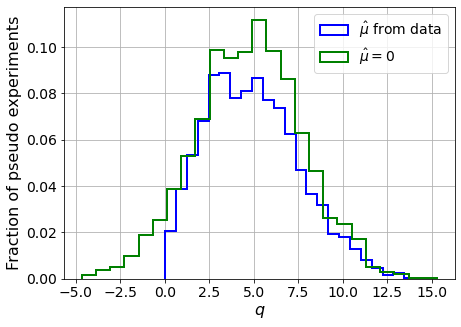

muhat mean:  0.006448733364306063
Z_bins:  2.1842830970094615
std Z_bins:  0.5987894753205633
Z_bins mu=0:  2.184092762199321
std Z_bins mu=0:  0.6853342327409219

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


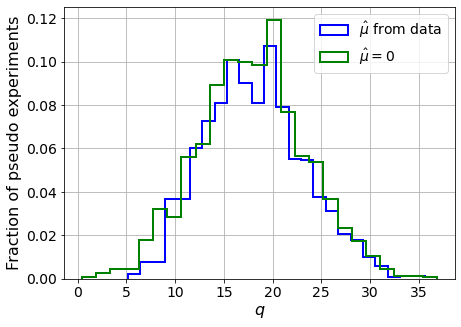

muhat mean:  0.004495339911362471
Z_bins:  4.236797258202925
std Z_bins:  0.6066060332737986
Z_bins mu=0:  4.236703902579199
std Z_bins mu=0:  0.6508851138624269

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


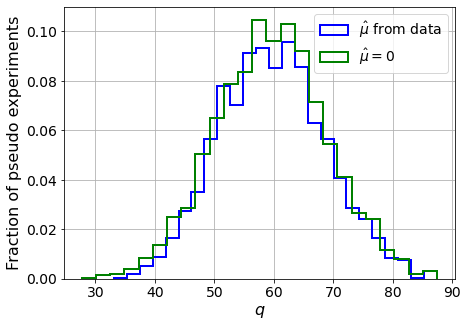

muhat mean:  0.0003022547231568466
Z_bins:  7.711809258146996
std Z_bins:  0.5796175126829323
Z_bins mu=0:  7.7113999694770845
std Z_bins mu=0:  0.6039706883901876

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


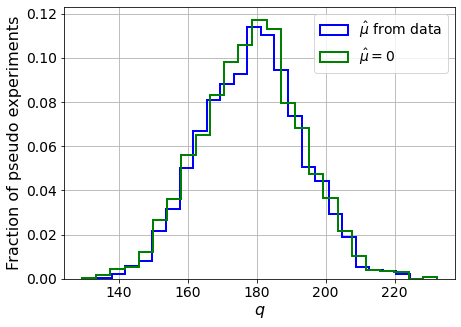

muhat mean:  0.0005696160018693023
Z_bins:  13.378296215587268
std Z_bins:  0.5373538800712577
Z_bins mu=0:  13.378032651806189
std Z_bins mu=0:  0.5515765056084594

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


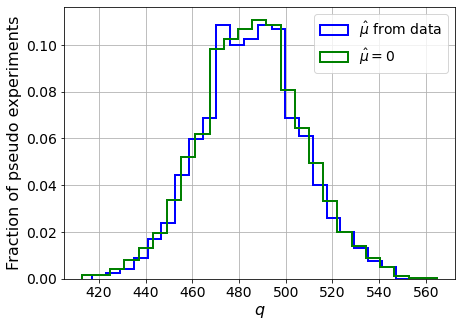

muhat mean:  0.00022389235507157783
Z_bins:  22.03308170880863
std Z_bins:  0.48990127713163223
Z_bins mu=0:  22.032981732538275
std Z_bins mu=0:  0.49859812189951414

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


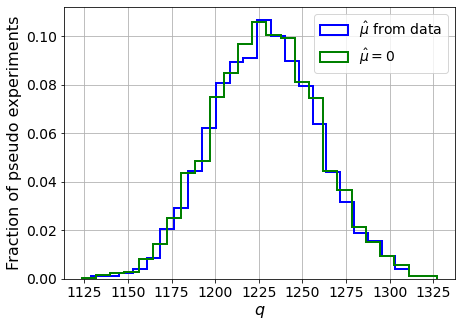

muhat mean:  0.0004951260627617378
Z_bins:  35.05561903913571
std Z_bins:  0.42905957359035046
Z_bins mu=0:  35.05529247239849
std Z_bins mu=0:  0.4347929590725174

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


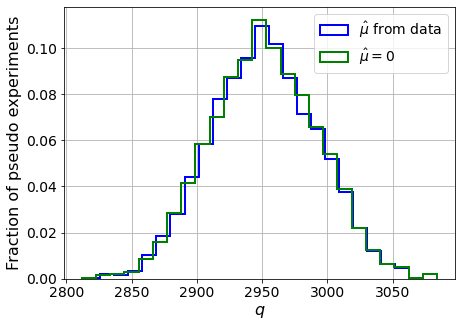

muhat mean:  6.58858680518212e-05
Z_bins:  54.321120432378
std Z_bins:  0.3734836461537664
Z_bins mu=0:  54.320508703889374
std Z_bins mu=0:  0.37695065829796554

--------


 FINAL RESULT:

[[0.29988293705339203, 0.418533633864669, -0.07826950716370867, 0.29988293705339203, 0.640266307930778], [0.531253341224685, 0.5048088411422679, -0.0065197325005256004, 0.5312394101685899, 0.7151405516121104], [0.9925325775005558, 0.5451415337558349, 0.035610574118406756, 0.9916006399869618, 0.712240872513487], [2.1842830970094615, 0.5987894753205633, 0.006448733364306063, 2.184092762199321, 0.6853342327409219], [4.236797258202925, 0.6066060332737986, 0.004495339911362471, 4.236703902579199, 0.6508851138624269], [7.711809258146996, 0.5796175126829323, 0.0003022547231568466, 7.7113999694770845, 0.6039706883901876], [13.378296215587268, 0.5373538800712577, 0.0005696160018693023, 13.378032651806189, 0.5515765056084594], [22.03308170880863, 0.48990127713163223, 0.00022389235507157783, 22.032981732538275

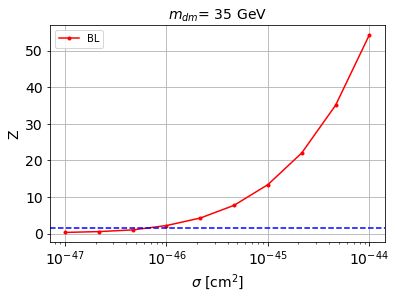


cross_BL_164:  7.480050401916606e-47
cross_BL_164_up:  5.072894680190335e-47
cross_BL_164_down:  1.0270867684917846e-46

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68779	validation_1-logloss:0.68835
[1]	validation_0-logloss:0.68254	validation_1-logloss:0.68371
[2]	validation_0-logloss:0.67739	validation_1-logloss:0.67906
[3]	validation_0-logloss:0.67234	validation_1-logloss:0.67452
[4]	validation_0-logloss:0.66739	validation_1-logloss:0.66993
[5]	validation_0-logloss:0.66251	validation_1-logloss:0.66549
[6]	validation_0-logloss:0.65770	validation_1-logloss:0.66113
[7]	validation_0-logloss:0.65299	validation_1-logloss:0.65684
[8]	validation_0-logloss:0.64830	validation_1-logloss:0.65274
[9]	validation_0-logloss:0.64372	validation_1-logloss:0.64856
[10]	validation_0-logloss:0.63924	validation_1-logloss:0.64444
[11]	validation_0-logloss:0.63484	validation_1-logloss:0.64048
[12]	validation_0-logloss:0.63042	validation_1-logloss:0.63669
[13]	validation_0-logloss:0.62614	validation_1-logloss:0.63290
[14]	validation_0-logloss:0.62184	validation_1-logloss:0.62919
[15]	validation_0-logloss:0.61771	validation_1-logloss:0.62547
[1

[130]	validation_0-logloss:0.36484	validation_1-logloss:0.42253
[131]	validation_0-logloss:0.36363	validation_1-logloss:0.42172
[132]	validation_0-logloss:0.36246	validation_1-logloss:0.42099
[133]	validation_0-logloss:0.36131	validation_1-logloss:0.42014
[134]	validation_0-logloss:0.36014	validation_1-logloss:0.41939
[135]	validation_0-logloss:0.35899	validation_1-logloss:0.41869
[136]	validation_0-logloss:0.35793	validation_1-logloss:0.41803
[137]	validation_0-logloss:0.35681	validation_1-logloss:0.41720
[138]	validation_0-logloss:0.35577	validation_1-logloss:0.41654
[139]	validation_0-logloss:0.35469	validation_1-logloss:0.41590
[140]	validation_0-logloss:0.35350	validation_1-logloss:0.41508
[141]	validation_0-logloss:0.35241	validation_1-logloss:0.41441
[142]	validation_0-logloss:0.35136	validation_1-logloss:0.41382
[143]	validation_0-logloss:0.35020	validation_1-logloss:0.41302
[144]	validation_0-logloss:0.34916	validation_1-logloss:0.41221
[145]	validation_0-logloss:0.34803	valid

[259]	validation_0-logloss:0.25929	validation_1-logloss:0.36047
[260]	validation_0-logloss:0.25869	validation_1-logloss:0.36022
[261]	validation_0-logloss:0.25810	validation_1-logloss:0.35996
[262]	validation_0-logloss:0.25751	validation_1-logloss:0.35971
[263]	validation_0-logloss:0.25684	validation_1-logloss:0.35946
[264]	validation_0-logloss:0.25625	validation_1-logloss:0.35924
[265]	validation_0-logloss:0.25560	validation_1-logloss:0.35888
[266]	validation_0-logloss:0.25498	validation_1-logloss:0.35867
[267]	validation_0-logloss:0.25436	validation_1-logloss:0.35841
[268]	validation_0-logloss:0.25379	validation_1-logloss:0.35819
[269]	validation_0-logloss:0.25325	validation_1-logloss:0.35800
[270]	validation_0-logloss:0.25273	validation_1-logloss:0.35773
[271]	validation_0-logloss:0.25217	validation_1-logloss:0.35747
[272]	validation_0-logloss:0.25157	validation_1-logloss:0.35725
[273]	validation_0-logloss:0.25098	validation_1-logloss:0.35702
[274]	validation_0-logloss:0.25046	valid

[388]	validation_0-logloss:0.19704	validation_1-logloss:0.33837
[389]	validation_0-logloss:0.19666	validation_1-logloss:0.33829
[390]	validation_0-logloss:0.19627	validation_1-logloss:0.33817
[391]	validation_0-logloss:0.19584	validation_1-logloss:0.33799
[392]	validation_0-logloss:0.19550	validation_1-logloss:0.33791
[393]	validation_0-logloss:0.19512	validation_1-logloss:0.33783
[394]	validation_0-logloss:0.19475	validation_1-logloss:0.33775
[395]	validation_0-logloss:0.19433	validation_1-logloss:0.33764
[396]	validation_0-logloss:0.19395	validation_1-logloss:0.33753
[397]	validation_0-logloss:0.19360	validation_1-logloss:0.33737
[398]	validation_0-logloss:0.19321	validation_1-logloss:0.33718
[399]	validation_0-logloss:0.19284	validation_1-logloss:0.33717
[400]	validation_0-logloss:0.19251	validation_1-logloss:0.33706
[401]	validation_0-logloss:0.19211	validation_1-logloss:0.33705
[402]	validation_0-logloss:0.19173	validation_1-logloss:0.33688
[403]	validation_0-logloss:0.19136	valid

[517]	validation_0-logloss:0.15841	validation_1-logloss:0.32707
[518]	validation_0-logloss:0.15817	validation_1-logloss:0.32702
[519]	validation_0-logloss:0.15790	validation_1-logloss:0.32703
[520]	validation_0-logloss:0.15766	validation_1-logloss:0.32699
[521]	validation_0-logloss:0.15739	validation_1-logloss:0.32687
[522]	validation_0-logloss:0.15722	validation_1-logloss:0.32677
[523]	validation_0-logloss:0.15696	validation_1-logloss:0.32669
[524]	validation_0-logloss:0.15676	validation_1-logloss:0.32659
[525]	validation_0-logloss:0.15653	validation_1-logloss:0.32659
[526]	validation_0-logloss:0.15622	validation_1-logloss:0.32652
[527]	validation_0-logloss:0.15595	validation_1-logloss:0.32644
[528]	validation_0-logloss:0.15568	validation_1-logloss:0.32643
[529]	validation_0-logloss:0.15550	validation_1-logloss:0.32637
[530]	validation_0-logloss:0.15526	validation_1-logloss:0.32632
[531]	validation_0-logloss:0.15508	validation_1-logloss:0.32625
[532]	validation_0-logloss:0.15478	valid

[646]	validation_0-logloss:0.13219	validation_1-logloss:0.32349
[647]	validation_0-logloss:0.13205	validation_1-logloss:0.32343
[648]	validation_0-logloss:0.13184	validation_1-logloss:0.32346
[649]	validation_0-logloss:0.13167	validation_1-logloss:0.32343
[650]	validation_0-logloss:0.13153	validation_1-logloss:0.32336
[651]	validation_0-logloss:0.13134	validation_1-logloss:0.32344
[652]	validation_0-logloss:0.13121	validation_1-logloss:0.32350
[653]	validation_0-logloss:0.13097	validation_1-logloss:0.32344
[654]	validation_0-logloss:0.13077	validation_1-logloss:0.32338
[655]	validation_0-logloss:0.13059	validation_1-logloss:0.32337
[656]	validation_0-logloss:0.13041	validation_1-logloss:0.32340
[657]	validation_0-logloss:0.13023	validation_1-logloss:0.32339
[658]	validation_0-logloss:0.13008	validation_1-logloss:0.32333
[659]	validation_0-logloss:0.12991	validation_1-logloss:0.32332
[660]	validation_0-logloss:0.12976	validation_1-logloss:0.32328
[661]	validation_0-logloss:0.12961	valid

[775]	validation_0-logloss:0.11156	validation_1-logloss:0.32227
[776]	validation_0-logloss:0.11146	validation_1-logloss:0.32228
[777]	validation_0-logloss:0.11138	validation_1-logloss:0.32228
[778]	validation_0-logloss:0.11118	validation_1-logloss:0.32231
[779]	validation_0-logloss:0.11105	validation_1-logloss:0.32241
[780]	validation_0-logloss:0.11089	validation_1-logloss:0.32249
[781]	validation_0-logloss:0.11071	validation_1-logloss:0.32249
[782]	validation_0-logloss:0.11059	validation_1-logloss:0.32250
[783]	validation_0-logloss:0.11047	validation_1-logloss:0.32248
[784]	validation_0-logloss:0.11032	validation_1-logloss:0.32253
[785]	validation_0-logloss:0.11014	validation_1-logloss:0.32247
[786]	validation_0-logloss:0.11004	validation_1-logloss:0.32248
[787]	validation_0-logloss:0.10993	validation_1-logloss:0.32250
[788]	validation_0-logloss:0.10982	validation_1-logloss:0.32258
[789]	validation_0-logloss:0.10969	validation_1-logloss:0.32259
[790]	validation_0-logloss:0.10958	valid

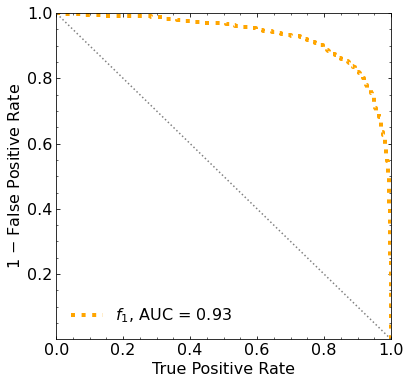

Classification score:


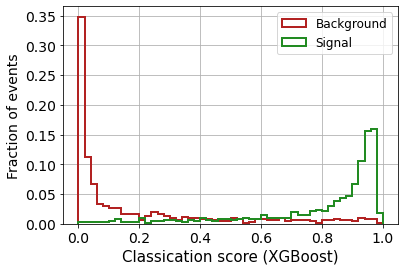


 ROC-AUC =  0.9304975109089793
At least 5 B events per bin, range = [[0, 1]]:
# bins:  20 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  20
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


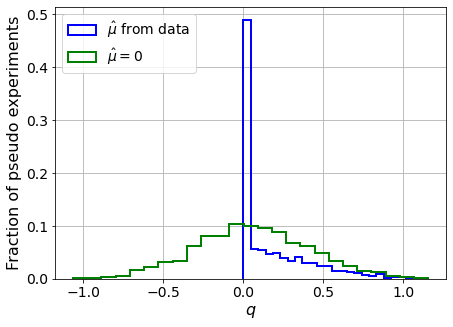

muhat mean:  -0.020868455620299806
Z_bins:  0.23637466005421146
std Z_bins:  0.4877224819922347
Z_bins mu=0:  0.23634679127909722
std Z_bins mu=0:  0.752386847017644

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


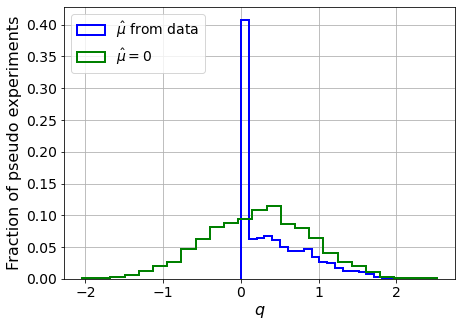

muhat mean:  0.001186312552008424
Z_bins:  0.49406295553301766
std Z_bins:  0.46599916716081996
Z_bins mu=0:  0.49406295553301766
std Z_bins mu=0:  0.6854011006309392

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


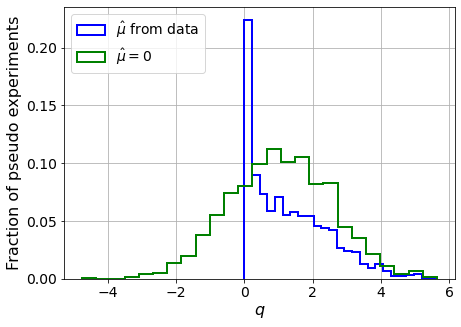

muhat mean:  -0.0008106636288862337
Z_bins:  1.0290432280356012
std Z_bins:  0.5620292710675767
Z_bins mu=0:  1.0283428861278017
std Z_bins mu=0:  0.7224992088647794

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


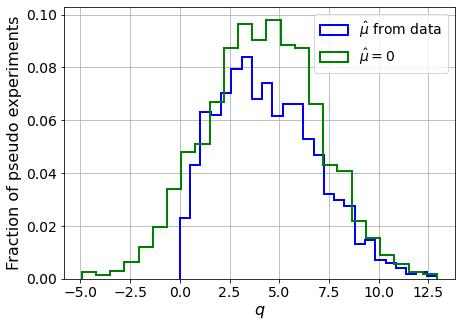

muhat mean:  0.00613361612635219
Z_bins:  2.046578901236341
std Z_bins:  0.6066485365474314
Z_bins mu=0:  2.0460909594339043
std Z_bins mu=0:  0.6996687591510301

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


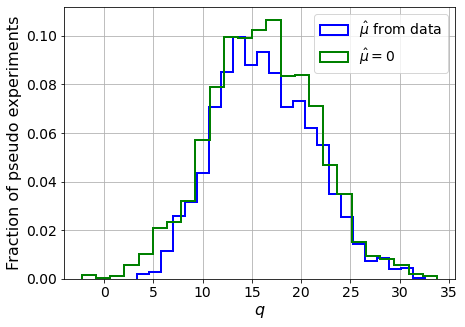

muhat mean:  0.000803767625648647
Z_bins:  4.0080354457614975
std Z_bins:  0.6203105779234835
Z_bins mu=0:  4.007656531993721
std Z_bins mu=0:  0.6677501191583618

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


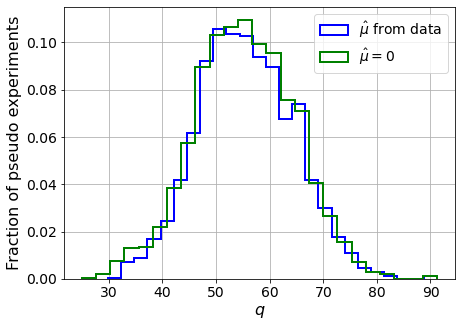

muhat mean:  0.002991663077931296
Z_bins:  7.418586290982162
std Z_bins:  0.6005967493891647
Z_bins mu=0:  7.417909282426128
std Z_bins mu=0:  0.6278827963118027

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


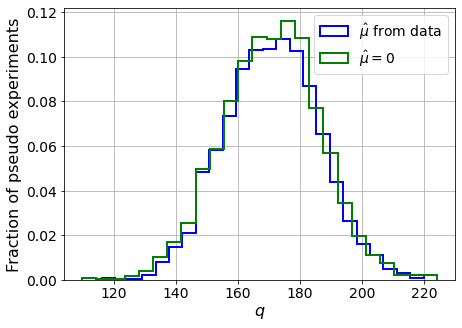

muhat mean:  0.0007677284360910781
Z_bins:  13.08011984903836
std Z_bins:  0.585965596095544
Z_bins mu=0:  13.078689940497476
std Z_bins mu=0:  0.6028608999993276

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


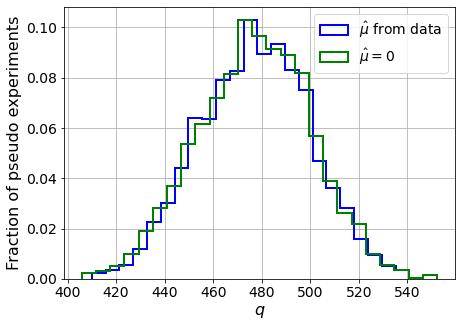

muhat mean:  -2.643031077321739e-05
Z_bins:  21.85284599187099
std Z_bins:  0.5268211512885783
Z_bins mu=0:  21.852835145281524
std Z_bins mu=0:  0.5357542613860213

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


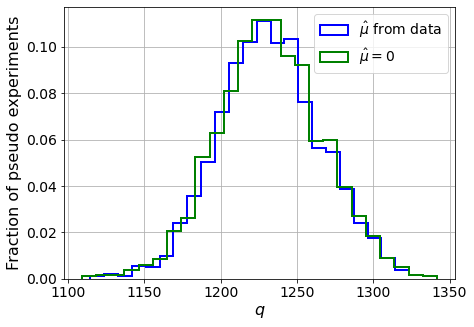

muhat mean:  0.000289606096003268
Z_bins:  35.0969531106328
std Z_bins:  0.4786398688032717
Z_bins mu=0:  35.09588856471682
std Z_bins mu=0:  0.48424825886974515

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


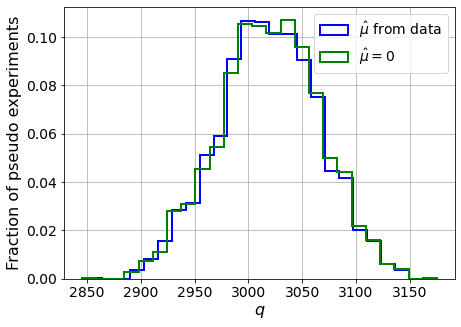

muhat mean:  -3.6200892096873504e-05
Z_bins:  54.94766934830053
std Z_bins:  0.4251999326400485
Z_bins mu=0:  54.947341003211505
std Z_bins mu=0:  0.42862742159545525

--------


 FINAL RESULT:

[[0.23637466005421146, 0.4877224819922347, -0.020868455620299806, 0.23634679127909722, 0.752386847017644], [0.49406295553301766, 0.46599916716081996, 0.001186312552008424, 0.49406295553301766, 0.6854011006309392], [1.0290432280356012, 0.5620292710675767, -0.0008106636288862337, 1.0283428861278017, 0.7224992088647794], [2.046578901236341, 0.6066485365474314, 0.00613361612635219, 2.0460909594339043, 0.6996687591510301], [4.0080354457614975, 0.6203105779234835, 0.000803767625648647, 4.007656531993721, 0.6677501191583618], [7.418586290982162, 0.6005967493891647, 0.002991663077931296, 7.417909282426128, 0.6278827963118027], [13.08011984903836, 0.585965596095544, 0.0007677284360910781, 13.078689940497476, 0.6028608999993276], [21.85284599187099, 0.5268211512885783, -2.643031077321739e-05, 21.85283514

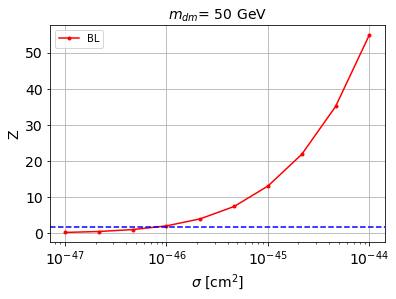


cross_BL_164:  7.834168278209551e-47
cross_BL_164_up:  4.858078053708801e-47
cross_BL_164_down:  1.1101495015519975e-46

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68841	validation_1-logloss:0.68912
[1]	validation_0-logloss:0.68376	validation_1-logloss:0.68514
[2]	validation_0-logloss:0.67921	validation_1-logloss:0.68125
[3]	validation_0-logloss:0.67473	validation_1-logloss:0.67736
[4]	validation_0-logloss:0.67033	validation_1-logloss:0.67347
[5]	validation_0-logloss:0.66594	validation_1-logloss:0.66971
[6]	validation_0-logloss:0.66171	validation_1-logloss:0.66610
[7]	validation_0-logloss:0.65750	validation_1-logloss:0.66249
[8]	validation_0-logloss:0.65337	validation_1-logloss:0.65899
[9]	validation_0-logloss:0.64931	validation_1-logloss:0.65546
[10]	validation_0-logloss:0.64529	validation_1-logloss:0.65201
[11]	validation_0-logloss:0.64130	validation_1-logloss:0.64867
[12]	validation_0-logloss:0.63744	validation_1-logloss:0.64551
[13]	validation_0-logloss:0.63357	validation_1-logloss:0.64227
[14]	validation_0-logloss:0.62981	validation_1-logloss:0.63908
[15]	validation_0-logloss:0.62606	validation_1-logloss:0.63597
[1

[130]	validation_0-logloss:0.39387	validation_1-logloss:0.45320
[131]	validation_0-logloss:0.39270	validation_1-logloss:0.45238
[132]	validation_0-logloss:0.39165	validation_1-logloss:0.45160
[133]	validation_0-logloss:0.39058	validation_1-logloss:0.45099
[134]	validation_0-logloss:0.38948	validation_1-logloss:0.45013
[135]	validation_0-logloss:0.38845	validation_1-logloss:0.44950
[136]	validation_0-logloss:0.38738	validation_1-logloss:0.44879
[137]	validation_0-logloss:0.38627	validation_1-logloss:0.44810
[138]	validation_0-logloss:0.38524	validation_1-logloss:0.44755
[139]	validation_0-logloss:0.38421	validation_1-logloss:0.44694
[140]	validation_0-logloss:0.38315	validation_1-logloss:0.44619
[141]	validation_0-logloss:0.38208	validation_1-logloss:0.44546
[142]	validation_0-logloss:0.38101	validation_1-logloss:0.44485
[143]	validation_0-logloss:0.37997	validation_1-logloss:0.44416
[144]	validation_0-logloss:0.37893	validation_1-logloss:0.44357
[145]	validation_0-logloss:0.37792	valid

[259]	validation_0-logloss:0.29088	validation_1-logloss:0.40064
[260]	validation_0-logloss:0.29031	validation_1-logloss:0.40040
[261]	validation_0-logloss:0.28971	validation_1-logloss:0.40024
[262]	validation_0-logloss:0.28917	validation_1-logloss:0.39993
[263]	validation_0-logloss:0.28862	validation_1-logloss:0.39976
[264]	validation_0-logloss:0.28805	validation_1-logloss:0.39961
[265]	validation_0-logloss:0.28748	validation_1-logloss:0.39945
[266]	validation_0-logloss:0.28694	validation_1-logloss:0.39937
[267]	validation_0-logloss:0.28641	validation_1-logloss:0.39919
[268]	validation_0-logloss:0.28588	validation_1-logloss:0.39893
[269]	validation_0-logloss:0.28535	validation_1-logloss:0.39875
[270]	validation_0-logloss:0.28480	validation_1-logloss:0.39853
[271]	validation_0-logloss:0.28425	validation_1-logloss:0.39832
[272]	validation_0-logloss:0.28364	validation_1-logloss:0.39801
[273]	validation_0-logloss:0.28307	validation_1-logloss:0.39785
[274]	validation_0-logloss:0.28254	valid

[388]	validation_0-logloss:0.22970	validation_1-logloss:0.38072
[389]	validation_0-logloss:0.22932	validation_1-logloss:0.38072
[390]	validation_0-logloss:0.22901	validation_1-logloss:0.38069
[391]	validation_0-logloss:0.22864	validation_1-logloss:0.38056
[392]	validation_0-logloss:0.22823	validation_1-logloss:0.38046
[393]	validation_0-logloss:0.22787	validation_1-logloss:0.38036
[394]	validation_0-logloss:0.22754	validation_1-logloss:0.38033
[395]	validation_0-logloss:0.22722	validation_1-logloss:0.38019
[396]	validation_0-logloss:0.22687	validation_1-logloss:0.38019
[397]	validation_0-logloss:0.22646	validation_1-logloss:0.38006
[398]	validation_0-logloss:0.22604	validation_1-logloss:0.37996
[399]	validation_0-logloss:0.22569	validation_1-logloss:0.37983
[400]	validation_0-logloss:0.22535	validation_1-logloss:0.37988
[401]	validation_0-logloss:0.22504	validation_1-logloss:0.37980
[402]	validation_0-logloss:0.22475	validation_1-logloss:0.37967
[403]	validation_0-logloss:0.22439	valid

[517]	validation_0-logloss:0.18974	validation_1-logloss:0.37042
[518]	validation_0-logloss:0.18951	validation_1-logloss:0.37034
[519]	validation_0-logloss:0.18926	validation_1-logloss:0.37035
[520]	validation_0-logloss:0.18892	validation_1-logloss:0.37034
[521]	validation_0-logloss:0.18863	validation_1-logloss:0.37027
[522]	validation_0-logloss:0.18838	validation_1-logloss:0.37017
[523]	validation_0-logloss:0.18818	validation_1-logloss:0.37011
[524]	validation_0-logloss:0.18797	validation_1-logloss:0.37012
[525]	validation_0-logloss:0.18770	validation_1-logloss:0.37002
[526]	validation_0-logloss:0.18747	validation_1-logloss:0.37000
[527]	validation_0-logloss:0.18718	validation_1-logloss:0.36987
[528]	validation_0-logloss:0.18692	validation_1-logloss:0.36990
[529]	validation_0-logloss:0.18668	validation_1-logloss:0.36977
[530]	validation_0-logloss:0.18640	validation_1-logloss:0.36974
[531]	validation_0-logloss:0.18618	validation_1-logloss:0.36962
[532]	validation_0-logloss:0.18593	valid

[646]	validation_0-logloss:0.15926	validation_1-logloss:0.36491
[647]	validation_0-logloss:0.15899	validation_1-logloss:0.36478
[648]	validation_0-logloss:0.15873	validation_1-logloss:0.36469
[649]	validation_0-logloss:0.15852	validation_1-logloss:0.36468
[650]	validation_0-logloss:0.15834	validation_1-logloss:0.36463
[651]	validation_0-logloss:0.15810	validation_1-logloss:0.36468
[652]	validation_0-logloss:0.15796	validation_1-logloss:0.36464
[653]	validation_0-logloss:0.15777	validation_1-logloss:0.36464
[654]	validation_0-logloss:0.15755	validation_1-logloss:0.36464
[655]	validation_0-logloss:0.15742	validation_1-logloss:0.36460
[656]	validation_0-logloss:0.15726	validation_1-logloss:0.36458
[657]	validation_0-logloss:0.15708	validation_1-logloss:0.36457
[658]	validation_0-logloss:0.15692	validation_1-logloss:0.36455
[659]	validation_0-logloss:0.15671	validation_1-logloss:0.36453
[660]	validation_0-logloss:0.15653	validation_1-logloss:0.36450
[661]	validation_0-logloss:0.15639	valid

[775]	validation_0-logloss:0.13617	validation_1-logloss:0.36174
[776]	validation_0-logloss:0.13607	validation_1-logloss:0.36173
[777]	validation_0-logloss:0.13593	validation_1-logloss:0.36178
[778]	validation_0-logloss:0.13583	validation_1-logloss:0.36171
[779]	validation_0-logloss:0.13562	validation_1-logloss:0.36169
[780]	validation_0-logloss:0.13544	validation_1-logloss:0.36161
[781]	validation_0-logloss:0.13531	validation_1-logloss:0.36154
[782]	validation_0-logloss:0.13509	validation_1-logloss:0.36157
[783]	validation_0-logloss:0.13494	validation_1-logloss:0.36158
[784]	validation_0-logloss:0.13482	validation_1-logloss:0.36159
[785]	validation_0-logloss:0.13465	validation_1-logloss:0.36160
[786]	validation_0-logloss:0.13447	validation_1-logloss:0.36159
[787]	validation_0-logloss:0.13426	validation_1-logloss:0.36155
[788]	validation_0-logloss:0.13409	validation_1-logloss:0.36149
[789]	validation_0-logloss:0.13399	validation_1-logloss:0.36151
[790]	validation_0-logloss:0.13388	valid

[904]	validation_0-logloss:0.11874	validation_1-logloss:0.35944
[905]	validation_0-logloss:0.11862	validation_1-logloss:0.35948
[906]	validation_0-logloss:0.11849	validation_1-logloss:0.35941
[907]	validation_0-logloss:0.11832	validation_1-logloss:0.35936
[908]	validation_0-logloss:0.11824	validation_1-logloss:0.35939
[909]	validation_0-logloss:0.11817	validation_1-logloss:0.35939
[910]	validation_0-logloss:0.11801	validation_1-logloss:0.35935
[911]	validation_0-logloss:0.11788	validation_1-logloss:0.35935
[912]	validation_0-logloss:0.11778	validation_1-logloss:0.35936
[913]	validation_0-logloss:0.11766	validation_1-logloss:0.35935
[914]	validation_0-logloss:0.11756	validation_1-logloss:0.35931
[915]	validation_0-logloss:0.11747	validation_1-logloss:0.35926
[916]	validation_0-logloss:0.11738	validation_1-logloss:0.35934
[917]	validation_0-logloss:0.11732	validation_1-logloss:0.35934
[918]	validation_0-logloss:0.11724	validation_1-logloss:0.35933
[919]	validation_0-logloss:0.11708	valid

[1032]	validation_0-logloss:0.10506	validation_1-logloss:0.35838
[1033]	validation_0-logloss:0.10493	validation_1-logloss:0.35835
[1034]	validation_0-logloss:0.10486	validation_1-logloss:0.35836
[1035]	validation_0-logloss:0.10475	validation_1-logloss:0.35833
[1036]	validation_0-logloss:0.10467	validation_1-logloss:0.35831
[1037]	validation_0-logloss:0.10453	validation_1-logloss:0.35829
[1038]	validation_0-logloss:0.10440	validation_1-logloss:0.35831
[1039]	validation_0-logloss:0.10431	validation_1-logloss:0.35828
[1040]	validation_0-logloss:0.10421	validation_1-logloss:0.35830
[1041]	validation_0-logloss:0.10409	validation_1-logloss:0.35827
[1042]	validation_0-logloss:0.10398	validation_1-logloss:0.35823
[1043]	validation_0-logloss:0.10391	validation_1-logloss:0.35823
[1044]	validation_0-logloss:0.10380	validation_1-logloss:0.35824
[1045]	validation_0-logloss:0.10367	validation_1-logloss:0.35825
[1046]	validation_0-logloss:0.10356	validation_1-logloss:0.35824
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.09277	validation_1-logloss:0.35773
[1160]	validation_0-logloss:0.09265	validation_1-logloss:0.35780
[1161]	validation_0-logloss:0.09259	validation_1-logloss:0.35780
[1162]	validation_0-logloss:0.09249	validation_1-logloss:0.35779
[1163]	validation_0-logloss:0.09242	validation_1-logloss:0.35780
[1164]	validation_0-logloss:0.09231	validation_1-logloss:0.35774
[1165]	validation_0-logloss:0.09222	validation_1-logloss:0.35774
[1166]	validation_0-logloss:0.09216	validation_1-logloss:0.35771
[1167]	validation_0-logloss:0.09207	validation_1-logloss:0.35768
[1168]	validation_0-logloss:0.09199	validation_1-logloss:0.35773
[1169]	validation_0-logloss:0.09193	validation_1-logloss:0.35775
[1170]	validation_0-logloss:0.09185	validation_1-logloss:0.35775
[1171]	validation_0-logloss:0.09176	validation_1-logloss:0.35771
[1172]	validation_0-logloss:0.09168	validation_1-logloss:0.35771
[1173]	validation_0-logloss:0.09159	validation_1-logloss:0.35765
[1174]	validation_0-loglo

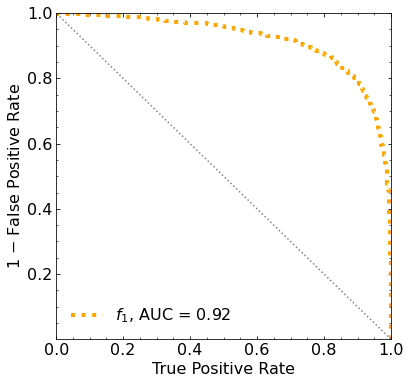

Classification score:


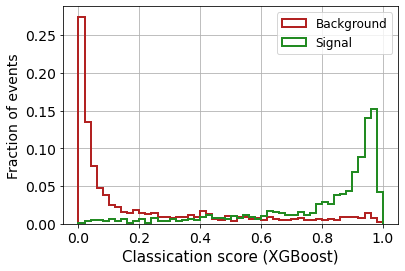


 ROC-AUC =  0.9186448794378546
At least 5 B events per bin, range = [[0, 1]]:
# bins:  23 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  23
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


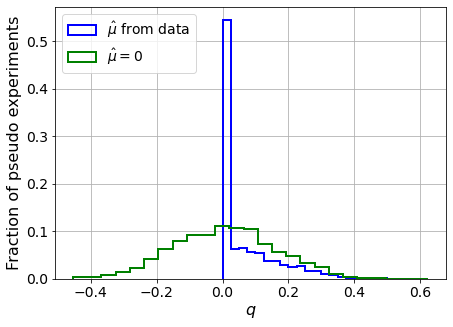

muhat mean:  0.22016659378922182
Z_bins:  0.09475480750885695
std Z_bins:  0.5001806368941698
Z_bins mu=0:  0.09400668981778923
std Z_bins mu=0:  0.8356985810395312

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


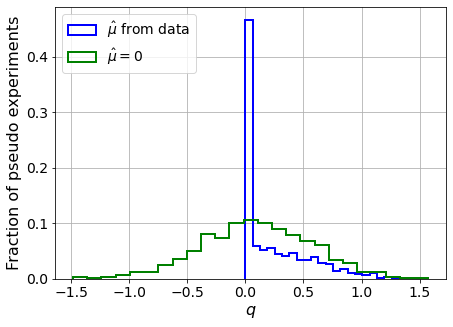

muhat mean:  0.03985423078345586
Z_bins:  0.3047645320334538
std Z_bins:  0.4957319761216734
Z_bins mu=0:  0.3045347991346189
std Z_bins mu=0:  0.7775855403269857

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


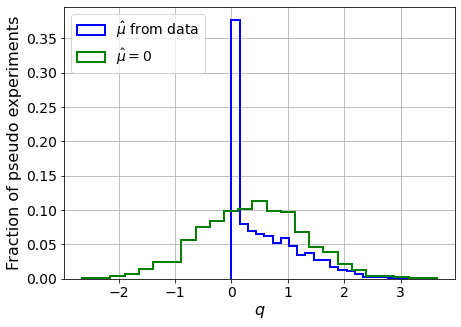

muhat mean:  0.03058832814249764
Z_bins:  0.6235330274676548
std Z_bins:  0.5145723236367945
Z_bins mu=0:  0.6233506500414144
std Z_bins mu=0:  0.7294309427572565

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


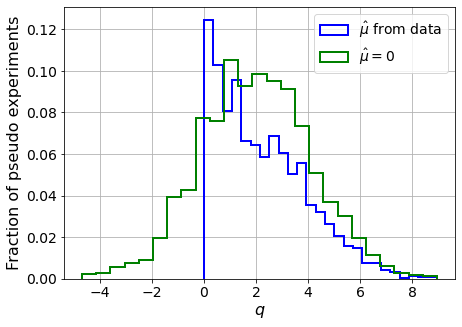

muhat mean:  0.0022165288462853666
Z_bins:  1.402018166592677
std Z_bins:  0.6178398276133213
Z_bins mu=0:  1.401910563809994
std Z_bins mu=0:  0.7542979124573911

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


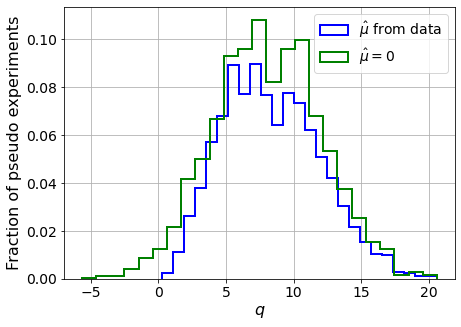

muhat mean:  -0.004697489329521366
Z_bins:  2.822114750035004
std Z_bins:  0.6357491003819925
Z_bins mu=0:  2.821710890311643
std Z_bins mu=0:  0.7015225219836422

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


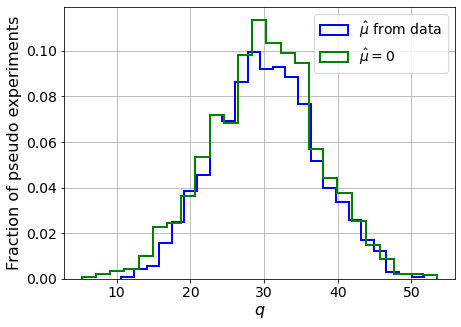

muhat mean:  -0.001984780258066912
Z_bins:  5.490563807609978
std Z_bins:  0.631856901339809
Z_bins mu=0:  5.490518403229813
std Z_bins mu=0:  0.669949964614023

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


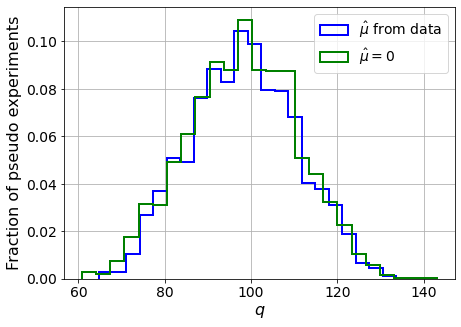

muhat mean:  0.0006016039591158338
Z_bins:  9.911825114114363
std Z_bins:  0.623614365353395
Z_bins mu=0:  9.911609925602962
std Z_bins mu=0:  0.6451821091988129

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


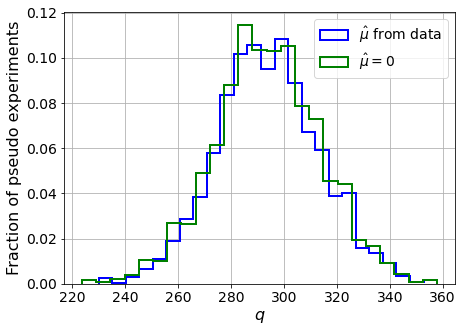

muhat mean:  1.3390583969570602e-05
Z_bins:  17.13409830250048
std Z_bins:  0.5683128642923309
Z_bins mu=0:  17.13285839698642
std Z_bins mu=0:  0.5804541907585059

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


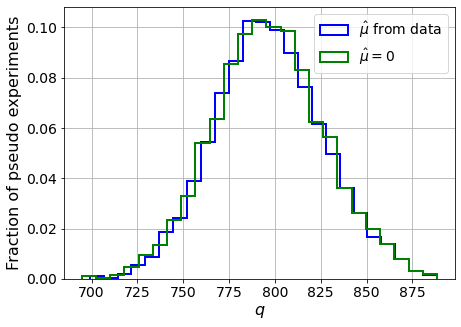

muhat mean:  0.0005504565460448369
Z_bins:  28.217305988520483
std Z_bins:  0.5262542253229898
Z_bins mu=0:  28.21561119616976
std Z_bins mu=0:  0.5335578652305677

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


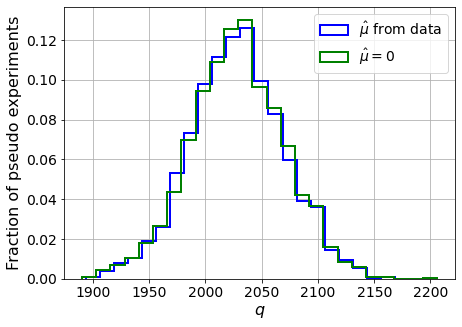

muhat mean:  0.00011810767435605276
Z_bins:  45.03658935858409
std Z_bins:  0.4630434614570073
Z_bins mu=0:  45.035481277639256
std Z_bins mu=0:  0.4674627184250894

--------


 FINAL RESULT:

[[0.09475480750885695, 0.5001806368941698, 0.22016659378922182, 0.09400668981778923, 0.8356985810395312], [0.3047645320334538, 0.4957319761216734, 0.03985423078345586, 0.3045347991346189, 0.7775855403269857], [0.6235330274676548, 0.5145723236367945, 0.03058832814249764, 0.6233506500414144, 0.7294309427572565], [1.402018166592677, 0.6178398276133213, 0.0022165288462853666, 1.401910563809994, 0.7542979124573911], [2.822114750035004, 0.6357491003819925, -0.004697489329521366, 2.821710890311643, 0.7015225219836422], [5.490563807609978, 0.631856901339809, -0.001984780258066912, 5.490518403229813, 0.669949964614023], [9.911825114114363, 0.623614365353395, 0.0006016039591158338, 9.911609925602962, 0.6451821091988129], [17.13409830250048, 0.5683128642923309, 1.3390583969570602e-05, 17.13285839698642, 0.5

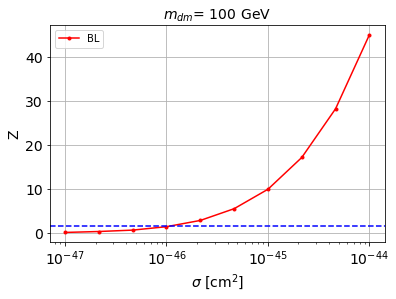


cross_BL_164:  1.1789451890139106e-46
cross_BL_164_up:  7.562081972812477e-47
cross_BL_164_down:  1.701591664546286e-46

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68861	validation_1-logloss:0.68934
[1]	validation_0-logloss:0.68412	validation_1-logloss:0.68557
[2]	validation_0-logloss:0.67976	validation_1-logloss:0.68184
[3]	validation_0-logloss:0.67546	validation_1-logloss:0.67835
[4]	validation_0-logloss:0.67129	validation_1-logloss:0.67477
[5]	validation_0-logloss:0.66705	validation_1-logloss:0.67132
[6]	validation_0-logloss:0.66290	validation_1-logloss:0.66785
[7]	validation_0-logloss:0.65883	validation_1-logloss:0.66447
[8]	validation_0-logloss:0.65489	validation_1-logloss:0.66131
[9]	validation_0-logloss:0.65096	validation_1-logloss:0.65807
[10]	validation_0-logloss:0.64711	validation_1-logloss:0.65490
[11]	validation_0-logloss:0.64331	validation_1-logloss:0.65188
[12]	validation_0-logloss:0.63958	validation_1-logloss:0.64887
[13]	validation_0-logloss:0.63589	validation_1-logloss:0.64588
[14]	validation_0-logloss:0.63219	validation_1-logloss:0.64298
[15]	validation_0-logloss:0.62865	validation_1-logloss:0.64008
[1

[130]	validation_0-logloss:0.40416	validation_1-logloss:0.48074
[131]	validation_0-logloss:0.40309	validation_1-logloss:0.47998
[132]	validation_0-logloss:0.40192	validation_1-logloss:0.47936
[133]	validation_0-logloss:0.40089	validation_1-logloss:0.47877
[134]	validation_0-logloss:0.39975	validation_1-logloss:0.47818
[135]	validation_0-logloss:0.39875	validation_1-logloss:0.47750
[136]	validation_0-logloss:0.39767	validation_1-logloss:0.47678
[137]	validation_0-logloss:0.39666	validation_1-logloss:0.47628
[138]	validation_0-logloss:0.39558	validation_1-logloss:0.47573
[139]	validation_0-logloss:0.39455	validation_1-logloss:0.47514
[140]	validation_0-logloss:0.39349	validation_1-logloss:0.47469
[141]	validation_0-logloss:0.39253	validation_1-logloss:0.47412
[142]	validation_0-logloss:0.39151	validation_1-logloss:0.47347
[143]	validation_0-logloss:0.39053	validation_1-logloss:0.47301
[144]	validation_0-logloss:0.38950	validation_1-logloss:0.47250
[145]	validation_0-logloss:0.38851	valid

[259]	validation_0-logloss:0.30151	validation_1-logloss:0.43546
[260]	validation_0-logloss:0.30097	validation_1-logloss:0.43530
[261]	validation_0-logloss:0.30040	validation_1-logloss:0.43512
[262]	validation_0-logloss:0.29981	validation_1-logloss:0.43494
[263]	validation_0-logloss:0.29923	validation_1-logloss:0.43484
[264]	validation_0-logloss:0.29866	validation_1-logloss:0.43475
[265]	validation_0-logloss:0.29810	validation_1-logloss:0.43459
[266]	validation_0-logloss:0.29752	validation_1-logloss:0.43442
[267]	validation_0-logloss:0.29700	validation_1-logloss:0.43427
[268]	validation_0-logloss:0.29644	validation_1-logloss:0.43406
[269]	validation_0-logloss:0.29591	validation_1-logloss:0.43388
[270]	validation_0-logloss:0.29535	validation_1-logloss:0.43373
[271]	validation_0-logloss:0.29479	validation_1-logloss:0.43361
[272]	validation_0-logloss:0.29419	validation_1-logloss:0.43340
[273]	validation_0-logloss:0.29364	validation_1-logloss:0.43326
[274]	validation_0-logloss:0.29307	valid

[388]	validation_0-logloss:0.24083	validation_1-logloss:0.42027
[389]	validation_0-logloss:0.24044	validation_1-logloss:0.42029
[390]	validation_0-logloss:0.24007	validation_1-logloss:0.42033
[391]	validation_0-logloss:0.23970	validation_1-logloss:0.42030
[392]	validation_0-logloss:0.23933	validation_1-logloss:0.42020
[393]	validation_0-logloss:0.23896	validation_1-logloss:0.42013
[394]	validation_0-logloss:0.23855	validation_1-logloss:0.42009
[395]	validation_0-logloss:0.23822	validation_1-logloss:0.42006
[396]	validation_0-logloss:0.23784	validation_1-logloss:0.41995
[397]	validation_0-logloss:0.23745	validation_1-logloss:0.42006
[398]	validation_0-logloss:0.23707	validation_1-logloss:0.42002
[399]	validation_0-logloss:0.23672	validation_1-logloss:0.42000
[400]	validation_0-logloss:0.23631	validation_1-logloss:0.41992
[401]	validation_0-logloss:0.23594	validation_1-logloss:0.41977
[402]	validation_0-logloss:0.23555	validation_1-logloss:0.41978
[403]	validation_0-logloss:0.23515	valid

[517]	validation_0-logloss:0.19933	validation_1-logloss:0.41492
[518]	validation_0-logloss:0.19903	validation_1-logloss:0.41487
[519]	validation_0-logloss:0.19881	validation_1-logloss:0.41485
[520]	validation_0-logloss:0.19854	validation_1-logloss:0.41479
[521]	validation_0-logloss:0.19823	validation_1-logloss:0.41473
[522]	validation_0-logloss:0.19799	validation_1-logloss:0.41478
[523]	validation_0-logloss:0.19772	validation_1-logloss:0.41477
[524]	validation_0-logloss:0.19737	validation_1-logloss:0.41474
[525]	validation_0-logloss:0.19707	validation_1-logloss:0.41468
[526]	validation_0-logloss:0.19674	validation_1-logloss:0.41475
[527]	validation_0-logloss:0.19645	validation_1-logloss:0.41471
[528]	validation_0-logloss:0.19620	validation_1-logloss:0.41472
[529]	validation_0-logloss:0.19600	validation_1-logloss:0.41472
[530]	validation_0-logloss:0.19573	validation_1-logloss:0.41463
[531]	validation_0-logloss:0.19545	validation_1-logloss:0.41465
[532]	validation_0-logloss:0.19517	valid

[646]	validation_0-logloss:0.16955	validation_1-logloss:0.41159
[647]	validation_0-logloss:0.16939	validation_1-logloss:0.41159
[648]	validation_0-logloss:0.16923	validation_1-logloss:0.41159
[649]	validation_0-logloss:0.16909	validation_1-logloss:0.41161
[650]	validation_0-logloss:0.16884	validation_1-logloss:0.41149
[651]	validation_0-logloss:0.16870	validation_1-logloss:0.41153
[652]	validation_0-logloss:0.16851	validation_1-logloss:0.41147
[653]	validation_0-logloss:0.16833	validation_1-logloss:0.41145
[654]	validation_0-logloss:0.16812	validation_1-logloss:0.41147
[655]	validation_0-logloss:0.16787	validation_1-logloss:0.41155
[656]	validation_0-logloss:0.16770	validation_1-logloss:0.41151
[657]	validation_0-logloss:0.16754	validation_1-logloss:0.41154
[658]	validation_0-logloss:0.16731	validation_1-logloss:0.41147
[659]	validation_0-logloss:0.16713	validation_1-logloss:0.41143
[660]	validation_0-logloss:0.16693	validation_1-logloss:0.41136
[661]	validation_0-logloss:0.16672	valid

[775]	validation_0-logloss:0.14684	validation_1-logloss:0.40942
[776]	validation_0-logloss:0.14670	validation_1-logloss:0.40932
[777]	validation_0-logloss:0.14654	validation_1-logloss:0.40927
[778]	validation_0-logloss:0.14634	validation_1-logloss:0.40924
[779]	validation_0-logloss:0.14620	validation_1-logloss:0.40923
[780]	validation_0-logloss:0.14605	validation_1-logloss:0.40928
[781]	validation_0-logloss:0.14592	validation_1-logloss:0.40929
[782]	validation_0-logloss:0.14579	validation_1-logloss:0.40927
[783]	validation_0-logloss:0.14565	validation_1-logloss:0.40936
[784]	validation_0-logloss:0.14544	validation_1-logloss:0.40931
[785]	validation_0-logloss:0.14530	validation_1-logloss:0.40937
[786]	validation_0-logloss:0.14513	validation_1-logloss:0.40933
[787]	validation_0-logloss:0.14496	validation_1-logloss:0.40929
[788]	validation_0-logloss:0.14480	validation_1-logloss:0.40924
[789]	validation_0-logloss:0.14463	validation_1-logloss:0.40923
[790]	validation_0-logloss:0.14442	valid

[904]	validation_0-logloss:0.12791	validation_1-logloss:0.40834
[905]	validation_0-logloss:0.12779	validation_1-logloss:0.40839
[906]	validation_0-logloss:0.12765	validation_1-logloss:0.40833
[907]	validation_0-logloss:0.12751	validation_1-logloss:0.40839
[908]	validation_0-logloss:0.12736	validation_1-logloss:0.40844
[909]	validation_0-logloss:0.12718	validation_1-logloss:0.40839
[910]	validation_0-logloss:0.12702	validation_1-logloss:0.40837
[911]	validation_0-logloss:0.12683	validation_1-logloss:0.40834
[912]	validation_0-logloss:0.12669	validation_1-logloss:0.40830
[913]	validation_0-logloss:0.12656	validation_1-logloss:0.40836
[914]	validation_0-logloss:0.12641	validation_1-logloss:0.40830
[915]	validation_0-logloss:0.12621	validation_1-logloss:0.40825
[916]	validation_0-logloss:0.12610	validation_1-logloss:0.40827
[917]	validation_0-logloss:0.12598	validation_1-logloss:0.40818
[918]	validation_0-logloss:0.12580	validation_1-logloss:0.40818
[919]	validation_0-logloss:0.12566	valid

[1032]	validation_0-logloss:0.11133	validation_1-logloss:0.40719
[1033]	validation_0-logloss:0.11124	validation_1-logloss:0.40721
[1034]	validation_0-logloss:0.11115	validation_1-logloss:0.40718
[1035]	validation_0-logloss:0.11106	validation_1-logloss:0.40712
[1036]	validation_0-logloss:0.11095	validation_1-logloss:0.40709
[1037]	validation_0-logloss:0.11084	validation_1-logloss:0.40704
[1038]	validation_0-logloss:0.11074	validation_1-logloss:0.40705
[1039]	validation_0-logloss:0.11064	validation_1-logloss:0.40704
[1040]	validation_0-logloss:0.11048	validation_1-logloss:0.40698
[1041]	validation_0-logloss:0.11035	validation_1-logloss:0.40694
[1042]	validation_0-logloss:0.11023	validation_1-logloss:0.40698
[1043]	validation_0-logloss:0.11015	validation_1-logloss:0.40708
[1044]	validation_0-logloss:0.11002	validation_1-logloss:0.40706
[1045]	validation_0-logloss:0.10989	validation_1-logloss:0.40701
[1046]	validation_0-logloss:0.10983	validation_1-logloss:0.40695
[1047]	validation_0-loglo

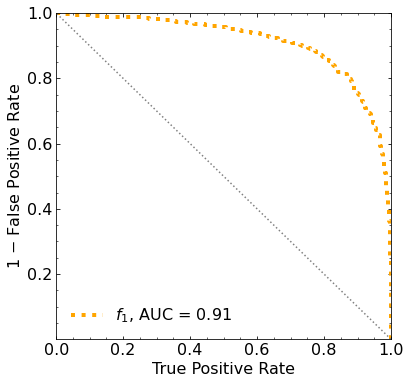

Classification score:


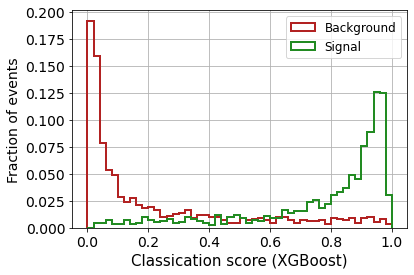


 ROC-AUC =  0.9117998791305595
At least 5 B events per bin, range = [[0, 1]]:
# bins:  27 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  27
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


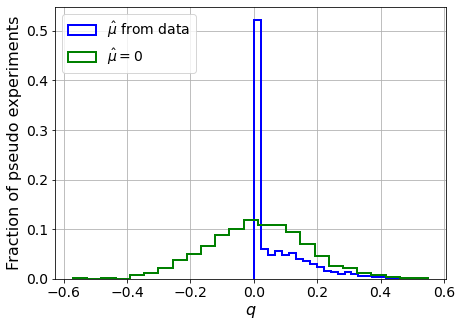

muhat mean:  -0.02886760182585654
Z_bins:  0.11049301099467951
std Z_bins:  0.43673758084175196
Z_bins mu=0:  0.11049301099467951
std Z_bins mu=0:  0.7125372628680187

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


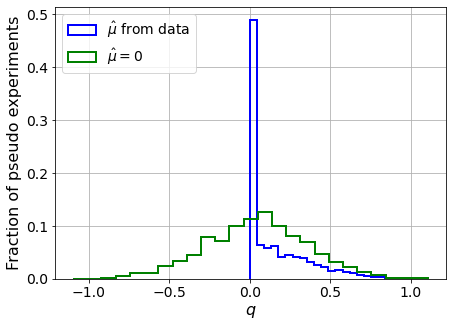

muhat mean:  -0.009031256680264204
Z_bins:  0.22807029222707362
std Z_bins:  0.4360652737676839
Z_bins mu=0:  0.22807029222707362
std Z_bins mu=0:  0.6958380178200256

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


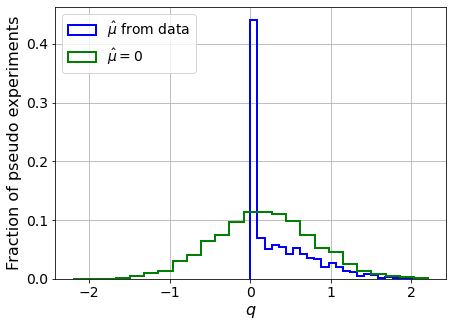

muhat mean:  0.0004247693779294295
Z_bins:  0.4072140642425905
std Z_bins:  0.5087570211936011
Z_bins mu=0:  0.4072140642425905
std Z_bins mu=0:  0.7523761135910593

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


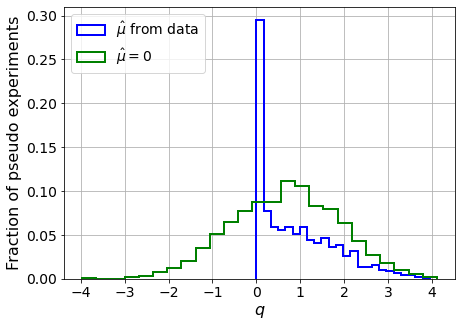

muhat mean:  -0.0031971485951225436
Z_bins:  0.8304575353575325
std Z_bins:  0.536288591296343
Z_bins mu=0:  0.830451669835274
std Z_bins mu=0:  0.7311796400497372

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


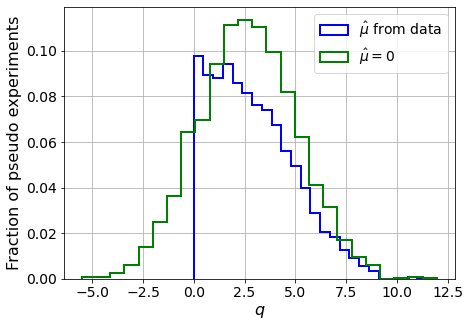

muhat mean:  0.010390701496745385
Z_bins:  1.6313206022412579
std Z_bins:  0.6220463917170976
Z_bins mu=0:  1.6305882860084169
std Z_bins mu=0:  0.7421825930036153

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


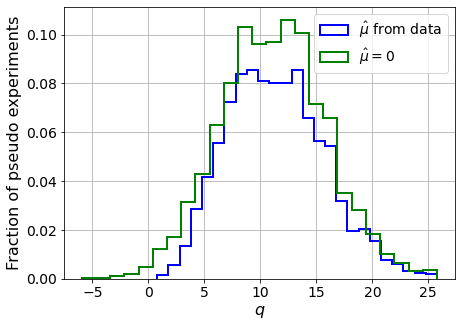

muhat mean:  -0.005252437879070067
Z_bins:  3.3361308444668825
std Z_bins:  0.6486454247482507
Z_bins mu=0:  3.3361308444668825
std Z_bins mu=0:  0.7064422861856379

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


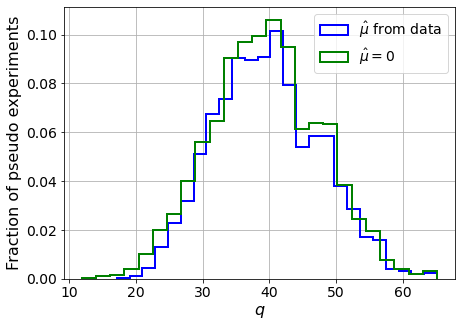

muhat mean:  -0.001788739796296977
Z_bins:  6.275825453945982
std Z_bins:  0.6296804639384057
Z_bins mu=0:  6.27580370984748
std Z_bins mu=0:  0.6589276930165159

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


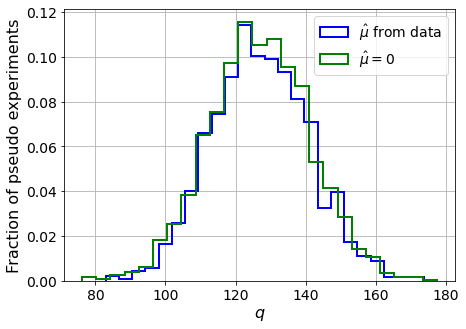

muhat mean:  0.0019576772927612784
Z_bins:  11.25853971327642
std Z_bins:  0.6133207097864288
Z_bins mu=0:  11.257249415936027
std Z_bins mu=0:  0.633167142669098

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


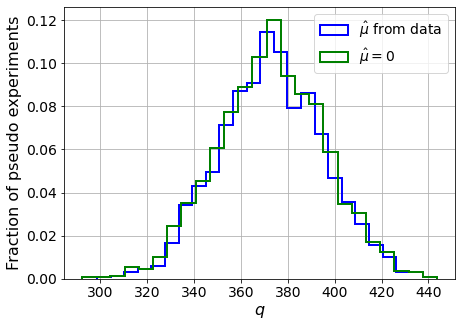

muhat mean:  5.3783040253546464e-05
Z_bins:  19.31422420435633
std Z_bins:  0.5769383468933537
Z_bins mu=0:  19.31322116932202
std Z_bins mu=0:  0.5881516372672323

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


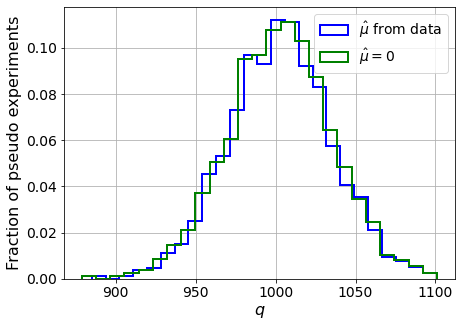

muhat mean:  -0.00018287915667569842
Z_bins:  31.673498314540964
std Z_bins:  0.5096114003073124
Z_bins mu=0:  31.67295079935436
std Z_bins mu=0:  0.5156749497866921

--------


 FINAL RESULT:

[[0.11049301099467951, 0.43673758084175196, -0.02886760182585654, 0.11049301099467951, 0.7125372628680187], [0.22807029222707362, 0.4360652737676839, -0.009031256680264204, 0.22807029222707362, 0.6958380178200256], [0.4072140642425905, 0.5087570211936011, 0.0004247693779294295, 0.4072140642425905, 0.7523761135910593], [0.8304575353575325, 0.536288591296343, -0.0031971485951225436, 0.830451669835274, 0.7311796400497372], [1.6313206022412579, 0.6220463917170976, 0.010390701496745385, 1.6305882860084169, 0.7421825930036153], [3.3361308444668825, 0.6486454247482507, -0.005252437879070067, 3.3361308444668825, 0.7064422861856379], [6.275825453945982, 0.6296804639384057, -0.001788739796296977, 6.27580370984748, 0.6589276930165159], [11.25853971327642, 0.6133207097864288, 0.0019576772927612784, 11.25724

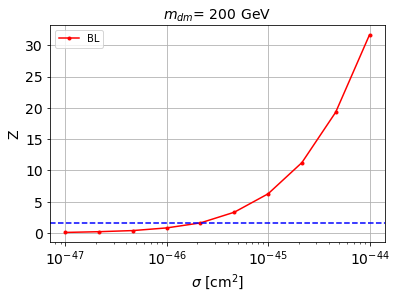


cross_BL_164:  2.166396056941992e-46
cross_BL_164_up:  1.3471774300031703e-46
cross_BL_164_down:  3.0634158612526905e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68873	validation_1-logloss:0.68927
[1]	validation_0-logloss:0.68441	validation_1-logloss:0.68551
[2]	validation_0-logloss:0.68015	validation_1-logloss:0.68178
[3]	validation_0-logloss:0.67597	validation_1-logloss:0.67818
[4]	validation_0-logloss:0.67188	validation_1-logloss:0.67464
[5]	validation_0-logloss:0.66783	validation_1-logloss:0.67110
[6]	validation_0-logloss:0.66381	validation_1-logloss:0.66753
[7]	validation_0-logloss:0.65992	validation_1-logloss:0.66423
[8]	validation_0-logloss:0.65604	validation_1-logloss:0.66083
[9]	validation_0-logloss:0.65228	validation_1-logloss:0.65769
[10]	validation_0-logloss:0.64853	validation_1-logloss:0.65446
[11]	validation_0-logloss:0.64489	validation_1-logloss:0.65126
[12]	validation_0-logloss:0.64123	validation_1-logloss:0.64813
[13]	validation_0-logloss:0.63765	validation_1-logloss:0.64526
[14]	validation_0-logloss:0.63414	validation_1-logloss:0.64232
[15]	validation_0-logloss:0.63068	validation_1-logloss:0.63941
[1

[130]	validation_0-logloss:0.41119	validation_1-logloss:0.48271
[131]	validation_0-logloss:0.41009	validation_1-logloss:0.48214
[132]	validation_0-logloss:0.40901	validation_1-logloss:0.48157
[133]	validation_0-logloss:0.40797	validation_1-logloss:0.48102
[134]	validation_0-logloss:0.40693	validation_1-logloss:0.48044
[135]	validation_0-logloss:0.40592	validation_1-logloss:0.47993
[136]	validation_0-logloss:0.40486	validation_1-logloss:0.47937
[137]	validation_0-logloss:0.40384	validation_1-logloss:0.47877
[138]	validation_0-logloss:0.40281	validation_1-logloss:0.47822
[139]	validation_0-logloss:0.40182	validation_1-logloss:0.47764
[140]	validation_0-logloss:0.40083	validation_1-logloss:0.47712
[141]	validation_0-logloss:0.39978	validation_1-logloss:0.47646
[142]	validation_0-logloss:0.39870	validation_1-logloss:0.47572
[143]	validation_0-logloss:0.39770	validation_1-logloss:0.47527
[144]	validation_0-logloss:0.39669	validation_1-logloss:0.47473
[145]	validation_0-logloss:0.39571	valid

[259]	validation_0-logloss:0.31039	validation_1-logloss:0.44065
[260]	validation_0-logloss:0.30982	validation_1-logloss:0.44034
[261]	validation_0-logloss:0.30926	validation_1-logloss:0.44011
[262]	validation_0-logloss:0.30868	validation_1-logloss:0.43999
[263]	validation_0-logloss:0.30811	validation_1-logloss:0.43982
[264]	validation_0-logloss:0.30754	validation_1-logloss:0.43962
[265]	validation_0-logloss:0.30707	validation_1-logloss:0.43953
[266]	validation_0-logloss:0.30658	validation_1-logloss:0.43932
[267]	validation_0-logloss:0.30600	validation_1-logloss:0.43909
[268]	validation_0-logloss:0.30539	validation_1-logloss:0.43891
[269]	validation_0-logloss:0.30478	validation_1-logloss:0.43875
[270]	validation_0-logloss:0.30423	validation_1-logloss:0.43863
[271]	validation_0-logloss:0.30377	validation_1-logloss:0.43853
[272]	validation_0-logloss:0.30323	validation_1-logloss:0.43831
[273]	validation_0-logloss:0.30264	validation_1-logloss:0.43816
[274]	validation_0-logloss:0.30208	valid

[388]	validation_0-logloss:0.24892	validation_1-logloss:0.42638
[389]	validation_0-logloss:0.24852	validation_1-logloss:0.42632
[390]	validation_0-logloss:0.24817	validation_1-logloss:0.42622
[391]	validation_0-logloss:0.24778	validation_1-logloss:0.42622
[392]	validation_0-logloss:0.24734	validation_1-logloss:0.42613
[393]	validation_0-logloss:0.24695	validation_1-logloss:0.42613
[394]	validation_0-logloss:0.24652	validation_1-logloss:0.42602
[395]	validation_0-logloss:0.24612	validation_1-logloss:0.42595
[396]	validation_0-logloss:0.24578	validation_1-logloss:0.42584
[397]	validation_0-logloss:0.24538	validation_1-logloss:0.42582
[398]	validation_0-logloss:0.24500	validation_1-logloss:0.42579
[399]	validation_0-logloss:0.24462	validation_1-logloss:0.42566
[400]	validation_0-logloss:0.24424	validation_1-logloss:0.42569
[401]	validation_0-logloss:0.24383	validation_1-logloss:0.42568
[402]	validation_0-logloss:0.24349	validation_1-logloss:0.42558
[403]	validation_0-logloss:0.24311	valid

[517]	validation_0-logloss:0.20433	validation_1-logloss:0.41759
[518]	validation_0-logloss:0.20401	validation_1-logloss:0.41749
[519]	validation_0-logloss:0.20371	validation_1-logloss:0.41752
[520]	validation_0-logloss:0.20338	validation_1-logloss:0.41747
[521]	validation_0-logloss:0.20304	validation_1-logloss:0.41737
[522]	validation_0-logloss:0.20273	validation_1-logloss:0.41718
[523]	validation_0-logloss:0.20242	validation_1-logloss:0.41715
[524]	validation_0-logloss:0.20212	validation_1-logloss:0.41704
[525]	validation_0-logloss:0.20182	validation_1-logloss:0.41699
[526]	validation_0-logloss:0.20148	validation_1-logloss:0.41707
[527]	validation_0-logloss:0.20119	validation_1-logloss:0.41703
[528]	validation_0-logloss:0.20089	validation_1-logloss:0.41702
[529]	validation_0-logloss:0.20057	validation_1-logloss:0.41698
[530]	validation_0-logloss:0.20028	validation_1-logloss:0.41696
[531]	validation_0-logloss:0.19994	validation_1-logloss:0.41691
[532]	validation_0-logloss:0.19961	valid

[646]	validation_0-logloss:0.17171	validation_1-logloss:0.41364
[647]	validation_0-logloss:0.17146	validation_1-logloss:0.41375
[648]	validation_0-logloss:0.17123	validation_1-logloss:0.41369
[649]	validation_0-logloss:0.17100	validation_1-logloss:0.41364
[650]	validation_0-logloss:0.17080	validation_1-logloss:0.41369
[651]	validation_0-logloss:0.17066	validation_1-logloss:0.41366
[652]	validation_0-logloss:0.17045	validation_1-logloss:0.41369
[653]	validation_0-logloss:0.17019	validation_1-logloss:0.41379
[654]	validation_0-logloss:0.17003	validation_1-logloss:0.41369
[655]	validation_0-logloss:0.16991	validation_1-logloss:0.41371
[656]	validation_0-logloss:0.16971	validation_1-logloss:0.41364
[657]	validation_0-logloss:0.16955	validation_1-logloss:0.41350
[658]	validation_0-logloss:0.16928	validation_1-logloss:0.41339
[659]	validation_0-logloss:0.16917	validation_1-logloss:0.41334
[660]	validation_0-logloss:0.16904	validation_1-logloss:0.41336
[661]	validation_0-logloss:0.16880	valid

[775]	validation_0-logloss:0.14916	validation_1-logloss:0.41161
[776]	validation_0-logloss:0.14900	validation_1-logloss:0.41165
[777]	validation_0-logloss:0.14882	validation_1-logloss:0.41166
[778]	validation_0-logloss:0.14864	validation_1-logloss:0.41166
[779]	validation_0-logloss:0.14852	validation_1-logloss:0.41166
[780]	validation_0-logloss:0.14835	validation_1-logloss:0.41159
[781]	validation_0-logloss:0.14824	validation_1-logloss:0.41156
[782]	validation_0-logloss:0.14802	validation_1-logloss:0.41155
[783]	validation_0-logloss:0.14780	validation_1-logloss:0.41150
[784]	validation_0-logloss:0.14762	validation_1-logloss:0.41154
[785]	validation_0-logloss:0.14740	validation_1-logloss:0.41156
[786]	validation_0-logloss:0.14729	validation_1-logloss:0.41163
[787]	validation_0-logloss:0.14711	validation_1-logloss:0.41160
[788]	validation_0-logloss:0.14698	validation_1-logloss:0.41162
[789]	validation_0-logloss:0.14685	validation_1-logloss:0.41161
[790]	validation_0-logloss:0.14674	valid

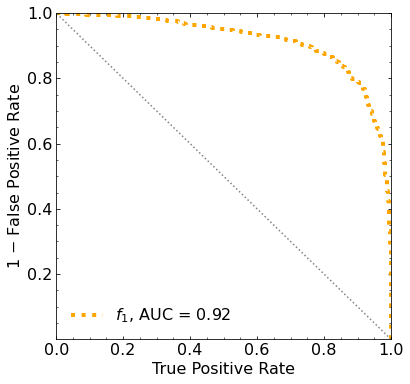

Classification score:


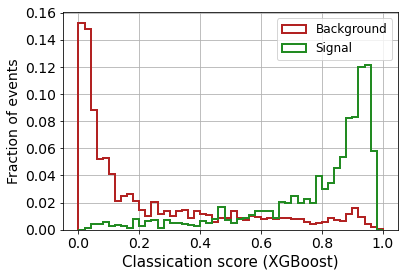


 ROC-AUC =  0.9165219818490975
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


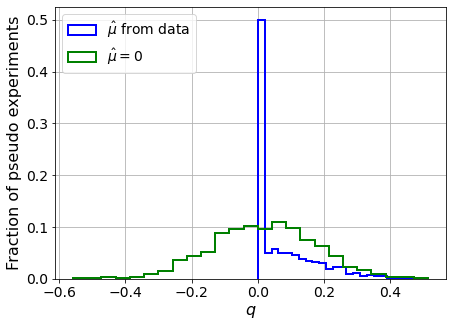

muhat mean:  -0.2947784074441754
Z_bins:  0.14393016410067122
std Z_bins:  0.33638685478322367
Z_bins mu=0:  0.14393016410067122
std Z_bins mu=0:  0.5475284002704843

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


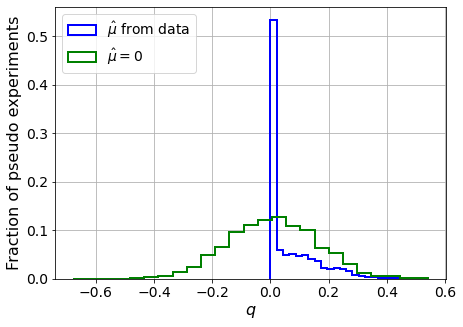

muhat mean:  0.16177279088107002
Z_bins:  0.0972253491430146
std Z_bins:  0.47576777785234114
Z_bins mu=0:  0.09707663496041131
std Z_bins mu=0:  0.7956742781439937

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


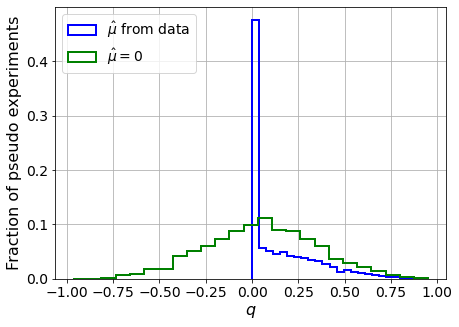

muhat mean:  -0.09576504919448445
Z_bins:  0.23172297320791227
std Z_bins:  0.4149235571691756
Z_bins mu=0:  0.23172297320791227
std Z_bins mu=0:  0.6509274360968268

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


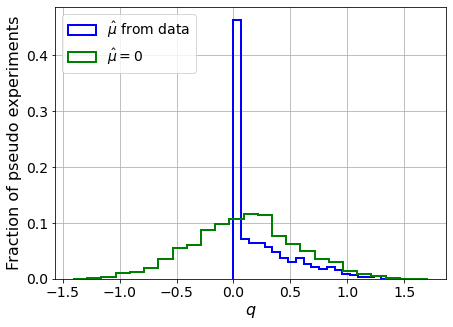

muhat mean:  -0.0283021093848122
Z_bins:  0.3217857411626666
std Z_bins:  0.4629386723921128
Z_bins mu=0:  0.3217857411626666
std Z_bins mu=0:  0.7011768492272857

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


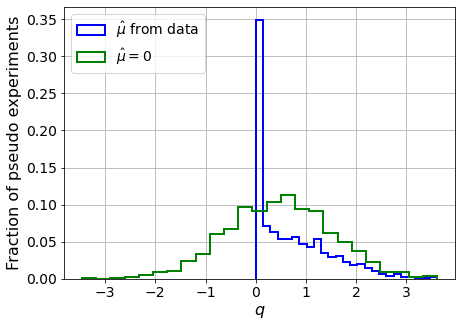

muhat mean:  0.025699426393883243
Z_bins:  0.6924352577721704
std Z_bins:  0.537932619506919
Z_bins mu=0:  0.6924104125989042
std Z_bins mu=0:  0.7549967109930181

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


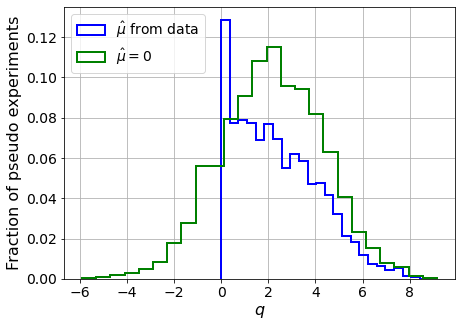

muhat mean:  -0.009900795202232726
Z_bins:  1.4676419121272326
std Z_bins:  0.603977220021811
Z_bins mu=0:  1.4676419121272326
std Z_bins mu=0:  0.7391955622345099

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


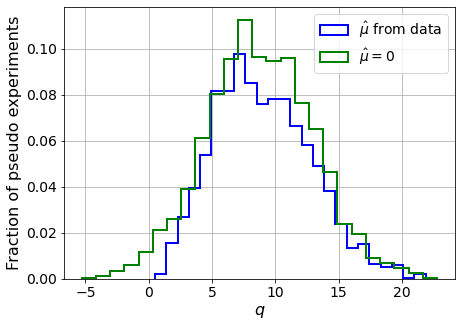

muhat mean:  0.0062393460260432776
Z_bins:  2.9411977934009825
std Z_bins:  0.6445138075789857
Z_bins mu=0:  2.941044342928971
std Z_bins mu=0:  0.7131067400598229

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


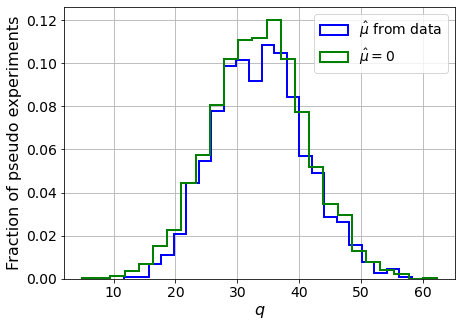

muhat mean:  0.002725223840663041
Z_bins:  5.809046970819225
std Z_bins:  0.6343674424033673
Z_bins mu=0:  5.808431807115143
std Z_bins mu=0:  0.6703232833547955

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


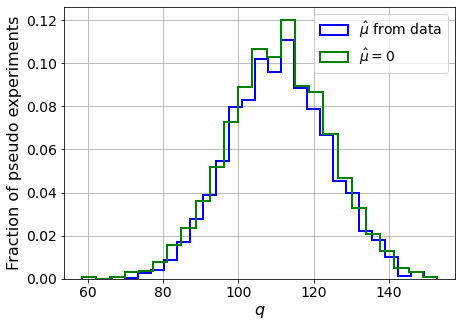

muhat mean:  0.001296323294724648
Z_bins:  10.522087850310092
std Z_bins:  0.6249489100333085
Z_bins mu=0:  10.522087746614664
std Z_bins mu=0:  0.6474995747364273

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


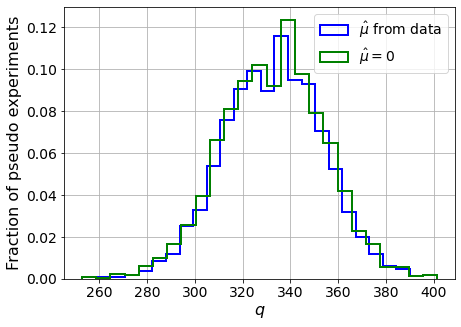

muhat mean:  0.0001404690641624837
Z_bins:  18.26522867939259
std Z_bins:  0.5710592883849609
Z_bins mu=0:  18.26494349325937
std Z_bins mu=0:  0.5831434939958687

--------


 FINAL RESULT:

[[0.14393016410067122, 0.33638685478322367, -0.2947784074441754, 0.14393016410067122, 0.5475284002704843], [0.0972253491430146, 0.47576777785234114, 0.16177279088107002, 0.09707663496041131, 0.7956742781439937], [0.23172297320791227, 0.4149235571691756, -0.09576504919448445, 0.23172297320791227, 0.6509274360968268], [0.3217857411626666, 0.4629386723921128, -0.0283021093848122, 0.3217857411626666, 0.7011768492272857], [0.6924352577721704, 0.537932619506919, 0.025699426393883243, 0.6924104125989042, 0.7549967109930181], [1.4676419121272326, 0.603977220021811, -0.009900795202232726, 1.4676419121272326, 0.7391955622345099], [2.9411977934009825, 0.6445138075789857, 0.0062393460260432776, 2.941044342928971, 0.7131067400598229], [5.809046970819225, 0.6343674424033673, 0.002725223840663041, 5.8084318071151

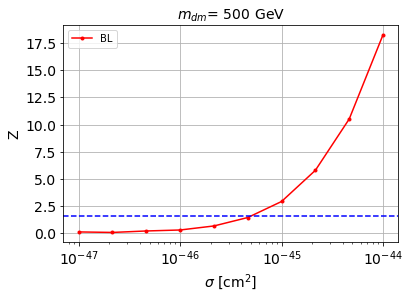


cross_BL_164:  5.232251361143556e-46
cross_BL_164_up:  3.3109024589580904e-46
cross_BL_164_down:  7.572496400506809e-46

#########################



In [10]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)



        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
#    # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
#     del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    X_mon_train = X_mon_train_1D
    X_mon_val = X_mon_val_1D
    X_mon_test = X_mon_test_1D
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [11]:
cross_images = store_cross_BL_164
cross_images_up = store_cross_BL_164_up
cross_images_down = store_cross_BL_164_down

print(cross_images)
print(cross_images_up)
print(cross_images_down)

[1.6121715159700788e-45, 1.2070037159138324e-46, 7.480050401916606e-47, 7.834168278209551e-47, 1.1789451890139106e-46, 2.166396056941992e-46, 5.232251361143556e-46]
[1.0127270997370923e-45, 7.564256646234421e-47, 5.072894680190335e-47, 4.858078053708801e-47, 7.562081972812477e-47, 1.3471774300031703e-46, 3.3109024589580904e-46]
[2.3189208701676392e-45, 1.8102085172415905e-46, 1.0270867684917846e-46, 1.1101495015519975e-46, 1.701591664546286e-46, 3.0634158612526905e-46, 7.572496400506809e-46]


In [12]:
np.savetxt('results/images.txt', [cross_images, cross_images_up, cross_images_down])

In [13]:
cross_images = np.loadtxt('results/images.txt')[0]
cross_images_up = np.loadtxt('results/images.txt')[1]
cross_images_down =np.loadtxt('results/images.txt')[2]


#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68476	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67652	validation_1-logloss:0.67761
[2]	validation_0-logloss:0.66845	validation_1-logloss:0.66997
[3]	validation_0-logloss:0.66056	validation_1-logloss:0.66245
[4]	validation_0-logloss:0.65282	validation_1-logloss:0.65504
[5]	validation_0-logloss:0.64518	validation_1-logloss:0.64791
[6]	validation_0-logloss:0.63771	validation_1-logloss:0.64079
[7]	validation_0-logloss:0.63036	validation_1-logloss:0.63385
[8]	validation_0-logloss:0.62315	validation_1-logloss:0.62695
[9]	validation_0-logloss:0.61607	validation_1-logloss:0.62021
[10]	validation_0-logloss:0.60909	validation_1-logloss:0.61369
[11]	validation_0-logloss:0.60225	validation_1-logloss:0.60716
[12]	validation_0-logloss:0.59554	validation_1-logloss:0.60085
[13]	validation_0-logloss:0.58896	validation_1-logloss:0.59462
[14]	validation_0-logloss:0.58244	validation_1-logloss:0.58856
[15]	validation_0-logloss:0.57606	validation_1-logloss:0.58249
[1

[130]	validation_0-logloss:0.20187	validation_1-logloss:0.23903
[131]	validation_0-logloss:0.20030	validation_1-logloss:0.23769
[132]	validation_0-logloss:0.19875	validation_1-logloss:0.23635
[133]	validation_0-logloss:0.19717	validation_1-logloss:0.23489
[134]	validation_0-logloss:0.19567	validation_1-logloss:0.23350
[135]	validation_0-logloss:0.19421	validation_1-logloss:0.23216
[136]	validation_0-logloss:0.19268	validation_1-logloss:0.23077
[137]	validation_0-logloss:0.19120	validation_1-logloss:0.22958
[138]	validation_0-logloss:0.18975	validation_1-logloss:0.22830
[139]	validation_0-logloss:0.18831	validation_1-logloss:0.22708
[140]	validation_0-logloss:0.18685	validation_1-logloss:0.22582
[141]	validation_0-logloss:0.18548	validation_1-logloss:0.22460
[142]	validation_0-logloss:0.18407	validation_1-logloss:0.22339
[143]	validation_0-logloss:0.18265	validation_1-logloss:0.22215
[144]	validation_0-logloss:0.18127	validation_1-logloss:0.22104
[145]	validation_0-logloss:0.17993	valid

[259]	validation_0-logloss:0.08300	validation_1-logloss:0.13561
[260]	validation_0-logloss:0.08247	validation_1-logloss:0.13516
[261]	validation_0-logloss:0.08197	validation_1-logloss:0.13476
[262]	validation_0-logloss:0.08145	validation_1-logloss:0.13430
[263]	validation_0-logloss:0.08095	validation_1-logloss:0.13389
[264]	validation_0-logloss:0.08044	validation_1-logloss:0.13340
[265]	validation_0-logloss:0.07996	validation_1-logloss:0.13290
[266]	validation_0-logloss:0.07948	validation_1-logloss:0.13249
[267]	validation_0-logloss:0.07899	validation_1-logloss:0.13205
[268]	validation_0-logloss:0.07849	validation_1-logloss:0.13161
[269]	validation_0-logloss:0.07800	validation_1-logloss:0.13123
[270]	validation_0-logloss:0.07753	validation_1-logloss:0.13086
[271]	validation_0-logloss:0.07703	validation_1-logloss:0.13044
[272]	validation_0-logloss:0.07656	validation_1-logloss:0.13000
[273]	validation_0-logloss:0.07607	validation_1-logloss:0.12954
[274]	validation_0-logloss:0.07558	valid

[388]	validation_0-logloss:0.03963	validation_1-logloss:0.10029
[389]	validation_0-logloss:0.03943	validation_1-logloss:0.10014
[390]	validation_0-logloss:0.03923	validation_1-logloss:0.10001
[391]	validation_0-logloss:0.03903	validation_1-logloss:0.09988
[392]	validation_0-logloss:0.03882	validation_1-logloss:0.09972
[393]	validation_0-logloss:0.03862	validation_1-logloss:0.09958
[394]	validation_0-logloss:0.03841	validation_1-logloss:0.09950
[395]	validation_0-logloss:0.03822	validation_1-logloss:0.09940
[396]	validation_0-logloss:0.03803	validation_1-logloss:0.09925
[397]	validation_0-logloss:0.03782	validation_1-logloss:0.09915
[398]	validation_0-logloss:0.03761	validation_1-logloss:0.09905
[399]	validation_0-logloss:0.03743	validation_1-logloss:0.09893
[400]	validation_0-logloss:0.03724	validation_1-logloss:0.09880
[401]	validation_0-logloss:0.03703	validation_1-logloss:0.09870
[402]	validation_0-logloss:0.03684	validation_1-logloss:0.09859
[403]	validation_0-logloss:0.03666	valid

[517]	validation_0-logloss:0.02101	validation_1-logloss:0.08885
[518]	validation_0-logloss:0.02092	validation_1-logloss:0.08884
[519]	validation_0-logloss:0.02082	validation_1-logloss:0.08882
[520]	validation_0-logloss:0.02072	validation_1-logloss:0.08878
[521]	validation_0-logloss:0.02063	validation_1-logloss:0.08874
[522]	validation_0-logloss:0.02052	validation_1-logloss:0.08870
[523]	validation_0-logloss:0.02044	validation_1-logloss:0.08862
[524]	validation_0-logloss:0.02035	validation_1-logloss:0.08850
[525]	validation_0-logloss:0.02025	validation_1-logloss:0.08839
[526]	validation_0-logloss:0.02015	validation_1-logloss:0.08834
[527]	validation_0-logloss:0.02007	validation_1-logloss:0.08832
[528]	validation_0-logloss:0.01997	validation_1-logloss:0.08826
[529]	validation_0-logloss:0.01988	validation_1-logloss:0.08818
[530]	validation_0-logloss:0.01979	validation_1-logloss:0.08812
[531]	validation_0-logloss:0.01969	validation_1-logloss:0.08803
[532]	validation_0-logloss:0.01962	valid

[646]	validation_0-logloss:0.01230	validation_1-logloss:0.08471
[647]	validation_0-logloss:0.01225	validation_1-logloss:0.08466
[648]	validation_0-logloss:0.01220	validation_1-logloss:0.08463
[649]	validation_0-logloss:0.01216	validation_1-logloss:0.08465
[650]	validation_0-logloss:0.01212	validation_1-logloss:0.08457
[651]	validation_0-logloss:0.01207	validation_1-logloss:0.08457
[652]	validation_0-logloss:0.01202	validation_1-logloss:0.08450
[653]	validation_0-logloss:0.01198	validation_1-logloss:0.08449
[654]	validation_0-logloss:0.01194	validation_1-logloss:0.08449
[655]	validation_0-logloss:0.01190	validation_1-logloss:0.08444
[656]	validation_0-logloss:0.01185	validation_1-logloss:0.08437
[657]	validation_0-logloss:0.01181	validation_1-logloss:0.08432
[658]	validation_0-logloss:0.01177	validation_1-logloss:0.08431
[659]	validation_0-logloss:0.01172	validation_1-logloss:0.08430
[660]	validation_0-logloss:0.01167	validation_1-logloss:0.08429
[661]	validation_0-logloss:0.01163	valid

[775]	validation_0-logloss:0.00782	validation_1-logloss:0.08301
[776]	validation_0-logloss:0.00780	validation_1-logloss:0.08304
[777]	validation_0-logloss:0.00777	validation_1-logloss:0.08306
[778]	validation_0-logloss:0.00775	validation_1-logloss:0.08307
[779]	validation_0-logloss:0.00772	validation_1-logloss:0.08300
[780]	validation_0-logloss:0.00769	validation_1-logloss:0.08299
[781]	validation_0-logloss:0.00767	validation_1-logloss:0.08297
[782]	validation_0-logloss:0.00764	validation_1-logloss:0.08295
[783]	validation_0-logloss:0.00761	validation_1-logloss:0.08287
[784]	validation_0-logloss:0.00758	validation_1-logloss:0.08283
[785]	validation_0-logloss:0.00756	validation_1-logloss:0.08280
[786]	validation_0-logloss:0.00753	validation_1-logloss:0.08282
[787]	validation_0-logloss:0.00751	validation_1-logloss:0.08279
[788]	validation_0-logloss:0.00748	validation_1-logloss:0.08283
[789]	validation_0-logloss:0.00746	validation_1-logloss:0.08283
[790]	validation_0-logloss:0.00744	valid

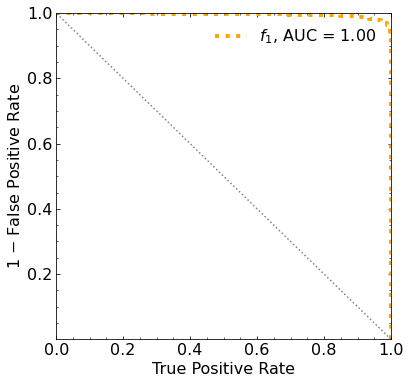

Classification score:


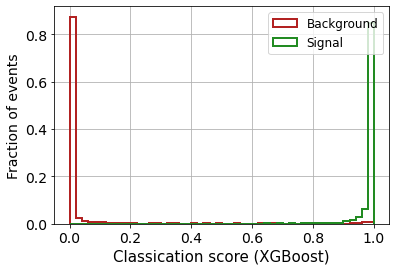


 ROC-AUC =  0.9951191281011206


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 398.65417957 319.60657209
 239.99530892 157.27110422  70.66539487 -16.26155161 -93.48212696]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
    

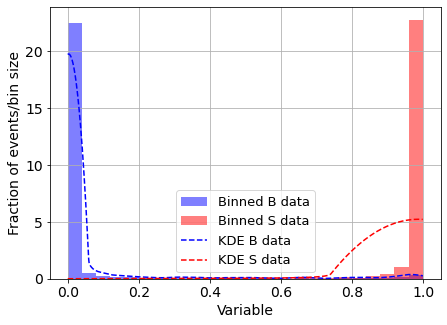

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.257351270001691
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



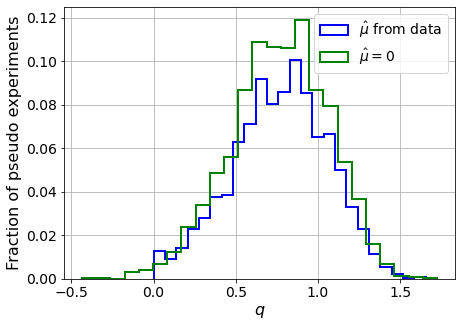

muhat mean:  -11.952693116678265
Z_bins:  0.8835865135300797
std Z_bins:  0.16606578116645745
Z_bins mu=0:  0.8835865135300797
std Z_bins mu=0:  0.16761148182295957

--------

B_expected:  643
S_expected:  1



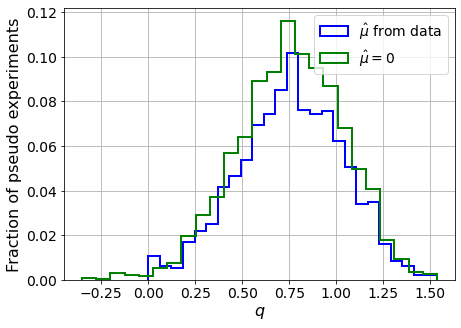

muhat mean:  -11.58774280632379
Z_bins:  0.8747529612123626
std Z_bins:  0.15840794978770853
Z_bins mu=0:  0.8747529612123626
std Z_bins mu=0:  0.16043085520184905

--------

B_expected:  643
S_expected:  1



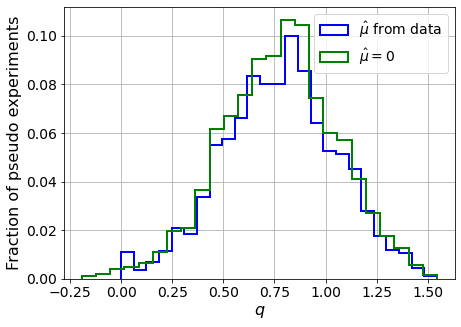

muhat mean:  -11.821418396225976
Z_bins:  0.8869079107761592
std Z_bins:  0.1575674251270497
Z_bins mu=0:  0.8869079107761592
std Z_bins mu=0:  0.15830087273540333

--------

B_expected:  643
S_expected:  1



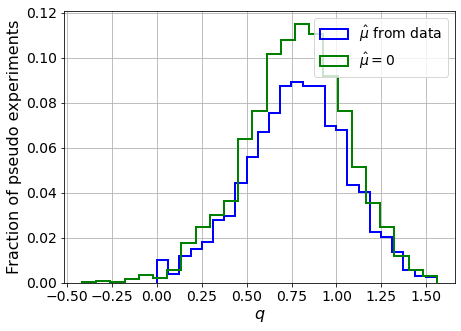

muhat mean:  -11.805384122310379
Z_bins:  0.8860731793407074
std Z_bins:  0.15929298199793973
Z_bins mu=0:  0.8860731793407074
std Z_bins mu=0:  0.16103394212341882

--------

B_expected:  643
S_expected:  1



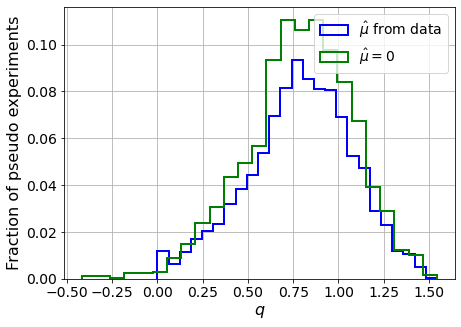

muhat mean:  -12.127592855095648
Z_bins:  0.8944616565940087
std Z_bins:  0.16171767008718127
Z_bins mu=0:  0.8944616565940087
std Z_bins mu=0:  0.1639977026589918

--------

B_expected:  643
S_expected:  2



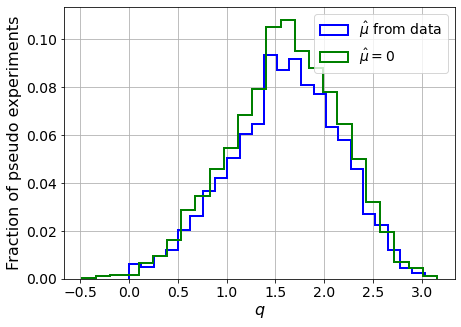

muhat mean:  -5.939741566812773
Z_bins:  1.270034555177094
std Z_bins:  0.22165220796559254
Z_bins mu=0:  1.270034555177094
std Z_bins mu=0:  0.22252960131658323

--------

B_expected:  643
S_expected:  5



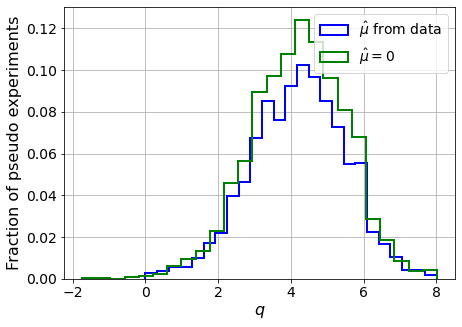

muhat mean:  -2.3743868372193706
Z_bins:  2.0609366901806245
std Z_bins:  0.31511111946121434
Z_bins mu=0:  2.0609366901806245
std Z_bins mu=0:  0.31719855090783206

--------

B_expected:  643
S_expected:  10



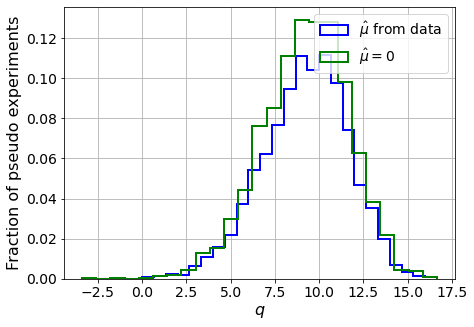

muhat mean:  -1.1958495350271765
Z_bins:  3.0560439642805406
std Z_bins:  0.39782636268698185
Z_bins mu=0:  3.0560439642805406
std Z_bins mu=0:  0.40007595596120177

--------

B_expected:  643
S_expected:  22



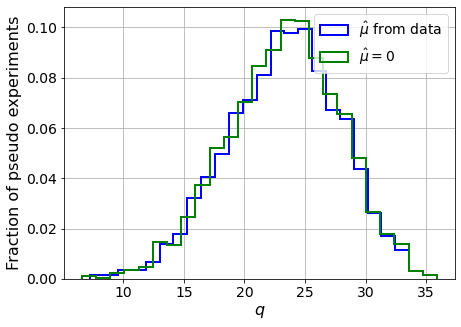

muhat mean:  -0.5457173782841687
Z_bins:  4.839882276739856
std Z_bins:  0.47899861113651854
Z_bins mu=0:  4.839882276739856
std Z_bins mu=0:  0.47930377379054717

--------

B_expected:  643
S_expected:  47



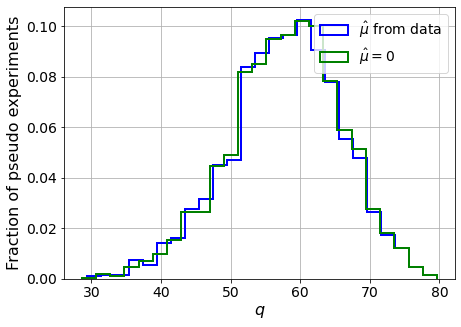

muhat mean:  -0.25147245790173184
Z_bins:  7.628092673613974
std Z_bins:  0.5254609477038803
Z_bins mu=0:  7.628092673613974
std Z_bins mu=0:  0.5257543638438603

--------


 FINAL RESULT:

[[0.8835865135300797, 0.16606578116645745, -11.952693116678265, 0.8835865135300797, 0.16761148182295957], [0.8747529612123626, 0.15840794978770853, -11.58774280632379, 0.8747529612123626, 0.16043085520184905], [0.8869079107761592, 0.1575674251270497, -11.821418396225976, 0.8869079107761592, 0.15830087273540333], [0.8860731793407074, 0.15929298199793973, -11.805384122310379, 0.8860731793407074, 0.16103394212341882], [0.8944616565940087, 0.16171767008718127, -12.127592855095648, 0.8944616565940087, 0.1639977026589918], [1.270034555177094, 0.22165220796559254, -5.939741566812773, 1.270034555177094, 0.22252960131658323], [2.0609366901806245, 0.31511111946121434, -2.3743868372193706, 2.0609366901806245, 0.31719855090783206], [3.0560439642805406, 0.39782636268698185, -1.1958495350271765, 3.056043964280540

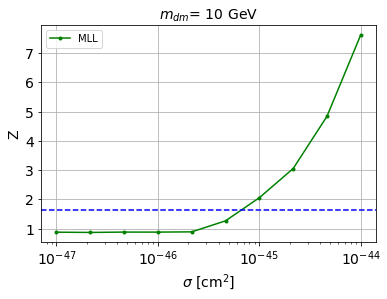


cross_MLL_164:  6.857802224594174e-46
cross_MLL_164_up:  5.4130186135122796e-46
cross_MLL_164_down:  9.003312243126412e-46

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68602	validation_1-logloss:0.68656
[1]	validation_0-logloss:0.67902	validation_1-logloss:0.68012
[2]	validation_0-logloss:0.67217	validation_1-logloss:0.67371
[3]	validation_0-logloss:0.66541	validation_1-logloss:0.66732
[4]	validation_0-logloss:0.65881	validation_1-logloss:0.66112
[5]	validation_0-logloss:0.65232	validation_1-logloss:0.65494
[6]	validation_0-logloss:0.64589	validation_1-logloss:0.64911
[7]	validation_0-logloss:0.63963	validation_1-logloss:0.64338
[8]	validation_0-logloss:0.63341	validation_1-logloss:0.63755
[9]	validation_0-logloss:0.62738	validation_1-logloss:0.63196
[10]	validation_0-logloss:0.62138	validation_1-logloss:0.62642
[11]	validation_0-logloss:0.61552	validation_1-logloss:0.62101
[12]	validation_0-logloss:0.60975	validation_1-logloss:0.61566
[13]	validation_0-logloss:0.60404	validation_1-logloss:0.61032
[14]	validation_0-logloss:0.59847	validation_1-logloss:0.60516
[15]	validation_0-logloss:0.59294	validation_1-logloss:0.59998
[1

[130]	validation_0-logloss:0.26653	validation_1-logloss:0.30983
[131]	validation_0-logloss:0.26513	validation_1-logloss:0.30865
[132]	validation_0-logloss:0.26370	validation_1-logloss:0.30754
[133]	validation_0-logloss:0.26218	validation_1-logloss:0.30628
[134]	validation_0-logloss:0.26084	validation_1-logloss:0.30512
[135]	validation_0-logloss:0.25946	validation_1-logloss:0.30406
[136]	validation_0-logloss:0.25810	validation_1-logloss:0.30301
[137]	validation_0-logloss:0.25673	validation_1-logloss:0.30199
[138]	validation_0-logloss:0.25527	validation_1-logloss:0.30085
[139]	validation_0-logloss:0.25400	validation_1-logloss:0.29977
[140]	validation_0-logloss:0.25274	validation_1-logloss:0.29874
[141]	validation_0-logloss:0.25144	validation_1-logloss:0.29760
[142]	validation_0-logloss:0.25016	validation_1-logloss:0.29648
[143]	validation_0-logloss:0.24887	validation_1-logloss:0.29541
[144]	validation_0-logloss:0.24752	validation_1-logloss:0.29426
[145]	validation_0-logloss:0.24625	valid

[259]	validation_0-logloss:0.14856	validation_1-logloss:0.22155
[260]	validation_0-logloss:0.14802	validation_1-logloss:0.22114
[261]	validation_0-logloss:0.14742	validation_1-logloss:0.22075
[262]	validation_0-logloss:0.14680	validation_1-logloss:0.22038
[263]	validation_0-logloss:0.14631	validation_1-logloss:0.22006
[264]	validation_0-logloss:0.14582	validation_1-logloss:0.21967
[265]	validation_0-logloss:0.14521	validation_1-logloss:0.21928
[266]	validation_0-logloss:0.14464	validation_1-logloss:0.21878
[267]	validation_0-logloss:0.14404	validation_1-logloss:0.21841
[268]	validation_0-logloss:0.14359	validation_1-logloss:0.21810
[269]	validation_0-logloss:0.14300	validation_1-logloss:0.21770
[270]	validation_0-logloss:0.14256	validation_1-logloss:0.21741
[271]	validation_0-logloss:0.14199	validation_1-logloss:0.21714
[272]	validation_0-logloss:0.14141	validation_1-logloss:0.21683
[273]	validation_0-logloss:0.14082	validation_1-logloss:0.21644
[274]	validation_0-logloss:0.14025	valid

[388]	validation_0-logloss:0.09459	validation_1-logloss:0.18918
[389]	validation_0-logloss:0.09427	validation_1-logloss:0.18903
[390]	validation_0-logloss:0.09395	validation_1-logloss:0.18889
[391]	validation_0-logloss:0.09367	validation_1-logloss:0.18877
[392]	validation_0-logloss:0.09335	validation_1-logloss:0.18862
[393]	validation_0-logloss:0.09309	validation_1-logloss:0.18845
[394]	validation_0-logloss:0.09276	validation_1-logloss:0.18837
[395]	validation_0-logloss:0.09248	validation_1-logloss:0.18828
[396]	validation_0-logloss:0.09221	validation_1-logloss:0.18816
[397]	validation_0-logloss:0.09190	validation_1-logloss:0.18797
[398]	validation_0-logloss:0.09161	validation_1-logloss:0.18782
[399]	validation_0-logloss:0.09136	validation_1-logloss:0.18770
[400]	validation_0-logloss:0.09104	validation_1-logloss:0.18753
[401]	validation_0-logloss:0.09077	validation_1-logloss:0.18740
[402]	validation_0-logloss:0.09047	validation_1-logloss:0.18726
[403]	validation_0-logloss:0.09015	valid

[517]	validation_0-logloss:0.06484	validation_1-logloss:0.17689
[518]	validation_0-logloss:0.06469	validation_1-logloss:0.17682
[519]	validation_0-logloss:0.06451	validation_1-logloss:0.17676
[520]	validation_0-logloss:0.06438	validation_1-logloss:0.17669
[521]	validation_0-logloss:0.06417	validation_1-logloss:0.17663
[522]	validation_0-logloss:0.06400	validation_1-logloss:0.17657
[523]	validation_0-logloss:0.06386	validation_1-logloss:0.17650
[524]	validation_0-logloss:0.06367	validation_1-logloss:0.17642
[525]	validation_0-logloss:0.06349	validation_1-logloss:0.17634
[526]	validation_0-logloss:0.06333	validation_1-logloss:0.17625
[527]	validation_0-logloss:0.06314	validation_1-logloss:0.17622
[528]	validation_0-logloss:0.06299	validation_1-logloss:0.17620
[529]	validation_0-logloss:0.06286	validation_1-logloss:0.17614
[530]	validation_0-logloss:0.06271	validation_1-logloss:0.17615
[531]	validation_0-logloss:0.06253	validation_1-logloss:0.17608
[532]	validation_0-logloss:0.06235	valid

[646]	validation_0-logloss:0.04713	validation_1-logloss:0.17197
[647]	validation_0-logloss:0.04702	validation_1-logloss:0.17196
[648]	validation_0-logloss:0.04690	validation_1-logloss:0.17185
[649]	validation_0-logloss:0.04675	validation_1-logloss:0.17178
[650]	validation_0-logloss:0.04665	validation_1-logloss:0.17183
[651]	validation_0-logloss:0.04657	validation_1-logloss:0.17177
[652]	validation_0-logloss:0.04649	validation_1-logloss:0.17172
[653]	validation_0-logloss:0.04636	validation_1-logloss:0.17175
[654]	validation_0-logloss:0.04624	validation_1-logloss:0.17175
[655]	validation_0-logloss:0.04613	validation_1-logloss:0.17177
[656]	validation_0-logloss:0.04603	validation_1-logloss:0.17177
[657]	validation_0-logloss:0.04593	validation_1-logloss:0.17173
[658]	validation_0-logloss:0.04585	validation_1-logloss:0.17172
[659]	validation_0-logloss:0.04573	validation_1-logloss:0.17180
[660]	validation_0-logloss:0.04565	validation_1-logloss:0.17182
[661]	validation_0-logloss:0.04554	valid

[775]	validation_0-logloss:0.03526	validation_1-logloss:0.17059
[776]	validation_0-logloss:0.03520	validation_1-logloss:0.17062
[777]	validation_0-logloss:0.03513	validation_1-logloss:0.17055
[778]	validation_0-logloss:0.03507	validation_1-logloss:0.17056
[779]	validation_0-logloss:0.03499	validation_1-logloss:0.17064
[780]	validation_0-logloss:0.03492	validation_1-logloss:0.17065
[781]	validation_0-logloss:0.03486	validation_1-logloss:0.17067
[782]	validation_0-logloss:0.03478	validation_1-logloss:0.17072
[783]	validation_0-logloss:0.03468	validation_1-logloss:0.17074
[784]	validation_0-logloss:0.03462	validation_1-logloss:0.17079
[785]	validation_0-logloss:0.03454	validation_1-logloss:0.17074
[786]	validation_0-logloss:0.03447	validation_1-logloss:0.17068
[787]	validation_0-logloss:0.03440	validation_1-logloss:0.17066
[788]	validation_0-logloss:0.03433	validation_1-logloss:0.17069
[789]	validation_0-logloss:0.03425	validation_1-logloss:0.17078
[790]	validation_0-logloss:0.03418	valid

[904]	validation_0-logloss:0.02713	validation_1-logloss:0.17008
[905]	validation_0-logloss:0.02708	validation_1-logloss:0.17007
[906]	validation_0-logloss:0.02702	validation_1-logloss:0.17008
[907]	validation_0-logloss:0.02696	validation_1-logloss:0.17008
[908]	validation_0-logloss:0.02690	validation_1-logloss:0.17012
[909]	validation_0-logloss:0.02685	validation_1-logloss:0.17007
[910]	validation_0-logloss:0.02680	validation_1-logloss:0.17005
[911]	validation_0-logloss:0.02675	validation_1-logloss:0.17007
[912]	validation_0-logloss:0.02669	validation_1-logloss:0.17004
[913]	validation_0-logloss:0.02662	validation_1-logloss:0.17000
[914]	validation_0-logloss:0.02657	validation_1-logloss:0.17006
[915]	validation_0-logloss:0.02652	validation_1-logloss:0.17008
[916]	validation_0-logloss:0.02646	validation_1-logloss:0.17004
[917]	validation_0-logloss:0.02640	validation_1-logloss:0.17002
[918]	validation_0-logloss:0.02635	validation_1-logloss:0.17001
[919]	validation_0-logloss:0.02629	valid

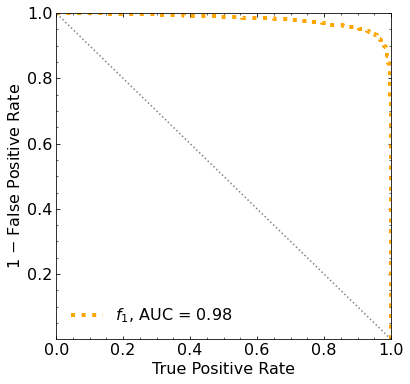

Classification score:


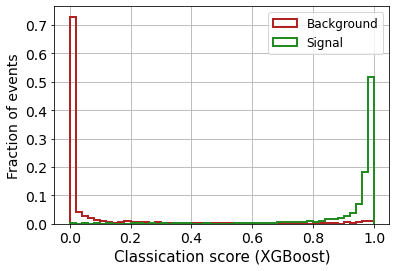


 ROC-AUC =  0.980608393255895


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  364.38905837  308.81697865  248.67403821
  180.80554021  112.42426843   38.99303735  -36.16381229 -102.43868437]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 307.108506

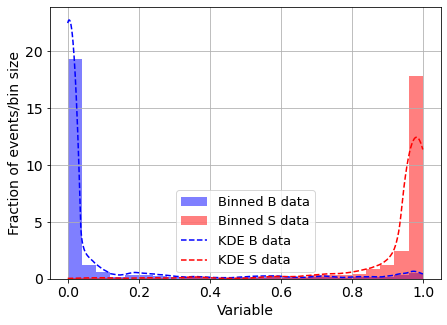

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



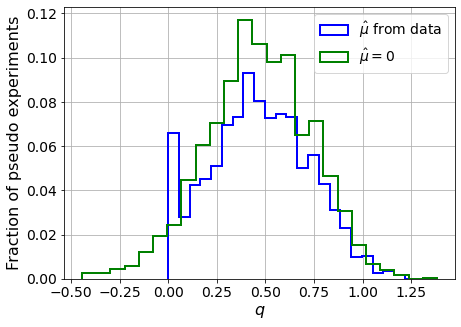

muhat mean:  -8.719575707788984
Z_bins:  0.6813444969732982
std Z_bins:  0.18715431128936758
Z_bins mu=0:  0.6813444969732982
std Z_bins mu=0:  0.19724946686268446

--------

B_expected:  643
S_expected:  2



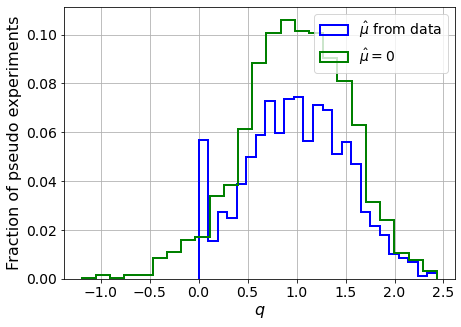

muhat mean:  -4.4969725036443124
Z_bins:  1.0020232033851146
std Z_bins:  0.25449245376184587
Z_bins mu=0:  1.0020232033851146
std Z_bins mu=0:  0.2686141493519132

--------

B_expected:  643
S_expected:  4



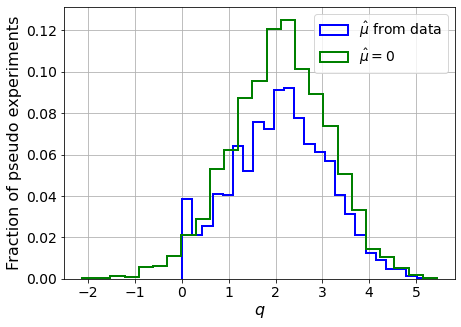

muhat mean:  -2.229971055241172
Z_bins:  1.4579591403373187
std Z_bins:  0.34655929579767103
Z_bins mu=0:  1.4579591403373187
std Z_bins mu=0:  0.35874337153746266

--------

B_expected:  643
S_expected:  9



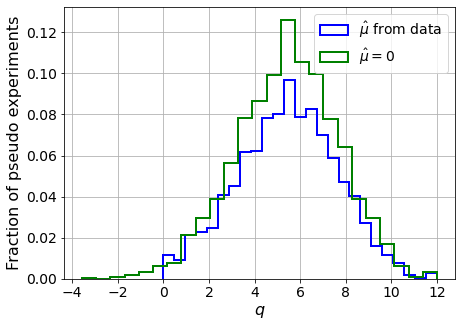

muhat mean:  -0.9896065188454688
Z_bins:  2.341848017405181
std Z_bins:  0.4658912681876354
Z_bins mu=0:  2.341848017405181
std Z_bins mu=0:  0.4748670866677933

--------

B_expected:  643
S_expected:  18



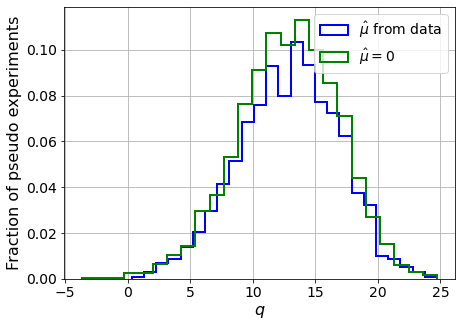

muhat mean:  -0.49082816829867876
Z_bins:  3.615121755349139
std Z_bins:  0.551841358378284
Z_bins mu=0:  3.615121755349139
std Z_bins mu=0:  0.5588723501724243

--------

B_expected:  643
S_expected:  40



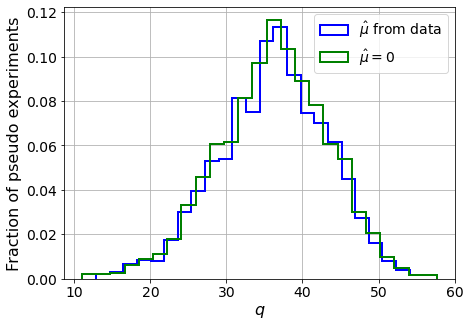

muhat mean:  -0.22487584907949695
Z_bins:  6.029956732088997
std Z_bins:  0.5966063639218842
Z_bins mu=0:  6.029956732088997
std Z_bins mu=0:  0.6001384022983448

--------

B_expected:  643
S_expected:  85



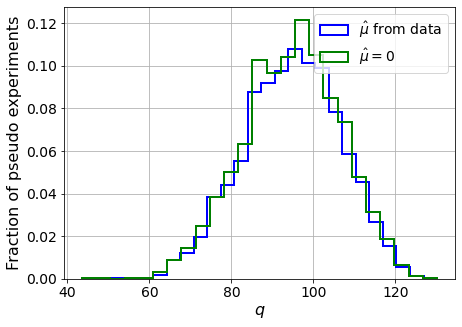

muhat mean:  -0.10452788057415978
Z_bins:  9.759956047050855
std Z_bins:  0.607824865812218
Z_bins mu=0:  9.759956047050855
std Z_bins mu=0:  0.6101237221464124

--------

B_expected:  643
S_expected:  184



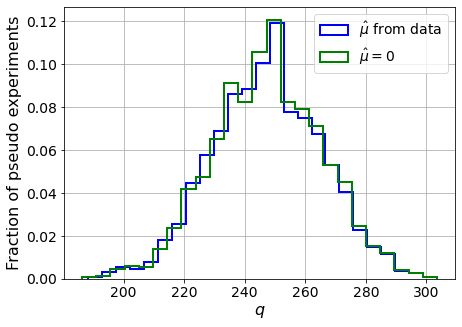

muhat mean:  -0.0491141287014363
Z_bins:  15.740642399805356
std Z_bins:  0.5731514832348
Z_bins mu=0:  15.740642399805356
std Z_bins mu=0:  0.5741480686408427

--------

B_expected:  643
S_expected:  396



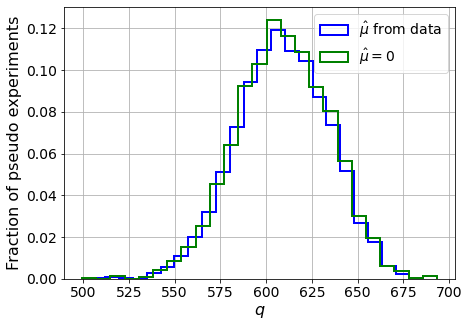

muhat mean:  -0.02231066150133435
Z_bins:  24.674566112102116
std Z_bins:  0.5090994029740011
Z_bins mu=0:  24.674566112102116
std Z_bins mu=0:  0.5100320379982166

--------

B_expected:  643
S_expected:  854



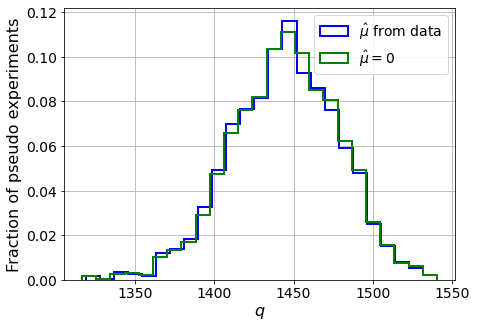

muhat mean:  -0.010469776243595508
Z_bins:  38.01968220606399
std Z_bins:  0.4450490268812958
Z_bins mu=0:  38.01968220606399
std Z_bins mu=0:  0.4456708173731055

--------


 FINAL RESULT:

[[0.6813444969732982, 0.18715431128936758, -8.719575707788984, 0.6813444969732982, 0.19724946686268446], [1.0020232033851146, 0.25449245376184587, -4.4969725036443124, 1.0020232033851146, 0.2686141493519132], [1.4579591403373187, 0.34655929579767103, -2.229971055241172, 1.4579591403373187, 0.35874337153746266], [2.341848017405181, 0.4658912681876354, -0.9896065188454688, 2.341848017405181, 0.4748670866677933], [3.615121755349139, 0.551841358378284, -0.49082816829867876, 3.615121755349139, 0.5588723501724243], [6.029956732088997, 0.5966063639218842, -0.22487584907949695, 6.029956732088997, 0.6001384022983448], [9.759956047050855, 0.607824865812218, -0.10452788057415978, 9.759956047050855, 0.6101237221464124], [15.740642399805356, 0.5731514832348, -0.0491141287014363, 15.740642399805356, 0.5741480686

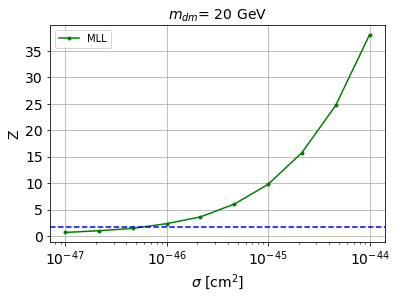


cross_MLL_164:  5.625650779766897e-47
cross_MLL_164_up:  3.881282032324537e-47
cross_MLL_164_down:  8.154678986735306e-47

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68718	validation_1-logloss:0.68788
[1]	validation_0-logloss:0.68134	validation_1-logloss:0.68274
[2]	validation_0-logloss:0.67559	validation_1-logloss:0.67772
[3]	validation_0-logloss:0.66997	validation_1-logloss:0.67282
[4]	validation_0-logloss:0.66446	validation_1-logloss:0.66784
[5]	validation_0-logloss:0.65899	validation_1-logloss:0.66297
[6]	validation_0-logloss:0.65361	validation_1-logloss:0.65811
[7]	validation_0-logloss:0.64838	validation_1-logloss:0.65353
[8]	validation_0-logloss:0.64319	validation_1-logloss:0.64882
[9]	validation_0-logloss:0.63811	validation_1-logloss:0.64435
[10]	validation_0-logloss:0.63311	validation_1-logloss:0.63993
[11]	validation_0-logloss:0.62818	validation_1-logloss:0.63546
[12]	validation_0-logloss:0.62333	validation_1-logloss:0.63114
[13]	validation_0-logloss:0.61860	validation_1-logloss:0.62702
[14]	validation_0-logloss:0.61386	validation_1-logloss:0.62274
[15]	validation_0-logloss:0.60927	validation_1-logloss:0.61874
[1

[130]	validation_0-logloss:0.33020	validation_1-logloss:0.38815
[131]	validation_0-logloss:0.32895	validation_1-logloss:0.38719
[132]	validation_0-logloss:0.32767	validation_1-logloss:0.38637
[133]	validation_0-logloss:0.32646	validation_1-logloss:0.38536
[134]	validation_0-logloss:0.32518	validation_1-logloss:0.38427
[135]	validation_0-logloss:0.32391	validation_1-logloss:0.38336
[136]	validation_0-logloss:0.32273	validation_1-logloss:0.38236
[137]	validation_0-logloss:0.32148	validation_1-logloss:0.38131
[138]	validation_0-logloss:0.32025	validation_1-logloss:0.38044
[139]	validation_0-logloss:0.31901	validation_1-logloss:0.37943
[140]	validation_0-logloss:0.31782	validation_1-logloss:0.37861
[141]	validation_0-logloss:0.31666	validation_1-logloss:0.37772
[142]	validation_0-logloss:0.31551	validation_1-logloss:0.37683
[143]	validation_0-logloss:0.31433	validation_1-logloss:0.37588
[144]	validation_0-logloss:0.31320	validation_1-logloss:0.37501
[145]	validation_0-logloss:0.31208	valid

[259]	validation_0-logloss:0.22056	validation_1-logloss:0.31998
[260]	validation_0-logloss:0.21992	validation_1-logloss:0.31965
[261]	validation_0-logloss:0.21926	validation_1-logloss:0.31935
[262]	validation_0-logloss:0.21862	validation_1-logloss:0.31913
[263]	validation_0-logloss:0.21802	validation_1-logloss:0.31889
[264]	validation_0-logloss:0.21738	validation_1-logloss:0.31854
[265]	validation_0-logloss:0.21689	validation_1-logloss:0.31832
[266]	validation_0-logloss:0.21630	validation_1-logloss:0.31822
[267]	validation_0-logloss:0.21569	validation_1-logloss:0.31800
[268]	validation_0-logloss:0.21507	validation_1-logloss:0.31774
[269]	validation_0-logloss:0.21448	validation_1-logloss:0.31751
[270]	validation_0-logloss:0.21389	validation_1-logloss:0.31736
[271]	validation_0-logloss:0.21330	validation_1-logloss:0.31716
[272]	validation_0-logloss:0.21274	validation_1-logloss:0.31699
[273]	validation_0-logloss:0.21213	validation_1-logloss:0.31668
[274]	validation_0-logloss:0.21152	valid

[388]	validation_0-logloss:0.16065	validation_1-logloss:0.29791
[389]	validation_0-logloss:0.16027	validation_1-logloss:0.29773
[390]	validation_0-logloss:0.15990	validation_1-logloss:0.29755
[391]	validation_0-logloss:0.15951	validation_1-logloss:0.29736
[392]	validation_0-logloss:0.15917	validation_1-logloss:0.29727
[393]	validation_0-logloss:0.15882	validation_1-logloss:0.29722
[394]	validation_0-logloss:0.15852	validation_1-logloss:0.29710
[395]	validation_0-logloss:0.15816	validation_1-logloss:0.29696
[396]	validation_0-logloss:0.15781	validation_1-logloss:0.29686
[397]	validation_0-logloss:0.15748	validation_1-logloss:0.29680
[398]	validation_0-logloss:0.15715	validation_1-logloss:0.29672
[399]	validation_0-logloss:0.15677	validation_1-logloss:0.29659
[400]	validation_0-logloss:0.15641	validation_1-logloss:0.29650
[401]	validation_0-logloss:0.15607	validation_1-logloss:0.29638
[402]	validation_0-logloss:0.15574	validation_1-logloss:0.29628
[403]	validation_0-logloss:0.15544	valid

[517]	validation_0-logloss:0.12402	validation_1-logloss:0.28764
[518]	validation_0-logloss:0.12381	validation_1-logloss:0.28760
[519]	validation_0-logloss:0.12361	validation_1-logloss:0.28758
[520]	validation_0-logloss:0.12339	validation_1-logloss:0.28754
[521]	validation_0-logloss:0.12318	validation_1-logloss:0.28743
[522]	validation_0-logloss:0.12296	validation_1-logloss:0.28735
[523]	validation_0-logloss:0.12275	validation_1-logloss:0.28722
[524]	validation_0-logloss:0.12249	validation_1-logloss:0.28713
[525]	validation_0-logloss:0.12223	validation_1-logloss:0.28721
[526]	validation_0-logloss:0.12205	validation_1-logloss:0.28717
[527]	validation_0-logloss:0.12182	validation_1-logloss:0.28712
[528]	validation_0-logloss:0.12163	validation_1-logloss:0.28710
[529]	validation_0-logloss:0.12141	validation_1-logloss:0.28706
[530]	validation_0-logloss:0.12120	validation_1-logloss:0.28701
[531]	validation_0-logloss:0.12099	validation_1-logloss:0.28697
[532]	validation_0-logloss:0.12075	valid

[646]	validation_0-logloss:0.09972	validation_1-logloss:0.28369
[647]	validation_0-logloss:0.09953	validation_1-logloss:0.28365
[648]	validation_0-logloss:0.09939	validation_1-logloss:0.28359
[649]	validation_0-logloss:0.09919	validation_1-logloss:0.28362
[650]	validation_0-logloss:0.09908	validation_1-logloss:0.28357
[651]	validation_0-logloss:0.09894	validation_1-logloss:0.28362
[652]	validation_0-logloss:0.09881	validation_1-logloss:0.28365
[653]	validation_0-logloss:0.09862	validation_1-logloss:0.28371
[654]	validation_0-logloss:0.09846	validation_1-logloss:0.28364
[655]	validation_0-logloss:0.09825	validation_1-logloss:0.28362
[656]	validation_0-logloss:0.09809	validation_1-logloss:0.28364
[657]	validation_0-logloss:0.09796	validation_1-logloss:0.28363
[658]	validation_0-logloss:0.09782	validation_1-logloss:0.28360
[659]	validation_0-logloss:0.09766	validation_1-logloss:0.28358
[660]	validation_0-logloss:0.09745	validation_1-logloss:0.28354
[661]	validation_0-logloss:0.09729	valid

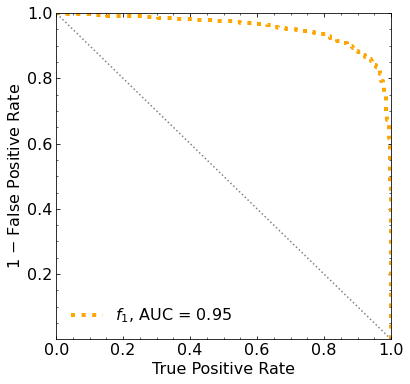

Classification score:


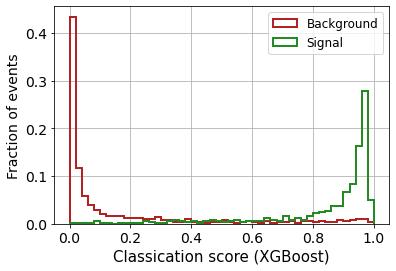


 ROC-AUC =  0.954277036854936


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  254.81775863  239.97239607  218.36411438  188.78357502  153.07748077
  110.28828172   63.22365054   11.20688746  -49.20348271 -106.05709415]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 216.04468597 198.557762

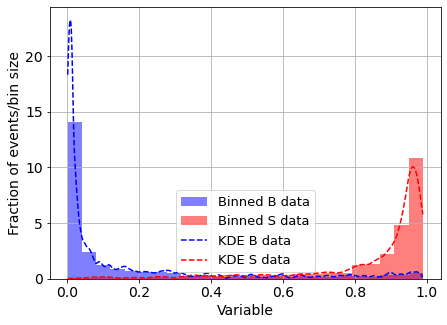

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



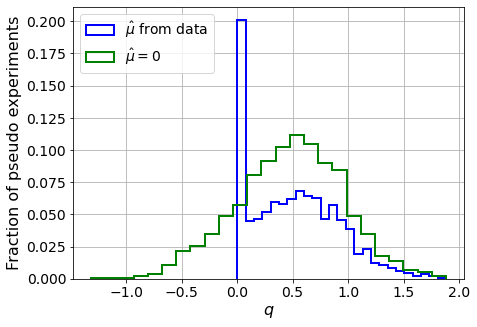

muhat mean:  -2.929734750379703
Z_bins:  0.7075090261482666
std Z_bins:  0.2848241353681804
Z_bins mu=0:  0.7075090261482666
std Z_bins mu=0:  0.33874330552097337

--------

B_expected:  643
S_expected:  4



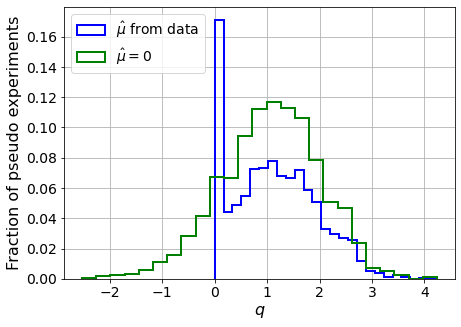

muhat mean:  -1.4754516745791597
Z_bins:  1.043415077901444
std Z_bins:  0.3878104122128514
Z_bins mu=0:  1.043415077901444
std Z_bins mu=0:  0.44968654993052437

--------

B_expected:  643
S_expected:  8



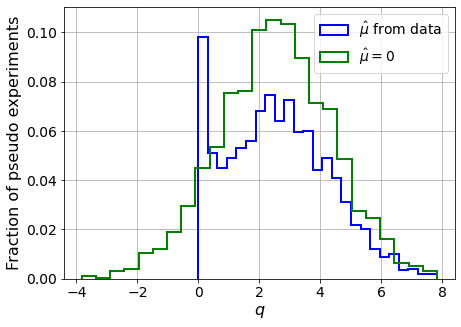

muhat mean:  -0.7344183647431001
Z_bins:  1.5940094615654936
std Z_bins:  0.5245533092606199
Z_bins mu=0:  1.5940094615654936
std Z_bins mu=0:  0.5782006510866429

--------

B_expected:  643
S_expected:  18



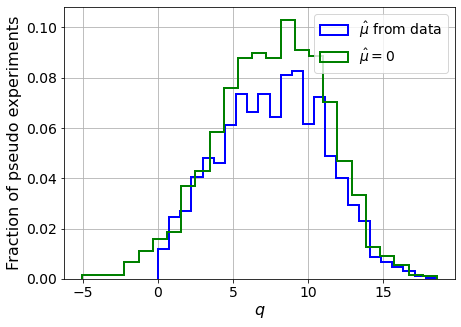

muhat mean:  -0.31679422950274394
Z_bins:  2.796099431315726
std Z_bins:  0.62168891417302
Z_bins mu=0:  2.796099431315726
std Z_bins mu=0:  0.6573533565932171

--------

B_expected:  643
S_expected:  39



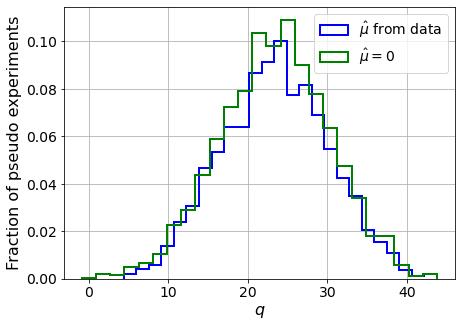

muhat mean:  -0.1585378379195983
Z_bins:  4.850563353984187
std Z_bins:  0.6937312587184714
Z_bins mu=0:  4.850563353984187
std Z_bins mu=0:  0.7121323789106787

--------

B_expected:  643
S_expected:  83



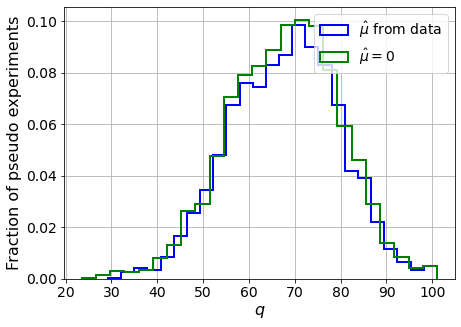

muhat mean:  -0.07308388397637626
Z_bins:  8.272889865395468
std Z_bins:  0.7113190053504796
Z_bins mu=0:  8.272889865395468
std Z_bins mu=0:  0.7239898648211667

--------

B_expected:  643
S_expected:  179



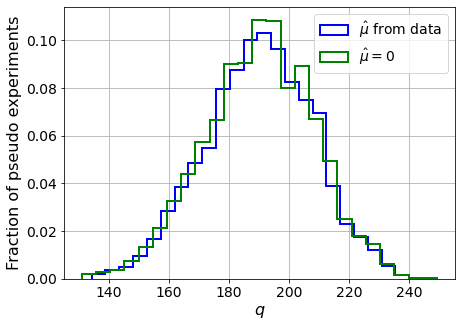

muhat mean:  -0.03174705009652335
Z_bins:  13.802033599949903
std Z_bins:  0.6501694176878191
Z_bins mu=0:  13.802033599949903
std Z_bins mu=0:  0.6567459442427329

--------

B_expected:  643
S_expected:  385



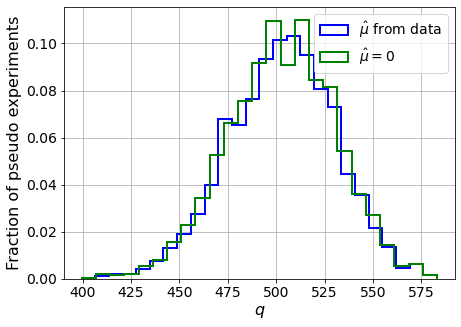

muhat mean:  -0.015302757981229802
Z_bins:  22.434906067641936
std Z_bins:  0.6155914336381726
Z_bins mu=0:  22.434906067641936
std Z_bins mu=0:  0.6201681238561872

--------

B_expected:  643
S_expected:  830



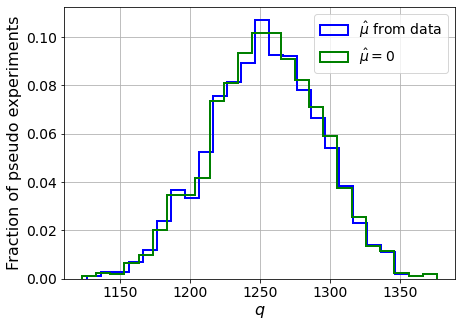

muhat mean:  -0.006950980340751638
Z_bins:  35.42032805789699
std Z_bins:  0.5590026356366096
Z_bins mu=0:  35.42032805789699
std Z_bins mu=0:  0.561710861026287

--------

B_expected:  643
S_expected:  1787



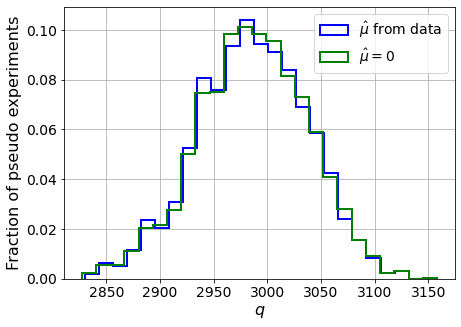

muhat mean:  -0.0033397525325702003
Z_bins:  54.65208577690971
std Z_bins:  0.46896751379238943
Z_bins mu=0:  54.65208577690971
std Z_bins mu=0:  0.47077259853160963

--------


 FINAL RESULT:

[[0.7075090261482666, 0.2848241353681804, -2.929734750379703, 0.7075090261482666, 0.33874330552097337], [1.043415077901444, 0.3878104122128514, -1.4754516745791597, 1.043415077901444, 0.44968654993052437], [1.5940094615654936, 0.5245533092606199, -0.7344183647431001, 1.5940094615654936, 0.5782006510866429], [2.796099431315726, 0.62168891417302, -0.31679422950274394, 2.796099431315726, 0.6573533565932171], [4.850563353984187, 0.6937312587184714, -0.1585378379195983, 4.850563353984187, 0.7121323789106787], [8.272889865395468, 0.7113190053504796, -0.07308388397637626, 8.272889865395468, 0.7239898648211667], [13.802033599949903, 0.6501694176878191, -0.03174705009652335, 13.802033599949903, 0.6567459442427329], [22.434906067641936, 0.6155914336381726, -0.015302757981229802, 22.434906067641936, 0.6201

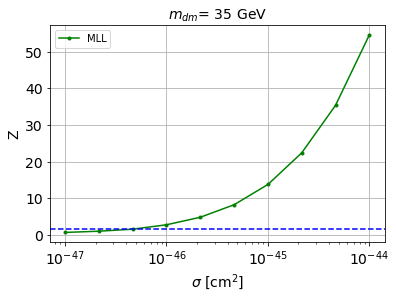


cross_MLL_164:  4.837253285980454e-47
cross_MLL_164_up:  2.8551353385573233e-47
cross_MLL_164_down:  7.369292077184437e-47

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68779	validation_1-logloss:0.68835
[1]	validation_0-logloss:0.68254	validation_1-logloss:0.68371
[2]	validation_0-logloss:0.67739	validation_1-logloss:0.67906
[3]	validation_0-logloss:0.67234	validation_1-logloss:0.67452
[4]	validation_0-logloss:0.66739	validation_1-logloss:0.66994
[5]	validation_0-logloss:0.66251	validation_1-logloss:0.66549
[6]	validation_0-logloss:0.65770	validation_1-logloss:0.66113
[7]	validation_0-logloss:0.65299	validation_1-logloss:0.65684
[8]	validation_0-logloss:0.64830	validation_1-logloss:0.65274
[9]	validation_0-logloss:0.64372	validation_1-logloss:0.64856
[10]	validation_0-logloss:0.63924	validation_1-logloss:0.64444
[11]	validation_0-logloss:0.63484	validation_1-logloss:0.64048
[12]	validation_0-logloss:0.63042	validation_1-logloss:0.63669
[13]	validation_0-logloss:0.62614	validation_1-logloss:0.63290
[14]	validation_0-logloss:0.62184	validation_1-logloss:0.62919
[15]	validation_0-logloss:0.61771	validation_1-logloss:0.62547
[1

[130]	validation_0-logloss:0.36484	validation_1-logloss:0.42253
[131]	validation_0-logloss:0.36363	validation_1-logloss:0.42172
[132]	validation_0-logloss:0.36246	validation_1-logloss:0.42099
[133]	validation_0-logloss:0.36131	validation_1-logloss:0.42014
[134]	validation_0-logloss:0.36014	validation_1-logloss:0.41939
[135]	validation_0-logloss:0.35899	validation_1-logloss:0.41869
[136]	validation_0-logloss:0.35793	validation_1-logloss:0.41803
[137]	validation_0-logloss:0.35681	validation_1-logloss:0.41720
[138]	validation_0-logloss:0.35577	validation_1-logloss:0.41654
[139]	validation_0-logloss:0.35469	validation_1-logloss:0.41590
[140]	validation_0-logloss:0.35350	validation_1-logloss:0.41508
[141]	validation_0-logloss:0.35241	validation_1-logloss:0.41441
[142]	validation_0-logloss:0.35136	validation_1-logloss:0.41382
[143]	validation_0-logloss:0.35020	validation_1-logloss:0.41302
[144]	validation_0-logloss:0.34916	validation_1-logloss:0.41221
[145]	validation_0-logloss:0.34803	valid

[259]	validation_0-logloss:0.25929	validation_1-logloss:0.36047
[260]	validation_0-logloss:0.25869	validation_1-logloss:0.36022
[261]	validation_0-logloss:0.25810	validation_1-logloss:0.35996
[262]	validation_0-logloss:0.25751	validation_1-logloss:0.35971
[263]	validation_0-logloss:0.25684	validation_1-logloss:0.35946
[264]	validation_0-logloss:0.25625	validation_1-logloss:0.35924
[265]	validation_0-logloss:0.25560	validation_1-logloss:0.35888
[266]	validation_0-logloss:0.25498	validation_1-logloss:0.35867
[267]	validation_0-logloss:0.25436	validation_1-logloss:0.35841
[268]	validation_0-logloss:0.25379	validation_1-logloss:0.35819
[269]	validation_0-logloss:0.25325	validation_1-logloss:0.35800
[270]	validation_0-logloss:0.25273	validation_1-logloss:0.35773
[271]	validation_0-logloss:0.25217	validation_1-logloss:0.35747
[272]	validation_0-logloss:0.25157	validation_1-logloss:0.35725
[273]	validation_0-logloss:0.25098	validation_1-logloss:0.35702
[274]	validation_0-logloss:0.25046	valid

[388]	validation_0-logloss:0.19704	validation_1-logloss:0.33837
[389]	validation_0-logloss:0.19666	validation_1-logloss:0.33829
[390]	validation_0-logloss:0.19627	validation_1-logloss:0.33817
[391]	validation_0-logloss:0.19584	validation_1-logloss:0.33799
[392]	validation_0-logloss:0.19550	validation_1-logloss:0.33791
[393]	validation_0-logloss:0.19512	validation_1-logloss:0.33783
[394]	validation_0-logloss:0.19475	validation_1-logloss:0.33775
[395]	validation_0-logloss:0.19433	validation_1-logloss:0.33764
[396]	validation_0-logloss:0.19395	validation_1-logloss:0.33753
[397]	validation_0-logloss:0.19360	validation_1-logloss:0.33737
[398]	validation_0-logloss:0.19321	validation_1-logloss:0.33718
[399]	validation_0-logloss:0.19284	validation_1-logloss:0.33717
[400]	validation_0-logloss:0.19251	validation_1-logloss:0.33706
[401]	validation_0-logloss:0.19211	validation_1-logloss:0.33705
[402]	validation_0-logloss:0.19173	validation_1-logloss:0.33688
[403]	validation_0-logloss:0.19136	valid

[517]	validation_0-logloss:0.15841	validation_1-logloss:0.32707
[518]	validation_0-logloss:0.15817	validation_1-logloss:0.32702
[519]	validation_0-logloss:0.15790	validation_1-logloss:0.32703
[520]	validation_0-logloss:0.15766	validation_1-logloss:0.32699
[521]	validation_0-logloss:0.15739	validation_1-logloss:0.32687
[522]	validation_0-logloss:0.15722	validation_1-logloss:0.32677
[523]	validation_0-logloss:0.15696	validation_1-logloss:0.32669
[524]	validation_0-logloss:0.15676	validation_1-logloss:0.32659
[525]	validation_0-logloss:0.15653	validation_1-logloss:0.32659
[526]	validation_0-logloss:0.15622	validation_1-logloss:0.32652
[527]	validation_0-logloss:0.15595	validation_1-logloss:0.32644
[528]	validation_0-logloss:0.15568	validation_1-logloss:0.32643
[529]	validation_0-logloss:0.15550	validation_1-logloss:0.32637
[530]	validation_0-logloss:0.15526	validation_1-logloss:0.32632
[531]	validation_0-logloss:0.15508	validation_1-logloss:0.32625
[532]	validation_0-logloss:0.15478	valid

[646]	validation_0-logloss:0.13219	validation_1-logloss:0.32349
[647]	validation_0-logloss:0.13205	validation_1-logloss:0.32343
[648]	validation_0-logloss:0.13184	validation_1-logloss:0.32346
[649]	validation_0-logloss:0.13167	validation_1-logloss:0.32343
[650]	validation_0-logloss:0.13153	validation_1-logloss:0.32336
[651]	validation_0-logloss:0.13134	validation_1-logloss:0.32344
[652]	validation_0-logloss:0.13121	validation_1-logloss:0.32350
[653]	validation_0-logloss:0.13097	validation_1-logloss:0.32344
[654]	validation_0-logloss:0.13077	validation_1-logloss:0.32338
[655]	validation_0-logloss:0.13059	validation_1-logloss:0.32337
[656]	validation_0-logloss:0.13041	validation_1-logloss:0.32340
[657]	validation_0-logloss:0.13023	validation_1-logloss:0.32339
[658]	validation_0-logloss:0.13008	validation_1-logloss:0.32333
[659]	validation_0-logloss:0.12991	validation_1-logloss:0.32332
[660]	validation_0-logloss:0.12976	validation_1-logloss:0.32328
[661]	validation_0-logloss:0.12961	valid

[775]	validation_0-logloss:0.11156	validation_1-logloss:0.32227
[776]	validation_0-logloss:0.11146	validation_1-logloss:0.32228
[777]	validation_0-logloss:0.11138	validation_1-logloss:0.32228
[778]	validation_0-logloss:0.11118	validation_1-logloss:0.32231
[779]	validation_0-logloss:0.11105	validation_1-logloss:0.32241
[780]	validation_0-logloss:0.11089	validation_1-logloss:0.32249
[781]	validation_0-logloss:0.11071	validation_1-logloss:0.32249
[782]	validation_0-logloss:0.11059	validation_1-logloss:0.32250
[783]	validation_0-logloss:0.11047	validation_1-logloss:0.32248
[784]	validation_0-logloss:0.11032	validation_1-logloss:0.32253
[785]	validation_0-logloss:0.11014	validation_1-logloss:0.32247
[786]	validation_0-logloss:0.11004	validation_1-logloss:0.32248
[787]	validation_0-logloss:0.10993	validation_1-logloss:0.32250
[788]	validation_0-logloss:0.10982	validation_1-logloss:0.32258
[789]	validation_0-logloss:0.10969	validation_1-logloss:0.32259
[790]	validation_0-logloss:0.10958	valid

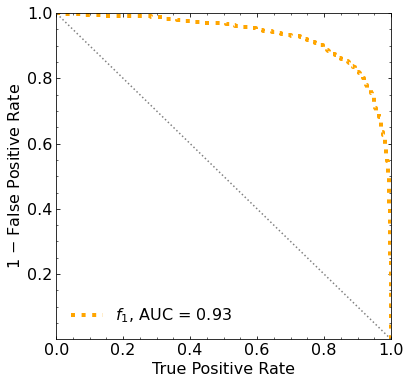

Classification score:


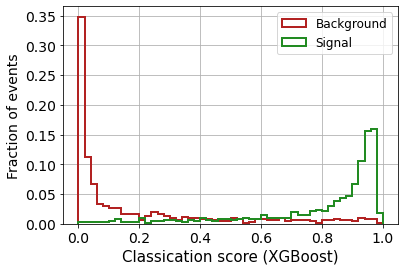


 ROC-AUC =  0.9304975109089793


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  182.78507266  164.96637374  142.73209237  112.52438569
   78.49770353   38.31993439   -4.44455918  -53.92293301 -107.20811929]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 143.87917842 143.48620257 139.15964493 128.860082

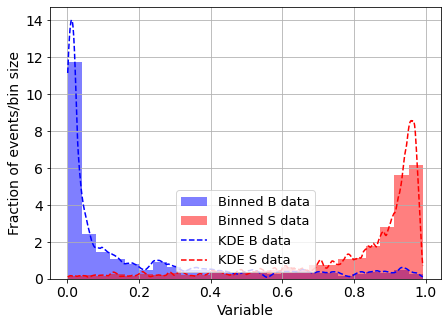

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



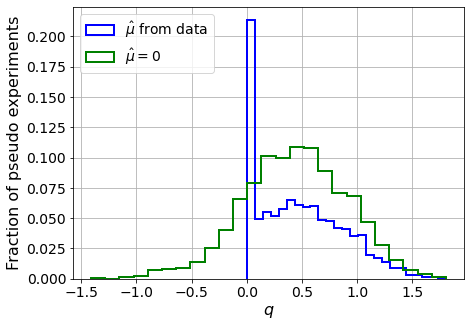

muhat mean:  -3.217658115807586
Z_bins:  0.6672969060195898
std Z_bins:  0.2945567195867161
Z_bins mu=0:  0.6672969060195898
std Z_bins mu=0:  0.35235640193919704

--------

B_expected:  643
S_expected:  4



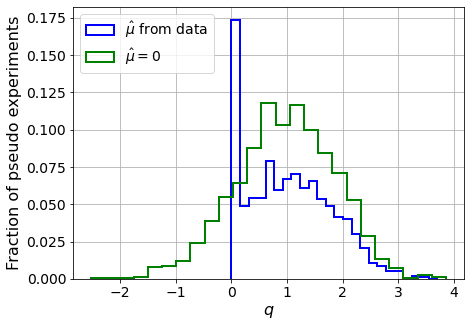

muhat mean:  -1.5677239797729423
Z_bins:  1.0009793572089918
std Z_bins:  0.38261206596048564
Z_bins mu=0:  1.0009793572089918
std Z_bins mu=0:  0.4433505033423913

--------

B_expected:  643
S_expected:  9



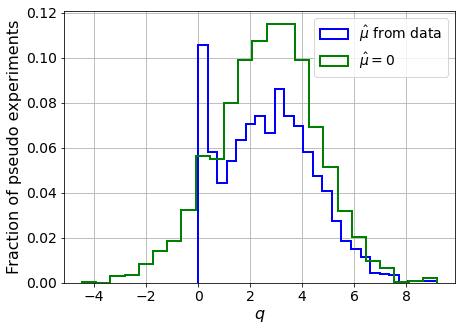

muhat mean:  -0.6788711702108136
Z_bins:  1.6611257354967752
std Z_bins:  0.5226913884792332
Z_bins mu=0:  1.6611257354967752
std Z_bins mu=0:  0.5794470537863794

--------

B_expected:  643
S_expected:  19



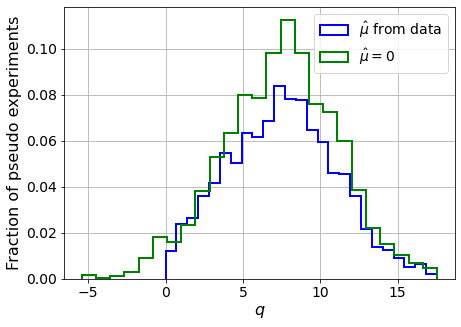

muhat mean:  -0.3237321328018036
Z_bins:  2.7478271588984065
std Z_bins:  0.632818752379034
Z_bins mu=0:  2.7478271588984065
std Z_bins mu=0:  0.6693691961986639

--------

B_expected:  643
S_expected:  41



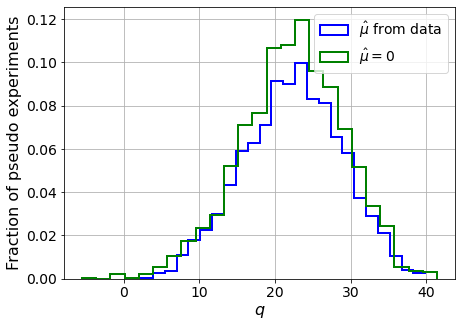

muhat mean:  -0.1524916549716633
Z_bins:  4.7495897392493704
std Z_bins:  0.6872546952091562
Z_bins mu=0:  4.7495897392493704
std Z_bins mu=0:  0.7115330439614392

--------

B_expected:  643
S_expected:  89



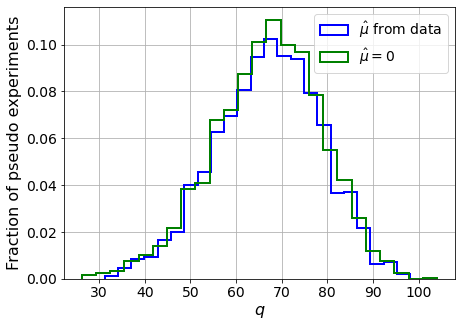

muhat mean:  -0.07026858523633084
Z_bins:  8.223630815305343
std Z_bins:  0.7020298425693406
Z_bins mu=0:  8.223630815305343
std Z_bins mu=0:  0.7164365777395867

--------

B_expected:  643
S_expected:  192



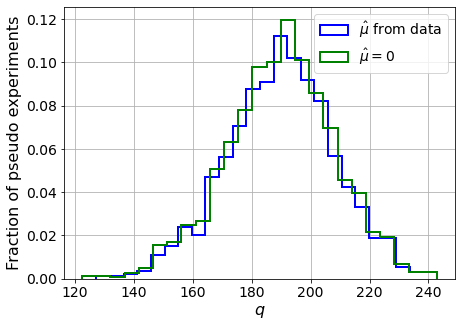

muhat mean:  -0.0324462587593426
Z_bins:  13.800640021311347
std Z_bins:  0.659675942615562
Z_bins mu=0:  13.800640021311347
std Z_bins mu=0:  0.6676705323037841

--------

B_expected:  643
S_expected:  413



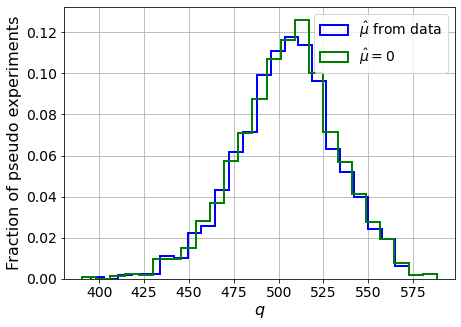

muhat mean:  -0.015053264236417485
Z_bins:  22.49044066761686
std Z_bins:  0.6255716547163674
Z_bins mu=0:  22.49044066761686
std Z_bins mu=0:  0.6308913034533398

--------

B_expected:  643
S_expected:  889



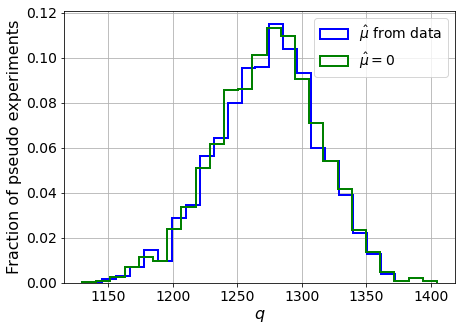

muhat mean:  -0.0067935938726188345
Z_bins:  35.71681323981001
std Z_bins:  0.565017817151655
Z_bins mu=0:  35.71660996655539
std Z_bins mu=0:  0.5682729586300193

--------

B_expected:  643
S_expected:  1915



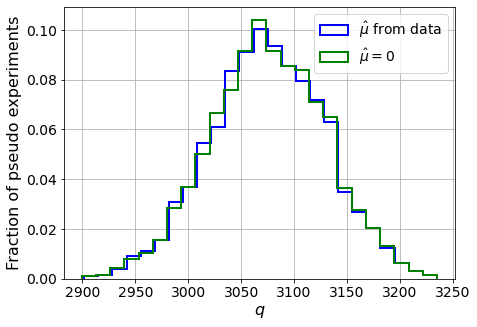

muhat mean:  -0.003289052282354549
Z_bins:  55.44975189910966
std Z_bins:  0.4878497201252584
Z_bins mu=0:  55.44975189910966
std Z_bins mu=0:  0.489464874063666

--------


 FINAL RESULT:

[[0.6672969060195898, 0.2945567195867161, -3.217658115807586, 0.6672969060195898, 0.35235640193919704], [1.0009793572089918, 0.38261206596048564, -1.5677239797729423, 1.0009793572089918, 0.4433505033423913], [1.6611257354967752, 0.5226913884792332, -0.6788711702108136, 1.6611257354967752, 0.5794470537863794], [2.7478271588984065, 0.632818752379034, -0.3237321328018036, 2.7478271588984065, 0.6693691961986639], [4.7495897392493704, 0.6872546952091562, -0.1524916549716633, 4.7495897392493704, 0.7115330439614392], [8.223630815305343, 0.7020298425693406, -0.07026858523633084, 8.223630815305343, 0.7164365777395867], [13.800640021311347, 0.659675942615562, -0.0324462587593426, 13.800640021311347, 0.6676705323037841], [22.49044066761686, 0.6255716547163674, -0.015053264236417485, 22.49044066761686, 0.630891

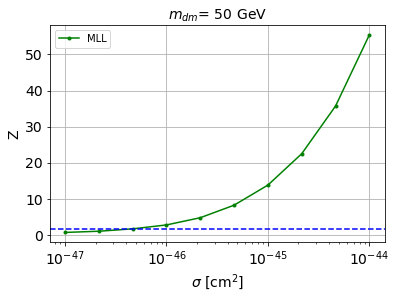


cross_MLL_164:  4.55197718471282e-47
cross_MLL_164_up:  2.8689552589822716e-47
cross_MLL_164_down:  7.379990084789769e-47

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68841	validation_1-logloss:0.68912
[1]	validation_0-logloss:0.68376	validation_1-logloss:0.68514
[2]	validation_0-logloss:0.67921	validation_1-logloss:0.68125
[3]	validation_0-logloss:0.67474	validation_1-logloss:0.67736
[4]	validation_0-logloss:0.67033	validation_1-logloss:0.67347
[5]	validation_0-logloss:0.66594	validation_1-logloss:0.66971
[6]	validation_0-logloss:0.66171	validation_1-logloss:0.66610
[7]	validation_0-logloss:0.65750	validation_1-logloss:0.66249
[8]	validation_0-logloss:0.65337	validation_1-logloss:0.65899
[9]	validation_0-logloss:0.64931	validation_1-logloss:0.65546
[10]	validation_0-logloss:0.64529	validation_1-logloss:0.65201
[11]	validation_0-logloss:0.64130	validation_1-logloss:0.64867
[12]	validation_0-logloss:0.63744	validation_1-logloss:0.64551
[13]	validation_0-logloss:0.63357	validation_1-logloss:0.64227
[14]	validation_0-logloss:0.62981	validation_1-logloss:0.63908
[15]	validation_0-logloss:0.62606	validation_1-logloss:0.63597
[1

[130]	validation_0-logloss:0.39387	validation_1-logloss:0.45320
[131]	validation_0-logloss:0.39270	validation_1-logloss:0.45238
[132]	validation_0-logloss:0.39165	validation_1-logloss:0.45160
[133]	validation_0-logloss:0.39058	validation_1-logloss:0.45099
[134]	validation_0-logloss:0.38948	validation_1-logloss:0.45013
[135]	validation_0-logloss:0.38845	validation_1-logloss:0.44950
[136]	validation_0-logloss:0.38738	validation_1-logloss:0.44879
[137]	validation_0-logloss:0.38627	validation_1-logloss:0.44810
[138]	validation_0-logloss:0.38524	validation_1-logloss:0.44755
[139]	validation_0-logloss:0.38421	validation_1-logloss:0.44694
[140]	validation_0-logloss:0.38315	validation_1-logloss:0.44619
[141]	validation_0-logloss:0.38208	validation_1-logloss:0.44546
[142]	validation_0-logloss:0.38101	validation_1-logloss:0.44485
[143]	validation_0-logloss:0.37997	validation_1-logloss:0.44416
[144]	validation_0-logloss:0.37893	validation_1-logloss:0.44357
[145]	validation_0-logloss:0.37792	valid

[259]	validation_0-logloss:0.29088	validation_1-logloss:0.40064
[260]	validation_0-logloss:0.29031	validation_1-logloss:0.40040
[261]	validation_0-logloss:0.28971	validation_1-logloss:0.40024
[262]	validation_0-logloss:0.28917	validation_1-logloss:0.39993
[263]	validation_0-logloss:0.28862	validation_1-logloss:0.39976
[264]	validation_0-logloss:0.28805	validation_1-logloss:0.39961
[265]	validation_0-logloss:0.28748	validation_1-logloss:0.39945
[266]	validation_0-logloss:0.28694	validation_1-logloss:0.39937
[267]	validation_0-logloss:0.28641	validation_1-logloss:0.39919
[268]	validation_0-logloss:0.28588	validation_1-logloss:0.39893
[269]	validation_0-logloss:0.28535	validation_1-logloss:0.39875
[270]	validation_0-logloss:0.28480	validation_1-logloss:0.39853
[271]	validation_0-logloss:0.28425	validation_1-logloss:0.39832
[272]	validation_0-logloss:0.28364	validation_1-logloss:0.39801
[273]	validation_0-logloss:0.28307	validation_1-logloss:0.39785
[274]	validation_0-logloss:0.28254	valid

[388]	validation_0-logloss:0.22970	validation_1-logloss:0.38072
[389]	validation_0-logloss:0.22932	validation_1-logloss:0.38072
[390]	validation_0-logloss:0.22901	validation_1-logloss:0.38069
[391]	validation_0-logloss:0.22864	validation_1-logloss:0.38056
[392]	validation_0-logloss:0.22823	validation_1-logloss:0.38046
[393]	validation_0-logloss:0.22787	validation_1-logloss:0.38036
[394]	validation_0-logloss:0.22754	validation_1-logloss:0.38033
[395]	validation_0-logloss:0.22722	validation_1-logloss:0.38019
[396]	validation_0-logloss:0.22687	validation_1-logloss:0.38019
[397]	validation_0-logloss:0.22646	validation_1-logloss:0.38006
[398]	validation_0-logloss:0.22604	validation_1-logloss:0.37996
[399]	validation_0-logloss:0.22569	validation_1-logloss:0.37983
[400]	validation_0-logloss:0.22535	validation_1-logloss:0.37988
[401]	validation_0-logloss:0.22504	validation_1-logloss:0.37980
[402]	validation_0-logloss:0.22475	validation_1-logloss:0.37967
[403]	validation_0-logloss:0.22439	valid

[517]	validation_0-logloss:0.18974	validation_1-logloss:0.37042
[518]	validation_0-logloss:0.18951	validation_1-logloss:0.37034
[519]	validation_0-logloss:0.18926	validation_1-logloss:0.37035
[520]	validation_0-logloss:0.18892	validation_1-logloss:0.37034
[521]	validation_0-logloss:0.18863	validation_1-logloss:0.37027
[522]	validation_0-logloss:0.18838	validation_1-logloss:0.37017
[523]	validation_0-logloss:0.18818	validation_1-logloss:0.37011
[524]	validation_0-logloss:0.18797	validation_1-logloss:0.37012
[525]	validation_0-logloss:0.18770	validation_1-logloss:0.37002
[526]	validation_0-logloss:0.18747	validation_1-logloss:0.37000
[527]	validation_0-logloss:0.18718	validation_1-logloss:0.36987
[528]	validation_0-logloss:0.18692	validation_1-logloss:0.36990
[529]	validation_0-logloss:0.18668	validation_1-logloss:0.36977
[530]	validation_0-logloss:0.18640	validation_1-logloss:0.36974
[531]	validation_0-logloss:0.18618	validation_1-logloss:0.36962
[532]	validation_0-logloss:0.18593	valid

[646]	validation_0-logloss:0.15926	validation_1-logloss:0.36491
[647]	validation_0-logloss:0.15899	validation_1-logloss:0.36478
[648]	validation_0-logloss:0.15873	validation_1-logloss:0.36469
[649]	validation_0-logloss:0.15852	validation_1-logloss:0.36468
[650]	validation_0-logloss:0.15834	validation_1-logloss:0.36463
[651]	validation_0-logloss:0.15810	validation_1-logloss:0.36468
[652]	validation_0-logloss:0.15796	validation_1-logloss:0.36464
[653]	validation_0-logloss:0.15777	validation_1-logloss:0.36464
[654]	validation_0-logloss:0.15755	validation_1-logloss:0.36464
[655]	validation_0-logloss:0.15742	validation_1-logloss:0.36460
[656]	validation_0-logloss:0.15726	validation_1-logloss:0.36458
[657]	validation_0-logloss:0.15708	validation_1-logloss:0.36457
[658]	validation_0-logloss:0.15692	validation_1-logloss:0.36455
[659]	validation_0-logloss:0.15671	validation_1-logloss:0.36453
[660]	validation_0-logloss:0.15653	validation_1-logloss:0.36450
[661]	validation_0-logloss:0.15639	valid

[775]	validation_0-logloss:0.13617	validation_1-logloss:0.36174
[776]	validation_0-logloss:0.13607	validation_1-logloss:0.36173
[777]	validation_0-logloss:0.13593	validation_1-logloss:0.36178
[778]	validation_0-logloss:0.13583	validation_1-logloss:0.36171
[779]	validation_0-logloss:0.13562	validation_1-logloss:0.36169
[780]	validation_0-logloss:0.13544	validation_1-logloss:0.36161
[781]	validation_0-logloss:0.13531	validation_1-logloss:0.36154
[782]	validation_0-logloss:0.13509	validation_1-logloss:0.36157
[783]	validation_0-logloss:0.13494	validation_1-logloss:0.36158
[784]	validation_0-logloss:0.13482	validation_1-logloss:0.36159
[785]	validation_0-logloss:0.13465	validation_1-logloss:0.36160
[786]	validation_0-logloss:0.13447	validation_1-logloss:0.36159
[787]	validation_0-logloss:0.13426	validation_1-logloss:0.36155
[788]	validation_0-logloss:0.13409	validation_1-logloss:0.36149
[789]	validation_0-logloss:0.13399	validation_1-logloss:0.36151
[790]	validation_0-logloss:0.13388	valid

[904]	validation_0-logloss:0.11874	validation_1-logloss:0.35944
[905]	validation_0-logloss:0.11862	validation_1-logloss:0.35948
[906]	validation_0-logloss:0.11849	validation_1-logloss:0.35941
[907]	validation_0-logloss:0.11832	validation_1-logloss:0.35936
[908]	validation_0-logloss:0.11824	validation_1-logloss:0.35939
[909]	validation_0-logloss:0.11817	validation_1-logloss:0.35939
[910]	validation_0-logloss:0.11801	validation_1-logloss:0.35935
[911]	validation_0-logloss:0.11788	validation_1-logloss:0.35935
[912]	validation_0-logloss:0.11778	validation_1-logloss:0.35936
[913]	validation_0-logloss:0.11766	validation_1-logloss:0.35935
[914]	validation_0-logloss:0.11756	validation_1-logloss:0.35931
[915]	validation_0-logloss:0.11747	validation_1-logloss:0.35926
[916]	validation_0-logloss:0.11738	validation_1-logloss:0.35934
[917]	validation_0-logloss:0.11732	validation_1-logloss:0.35934
[918]	validation_0-logloss:0.11724	validation_1-logloss:0.35933
[919]	validation_0-logloss:0.11708	valid

[1032]	validation_0-logloss:0.10506	validation_1-logloss:0.35838
[1033]	validation_0-logloss:0.10493	validation_1-logloss:0.35835
[1034]	validation_0-logloss:0.10486	validation_1-logloss:0.35836
[1035]	validation_0-logloss:0.10475	validation_1-logloss:0.35833
[1036]	validation_0-logloss:0.10467	validation_1-logloss:0.35831
[1037]	validation_0-logloss:0.10453	validation_1-logloss:0.35829
[1038]	validation_0-logloss:0.10440	validation_1-logloss:0.35831
[1039]	validation_0-logloss:0.10431	validation_1-logloss:0.35828
[1040]	validation_0-logloss:0.10421	validation_1-logloss:0.35830
[1041]	validation_0-logloss:0.10409	validation_1-logloss:0.35827
[1042]	validation_0-logloss:0.10398	validation_1-logloss:0.35823
[1043]	validation_0-logloss:0.10391	validation_1-logloss:0.35823
[1044]	validation_0-logloss:0.10380	validation_1-logloss:0.35824
[1045]	validation_0-logloss:0.10367	validation_1-logloss:0.35825
[1046]	validation_0-logloss:0.10356	validation_1-logloss:0.35824
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.09277	validation_1-logloss:0.35773
[1160]	validation_0-logloss:0.09265	validation_1-logloss:0.35780
[1161]	validation_0-logloss:0.09259	validation_1-logloss:0.35780
[1162]	validation_0-logloss:0.09249	validation_1-logloss:0.35779
[1163]	validation_0-logloss:0.09242	validation_1-logloss:0.35780
[1164]	validation_0-logloss:0.09231	validation_1-logloss:0.35774
[1165]	validation_0-logloss:0.09222	validation_1-logloss:0.35774
[1166]	validation_0-logloss:0.09216	validation_1-logloss:0.35771
[1167]	validation_0-logloss:0.09207	validation_1-logloss:0.35768
[1168]	validation_0-logloss:0.09199	validation_1-logloss:0.35773
[1169]	validation_0-logloss:0.09193	validation_1-logloss:0.35775
[1170]	validation_0-logloss:0.09185	validation_1-logloss:0.35775
[1171]	validation_0-logloss:0.09176	validation_1-logloss:0.35771
[1172]	validation_0-logloss:0.09168	validation_1-logloss:0.35771
[1173]	validation_0-logloss:0.09159	validation_1-logloss:0.35765
[1174]	validation_0-loglo

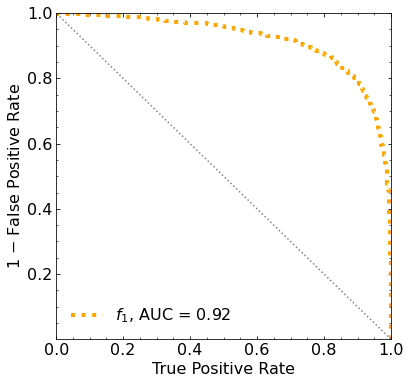

Classification score:


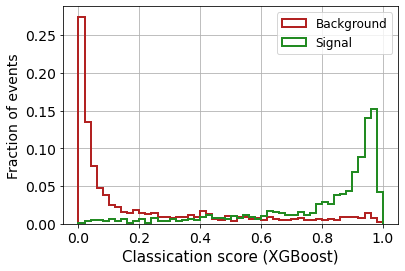


 ROC-AUC =  0.9186448794378546


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  161.58502035  155.67155164  144.59718572  126.75443512  102.28784691
   69.0776166    31.16427203  -12.13967729  -58.22870831 -109.07398757]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 130.99136072 128.78082067 120.529987

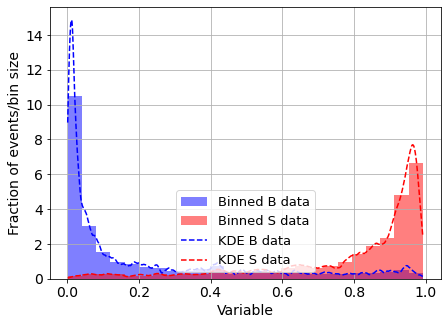

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



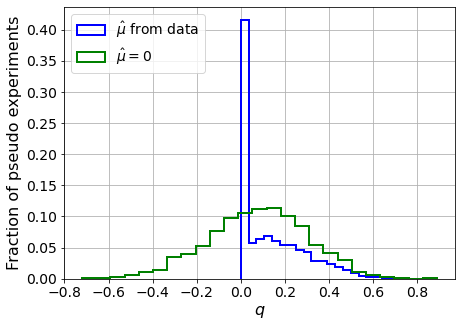

muhat mean:  -2.694646260602698
Z_bins:  0.2955315677632849
std Z_bins:  0.2578473732966023
Z_bins mu=0:  0.2955315677632849
std Z_bins mu=0:  0.3779180332182212

--------

B_expected:  643
S_expected:  3



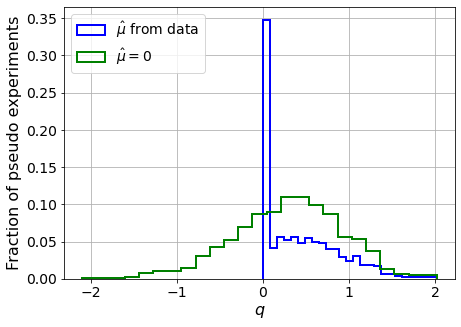

muhat mean:  -0.8447477103426083
Z_bins:  0.5745991194293435
std Z_bins:  0.38441373079506336
Z_bins mu=0:  0.5745991194293435
std Z_bins mu=0:  0.5481590481227705

--------

B_expected:  643
S_expected:  6



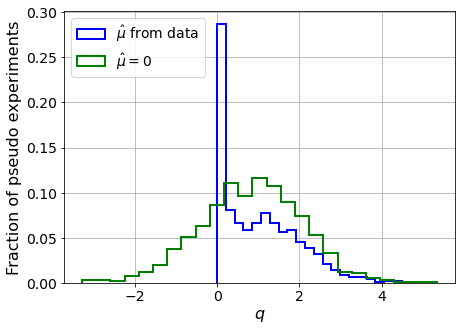

muhat mean:  -0.4665242686784806
Z_bins:  0.936036724646171
std Z_bins:  0.504407962595019
Z_bins mu=0:  0.936036724646171
std Z_bins mu=0:  0.654654590112427

--------

B_expected:  643
S_expected:  14



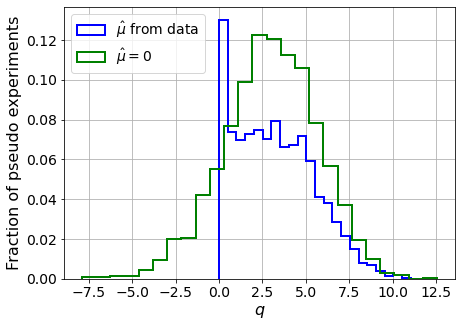

muhat mean:  -0.1868204237520729
Z_bins:  1.7543821300330678
std Z_bins:  0.6454793417577467
Z_bins mu=0:  1.7543821300330678
std Z_bins mu=0:  0.7754408720181117

--------

B_expected:  643
S_expected:  30



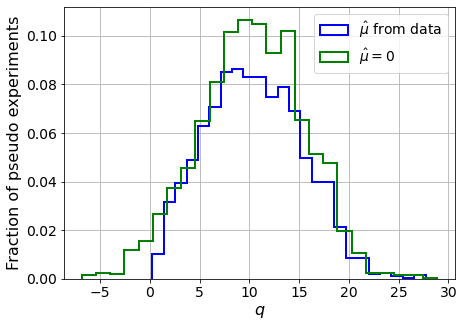

muhat mean:  -0.0991318380842742
Z_bins:  3.2126852109288824
std Z_bins:  0.7480370249281029
Z_bins mu=0:  3.2126852109288824
std Z_bins mu=0:  0.8171457762970622

--------

B_expected:  643
S_expected:  65



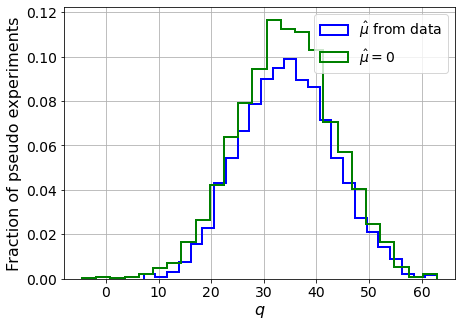

muhat mean:  -0.046285734950607976
Z_bins:  5.859205679549198
std Z_bins:  0.7539235386425104
Z_bins mu=0:  5.859171728465329
std Z_bins mu=0:  0.7927996167012769

--------

B_expected:  643
S_expected:  139



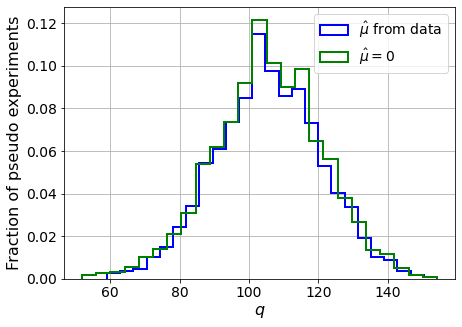

muhat mean:  -0.020945825868632605
Z_bins:  10.274516018433758
std Z_bins:  0.7393811171700804
Z_bins mu=0:  10.273414309066736
std Z_bins mu=0:  0.7634259610287965

--------

B_expected:  643
S_expected:  300



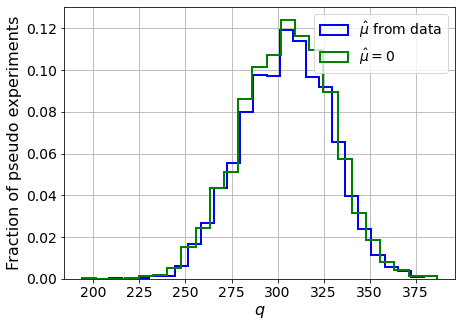

muhat mean:  -0.008942543856261911
Z_bins:  17.48159725677672
std Z_bins:  0.6893576686709844
Z_bins mu=0:  17.48159725677672
std Z_bins mu=0:  0.7038592860065699

--------

B_expected:  643
S_expected:  645



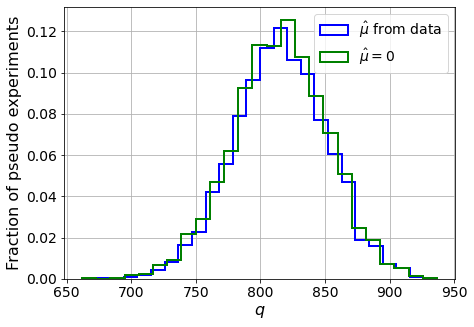

muhat mean:  -0.004326155586972593
Z_bins:  28.563038062285724
std Z_bins:  0.6322589122227222
Z_bins mu=0:  28.56233339159073
std Z_bins mu=0:  0.6412361126620344

--------

B_expected:  643
S_expected:  1390



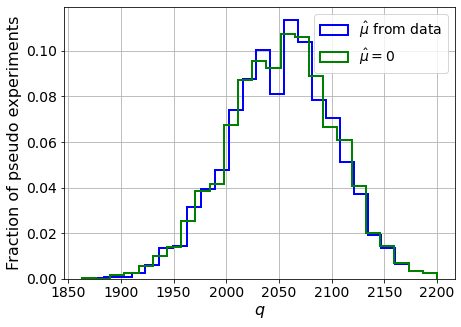

muhat mean:  -0.0020735163351970056
Z_bins:  45.33134732870523
std Z_bins:  0.5526936743624268
Z_bins mu=0:  45.33116916447422
std Z_bins mu=0:  0.5579246798112358

--------


 FINAL RESULT:

[[0.2955315677632849, 0.2578473732966023, -2.694646260602698, 0.2955315677632849, 0.3779180332182212], [0.5745991194293435, 0.38441373079506336, -0.8447477103426083, 0.5745991194293435, 0.5481590481227705], [0.936036724646171, 0.504407962595019, -0.4665242686784806, 0.936036724646171, 0.654654590112427], [1.7543821300330678, 0.6454793417577467, -0.1868204237520729, 1.7543821300330678, 0.7754408720181117], [3.2126852109288824, 0.7480370249281029, -0.0991318380842742, 3.2126852109288824, 0.8171457762970622], [5.859205679549198, 0.7539235386425104, -0.046285734950607976, 5.859171728465329, 0.7927996167012769], [10.274516018433758, 0.7393811171700804, -0.020945825868632605, 10.273414309066736, 0.7634259610287965], [17.48159725677672, 0.6893576686709844, -0.008942543856261911, 17.48159725677672, 0.7038

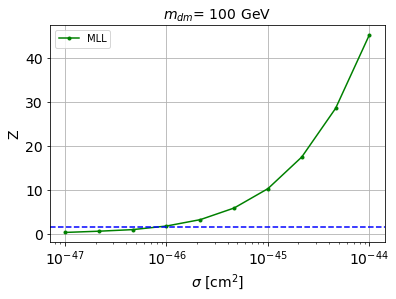


cross_MLL_164:  9.208222740320628e-47
cross_MLL_164_up:  5.678297430222491e-47
cross_MLL_164_down:  1.4448689606968116e-46

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68861	validation_1-logloss:0.68934
[1]	validation_0-logloss:0.68412	validation_1-logloss:0.68557
[2]	validation_0-logloss:0.67976	validation_1-logloss:0.68184
[3]	validation_0-logloss:0.67546	validation_1-logloss:0.67835
[4]	validation_0-logloss:0.67129	validation_1-logloss:0.67477
[5]	validation_0-logloss:0.66705	validation_1-logloss:0.67132
[6]	validation_0-logloss:0.66290	validation_1-logloss:0.66785
[7]	validation_0-logloss:0.65883	validation_1-logloss:0.66447
[8]	validation_0-logloss:0.65489	validation_1-logloss:0.66131
[9]	validation_0-logloss:0.65096	validation_1-logloss:0.65807
[10]	validation_0-logloss:0.64711	validation_1-logloss:0.65490
[11]	validation_0-logloss:0.64331	validation_1-logloss:0.65188
[12]	validation_0-logloss:0.63958	validation_1-logloss:0.64887
[13]	validation_0-logloss:0.63589	validation_1-logloss:0.64588
[14]	validation_0-logloss:0.63219	validation_1-logloss:0.64298
[15]	validation_0-logloss:0.62865	validation_1-logloss:0.64008
[1

[130]	validation_0-logloss:0.40416	validation_1-logloss:0.48074
[131]	validation_0-logloss:0.40309	validation_1-logloss:0.47998
[132]	validation_0-logloss:0.40192	validation_1-logloss:0.47936
[133]	validation_0-logloss:0.40089	validation_1-logloss:0.47877
[134]	validation_0-logloss:0.39975	validation_1-logloss:0.47818
[135]	validation_0-logloss:0.39875	validation_1-logloss:0.47750
[136]	validation_0-logloss:0.39767	validation_1-logloss:0.47678
[137]	validation_0-logloss:0.39666	validation_1-logloss:0.47628
[138]	validation_0-logloss:0.39558	validation_1-logloss:0.47573
[139]	validation_0-logloss:0.39455	validation_1-logloss:0.47514
[140]	validation_0-logloss:0.39349	validation_1-logloss:0.47469
[141]	validation_0-logloss:0.39253	validation_1-logloss:0.47412
[142]	validation_0-logloss:0.39151	validation_1-logloss:0.47347
[143]	validation_0-logloss:0.39053	validation_1-logloss:0.47301
[144]	validation_0-logloss:0.38950	validation_1-logloss:0.47250
[145]	validation_0-logloss:0.38851	valid

[259]	validation_0-logloss:0.30151	validation_1-logloss:0.43546
[260]	validation_0-logloss:0.30097	validation_1-logloss:0.43530
[261]	validation_0-logloss:0.30040	validation_1-logloss:0.43512
[262]	validation_0-logloss:0.29981	validation_1-logloss:0.43494
[263]	validation_0-logloss:0.29923	validation_1-logloss:0.43484
[264]	validation_0-logloss:0.29866	validation_1-logloss:0.43475
[265]	validation_0-logloss:0.29810	validation_1-logloss:0.43459
[266]	validation_0-logloss:0.29752	validation_1-logloss:0.43442
[267]	validation_0-logloss:0.29700	validation_1-logloss:0.43427
[268]	validation_0-logloss:0.29644	validation_1-logloss:0.43406
[269]	validation_0-logloss:0.29591	validation_1-logloss:0.43388
[270]	validation_0-logloss:0.29535	validation_1-logloss:0.43373
[271]	validation_0-logloss:0.29479	validation_1-logloss:0.43361
[272]	validation_0-logloss:0.29419	validation_1-logloss:0.43340
[273]	validation_0-logloss:0.29364	validation_1-logloss:0.43326
[274]	validation_0-logloss:0.29307	valid

[388]	validation_0-logloss:0.24083	validation_1-logloss:0.42027
[389]	validation_0-logloss:0.24044	validation_1-logloss:0.42029
[390]	validation_0-logloss:0.24007	validation_1-logloss:0.42033
[391]	validation_0-logloss:0.23970	validation_1-logloss:0.42030
[392]	validation_0-logloss:0.23933	validation_1-logloss:0.42020
[393]	validation_0-logloss:0.23896	validation_1-logloss:0.42013
[394]	validation_0-logloss:0.23855	validation_1-logloss:0.42009
[395]	validation_0-logloss:0.23822	validation_1-logloss:0.42006
[396]	validation_0-logloss:0.23784	validation_1-logloss:0.41995
[397]	validation_0-logloss:0.23745	validation_1-logloss:0.42006
[398]	validation_0-logloss:0.23707	validation_1-logloss:0.42002
[399]	validation_0-logloss:0.23672	validation_1-logloss:0.42000
[400]	validation_0-logloss:0.23631	validation_1-logloss:0.41992
[401]	validation_0-logloss:0.23594	validation_1-logloss:0.41977
[402]	validation_0-logloss:0.23555	validation_1-logloss:0.41978
[403]	validation_0-logloss:0.23515	valid

[517]	validation_0-logloss:0.19933	validation_1-logloss:0.41492
[518]	validation_0-logloss:0.19903	validation_1-logloss:0.41487
[519]	validation_0-logloss:0.19881	validation_1-logloss:0.41485
[520]	validation_0-logloss:0.19854	validation_1-logloss:0.41479
[521]	validation_0-logloss:0.19823	validation_1-logloss:0.41473
[522]	validation_0-logloss:0.19799	validation_1-logloss:0.41478
[523]	validation_0-logloss:0.19772	validation_1-logloss:0.41477
[524]	validation_0-logloss:0.19737	validation_1-logloss:0.41474
[525]	validation_0-logloss:0.19707	validation_1-logloss:0.41468
[526]	validation_0-logloss:0.19674	validation_1-logloss:0.41475
[527]	validation_0-logloss:0.19645	validation_1-logloss:0.41471
[528]	validation_0-logloss:0.19620	validation_1-logloss:0.41472
[529]	validation_0-logloss:0.19600	validation_1-logloss:0.41472
[530]	validation_0-logloss:0.19573	validation_1-logloss:0.41463
[531]	validation_0-logloss:0.19545	validation_1-logloss:0.41465
[532]	validation_0-logloss:0.19517	valid

[646]	validation_0-logloss:0.16955	validation_1-logloss:0.41159
[647]	validation_0-logloss:0.16939	validation_1-logloss:0.41159
[648]	validation_0-logloss:0.16923	validation_1-logloss:0.41159
[649]	validation_0-logloss:0.16909	validation_1-logloss:0.41161
[650]	validation_0-logloss:0.16884	validation_1-logloss:0.41149
[651]	validation_0-logloss:0.16870	validation_1-logloss:0.41153
[652]	validation_0-logloss:0.16851	validation_1-logloss:0.41147
[653]	validation_0-logloss:0.16833	validation_1-logloss:0.41145
[654]	validation_0-logloss:0.16812	validation_1-logloss:0.41147
[655]	validation_0-logloss:0.16787	validation_1-logloss:0.41155
[656]	validation_0-logloss:0.16770	validation_1-logloss:0.41151
[657]	validation_0-logloss:0.16754	validation_1-logloss:0.41154
[658]	validation_0-logloss:0.16731	validation_1-logloss:0.41147
[659]	validation_0-logloss:0.16713	validation_1-logloss:0.41143
[660]	validation_0-logloss:0.16693	validation_1-logloss:0.41136
[661]	validation_0-logloss:0.16672	valid

[775]	validation_0-logloss:0.14684	validation_1-logloss:0.40942
[776]	validation_0-logloss:0.14670	validation_1-logloss:0.40932
[777]	validation_0-logloss:0.14654	validation_1-logloss:0.40927
[778]	validation_0-logloss:0.14634	validation_1-logloss:0.40924
[779]	validation_0-logloss:0.14620	validation_1-logloss:0.40923
[780]	validation_0-logloss:0.14605	validation_1-logloss:0.40928
[781]	validation_0-logloss:0.14592	validation_1-logloss:0.40929
[782]	validation_0-logloss:0.14579	validation_1-logloss:0.40927
[783]	validation_0-logloss:0.14565	validation_1-logloss:0.40936
[784]	validation_0-logloss:0.14544	validation_1-logloss:0.40931
[785]	validation_0-logloss:0.14530	validation_1-logloss:0.40937
[786]	validation_0-logloss:0.14513	validation_1-logloss:0.40933
[787]	validation_0-logloss:0.14496	validation_1-logloss:0.40929
[788]	validation_0-logloss:0.14480	validation_1-logloss:0.40924
[789]	validation_0-logloss:0.14463	validation_1-logloss:0.40923
[790]	validation_0-logloss:0.14442	valid

[904]	validation_0-logloss:0.12791	validation_1-logloss:0.40834
[905]	validation_0-logloss:0.12779	validation_1-logloss:0.40839
[906]	validation_0-logloss:0.12765	validation_1-logloss:0.40833
[907]	validation_0-logloss:0.12751	validation_1-logloss:0.40839
[908]	validation_0-logloss:0.12736	validation_1-logloss:0.40844
[909]	validation_0-logloss:0.12718	validation_1-logloss:0.40839
[910]	validation_0-logloss:0.12702	validation_1-logloss:0.40837
[911]	validation_0-logloss:0.12683	validation_1-logloss:0.40834
[912]	validation_0-logloss:0.12669	validation_1-logloss:0.40830
[913]	validation_0-logloss:0.12656	validation_1-logloss:0.40836
[914]	validation_0-logloss:0.12641	validation_1-logloss:0.40830
[915]	validation_0-logloss:0.12621	validation_1-logloss:0.40825
[916]	validation_0-logloss:0.12610	validation_1-logloss:0.40827
[917]	validation_0-logloss:0.12598	validation_1-logloss:0.40818
[918]	validation_0-logloss:0.12580	validation_1-logloss:0.40818
[919]	validation_0-logloss:0.12566	valid

[1032]	validation_0-logloss:0.11133	validation_1-logloss:0.40719
[1033]	validation_0-logloss:0.11124	validation_1-logloss:0.40721
[1034]	validation_0-logloss:0.11115	validation_1-logloss:0.40718
[1035]	validation_0-logloss:0.11106	validation_1-logloss:0.40712
[1036]	validation_0-logloss:0.11095	validation_1-logloss:0.40709
[1037]	validation_0-logloss:0.11084	validation_1-logloss:0.40704
[1038]	validation_0-logloss:0.11074	validation_1-logloss:0.40705
[1039]	validation_0-logloss:0.11064	validation_1-logloss:0.40704
[1040]	validation_0-logloss:0.11048	validation_1-logloss:0.40698
[1041]	validation_0-logloss:0.11035	validation_1-logloss:0.40694
[1042]	validation_0-logloss:0.11023	validation_1-logloss:0.40698
[1043]	validation_0-logloss:0.11015	validation_1-logloss:0.40708
[1044]	validation_0-logloss:0.11002	validation_1-logloss:0.40706
[1045]	validation_0-logloss:0.10989	validation_1-logloss:0.40701
[1046]	validation_0-logloss:0.10983	validation_1-logloss:0.40695
[1047]	validation_0-loglo

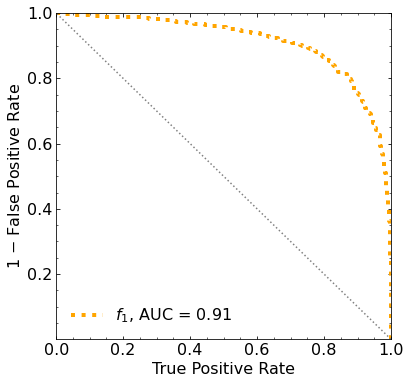

Classification score:


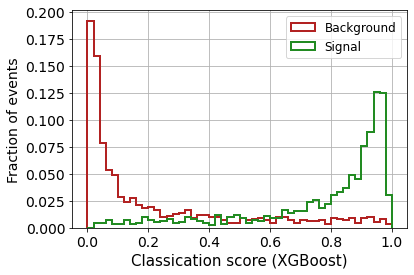


 ROC-AUC =  0.9117998791305595


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  141.8725306   138.49404126  130.17172694  115.12076981   94.06061153
   66.0143749    31.01361813   -9.63854916  -56.84048617 -107.84123751]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  118.11985246  120.09251239  117.151804

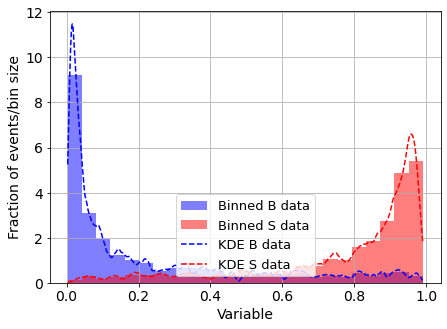

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



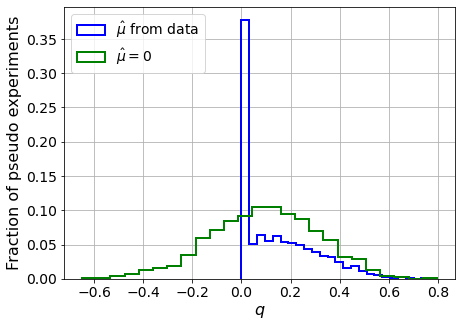

muhat mean:  -3.505243180700458
Z_bins:  0.3148951242748642
std Z_bins:  0.2436907592244273
Z_bins mu=0:  0.3148951242748642
std Z_bins mu=0:  0.3450212610582116

--------

B_expected:  643
S_expected:  2



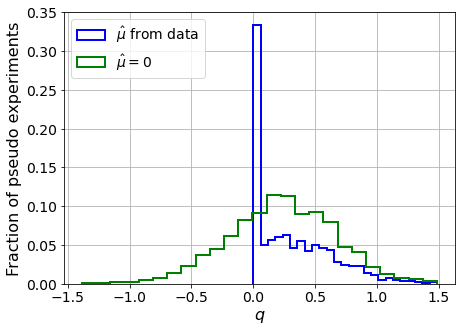

muhat mean:  -1.9816425145350816
Z_bins:  0.4862618087969223
std Z_bins:  0.3255796372794562
Z_bins mu=0:  0.4862618087969223
std Z_bins mu=0:  0.44139324470366054

--------

B_expected:  643
S_expected:  4



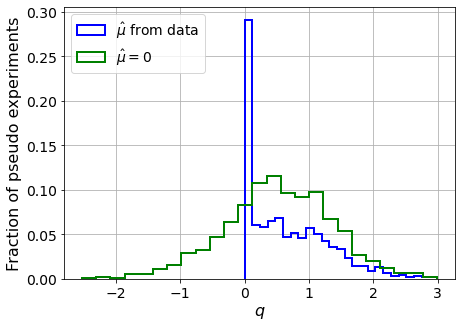

muhat mean:  -0.9457257354156666
Z_bins:  0.7239565574876572
std Z_bins:  0.4368183535532812
Z_bins mu=0:  0.7239565574876572
std Z_bins mu=0:  0.5736571806531445

--------

B_expected:  643
S_expected:  8



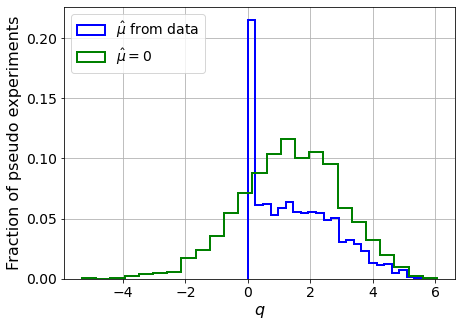

muhat mean:  -0.45959550588026715
Z_bins:  1.1779792645075249
std Z_bins:  0.5481835651349167
Z_bins mu=0:  1.1779792645075249
std Z_bins mu=0:  0.6819339908948119

--------

B_expected:  643
S_expected:  17



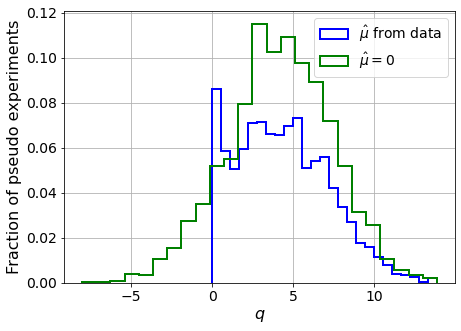

muhat mean:  -0.19944761616780113
Z_bins:  2.0519561612933854
std Z_bins:  0.6835053399623839
Z_bins mu=0:  2.0519561612933854
std Z_bins mu=0:  0.7890573889804668

--------

B_expected:  643
S_expected:  37



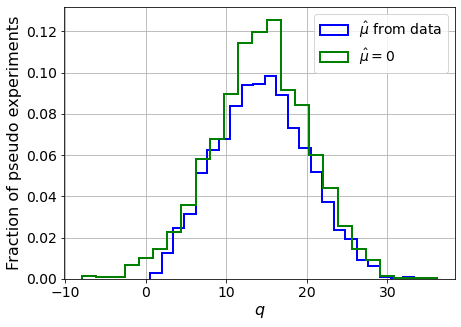

muhat mean:  -0.10307172391524434
Z_bins:  3.8016997710278035
std Z_bins:  0.7379808748751269
Z_bins mu=0:  3.8016997710278035
std Z_bins mu=0:  0.7942981656202721

--------

B_expected:  643
S_expected:  79



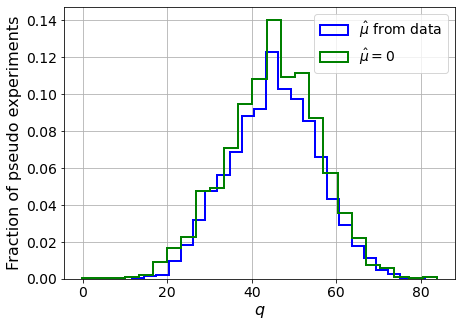

muhat mean:  -0.04320816185719647
Z_bins:  6.736573473382098
std Z_bins:  0.7736708028178488
Z_bins mu=0:  6.736573473382098
std Z_bins mu=0:  0.810115685679296

--------

B_expected:  643
S_expected:  170



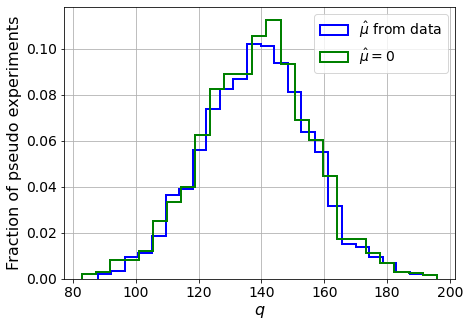

muhat mean:  -0.02205113643353274
Z_bins:  11.791141234732725
std Z_bins:  0.7293536897023583
Z_bins mu=0:  11.791141234732725
std Z_bins mu=0:  0.746056945974994

--------

B_expected:  643
S_expected:  366



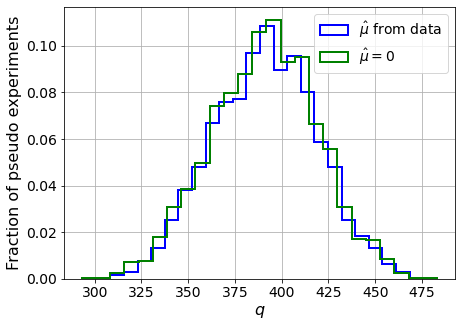

muhat mean:  -0.009791518258175818
Z_bins:  19.791149055841505
std Z_bins:  0.7059115987885801
Z_bins mu=0:  19.79096470618036
std Z_bins mu=0:  0.7170899220677776

--------

B_expected:  643
S_expected:  788



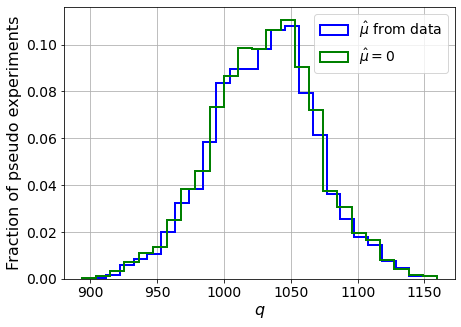

muhat mean:  -0.0047275105722522585
Z_bins:  32.118250475829825
std Z_bins:  0.6134001200687461
Z_bins mu=0:  32.118250475829825
std Z_bins mu=0:  0.6196894984101056

--------


 FINAL RESULT:

[[0.3148951242748642, 0.2436907592244273, -3.505243180700458, 0.3148951242748642, 0.3450212610582116], [0.4862618087969223, 0.3255796372794562, -1.9816425145350816, 0.4862618087969223, 0.44139324470366054], [0.7239565574876572, 0.4368183535532812, -0.9457257354156666, 0.7239565574876572, 0.5736571806531445], [1.1779792645075249, 0.5481835651349167, -0.45959550588026715, 1.1779792645075249, 0.6819339908948119], [2.0519561612933854, 0.6835053399623839, -0.19944761616780113, 2.0519561612933854, 0.7890573889804668], [3.8016997710278035, 0.7379808748751269, -0.10307172391524434, 3.8016997710278035, 0.7942981656202721], [6.736573473382098, 0.7736708028178488, -0.04320816185719647, 6.736573473382098, 0.810115685679296], [11.791141234732725, 0.7293536897023583, -0.02205113643353274, 11.791141234732725, 

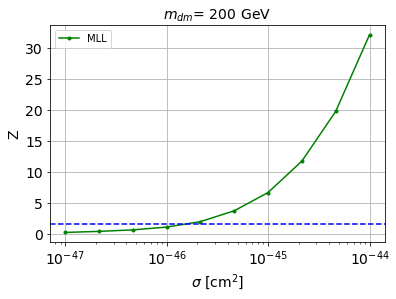


cross_MLL_164:  1.6134422372320932e-46
cross_MLL_164_up:  9.127489487265684e-47
cross_MLL_164_down:  2.5347064102494483e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68873	validation_1-logloss:0.68927
[1]	validation_0-logloss:0.68441	validation_1-logloss:0.68551
[2]	validation_0-logloss:0.68015	validation_1-logloss:0.68178
[3]	validation_0-logloss:0.67597	validation_1-logloss:0.67818
[4]	validation_0-logloss:0.67188	validation_1-logloss:0.67464
[5]	validation_0-logloss:0.66783	validation_1-logloss:0.67110
[6]	validation_0-logloss:0.66381	validation_1-logloss:0.66753
[7]	validation_0-logloss:0.65992	validation_1-logloss:0.66423
[8]	validation_0-logloss:0.65604	validation_1-logloss:0.66083
[9]	validation_0-logloss:0.65228	validation_1-logloss:0.65769
[10]	validation_0-logloss:0.64853	validation_1-logloss:0.65446
[11]	validation_0-logloss:0.64489	validation_1-logloss:0.65126
[12]	validation_0-logloss:0.64123	validation_1-logloss:0.64813
[13]	validation_0-logloss:0.63765	validation_1-logloss:0.64526
[14]	validation_0-logloss:0.63414	validation_1-logloss:0.64232
[15]	validation_0-logloss:0.63068	validation_1-logloss:0.63941
[1

[130]	validation_0-logloss:0.41119	validation_1-logloss:0.48271
[131]	validation_0-logloss:0.41009	validation_1-logloss:0.48214
[132]	validation_0-logloss:0.40901	validation_1-logloss:0.48157
[133]	validation_0-logloss:0.40797	validation_1-logloss:0.48102
[134]	validation_0-logloss:0.40693	validation_1-logloss:0.48044
[135]	validation_0-logloss:0.40592	validation_1-logloss:0.47993
[136]	validation_0-logloss:0.40486	validation_1-logloss:0.47937
[137]	validation_0-logloss:0.40384	validation_1-logloss:0.47877
[138]	validation_0-logloss:0.40281	validation_1-logloss:0.47822
[139]	validation_0-logloss:0.40182	validation_1-logloss:0.47764
[140]	validation_0-logloss:0.40083	validation_1-logloss:0.47712
[141]	validation_0-logloss:0.39978	validation_1-logloss:0.47646
[142]	validation_0-logloss:0.39870	validation_1-logloss:0.47572
[143]	validation_0-logloss:0.39770	validation_1-logloss:0.47527
[144]	validation_0-logloss:0.39669	validation_1-logloss:0.47473
[145]	validation_0-logloss:0.39571	valid

[259]	validation_0-logloss:0.31039	validation_1-logloss:0.44065
[260]	validation_0-logloss:0.30982	validation_1-logloss:0.44034
[261]	validation_0-logloss:0.30926	validation_1-logloss:0.44011
[262]	validation_0-logloss:0.30868	validation_1-logloss:0.43999
[263]	validation_0-logloss:0.30811	validation_1-logloss:0.43982
[264]	validation_0-logloss:0.30754	validation_1-logloss:0.43962
[265]	validation_0-logloss:0.30707	validation_1-logloss:0.43953
[266]	validation_0-logloss:0.30658	validation_1-logloss:0.43932
[267]	validation_0-logloss:0.30600	validation_1-logloss:0.43909
[268]	validation_0-logloss:0.30539	validation_1-logloss:0.43891
[269]	validation_0-logloss:0.30478	validation_1-logloss:0.43875
[270]	validation_0-logloss:0.30423	validation_1-logloss:0.43863
[271]	validation_0-logloss:0.30377	validation_1-logloss:0.43853
[272]	validation_0-logloss:0.30323	validation_1-logloss:0.43831
[273]	validation_0-logloss:0.30264	validation_1-logloss:0.43816
[274]	validation_0-logloss:0.30208	valid

[388]	validation_0-logloss:0.24892	validation_1-logloss:0.42638
[389]	validation_0-logloss:0.24852	validation_1-logloss:0.42632
[390]	validation_0-logloss:0.24817	validation_1-logloss:0.42622
[391]	validation_0-logloss:0.24778	validation_1-logloss:0.42622
[392]	validation_0-logloss:0.24734	validation_1-logloss:0.42613
[393]	validation_0-logloss:0.24695	validation_1-logloss:0.42613
[394]	validation_0-logloss:0.24652	validation_1-logloss:0.42602
[395]	validation_0-logloss:0.24612	validation_1-logloss:0.42595
[396]	validation_0-logloss:0.24578	validation_1-logloss:0.42584
[397]	validation_0-logloss:0.24538	validation_1-logloss:0.42582
[398]	validation_0-logloss:0.24500	validation_1-logloss:0.42579
[399]	validation_0-logloss:0.24462	validation_1-logloss:0.42566
[400]	validation_0-logloss:0.24424	validation_1-logloss:0.42569
[401]	validation_0-logloss:0.24383	validation_1-logloss:0.42568
[402]	validation_0-logloss:0.24349	validation_1-logloss:0.42558
[403]	validation_0-logloss:0.24311	valid

[517]	validation_0-logloss:0.20433	validation_1-logloss:0.41759
[518]	validation_0-logloss:0.20401	validation_1-logloss:0.41749
[519]	validation_0-logloss:0.20371	validation_1-logloss:0.41752
[520]	validation_0-logloss:0.20338	validation_1-logloss:0.41747
[521]	validation_0-logloss:0.20304	validation_1-logloss:0.41737
[522]	validation_0-logloss:0.20273	validation_1-logloss:0.41718
[523]	validation_0-logloss:0.20242	validation_1-logloss:0.41715
[524]	validation_0-logloss:0.20212	validation_1-logloss:0.41704
[525]	validation_0-logloss:0.20182	validation_1-logloss:0.41699
[526]	validation_0-logloss:0.20148	validation_1-logloss:0.41707
[527]	validation_0-logloss:0.20119	validation_1-logloss:0.41703
[528]	validation_0-logloss:0.20089	validation_1-logloss:0.41702
[529]	validation_0-logloss:0.20057	validation_1-logloss:0.41698
[530]	validation_0-logloss:0.20028	validation_1-logloss:0.41696
[531]	validation_0-logloss:0.19994	validation_1-logloss:0.41691
[532]	validation_0-logloss:0.19961	valid

[646]	validation_0-logloss:0.17171	validation_1-logloss:0.41364
[647]	validation_0-logloss:0.17146	validation_1-logloss:0.41375
[648]	validation_0-logloss:0.17123	validation_1-logloss:0.41369
[649]	validation_0-logloss:0.17100	validation_1-logloss:0.41364
[650]	validation_0-logloss:0.17080	validation_1-logloss:0.41369
[651]	validation_0-logloss:0.17066	validation_1-logloss:0.41366
[652]	validation_0-logloss:0.17045	validation_1-logloss:0.41369
[653]	validation_0-logloss:0.17019	validation_1-logloss:0.41379
[654]	validation_0-logloss:0.17003	validation_1-logloss:0.41369
[655]	validation_0-logloss:0.16991	validation_1-logloss:0.41371
[656]	validation_0-logloss:0.16971	validation_1-logloss:0.41364
[657]	validation_0-logloss:0.16955	validation_1-logloss:0.41350
[658]	validation_0-logloss:0.16928	validation_1-logloss:0.41339
[659]	validation_0-logloss:0.16917	validation_1-logloss:0.41334
[660]	validation_0-logloss:0.16904	validation_1-logloss:0.41336
[661]	validation_0-logloss:0.16880	valid

[775]	validation_0-logloss:0.14916	validation_1-logloss:0.41161
[776]	validation_0-logloss:0.14900	validation_1-logloss:0.41165
[777]	validation_0-logloss:0.14882	validation_1-logloss:0.41166
[778]	validation_0-logloss:0.14864	validation_1-logloss:0.41166
[779]	validation_0-logloss:0.14852	validation_1-logloss:0.41166
[780]	validation_0-logloss:0.14835	validation_1-logloss:0.41159
[781]	validation_0-logloss:0.14824	validation_1-logloss:0.41156
[782]	validation_0-logloss:0.14802	validation_1-logloss:0.41155
[783]	validation_0-logloss:0.14780	validation_1-logloss:0.41150
[784]	validation_0-logloss:0.14762	validation_1-logloss:0.41154
[785]	validation_0-logloss:0.14740	validation_1-logloss:0.41156
[786]	validation_0-logloss:0.14729	validation_1-logloss:0.41163
[787]	validation_0-logloss:0.14711	validation_1-logloss:0.41160
[788]	validation_0-logloss:0.14698	validation_1-logloss:0.41162
[789]	validation_0-logloss:0.14685	validation_1-logloss:0.41161
[790]	validation_0-logloss:0.14674	valid

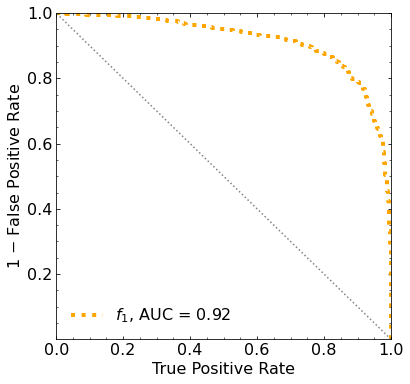

Classification score:


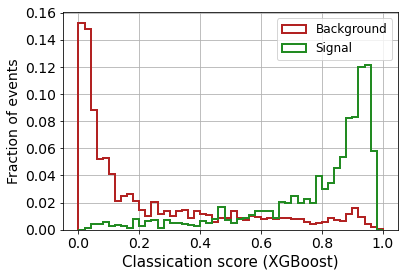


 ROC-AUC =  0.9165219818490975


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  119.70214267  113.08677976  100.90372199   83.11621737
   58.56402618   26.33903608  -11.24736622  -54.83834115 -106.69104096]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 134.6480652
 135.17623367 134.01355778 131.87368008 126.6005007

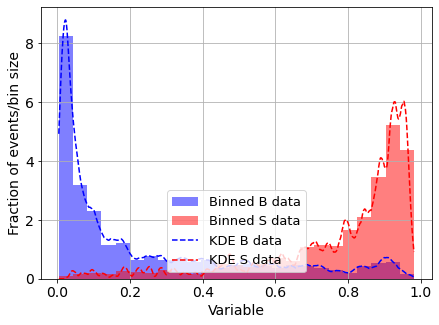

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



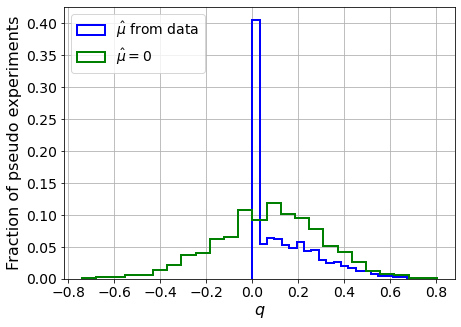

muhat mean:  -2.788902382902547
Z_bins:  0.2925555979850382
std Z_bins:  0.26591018805602756
Z_bins mu=0:  0.2925555979850382
std Z_bins mu=0:  0.395558908761558

--------

B_expected:  643
S_expected:  1



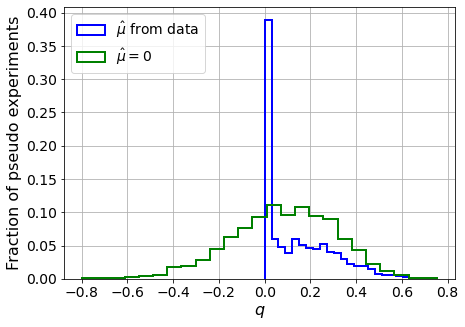

muhat mean:  -2.9175089448464915
Z_bins:  0.30330556195452457
std Z_bins:  0.25052325371094425
Z_bins mu=0:  0.30330556195452457
std Z_bins mu=0:  0.36776466182277023

--------

B_expected:  643
S_expected:  2



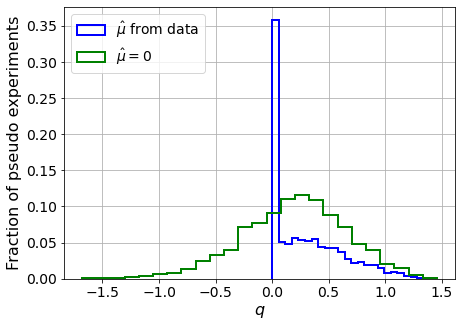

muhat mean:  -1.6002616800971359
Z_bins:  0.4666212919941086
std Z_bins:  0.3397198558150653
Z_bins mu=0:  0.4666212919941086
std Z_bins mu=0:  0.4940574814361283

--------

B_expected:  643
S_expected:  3



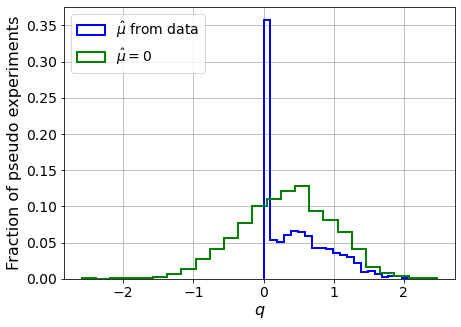

muhat mean:  -1.008524210572098
Z_bins:  0.5984912366276199
std Z_bins:  0.3960952468961574
Z_bins mu=0:  0.5984912366276199
std Z_bins mu=0:  0.5502140333503013

--------

B_expected:  643
S_expected:  7



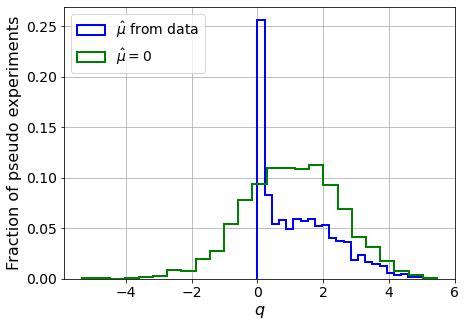

muhat mean:  -0.444173067313159
Z_bins:  1.0460573879135489
std Z_bins:  0.5463676725612814
Z_bins mu=0:  1.0460573879135489
std Z_bins mu=0:  0.6958194850625113

--------

B_expected:  643
S_expected:  15



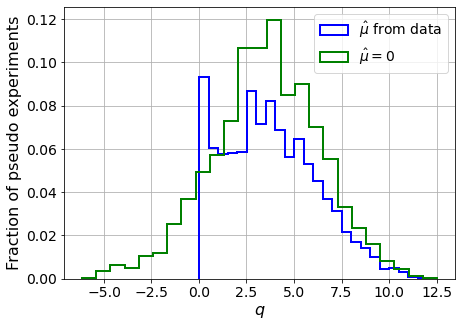

muhat mean:  -0.2206109145924231
Z_bins:  1.8986344886960247
std Z_bins:  0.6445182011833431
Z_bins mu=0:  1.8986344886960247
std Z_bins mu=0:  0.7520527830235307

--------

B_expected:  643
S_expected:  33



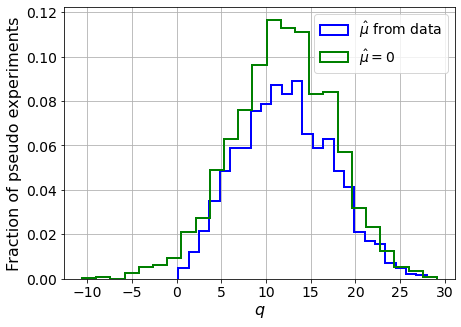

muhat mean:  -0.08943820416482468
Z_bins:  3.469839690965401
std Z_bins:  0.7400153349296017
Z_bins mu=0:  3.469839690965401
std Z_bins mu=0:  0.8105486868194284

--------

B_expected:  643
S_expected:  72



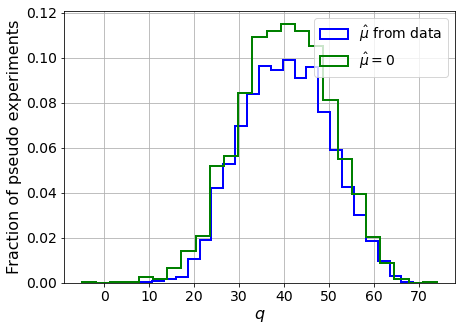

muhat mean:  -0.04160709836608936
Z_bins:  6.3542379316889015
std Z_bins:  0.7603979580727838
Z_bins mu=0:  6.3542379316889015
std Z_bins mu=0:  0.7976975600034315

--------

B_expected:  643
S_expected:  154



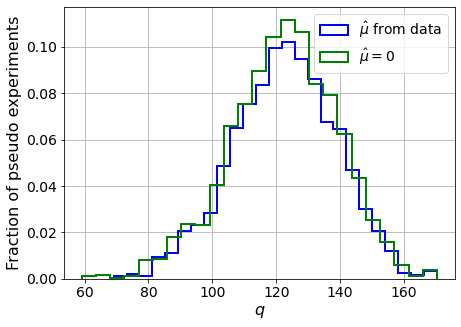

muhat mean:  -0.0194901109545518
Z_bins:  11.079438340002739
std Z_bins:  0.7297549361307608
Z_bins mu=0:  11.079438340002739
std Z_bins mu=0:  0.7529578931070631

--------

B_expected:  643
S_expected:  333



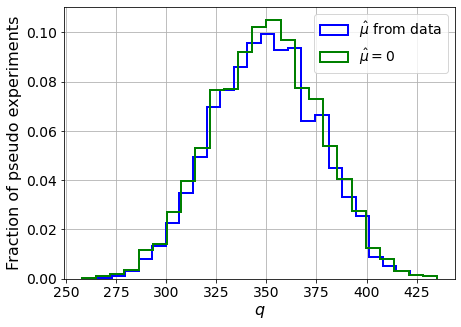

muhat mean:  -0.007690193503137859
Z_bins:  18.709411382569822
std Z_bins:  0.7036452819921357
Z_bins mu=0:  18.70923165333915
std Z_bins mu=0:  0.7164526698786278

--------


 FINAL RESULT:

[[0.2925555979850382, 0.26591018805602756, -2.788902382902547, 0.2925555979850382, 0.395558908761558], [0.30330556195452457, 0.25052325371094425, -2.9175089448464915, 0.30330556195452457, 0.36776466182277023], [0.4666212919941086, 0.3397198558150653, -1.6002616800971359, 0.4666212919941086, 0.4940574814361283], [0.5984912366276199, 0.3960952468961574, -1.008524210572098, 0.5984912366276199, 0.5502140333503013], [1.0460573879135489, 0.5463676725612814, -0.444173067313159, 1.0460573879135489, 0.6958194850625113], [1.8986344886960247, 0.6445182011833431, -0.2206109145924231, 1.8986344886960247, 0.7520527830235307], [3.469839690965401, 0.7400153349296017, -0.08943820416482468, 3.469839690965401, 0.8105486868194284], [6.3542379316889015, 0.7603979580727838, -0.04160709836608936, 6.3542379316889015, 0.7

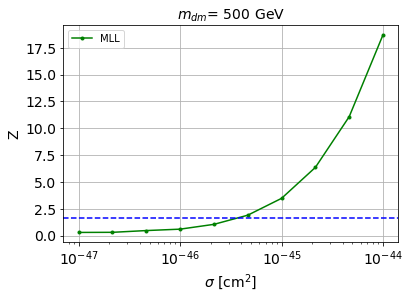


cross_MLL_164:  3.854819753207173e-46
cross_MLL_164_up:  2.2587445753346303e-46
cross_MLL_164_down:  5.991165354609175e-46

#########################



In [24]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)



        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
    # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
    del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    X_mon_train = X_mon_train_1D
    X_mon_val = X_mon_val_1D
    X_mon_test = X_mon_test_1D
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    

    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [25]:
cross_images_MLL = store_cross_MLL_164
cross_images_MLL_up = store_cross_MLL_164_up
cross_images_MLL_down = store_cross_MLL_164_down

print(cross_images_MLL)
print(cross_images_MLL_up)
print(cross_images_MLL_down)

[6.857802224594174e-46, 5.625650779766897e-47, 4.837253285980454e-47, 4.55197718471282e-47, 9.208222740320628e-47, 1.6134422372320932e-46, 3.854819753207173e-46]
[5.4130186135122796e-46, 3.881282032324537e-47, 2.8551353385573233e-47, 2.8689552589822716e-47, 5.678297430222491e-47, 9.127489487265684e-47, 2.2587445753346303e-46]
[9.003312243126412e-46, 8.154678986735306e-47, 7.369292077184437e-47, 7.379990084789769e-47, 1.4448689606968116e-46, 2.5347064102494483e-46, 5.991165354609175e-46]


In [26]:
np.savetxt('results/images_MLL.txt', [cross_images_MLL, cross_images_MLL_up, cross_images_MLL_down])

In [27]:
cross_images_MLL = np.loadtxt('results/images_MLL.txt')[0]
cross_images_MLL_up = np.loadtxt('results/images_MLL.txt')[1]
cross_images_MLL_down =np.loadtxt('results/images_MLL.txt')[2]

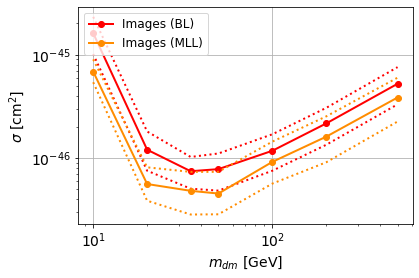

In [28]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_images, '-o', color='red', lw=lw, label=r'Images (BL)')
plt.plot(mDM_mDM, cross_images_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_images_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_images_MLL, '-o', color='darkorange', lw=lw, label=r'Images (MLL)')
plt.plot(mDM_mDM, cross_images_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_images_MLL_down, ':', color='darkorange', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 2. Images + time diff

##### Load the compressed features

In [29]:
###############
# BACKGROUNDS # 
###############

B_pbot_ER = np.loadtxt(filefolder + 'ER/pbot.txt')
B_ptop_ER = np.loadtxt(filefolder + 'ER/ptop.txt')
B_ppeakS1_ER = np.loadtxt(filefolder + 'ER/ppeakS1.txt')
B_ppeakS2_ER = np.loadtxt(filefolder + 'ER/ppeakS2.txt')

print('B_pbot_ER.shape: ', B_pbot_ER.shape)
print('B_ptop_ER.shape: ', B_ptop_ER.shape)
print('B_ppeakS1_ER.shape :', B_ppeakS1_ER.shape)
print('B_ppeakS2_ER.shape: ', B_ppeakS2_ER.shape)


B_pbot_AC = np.loadtxt(filefolder + 'AC/pbot.txt')
B_ptop_AC = np.loadtxt(filefolder + 'AC/ptop.txt')
B_ppeakS1_AC = np.loadtxt(filefolder + 'AC/ppeakS1.txt')
B_ppeakS2_AC = np.loadtxt(filefolder + 'AC/ppeakS2.txt')

print('\nB_pbot_AC.shape: ', B_pbot_AC.shape)
print('B_ptop_AC.shape: ', B_ptop_AC.shape)
print('B_ppeakS1_AC.shape :', B_ppeakS1_AC.shape)
print('B_ppeakS2_AC.shape: ', B_ppeakS2_AC.shape)


B_pbot_CNNS = np.loadtxt(filefolder + 'CNNS/pbot.txt')
B_ptop_CNNS = np.loadtxt(filefolder + 'CNNS/ptop.txt')
B_ppeakS1_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS1.txt')
B_ppeakS2_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS2.txt')

print('\nB_pbot_CNNS.shape: ', B_pbot_CNNS.shape)
print('B_ptop_CNNS.shape: ', B_ptop_CNNS.shape)
print('B_ppeakS1_CNNS.shape :', B_ppeakS1_CNNS.shape)
print('B_ppeakS2_CNNS.shape: ', B_ppeakS2_CNNS.shape)


B_pbot_RN = np.loadtxt(filefolder + 'RN/pbot.txt')
B_ptop_RN = np.loadtxt(filefolder + 'RN/ptop.txt')
B_ppeakS1_RN = np.loadtxt(filefolder + 'RN/ppeakS1.txt')
B_ppeakS2_RN = np.loadtxt(filefolder + 'RN/ppeakS2.txt')

print('\nB_pbot_RN.shape: ', B_pbot_RN.shape)
print('B_ptop_RN.shape: ', B_ptop_RN.shape)
print('B_ppeakS1_RN.shape :', B_ppeakS1_RN.shape)
print('B_ppeakS2_RN.shape: ', B_ppeakS2_RN.shape)


B_pbot_WALL = np.loadtxt(filefolder + 'WALL/pbot.txt')
B_ptop_WALL = np.loadtxt(filefolder + 'WALL/ptop.txt')
B_ppeakS1_WALL = np.loadtxt(filefolder + 'WALL/ppeakS1.txt')
B_ppeakS2_WALL = np.loadtxt(filefolder + 'WALL/ppeakS2.txt')

print('\nB_pbot_WALL.shape: ', B_pbot_WALL.shape)
print('B_ptop_WALL.shape: ', B_ptop_WALL.shape)
print('B_ppeakS1_WALL.shape :', B_ppeakS1_WALL.shape)
print('B_ppeakS2_WALL.shape: ', B_ppeakS2_WALL.shape)

B_pbot_ER.shape:  (35549,)
B_ptop_ER.shape:  (35549,)
B_ppeakS1_ER.shape : (35549, 8)
B_ppeakS2_ER.shape:  (35549, 8)

B_pbot_AC.shape:  (3998,)
B_ptop_AC.shape:  (3998,)
B_ppeakS1_AC.shape : (3998, 8)
B_ppeakS2_AC.shape:  (3998, 8)

B_pbot_CNNS.shape:  (99,)
B_ptop_CNNS.shape:  (99,)
B_ppeakS1_CNNS.shape : (99, 8)
B_ppeakS2_CNNS.shape:  (99, 8)

B_pbot_RN.shape:  (2610,)
B_ptop_RN.shape:  (2610,)
B_ppeakS1_RN.shape : (2610, 8)
B_ppeakS2_RN.shape:  (2610, 8)

B_pbot_WALL.shape:  (4642,)
B_ptop_WALL.shape:  (4642,)
B_ppeakS1_WALL.shape : (4642, 8)
B_ppeakS2_WALL.shape:  (4642, 8)



#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:  (5000, 8)
B_pdiffT.shape:  (5000,)
S_pdiffT.shape:  (5000,)


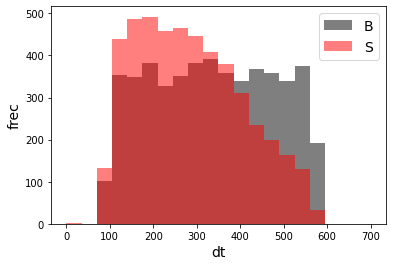

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68476	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67652	validation_1-logloss:0.67761
[2]	validation_0-logloss:0.66845	validation_1-logloss:0.66997
[3]	validation_0-logloss:0.66054	validation_1-logloss:0.66235
[4]	validation_0-logloss:0.65279	validation_1-logloss:0.65487
[5]	validation_0-logloss:0.64515	validation_1-logloss:0.64773
[6]	validation_0-logloss:0.63767	validation_1-logloss:0.64052
[7]	validation_0-logloss:0.63031	validation_1-logloss:0.63358
[8]	validation_0-logloss:0.62310	validation_1-logloss:0.62660
[9]	validation_0-logloss:0.61602	validation_1-logloss:0.61981
[10]	validation_0-logloss:0.60901	validation_1-logloss:0.61324
[11]	validation_0-logloss:0.60216	validation_1-logloss:0.60664
[12]	validation_0-logloss:0.59540	validation_1-logloss:0.60024
[13]	validation_0-logloss:0.58882	validation_1-logloss:0.59396
[14]	validation_0-logloss:0.58225	validation_1-logloss:0.58779
[15]	validation_0-logloss:0.57585	validation_1-logloss:0.58168
[1

[130]	validation_0-logloss:0.20062	validation_1-logloss:0.23514
[131]	validation_0-logloss:0.19905	validation_1-logloss:0.23373
[132]	validation_0-logloss:0.19749	validation_1-logloss:0.23234
[133]	validation_0-logloss:0.19598	validation_1-logloss:0.23101
[134]	validation_0-logloss:0.19444	validation_1-logloss:0.22958
[135]	validation_0-logloss:0.19293	validation_1-logloss:0.22826
[136]	validation_0-logloss:0.19145	validation_1-logloss:0.22689
[137]	validation_0-logloss:0.18998	validation_1-logloss:0.22558
[138]	validation_0-logloss:0.18847	validation_1-logloss:0.22428
[139]	validation_0-logloss:0.18701	validation_1-logloss:0.22295
[140]	validation_0-logloss:0.18558	validation_1-logloss:0.22168
[141]	validation_0-logloss:0.18411	validation_1-logloss:0.22040
[142]	validation_0-logloss:0.18271	validation_1-logloss:0.21917
[143]	validation_0-logloss:0.18134	validation_1-logloss:0.21798
[144]	validation_0-logloss:0.17997	validation_1-logloss:0.21674
[145]	validation_0-logloss:0.17860	valid

[259]	validation_0-logloss:0.08050	validation_1-logloss:0.12935
[260]	validation_0-logloss:0.07999	validation_1-logloss:0.12892
[261]	validation_0-logloss:0.07947	validation_1-logloss:0.12846
[262]	validation_0-logloss:0.07899	validation_1-logloss:0.12807
[263]	validation_0-logloss:0.07847	validation_1-logloss:0.12763
[264]	validation_0-logloss:0.07795	validation_1-logloss:0.12721
[265]	validation_0-logloss:0.07746	validation_1-logloss:0.12685
[266]	validation_0-logloss:0.07697	validation_1-logloss:0.12638
[267]	validation_0-logloss:0.07646	validation_1-logloss:0.12585
[268]	validation_0-logloss:0.07598	validation_1-logloss:0.12540
[269]	validation_0-logloss:0.07549	validation_1-logloss:0.12502
[270]	validation_0-logloss:0.07500	validation_1-logloss:0.12450
[271]	validation_0-logloss:0.07452	validation_1-logloss:0.12407
[272]	validation_0-logloss:0.07404	validation_1-logloss:0.12368
[273]	validation_0-logloss:0.07357	validation_1-logloss:0.12333
[274]	validation_0-logloss:0.07310	valid

[388]	validation_0-logloss:0.03736	validation_1-logloss:0.09352
[389]	validation_0-logloss:0.03714	validation_1-logloss:0.09338
[390]	validation_0-logloss:0.03694	validation_1-logloss:0.09327
[391]	validation_0-logloss:0.03674	validation_1-logloss:0.09316
[392]	validation_0-logloss:0.03653	validation_1-logloss:0.09301
[393]	validation_0-logloss:0.03635	validation_1-logloss:0.09285
[394]	validation_0-logloss:0.03616	validation_1-logloss:0.09270
[395]	validation_0-logloss:0.03595	validation_1-logloss:0.09254
[396]	validation_0-logloss:0.03576	validation_1-logloss:0.09239
[397]	validation_0-logloss:0.03555	validation_1-logloss:0.09226
[398]	validation_0-logloss:0.03535	validation_1-logloss:0.09210
[399]	validation_0-logloss:0.03516	validation_1-logloss:0.09199
[400]	validation_0-logloss:0.03497	validation_1-logloss:0.09187
[401]	validation_0-logloss:0.03478	validation_1-logloss:0.09174
[402]	validation_0-logloss:0.03460	validation_1-logloss:0.09155
[403]	validation_0-logloss:0.03441	valid

[517]	validation_0-logloss:0.01908	validation_1-logloss:0.07992
[518]	validation_0-logloss:0.01899	validation_1-logloss:0.07984
[519]	validation_0-logloss:0.01890	validation_1-logloss:0.07976
[520]	validation_0-logloss:0.01882	validation_1-logloss:0.07976
[521]	validation_0-logloss:0.01872	validation_1-logloss:0.07965
[522]	validation_0-logloss:0.01863	validation_1-logloss:0.07962
[523]	validation_0-logloss:0.01854	validation_1-logloss:0.07961
[524]	validation_0-logloss:0.01845	validation_1-logloss:0.07954
[525]	validation_0-logloss:0.01836	validation_1-logloss:0.07947
[526]	validation_0-logloss:0.01827	validation_1-logloss:0.07941
[527]	validation_0-logloss:0.01819	validation_1-logloss:0.07932
[528]	validation_0-logloss:0.01809	validation_1-logloss:0.07922
[529]	validation_0-logloss:0.01800	validation_1-logloss:0.07918
[530]	validation_0-logloss:0.01791	validation_1-logloss:0.07910
[531]	validation_0-logloss:0.01783	validation_1-logloss:0.07906
[532]	validation_0-logloss:0.01775	valid

[646]	validation_0-logloss:0.01077	validation_1-logloss:0.07455
[647]	validation_0-logloss:0.01073	validation_1-logloss:0.07459
[648]	validation_0-logloss:0.01068	validation_1-logloss:0.07455
[649]	validation_0-logloss:0.01064	validation_1-logloss:0.07450
[650]	validation_0-logloss:0.01060	validation_1-logloss:0.07450
[651]	validation_0-logloss:0.01057	validation_1-logloss:0.07441
[652]	validation_0-logloss:0.01052	validation_1-logloss:0.07436
[653]	validation_0-logloss:0.01047	validation_1-logloss:0.07431
[654]	validation_0-logloss:0.01043	validation_1-logloss:0.07427
[655]	validation_0-logloss:0.01038	validation_1-logloss:0.07426
[656]	validation_0-logloss:0.01033	validation_1-logloss:0.07419
[657]	validation_0-logloss:0.01029	validation_1-logloss:0.07418
[658]	validation_0-logloss:0.01025	validation_1-logloss:0.07415
[659]	validation_0-logloss:0.01021	validation_1-logloss:0.07414
[660]	validation_0-logloss:0.01017	validation_1-logloss:0.07410
[661]	validation_0-logloss:0.01013	valid

[775]	validation_0-logloss:0.00657	validation_1-logloss:0.07212
[776]	validation_0-logloss:0.00655	validation_1-logloss:0.07212
[777]	validation_0-logloss:0.00652	validation_1-logloss:0.07211
[778]	validation_0-logloss:0.00650	validation_1-logloss:0.07210
[779]	validation_0-logloss:0.00648	validation_1-logloss:0.07213
[780]	validation_0-logloss:0.00646	validation_1-logloss:0.07214
[781]	validation_0-logloss:0.00644	validation_1-logloss:0.07210
[782]	validation_0-logloss:0.00642	validation_1-logloss:0.07211
[783]	validation_0-logloss:0.00639	validation_1-logloss:0.07213
[784]	validation_0-logloss:0.00637	validation_1-logloss:0.07214
[785]	validation_0-logloss:0.00635	validation_1-logloss:0.07216
[786]	validation_0-logloss:0.00633	validation_1-logloss:0.07215
[787]	validation_0-logloss:0.00630	validation_1-logloss:0.07216
[788]	validation_0-logloss:0.00628	validation_1-logloss:0.07212
[789]	validation_0-logloss:0.00626	validation_1-logloss:0.07210
[790]	validation_0-logloss:0.00624	valid

[904]	validation_0-logloss:0.00435	validation_1-logloss:0.07135
[905]	validation_0-logloss:0.00433	validation_1-logloss:0.07135
[906]	validation_0-logloss:0.00432	validation_1-logloss:0.07136
[907]	validation_0-logloss:0.00430	validation_1-logloss:0.07135
[908]	validation_0-logloss:0.00429	validation_1-logloss:0.07134
[909]	validation_0-logloss:0.00428	validation_1-logloss:0.07132
[910]	validation_0-logloss:0.00427	validation_1-logloss:0.07130
[911]	validation_0-logloss:0.00426	validation_1-logloss:0.07128
[912]	validation_0-logloss:0.00425	validation_1-logloss:0.07130
[913]	validation_0-logloss:0.00424	validation_1-logloss:0.07131
[914]	validation_0-logloss:0.00422	validation_1-logloss:0.07129
[915]	validation_0-logloss:0.00421	validation_1-logloss:0.07128
[916]	validation_0-logloss:0.00420	validation_1-logloss:0.07127
[917]	validation_0-logloss:0.00419	validation_1-logloss:0.07125
[918]	validation_0-logloss:0.00418	validation_1-logloss:0.07127
[919]	validation_0-logloss:0.00417	valid

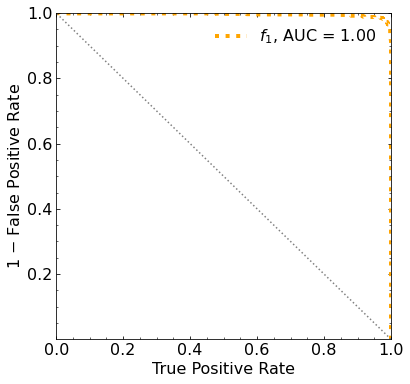

Classification score:


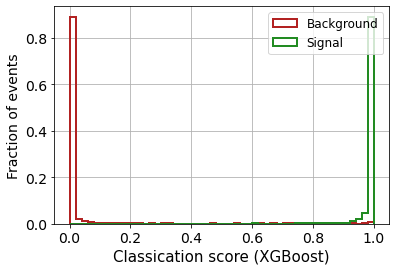


 ROC-AUC =  0.9962513188085141
At least 5 B events per bin, range = [[0, 1]]:
# bins:  4 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  4
range of our data:  [[0, 1]]
number of bins we are going to use:  4
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.15


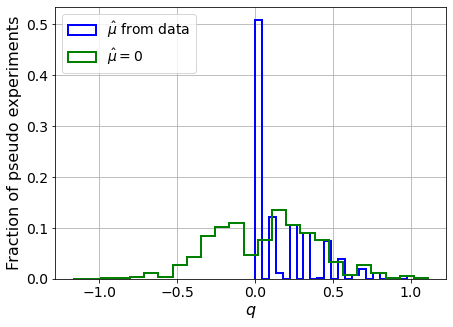

muhat mean:  -0.11063179061482953
Z_bins:  0.1714859132671907
std Z_bins:  0.6236153866832682
Z_bins mu=0:  0.16070432471949642
std Z_bins mu=0:  1.0183416155943055

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1425


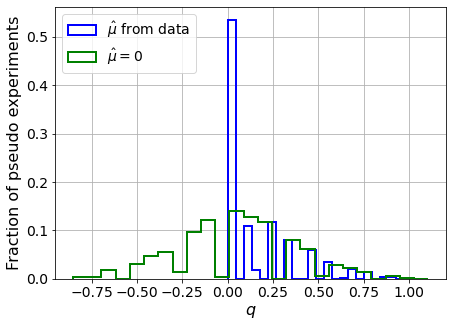

muhat mean:  0.019034280684736903
Z_bins:  0.16328721203972751
std Z_bins:  0.639602909954616
Z_bins mu=0:  0.1484982300253132
std Z_bins mu=0:  1.0935754426423554

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1325


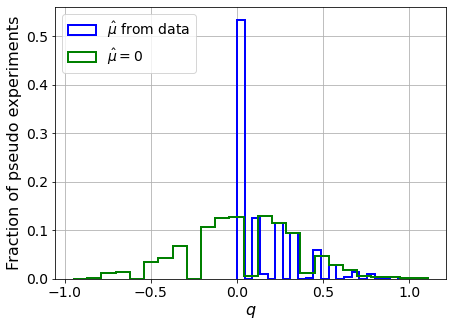

muhat mean:  0.12237072854649324
Z_bins:  0.16648020359500568
std Z_bins:  0.5912391927626306
Z_bins mu=0:  0.15336600202023828
std Z_bins mu=0:  1.0374121944207841

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1385


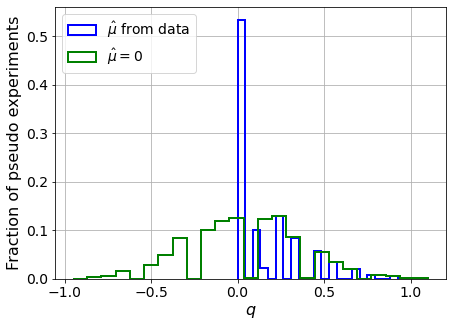

muhat mean:  0.11234488678151451
Z_bins:  0.16210833580743667
std Z_bins:  0.6206616416540407
Z_bins mu=0:  0.146661354627453
std Z_bins mu=0:  1.0986276876326864

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.134


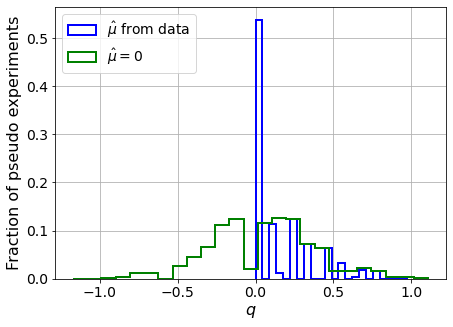

muhat mean:  0.07679406324365486
Z_bins:  0.16210381684237982
std Z_bins:  0.6401329869688118
Z_bins mu=0:  0.14665425373396374
std Z_bins mu=0:  1.1236404091827608

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1465


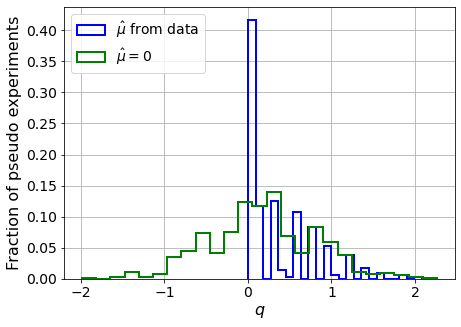

muhat mean:  0.05707159776432608
Z_bins:  0.38417408895053023
std Z_bins:  0.5593436109282744
Z_bins mu=0:  0.37771557835679603
std Z_bins mu=0:  0.8361901602379432

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


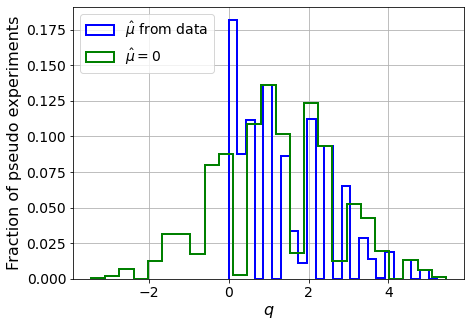

muhat mean:  -0.011118719591268016
Z_bins:  1.019685824217783
std Z_bins:  0.5732208669524077
Z_bins mu=0:  1.0177199125549405
std Z_bins mu=0:  0.7232627704965479

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1245


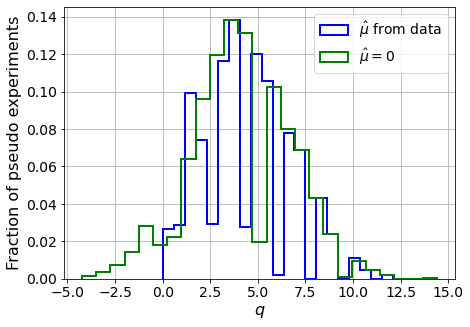

muhat mean:  -0.00743355681103829
Z_bins:  1.9599423842070656
std Z_bins:  0.5894911055233425
Z_bins mu=0:  1.9589977898678985
std Z_bins mu=0:  0.6766955609101404

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.131


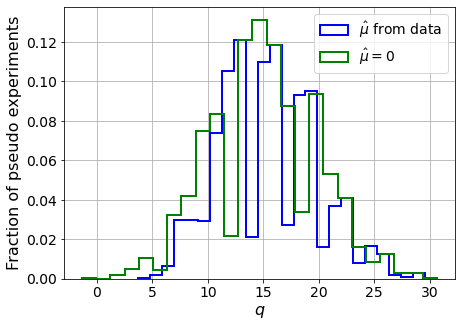

muhat mean:  -0.00040548556912117307
Z_bins:  3.832490437988181
std Z_bins:  0.5789185366795513
Z_bins mu=0:  3.8319374823042542
std Z_bins mu=0:  0.6225843464756372

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1285


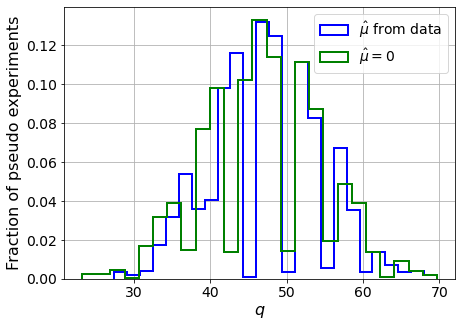

muhat mean:  0.0025444815043628864
Z_bins:  6.8247584701403
std Z_bins:  0.5333938657057843
Z_bins mu=0:  6.824418434919344
std Z_bins mu=0:  0.5608903704912248

--------


 FINAL RESULT:

[[0.1714859132671907, 0.6236153866832682, -0.11063179061482953, 0.16070432471949642, 1.0183416155943055], [0.16328721203972751, 0.639602909954616, 0.019034280684736903, 0.1484982300253132, 1.0935754426423554], [0.16648020359500568, 0.5912391927626306, 0.12237072854649324, 0.15336600202023828, 1.0374121944207841], [0.16210833580743667, 0.6206616416540407, 0.11234488678151451, 0.146661354627453, 1.0986276876326864], [0.16210381684237982, 0.6401329869688118, 0.07679406324365486, 0.14665425373396374, 1.1236404091827608], [0.38417408895053023, 0.5593436109282744, 0.05707159776432608, 0.37771557835679603, 0.8361901602379432], [1.019685824217783, 0.5732208669524077, -0.011118719591268016, 1.0177199125549405, 0.7232627704965479], [1.9599423842070656, 0.5894911055233425, -0.00743355681103829, 1.95899778986789

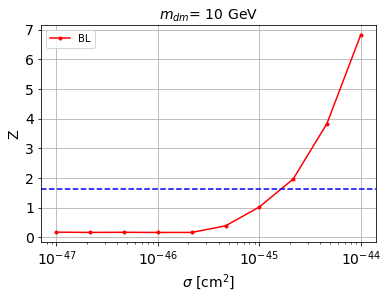


cross_BL_164:  1.7584430742591124e-45
cross_BL_164_up:  1.0471410527642259e-45
cross_BL_164_down:  2.4873046514526383e-45

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

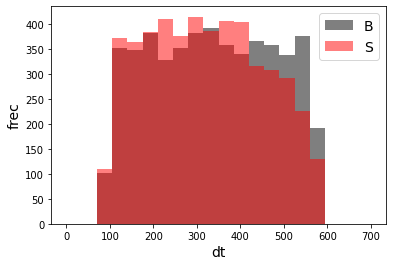

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68595	validation_1-logloss:0.68641
[1]	validation_0-logloss:0.67887	validation_1-logloss:0.67972
[2]	validation_0-logloss:0.67196	validation_1-logloss:0.67316
[3]	validation_0-logloss:0.66516	validation_1-logloss:0.66664
[4]	validation_0-logloss:0.65844	validation_1-logloss:0.66016
[5]	validation_0-logloss:0.65187	validation_1-logloss:0.65373
[6]	validation_0-logloss:0.64542	validation_1-logloss:0.64777
[7]	validation_0-logloss:0.63911	validation_1-logloss:0.64181
[8]	validation_0-logloss:0.63286	validation_1-logloss:0.63575
[9]	validation_0-logloss:0.62673	validation_1-logloss:0.63018
[10]	validation_0-logloss:0.62074	validation_1-logloss:0.62450
[11]	validation_0-logloss:0.61480	validation_1-logloss:0.61899
[12]	validation_0-logloss:0.60899	validation_1-logloss:0.61341
[13]	validation_0-logloss:0.60329	validation_1-logloss:0.60811
[14]	validation_0-logloss:0.59768	validation_1-logloss:0.60283
[15]	validation_0-logloss:0.59214	validation_1-logloss:0.59771
[1

[130]	validation_0-logloss:0.26306	validation_1-logloss:0.30302
[131]	validation_0-logloss:0.26159	validation_1-logloss:0.30188
[132]	validation_0-logloss:0.26019	validation_1-logloss:0.30057
[133]	validation_0-logloss:0.25876	validation_1-logloss:0.29946
[134]	validation_0-logloss:0.25733	validation_1-logloss:0.29827
[135]	validation_0-logloss:0.25587	validation_1-logloss:0.29700
[136]	validation_0-logloss:0.25448	validation_1-logloss:0.29584
[137]	validation_0-logloss:0.25310	validation_1-logloss:0.29468
[138]	validation_0-logloss:0.25168	validation_1-logloss:0.29346
[139]	validation_0-logloss:0.25036	validation_1-logloss:0.29243
[140]	validation_0-logloss:0.24904	validation_1-logloss:0.29128
[141]	validation_0-logloss:0.24773	validation_1-logloss:0.29024
[142]	validation_0-logloss:0.24635	validation_1-logloss:0.28906
[143]	validation_0-logloss:0.24508	validation_1-logloss:0.28806
[144]	validation_0-logloss:0.24380	validation_1-logloss:0.28706
[145]	validation_0-logloss:0.24256	valid

[259]	validation_0-logloss:0.14245	validation_1-logloss:0.20922
[260]	validation_0-logloss:0.14183	validation_1-logloss:0.20881
[261]	validation_0-logloss:0.14122	validation_1-logloss:0.20833
[262]	validation_0-logloss:0.14068	validation_1-logloss:0.20792
[263]	validation_0-logloss:0.14010	validation_1-logloss:0.20743
[264]	validation_0-logloss:0.13949	validation_1-logloss:0.20701
[265]	validation_0-logloss:0.13892	validation_1-logloss:0.20664
[266]	validation_0-logloss:0.13834	validation_1-logloss:0.20624
[267]	validation_0-logloss:0.13773	validation_1-logloss:0.20584
[268]	validation_0-logloss:0.13712	validation_1-logloss:0.20538
[269]	validation_0-logloss:0.13659	validation_1-logloss:0.20493
[270]	validation_0-logloss:0.13602	validation_1-logloss:0.20455
[271]	validation_0-logloss:0.13542	validation_1-logloss:0.20411
[272]	validation_0-logloss:0.13486	validation_1-logloss:0.20375
[273]	validation_0-logloss:0.13433	validation_1-logloss:0.20342
[274]	validation_0-logloss:0.13376	valid

[388]	validation_0-logloss:0.08657	validation_1-logloss:0.17117
[389]	validation_0-logloss:0.08624	validation_1-logloss:0.17107
[390]	validation_0-logloss:0.08593	validation_1-logloss:0.17084
[391]	validation_0-logloss:0.08562	validation_1-logloss:0.17066
[392]	validation_0-logloss:0.08534	validation_1-logloss:0.17059
[393]	validation_0-logloss:0.08504	validation_1-logloss:0.17040
[394]	validation_0-logloss:0.08473	validation_1-logloss:0.17021
[395]	validation_0-logloss:0.08445	validation_1-logloss:0.17016
[396]	validation_0-logloss:0.08411	validation_1-logloss:0.17002
[397]	validation_0-logloss:0.08381	validation_1-logloss:0.16985
[398]	validation_0-logloss:0.08351	validation_1-logloss:0.16968
[399]	validation_0-logloss:0.08321	validation_1-logloss:0.16947
[400]	validation_0-logloss:0.08289	validation_1-logloss:0.16932
[401]	validation_0-logloss:0.08259	validation_1-logloss:0.16908
[402]	validation_0-logloss:0.08233	validation_1-logloss:0.16898
[403]	validation_0-logloss:0.08204	valid

[517]	validation_0-logloss:0.05706	validation_1-logloss:0.15469
[518]	validation_0-logloss:0.05689	validation_1-logloss:0.15463
[519]	validation_0-logloss:0.05672	validation_1-logloss:0.15453
[520]	validation_0-logloss:0.05654	validation_1-logloss:0.15447
[521]	validation_0-logloss:0.05637	validation_1-logloss:0.15436
[522]	validation_0-logloss:0.05618	validation_1-logloss:0.15418
[523]	validation_0-logloss:0.05598	validation_1-logloss:0.15405
[524]	validation_0-logloss:0.05580	validation_1-logloss:0.15401
[525]	validation_0-logloss:0.05564	validation_1-logloss:0.15400
[526]	validation_0-logloss:0.05546	validation_1-logloss:0.15396
[527]	validation_0-logloss:0.05528	validation_1-logloss:0.15390
[528]	validation_0-logloss:0.05511	validation_1-logloss:0.15381
[529]	validation_0-logloss:0.05495	validation_1-logloss:0.15374
[530]	validation_0-logloss:0.05482	validation_1-logloss:0.15360
[531]	validation_0-logloss:0.05465	validation_1-logloss:0.15358
[532]	validation_0-logloss:0.05450	valid

[646]	validation_0-logloss:0.03950	validation_1-logloss:0.14742
[647]	validation_0-logloss:0.03936	validation_1-logloss:0.14732
[648]	validation_0-logloss:0.03926	validation_1-logloss:0.14725
[649]	validation_0-logloss:0.03915	validation_1-logloss:0.14726
[650]	validation_0-logloss:0.03905	validation_1-logloss:0.14727
[651]	validation_0-logloss:0.03895	validation_1-logloss:0.14719
[652]	validation_0-logloss:0.03886	validation_1-logloss:0.14720
[653]	validation_0-logloss:0.03874	validation_1-logloss:0.14718
[654]	validation_0-logloss:0.03865	validation_1-logloss:0.14722
[655]	validation_0-logloss:0.03854	validation_1-logloss:0.14722
[656]	validation_0-logloss:0.03843	validation_1-logloss:0.14724
[657]	validation_0-logloss:0.03834	validation_1-logloss:0.14723
[658]	validation_0-logloss:0.03823	validation_1-logloss:0.14715
[659]	validation_0-logloss:0.03815	validation_1-logloss:0.14704
[660]	validation_0-logloss:0.03806	validation_1-logloss:0.14705
[661]	validation_0-logloss:0.03796	valid

[775]	validation_0-logloss:0.02862	validation_1-logloss:0.14443
[776]	validation_0-logloss:0.02856	validation_1-logloss:0.14442
[777]	validation_0-logloss:0.02849	validation_1-logloss:0.14445
[778]	validation_0-logloss:0.02843	validation_1-logloss:0.14442
[779]	validation_0-logloss:0.02836	validation_1-logloss:0.14446
[780]	validation_0-logloss:0.02830	validation_1-logloss:0.14446
[781]	validation_0-logloss:0.02824	validation_1-logloss:0.14449
[782]	validation_0-logloss:0.02815	validation_1-logloss:0.14450
[783]	validation_0-logloss:0.02807	validation_1-logloss:0.14441
[784]	validation_0-logloss:0.02802	validation_1-logloss:0.14447
[785]	validation_0-logloss:0.02796	validation_1-logloss:0.14447
[786]	validation_0-logloss:0.02789	validation_1-logloss:0.14445
[787]	validation_0-logloss:0.02780	validation_1-logloss:0.14441
[788]	validation_0-logloss:0.02773	validation_1-logloss:0.14435
[789]	validation_0-logloss:0.02766	validation_1-logloss:0.14439
[790]	validation_0-logloss:0.02761	valid

[904]	validation_0-logloss:0.02124	validation_1-logloss:0.14397
[905]	validation_0-logloss:0.02119	validation_1-logloss:0.14394
[906]	validation_0-logloss:0.02114	validation_1-logloss:0.14391
[907]	validation_0-logloss:0.02110	validation_1-logloss:0.14388
[908]	validation_0-logloss:0.02105	validation_1-logloss:0.14391
[909]	validation_0-logloss:0.02100	validation_1-logloss:0.14397
[910]	validation_0-logloss:0.02097	validation_1-logloss:0.14398
[911]	validation_0-logloss:0.02092	validation_1-logloss:0.14403
[912]	validation_0-logloss:0.02087	validation_1-logloss:0.14406
[913]	validation_0-logloss:0.02082	validation_1-logloss:0.14404
[914]	validation_0-logloss:0.02077	validation_1-logloss:0.14411
[915]	validation_0-logloss:0.02072	validation_1-logloss:0.14408
[916]	validation_0-logloss:0.02068	validation_1-logloss:0.14408
[917]	validation_0-logloss:0.02063	validation_1-logloss:0.14408
[918]	validation_0-logloss:0.02057	validation_1-logloss:0.14402
[919]	validation_0-logloss:0.02054	valid

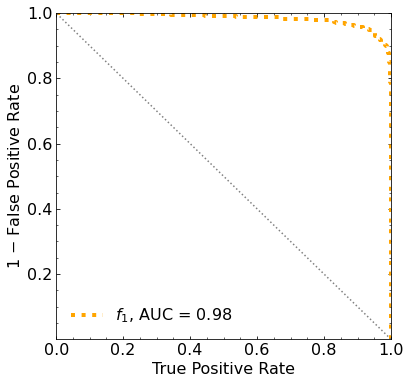

Classification score:


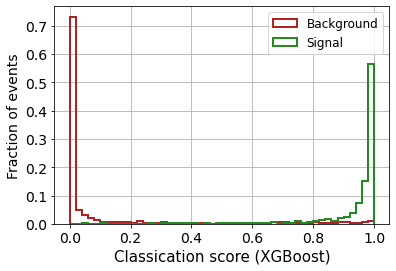


 ROC-AUC =  0.9837325609980948
At least 5 B events per bin, range = [[0, 1]]:
# bins:  9 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  9
range of our data:  [[0, 1]]
number of bins we are going to use:  9
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.229


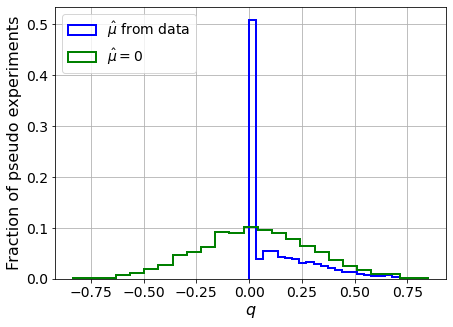

muhat mean:  0.05398805343718872
Z_bins:  0.1655934096958711
std Z_bins:  0.5059706134225446
Z_bins mu=0:  0.16378986209954124
std Z_bins mu=0:  0.8193763321855123

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.222


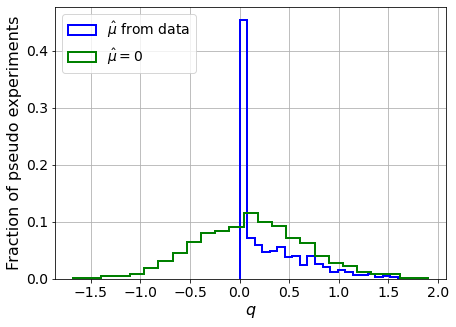

muhat mean:  0.06798231141080459
Z_bins:  0.3445943080283232
std Z_bins:  0.531399163269262
Z_bins mu=0:  0.34326362666409344
std Z_bins mu=0:  0.8088623464012394

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.209


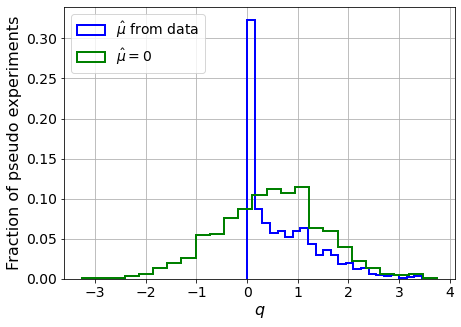

muhat mean:  0.05106076367282998
Z_bins:  0.7060047084861505
std Z_bins:  0.5150429898260651
Z_bins mu=0:  0.7055493183831869
std Z_bins mu=0:  0.725252016163262

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.207


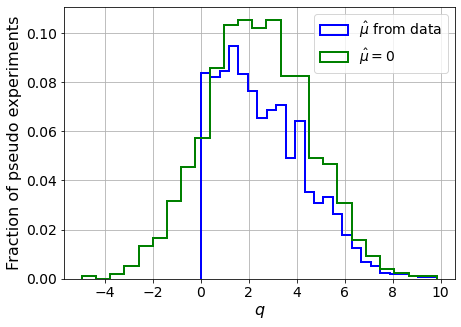

muhat mean:  0.0008758642254894175
Z_bins:  1.5283477516610606
std Z_bins:  0.5925867133322902
Z_bins mu=0:  1.5282236830431013
std Z_bins mu=0:  0.7046646419899073

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.207


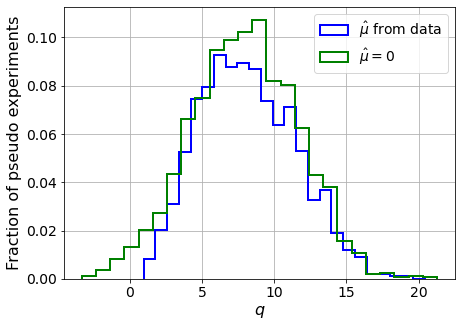

muhat mean:  0.008344855047344285
Z_bins:  2.8131155567134885
std Z_bins:  0.58968368976049
Z_bins mu=0:  2.8128652170540778
std Z_bins mu=0:  0.6557697870725825

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2245


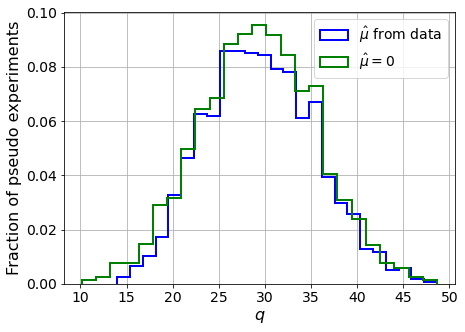

muhat mean:  -0.0008794854303331234
Z_bins:  5.410449087331618
std Z_bins:  0.5513691775883912
Z_bins mu=0:  5.410391738767208
std Z_bins mu=0:  0.5820459399018997

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2315


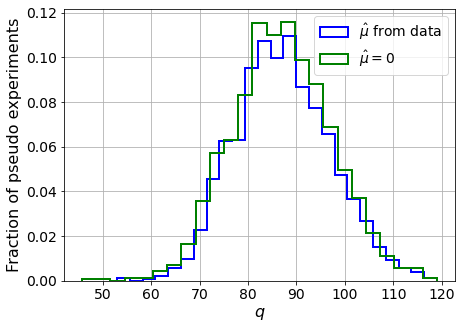

muhat mean:  0.00012836674536197785
Z_bins:  9.323091666816474
std Z_bins:  0.5290974109855336
Z_bins mu=0:  9.323011401995865
std Z_bins mu=0:  0.5482652340116365

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2145


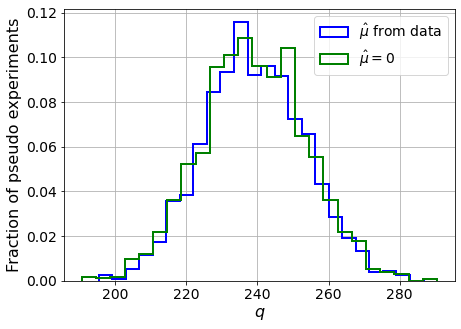

muhat mean:  0.0007116126993260567
Z_bins:  15.447796009486826
std Z_bins:  0.4610619140674286
Z_bins mu=0:  15.447671059871851
std Z_bins mu=0:  0.4732021420975486

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2145


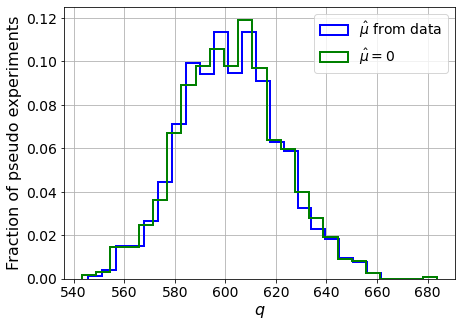

muhat mean:  -5.0819177538137656e-05
Z_bins:  24.530528848163147
std Z_bins:  0.4022878094451697
Z_bins mu=0:  24.53037209196002
std Z_bins mu=0:  0.4090717014689216

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.222


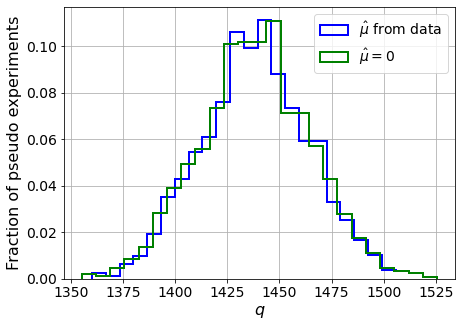

muhat mean:  -0.00013923465155830884
Z_bins:  37.92779013867435
std Z_bins:  0.34445144288020185
Z_bins mu=0:  37.92776125242066
std Z_bins mu=0:  0.3489058079892851

--------


 FINAL RESULT:

[[0.1655934096958711, 0.5059706134225446, 0.05398805343718872, 0.16378986209954124, 0.8193763321855123], [0.3445943080283232, 0.531399163269262, 0.06798231141080459, 0.34326362666409344, 0.8088623464012394], [0.7060047084861505, 0.5150429898260651, 0.05106076367282998, 0.7055493183831869, 0.725252016163262], [1.5283477516610606, 0.5925867133322902, 0.0008758642254894175, 1.5282236830431013, 0.7046646419899073], [2.8131155567134885, 0.58968368976049, 0.008344855047344285, 2.8128652170540778, 0.6557697870725825], [5.410449087331618, 0.5513691775883912, -0.0008794854303331234, 5.410391738767208, 0.5820459399018997], [9.323091666816474, 0.5290974109855336, 0.00012836674536197785, 9.323011401995865, 0.5482652340116365], [15.447796009486826, 0.4610619140674286, 0.0007116126993260567, 15.44767105987185

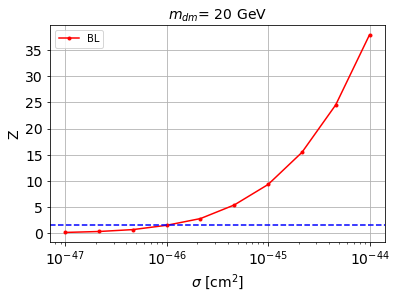


cross_BL_164:  1.0887389692744252e-46
cross_BL_164_up:  6.933001503776983e-47
cross_BL_164_down:  1.6407598654942368e-46

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shap

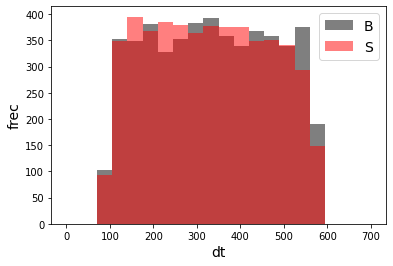

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68709	validation_1-logloss:0.68757
[1]	validation_0-logloss:0.68115	validation_1-logloss:0.68210
[2]	validation_0-logloss:0.67533	validation_1-logloss:0.67669
[3]	validation_0-logloss:0.66965	validation_1-logloss:0.67156
[4]	validation_0-logloss:0.66405	validation_1-logloss:0.66632
[5]	validation_0-logloss:0.65853	validation_1-logloss:0.66137
[6]	validation_0-logloss:0.65313	validation_1-logloss:0.65635
[7]	validation_0-logloss:0.64775	validation_1-logloss:0.65148
[8]	validation_0-logloss:0.64248	validation_1-logloss:0.64673
[9]	validation_0-logloss:0.63732	validation_1-logloss:0.64194
[10]	validation_0-logloss:0.63231	validation_1-logloss:0.63740
[11]	validation_0-logloss:0.62730	validation_1-logloss:0.63283
[12]	validation_0-logloss:0.62234	validation_1-logloss:0.62839
[13]	validation_0-logloss:0.61749	validation_1-logloss:0.62402
[14]	validation_0-logloss:0.61265	validation_1-logloss:0.61972
[15]	validation_0-logloss:0.60801	validation_1-logloss:0.61540
[1

[130]	validation_0-logloss:0.32350	validation_1-logloss:0.37329
[131]	validation_0-logloss:0.32210	validation_1-logloss:0.37239
[132]	validation_0-logloss:0.32074	validation_1-logloss:0.37144
[133]	validation_0-logloss:0.31944	validation_1-logloss:0.37033
[134]	validation_0-logloss:0.31817	validation_1-logloss:0.36928
[135]	validation_0-logloss:0.31683	validation_1-logloss:0.36827
[136]	validation_0-logloss:0.31555	validation_1-logloss:0.36724
[137]	validation_0-logloss:0.31424	validation_1-logloss:0.36627
[138]	validation_0-logloss:0.31294	validation_1-logloss:0.36533
[139]	validation_0-logloss:0.31169	validation_1-logloss:0.36444
[140]	validation_0-logloss:0.31041	validation_1-logloss:0.36331
[141]	validation_0-logloss:0.30920	validation_1-logloss:0.36238
[142]	validation_0-logloss:0.30796	validation_1-logloss:0.36137
[143]	validation_0-logloss:0.30671	validation_1-logloss:0.36044
[144]	validation_0-logloss:0.30547	validation_1-logloss:0.35962
[145]	validation_0-logloss:0.30426	valid

[259]	validation_0-logloss:0.20758	validation_1-logloss:0.29359
[260]	validation_0-logloss:0.20700	validation_1-logloss:0.29317
[261]	validation_0-logloss:0.20636	validation_1-logloss:0.29285
[262]	validation_0-logloss:0.20580	validation_1-logloss:0.29256
[263]	validation_0-logloss:0.20520	validation_1-logloss:0.29240
[264]	validation_0-logloss:0.20460	validation_1-logloss:0.29213
[265]	validation_0-logloss:0.20408	validation_1-logloss:0.29188
[266]	validation_0-logloss:0.20347	validation_1-logloss:0.29160
[267]	validation_0-logloss:0.20286	validation_1-logloss:0.29133
[268]	validation_0-logloss:0.20228	validation_1-logloss:0.29118
[269]	validation_0-logloss:0.20172	validation_1-logloss:0.29074
[270]	validation_0-logloss:0.20113	validation_1-logloss:0.29038
[271]	validation_0-logloss:0.20055	validation_1-logloss:0.29002
[272]	validation_0-logloss:0.19993	validation_1-logloss:0.28967
[273]	validation_0-logloss:0.19935	validation_1-logloss:0.28935
[274]	validation_0-logloss:0.19879	valid

[388]	validation_0-logloss:0.14691	validation_1-logloss:0.26519
[389]	validation_0-logloss:0.14657	validation_1-logloss:0.26502
[390]	validation_0-logloss:0.14618	validation_1-logloss:0.26492
[391]	validation_0-logloss:0.14577	validation_1-logloss:0.26484
[392]	validation_0-logloss:0.14543	validation_1-logloss:0.26485
[393]	validation_0-logloss:0.14510	validation_1-logloss:0.26479
[394]	validation_0-logloss:0.14472	validation_1-logloss:0.26470
[395]	validation_0-logloss:0.14439	validation_1-logloss:0.26456
[396]	validation_0-logloss:0.14405	validation_1-logloss:0.26445
[397]	validation_0-logloss:0.14369	validation_1-logloss:0.26432
[398]	validation_0-logloss:0.14336	validation_1-logloss:0.26427
[399]	validation_0-logloss:0.14298	validation_1-logloss:0.26412
[400]	validation_0-logloss:0.14262	validation_1-logloss:0.26398
[401]	validation_0-logloss:0.14229	validation_1-logloss:0.26391
[402]	validation_0-logloss:0.14199	validation_1-logloss:0.26372
[403]	validation_0-logloss:0.14166	valid

[517]	validation_0-logloss:0.10961	validation_1-logloss:0.25359
[518]	validation_0-logloss:0.10937	validation_1-logloss:0.25354
[519]	validation_0-logloss:0.10913	validation_1-logloss:0.25348
[520]	validation_0-logloss:0.10889	validation_1-logloss:0.25341
[521]	validation_0-logloss:0.10867	validation_1-logloss:0.25324
[522]	validation_0-logloss:0.10845	validation_1-logloss:0.25315
[523]	validation_0-logloss:0.10822	validation_1-logloss:0.25301
[524]	validation_0-logloss:0.10802	validation_1-logloss:0.25303
[525]	validation_0-logloss:0.10782	validation_1-logloss:0.25288
[526]	validation_0-logloss:0.10758	validation_1-logloss:0.25282
[527]	validation_0-logloss:0.10738	validation_1-logloss:0.25274
[528]	validation_0-logloss:0.10716	validation_1-logloss:0.25272
[529]	validation_0-logloss:0.10698	validation_1-logloss:0.25270
[530]	validation_0-logloss:0.10676	validation_1-logloss:0.25263
[531]	validation_0-logloss:0.10654	validation_1-logloss:0.25257
[532]	validation_0-logloss:0.10631	valid

[646]	validation_0-logloss:0.08437	validation_1-logloss:0.24642
[647]	validation_0-logloss:0.08423	validation_1-logloss:0.24637
[648]	validation_0-logloss:0.08406	validation_1-logloss:0.24629
[649]	validation_0-logloss:0.08392	validation_1-logloss:0.24626
[650]	validation_0-logloss:0.08373	validation_1-logloss:0.24618
[651]	validation_0-logloss:0.08360	validation_1-logloss:0.24612
[652]	validation_0-logloss:0.08343	validation_1-logloss:0.24616
[653]	validation_0-logloss:0.08326	validation_1-logloss:0.24611
[654]	validation_0-logloss:0.08309	validation_1-logloss:0.24604
[655]	validation_0-logloss:0.08295	validation_1-logloss:0.24596
[656]	validation_0-logloss:0.08278	validation_1-logloss:0.24594
[657]	validation_0-logloss:0.08262	validation_1-logloss:0.24591
[658]	validation_0-logloss:0.08244	validation_1-logloss:0.24592
[659]	validation_0-logloss:0.08231	validation_1-logloss:0.24589
[660]	validation_0-logloss:0.08210	validation_1-logloss:0.24584
[661]	validation_0-logloss:0.08193	valid

[775]	validation_0-logloss:0.06605	validation_1-logloss:0.24271
[776]	validation_0-logloss:0.06592	validation_1-logloss:0.24273
[777]	validation_0-logloss:0.06580	validation_1-logloss:0.24267
[778]	validation_0-logloss:0.06570	validation_1-logloss:0.24272
[779]	validation_0-logloss:0.06558	validation_1-logloss:0.24267
[780]	validation_0-logloss:0.06546	validation_1-logloss:0.24262
[781]	validation_0-logloss:0.06533	validation_1-logloss:0.24257
[782]	validation_0-logloss:0.06524	validation_1-logloss:0.24254
[783]	validation_0-logloss:0.06511	validation_1-logloss:0.24249
[784]	validation_0-logloss:0.06498	validation_1-logloss:0.24240
[785]	validation_0-logloss:0.06484	validation_1-logloss:0.24238
[786]	validation_0-logloss:0.06471	validation_1-logloss:0.24236
[787]	validation_0-logloss:0.06458	validation_1-logloss:0.24236
[788]	validation_0-logloss:0.06444	validation_1-logloss:0.24233
[789]	validation_0-logloss:0.06431	validation_1-logloss:0.24233
[790]	validation_0-logloss:0.06417	valid

[904]	validation_0-logloss:0.05276	validation_1-logloss:0.24139
[905]	validation_0-logloss:0.05266	validation_1-logloss:0.24140
[906]	validation_0-logloss:0.05256	validation_1-logloss:0.24140
[907]	validation_0-logloss:0.05245	validation_1-logloss:0.24140
[908]	validation_0-logloss:0.05235	validation_1-logloss:0.24139
[909]	validation_0-logloss:0.05228	validation_1-logloss:0.24134
[910]	validation_0-logloss:0.05218	validation_1-logloss:0.24131
[911]	validation_0-logloss:0.05209	validation_1-logloss:0.24129
[912]	validation_0-logloss:0.05199	validation_1-logloss:0.24128
[913]	validation_0-logloss:0.05189	validation_1-logloss:0.24126
[914]	validation_0-logloss:0.05181	validation_1-logloss:0.24123
[915]	validation_0-logloss:0.05172	validation_1-logloss:0.24127
[916]	validation_0-logloss:0.05161	validation_1-logloss:0.24130
[917]	validation_0-logloss:0.05154	validation_1-logloss:0.24129
[918]	validation_0-logloss:0.05145	validation_1-logloss:0.24132
[919]	validation_0-logloss:0.05136	valid

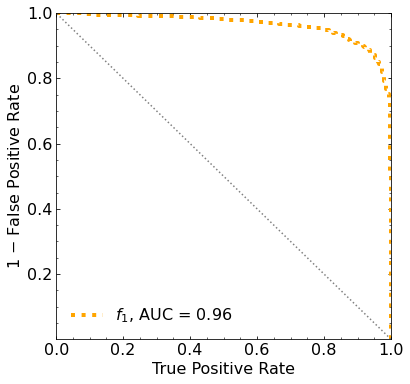

Classification score:


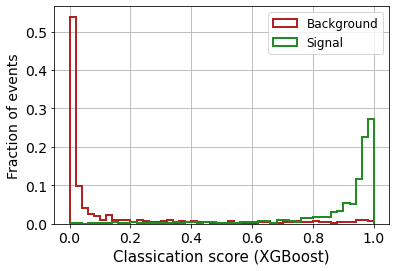


 ROC-AUC =  0.9640989592936309
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


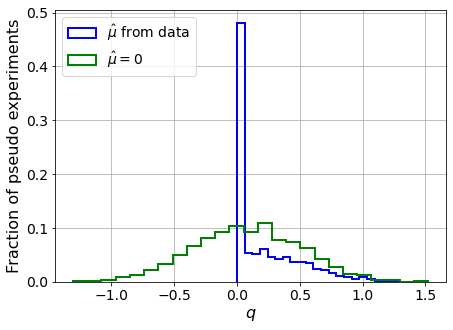

muhat mean:  0.04596400192269063
Z_bins:  0.2891883423170212
std Z_bins:  0.4787584889228623
Z_bins mu=0:  0.2890409064370223
std Z_bins mu=0:  0.7440834146912809

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


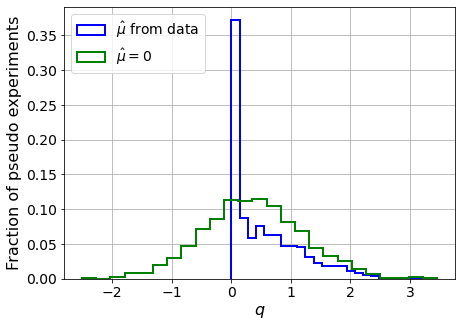

muhat mean:  -0.03617365532312628
Z_bins:  0.5937766625120406
std Z_bins:  0.5117193229062323
Z_bins mu=0:  0.593770709725359
std Z_bins mu=0:  0.7038753795249848

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


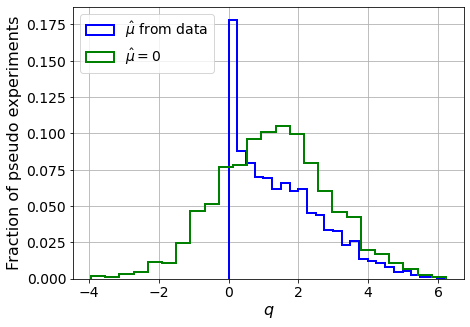

muhat mean:  -0.005659161008278387
Z_bins:  1.1418497939435683
std Z_bins:  0.5515215231776209
Z_bins mu=0:  1.1418497939435683
std Z_bins mu=0:  0.6919505843206863

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


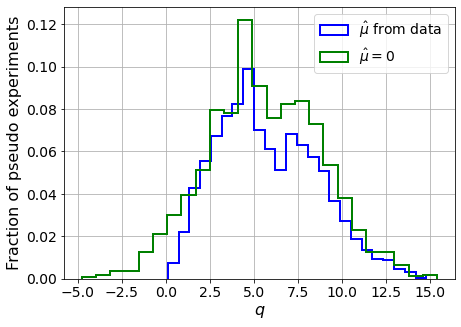

muhat mean:  0.0025738260362886804
Z_bins:  2.3266523114021815
std Z_bins:  0.6138799271664542
Z_bins mu=0:  2.326430943437037
std Z_bins mu=0:  0.6903549695512687

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.006


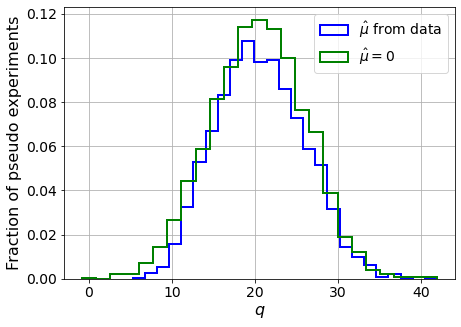

muhat mean:  0.005118083607797137
Z_bins:  4.522527208591845
std Z_bins:  0.5880703689260026
Z_bins mu=0:  4.522024502601784
std Z_bins mu=0:  0.6301474536652221

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


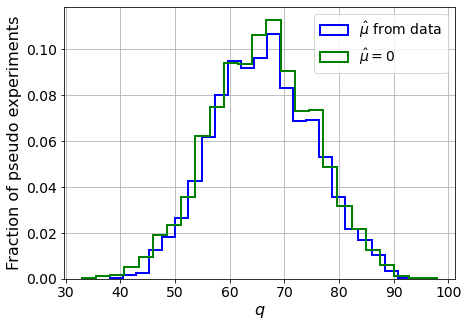

muhat mean:  -3.1807493904795964e-05
Z_bins:  8.12799223031613
std Z_bins:  0.5607481601391371
Z_bins mu=0:  8.127582520142152
std Z_bins mu=0:  0.5835017379268037

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


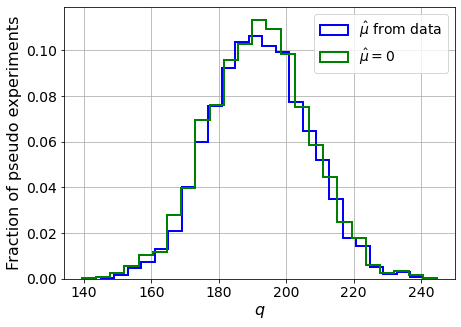

muhat mean:  0.0012183481668609746
Z_bins:  13.85602001941335
std Z_bins:  0.5230151740088635
Z_bins mu=0:  13.855875724843084
std Z_bins mu=0:  0.5371344715088664

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


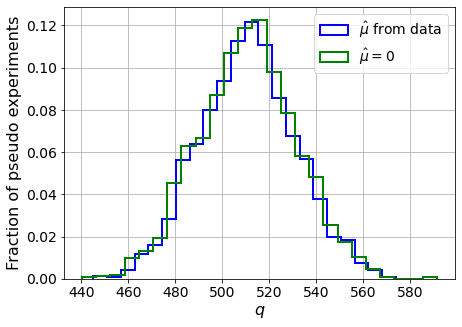

muhat mean:  0.00018574311678381335
Z_bins:  22.61354327386398
std Z_bins:  0.45461015136774313
Z_bins mu=0:  22.612345430321813
std Z_bins mu=0:  0.46248036447084157

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


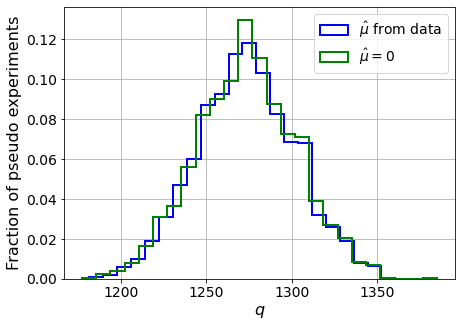

muhat mean:  -0.00010752679629212835
Z_bins:  35.67731998561369
std Z_bins:  0.4065899429693034
Z_bins mu=0:  35.67724194584727
std Z_bins mu=0:  0.4114720168007448

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


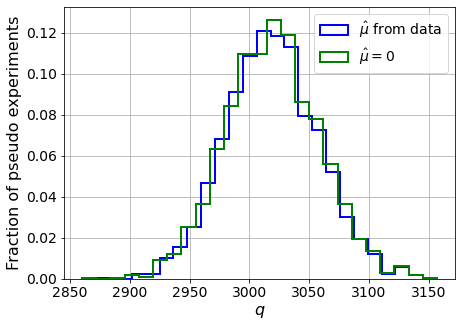

muhat mean:  2.0844430060090945e-05
Z_bins:  54.94489075125111
std Z_bins:  0.3550542758540252
Z_bins mu=0:  54.94489075125111
std Z_bins mu=0:  0.35805135555541107

--------


 FINAL RESULT:

[[0.2891883423170212, 0.4787584889228623, 0.04596400192269063, 0.2890409064370223, 0.7440834146912809], [0.5937766625120406, 0.5117193229062323, -0.03617365532312628, 0.593770709725359, 0.7038753795249848], [1.1418497939435683, 0.5515215231776209, -0.005659161008278387, 1.1418497939435683, 0.6919505843206863], [2.3266523114021815, 0.6138799271664542, 0.0025738260362886804, 2.326430943437037, 0.6903549695512687], [4.522527208591845, 0.5880703689260026, 0.005118083607797137, 4.522024502601784, 0.6301474536652221], [8.12799223031613, 0.5607481601391371, -3.1807493904795964e-05, 8.127582520142152, 0.5835017379268037], [13.85602001941335, 0.5230151740088635, 0.0012183481668609746, 13.855875724843084, 0.5371344715088664], [22.61354327386398, 0.45461015136774313, 0.00018574311678381335, 22.6123454303218

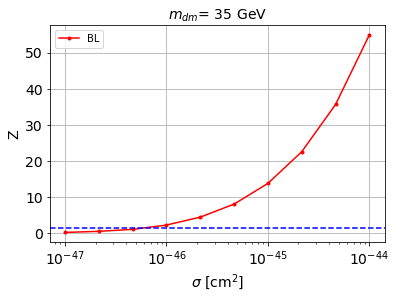


cross_BL_164:  6.857193658447777e-47
cross_BL_164_up:  4.423695125300659e-47
cross_BL_164_down:  9.656884675973807e-47

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:

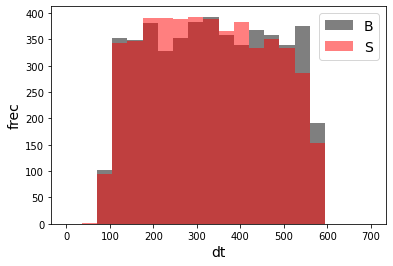

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68756	validation_1-logloss:0.68827
[1]	validation_0-logloss:0.68205	validation_1-logloss:0.68340
[2]	validation_0-logloss:0.67666	validation_1-logloss:0.67858
[3]	validation_0-logloss:0.67136	validation_1-logloss:0.67389
[4]	validation_0-logloss:0.66616	validation_1-logloss:0.66943
[5]	validation_0-logloss:0.66106	validation_1-logloss:0.66492
[6]	validation_0-logloss:0.65608	validation_1-logloss:0.66043
[7]	validation_0-logloss:0.65117	validation_1-logloss:0.65621
[8]	validation_0-logloss:0.64636	validation_1-logloss:0.65195
[9]	validation_0-logloss:0.64161	validation_1-logloss:0.64773
[10]	validation_0-logloss:0.63694	validation_1-logloss:0.64376
[11]	validation_0-logloss:0.63237	validation_1-logloss:0.63969
[12]	validation_0-logloss:0.62786	validation_1-logloss:0.63577
[13]	validation_0-logloss:0.62345	validation_1-logloss:0.63174
[14]	validation_0-logloss:0.61910	validation_1-logloss:0.62796
[15]	validation_0-logloss:0.61479	validation_1-logloss:0.62423
[1

[130]	validation_0-logloss:0.35243	validation_1-logloss:0.41050
[131]	validation_0-logloss:0.35119	validation_1-logloss:0.40964
[132]	validation_0-logloss:0.34998	validation_1-logloss:0.40883
[133]	validation_0-logloss:0.34874	validation_1-logloss:0.40790
[134]	validation_0-logloss:0.34762	validation_1-logloss:0.40715
[135]	validation_0-logloss:0.34648	validation_1-logloss:0.40623
[136]	validation_0-logloss:0.34529	validation_1-logloss:0.40530
[137]	validation_0-logloss:0.34413	validation_1-logloss:0.40459
[138]	validation_0-logloss:0.34304	validation_1-logloss:0.40376
[139]	validation_0-logloss:0.34186	validation_1-logloss:0.40294
[140]	validation_0-logloss:0.34074	validation_1-logloss:0.40197
[141]	validation_0-logloss:0.33963	validation_1-logloss:0.40116
[142]	validation_0-logloss:0.33847	validation_1-logloss:0.40047
[143]	validation_0-logloss:0.33736	validation_1-logloss:0.39975
[144]	validation_0-logloss:0.33626	validation_1-logloss:0.39896
[145]	validation_0-logloss:0.33520	valid

[259]	validation_0-logloss:0.24195	validation_1-logloss:0.34026
[260]	validation_0-logloss:0.24131	validation_1-logloss:0.33996
[261]	validation_0-logloss:0.24071	validation_1-logloss:0.33960
[262]	validation_0-logloss:0.24014	validation_1-logloss:0.33933
[263]	validation_0-logloss:0.23951	validation_1-logloss:0.33898
[264]	validation_0-logloss:0.23896	validation_1-logloss:0.33871
[265]	validation_0-logloss:0.23835	validation_1-logloss:0.33837
[266]	validation_0-logloss:0.23777	validation_1-logloss:0.33801
[267]	validation_0-logloss:0.23713	validation_1-logloss:0.33772
[268]	validation_0-logloss:0.23653	validation_1-logloss:0.33739
[269]	validation_0-logloss:0.23594	validation_1-logloss:0.33711
[270]	validation_0-logloss:0.23534	validation_1-logloss:0.33665
[271]	validation_0-logloss:0.23475	validation_1-logloss:0.33637
[272]	validation_0-logloss:0.23411	validation_1-logloss:0.33607
[273]	validation_0-logloss:0.23357	validation_1-logloss:0.33583
[274]	validation_0-logloss:0.23300	valid

[388]	validation_0-logloss:0.18024	validation_1-logloss:0.31305
[389]	validation_0-logloss:0.17983	validation_1-logloss:0.31295
[390]	validation_0-logloss:0.17942	validation_1-logloss:0.31288
[391]	validation_0-logloss:0.17902	validation_1-logloss:0.31275
[392]	validation_0-logloss:0.17863	validation_1-logloss:0.31254
[393]	validation_0-logloss:0.17825	validation_1-logloss:0.31239
[394]	validation_0-logloss:0.17797	validation_1-logloss:0.31222
[395]	validation_0-logloss:0.17764	validation_1-logloss:0.31211
[396]	validation_0-logloss:0.17725	validation_1-logloss:0.31189
[397]	validation_0-logloss:0.17693	validation_1-logloss:0.31177
[398]	validation_0-logloss:0.17655	validation_1-logloss:0.31161
[399]	validation_0-logloss:0.17619	validation_1-logloss:0.31151
[400]	validation_0-logloss:0.17581	validation_1-logloss:0.31139
[401]	validation_0-logloss:0.17556	validation_1-logloss:0.31126
[402]	validation_0-logloss:0.17520	validation_1-logloss:0.31108
[403]	validation_0-logloss:0.17485	valid

[517]	validation_0-logloss:0.14014	validation_1-logloss:0.29851
[518]	validation_0-logloss:0.13990	validation_1-logloss:0.29847
[519]	validation_0-logloss:0.13961	validation_1-logloss:0.29838
[520]	validation_0-logloss:0.13938	validation_1-logloss:0.29831
[521]	validation_0-logloss:0.13920	validation_1-logloss:0.29824
[522]	validation_0-logloss:0.13893	validation_1-logloss:0.29812
[523]	validation_0-logloss:0.13867	validation_1-logloss:0.29811
[524]	validation_0-logloss:0.13840	validation_1-logloss:0.29799
[525]	validation_0-logloss:0.13809	validation_1-logloss:0.29790
[526]	validation_0-logloss:0.13790	validation_1-logloss:0.29782
[527]	validation_0-logloss:0.13764	validation_1-logloss:0.29775
[528]	validation_0-logloss:0.13736	validation_1-logloss:0.29765
[529]	validation_0-logloss:0.13710	validation_1-logloss:0.29751
[530]	validation_0-logloss:0.13682	validation_1-logloss:0.29744
[531]	validation_0-logloss:0.13654	validation_1-logloss:0.29738
[532]	validation_0-logloss:0.13624	valid

[646]	validation_0-logloss:0.11141	validation_1-logloss:0.29150
[647]	validation_0-logloss:0.11121	validation_1-logloss:0.29149
[648]	validation_0-logloss:0.11105	validation_1-logloss:0.29153
[649]	validation_0-logloss:0.11090	validation_1-logloss:0.29146
[650]	validation_0-logloss:0.11072	validation_1-logloss:0.29147
[651]	validation_0-logloss:0.11056	validation_1-logloss:0.29146
[652]	validation_0-logloss:0.11043	validation_1-logloss:0.29142
[653]	validation_0-logloss:0.11022	validation_1-logloss:0.29136
[654]	validation_0-logloss:0.11006	validation_1-logloss:0.29130
[655]	validation_0-logloss:0.10987	validation_1-logloss:0.29124
[656]	validation_0-logloss:0.10970	validation_1-logloss:0.29119
[657]	validation_0-logloss:0.10951	validation_1-logloss:0.29121
[658]	validation_0-logloss:0.10930	validation_1-logloss:0.29109
[659]	validation_0-logloss:0.10908	validation_1-logloss:0.29115
[660]	validation_0-logloss:0.10891	validation_1-logloss:0.29119
[661]	validation_0-logloss:0.10873	valid

[775]	validation_0-logloss:0.09050	validation_1-logloss:0.28820
[776]	validation_0-logloss:0.09036	validation_1-logloss:0.28817
[777]	validation_0-logloss:0.09021	validation_1-logloss:0.28819
[778]	validation_0-logloss:0.09006	validation_1-logloss:0.28811
[779]	validation_0-logloss:0.08991	validation_1-logloss:0.28807
[780]	validation_0-logloss:0.08980	validation_1-logloss:0.28812
[781]	validation_0-logloss:0.08967	validation_1-logloss:0.28814
[782]	validation_0-logloss:0.08948	validation_1-logloss:0.28816
[783]	validation_0-logloss:0.08934	validation_1-logloss:0.28819
[784]	validation_0-logloss:0.08920	validation_1-logloss:0.28820
[785]	validation_0-logloss:0.08911	validation_1-logloss:0.28815
[786]	validation_0-logloss:0.08898	validation_1-logloss:0.28812
[787]	validation_0-logloss:0.08885	validation_1-logloss:0.28809
[788]	validation_0-logloss:0.08871	validation_1-logloss:0.28805
[789]	validation_0-logloss:0.08860	validation_1-logloss:0.28804
[790]	validation_0-logloss:0.08850	valid

[904]	validation_0-logloss:0.07428	validation_1-logloss:0.28593
[905]	validation_0-logloss:0.07417	validation_1-logloss:0.28588
[906]	validation_0-logloss:0.07407	validation_1-logloss:0.28580
[907]	validation_0-logloss:0.07396	validation_1-logloss:0.28581
[908]	validation_0-logloss:0.07382	validation_1-logloss:0.28574
[909]	validation_0-logloss:0.07373	validation_1-logloss:0.28576
[910]	validation_0-logloss:0.07364	validation_1-logloss:0.28574
[911]	validation_0-logloss:0.07354	validation_1-logloss:0.28562
[912]	validation_0-logloss:0.07341	validation_1-logloss:0.28564
[913]	validation_0-logloss:0.07328	validation_1-logloss:0.28566
[914]	validation_0-logloss:0.07319	validation_1-logloss:0.28563
[915]	validation_0-logloss:0.07307	validation_1-logloss:0.28567
[916]	validation_0-logloss:0.07296	validation_1-logloss:0.28563
[917]	validation_0-logloss:0.07288	validation_1-logloss:0.28565
[918]	validation_0-logloss:0.07277	validation_1-logloss:0.28561
[919]	validation_0-logloss:0.07264	valid

[1032]	validation_0-logloss:0.06145	validation_1-logloss:0.28388
[1033]	validation_0-logloss:0.06135	validation_1-logloss:0.28390
[1034]	validation_0-logloss:0.06124	validation_1-logloss:0.28402
[1035]	validation_0-logloss:0.06116	validation_1-logloss:0.28401
[1036]	validation_0-logloss:0.06108	validation_1-logloss:0.28401
[1037]	validation_0-logloss:0.06101	validation_1-logloss:0.28400
[1038]	validation_0-logloss:0.06089	validation_1-logloss:0.28401
[1039]	validation_0-logloss:0.06081	validation_1-logloss:0.28399
[1040]	validation_0-logloss:0.06073	validation_1-logloss:0.28402
[1041]	validation_0-logloss:0.06062	validation_1-logloss:0.28400
[1042]	validation_0-logloss:0.06051	validation_1-logloss:0.28404
[1043]	validation_0-logloss:0.06044	validation_1-logloss:0.28398
[1044]	validation_0-logloss:0.06036	validation_1-logloss:0.28400
[1045]	validation_0-logloss:0.06026	validation_1-logloss:0.28397
[1046]	validation_0-logloss:0.06020	validation_1-logloss:0.28395
[1047]	validation_0-loglo

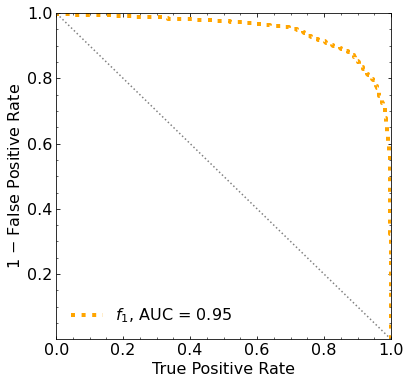

Classification score:


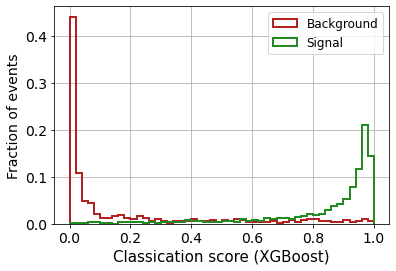


 ROC-AUC =  0.9453853225575153
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


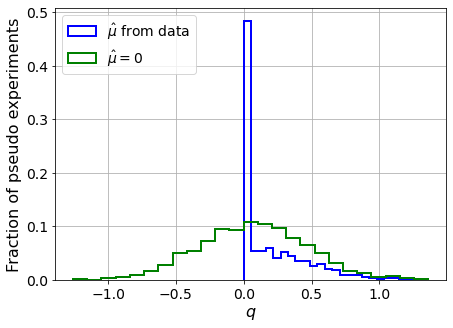

muhat mean:  -0.007745229174998932
Z_bins:  0.26280034852914286
std Z_bins:  0.4831518679109682
Z_bins mu=0:  0.26277547958022734
std Z_bins mu=0:  0.7451854424224824

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


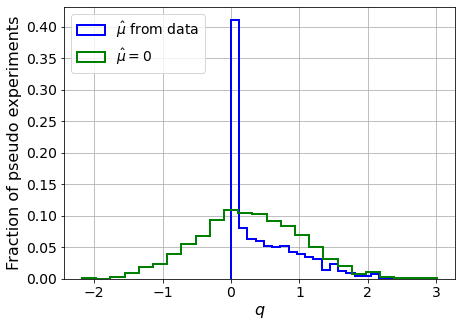

muhat mean:  0.0005700647333615301
Z_bins:  0.5110189296742305
std Z_bins:  0.5239585836780194
Z_bins mu=0:  0.510778970823068
std Z_bins mu=0:  0.7441349763615895

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


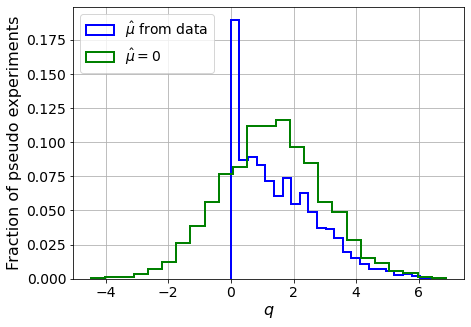

muhat mean:  -0.006729083948854831
Z_bins:  1.1362940350351012
std Z_bins:  0.5629424675247959
Z_bins mu=0:  1.1362879861128345
std Z_bins mu=0:  0.7029055847040484

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


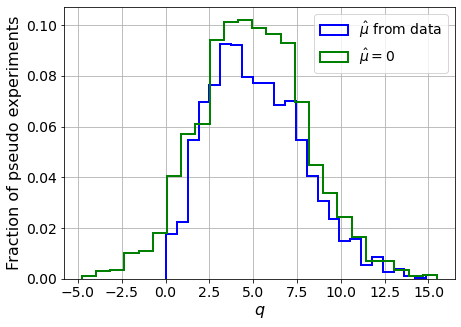

muhat mean:  0.006536817208981374
Z_bins:  2.2213838436648063
std Z_bins:  0.6066686388489599
Z_bins mu=0:  2.221254278691636
std Z_bins mu=0:  0.6871109376250121

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


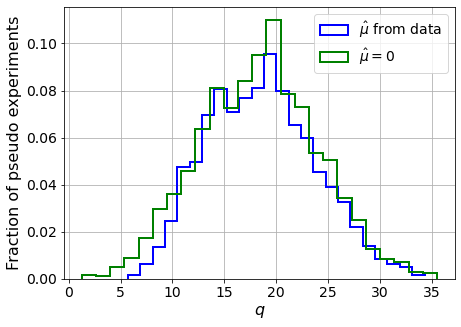

muhat mean:  0.010410165085233031
Z_bins:  4.305220870522058
std Z_bins:  0.6117931607188123
Z_bins mu=0:  4.304641112556592
std Z_bins mu=0:  0.6585627811221839

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


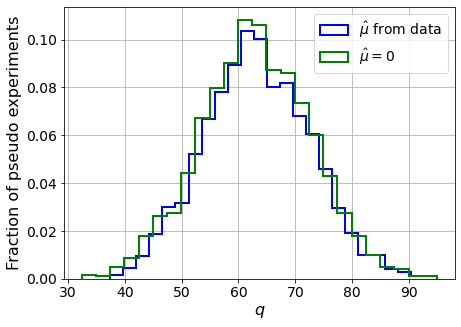

muhat mean:  -0.0002822410839470731
Z_bins:  7.933679457354896
std Z_bins:  0.5834388510167513
Z_bins mu=0:  7.933679457354896
std Z_bins mu=0:  0.6071998402822786

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


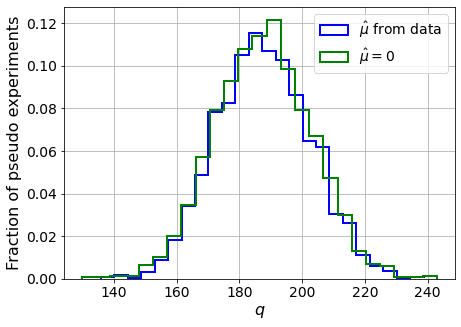

muhat mean:  0.0005689429969457553
Z_bins:  13.687707181556968
std Z_bins:  0.5478385508391236
Z_bins mu=0:  13.686042325022916
std Z_bins mu=0:  0.5626487166946903

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


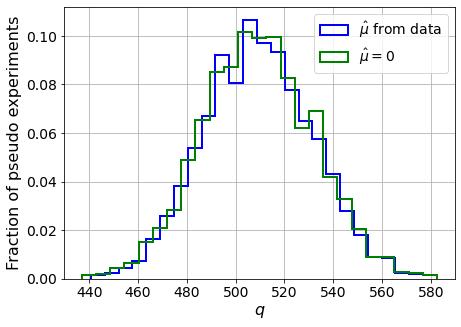

muhat mean:  0.00014050866362520364
Z_bins:  22.561319113908525
std Z_bins:  0.49694248095231275
Z_bins mu=0:  22.560942355817602
std Z_bins mu=0:  0.5048155726429696

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


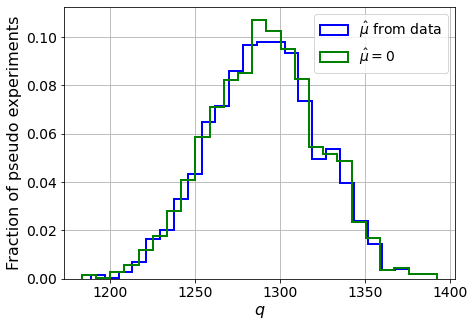

muhat mean:  -3.23285871869434e-05
Z_bins:  35.93302048020892
std Z_bins:  0.44673882898941975
Z_bins mu=0:  35.93302048020892
std Z_bins mu=0:  0.451639117286631

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


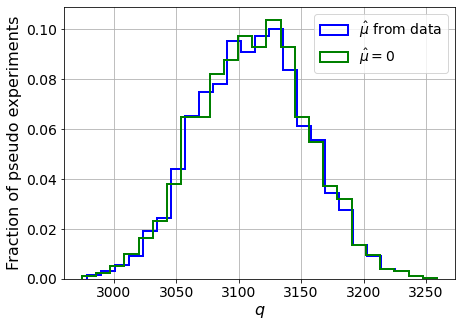

muhat mean:  -4.641717748512773e-05
Z_bins:  55.7850723760597
std Z_bins:  0.39055848714892644
Z_bins mu=0:  55.78495621974495
std Z_bins mu=0:  0.3934969310463771

--------


 FINAL RESULT:

[[0.26280034852914286, 0.4831518679109682, -0.007745229174998932, 0.26277547958022734, 0.7451854424224824], [0.5110189296742305, 0.5239585836780194, 0.0005700647333615301, 0.510778970823068, 0.7441349763615895], [1.1362940350351012, 0.5629424675247959, -0.006729083948854831, 1.1362879861128345, 0.7029055847040484], [2.2213838436648063, 0.6066686388489599, 0.006536817208981374, 2.221254278691636, 0.6871109376250121], [4.305220870522058, 0.6117931607188123, 0.010410165085233031, 4.304641112556592, 0.6585627811221839], [7.933679457354896, 0.5834388510167513, -0.0002822410839470731, 7.933679457354896, 0.6071998402822786], [13.687707181556968, 0.5478385508391236, 0.0005689429969457553, 13.686042325022916, 0.5626487166946903], [22.561319113908525, 0.49694248095231275, 0.00014050866362520364, 22.56094235

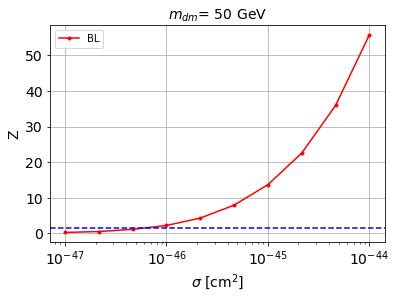


cross_BL_164:  7.061840630476009e-47
cross_BL_164_up:  4.398656706593474e-47
cross_BL_164_down:  1.0130850569727353e-46

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shap

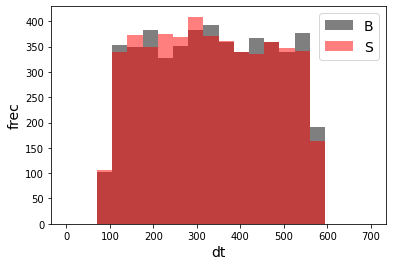

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68817	validation_1-logloss:0.68915
[1]	validation_0-logloss:0.68328	validation_1-logloss:0.68519
[2]	validation_0-logloss:0.67847	validation_1-logloss:0.68119
[3]	validation_0-logloss:0.67377	validation_1-logloss:0.67732
[4]	validation_0-logloss:0.66910	validation_1-logloss:0.67329
[5]	validation_0-logloss:0.66455	validation_1-logloss:0.66957
[6]	validation_0-logloss:0.66008	validation_1-logloss:0.66588
[7]	validation_0-logloss:0.65568	validation_1-logloss:0.66229
[8]	validation_0-logloss:0.65135	validation_1-logloss:0.65871
[9]	validation_0-logloss:0.64706	validation_1-logloss:0.65511
[10]	validation_0-logloss:0.64288	validation_1-logloss:0.65159
[11]	validation_0-logloss:0.63875	validation_1-logloss:0.64813
[12]	validation_0-logloss:0.63470	validation_1-logloss:0.64482
[13]	validation_0-logloss:0.63071	validation_1-logloss:0.64155
[14]	validation_0-logloss:0.62670	validation_1-logloss:0.63822
[15]	validation_0-logloss:0.62285	validation_1-logloss:0.63497
[1

[130]	validation_0-logloss:0.38235	validation_1-logloss:0.44929
[131]	validation_0-logloss:0.38122	validation_1-logloss:0.44856
[132]	validation_0-logloss:0.38011	validation_1-logloss:0.44785
[133]	validation_0-logloss:0.37890	validation_1-logloss:0.44710
[134]	validation_0-logloss:0.37782	validation_1-logloss:0.44645
[135]	validation_0-logloss:0.37670	validation_1-logloss:0.44555
[136]	validation_0-logloss:0.37557	validation_1-logloss:0.44487
[137]	validation_0-logloss:0.37445	validation_1-logloss:0.44422
[138]	validation_0-logloss:0.37339	validation_1-logloss:0.44356
[139]	validation_0-logloss:0.37228	validation_1-logloss:0.44285
[140]	validation_0-logloss:0.37118	validation_1-logloss:0.44224
[141]	validation_0-logloss:0.37012	validation_1-logloss:0.44152
[142]	validation_0-logloss:0.36905	validation_1-logloss:0.44095
[143]	validation_0-logloss:0.36800	validation_1-logloss:0.44024
[144]	validation_0-logloss:0.36688	validation_1-logloss:0.43950
[145]	validation_0-logloss:0.36586	valid

[259]	validation_0-logloss:0.27440	validation_1-logloss:0.38756
[260]	validation_0-logloss:0.27373	validation_1-logloss:0.38729
[261]	validation_0-logloss:0.27313	validation_1-logloss:0.38705
[262]	validation_0-logloss:0.27251	validation_1-logloss:0.38681
[263]	validation_0-logloss:0.27194	validation_1-logloss:0.38655
[264]	validation_0-logloss:0.27133	validation_1-logloss:0.38615
[265]	validation_0-logloss:0.27077	validation_1-logloss:0.38584
[266]	validation_0-logloss:0.27015	validation_1-logloss:0.38563
[267]	validation_0-logloss:0.26955	validation_1-logloss:0.38536
[268]	validation_0-logloss:0.26895	validation_1-logloss:0.38495
[269]	validation_0-logloss:0.26837	validation_1-logloss:0.38464
[270]	validation_0-logloss:0.26776	validation_1-logloss:0.38427
[271]	validation_0-logloss:0.26721	validation_1-logloss:0.38396
[272]	validation_0-logloss:0.26662	validation_1-logloss:0.38381
[273]	validation_0-logloss:0.26610	validation_1-logloss:0.38359
[274]	validation_0-logloss:0.26553	valid

[388]	validation_0-logloss:0.21143	validation_1-logloss:0.36068
[389]	validation_0-logloss:0.21099	validation_1-logloss:0.36051
[390]	validation_0-logloss:0.21061	validation_1-logloss:0.36041
[391]	validation_0-logloss:0.21022	validation_1-logloss:0.36022
[392]	validation_0-logloss:0.20991	validation_1-logloss:0.36008
[393]	validation_0-logloss:0.20951	validation_1-logloss:0.35996
[394]	validation_0-logloss:0.20913	validation_1-logloss:0.35979
[395]	validation_0-logloss:0.20875	validation_1-logloss:0.35959
[396]	validation_0-logloss:0.20832	validation_1-logloss:0.35942
[397]	validation_0-logloss:0.20798	validation_1-logloss:0.35925
[398]	validation_0-logloss:0.20755	validation_1-logloss:0.35909
[399]	validation_0-logloss:0.20717	validation_1-logloss:0.35893
[400]	validation_0-logloss:0.20679	validation_1-logloss:0.35879
[401]	validation_0-logloss:0.20633	validation_1-logloss:0.35856
[402]	validation_0-logloss:0.20594	validation_1-logloss:0.35836
[403]	validation_0-logloss:0.20552	valid

[517]	validation_0-logloss:0.16711	validation_1-logloss:0.34248
[518]	validation_0-logloss:0.16682	validation_1-logloss:0.34237
[519]	validation_0-logloss:0.16650	validation_1-logloss:0.34226
[520]	validation_0-logloss:0.16618	validation_1-logloss:0.34209
[521]	validation_0-logloss:0.16586	validation_1-logloss:0.34200
[522]	validation_0-logloss:0.16557	validation_1-logloss:0.34189
[523]	validation_0-logloss:0.16528	validation_1-logloss:0.34183
[524]	validation_0-logloss:0.16499	validation_1-logloss:0.34170
[525]	validation_0-logloss:0.16474	validation_1-logloss:0.34159
[526]	validation_0-logloss:0.16441	validation_1-logloss:0.34154
[527]	validation_0-logloss:0.16413	validation_1-logloss:0.34141
[528]	validation_0-logloss:0.16389	validation_1-logloss:0.34133
[529]	validation_0-logloss:0.16357	validation_1-logloss:0.34121
[530]	validation_0-logloss:0.16326	validation_1-logloss:0.34114
[531]	validation_0-logloss:0.16301	validation_1-logloss:0.34105
[532]	validation_0-logloss:0.16269	valid

[646]	validation_0-logloss:0.13398	validation_1-logloss:0.33059
[647]	validation_0-logloss:0.13374	validation_1-logloss:0.33054
[648]	validation_0-logloss:0.13353	validation_1-logloss:0.33053
[649]	validation_0-logloss:0.13329	validation_1-logloss:0.33043
[650]	validation_0-logloss:0.13306	validation_1-logloss:0.33040
[651]	validation_0-logloss:0.13283	validation_1-logloss:0.33033
[652]	validation_0-logloss:0.13265	validation_1-logloss:0.33026
[653]	validation_0-logloss:0.13244	validation_1-logloss:0.33021
[654]	validation_0-logloss:0.13220	validation_1-logloss:0.33013
[655]	validation_0-logloss:0.13198	validation_1-logloss:0.33002
[656]	validation_0-logloss:0.13181	validation_1-logloss:0.32993
[657]	validation_0-logloss:0.13156	validation_1-logloss:0.32980
[658]	validation_0-logloss:0.13134	validation_1-logloss:0.32971
[659]	validation_0-logloss:0.13111	validation_1-logloss:0.32970
[660]	validation_0-logloss:0.13088	validation_1-logloss:0.32966
[661]	validation_0-logloss:0.13066	valid

[775]	validation_0-logloss:0.10920	validation_1-logloss:0.32309
[776]	validation_0-logloss:0.10902	validation_1-logloss:0.32300
[777]	validation_0-logloss:0.10885	validation_1-logloss:0.32299
[778]	validation_0-logloss:0.10867	validation_1-logloss:0.32290
[779]	validation_0-logloss:0.10849	validation_1-logloss:0.32288
[780]	validation_0-logloss:0.10829	validation_1-logloss:0.32278
[781]	validation_0-logloss:0.10815	validation_1-logloss:0.32271
[782]	validation_0-logloss:0.10795	validation_1-logloss:0.32257
[783]	validation_0-logloss:0.10778	validation_1-logloss:0.32251
[784]	validation_0-logloss:0.10758	validation_1-logloss:0.32245
[785]	validation_0-logloss:0.10742	validation_1-logloss:0.32241
[786]	validation_0-logloss:0.10731	validation_1-logloss:0.32237
[787]	validation_0-logloss:0.10717	validation_1-logloss:0.32234
[788]	validation_0-logloss:0.10700	validation_1-logloss:0.32230
[789]	validation_0-logloss:0.10683	validation_1-logloss:0.32215
[790]	validation_0-logloss:0.10668	valid

[904]	validation_0-logloss:0.09010	validation_1-logloss:0.31748
[905]	validation_0-logloss:0.08996	validation_1-logloss:0.31745
[906]	validation_0-logloss:0.08984	validation_1-logloss:0.31744
[907]	validation_0-logloss:0.08970	validation_1-logloss:0.31743
[908]	validation_0-logloss:0.08955	validation_1-logloss:0.31738
[909]	validation_0-logloss:0.08941	validation_1-logloss:0.31740
[910]	validation_0-logloss:0.08930	validation_1-logloss:0.31736
[911]	validation_0-logloss:0.08919	validation_1-logloss:0.31735
[912]	validation_0-logloss:0.08905	validation_1-logloss:0.31728
[913]	validation_0-logloss:0.08895	validation_1-logloss:0.31728
[914]	validation_0-logloss:0.08883	validation_1-logloss:0.31729
[915]	validation_0-logloss:0.08874	validation_1-logloss:0.31724
[916]	validation_0-logloss:0.08861	validation_1-logloss:0.31726
[917]	validation_0-logloss:0.08848	validation_1-logloss:0.31732
[918]	validation_0-logloss:0.08839	validation_1-logloss:0.31731
[919]	validation_0-logloss:0.08828	valid

[1032]	validation_0-logloss:0.07564	validation_1-logloss:0.31391
[1033]	validation_0-logloss:0.07552	validation_1-logloss:0.31387
[1034]	validation_0-logloss:0.07543	validation_1-logloss:0.31386
[1035]	validation_0-logloss:0.07535	validation_1-logloss:0.31380
[1036]	validation_0-logloss:0.07524	validation_1-logloss:0.31380
[1037]	validation_0-logloss:0.07514	validation_1-logloss:0.31381
[1038]	validation_0-logloss:0.07505	validation_1-logloss:0.31389
[1039]	validation_0-logloss:0.07495	validation_1-logloss:0.31386
[1040]	validation_0-logloss:0.07484	validation_1-logloss:0.31378
[1041]	validation_0-logloss:0.07478	validation_1-logloss:0.31373
[1042]	validation_0-logloss:0.07467	validation_1-logloss:0.31366
[1043]	validation_0-logloss:0.07456	validation_1-logloss:0.31365
[1044]	validation_0-logloss:0.07444	validation_1-logloss:0.31361
[1045]	validation_0-logloss:0.07433	validation_1-logloss:0.31359
[1046]	validation_0-logloss:0.07421	validation_1-logloss:0.31357
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06392	validation_1-logloss:0.31150
[1160]	validation_0-logloss:0.06385	validation_1-logloss:0.31143
[1161]	validation_0-logloss:0.06375	validation_1-logloss:0.31142
[1162]	validation_0-logloss:0.06368	validation_1-logloss:0.31141
[1163]	validation_0-logloss:0.06357	validation_1-logloss:0.31135
[1164]	validation_0-logloss:0.06349	validation_1-logloss:0.31135
[1165]	validation_0-logloss:0.06341	validation_1-logloss:0.31132
[1166]	validation_0-logloss:0.06336	validation_1-logloss:0.31129
[1167]	validation_0-logloss:0.06329	validation_1-logloss:0.31127
[1168]	validation_0-logloss:0.06320	validation_1-logloss:0.31120
[1169]	validation_0-logloss:0.06312	validation_1-logloss:0.31118
[1170]	validation_0-logloss:0.06305	validation_1-logloss:0.31115
[1171]	validation_0-logloss:0.06298	validation_1-logloss:0.31119
[1172]	validation_0-logloss:0.06288	validation_1-logloss:0.31124
[1173]	validation_0-logloss:0.06278	validation_1-logloss:0.31117
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05415	validation_1-logloss:0.30941
[1287]	validation_0-logloss:0.05409	validation_1-logloss:0.30946
[1288]	validation_0-logloss:0.05404	validation_1-logloss:0.30947
[1289]	validation_0-logloss:0.05396	validation_1-logloss:0.30944
[1290]	validation_0-logloss:0.05391	validation_1-logloss:0.30942
[1291]	validation_0-logloss:0.05383	validation_1-logloss:0.30935
[1292]	validation_0-logloss:0.05377	validation_1-logloss:0.30933
[1293]	validation_0-logloss:0.05369	validation_1-logloss:0.30923
[1294]	validation_0-logloss:0.05362	validation_1-logloss:0.30923
[1295]	validation_0-logloss:0.05356	validation_1-logloss:0.30918
[1296]	validation_0-logloss:0.05349	validation_1-logloss:0.30919
[1297]	validation_0-logloss:0.05341	validation_1-logloss:0.30916
[1298]	validation_0-logloss:0.05333	validation_1-logloss:0.30919
[1299]	validation_0-logloss:0.05325	validation_1-logloss:0.30915
[1300]	validation_0-logloss:0.05319	validation_1-logloss:0.30923
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.04658	validation_1-logloss:0.30779
[1414]	validation_0-logloss:0.04651	validation_1-logloss:0.30781
[1415]	validation_0-logloss:0.04643	validation_1-logloss:0.30776
[1416]	validation_0-logloss:0.04639	validation_1-logloss:0.30769
[1417]	validation_0-logloss:0.04634	validation_1-logloss:0.30770
[1418]	validation_0-logloss:0.04627	validation_1-logloss:0.30769
[1419]	validation_0-logloss:0.04620	validation_1-logloss:0.30773
[1420]	validation_0-logloss:0.04615	validation_1-logloss:0.30770
[1421]	validation_0-logloss:0.04611	validation_1-logloss:0.30778
[1422]	validation_0-logloss:0.04604	validation_1-logloss:0.30777
[1423]	validation_0-logloss:0.04597	validation_1-logloss:0.30783
[1424]	validation_0-logloss:0.04592	validation_1-logloss:0.30781
[1425]	validation_0-logloss:0.04588	validation_1-logloss:0.30786
[1426]	validation_0-logloss:0.04583	validation_1-logloss:0.30783
[1427]	validation_0-logloss:0.04579	validation_1-logloss:0.30775
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.04014	validation_1-logloss:0.30741
[1541]	validation_0-logloss:0.04009	validation_1-logloss:0.30749
[1542]	validation_0-logloss:0.04005	validation_1-logloss:0.30748
[1543]	validation_0-logloss:0.04001	validation_1-logloss:0.30746
[1544]	validation_0-logloss:0.03998	validation_1-logloss:0.30749
[1545]	validation_0-logloss:0.03992	validation_1-logloss:0.30754
[1546]	validation_0-logloss:0.03988	validation_1-logloss:0.30748
[1547]	validation_0-logloss:0.03984	validation_1-logloss:0.30750
[1548]	validation_0-logloss:0.03979	validation_1-logloss:0.30750
[1549]	validation_0-logloss:0.03976	validation_1-logloss:0.30752
[1550]	validation_0-logloss:0.03973	validation_1-logloss:0.30752
[1551]	validation_0-logloss:0.03968	validation_1-logloss:0.30750
[1552]	validation_0-logloss:0.03966	validation_1-logloss:0.30747
[1553]	validation_0-logloss:0.03959	validation_1-logloss:0.30738
[1554]	validation_0-logloss:0.03954	validation_1-logloss:0.30736
[1555]	validation_0-loglo

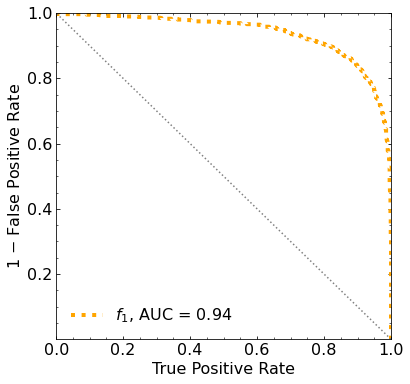

Classification score:


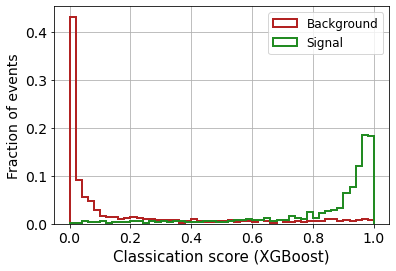


 ROC-AUC =  0.9388882700305246
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


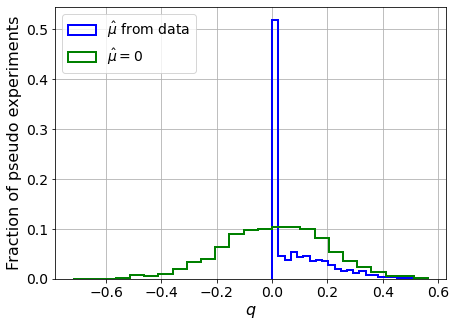

muhat mean:  0.12337254803905355
Z_bins:  0.11756146239756919
std Z_bins:  0.46771956254872515
Z_bins mu=0:  0.11731110503077749
std Z_bins mu=0:  0.7880195261419286

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


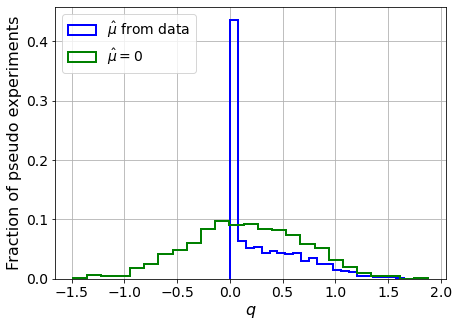

muhat mean:  -0.06358035815673617
Z_bins:  0.39079859647211906
std Z_bins:  0.4665534325896691
Z_bins mu=0:  0.39079859647211906
std Z_bins mu=0:  0.6941380619097055

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


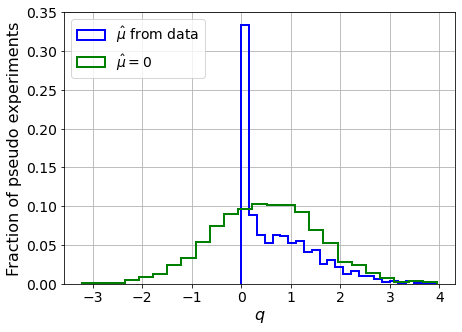

muhat mean:  0.02106143161206735
Z_bins:  0.7092795587707366
std Z_bins:  0.539484102613948
Z_bins mu=0:  0.7092795587707366
std Z_bins mu=0:  0.7400478109042077

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


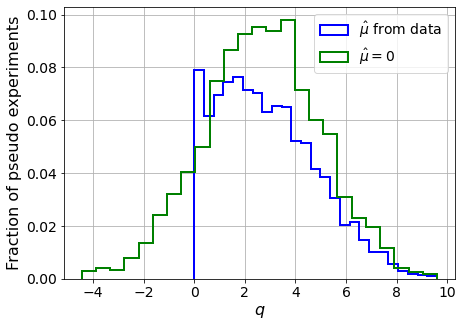

muhat mean:  -0.01132653924002099
Z_bins:  1.6337174392329887
std Z_bins:  0.5923116078722764
Z_bins mu=0:  1.6337164018734396
std Z_bins mu=0:  0.706476526394587

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


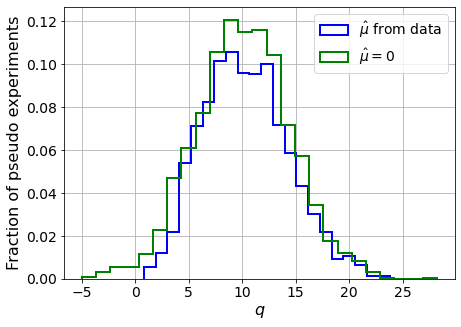

muhat mean:  0.0009303870381290494
Z_bins:  3.170463011719652
std Z_bins:  0.6306335525770966
Z_bins mu=0:  3.1704516236005293
std Z_bins mu=0:  0.6946408681509286

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


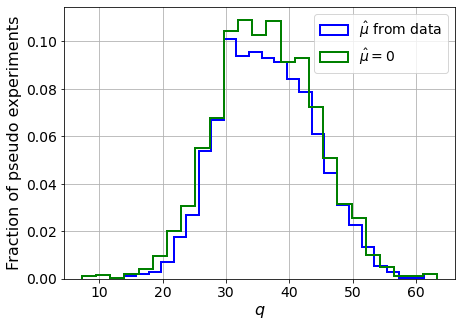

muhat mean:  -0.0011934745044577802
Z_bins:  6.022121968722018
std Z_bins:  0.6166088046285577
Z_bins mu=0:  6.021857175313518
std Z_bins mu=0:  0.648470632169027

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


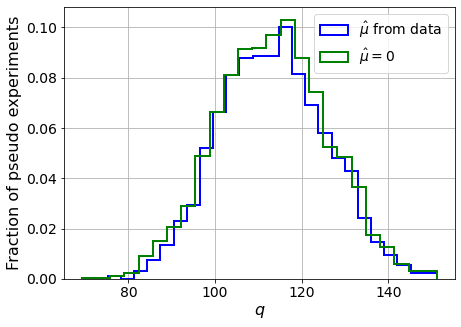

muhat mean:  0.0009123247191842637
Z_bins:  10.638399851372778
std Z_bins:  0.5771829664755045
Z_bins mu=0:  10.638374246599115
std Z_bins mu=0:  0.5956294595158994

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


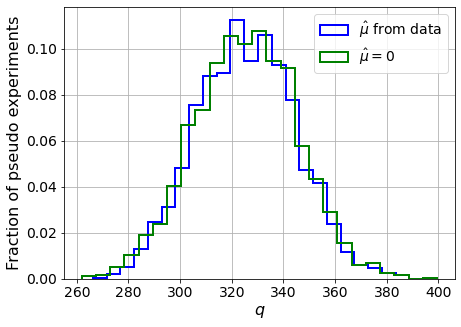

muhat mean:  0.0005439169800126895
Z_bins:  18.03801788195412
std Z_bins:  0.5344968900701507
Z_bins mu=0:  18.03741488920573
std Z_bins mu=0:  0.5454998704699381

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


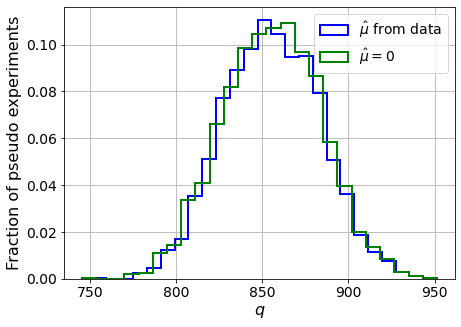

muhat mean:  0.00042640234720018764
Z_bins:  29.246894187480805
std Z_bins:  0.47781254695919445
Z_bins mu=0:  29.246092493347653
std Z_bins mu=0:  0.4845115132274602

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


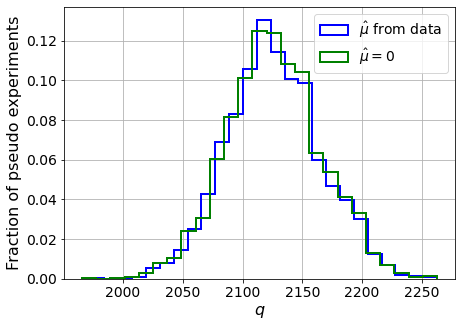

muhat mean:  9.082458467924253e-05
Z_bins:  46.09809831835108
std Z_bins:  0.42535319323791493
Z_bins mu=0:  46.09686434346297
std Z_bins mu=0:  0.42900983857918384

--------


 FINAL RESULT:

[[0.11756146239756919, 0.46771956254872515, 0.12337254803905355, 0.11731110503077749, 0.7880195261419286], [0.39079859647211906, 0.4665534325896691, -0.06358035815673617, 0.39079859647211906, 0.6941380619097055], [0.7092795587707366, 0.539484102613948, 0.02106143161206735, 0.7092795587707366, 0.7400478109042077], [1.6337174392329887, 0.5923116078722764, -0.01132653924002099, 1.6337164018734396, 0.706476526394587], [3.170463011719652, 0.6306335525770966, 0.0009303870381290494, 3.1704516236005293, 0.6946408681509286], [6.022121968722018, 0.6166088046285577, -0.0011934745044577802, 6.021857175313518, 0.648470632169027], [10.638399851372778, 0.5771829664755045, 0.0009123247191842637, 10.638374246599115, 0.5956294595158994], [18.03801788195412, 0.5344968900701507, 0.0005439169800126895, 18.03741488920

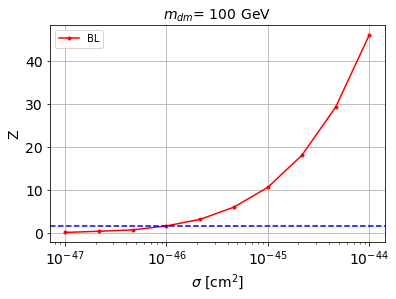


cross_BL_164:  1.0040590385595846e-46
cross_BL_164_up:  6.682714664410931e-47
cross_BL_164_down:  1.4432268178423708e-46

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

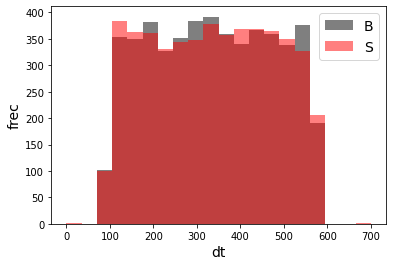

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68843	validation_1-logloss:0.68913
[1]	validation_0-logloss:0.68378	validation_1-logloss:0.68518
[2]	validation_0-logloss:0.67924	validation_1-logloss:0.68130
[3]	validation_0-logloss:0.67476	validation_1-logloss:0.67756
[4]	validation_0-logloss:0.67038	validation_1-logloss:0.67391
[5]	validation_0-logloss:0.66603	validation_1-logloss:0.67035
[6]	validation_0-logloss:0.66175	validation_1-logloss:0.66678
[7]	validation_0-logloss:0.65756	validation_1-logloss:0.66321
[8]	validation_0-logloss:0.65345	validation_1-logloss:0.65968
[9]	validation_0-logloss:0.64940	validation_1-logloss:0.65621
[10]	validation_0-logloss:0.64542	validation_1-logloss:0.65290
[11]	validation_0-logloss:0.64150	validation_1-logloss:0.64961
[12]	validation_0-logloss:0.63762	validation_1-logloss:0.64635
[13]	validation_0-logloss:0.63385	validation_1-logloss:0.64307
[14]	validation_0-logloss:0.63016	validation_1-logloss:0.63986
[15]	validation_0-logloss:0.62641	validation_1-logloss:0.63684
[1

[130]	validation_0-logloss:0.39585	validation_1-logloss:0.46563
[131]	validation_0-logloss:0.39470	validation_1-logloss:0.46497
[132]	validation_0-logloss:0.39359	validation_1-logloss:0.46423
[133]	validation_0-logloss:0.39254	validation_1-logloss:0.46361
[134]	validation_0-logloss:0.39142	validation_1-logloss:0.46294
[135]	validation_0-logloss:0.39027	validation_1-logloss:0.46220
[136]	validation_0-logloss:0.38920	validation_1-logloss:0.46158
[137]	validation_0-logloss:0.38814	validation_1-logloss:0.46090
[138]	validation_0-logloss:0.38704	validation_1-logloss:0.46021
[139]	validation_0-logloss:0.38600	validation_1-logloss:0.45972
[140]	validation_0-logloss:0.38493	validation_1-logloss:0.45907
[141]	validation_0-logloss:0.38385	validation_1-logloss:0.45839
[142]	validation_0-logloss:0.38282	validation_1-logloss:0.45769
[143]	validation_0-logloss:0.38177	validation_1-logloss:0.45709
[144]	validation_0-logloss:0.38072	validation_1-logloss:0.45641
[145]	validation_0-logloss:0.37965	valid

[259]	validation_0-logloss:0.28790	validation_1-logloss:0.41067
[260]	validation_0-logloss:0.28731	validation_1-logloss:0.41048
[261]	validation_0-logloss:0.28667	validation_1-logloss:0.41032
[262]	validation_0-logloss:0.28608	validation_1-logloss:0.41014
[263]	validation_0-logloss:0.28544	validation_1-logloss:0.40989
[264]	validation_0-logloss:0.28484	validation_1-logloss:0.40979
[265]	validation_0-logloss:0.28428	validation_1-logloss:0.40955
[266]	validation_0-logloss:0.28366	validation_1-logloss:0.40938
[267]	validation_0-logloss:0.28304	validation_1-logloss:0.40924
[268]	validation_0-logloss:0.28246	validation_1-logloss:0.40907
[269]	validation_0-logloss:0.28188	validation_1-logloss:0.40894
[270]	validation_0-logloss:0.28128	validation_1-logloss:0.40882
[271]	validation_0-logloss:0.28065	validation_1-logloss:0.40855
[272]	validation_0-logloss:0.28003	validation_1-logloss:0.40829
[273]	validation_0-logloss:0.27942	validation_1-logloss:0.40813
[274]	validation_0-logloss:0.27889	valid

[388]	validation_0-logloss:0.22239	validation_1-logloss:0.38649
[389]	validation_0-logloss:0.22202	validation_1-logloss:0.38634
[390]	validation_0-logloss:0.22159	validation_1-logloss:0.38622
[391]	validation_0-logloss:0.22114	validation_1-logloss:0.38608
[392]	validation_0-logloss:0.22076	validation_1-logloss:0.38592
[393]	validation_0-logloss:0.22031	validation_1-logloss:0.38572
[394]	validation_0-logloss:0.21993	validation_1-logloss:0.38558
[395]	validation_0-logloss:0.21946	validation_1-logloss:0.38540
[396]	validation_0-logloss:0.21907	validation_1-logloss:0.38516
[397]	validation_0-logloss:0.21866	validation_1-logloss:0.38503
[398]	validation_0-logloss:0.21827	validation_1-logloss:0.38491
[399]	validation_0-logloss:0.21789	validation_1-logloss:0.38477
[400]	validation_0-logloss:0.21743	validation_1-logloss:0.38461
[401]	validation_0-logloss:0.21701	validation_1-logloss:0.38450
[402]	validation_0-logloss:0.21665	validation_1-logloss:0.38436
[403]	validation_0-logloss:0.21622	valid

[517]	validation_0-logloss:0.17603	validation_1-logloss:0.37036
[518]	validation_0-logloss:0.17571	validation_1-logloss:0.37037
[519]	validation_0-logloss:0.17539	validation_1-logloss:0.37022
[520]	validation_0-logloss:0.17511	validation_1-logloss:0.37012
[521]	validation_0-logloss:0.17478	validation_1-logloss:0.37005
[522]	validation_0-logloss:0.17449	validation_1-logloss:0.36998
[523]	validation_0-logloss:0.17421	validation_1-logloss:0.36987
[524]	validation_0-logloss:0.17385	validation_1-logloss:0.36974
[525]	validation_0-logloss:0.17356	validation_1-logloss:0.36961
[526]	validation_0-logloss:0.17329	validation_1-logloss:0.36951
[527]	validation_0-logloss:0.17295	validation_1-logloss:0.36939
[528]	validation_0-logloss:0.17269	validation_1-logloss:0.36927
[529]	validation_0-logloss:0.17240	validation_1-logloss:0.36916
[530]	validation_0-logloss:0.17207	validation_1-logloss:0.36905
[531]	validation_0-logloss:0.17178	validation_1-logloss:0.36889
[532]	validation_0-logloss:0.17149	valid

[646]	validation_0-logloss:0.14178	validation_1-logloss:0.36045
[647]	validation_0-logloss:0.14155	validation_1-logloss:0.36044
[648]	validation_0-logloss:0.14132	validation_1-logloss:0.36033
[649]	validation_0-logloss:0.14114	validation_1-logloss:0.36034
[650]	validation_0-logloss:0.14090	validation_1-logloss:0.36029
[651]	validation_0-logloss:0.14069	validation_1-logloss:0.36027
[652]	validation_0-logloss:0.14049	validation_1-logloss:0.36031
[653]	validation_0-logloss:0.14027	validation_1-logloss:0.36026
[654]	validation_0-logloss:0.14004	validation_1-logloss:0.36014
[655]	validation_0-logloss:0.13985	validation_1-logloss:0.36010
[656]	validation_0-logloss:0.13963	validation_1-logloss:0.36002
[657]	validation_0-logloss:0.13946	validation_1-logloss:0.35989
[658]	validation_0-logloss:0.13925	validation_1-logloss:0.35990
[659]	validation_0-logloss:0.13901	validation_1-logloss:0.35980
[660]	validation_0-logloss:0.13873	validation_1-logloss:0.35966
[661]	validation_0-logloss:0.13854	valid

[775]	validation_0-logloss:0.11673	validation_1-logloss:0.35426
[776]	validation_0-logloss:0.11655	validation_1-logloss:0.35420
[777]	validation_0-logloss:0.11641	validation_1-logloss:0.35420
[778]	validation_0-logloss:0.11623	validation_1-logloss:0.35414
[779]	validation_0-logloss:0.11605	validation_1-logloss:0.35412
[780]	validation_0-logloss:0.11587	validation_1-logloss:0.35406
[781]	validation_0-logloss:0.11566	validation_1-logloss:0.35404
[782]	validation_0-logloss:0.11552	validation_1-logloss:0.35404
[783]	validation_0-logloss:0.11530	validation_1-logloss:0.35393
[784]	validation_0-logloss:0.11516	validation_1-logloss:0.35390
[785]	validation_0-logloss:0.11498	validation_1-logloss:0.35387
[786]	validation_0-logloss:0.11484	validation_1-logloss:0.35380
[787]	validation_0-logloss:0.11471	validation_1-logloss:0.35372
[788]	validation_0-logloss:0.11453	validation_1-logloss:0.35366
[789]	validation_0-logloss:0.11436	validation_1-logloss:0.35365
[790]	validation_0-logloss:0.11421	valid

[904]	validation_0-logloss:0.09734	validation_1-logloss:0.34984
[905]	validation_0-logloss:0.09719	validation_1-logloss:0.34978
[906]	validation_0-logloss:0.09703	validation_1-logloss:0.34970
[907]	validation_0-logloss:0.09688	validation_1-logloss:0.34968
[908]	validation_0-logloss:0.09675	validation_1-logloss:0.34963
[909]	validation_0-logloss:0.09662	validation_1-logloss:0.34962
[910]	validation_0-logloss:0.09649	validation_1-logloss:0.34958
[911]	validation_0-logloss:0.09636	validation_1-logloss:0.34957
[912]	validation_0-logloss:0.09623	validation_1-logloss:0.34951
[913]	validation_0-logloss:0.09610	validation_1-logloss:0.34952
[914]	validation_0-logloss:0.09599	validation_1-logloss:0.34953
[915]	validation_0-logloss:0.09582	validation_1-logloss:0.34948
[916]	validation_0-logloss:0.09566	validation_1-logloss:0.34956
[917]	validation_0-logloss:0.09551	validation_1-logloss:0.34951
[918]	validation_0-logloss:0.09538	validation_1-logloss:0.34938
[919]	validation_0-logloss:0.09525	valid

[1032]	validation_0-logloss:0.08183	validation_1-logloss:0.34697
[1033]	validation_0-logloss:0.08172	validation_1-logloss:0.34699
[1034]	validation_0-logloss:0.08162	validation_1-logloss:0.34692
[1035]	validation_0-logloss:0.08149	validation_1-logloss:0.34684
[1036]	validation_0-logloss:0.08136	validation_1-logloss:0.34676
[1037]	validation_0-logloss:0.08128	validation_1-logloss:0.34669
[1038]	validation_0-logloss:0.08116	validation_1-logloss:0.34659
[1039]	validation_0-logloss:0.08106	validation_1-logloss:0.34664
[1040]	validation_0-logloss:0.08097	validation_1-logloss:0.34669
[1041]	validation_0-logloss:0.08088	validation_1-logloss:0.34675
[1042]	validation_0-logloss:0.08079	validation_1-logloss:0.34674
[1043]	validation_0-logloss:0.08069	validation_1-logloss:0.34670
[1044]	validation_0-logloss:0.08056	validation_1-logloss:0.34673
[1045]	validation_0-logloss:0.08047	validation_1-logloss:0.34670
[1046]	validation_0-logloss:0.08035	validation_1-logloss:0.34668
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06923	validation_1-logloss:0.34558
[1160]	validation_0-logloss:0.06913	validation_1-logloss:0.34554
[1161]	validation_0-logloss:0.06902	validation_1-logloss:0.34558
[1162]	validation_0-logloss:0.06892	validation_1-logloss:0.34554
[1163]	validation_0-logloss:0.06886	validation_1-logloss:0.34555
[1164]	validation_0-logloss:0.06876	validation_1-logloss:0.34544
[1165]	validation_0-logloss:0.06865	validation_1-logloss:0.34542
[1166]	validation_0-logloss:0.06856	validation_1-logloss:0.34537
[1167]	validation_0-logloss:0.06847	validation_1-logloss:0.34534
[1168]	validation_0-logloss:0.06838	validation_1-logloss:0.34536
[1169]	validation_0-logloss:0.06830	validation_1-logloss:0.34541
[1170]	validation_0-logloss:0.06820	validation_1-logloss:0.34540
[1171]	validation_0-logloss:0.06810	validation_1-logloss:0.34542
[1172]	validation_0-logloss:0.06800	validation_1-logloss:0.34544
[1173]	validation_0-logloss:0.06793	validation_1-logloss:0.34541
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05865	validation_1-logloss:0.34553
[1287]	validation_0-logloss:0.05857	validation_1-logloss:0.34543
[1288]	validation_0-logloss:0.05851	validation_1-logloss:0.34545
[1289]	validation_0-logloss:0.05844	validation_1-logloss:0.34542
[1290]	validation_0-logloss:0.05837	validation_1-logloss:0.34547
[1291]	validation_0-logloss:0.05831	validation_1-logloss:0.34556
[1292]	validation_0-logloss:0.05824	validation_1-logloss:0.34556
[1293]	validation_0-logloss:0.05817	validation_1-logloss:0.34554


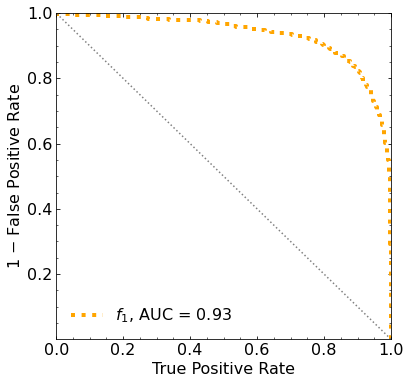

Classification score:


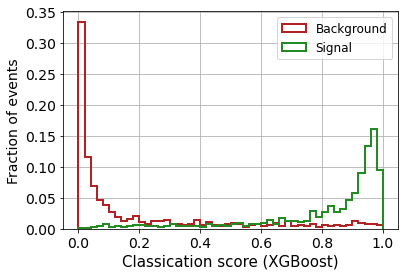


 ROC-AUC =  0.9325295003380247
At least 5 B events per bin, range = [[0, 1]]:
# bins:  22 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  22
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


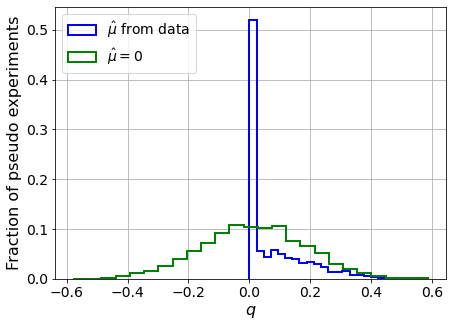

muhat mean:  -0.006404275814761918
Z_bins:  0.1313671415943427
std Z_bins:  0.39349873023150256
Z_bins mu=0:  0.1313671415943427
std Z_bins mu=0:  0.6479558673450435

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


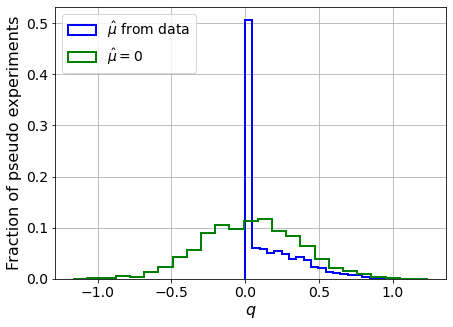

muhat mean:  0.09654465580513995
Z_bins:  0.21646404018589566
std Z_bins:  0.47540031269155797
Z_bins mu=0:  0.21598287995053483
std Z_bins mu=0:  0.7593260030603508

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


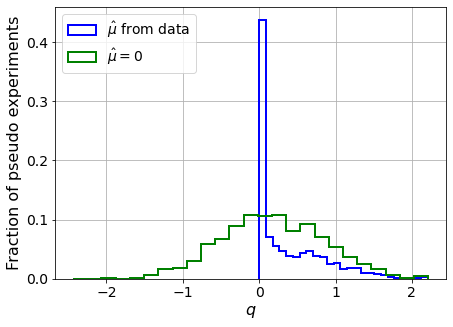

muhat mean:  0.06250629289517129
Z_bins:  0.4030331047861066
std Z_bins:  0.5658976405229764
Z_bins mu=0:  0.40024498356126287
std Z_bins mu=0:  0.8452126740026411

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


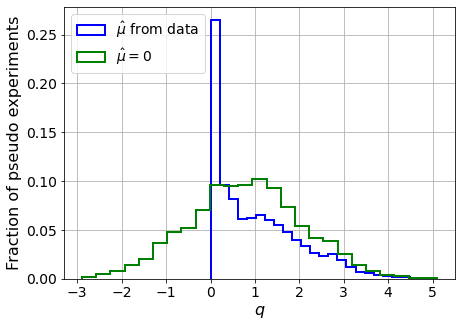

muhat mean:  -0.008439825862552399
Z_bins:  0.8936657135013251
std Z_bins:  0.5413534486277154
Z_bins mu=0:  0.8936657135013251
std Z_bins mu=0:  0.7083908193780376

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


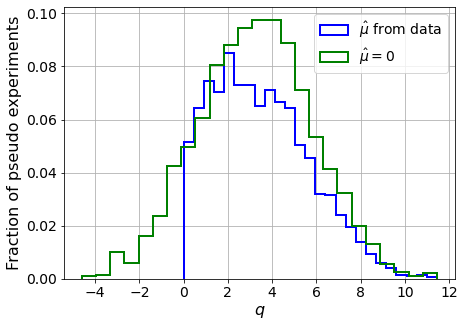

muhat mean:  -0.0026891758413248555
Z_bins:  1.810074547938686
std Z_bins:  0.6035417730066608
Z_bins mu=0:  1.810074547938686
std Z_bins mu=0:  0.7050937406854456

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


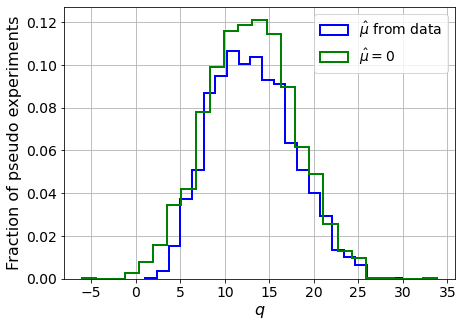

muhat mean:  0.0010007787470828232
Z_bins:  3.5963447409701685
std Z_bins:  0.6361560900691933
Z_bins mu=0:  3.5962496269714808
std Z_bins mu=0:  0.690139004164025

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


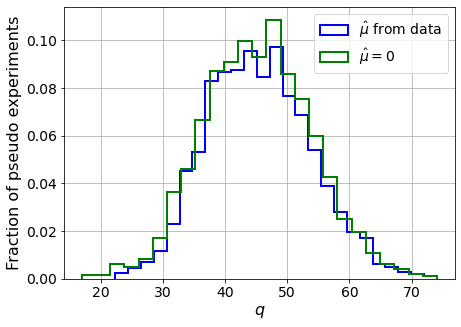

muhat mean:  0.0002766121484781605
Z_bins:  6.717307860615733
std Z_bins:  0.6199580489514553
Z_bins mu=0:  6.717001324627766
std Z_bins mu=0:  0.6486836915862163

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


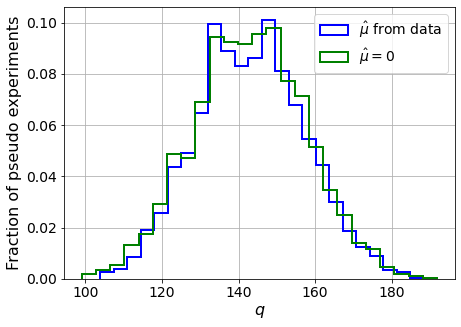

muhat mean:  0.0008651370806598389
Z_bins:  11.958426667104348
std Z_bins:  0.5909565770357962
Z_bins mu=0:  11.958426667104348
std Z_bins mu=0:  0.6083541610148128

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


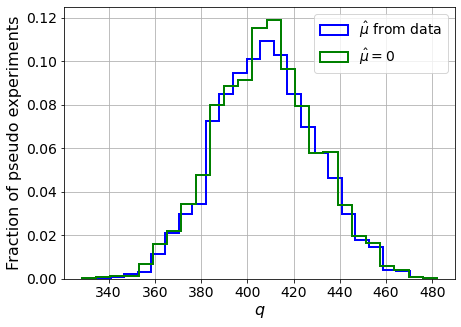

muhat mean:  -0.00012618630004560826
Z_bins:  20.19655121718179
std Z_bins:  0.5369535815233331
Z_bins mu=0:  20.19603439016173
std Z_bins mu=0:  0.5468748697638623

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


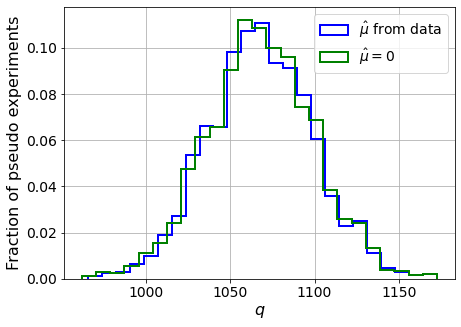

muhat mean:  0.00021847420149567344
Z_bins:  32.679708641147045
std Z_bins:  0.475777755643791
Z_bins mu=0:  32.67865444343926
std Z_bins mu=0:  0.48187444187033895

--------


 FINAL RESULT:

[[0.1313671415943427, 0.39349873023150256, -0.006404275814761918, 0.1313671415943427, 0.6479558673450435], [0.21646404018589566, 0.47540031269155797, 0.09654465580513995, 0.21598287995053483, 0.7593260030603508], [0.4030331047861066, 0.5658976405229764, 0.06250629289517129, 0.40024498356126287, 0.8452126740026411], [0.8936657135013251, 0.5413534486277154, -0.008439825862552399, 0.8936657135013251, 0.7083908193780376], [1.810074547938686, 0.6035417730066608, -0.0026891758413248555, 1.810074547938686, 0.7050937406854456], [3.5963447409701685, 0.6361560900691933, 0.0010007787470828232, 3.5962496269714808, 0.690139004164025], [6.717307860615733, 0.6199580489514553, 0.0002766121484781605, 6.717001324627766, 0.6486836915862163], [11.958426667104348, 0.5909565770357962, 0.0008651370806598389, 11.9584266

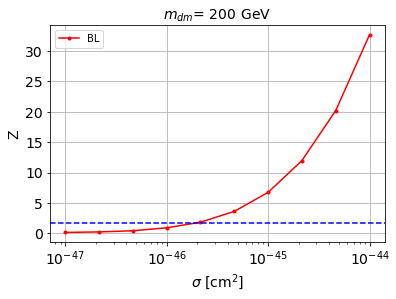


cross_BL_164:  1.938038591391393e-46
cross_BL_164_up:  1.233141510500321e-46
cross_BL_164_down:  2.741062389961119e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape

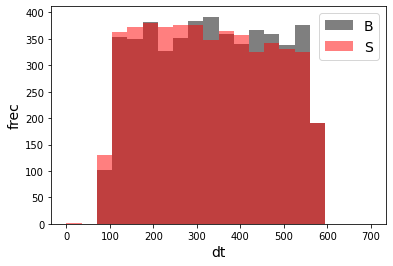

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68861	validation_1-logloss:0.68908
[1]	validation_0-logloss:0.68416	validation_1-logloss:0.68513
[2]	validation_0-logloss:0.67978	validation_1-logloss:0.68121
[3]	validation_0-logloss:0.67547	validation_1-logloss:0.67739
[4]	validation_0-logloss:0.67125	validation_1-logloss:0.67364
[5]	validation_0-logloss:0.66711	validation_1-logloss:0.66998
[6]	validation_0-logloss:0.66296	validation_1-logloss:0.66625
[7]	validation_0-logloss:0.65895	validation_1-logloss:0.66274
[8]	validation_0-logloss:0.65504	validation_1-logloss:0.65919
[9]	validation_0-logloss:0.65109	validation_1-logloss:0.65573
[10]	validation_0-logloss:0.64726	validation_1-logloss:0.65225
[11]	validation_0-logloss:0.64347	validation_1-logloss:0.64903
[12]	validation_0-logloss:0.63977	validation_1-logloss:0.64566
[13]	validation_0-logloss:0.63609	validation_1-logloss:0.64248
[14]	validation_0-logloss:0.63246	validation_1-logloss:0.63940
[15]	validation_0-logloss:0.62891	validation_1-logloss:0.63644
[1

[130]	validation_0-logloss:0.40108	validation_1-logloss:0.46782
[131]	validation_0-logloss:0.39999	validation_1-logloss:0.46718
[132]	validation_0-logloss:0.39891	validation_1-logloss:0.46654
[133]	validation_0-logloss:0.39779	validation_1-logloss:0.46591
[134]	validation_0-logloss:0.39663	validation_1-logloss:0.46516
[135]	validation_0-logloss:0.39554	validation_1-logloss:0.46449
[136]	validation_0-logloss:0.39439	validation_1-logloss:0.46393
[137]	validation_0-logloss:0.39334	validation_1-logloss:0.46330
[138]	validation_0-logloss:0.39229	validation_1-logloss:0.46273
[139]	validation_0-logloss:0.39123	validation_1-logloss:0.46209
[140]	validation_0-logloss:0.39015	validation_1-logloss:0.46158
[141]	validation_0-logloss:0.38905	validation_1-logloss:0.46096
[142]	validation_0-logloss:0.38799	validation_1-logloss:0.46040
[143]	validation_0-logloss:0.38697	validation_1-logloss:0.45984
[144]	validation_0-logloss:0.38597	validation_1-logloss:0.45933
[145]	validation_0-logloss:0.38500	valid

[259]	validation_0-logloss:0.29509	validation_1-logloss:0.41533
[260]	validation_0-logloss:0.29441	validation_1-logloss:0.41496
[261]	validation_0-logloss:0.29377	validation_1-logloss:0.41472
[262]	validation_0-logloss:0.29321	validation_1-logloss:0.41452
[263]	validation_0-logloss:0.29257	validation_1-logloss:0.41434
[264]	validation_0-logloss:0.29201	validation_1-logloss:0.41401
[265]	validation_0-logloss:0.29134	validation_1-logloss:0.41370
[266]	validation_0-logloss:0.29070	validation_1-logloss:0.41347
[267]	validation_0-logloss:0.29008	validation_1-logloss:0.41317
[268]	validation_0-logloss:0.28957	validation_1-logloss:0.41294
[269]	validation_0-logloss:0.28902	validation_1-logloss:0.41273
[270]	validation_0-logloss:0.28839	validation_1-logloss:0.41255
[271]	validation_0-logloss:0.28775	validation_1-logloss:0.41221
[272]	validation_0-logloss:0.28711	validation_1-logloss:0.41195
[273]	validation_0-logloss:0.28652	validation_1-logloss:0.41174
[274]	validation_0-logloss:0.28592	valid

[388]	validation_0-logloss:0.22856	validation_1-logloss:0.39064
[389]	validation_0-logloss:0.22812	validation_1-logloss:0.39046
[390]	validation_0-logloss:0.22771	validation_1-logloss:0.39032
[391]	validation_0-logloss:0.22729	validation_1-logloss:0.39011
[392]	validation_0-logloss:0.22688	validation_1-logloss:0.39004
[393]	validation_0-logloss:0.22644	validation_1-logloss:0.38986
[394]	validation_0-logloss:0.22601	validation_1-logloss:0.38980
[395]	validation_0-logloss:0.22560	validation_1-logloss:0.38982
[396]	validation_0-logloss:0.22518	validation_1-logloss:0.38967
[397]	validation_0-logloss:0.22479	validation_1-logloss:0.38941
[398]	validation_0-logloss:0.22442	validation_1-logloss:0.38921
[399]	validation_0-logloss:0.22403	validation_1-logloss:0.38907
[400]	validation_0-logloss:0.22359	validation_1-logloss:0.38881
[401]	validation_0-logloss:0.22320	validation_1-logloss:0.38866
[402]	validation_0-logloss:0.22276	validation_1-logloss:0.38848
[403]	validation_0-logloss:0.22239	valid

[517]	validation_0-logloss:0.18156	validation_1-logloss:0.37411
[518]	validation_0-logloss:0.18121	validation_1-logloss:0.37399
[519]	validation_0-logloss:0.18093	validation_1-logloss:0.37382
[520]	validation_0-logloss:0.18061	validation_1-logloss:0.37376
[521]	validation_0-logloss:0.18033	validation_1-logloss:0.37374
[522]	validation_0-logloss:0.17999	validation_1-logloss:0.37367
[523]	validation_0-logloss:0.17969	validation_1-logloss:0.37351
[524]	validation_0-logloss:0.17936	validation_1-logloss:0.37348
[525]	validation_0-logloss:0.17899	validation_1-logloss:0.37343
[526]	validation_0-logloss:0.17869	validation_1-logloss:0.37345
[527]	validation_0-logloss:0.17842	validation_1-logloss:0.37329
[528]	validation_0-logloss:0.17810	validation_1-logloss:0.37311
[529]	validation_0-logloss:0.17780	validation_1-logloss:0.37298
[530]	validation_0-logloss:0.17750	validation_1-logloss:0.37279
[531]	validation_0-logloss:0.17720	validation_1-logloss:0.37261
[532]	validation_0-logloss:0.17690	valid

[646]	validation_0-logloss:0.14647	validation_1-logloss:0.36293
[647]	validation_0-logloss:0.14625	validation_1-logloss:0.36289
[648]	validation_0-logloss:0.14600	validation_1-logloss:0.36275
[649]	validation_0-logloss:0.14573	validation_1-logloss:0.36264
[650]	validation_0-logloss:0.14549	validation_1-logloss:0.36253
[651]	validation_0-logloss:0.14526	validation_1-logloss:0.36240
[652]	validation_0-logloss:0.14505	validation_1-logloss:0.36239
[653]	validation_0-logloss:0.14483	validation_1-logloss:0.36235
[654]	validation_0-logloss:0.14460	validation_1-logloss:0.36225
[655]	validation_0-logloss:0.14436	validation_1-logloss:0.36216
[656]	validation_0-logloss:0.14414	validation_1-logloss:0.36212
[657]	validation_0-logloss:0.14391	validation_1-logloss:0.36205
[658]	validation_0-logloss:0.14370	validation_1-logloss:0.36200
[659]	validation_0-logloss:0.14345	validation_1-logloss:0.36202
[660]	validation_0-logloss:0.14319	validation_1-logloss:0.36187
[661]	validation_0-logloss:0.14297	valid

[775]	validation_0-logloss:0.11957	validation_1-logloss:0.35641
[776]	validation_0-logloss:0.11937	validation_1-logloss:0.35628
[777]	validation_0-logloss:0.11917	validation_1-logloss:0.35621
[778]	validation_0-logloss:0.11898	validation_1-logloss:0.35615
[779]	validation_0-logloss:0.11881	validation_1-logloss:0.35608
[780]	validation_0-logloss:0.11861	validation_1-logloss:0.35599
[781]	validation_0-logloss:0.11842	validation_1-logloss:0.35587
[782]	validation_0-logloss:0.11824	validation_1-logloss:0.35582
[783]	validation_0-logloss:0.11806	validation_1-logloss:0.35588
[784]	validation_0-logloss:0.11786	validation_1-logloss:0.35580
[785]	validation_0-logloss:0.11766	validation_1-logloss:0.35568
[786]	validation_0-logloss:0.11749	validation_1-logloss:0.35568
[787]	validation_0-logloss:0.11732	validation_1-logloss:0.35563
[788]	validation_0-logloss:0.11713	validation_1-logloss:0.35563
[789]	validation_0-logloss:0.11695	validation_1-logloss:0.35567
[790]	validation_0-logloss:0.11677	valid

[904]	validation_0-logloss:0.09872	validation_1-logloss:0.35041
[905]	validation_0-logloss:0.09856	validation_1-logloss:0.35031
[906]	validation_0-logloss:0.09846	validation_1-logloss:0.35027
[907]	validation_0-logloss:0.09833	validation_1-logloss:0.35030
[908]	validation_0-logloss:0.09817	validation_1-logloss:0.35025
[909]	validation_0-logloss:0.09804	validation_1-logloss:0.35020
[910]	validation_0-logloss:0.09789	validation_1-logloss:0.35005
[911]	validation_0-logloss:0.09774	validation_1-logloss:0.35000
[912]	validation_0-logloss:0.09759	validation_1-logloss:0.35003
[913]	validation_0-logloss:0.09745	validation_1-logloss:0.34999
[914]	validation_0-logloss:0.09730	validation_1-logloss:0.35002
[915]	validation_0-logloss:0.09713	validation_1-logloss:0.35012
[916]	validation_0-logloss:0.09697	validation_1-logloss:0.35011
[917]	validation_0-logloss:0.09684	validation_1-logloss:0.34992
[918]	validation_0-logloss:0.09667	validation_1-logloss:0.34990
[919]	validation_0-logloss:0.09653	valid

[1032]	validation_0-logloss:0.08243	validation_1-logloss:0.34667
[1033]	validation_0-logloss:0.08233	validation_1-logloss:0.34658
[1034]	validation_0-logloss:0.08220	validation_1-logloss:0.34663
[1035]	validation_0-logloss:0.08207	validation_1-logloss:0.34665
[1036]	validation_0-logloss:0.08194	validation_1-logloss:0.34670
[1037]	validation_0-logloss:0.08182	validation_1-logloss:0.34669
[1038]	validation_0-logloss:0.08169	validation_1-logloss:0.34677
[1039]	validation_0-logloss:0.08159	validation_1-logloss:0.34683
[1040]	validation_0-logloss:0.08147	validation_1-logloss:0.34679
[1041]	validation_0-logloss:0.08136	validation_1-logloss:0.34670
[1042]	validation_0-logloss:0.08124	validation_1-logloss:0.34667
[1043]	validation_0-logloss:0.08114	validation_1-logloss:0.34666
[1044]	validation_0-logloss:0.08102	validation_1-logloss:0.34664
[1045]	validation_0-logloss:0.08094	validation_1-logloss:0.34663
[1046]	validation_0-logloss:0.08082	validation_1-logloss:0.34661
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06951	validation_1-logloss:0.34408
[1160]	validation_0-logloss:0.06944	validation_1-logloss:0.34410
[1161]	validation_0-logloss:0.06934	validation_1-logloss:0.34418
[1162]	validation_0-logloss:0.06927	validation_1-logloss:0.34417
[1163]	validation_0-logloss:0.06917	validation_1-logloss:0.34407
[1164]	validation_0-logloss:0.06908	validation_1-logloss:0.34404
[1165]	validation_0-logloss:0.06897	validation_1-logloss:0.34397
[1166]	validation_0-logloss:0.06887	validation_1-logloss:0.34397
[1167]	validation_0-logloss:0.06878	validation_1-logloss:0.34393
[1168]	validation_0-logloss:0.06869	validation_1-logloss:0.34397
[1169]	validation_0-logloss:0.06860	validation_1-logloss:0.34399
[1170]	validation_0-logloss:0.06850	validation_1-logloss:0.34396
[1171]	validation_0-logloss:0.06840	validation_1-logloss:0.34391
[1172]	validation_0-logloss:0.06829	validation_1-logloss:0.34400
[1173]	validation_0-logloss:0.06819	validation_1-logloss:0.34388
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05903	validation_1-logloss:0.34253
[1287]	validation_0-logloss:0.05895	validation_1-logloss:0.34251
[1288]	validation_0-logloss:0.05887	validation_1-logloss:0.34245
[1289]	validation_0-logloss:0.05882	validation_1-logloss:0.34245
[1290]	validation_0-logloss:0.05874	validation_1-logloss:0.34246
[1291]	validation_0-logloss:0.05869	validation_1-logloss:0.34244
[1292]	validation_0-logloss:0.05863	validation_1-logloss:0.34244
[1293]	validation_0-logloss:0.05855	validation_1-logloss:0.34245
[1294]	validation_0-logloss:0.05847	validation_1-logloss:0.34248
[1295]	validation_0-logloss:0.05842	validation_1-logloss:0.34247
[1296]	validation_0-logloss:0.05836	validation_1-logloss:0.34251
[1297]	validation_0-logloss:0.05831	validation_1-logloss:0.34248
[1298]	validation_0-logloss:0.05825	validation_1-logloss:0.34246
[1299]	validation_0-logloss:0.05818	validation_1-logloss:0.34253
[1300]	validation_0-logloss:0.05812	validation_1-logloss:0.34253
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.05062	validation_1-logloss:0.34157
[1414]	validation_0-logloss:0.05055	validation_1-logloss:0.34153
[1415]	validation_0-logloss:0.05050	validation_1-logloss:0.34155
[1416]	validation_0-logloss:0.05043	validation_1-logloss:0.34148
[1417]	validation_0-logloss:0.05037	validation_1-logloss:0.34153
[1418]	validation_0-logloss:0.05029	validation_1-logloss:0.34153
[1419]	validation_0-logloss:0.05022	validation_1-logloss:0.34151
[1420]	validation_0-logloss:0.05016	validation_1-logloss:0.34143
[1421]	validation_0-logloss:0.05010	validation_1-logloss:0.34140
[1422]	validation_0-logloss:0.05003	validation_1-logloss:0.34142
[1423]	validation_0-logloss:0.04996	validation_1-logloss:0.34150
[1424]	validation_0-logloss:0.04991	validation_1-logloss:0.34144
[1425]	validation_0-logloss:0.04986	validation_1-logloss:0.34147
[1426]	validation_0-logloss:0.04980	validation_1-logloss:0.34151
[1427]	validation_0-logloss:0.04972	validation_1-logloss:0.34153
[1428]	validation_0-loglo

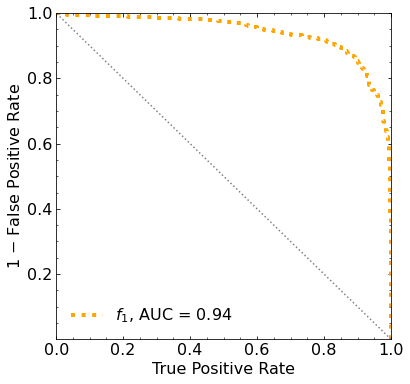

Classification score:


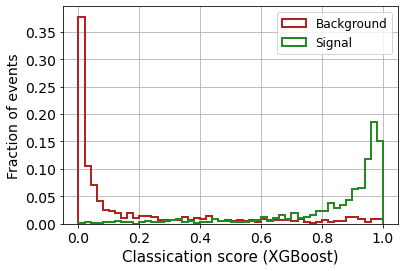


 ROC-AUC =  0.9410038053387416
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


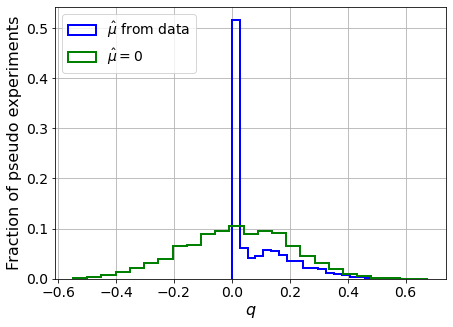

muhat mean:  -0.04514481975796913
Z_bins:  0.13603462640907377
std Z_bins:  0.4080877950623928
Z_bins mu=0:  0.13603462640907377
std Z_bins mu=0:  0.680633008434242

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


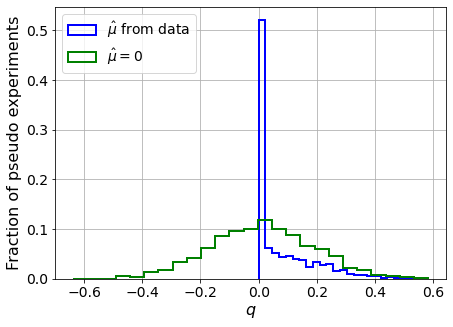

muhat mean:  0.09291371891759985
Z_bins:  0.11540802252541207
std Z_bins:  0.4774617541937461
Z_bins mu=0:  0.11526053475382274
std Z_bins mu=0:  0.7821000541480553

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


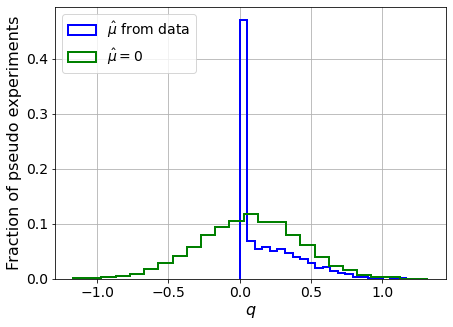

muhat mean:  -0.07862534275835845
Z_bins:  0.2709298775479661
std Z_bins:  0.4150193016514929
Z_bins mu=0:  0.2709298775479661
std Z_bins mu=0:  0.6519647350992642

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


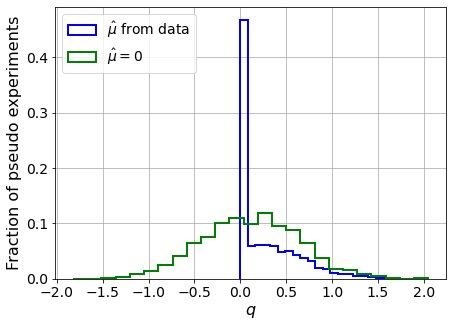

muhat mean:  0.0747272169799531
Z_bins:  0.34436971926486765
std Z_bins:  0.4989348091619278
Z_bins mu=0:  0.34363443557296425
std Z_bins mu=0:  0.7702605377263669

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


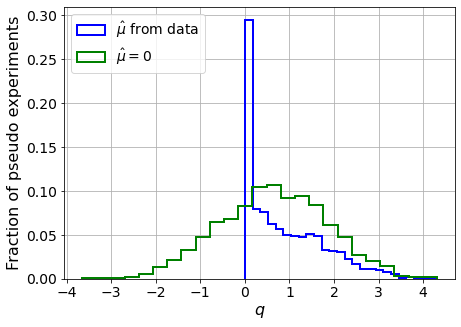

muhat mean:  0.025086149547419497
Z_bins:  0.8140707519306101
std Z_bins:  0.5404651385720511
Z_bins mu=0:  0.8139399598668557
std Z_bins mu=0:  0.7395487266234334

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


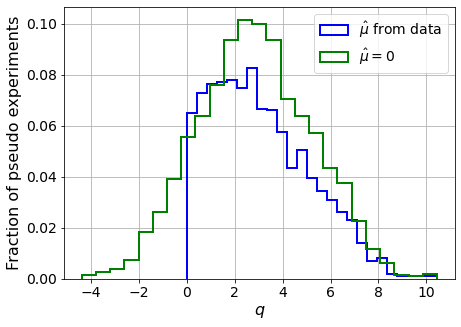

muhat mean:  0.002254313676380627
Z_bins:  1.672281218148113
std Z_bins:  0.6061215459233145
Z_bins mu=0:  1.6716357542549216
std Z_bins mu=0:  0.710521946816351

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


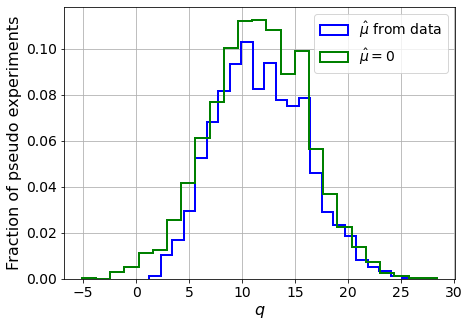

muhat mean:  0.003925825373934923
Z_bins:  3.4044385875085985
std Z_bins:  0.6183427226107593
Z_bins mu=0:  3.4044238961285136
std Z_bins mu=0:  0.6781360690480328

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


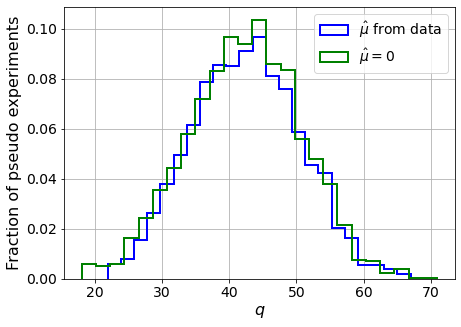

muhat mean:  -0.001894600470729709
Z_bins:  6.525380131895621
std Z_bins:  0.6162018118970457
Z_bins mu=0:  6.525380131895621
std Z_bins mu=0:  0.6469698042817107

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


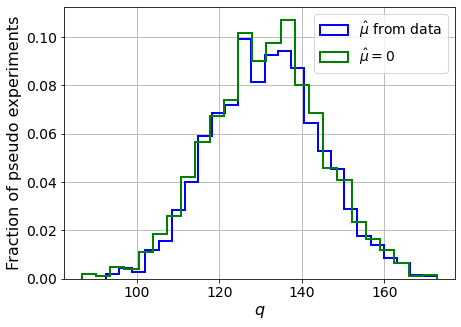

muhat mean:  0.0005111750705900828
Z_bins:  11.46533599382651
std Z_bins:  0.5756668606263102
Z_bins mu=0:  11.46491513516408
std Z_bins mu=0:  0.5935796072774925

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


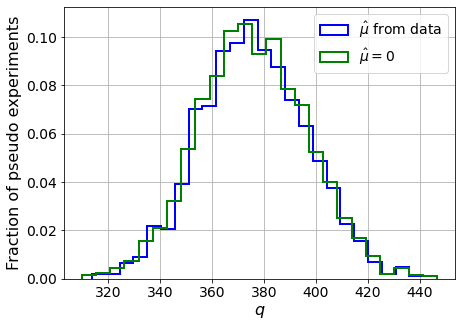

muhat mean:  -0.000225853318805077
Z_bins:  19.37134974856615
std Z_bins:  0.5281882115819012
Z_bins mu=0:  19.370185822312944
std Z_bins mu=0:  0.5375346433350472

--------


 FINAL RESULT:

[[0.13603462640907377, 0.4080877950623928, -0.04514481975796913, 0.13603462640907377, 0.680633008434242], [0.11540802252541207, 0.4774617541937461, 0.09291371891759985, 0.11526053475382274, 0.7821000541480553], [0.2709298775479661, 0.4150193016514929, -0.07862534275835845, 0.2709298775479661, 0.6519647350992642], [0.34436971926486765, 0.4989348091619278, 0.0747272169799531, 0.34363443557296425, 0.7702605377263669], [0.8140707519306101, 0.5404651385720511, 0.025086149547419497, 0.8139399598668557, 0.7395487266234334], [1.672281218148113, 0.6061215459233145, 0.002254313676380627, 1.6716357542549216, 0.710521946816351], [3.4044385875085985, 0.6183427226107593, 0.003925825373934923, 3.4044238961285136, 0.6781360690480328], [6.525380131895621, 0.6162018118970457, -0.001894600470729709, 6.52538013189562

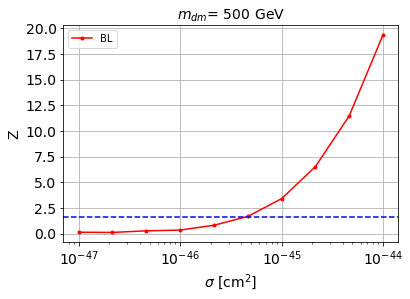


cross_BL_164:  4.5476662147028846e-46
cross_BL_164_up:  2.8754011091672534e-46
cross_BL_164_down:  6.3853315004028486e-46

#########################



In [30]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)
    


        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
#     # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
    del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))

    # all the signal features
    X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')



    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)



    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)



    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    #################################
    # CONCATENATE IMAGES + FEATURES #
    #################################
    
    X_mon_train = np.concatenate([X_mon_train_1D, X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon_test_1D, X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon_val_1D, X_mon5_val],axis=1)

    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [31]:
cross_imagesdt = store_cross_BL_164
cross_imagesdt_up = store_cross_BL_164_up
cross_imagesdt_down = store_cross_BL_164_down

print(cross_imagesdt)
print(cross_imagesdt_up)
print(cross_imagesdt_down)

[1.7584430742591124e-45, 1.0887389692744252e-46, 6.857193658447777e-47, 7.061840630476009e-47, 1.0040590385595846e-46, 1.938038591391393e-46, 4.5476662147028846e-46]
[1.0471410527642259e-45, 6.933001503776983e-47, 4.423695125300659e-47, 4.398656706593474e-47, 6.682714664410931e-47, 1.233141510500321e-46, 2.8754011091672534e-46]
[2.4873046514526383e-45, 1.6407598654942368e-46, 9.656884675973807e-47, 1.0130850569727353e-46, 1.4432268178423708e-46, 2.741062389961119e-46, 6.3853315004028486e-46]


In [32]:
np.savetxt('results/imagesdt.txt', [cross_imagesdt, cross_imagesdt_up, cross_imagesdt_down])

In [33]:
cross_imagesdt = np.loadtxt('results/imagesdt.txt')[0]
cross_imagesdt_up = np.loadtxt('results/imagesdt.txt')[1]
cross_imagesdt_down =np.loadtxt('results/imagesdt.txt')[2]


#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:  (5000, 8)
B_pdiffT.shape:  (5000,)
S_pdiffT.shape:  (5000,)


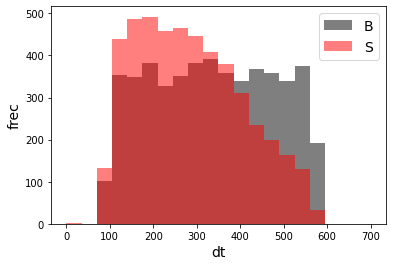

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68476	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67652	validation_1-logloss:0.67761
[2]	validation_0-logloss:0.66845	validation_1-logloss:0.66997
[3]	validation_0-logloss:0.66054	validation_1-logloss:0.66235
[4]	validation_0-logloss:0.65279	validation_1-logloss:0.65487
[5]	validation_0-logloss:0.64515	validation_1-logloss:0.64773
[6]	validation_0-logloss:0.63767	validation_1-logloss:0.64052
[7]	validation_0-logloss:0.63031	validation_1-logloss:0.63358
[8]	validation_0-logloss:0.62310	validation_1-logloss:0.62660
[9]	validation_0-logloss:0.61602	validation_1-logloss:0.61981
[10]	validation_0-logloss:0.60901	validation_1-logloss:0.61324
[11]	validation_0-logloss:0.60216	validation_1-logloss:0.60664
[12]	validation_0-logloss:0.59540	validation_1-logloss:0.60024
[13]	validation_0-logloss:0.58882	validation_1-logloss:0.59396
[14]	validation_0-logloss:0.58225	validation_1-logloss:0.58779
[15]	validation_0-logloss:0.57585	validation_1-logloss:0.58168
[1

[130]	validation_0-logloss:0.20062	validation_1-logloss:0.23514
[131]	validation_0-logloss:0.19905	validation_1-logloss:0.23373
[132]	validation_0-logloss:0.19749	validation_1-logloss:0.23234
[133]	validation_0-logloss:0.19598	validation_1-logloss:0.23101
[134]	validation_0-logloss:0.19444	validation_1-logloss:0.22958
[135]	validation_0-logloss:0.19293	validation_1-logloss:0.22826
[136]	validation_0-logloss:0.19145	validation_1-logloss:0.22689
[137]	validation_0-logloss:0.18998	validation_1-logloss:0.22558
[138]	validation_0-logloss:0.18847	validation_1-logloss:0.22428
[139]	validation_0-logloss:0.18701	validation_1-logloss:0.22295
[140]	validation_0-logloss:0.18558	validation_1-logloss:0.22168
[141]	validation_0-logloss:0.18411	validation_1-logloss:0.22040
[142]	validation_0-logloss:0.18271	validation_1-logloss:0.21917
[143]	validation_0-logloss:0.18134	validation_1-logloss:0.21798
[144]	validation_0-logloss:0.17997	validation_1-logloss:0.21674
[145]	validation_0-logloss:0.17860	valid

[259]	validation_0-logloss:0.08050	validation_1-logloss:0.12935
[260]	validation_0-logloss:0.07999	validation_1-logloss:0.12892
[261]	validation_0-logloss:0.07947	validation_1-logloss:0.12846
[262]	validation_0-logloss:0.07899	validation_1-logloss:0.12807
[263]	validation_0-logloss:0.07847	validation_1-logloss:0.12763
[264]	validation_0-logloss:0.07795	validation_1-logloss:0.12721
[265]	validation_0-logloss:0.07746	validation_1-logloss:0.12685
[266]	validation_0-logloss:0.07697	validation_1-logloss:0.12638
[267]	validation_0-logloss:0.07646	validation_1-logloss:0.12585
[268]	validation_0-logloss:0.07598	validation_1-logloss:0.12540
[269]	validation_0-logloss:0.07549	validation_1-logloss:0.12502
[270]	validation_0-logloss:0.07500	validation_1-logloss:0.12450
[271]	validation_0-logloss:0.07452	validation_1-logloss:0.12407
[272]	validation_0-logloss:0.07404	validation_1-logloss:0.12368
[273]	validation_0-logloss:0.07357	validation_1-logloss:0.12333
[274]	validation_0-logloss:0.07310	valid

[388]	validation_0-logloss:0.03736	validation_1-logloss:0.09352
[389]	validation_0-logloss:0.03714	validation_1-logloss:0.09338
[390]	validation_0-logloss:0.03694	validation_1-logloss:0.09327
[391]	validation_0-logloss:0.03674	validation_1-logloss:0.09316
[392]	validation_0-logloss:0.03653	validation_1-logloss:0.09301
[393]	validation_0-logloss:0.03635	validation_1-logloss:0.09285
[394]	validation_0-logloss:0.03616	validation_1-logloss:0.09270
[395]	validation_0-logloss:0.03595	validation_1-logloss:0.09254
[396]	validation_0-logloss:0.03576	validation_1-logloss:0.09239
[397]	validation_0-logloss:0.03555	validation_1-logloss:0.09226
[398]	validation_0-logloss:0.03535	validation_1-logloss:0.09210
[399]	validation_0-logloss:0.03516	validation_1-logloss:0.09199
[400]	validation_0-logloss:0.03497	validation_1-logloss:0.09187
[401]	validation_0-logloss:0.03478	validation_1-logloss:0.09174
[402]	validation_0-logloss:0.03460	validation_1-logloss:0.09155
[403]	validation_0-logloss:0.03441	valid

[517]	validation_0-logloss:0.01908	validation_1-logloss:0.07992
[518]	validation_0-logloss:0.01899	validation_1-logloss:0.07984
[519]	validation_0-logloss:0.01890	validation_1-logloss:0.07976
[520]	validation_0-logloss:0.01882	validation_1-logloss:0.07976
[521]	validation_0-logloss:0.01872	validation_1-logloss:0.07965
[522]	validation_0-logloss:0.01863	validation_1-logloss:0.07962
[523]	validation_0-logloss:0.01854	validation_1-logloss:0.07961
[524]	validation_0-logloss:0.01845	validation_1-logloss:0.07954
[525]	validation_0-logloss:0.01836	validation_1-logloss:0.07947
[526]	validation_0-logloss:0.01827	validation_1-logloss:0.07941
[527]	validation_0-logloss:0.01819	validation_1-logloss:0.07932
[528]	validation_0-logloss:0.01809	validation_1-logloss:0.07922
[529]	validation_0-logloss:0.01800	validation_1-logloss:0.07918
[530]	validation_0-logloss:0.01791	validation_1-logloss:0.07910
[531]	validation_0-logloss:0.01783	validation_1-logloss:0.07906
[532]	validation_0-logloss:0.01775	valid

[646]	validation_0-logloss:0.01077	validation_1-logloss:0.07455
[647]	validation_0-logloss:0.01073	validation_1-logloss:0.07459
[648]	validation_0-logloss:0.01068	validation_1-logloss:0.07455
[649]	validation_0-logloss:0.01064	validation_1-logloss:0.07450
[650]	validation_0-logloss:0.01060	validation_1-logloss:0.07450
[651]	validation_0-logloss:0.01057	validation_1-logloss:0.07441
[652]	validation_0-logloss:0.01052	validation_1-logloss:0.07436
[653]	validation_0-logloss:0.01047	validation_1-logloss:0.07431
[654]	validation_0-logloss:0.01043	validation_1-logloss:0.07427
[655]	validation_0-logloss:0.01038	validation_1-logloss:0.07426
[656]	validation_0-logloss:0.01033	validation_1-logloss:0.07419
[657]	validation_0-logloss:0.01029	validation_1-logloss:0.07418
[658]	validation_0-logloss:0.01025	validation_1-logloss:0.07415
[659]	validation_0-logloss:0.01021	validation_1-logloss:0.07414
[660]	validation_0-logloss:0.01017	validation_1-logloss:0.07410
[661]	validation_0-logloss:0.01013	valid

[775]	validation_0-logloss:0.00657	validation_1-logloss:0.07212
[776]	validation_0-logloss:0.00655	validation_1-logloss:0.07212
[777]	validation_0-logloss:0.00652	validation_1-logloss:0.07211
[778]	validation_0-logloss:0.00650	validation_1-logloss:0.07210
[779]	validation_0-logloss:0.00648	validation_1-logloss:0.07213
[780]	validation_0-logloss:0.00646	validation_1-logloss:0.07214
[781]	validation_0-logloss:0.00644	validation_1-logloss:0.07210
[782]	validation_0-logloss:0.00642	validation_1-logloss:0.07211
[783]	validation_0-logloss:0.00639	validation_1-logloss:0.07213
[784]	validation_0-logloss:0.00637	validation_1-logloss:0.07214
[785]	validation_0-logloss:0.00635	validation_1-logloss:0.07216
[786]	validation_0-logloss:0.00633	validation_1-logloss:0.07215
[787]	validation_0-logloss:0.00630	validation_1-logloss:0.07216
[788]	validation_0-logloss:0.00628	validation_1-logloss:0.07212
[789]	validation_0-logloss:0.00626	validation_1-logloss:0.07210
[790]	validation_0-logloss:0.00624	valid

[904]	validation_0-logloss:0.00435	validation_1-logloss:0.07135
[905]	validation_0-logloss:0.00433	validation_1-logloss:0.07135
[906]	validation_0-logloss:0.00432	validation_1-logloss:0.07136
[907]	validation_0-logloss:0.00430	validation_1-logloss:0.07135
[908]	validation_0-logloss:0.00429	validation_1-logloss:0.07134
[909]	validation_0-logloss:0.00428	validation_1-logloss:0.07132
[910]	validation_0-logloss:0.00427	validation_1-logloss:0.07130
[911]	validation_0-logloss:0.00426	validation_1-logloss:0.07128
[912]	validation_0-logloss:0.00425	validation_1-logloss:0.07130
[913]	validation_0-logloss:0.00424	validation_1-logloss:0.07131
[914]	validation_0-logloss:0.00422	validation_1-logloss:0.07129
[915]	validation_0-logloss:0.00421	validation_1-logloss:0.07128
[916]	validation_0-logloss:0.00420	validation_1-logloss:0.07127
[917]	validation_0-logloss:0.00419	validation_1-logloss:0.07125
[918]	validation_0-logloss:0.00418	validation_1-logloss:0.07127
[919]	validation_0-logloss:0.00417	valid

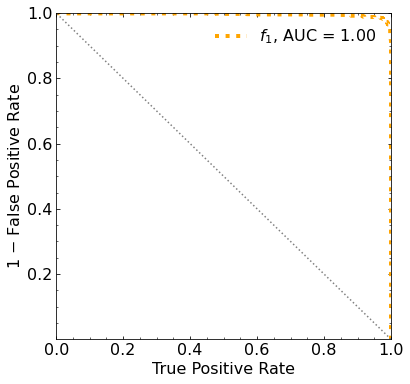

Classification score:


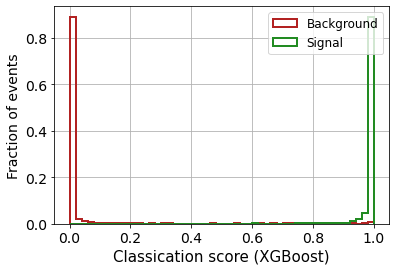


 ROC-AUC =  0.9962513188085141


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 564.09765788 489.33311306 410.62505498 329.60299222
 245.33568001 161.63498924  74.69359778 -15.20067705 -92.50395233]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 369.80236113
 282

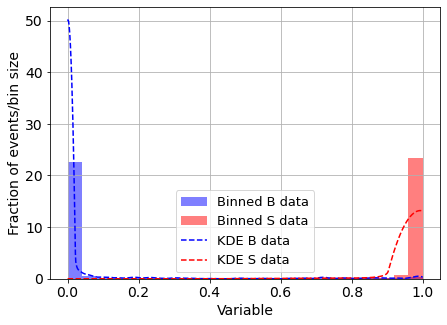

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



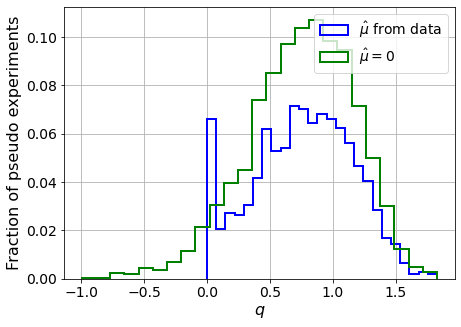

muhat mean:  -6.004074177794766
Z_bins:  0.884417839690382
std Z_bins:  0.223055294256995
Z_bins mu=0:  0.884417839690382
std Z_bins mu=0:  0.2389100521694858

--------

B_expected:  643
S_expected:  1



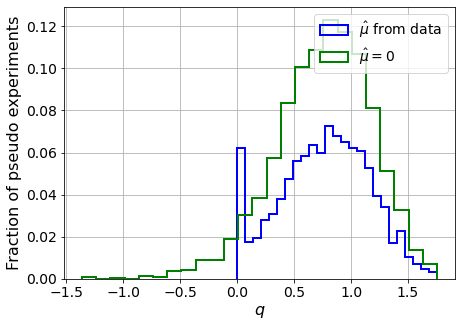

muhat mean:  -5.840007085894211
Z_bins:  0.8877341726414545
std Z_bins:  0.2196024863213715
Z_bins mu=0:  0.8877341726414545
std Z_bins mu=0:  0.23763683443170566

--------

B_expected:  643
S_expected:  1



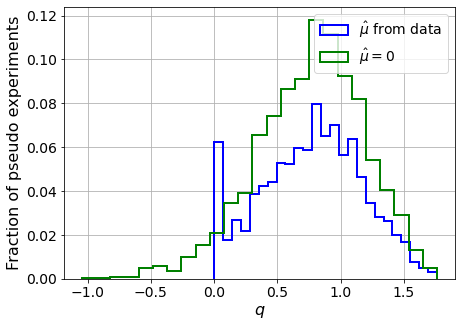

muhat mean:  -5.829532728355985
Z_bins:  0.8930038897469644
std Z_bins:  0.2228715541136419
Z_bins mu=0:  0.8930038897469644
std Z_bins mu=0:  0.23905177542728434

--------

B_expected:  643
S_expected:  1



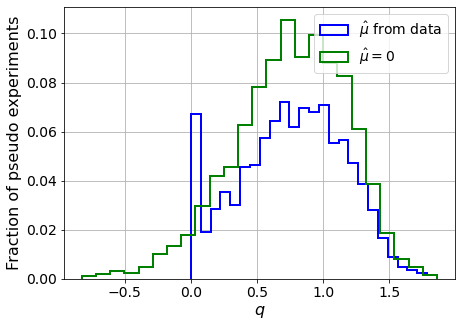

muhat mean:  -6.062252082612555
Z_bins:  0.8815855755080035
std Z_bins:  0.2256443496355336
Z_bins mu=0:  0.8815855755080035
std Z_bins mu=0:  0.240293533101784

--------

B_expected:  643
S_expected:  1



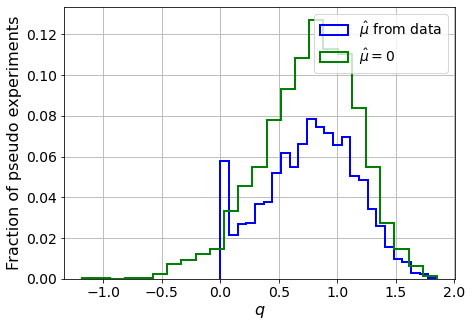

muhat mean:  -5.950398769367646
Z_bins:  0.8920965840040604
std Z_bins:  0.21706007138270728
Z_bins mu=0:  0.8920965840040604
std Z_bins mu=0:  0.23166628790008587

--------

B_expected:  643
S_expected:  2



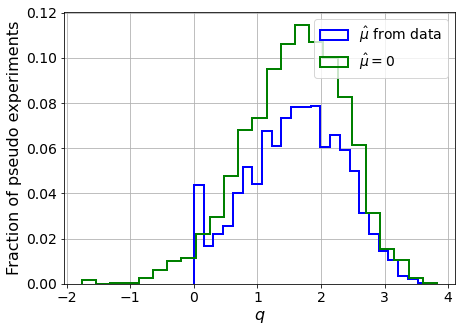

muhat mean:  -2.86306360301181
Z_bins:  1.280916679499292
std Z_bins:  0.2943537466518883
Z_bins mu=0:  1.280916679499292
std Z_bins mu=0:  0.3075668358518305

--------

B_expected:  643
S_expected:  5



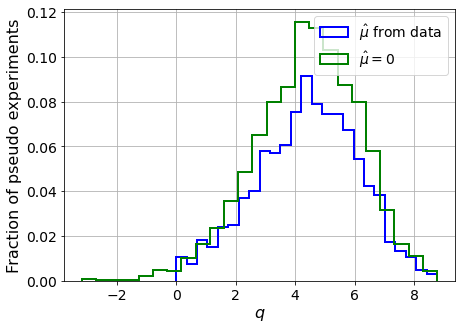

muhat mean:  -1.1013316796941037
Z_bins:  2.1186791804887295
std Z_bins:  0.40042195591405744
Z_bins mu=0:  2.1186791804887295
std Z_bins mu=0:  0.41210594235385206

--------

B_expected:  643
S_expected:  10



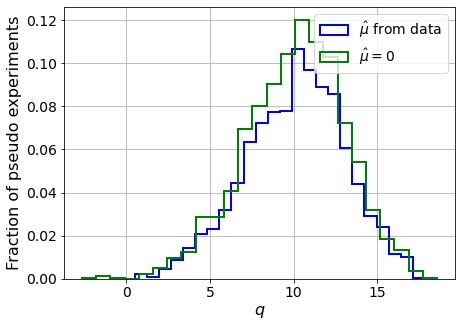

muhat mean:  -0.5591007337118261
Z_bins:  3.2027393184922257
std Z_bins:  0.46514432609150563
Z_bins mu=0:  3.2027393184922257
std Z_bins mu=0:  0.472196510591528

--------

B_expected:  643
S_expected:  22



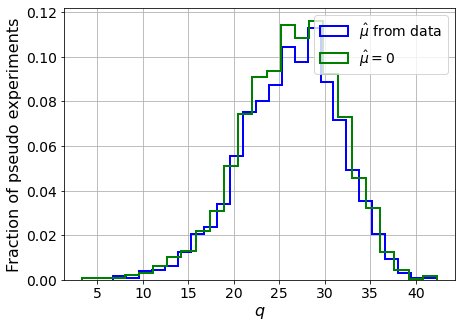

muhat mean:  -0.26164735561228286
Z_bins:  5.150591032782283
std Z_bins:  0.5222554449313964
Z_bins mu=0:  5.150591032782283
std Z_bins mu=0:  0.5289261562516447

--------

B_expected:  643
S_expected:  47



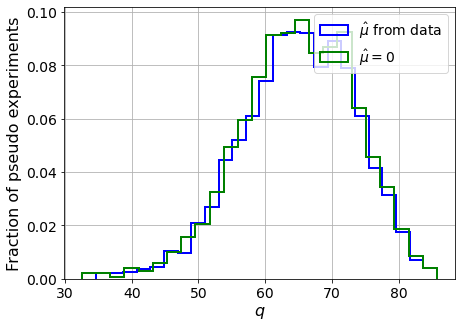

muhat mean:  -0.12205661538047605
Z_bins:  8.084301966607807
std Z_bins:  0.5246209953607667
Z_bins mu=0:  8.084301966607807
std Z_bins mu=0:  0.5281447274451971

--------


 FINAL RESULT:

[[0.884417839690382, 0.223055294256995, -6.004074177794766, 0.884417839690382, 0.2389100521694858], [0.8877341726414545, 0.2196024863213715, -5.840007085894211, 0.8877341726414545, 0.23763683443170566], [0.8930038897469644, 0.2228715541136419, -5.829532728355985, 0.8930038897469644, 0.23905177542728434], [0.8815855755080035, 0.2256443496355336, -6.062252082612555, 0.8815855755080035, 0.240293533101784], [0.8920965840040604, 0.21706007138270728, -5.950398769367646, 0.8920965840040604, 0.23166628790008587], [1.280916679499292, 0.2943537466518883, -2.86306360301181, 1.280916679499292, 0.3075668358518305], [2.1186791804887295, 0.40042195591405744, -1.1013316796941037, 2.1186791804887295, 0.41210594235385206], [3.2027393184922257, 0.46514432609150563, -0.5591007337118261, 3.2027393184922257, 0.4721965105

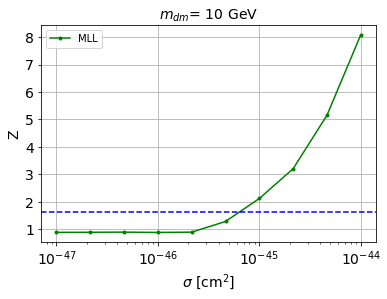


cross_MLL_164:  6.680588402119633e-46
cross_MLL_164_up:  4.9548423250451545e-46
cross_MLL_164_down:  9.309126829276623e-46

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sh

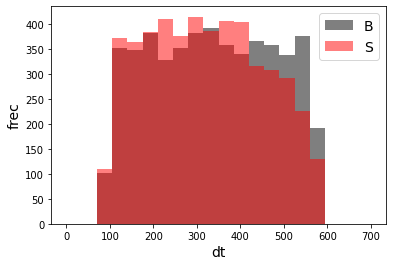

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68595	validation_1-logloss:0.68641
[1]	validation_0-logloss:0.67887	validation_1-logloss:0.67972
[2]	validation_0-logloss:0.67196	validation_1-logloss:0.67316
[3]	validation_0-logloss:0.66516	validation_1-logloss:0.66664
[4]	validation_0-logloss:0.65844	validation_1-logloss:0.66016
[5]	validation_0-logloss:0.65187	validation_1-logloss:0.65373
[6]	validation_0-logloss:0.64542	validation_1-logloss:0.64777
[7]	validation_0-logloss:0.63911	validation_1-logloss:0.64181
[8]	validation_0-logloss:0.63286	validation_1-logloss:0.63575
[9]	validation_0-logloss:0.62673	validation_1-logloss:0.63018
[10]	validation_0-logloss:0.62074	validation_1-logloss:0.62450
[11]	validation_0-logloss:0.61480	validation_1-logloss:0.61899
[12]	validation_0-logloss:0.60899	validation_1-logloss:0.61341
[13]	validation_0-logloss:0.60329	validation_1-logloss:0.60811
[14]	validation_0-logloss:0.59768	validation_1-logloss:0.60283
[15]	validation_0-logloss:0.59214	validation_1-logloss:0.59771
[1

[130]	validation_0-logloss:0.26306	validation_1-logloss:0.30302
[131]	validation_0-logloss:0.26159	validation_1-logloss:0.30188
[132]	validation_0-logloss:0.26019	validation_1-logloss:0.30057
[133]	validation_0-logloss:0.25876	validation_1-logloss:0.29946
[134]	validation_0-logloss:0.25733	validation_1-logloss:0.29827
[135]	validation_0-logloss:0.25587	validation_1-logloss:0.29700
[136]	validation_0-logloss:0.25448	validation_1-logloss:0.29584
[137]	validation_0-logloss:0.25310	validation_1-logloss:0.29468
[138]	validation_0-logloss:0.25168	validation_1-logloss:0.29346
[139]	validation_0-logloss:0.25036	validation_1-logloss:0.29243
[140]	validation_0-logloss:0.24904	validation_1-logloss:0.29128
[141]	validation_0-logloss:0.24773	validation_1-logloss:0.29024
[142]	validation_0-logloss:0.24635	validation_1-logloss:0.28906
[143]	validation_0-logloss:0.24508	validation_1-logloss:0.28806
[144]	validation_0-logloss:0.24380	validation_1-logloss:0.28706
[145]	validation_0-logloss:0.24256	valid

[259]	validation_0-logloss:0.14245	validation_1-logloss:0.20922
[260]	validation_0-logloss:0.14183	validation_1-logloss:0.20881
[261]	validation_0-logloss:0.14122	validation_1-logloss:0.20833
[262]	validation_0-logloss:0.14068	validation_1-logloss:0.20792
[263]	validation_0-logloss:0.14010	validation_1-logloss:0.20743
[264]	validation_0-logloss:0.13949	validation_1-logloss:0.20701
[265]	validation_0-logloss:0.13892	validation_1-logloss:0.20664
[266]	validation_0-logloss:0.13834	validation_1-logloss:0.20624
[267]	validation_0-logloss:0.13773	validation_1-logloss:0.20584
[268]	validation_0-logloss:0.13712	validation_1-logloss:0.20538
[269]	validation_0-logloss:0.13659	validation_1-logloss:0.20493
[270]	validation_0-logloss:0.13602	validation_1-logloss:0.20455
[271]	validation_0-logloss:0.13542	validation_1-logloss:0.20411
[272]	validation_0-logloss:0.13486	validation_1-logloss:0.20375
[273]	validation_0-logloss:0.13433	validation_1-logloss:0.20342
[274]	validation_0-logloss:0.13376	valid

[388]	validation_0-logloss:0.08657	validation_1-logloss:0.17117
[389]	validation_0-logloss:0.08624	validation_1-logloss:0.17107
[390]	validation_0-logloss:0.08593	validation_1-logloss:0.17084
[391]	validation_0-logloss:0.08562	validation_1-logloss:0.17066
[392]	validation_0-logloss:0.08534	validation_1-logloss:0.17059
[393]	validation_0-logloss:0.08504	validation_1-logloss:0.17040
[394]	validation_0-logloss:0.08473	validation_1-logloss:0.17021
[395]	validation_0-logloss:0.08445	validation_1-logloss:0.17016
[396]	validation_0-logloss:0.08411	validation_1-logloss:0.17002
[397]	validation_0-logloss:0.08381	validation_1-logloss:0.16985
[398]	validation_0-logloss:0.08351	validation_1-logloss:0.16968
[399]	validation_0-logloss:0.08321	validation_1-logloss:0.16947
[400]	validation_0-logloss:0.08289	validation_1-logloss:0.16932
[401]	validation_0-logloss:0.08259	validation_1-logloss:0.16908
[402]	validation_0-logloss:0.08233	validation_1-logloss:0.16898
[403]	validation_0-logloss:0.08204	valid

[517]	validation_0-logloss:0.05706	validation_1-logloss:0.15469
[518]	validation_0-logloss:0.05689	validation_1-logloss:0.15463
[519]	validation_0-logloss:0.05672	validation_1-logloss:0.15453
[520]	validation_0-logloss:0.05654	validation_1-logloss:0.15447
[521]	validation_0-logloss:0.05637	validation_1-logloss:0.15436
[522]	validation_0-logloss:0.05618	validation_1-logloss:0.15418
[523]	validation_0-logloss:0.05598	validation_1-logloss:0.15405
[524]	validation_0-logloss:0.05580	validation_1-logloss:0.15401
[525]	validation_0-logloss:0.05564	validation_1-logloss:0.15400
[526]	validation_0-logloss:0.05546	validation_1-logloss:0.15396
[527]	validation_0-logloss:0.05528	validation_1-logloss:0.15390
[528]	validation_0-logloss:0.05511	validation_1-logloss:0.15381
[529]	validation_0-logloss:0.05495	validation_1-logloss:0.15374
[530]	validation_0-logloss:0.05482	validation_1-logloss:0.15360
[531]	validation_0-logloss:0.05465	validation_1-logloss:0.15358
[532]	validation_0-logloss:0.05450	valid

[646]	validation_0-logloss:0.03950	validation_1-logloss:0.14742
[647]	validation_0-logloss:0.03936	validation_1-logloss:0.14732
[648]	validation_0-logloss:0.03926	validation_1-logloss:0.14725
[649]	validation_0-logloss:0.03915	validation_1-logloss:0.14726
[650]	validation_0-logloss:0.03905	validation_1-logloss:0.14727
[651]	validation_0-logloss:0.03895	validation_1-logloss:0.14719
[652]	validation_0-logloss:0.03886	validation_1-logloss:0.14720
[653]	validation_0-logloss:0.03874	validation_1-logloss:0.14718
[654]	validation_0-logloss:0.03865	validation_1-logloss:0.14722
[655]	validation_0-logloss:0.03854	validation_1-logloss:0.14722
[656]	validation_0-logloss:0.03843	validation_1-logloss:0.14724
[657]	validation_0-logloss:0.03834	validation_1-logloss:0.14723
[658]	validation_0-logloss:0.03823	validation_1-logloss:0.14715
[659]	validation_0-logloss:0.03815	validation_1-logloss:0.14704
[660]	validation_0-logloss:0.03806	validation_1-logloss:0.14705
[661]	validation_0-logloss:0.03796	valid

[775]	validation_0-logloss:0.02862	validation_1-logloss:0.14443
[776]	validation_0-logloss:0.02856	validation_1-logloss:0.14442
[777]	validation_0-logloss:0.02849	validation_1-logloss:0.14445
[778]	validation_0-logloss:0.02843	validation_1-logloss:0.14442
[779]	validation_0-logloss:0.02836	validation_1-logloss:0.14446
[780]	validation_0-logloss:0.02830	validation_1-logloss:0.14446
[781]	validation_0-logloss:0.02824	validation_1-logloss:0.14449
[782]	validation_0-logloss:0.02815	validation_1-logloss:0.14450
[783]	validation_0-logloss:0.02807	validation_1-logloss:0.14441
[784]	validation_0-logloss:0.02802	validation_1-logloss:0.14447
[785]	validation_0-logloss:0.02796	validation_1-logloss:0.14447
[786]	validation_0-logloss:0.02789	validation_1-logloss:0.14445
[787]	validation_0-logloss:0.02780	validation_1-logloss:0.14441
[788]	validation_0-logloss:0.02773	validation_1-logloss:0.14435
[789]	validation_0-logloss:0.02766	validation_1-logloss:0.14439
[790]	validation_0-logloss:0.02761	valid

[904]	validation_0-logloss:0.02124	validation_1-logloss:0.14397
[905]	validation_0-logloss:0.02119	validation_1-logloss:0.14394
[906]	validation_0-logloss:0.02114	validation_1-logloss:0.14391
[907]	validation_0-logloss:0.02110	validation_1-logloss:0.14388
[908]	validation_0-logloss:0.02105	validation_1-logloss:0.14391
[909]	validation_0-logloss:0.02100	validation_1-logloss:0.14397
[910]	validation_0-logloss:0.02097	validation_1-logloss:0.14398
[911]	validation_0-logloss:0.02092	validation_1-logloss:0.14403
[912]	validation_0-logloss:0.02087	validation_1-logloss:0.14406
[913]	validation_0-logloss:0.02082	validation_1-logloss:0.14404
[914]	validation_0-logloss:0.02077	validation_1-logloss:0.14411
[915]	validation_0-logloss:0.02072	validation_1-logloss:0.14408
[916]	validation_0-logloss:0.02068	validation_1-logloss:0.14408
[917]	validation_0-logloss:0.02063	validation_1-logloss:0.14408
[918]	validation_0-logloss:0.02057	validation_1-logloss:0.14402
[919]	validation_0-logloss:0.02054	valid

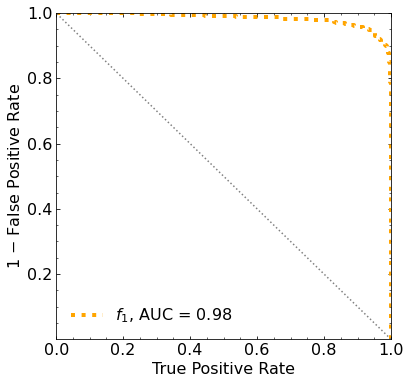

Classification score:


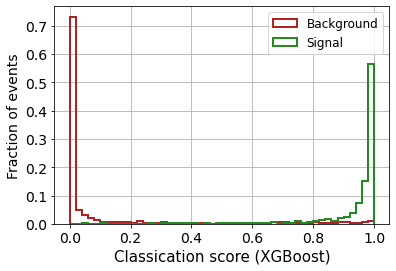


 ROC-AUC =  0.9837325609980948


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  372.86582013  315.15877366  255.00222324
  187.91594939  116.79197743   41.38952853  -36.00470431 -101.5936452 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -i

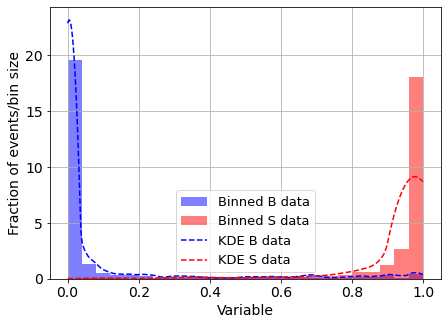

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



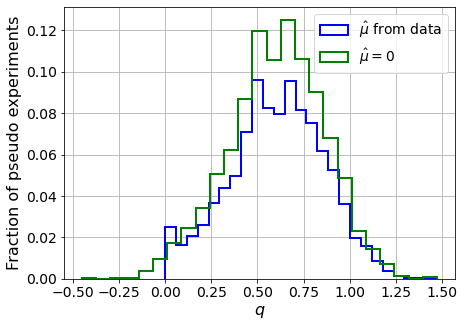

muhat mean:  -11.873407546408572
Z_bins:  0.7832289406412285
std Z_bins:  0.16343801776402714
Z_bins mu=0:  0.7832289406412285
std Z_bins mu=0:  0.16534007703610057

--------

B_expected:  643
S_expected:  2



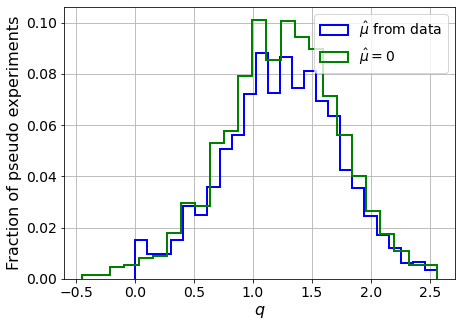

muhat mean:  -5.982071769267675
Z_bins:  1.1225546602737355
std Z_bins:  0.2164706834051734
Z_bins mu=0:  1.1225546602737355
std Z_bins mu=0:  0.21893545536453132

--------

B_expected:  643
S_expected:  4



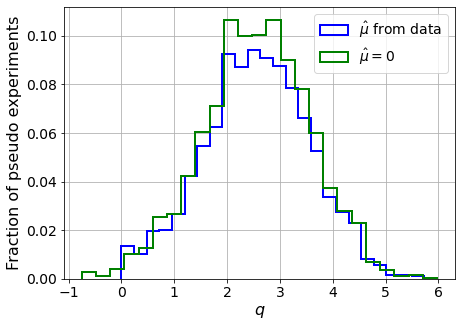

muhat mean:  -2.9461383532010097
Z_bins:  1.606236632558553
std Z_bins:  0.3123563747654114
Z_bins mu=0:  1.606236632558553
std Z_bins mu=0:  0.3150117220163548

--------

B_expected:  643
S_expected:  9



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


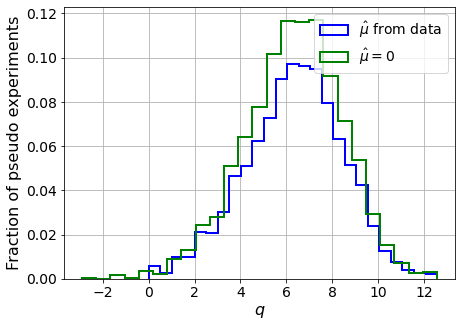

muhat mean:  -1.271524159014087
Z_bins:  2.534191410542699
std Z_bins:  0.41791268374201257
Z_bins mu=0:  2.534191410542699
std Z_bins mu=0:  0.4220657109500802

--------

B_expected:  643
S_expected:  18



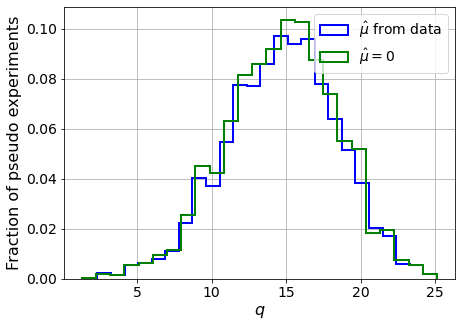

muhat mean:  -0.6695168739307361
Z_bins:  3.8559166764525203
std Z_bins:  0.48454913095891905
Z_bins mu=0:  3.8559166764525203
std Z_bins mu=0:  0.4857233397525384

--------

B_expected:  643
S_expected:  40



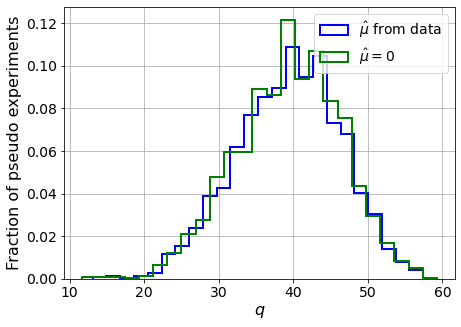

muhat mean:  -0.2986750786714174
Z_bins:  6.304435931237291
std Z_bins:  0.5551465481113819
Z_bins mu=0:  6.304435931237291
std Z_bins mu=0:  0.5562019389615436

--------

B_expected:  643
S_expected:  85



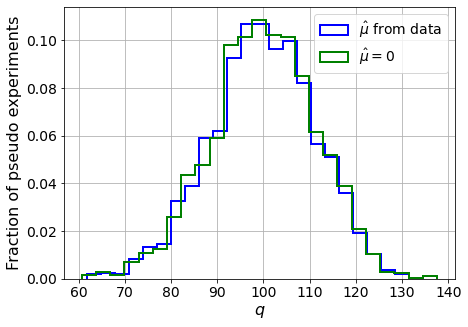

muhat mean:  -0.13946658871092893
Z_bins:  10.000441426490724
std Z_bins:  0.5686384136100885
Z_bins mu=0:  10.000441426490724
std Z_bins mu=0:  0.5690973886601952

--------

B_expected:  643
S_expected:  184



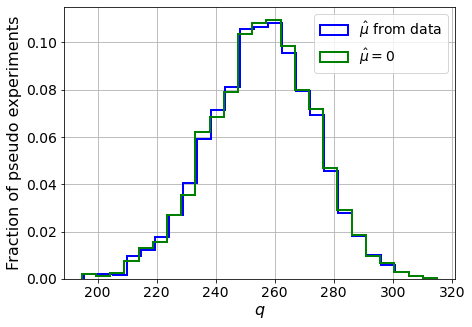

muhat mean:  -0.06493045636523719
Z_bins:  16.000942564383745
std Z_bins:  0.5572343204423172
Z_bins mu=0:  16.000942564383745
std Z_bins mu=0:  0.5574744528672106

--------

B_expected:  643
S_expected:  396



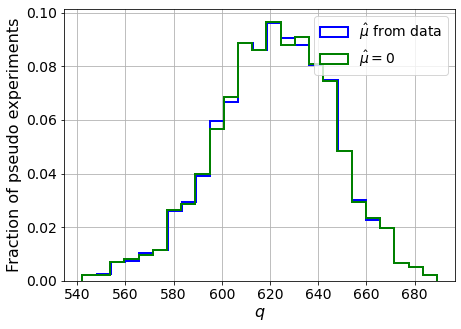

muhat mean:  -0.030966637001108296
Z_bins:  24.948487694597937
std Z_bins:  0.49129476218147844
Z_bins mu=0:  24.948487694597937
std Z_bins mu=0:  0.49139131584725987

--------

B_expected:  643
S_expected:  854



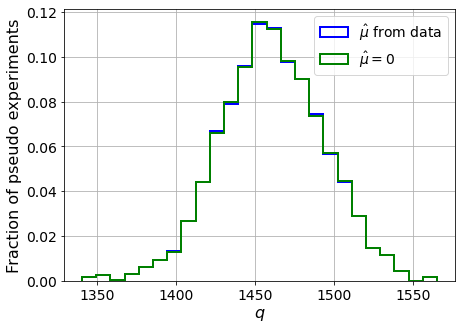

muhat mean:  -0.014026268405316128
Z_bins:  38.21776020244951
std Z_bins:  0.42614276384685035
Z_bins mu=0:  38.21776020244951
std Z_bins mu=0:  0.4262647091060634

--------


 FINAL RESULT:

[[0.7832289406412285, 0.16343801776402714, -11.873407546408572, 0.7832289406412285, 0.16534007703610057], [1.1225546602737355, 0.2164706834051734, -5.982071769267675, 1.1225546602737355, 0.21893545536453132], [1.606236632558553, 0.3123563747654114, -2.9461383532010097, 1.606236632558553, 0.3150117220163548], [2.534191410542699, 0.41791268374201257, -1.271524159014087, 2.534191410542699, 0.4220657109500802], [3.8559166764525203, 0.48454913095891905, -0.6695168739307361, 3.8559166764525203, 0.4857233397525384], [6.304435931237291, 0.5551465481113819, -0.2986750786714174, 6.304435931237291, 0.5562019389615436], [10.000441426490724, 0.5686384136100885, -0.13946658871092893, 10.000441426490724, 0.5690973886601952], [16.000942564383745, 0.5572343204423172, -0.06493045636523719, 16.000942564383745, 0.557

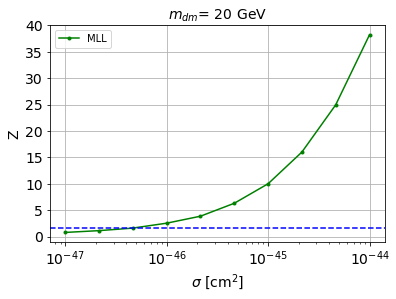


cross_MLL_164:  4.814023253953184e-47
cross_MLL_164_up:  3.409543732288752e-47
cross_MLL_164_down:  6.722485458576336e-47

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

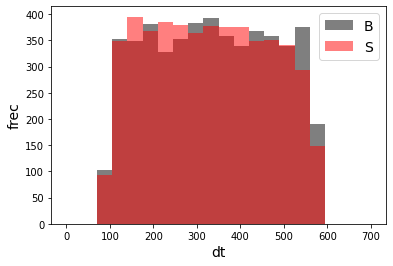

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68709	validation_1-logloss:0.68757
[1]	validation_0-logloss:0.68115	validation_1-logloss:0.68210
[2]	validation_0-logloss:0.67533	validation_1-logloss:0.67669
[3]	validation_0-logloss:0.66965	validation_1-logloss:0.67156
[4]	validation_0-logloss:0.66405	validation_1-logloss:0.66632
[5]	validation_0-logloss:0.65853	validation_1-logloss:0.66137
[6]	validation_0-logloss:0.65313	validation_1-logloss:0.65635
[7]	validation_0-logloss:0.64775	validation_1-logloss:0.65148
[8]	validation_0-logloss:0.64248	validation_1-logloss:0.64672
[9]	validation_0-logloss:0.63732	validation_1-logloss:0.64194
[10]	validation_0-logloss:0.63231	validation_1-logloss:0.63740
[11]	validation_0-logloss:0.62730	validation_1-logloss:0.63283
[12]	validation_0-logloss:0.62234	validation_1-logloss:0.62839
[13]	validation_0-logloss:0.61749	validation_1-logloss:0.62402
[14]	validation_0-logloss:0.61265	validation_1-logloss:0.61972
[15]	validation_0-logloss:0.60801	validation_1-logloss:0.61540
[1

[130]	validation_0-logloss:0.32350	validation_1-logloss:0.37329
[131]	validation_0-logloss:0.32210	validation_1-logloss:0.37239
[132]	validation_0-logloss:0.32074	validation_1-logloss:0.37144
[133]	validation_0-logloss:0.31944	validation_1-logloss:0.37033
[134]	validation_0-logloss:0.31817	validation_1-logloss:0.36928
[135]	validation_0-logloss:0.31683	validation_1-logloss:0.36827
[136]	validation_0-logloss:0.31555	validation_1-logloss:0.36724
[137]	validation_0-logloss:0.31424	validation_1-logloss:0.36627
[138]	validation_0-logloss:0.31294	validation_1-logloss:0.36533
[139]	validation_0-logloss:0.31169	validation_1-logloss:0.36444
[140]	validation_0-logloss:0.31041	validation_1-logloss:0.36331
[141]	validation_0-logloss:0.30920	validation_1-logloss:0.36238
[142]	validation_0-logloss:0.30796	validation_1-logloss:0.36137
[143]	validation_0-logloss:0.30671	validation_1-logloss:0.36044
[144]	validation_0-logloss:0.30547	validation_1-logloss:0.35962
[145]	validation_0-logloss:0.30426	valid

[259]	validation_0-logloss:0.20758	validation_1-logloss:0.29359
[260]	validation_0-logloss:0.20700	validation_1-logloss:0.29317
[261]	validation_0-logloss:0.20636	validation_1-logloss:0.29285
[262]	validation_0-logloss:0.20580	validation_1-logloss:0.29256
[263]	validation_0-logloss:0.20520	validation_1-logloss:0.29240
[264]	validation_0-logloss:0.20460	validation_1-logloss:0.29213
[265]	validation_0-logloss:0.20408	validation_1-logloss:0.29188
[266]	validation_0-logloss:0.20347	validation_1-logloss:0.29160
[267]	validation_0-logloss:0.20286	validation_1-logloss:0.29133
[268]	validation_0-logloss:0.20228	validation_1-logloss:0.29118
[269]	validation_0-logloss:0.20172	validation_1-logloss:0.29074
[270]	validation_0-logloss:0.20113	validation_1-logloss:0.29038
[271]	validation_0-logloss:0.20055	validation_1-logloss:0.29002
[272]	validation_0-logloss:0.19993	validation_1-logloss:0.28967
[273]	validation_0-logloss:0.19935	validation_1-logloss:0.28935
[274]	validation_0-logloss:0.19879	valid

[388]	validation_0-logloss:0.14691	validation_1-logloss:0.26519
[389]	validation_0-logloss:0.14657	validation_1-logloss:0.26502
[390]	validation_0-logloss:0.14618	validation_1-logloss:0.26492
[391]	validation_0-logloss:0.14577	validation_1-logloss:0.26484
[392]	validation_0-logloss:0.14543	validation_1-logloss:0.26485
[393]	validation_0-logloss:0.14510	validation_1-logloss:0.26479
[394]	validation_0-logloss:0.14472	validation_1-logloss:0.26470
[395]	validation_0-logloss:0.14439	validation_1-logloss:0.26456
[396]	validation_0-logloss:0.14405	validation_1-logloss:0.26445
[397]	validation_0-logloss:0.14369	validation_1-logloss:0.26432
[398]	validation_0-logloss:0.14336	validation_1-logloss:0.26427
[399]	validation_0-logloss:0.14298	validation_1-logloss:0.26412
[400]	validation_0-logloss:0.14262	validation_1-logloss:0.26398
[401]	validation_0-logloss:0.14229	validation_1-logloss:0.26391
[402]	validation_0-logloss:0.14199	validation_1-logloss:0.26372
[403]	validation_0-logloss:0.14166	valid

[517]	validation_0-logloss:0.10961	validation_1-logloss:0.25359
[518]	validation_0-logloss:0.10937	validation_1-logloss:0.25354
[519]	validation_0-logloss:0.10913	validation_1-logloss:0.25348
[520]	validation_0-logloss:0.10889	validation_1-logloss:0.25341
[521]	validation_0-logloss:0.10867	validation_1-logloss:0.25324
[522]	validation_0-logloss:0.10845	validation_1-logloss:0.25315
[523]	validation_0-logloss:0.10822	validation_1-logloss:0.25301
[524]	validation_0-logloss:0.10802	validation_1-logloss:0.25303
[525]	validation_0-logloss:0.10782	validation_1-logloss:0.25288
[526]	validation_0-logloss:0.10758	validation_1-logloss:0.25282
[527]	validation_0-logloss:0.10738	validation_1-logloss:0.25274
[528]	validation_0-logloss:0.10716	validation_1-logloss:0.25272
[529]	validation_0-logloss:0.10698	validation_1-logloss:0.25270
[530]	validation_0-logloss:0.10676	validation_1-logloss:0.25263
[531]	validation_0-logloss:0.10654	validation_1-logloss:0.25257
[532]	validation_0-logloss:0.10631	valid

[646]	validation_0-logloss:0.08437	validation_1-logloss:0.24642
[647]	validation_0-logloss:0.08423	validation_1-logloss:0.24637
[648]	validation_0-logloss:0.08406	validation_1-logloss:0.24629
[649]	validation_0-logloss:0.08392	validation_1-logloss:0.24626
[650]	validation_0-logloss:0.08373	validation_1-logloss:0.24618
[651]	validation_0-logloss:0.08360	validation_1-logloss:0.24612
[652]	validation_0-logloss:0.08343	validation_1-logloss:0.24616
[653]	validation_0-logloss:0.08326	validation_1-logloss:0.24611
[654]	validation_0-logloss:0.08309	validation_1-logloss:0.24604
[655]	validation_0-logloss:0.08295	validation_1-logloss:0.24596
[656]	validation_0-logloss:0.08278	validation_1-logloss:0.24594
[657]	validation_0-logloss:0.08262	validation_1-logloss:0.24591
[658]	validation_0-logloss:0.08244	validation_1-logloss:0.24592
[659]	validation_0-logloss:0.08231	validation_1-logloss:0.24589
[660]	validation_0-logloss:0.08210	validation_1-logloss:0.24584
[661]	validation_0-logloss:0.08193	valid

[775]	validation_0-logloss:0.06605	validation_1-logloss:0.24271
[776]	validation_0-logloss:0.06592	validation_1-logloss:0.24273
[777]	validation_0-logloss:0.06580	validation_1-logloss:0.24267
[778]	validation_0-logloss:0.06570	validation_1-logloss:0.24272
[779]	validation_0-logloss:0.06558	validation_1-logloss:0.24267
[780]	validation_0-logloss:0.06546	validation_1-logloss:0.24262
[781]	validation_0-logloss:0.06533	validation_1-logloss:0.24257
[782]	validation_0-logloss:0.06524	validation_1-logloss:0.24254
[783]	validation_0-logloss:0.06511	validation_1-logloss:0.24249
[784]	validation_0-logloss:0.06498	validation_1-logloss:0.24240
[785]	validation_0-logloss:0.06484	validation_1-logloss:0.24238
[786]	validation_0-logloss:0.06471	validation_1-logloss:0.24236
[787]	validation_0-logloss:0.06458	validation_1-logloss:0.24236
[788]	validation_0-logloss:0.06444	validation_1-logloss:0.24233
[789]	validation_0-logloss:0.06431	validation_1-logloss:0.24233
[790]	validation_0-logloss:0.06417	valid

[904]	validation_0-logloss:0.05276	validation_1-logloss:0.24139
[905]	validation_0-logloss:0.05266	validation_1-logloss:0.24140
[906]	validation_0-logloss:0.05256	validation_1-logloss:0.24140
[907]	validation_0-logloss:0.05245	validation_1-logloss:0.24140
[908]	validation_0-logloss:0.05235	validation_1-logloss:0.24139
[909]	validation_0-logloss:0.05228	validation_1-logloss:0.24134
[910]	validation_0-logloss:0.05218	validation_1-logloss:0.24131
[911]	validation_0-logloss:0.05209	validation_1-logloss:0.24129
[912]	validation_0-logloss:0.05199	validation_1-logloss:0.24128
[913]	validation_0-logloss:0.05189	validation_1-logloss:0.24126
[914]	validation_0-logloss:0.05181	validation_1-logloss:0.24123
[915]	validation_0-logloss:0.05172	validation_1-logloss:0.24127
[916]	validation_0-logloss:0.05161	validation_1-logloss:0.24130
[917]	validation_0-logloss:0.05154	validation_1-logloss:0.24129
[918]	validation_0-logloss:0.05145	validation_1-logloss:0.24132
[919]	validation_0-logloss:0.05136	valid

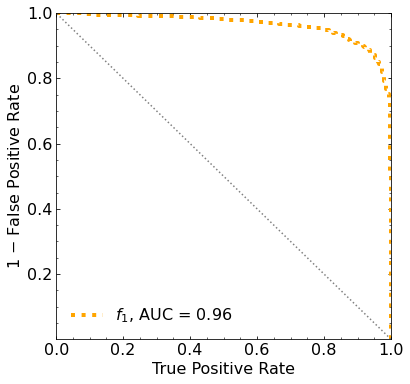

Classification score:


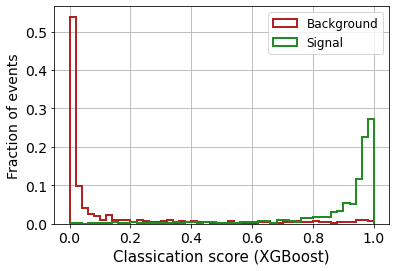


 ROC-AUC =  0.9640989592936309


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  285.00997992  255.29006473  218.19349732  173.50135769
  125.40759443   71.57525343   13.16385934  -50.20999846 -106.89469006]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -i

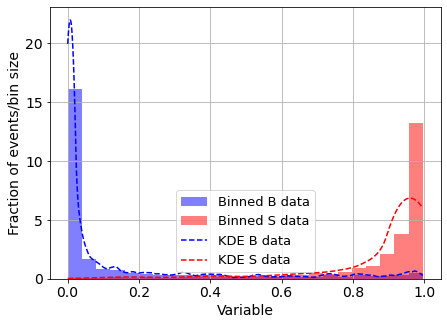

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



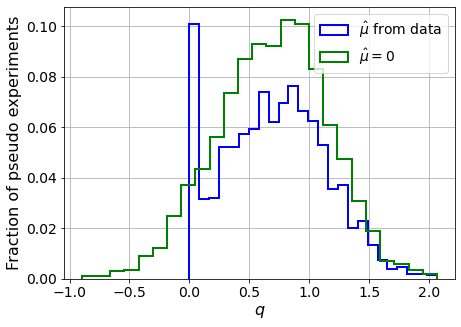

muhat mean:  -4.753683958486574
Z_bins:  0.844247679505955
std Z_bins:  0.2542877541495349
Z_bins mu=0:  0.844247679505955
std Z_bins mu=0:  0.2718753948845476

--------

B_expected:  643
S_expected:  4



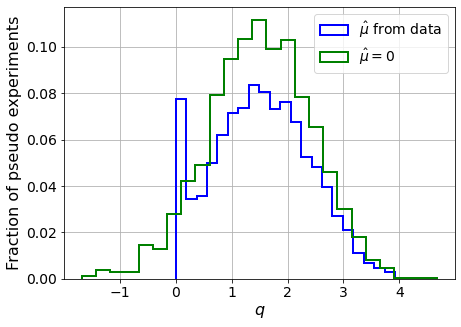

muhat mean:  -2.414028849013479
Z_bins:  1.2353950988483815
std Z_bins:  0.34987837168923214
Z_bins mu=0:  1.2353950988483815
std Z_bins mu=0:  0.3718169550049061

--------

B_expected:  643
S_expected:  8



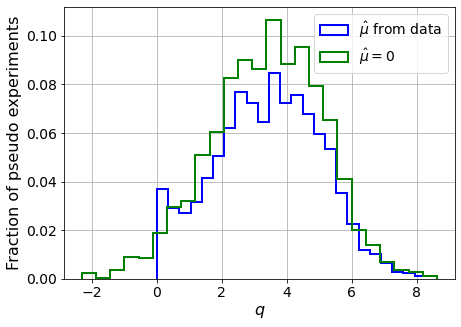

muhat mean:  -1.1876614491780952
Z_bins:  1.8636015164672208
std Z_bins:  0.44263961518407224
Z_bins mu=0:  1.8636015164672208
std Z_bins mu=0:  0.4591774205418486

--------

B_expected:  643
S_expected:  18



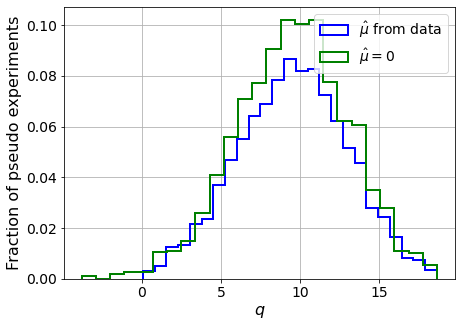

muhat mean:  -0.5386876496380798
Z_bins:  3.101824131689494
std Z_bins:  0.5584795485095262
Z_bins mu=0:  3.101824131689494
std Z_bins mu=0:  0.5695156776024084

--------

B_expected:  643
S_expected:  39



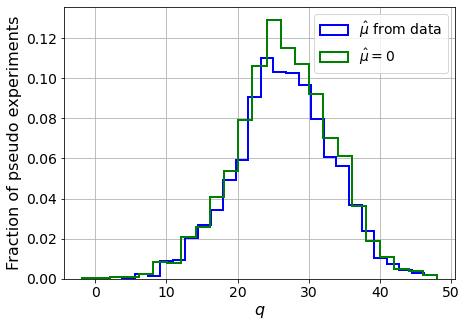

muhat mean:  -0.245715283650301
Z_bins:  5.148971629706781
std Z_bins:  0.6595973945243946
Z_bins mu=0:  5.148971629706781
std Z_bins mu=0:  0.6686191461102633

--------

B_expected:  643
S_expected:  83



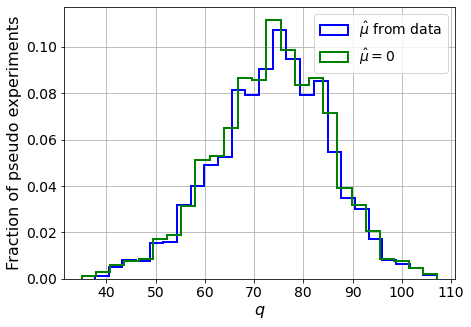

muhat mean:  -0.11693509949087819
Z_bins:  8.622928922864867
std Z_bins:  0.6709077503458328
Z_bins mu=0:  8.622928922864867
std Z_bins mu=0:  0.6759683952280664

--------

B_expected:  643
S_expected:  179



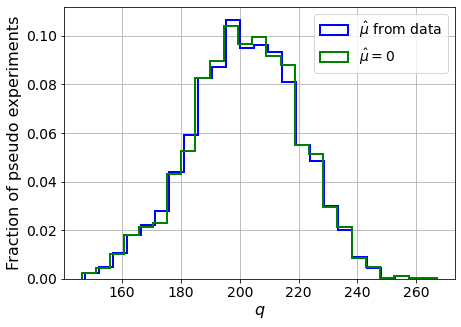

muhat mean:  -0.05469461216300226
Z_bins:  14.213869795822124
std Z_bins:  0.6442279623586232
Z_bins mu=0:  14.213869795822124
std Z_bins mu=0:  0.6464179968133785

--------

B_expected:  643
S_expected:  385



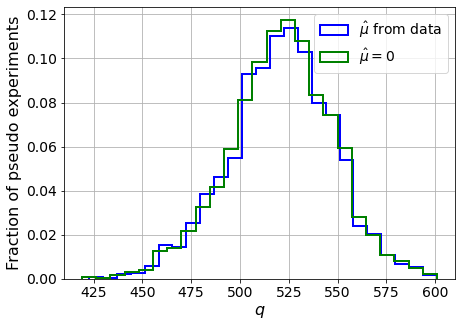

muhat mean:  -0.024854924230209758
Z_bins:  22.849444589607685
std Z_bins:  0.5815686444606283
Z_bins mu=0:  22.849444589607685
std Z_bins mu=0:  0.5832691071050751

--------

B_expected:  643
S_expected:  830



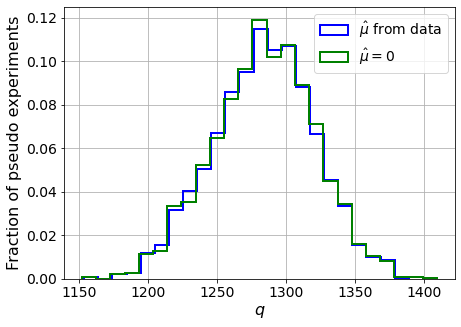

muhat mean:  -0.011745990852022764
Z_bins:  35.84858206034749
std Z_bins:  0.5143726599657795
Z_bins mu=0:  35.84858206034749
std Z_bins mu=0:  0.5151714404517771

--------

B_expected:  643
S_expected:  1787



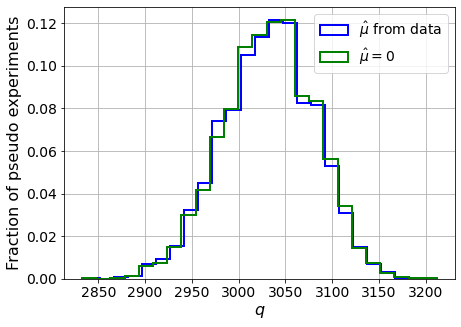

muhat mean:  -0.005470030859621455
Z_bins:  55.08905875082594
std Z_bins:  0.44545846254409827
Z_bins mu=0:  55.08905875082594
std Z_bins mu=0:  0.4460337203302302

--------


 FINAL RESULT:

[[0.844247679505955, 0.2542877541495349, -4.753683958486574, 0.844247679505955, 0.2718753948845476], [1.2353950988483815, 0.34987837168923214, -2.414028849013479, 1.2353950988483815, 0.3718169550049061], [1.8636015164672208, 0.44263961518407224, -1.1876614491780952, 1.8636015164672208, 0.4591774205418486], [3.101824131689494, 0.5584795485095262, -0.5386876496380798, 3.101824131689494, 0.5695156776024084], [5.148971629706781, 0.6595973945243946, -0.245715283650301, 5.148971629706781, 0.6686191461102633], [8.622928922864867, 0.6709077503458328, -0.11693509949087819, 8.622928922864867, 0.6759683952280664], [14.213869795822124, 0.6442279623586232, -0.05469461216300226, 14.213869795822124, 0.6464179968133785], [22.849444589607685, 0.5815686444606283, -0.024854924230209758, 22.849444589607685, 0.5832691

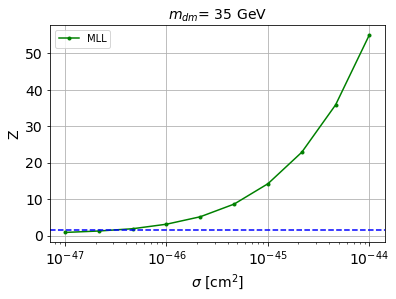


cross_MLL_164:  3.752259240105303e-47
cross_MLL_164_up:  2.316580854555564e-47
cross_MLL_164_down:  5.626821961338216e-47

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

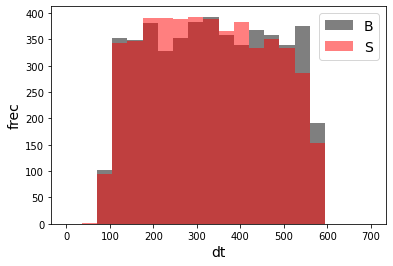

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68756	validation_1-logloss:0.68827
[1]	validation_0-logloss:0.68205	validation_1-logloss:0.68340
[2]	validation_0-logloss:0.67666	validation_1-logloss:0.67858
[3]	validation_0-logloss:0.67136	validation_1-logloss:0.67389
[4]	validation_0-logloss:0.66616	validation_1-logloss:0.66943
[5]	validation_0-logloss:0.66106	validation_1-logloss:0.66492
[6]	validation_0-logloss:0.65608	validation_1-logloss:0.66043
[7]	validation_0-logloss:0.65117	validation_1-logloss:0.65621
[8]	validation_0-logloss:0.64636	validation_1-logloss:0.65195
[9]	validation_0-logloss:0.64161	validation_1-logloss:0.64773
[10]	validation_0-logloss:0.63694	validation_1-logloss:0.64376
[11]	validation_0-logloss:0.63237	validation_1-logloss:0.63969
[12]	validation_0-logloss:0.62786	validation_1-logloss:0.63577
[13]	validation_0-logloss:0.62345	validation_1-logloss:0.63174
[14]	validation_0-logloss:0.61910	validation_1-logloss:0.62796
[15]	validation_0-logloss:0.61479	validation_1-logloss:0.62423
[1

[130]	validation_0-logloss:0.35243	validation_1-logloss:0.41050
[131]	validation_0-logloss:0.35119	validation_1-logloss:0.40964
[132]	validation_0-logloss:0.34998	validation_1-logloss:0.40883
[133]	validation_0-logloss:0.34874	validation_1-logloss:0.40790
[134]	validation_0-logloss:0.34762	validation_1-logloss:0.40715
[135]	validation_0-logloss:0.34648	validation_1-logloss:0.40623
[136]	validation_0-logloss:0.34529	validation_1-logloss:0.40530
[137]	validation_0-logloss:0.34413	validation_1-logloss:0.40459
[138]	validation_0-logloss:0.34304	validation_1-logloss:0.40376
[139]	validation_0-logloss:0.34186	validation_1-logloss:0.40294
[140]	validation_0-logloss:0.34074	validation_1-logloss:0.40197
[141]	validation_0-logloss:0.33963	validation_1-logloss:0.40116
[142]	validation_0-logloss:0.33847	validation_1-logloss:0.40047
[143]	validation_0-logloss:0.33736	validation_1-logloss:0.39975
[144]	validation_0-logloss:0.33626	validation_1-logloss:0.39896
[145]	validation_0-logloss:0.33520	valid

[259]	validation_0-logloss:0.24195	validation_1-logloss:0.34026
[260]	validation_0-logloss:0.24131	validation_1-logloss:0.33996
[261]	validation_0-logloss:0.24071	validation_1-logloss:0.33960
[262]	validation_0-logloss:0.24014	validation_1-logloss:0.33933
[263]	validation_0-logloss:0.23951	validation_1-logloss:0.33898
[264]	validation_0-logloss:0.23896	validation_1-logloss:0.33871
[265]	validation_0-logloss:0.23835	validation_1-logloss:0.33837
[266]	validation_0-logloss:0.23777	validation_1-logloss:0.33801
[267]	validation_0-logloss:0.23713	validation_1-logloss:0.33773
[268]	validation_0-logloss:0.23653	validation_1-logloss:0.33739
[269]	validation_0-logloss:0.23594	validation_1-logloss:0.33711
[270]	validation_0-logloss:0.23534	validation_1-logloss:0.33665
[271]	validation_0-logloss:0.23475	validation_1-logloss:0.33637
[272]	validation_0-logloss:0.23411	validation_1-logloss:0.33607
[273]	validation_0-logloss:0.23357	validation_1-logloss:0.33583
[274]	validation_0-logloss:0.23300	valid

[388]	validation_0-logloss:0.18024	validation_1-logloss:0.31305
[389]	validation_0-logloss:0.17983	validation_1-logloss:0.31295
[390]	validation_0-logloss:0.17942	validation_1-logloss:0.31288
[391]	validation_0-logloss:0.17902	validation_1-logloss:0.31275
[392]	validation_0-logloss:0.17863	validation_1-logloss:0.31254
[393]	validation_0-logloss:0.17825	validation_1-logloss:0.31239
[394]	validation_0-logloss:0.17797	validation_1-logloss:0.31222
[395]	validation_0-logloss:0.17764	validation_1-logloss:0.31211
[396]	validation_0-logloss:0.17725	validation_1-logloss:0.31189
[397]	validation_0-logloss:0.17693	validation_1-logloss:0.31177
[398]	validation_0-logloss:0.17655	validation_1-logloss:0.31161
[399]	validation_0-logloss:0.17619	validation_1-logloss:0.31151
[400]	validation_0-logloss:0.17581	validation_1-logloss:0.31139
[401]	validation_0-logloss:0.17556	validation_1-logloss:0.31126
[402]	validation_0-logloss:0.17520	validation_1-logloss:0.31108
[403]	validation_0-logloss:0.17485	valid

[517]	validation_0-logloss:0.14014	validation_1-logloss:0.29851
[518]	validation_0-logloss:0.13990	validation_1-logloss:0.29847
[519]	validation_0-logloss:0.13961	validation_1-logloss:0.29838
[520]	validation_0-logloss:0.13938	validation_1-logloss:0.29831
[521]	validation_0-logloss:0.13920	validation_1-logloss:0.29824
[522]	validation_0-logloss:0.13893	validation_1-logloss:0.29812
[523]	validation_0-logloss:0.13867	validation_1-logloss:0.29811
[524]	validation_0-logloss:0.13840	validation_1-logloss:0.29799
[525]	validation_0-logloss:0.13809	validation_1-logloss:0.29790
[526]	validation_0-logloss:0.13790	validation_1-logloss:0.29782
[527]	validation_0-logloss:0.13764	validation_1-logloss:0.29775
[528]	validation_0-logloss:0.13736	validation_1-logloss:0.29765
[529]	validation_0-logloss:0.13710	validation_1-logloss:0.29751
[530]	validation_0-logloss:0.13682	validation_1-logloss:0.29744
[531]	validation_0-logloss:0.13654	validation_1-logloss:0.29738
[532]	validation_0-logloss:0.13624	valid

[646]	validation_0-logloss:0.11141	validation_1-logloss:0.29150
[647]	validation_0-logloss:0.11121	validation_1-logloss:0.29149
[648]	validation_0-logloss:0.11105	validation_1-logloss:0.29153
[649]	validation_0-logloss:0.11090	validation_1-logloss:0.29146
[650]	validation_0-logloss:0.11072	validation_1-logloss:0.29147
[651]	validation_0-logloss:0.11056	validation_1-logloss:0.29146
[652]	validation_0-logloss:0.11043	validation_1-logloss:0.29142
[653]	validation_0-logloss:0.11022	validation_1-logloss:0.29136
[654]	validation_0-logloss:0.11006	validation_1-logloss:0.29130
[655]	validation_0-logloss:0.10987	validation_1-logloss:0.29124
[656]	validation_0-logloss:0.10970	validation_1-logloss:0.29119
[657]	validation_0-logloss:0.10951	validation_1-logloss:0.29121
[658]	validation_0-logloss:0.10930	validation_1-logloss:0.29109
[659]	validation_0-logloss:0.10908	validation_1-logloss:0.29114
[660]	validation_0-logloss:0.10891	validation_1-logloss:0.29119
[661]	validation_0-logloss:0.10873	valid

[775]	validation_0-logloss:0.09050	validation_1-logloss:0.28820
[776]	validation_0-logloss:0.09036	validation_1-logloss:0.28817
[777]	validation_0-logloss:0.09021	validation_1-logloss:0.28819
[778]	validation_0-logloss:0.09006	validation_1-logloss:0.28811
[779]	validation_0-logloss:0.08991	validation_1-logloss:0.28807
[780]	validation_0-logloss:0.08980	validation_1-logloss:0.28812
[781]	validation_0-logloss:0.08967	validation_1-logloss:0.28814
[782]	validation_0-logloss:0.08948	validation_1-logloss:0.28816
[783]	validation_0-logloss:0.08934	validation_1-logloss:0.28819
[784]	validation_0-logloss:0.08920	validation_1-logloss:0.28820
[785]	validation_0-logloss:0.08911	validation_1-logloss:0.28815
[786]	validation_0-logloss:0.08898	validation_1-logloss:0.28812
[787]	validation_0-logloss:0.08885	validation_1-logloss:0.28809
[788]	validation_0-logloss:0.08871	validation_1-logloss:0.28805
[789]	validation_0-logloss:0.08860	validation_1-logloss:0.28804
[790]	validation_0-logloss:0.08850	valid

[904]	validation_0-logloss:0.07428	validation_1-logloss:0.28593
[905]	validation_0-logloss:0.07417	validation_1-logloss:0.28588
[906]	validation_0-logloss:0.07407	validation_1-logloss:0.28580
[907]	validation_0-logloss:0.07396	validation_1-logloss:0.28581
[908]	validation_0-logloss:0.07382	validation_1-logloss:0.28574
[909]	validation_0-logloss:0.07373	validation_1-logloss:0.28576
[910]	validation_0-logloss:0.07364	validation_1-logloss:0.28574
[911]	validation_0-logloss:0.07354	validation_1-logloss:0.28562
[912]	validation_0-logloss:0.07341	validation_1-logloss:0.28564
[913]	validation_0-logloss:0.07328	validation_1-logloss:0.28566
[914]	validation_0-logloss:0.07319	validation_1-logloss:0.28563
[915]	validation_0-logloss:0.07307	validation_1-logloss:0.28567
[916]	validation_0-logloss:0.07296	validation_1-logloss:0.28563
[917]	validation_0-logloss:0.07288	validation_1-logloss:0.28565
[918]	validation_0-logloss:0.07277	validation_1-logloss:0.28561
[919]	validation_0-logloss:0.07264	valid

[1032]	validation_0-logloss:0.06145	validation_1-logloss:0.28388
[1033]	validation_0-logloss:0.06135	validation_1-logloss:0.28390
[1034]	validation_0-logloss:0.06124	validation_1-logloss:0.28402
[1035]	validation_0-logloss:0.06116	validation_1-logloss:0.28401
[1036]	validation_0-logloss:0.06108	validation_1-logloss:0.28401
[1037]	validation_0-logloss:0.06101	validation_1-logloss:0.28400
[1038]	validation_0-logloss:0.06089	validation_1-logloss:0.28401
[1039]	validation_0-logloss:0.06081	validation_1-logloss:0.28399
[1040]	validation_0-logloss:0.06073	validation_1-logloss:0.28402
[1041]	validation_0-logloss:0.06062	validation_1-logloss:0.28400
[1042]	validation_0-logloss:0.06051	validation_1-logloss:0.28404
[1043]	validation_0-logloss:0.06044	validation_1-logloss:0.28398
[1044]	validation_0-logloss:0.06036	validation_1-logloss:0.28400
[1045]	validation_0-logloss:0.06026	validation_1-logloss:0.28397
[1046]	validation_0-logloss:0.06020	validation_1-logloss:0.28395
[1047]	validation_0-loglo

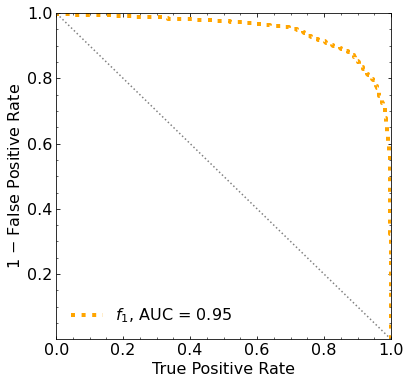

Classification score:


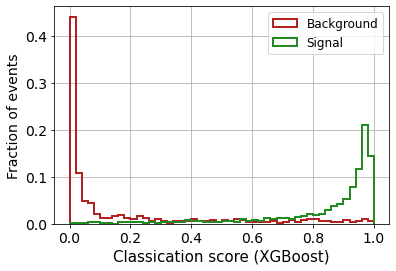


 ROC-AUC =  0.9453853225575153


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  244.9811579   226.58419572  205.20714091  175.52203602  139.43794735
   95.26369988   50.72080784   -0.51488214  -55.1543771  -108.20577205]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 182.70416243 173.73548478 158.601706

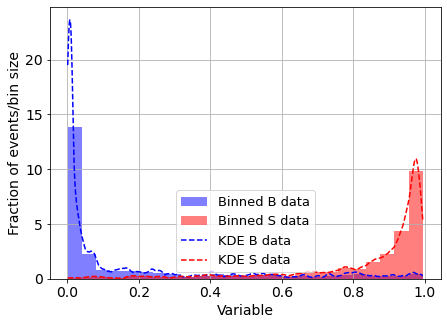

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



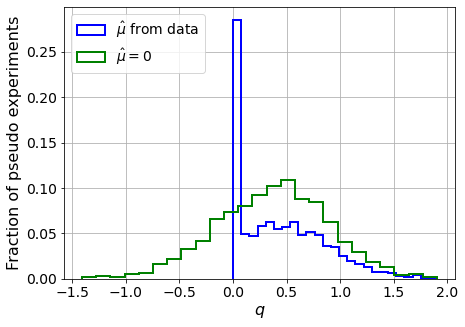

muhat mean:  -1.9052256927809794
Z_bins:  0.6157127914190467
std Z_bins:  0.3296029174758565
Z_bins mu=0:  0.6157127914190467
std Z_bins mu=0:  0.4228883652072028

--------

B_expected:  643
S_expected:  4



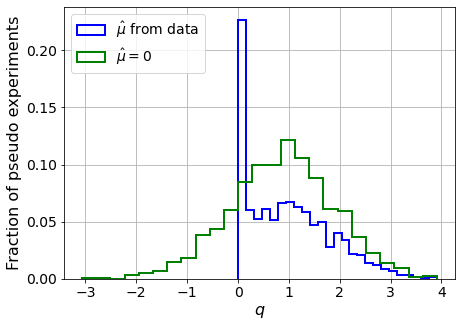

muhat mean:  -0.9563848599542845
Z_bins:  0.9517912181105448
std Z_bins:  0.4391151538635533
Z_bins mu=0:  0.9517912181105448
std Z_bins mu=0:  0.5378510067282062

--------

B_expected:  643
S_expected:  9



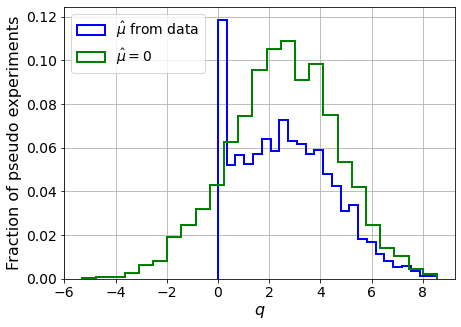

muhat mean:  -0.4017052320616811
Z_bins:  1.6044843710062417
std Z_bins:  0.5704934407331659
Z_bins mu=0:  1.6044843710062417
std Z_bins mu=0:  0.6573902784703961

--------

B_expected:  643
S_expected:  19



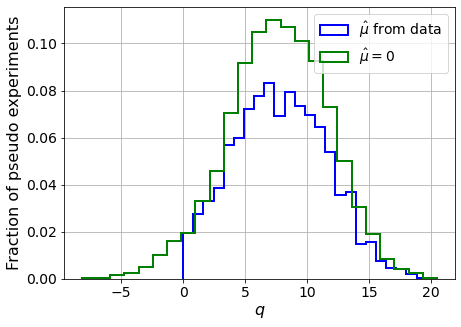

muhat mean:  -0.2011268019076303
Z_bins:  2.777883536604243
std Z_bins:  0.672217909831711
Z_bins mu=0:  2.777883536604243
std Z_bins mu=0:  0.730626621484368

--------

B_expected:  643
S_expected:  41



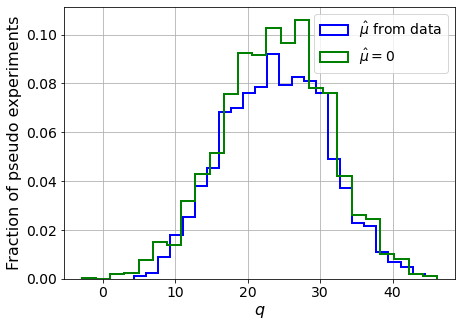

muhat mean:  -0.0912687254832542
Z_bins:  4.894715947255127
std Z_bins:  0.7221380244131593
Z_bins mu=0:  4.894715947255127
std Z_bins mu=0:  0.7532874988435243

--------

B_expected:  643
S_expected:  89



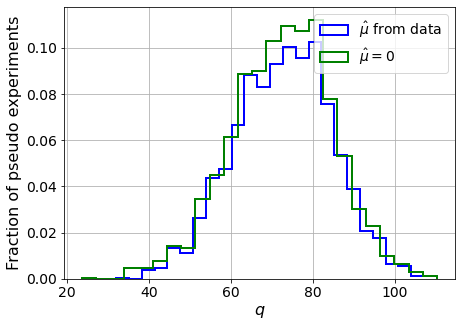

muhat mean:  -0.04337376184409366
Z_bins:  8.561297487490116
std Z_bins:  0.6965107424516968
Z_bins mu=0:  8.561297487490116
std Z_bins mu=0:  0.7159831887493132

--------

B_expected:  643
S_expected:  192



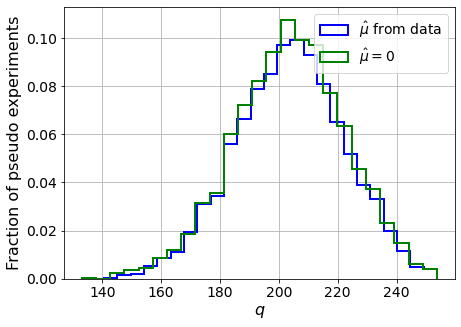

muhat mean:  -0.019460222308197536
Z_bins:  14.286716443657415
std Z_bins:  0.6489160304076409
Z_bins mu=0:  14.286716443657415
std Z_bins mu=0:  0.6604099698569801

--------

B_expected:  643
S_expected:  413



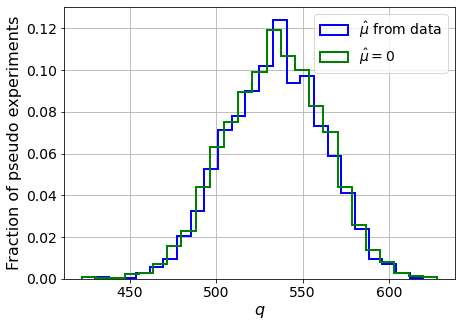

muhat mean:  -0.00907338135626857
Z_bins:  23.127851883543013
std Z_bins:  0.609318664772438
Z_bins mu=0:  23.127851883543013
std Z_bins mu=0:  0.616316199498883

--------

B_expected:  643
S_expected:  889



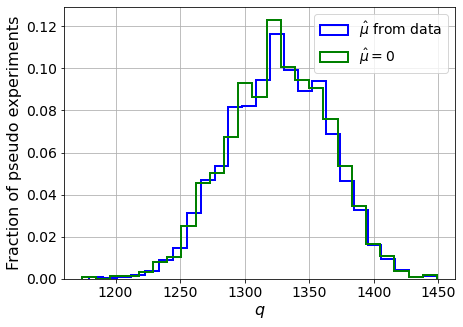

muhat mean:  -0.004193800162026948
Z_bins:  36.421388081883826
std Z_bins:  0.5349038426470949
Z_bins mu=0:  36.421388081883826
std Z_bins mu=0:  0.5392019814094821

--------

B_expected:  643
S_expected:  1915



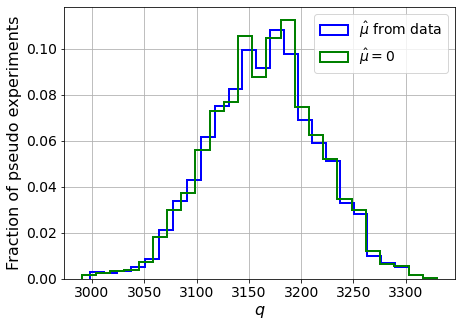

muhat mean:  -0.0021307614872579216
Z_bins:  56.27196275218379
std Z_bins:  0.4603735184890594
Z_bins mu=0:  56.27196275218379
std Z_bins mu=0:  0.46270281513204553

--------


 FINAL RESULT:

[[0.6157127914190467, 0.3296029174758565, -1.9052256927809794, 0.6157127914190467, 0.4228883652072028], [0.9517912181105448, 0.4391151538635533, -0.9563848599542845, 0.9517912181105448, 0.5378510067282062], [1.6044843710062417, 0.5704934407331659, -0.4017052320616811, 1.6044843710062417, 0.6573902784703961], [2.777883536604243, 0.672217909831711, -0.2011268019076303, 2.777883536604243, 0.730626621484368], [4.894715947255127, 0.7221380244131593, -0.0912687254832542, 4.894715947255127, 0.7532874988435243], [8.561297487490116, 0.6965107424516968, -0.04337376184409366, 8.561297487490116, 0.7159831887493132], [14.286716443657415, 0.6489160304076409, -0.019460222308197536, 14.286716443657415, 0.6604099698569801], [23.127851883543013, 0.609318664772438, -0.00907338135626857, 23.127851883543013, 0.616316

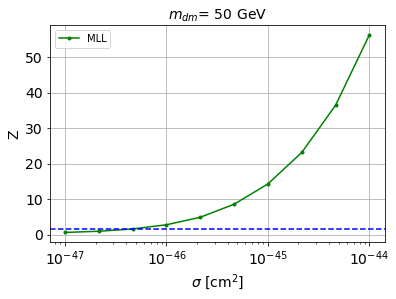


cross_MLL_164:  4.786908913056223e-47
cross_MLL_164_up:  2.8702847583107853e-47
cross_MLL_164_down:  7.643007754610486e-47

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.s

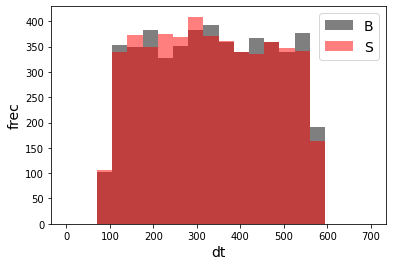

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68817	validation_1-logloss:0.68915
[1]	validation_0-logloss:0.68328	validation_1-logloss:0.68519
[2]	validation_0-logloss:0.67847	validation_1-logloss:0.68119
[3]	validation_0-logloss:0.67377	validation_1-logloss:0.67732
[4]	validation_0-logloss:0.66910	validation_1-logloss:0.67329
[5]	validation_0-logloss:0.66455	validation_1-logloss:0.66957
[6]	validation_0-logloss:0.66008	validation_1-logloss:0.66588
[7]	validation_0-logloss:0.65568	validation_1-logloss:0.66229
[8]	validation_0-logloss:0.65135	validation_1-logloss:0.65871
[9]	validation_0-logloss:0.64706	validation_1-logloss:0.65511
[10]	validation_0-logloss:0.64288	validation_1-logloss:0.65159
[11]	validation_0-logloss:0.63875	validation_1-logloss:0.64813
[12]	validation_0-logloss:0.63470	validation_1-logloss:0.64482
[13]	validation_0-logloss:0.63071	validation_1-logloss:0.64155
[14]	validation_0-logloss:0.62670	validation_1-logloss:0.63822
[15]	validation_0-logloss:0.62285	validation_1-logloss:0.63497
[1

[130]	validation_0-logloss:0.38235	validation_1-logloss:0.44929
[131]	validation_0-logloss:0.38122	validation_1-logloss:0.44856
[132]	validation_0-logloss:0.38011	validation_1-logloss:0.44785
[133]	validation_0-logloss:0.37890	validation_1-logloss:0.44710
[134]	validation_0-logloss:0.37782	validation_1-logloss:0.44645
[135]	validation_0-logloss:0.37670	validation_1-logloss:0.44555
[136]	validation_0-logloss:0.37557	validation_1-logloss:0.44487
[137]	validation_0-logloss:0.37445	validation_1-logloss:0.44422
[138]	validation_0-logloss:0.37339	validation_1-logloss:0.44356
[139]	validation_0-logloss:0.37228	validation_1-logloss:0.44285
[140]	validation_0-logloss:0.37118	validation_1-logloss:0.44224
[141]	validation_0-logloss:0.37012	validation_1-logloss:0.44152
[142]	validation_0-logloss:0.36905	validation_1-logloss:0.44095
[143]	validation_0-logloss:0.36800	validation_1-logloss:0.44024
[144]	validation_0-logloss:0.36688	validation_1-logloss:0.43950
[145]	validation_0-logloss:0.36586	valid

[259]	validation_0-logloss:0.27440	validation_1-logloss:0.38756
[260]	validation_0-logloss:0.27373	validation_1-logloss:0.38729
[261]	validation_0-logloss:0.27313	validation_1-logloss:0.38705
[262]	validation_0-logloss:0.27251	validation_1-logloss:0.38681
[263]	validation_0-logloss:0.27194	validation_1-logloss:0.38655
[264]	validation_0-logloss:0.27133	validation_1-logloss:0.38615
[265]	validation_0-logloss:0.27077	validation_1-logloss:0.38584
[266]	validation_0-logloss:0.27015	validation_1-logloss:0.38563
[267]	validation_0-logloss:0.26955	validation_1-logloss:0.38536
[268]	validation_0-logloss:0.26895	validation_1-logloss:0.38495
[269]	validation_0-logloss:0.26837	validation_1-logloss:0.38464
[270]	validation_0-logloss:0.26776	validation_1-logloss:0.38427
[271]	validation_0-logloss:0.26721	validation_1-logloss:0.38396
[272]	validation_0-logloss:0.26662	validation_1-logloss:0.38381
[273]	validation_0-logloss:0.26610	validation_1-logloss:0.38359
[274]	validation_0-logloss:0.26553	valid

[388]	validation_0-logloss:0.21143	validation_1-logloss:0.36068
[389]	validation_0-logloss:0.21099	validation_1-logloss:0.36051
[390]	validation_0-logloss:0.21061	validation_1-logloss:0.36041
[391]	validation_0-logloss:0.21022	validation_1-logloss:0.36022
[392]	validation_0-logloss:0.20991	validation_1-logloss:0.36008
[393]	validation_0-logloss:0.20951	validation_1-logloss:0.35996
[394]	validation_0-logloss:0.20913	validation_1-logloss:0.35979
[395]	validation_0-logloss:0.20875	validation_1-logloss:0.35959
[396]	validation_0-logloss:0.20832	validation_1-logloss:0.35942
[397]	validation_0-logloss:0.20798	validation_1-logloss:0.35925
[398]	validation_0-logloss:0.20755	validation_1-logloss:0.35909
[399]	validation_0-logloss:0.20717	validation_1-logloss:0.35893
[400]	validation_0-logloss:0.20679	validation_1-logloss:0.35879
[401]	validation_0-logloss:0.20633	validation_1-logloss:0.35856
[402]	validation_0-logloss:0.20594	validation_1-logloss:0.35836
[403]	validation_0-logloss:0.20552	valid

[517]	validation_0-logloss:0.16711	validation_1-logloss:0.34248
[518]	validation_0-logloss:0.16682	validation_1-logloss:0.34237
[519]	validation_0-logloss:0.16650	validation_1-logloss:0.34226
[520]	validation_0-logloss:0.16618	validation_1-logloss:0.34209
[521]	validation_0-logloss:0.16586	validation_1-logloss:0.34200
[522]	validation_0-logloss:0.16557	validation_1-logloss:0.34189
[523]	validation_0-logloss:0.16528	validation_1-logloss:0.34183
[524]	validation_0-logloss:0.16499	validation_1-logloss:0.34170
[525]	validation_0-logloss:0.16474	validation_1-logloss:0.34159
[526]	validation_0-logloss:0.16441	validation_1-logloss:0.34154
[527]	validation_0-logloss:0.16413	validation_1-logloss:0.34141
[528]	validation_0-logloss:0.16389	validation_1-logloss:0.34133
[529]	validation_0-logloss:0.16357	validation_1-logloss:0.34121
[530]	validation_0-logloss:0.16326	validation_1-logloss:0.34114
[531]	validation_0-logloss:0.16301	validation_1-logloss:0.34105
[532]	validation_0-logloss:0.16269	valid

[646]	validation_0-logloss:0.13398	validation_1-logloss:0.33059
[647]	validation_0-logloss:0.13374	validation_1-logloss:0.33054
[648]	validation_0-logloss:0.13353	validation_1-logloss:0.33053
[649]	validation_0-logloss:0.13329	validation_1-logloss:0.33043
[650]	validation_0-logloss:0.13306	validation_1-logloss:0.33040
[651]	validation_0-logloss:0.13283	validation_1-logloss:0.33033
[652]	validation_0-logloss:0.13265	validation_1-logloss:0.33026
[653]	validation_0-logloss:0.13244	validation_1-logloss:0.33021
[654]	validation_0-logloss:0.13220	validation_1-logloss:0.33013
[655]	validation_0-logloss:0.13198	validation_1-logloss:0.33002
[656]	validation_0-logloss:0.13181	validation_1-logloss:0.32993
[657]	validation_0-logloss:0.13156	validation_1-logloss:0.32980
[658]	validation_0-logloss:0.13134	validation_1-logloss:0.32971
[659]	validation_0-logloss:0.13111	validation_1-logloss:0.32970
[660]	validation_0-logloss:0.13088	validation_1-logloss:0.32966
[661]	validation_0-logloss:0.13066	valid

[775]	validation_0-logloss:0.10920	validation_1-logloss:0.32309
[776]	validation_0-logloss:0.10902	validation_1-logloss:0.32300
[777]	validation_0-logloss:0.10885	validation_1-logloss:0.32299
[778]	validation_0-logloss:0.10867	validation_1-logloss:0.32290
[779]	validation_0-logloss:0.10849	validation_1-logloss:0.32288
[780]	validation_0-logloss:0.10829	validation_1-logloss:0.32278
[781]	validation_0-logloss:0.10815	validation_1-logloss:0.32271
[782]	validation_0-logloss:0.10795	validation_1-logloss:0.32257
[783]	validation_0-logloss:0.10778	validation_1-logloss:0.32251
[784]	validation_0-logloss:0.10758	validation_1-logloss:0.32245
[785]	validation_0-logloss:0.10742	validation_1-logloss:0.32241
[786]	validation_0-logloss:0.10731	validation_1-logloss:0.32237
[787]	validation_0-logloss:0.10717	validation_1-logloss:0.32234
[788]	validation_0-logloss:0.10700	validation_1-logloss:0.32230
[789]	validation_0-logloss:0.10683	validation_1-logloss:0.32215
[790]	validation_0-logloss:0.10668	valid

[904]	validation_0-logloss:0.09010	validation_1-logloss:0.31748
[905]	validation_0-logloss:0.08996	validation_1-logloss:0.31745
[906]	validation_0-logloss:0.08984	validation_1-logloss:0.31744
[907]	validation_0-logloss:0.08970	validation_1-logloss:0.31743
[908]	validation_0-logloss:0.08955	validation_1-logloss:0.31738
[909]	validation_0-logloss:0.08941	validation_1-logloss:0.31740
[910]	validation_0-logloss:0.08930	validation_1-logloss:0.31736
[911]	validation_0-logloss:0.08919	validation_1-logloss:0.31735
[912]	validation_0-logloss:0.08905	validation_1-logloss:0.31728
[913]	validation_0-logloss:0.08895	validation_1-logloss:0.31728
[914]	validation_0-logloss:0.08883	validation_1-logloss:0.31729
[915]	validation_0-logloss:0.08874	validation_1-logloss:0.31724
[916]	validation_0-logloss:0.08861	validation_1-logloss:0.31726
[917]	validation_0-logloss:0.08848	validation_1-logloss:0.31732
[918]	validation_0-logloss:0.08839	validation_1-logloss:0.31731
[919]	validation_0-logloss:0.08828	valid

[1032]	validation_0-logloss:0.07564	validation_1-logloss:0.31391
[1033]	validation_0-logloss:0.07552	validation_1-logloss:0.31387
[1034]	validation_0-logloss:0.07543	validation_1-logloss:0.31386
[1035]	validation_0-logloss:0.07535	validation_1-logloss:0.31380
[1036]	validation_0-logloss:0.07524	validation_1-logloss:0.31380
[1037]	validation_0-logloss:0.07514	validation_1-logloss:0.31381
[1038]	validation_0-logloss:0.07505	validation_1-logloss:0.31389
[1039]	validation_0-logloss:0.07495	validation_1-logloss:0.31386
[1040]	validation_0-logloss:0.07484	validation_1-logloss:0.31378
[1041]	validation_0-logloss:0.07478	validation_1-logloss:0.31373
[1042]	validation_0-logloss:0.07467	validation_1-logloss:0.31366
[1043]	validation_0-logloss:0.07456	validation_1-logloss:0.31365
[1044]	validation_0-logloss:0.07444	validation_1-logloss:0.31361
[1045]	validation_0-logloss:0.07433	validation_1-logloss:0.31359
[1046]	validation_0-logloss:0.07421	validation_1-logloss:0.31357
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06392	validation_1-logloss:0.31150
[1160]	validation_0-logloss:0.06385	validation_1-logloss:0.31143
[1161]	validation_0-logloss:0.06375	validation_1-logloss:0.31142
[1162]	validation_0-logloss:0.06368	validation_1-logloss:0.31141
[1163]	validation_0-logloss:0.06357	validation_1-logloss:0.31135
[1164]	validation_0-logloss:0.06349	validation_1-logloss:0.31135
[1165]	validation_0-logloss:0.06341	validation_1-logloss:0.31132
[1166]	validation_0-logloss:0.06336	validation_1-logloss:0.31129
[1167]	validation_0-logloss:0.06329	validation_1-logloss:0.31127
[1168]	validation_0-logloss:0.06320	validation_1-logloss:0.31120
[1169]	validation_0-logloss:0.06312	validation_1-logloss:0.31118
[1170]	validation_0-logloss:0.06305	validation_1-logloss:0.31115
[1171]	validation_0-logloss:0.06298	validation_1-logloss:0.31119
[1172]	validation_0-logloss:0.06288	validation_1-logloss:0.31124
[1173]	validation_0-logloss:0.06278	validation_1-logloss:0.31117
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05415	validation_1-logloss:0.30941
[1287]	validation_0-logloss:0.05409	validation_1-logloss:0.30946
[1288]	validation_0-logloss:0.05404	validation_1-logloss:0.30947
[1289]	validation_0-logloss:0.05396	validation_1-logloss:0.30944
[1290]	validation_0-logloss:0.05391	validation_1-logloss:0.30942
[1291]	validation_0-logloss:0.05383	validation_1-logloss:0.30935
[1292]	validation_0-logloss:0.05377	validation_1-logloss:0.30933
[1293]	validation_0-logloss:0.05369	validation_1-logloss:0.30923
[1294]	validation_0-logloss:0.05362	validation_1-logloss:0.30923
[1295]	validation_0-logloss:0.05356	validation_1-logloss:0.30918
[1296]	validation_0-logloss:0.05349	validation_1-logloss:0.30919
[1297]	validation_0-logloss:0.05341	validation_1-logloss:0.30916
[1298]	validation_0-logloss:0.05333	validation_1-logloss:0.30919
[1299]	validation_0-logloss:0.05325	validation_1-logloss:0.30915
[1300]	validation_0-logloss:0.05319	validation_1-logloss:0.30923
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.04658	validation_1-logloss:0.30779
[1414]	validation_0-logloss:0.04651	validation_1-logloss:0.30781
[1415]	validation_0-logloss:0.04643	validation_1-logloss:0.30776
[1416]	validation_0-logloss:0.04639	validation_1-logloss:0.30769
[1417]	validation_0-logloss:0.04634	validation_1-logloss:0.30770
[1418]	validation_0-logloss:0.04627	validation_1-logloss:0.30769
[1419]	validation_0-logloss:0.04620	validation_1-logloss:0.30773
[1420]	validation_0-logloss:0.04615	validation_1-logloss:0.30770
[1421]	validation_0-logloss:0.04611	validation_1-logloss:0.30778
[1422]	validation_0-logloss:0.04604	validation_1-logloss:0.30777
[1423]	validation_0-logloss:0.04597	validation_1-logloss:0.30783
[1424]	validation_0-logloss:0.04592	validation_1-logloss:0.30781
[1425]	validation_0-logloss:0.04588	validation_1-logloss:0.30786
[1426]	validation_0-logloss:0.04583	validation_1-logloss:0.30783
[1427]	validation_0-logloss:0.04579	validation_1-logloss:0.30775
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.04014	validation_1-logloss:0.30741
[1541]	validation_0-logloss:0.04009	validation_1-logloss:0.30749
[1542]	validation_0-logloss:0.04005	validation_1-logloss:0.30748
[1543]	validation_0-logloss:0.04001	validation_1-logloss:0.30746
[1544]	validation_0-logloss:0.03998	validation_1-logloss:0.30749
[1545]	validation_0-logloss:0.03992	validation_1-logloss:0.30754
[1546]	validation_0-logloss:0.03988	validation_1-logloss:0.30748
[1547]	validation_0-logloss:0.03984	validation_1-logloss:0.30750
[1548]	validation_0-logloss:0.03979	validation_1-logloss:0.30750
[1549]	validation_0-logloss:0.03976	validation_1-logloss:0.30752
[1550]	validation_0-logloss:0.03973	validation_1-logloss:0.30752
[1551]	validation_0-logloss:0.03968	validation_1-logloss:0.30750
[1552]	validation_0-logloss:0.03966	validation_1-logloss:0.30747
[1553]	validation_0-logloss:0.03959	validation_1-logloss:0.30738
[1554]	validation_0-logloss:0.03954	validation_1-logloss:0.30736
[1555]	validation_0-loglo

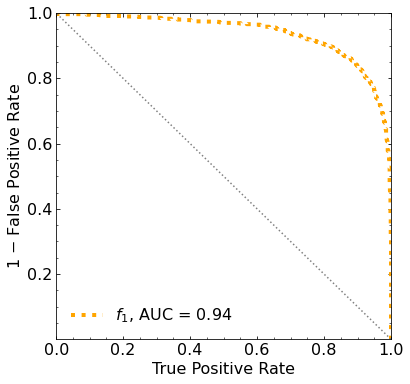

Classification score:


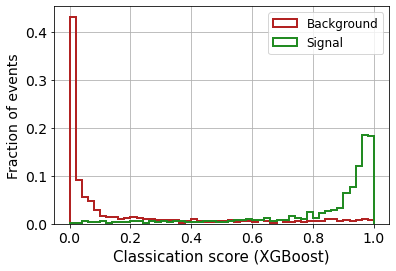


 ROC-AUC =  0.9388882700305246


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  231.40895369  214.98166558  192.46482395  165.63590268  132.71010048
   91.38635274   45.51597743   -4.40405038  -60.29102982 -110.78120864]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 191.23013182 188.44052089 180.10598154 165.242578

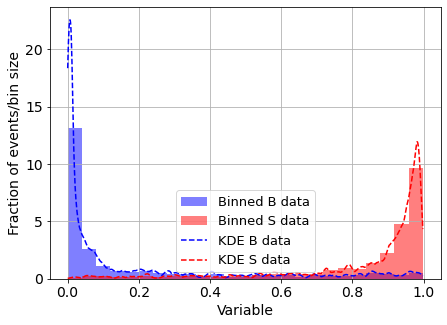

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



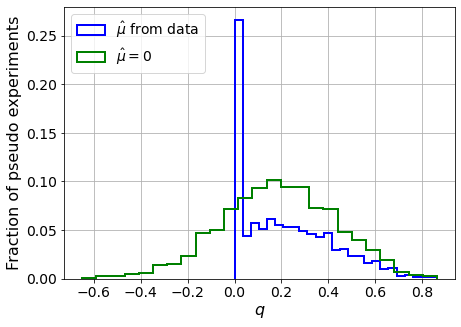

muhat mean:  -4.899243664108255
Z_bins:  0.4303916007129189
std Z_bins:  0.22694461649060677
Z_bins mu=0:  0.4303916007129189
std Z_bins mu=0:  0.28278066915774736

--------

B_expected:  643
S_expected:  3



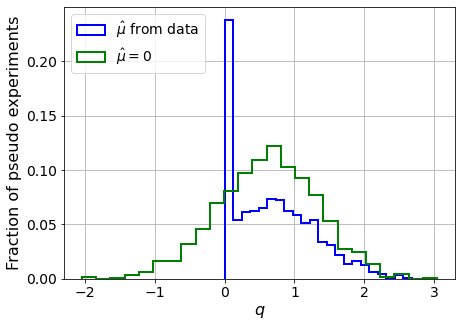

muhat mean:  -1.5448304788308769
Z_bins:  0.8046999248778614
std Z_bins:  0.3623093513951805
Z_bins mu=0:  0.8046999248778614
std Z_bins mu=0:  0.441666222804255

--------

B_expected:  643
S_expected:  6



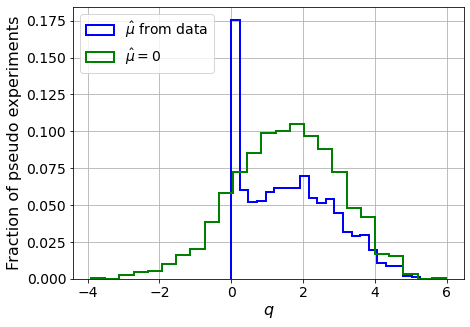

muhat mean:  -0.8206210967270673
Z_bins:  1.2584591933774731
std Z_bins:  0.4941654928520653
Z_bins mu=0:  1.2584591933774731
std Z_bins mu=0:  0.5780459265442268

--------

B_expected:  643
S_expected:  14



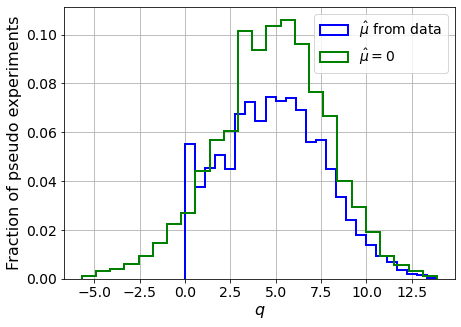

muhat mean:  -0.3262177456782017
Z_bins:  2.2145479735159217
std Z_bins:  0.6190602971909384
Z_bins mu=0:  2.2145479735159217
std Z_bins mu=0:  0.6860611294268039

--------

B_expected:  643
S_expected:  30



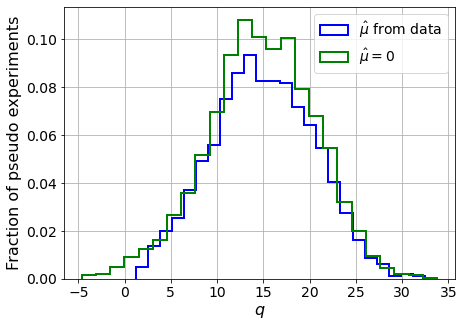

muhat mean:  -0.1683562329698354
Z_bins:  3.8508219176626812
std Z_bins:  0.7150350423747757
Z_bins mu=0:  3.8508219176626812
std Z_bins mu=0:  0.7530730592189903

--------

B_expected:  643
S_expected:  65



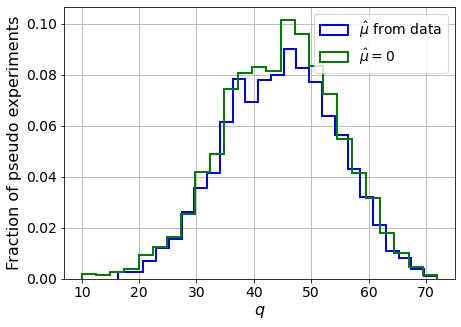

muhat mean:  -0.07065005918333801
Z_bins:  6.706046190593376
std Z_bins:  0.7278477952006905
Z_bins mu=0:  6.706046190593376
std Z_bins mu=0:  0.7511047285854912

--------

B_expected:  643
S_expected:  139



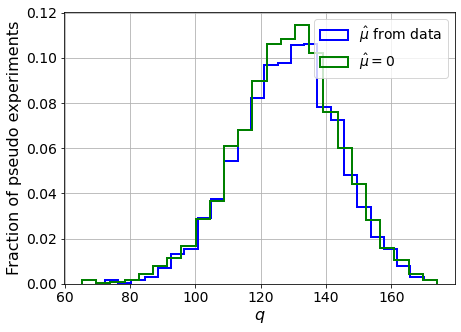

muhat mean:  -0.033492525765513266
Z_bins:  11.346131463245753
std Z_bins:  0.6886609625433228
Z_bins mu=0:  11.346131463245753
std Z_bins mu=0:  0.7029172178907094

--------

B_expected:  643
S_expected:  300



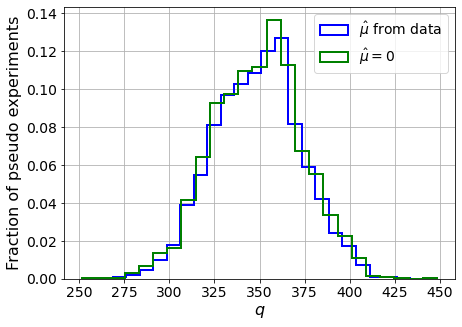

muhat mean:  -0.014955599406112085
Z_bins:  18.70031181305734
std Z_bins:  0.6530243873869086
Z_bins mu=0:  18.70031181305734
std Z_bins mu=0:  0.6610814918225811

--------

B_expected:  643
S_expected:  645



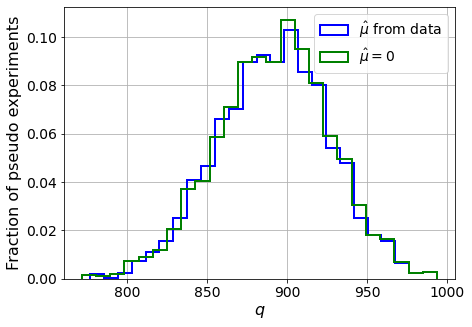

muhat mean:  -0.006896654873906872
Z_bins:  29.875998911033104
std Z_bins:  0.5867905631811718
Z_bins mu=0:  29.875998911033104
std Z_bins mu=0:  0.5918780566844881

--------

B_expected:  643
S_expected:  1390



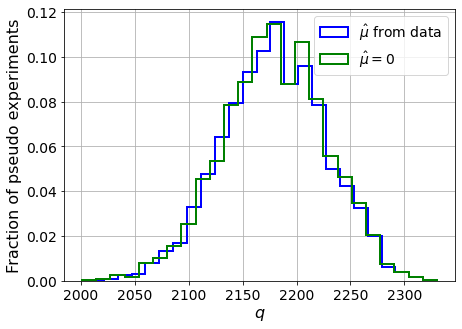

muhat mean:  -0.0034556640276685036
Z_bins:  46.6858020578536
std Z_bins:  0.5108953055171602
Z_bins mu=0:  46.6858020578536
std Z_bins mu=0:  0.5135909703901436

--------


 FINAL RESULT:

[[0.4303916007129189, 0.22694461649060677, -4.899243664108255, 0.4303916007129189, 0.28278066915774736], [0.8046999248778614, 0.3623093513951805, -1.5448304788308769, 0.8046999248778614, 0.441666222804255], [1.2584591933774731, 0.4941654928520653, -0.8206210967270673, 1.2584591933774731, 0.5780459265442268], [2.2145479735159217, 0.6190602971909384, -0.3262177456782017, 2.2145479735159217, 0.6860611294268039], [3.8508219176626812, 0.7150350423747757, -0.1683562329698354, 3.8508219176626812, 0.7530730592189903], [6.706046190593376, 0.7278477952006905, -0.07065005918333801, 6.706046190593376, 0.7511047285854912], [11.346131463245753, 0.6886609625433228, -0.033492525765513266, 11.346131463245753, 0.7029172178907094], [18.70031181305734, 0.6530243873869086, -0.014955599406112085, 18.70031181305734, 0.661

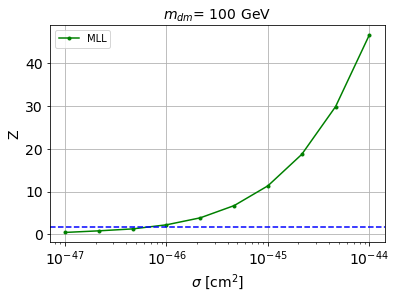


cross_MLL_164:  6.685818777036986e-47
cross_MLL_164_up:  4.1396155033022835e-47
cross_MLL_164_down:  1.0301495228829623e-46

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.

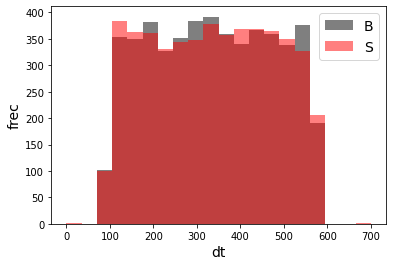

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68843	validation_1-logloss:0.68913
[1]	validation_0-logloss:0.68378	validation_1-logloss:0.68518
[2]	validation_0-logloss:0.67924	validation_1-logloss:0.68130
[3]	validation_0-logloss:0.67476	validation_1-logloss:0.67756
[4]	validation_0-logloss:0.67038	validation_1-logloss:0.67391
[5]	validation_0-logloss:0.66603	validation_1-logloss:0.67035
[6]	validation_0-logloss:0.66175	validation_1-logloss:0.66678
[7]	validation_0-logloss:0.65756	validation_1-logloss:0.66321
[8]	validation_0-logloss:0.65345	validation_1-logloss:0.65968
[9]	validation_0-logloss:0.64940	validation_1-logloss:0.65621
[10]	validation_0-logloss:0.64542	validation_1-logloss:0.65290
[11]	validation_0-logloss:0.64150	validation_1-logloss:0.64961
[12]	validation_0-logloss:0.63762	validation_1-logloss:0.64635
[13]	validation_0-logloss:0.63385	validation_1-logloss:0.64307
[14]	validation_0-logloss:0.63016	validation_1-logloss:0.63986
[15]	validation_0-logloss:0.62641	validation_1-logloss:0.63684
[1

[130]	validation_0-logloss:0.39585	validation_1-logloss:0.46563
[131]	validation_0-logloss:0.39470	validation_1-logloss:0.46497
[132]	validation_0-logloss:0.39359	validation_1-logloss:0.46423
[133]	validation_0-logloss:0.39254	validation_1-logloss:0.46361
[134]	validation_0-logloss:0.39142	validation_1-logloss:0.46294
[135]	validation_0-logloss:0.39027	validation_1-logloss:0.46220
[136]	validation_0-logloss:0.38920	validation_1-logloss:0.46158
[137]	validation_0-logloss:0.38814	validation_1-logloss:0.46090
[138]	validation_0-logloss:0.38704	validation_1-logloss:0.46021
[139]	validation_0-logloss:0.38600	validation_1-logloss:0.45972
[140]	validation_0-logloss:0.38493	validation_1-logloss:0.45907
[141]	validation_0-logloss:0.38385	validation_1-logloss:0.45839
[142]	validation_0-logloss:0.38282	validation_1-logloss:0.45769
[143]	validation_0-logloss:0.38177	validation_1-logloss:0.45709
[144]	validation_0-logloss:0.38072	validation_1-logloss:0.45641
[145]	validation_0-logloss:0.37965	valid

[259]	validation_0-logloss:0.28790	validation_1-logloss:0.41067
[260]	validation_0-logloss:0.28731	validation_1-logloss:0.41048
[261]	validation_0-logloss:0.28667	validation_1-logloss:0.41032
[262]	validation_0-logloss:0.28608	validation_1-logloss:0.41014
[263]	validation_0-logloss:0.28544	validation_1-logloss:0.40989
[264]	validation_0-logloss:0.28484	validation_1-logloss:0.40979
[265]	validation_0-logloss:0.28428	validation_1-logloss:0.40955
[266]	validation_0-logloss:0.28366	validation_1-logloss:0.40938
[267]	validation_0-logloss:0.28304	validation_1-logloss:0.40924
[268]	validation_0-logloss:0.28246	validation_1-logloss:0.40907
[269]	validation_0-logloss:0.28188	validation_1-logloss:0.40894
[270]	validation_0-logloss:0.28128	validation_1-logloss:0.40882
[271]	validation_0-logloss:0.28065	validation_1-logloss:0.40855
[272]	validation_0-logloss:0.28003	validation_1-logloss:0.40829
[273]	validation_0-logloss:0.27942	validation_1-logloss:0.40813
[274]	validation_0-logloss:0.27889	valid

[388]	validation_0-logloss:0.22239	validation_1-logloss:0.38649
[389]	validation_0-logloss:0.22202	validation_1-logloss:0.38634
[390]	validation_0-logloss:0.22159	validation_1-logloss:0.38622
[391]	validation_0-logloss:0.22114	validation_1-logloss:0.38608
[392]	validation_0-logloss:0.22076	validation_1-logloss:0.38592
[393]	validation_0-logloss:0.22031	validation_1-logloss:0.38572
[394]	validation_0-logloss:0.21993	validation_1-logloss:0.38558
[395]	validation_0-logloss:0.21946	validation_1-logloss:0.38540
[396]	validation_0-logloss:0.21907	validation_1-logloss:0.38516
[397]	validation_0-logloss:0.21866	validation_1-logloss:0.38503
[398]	validation_0-logloss:0.21827	validation_1-logloss:0.38491
[399]	validation_0-logloss:0.21789	validation_1-logloss:0.38477
[400]	validation_0-logloss:0.21743	validation_1-logloss:0.38461
[401]	validation_0-logloss:0.21701	validation_1-logloss:0.38450
[402]	validation_0-logloss:0.21665	validation_1-logloss:0.38436
[403]	validation_0-logloss:0.21622	valid

[517]	validation_0-logloss:0.17603	validation_1-logloss:0.37036
[518]	validation_0-logloss:0.17571	validation_1-logloss:0.37037
[519]	validation_0-logloss:0.17539	validation_1-logloss:0.37022
[520]	validation_0-logloss:0.17511	validation_1-logloss:0.37012
[521]	validation_0-logloss:0.17478	validation_1-logloss:0.37005
[522]	validation_0-logloss:0.17449	validation_1-logloss:0.36998
[523]	validation_0-logloss:0.17421	validation_1-logloss:0.36987
[524]	validation_0-logloss:0.17385	validation_1-logloss:0.36974
[525]	validation_0-logloss:0.17356	validation_1-logloss:0.36961
[526]	validation_0-logloss:0.17329	validation_1-logloss:0.36951
[527]	validation_0-logloss:0.17295	validation_1-logloss:0.36939
[528]	validation_0-logloss:0.17269	validation_1-logloss:0.36927
[529]	validation_0-logloss:0.17240	validation_1-logloss:0.36916
[530]	validation_0-logloss:0.17207	validation_1-logloss:0.36905
[531]	validation_0-logloss:0.17178	validation_1-logloss:0.36889
[532]	validation_0-logloss:0.17149	valid

[646]	validation_0-logloss:0.14178	validation_1-logloss:0.36045
[647]	validation_0-logloss:0.14155	validation_1-logloss:0.36044
[648]	validation_0-logloss:0.14132	validation_1-logloss:0.36033
[649]	validation_0-logloss:0.14114	validation_1-logloss:0.36034
[650]	validation_0-logloss:0.14090	validation_1-logloss:0.36029
[651]	validation_0-logloss:0.14069	validation_1-logloss:0.36027
[652]	validation_0-logloss:0.14049	validation_1-logloss:0.36031
[653]	validation_0-logloss:0.14027	validation_1-logloss:0.36026
[654]	validation_0-logloss:0.14004	validation_1-logloss:0.36014
[655]	validation_0-logloss:0.13985	validation_1-logloss:0.36010
[656]	validation_0-logloss:0.13963	validation_1-logloss:0.36002
[657]	validation_0-logloss:0.13946	validation_1-logloss:0.35989
[658]	validation_0-logloss:0.13925	validation_1-logloss:0.35990
[659]	validation_0-logloss:0.13901	validation_1-logloss:0.35980
[660]	validation_0-logloss:0.13873	validation_1-logloss:0.35966
[661]	validation_0-logloss:0.13854	valid

[775]	validation_0-logloss:0.11673	validation_1-logloss:0.35426
[776]	validation_0-logloss:0.11655	validation_1-logloss:0.35420
[777]	validation_0-logloss:0.11641	validation_1-logloss:0.35420
[778]	validation_0-logloss:0.11623	validation_1-logloss:0.35414
[779]	validation_0-logloss:0.11605	validation_1-logloss:0.35412
[780]	validation_0-logloss:0.11587	validation_1-logloss:0.35406
[781]	validation_0-logloss:0.11566	validation_1-logloss:0.35404
[782]	validation_0-logloss:0.11552	validation_1-logloss:0.35404
[783]	validation_0-logloss:0.11530	validation_1-logloss:0.35393
[784]	validation_0-logloss:0.11516	validation_1-logloss:0.35390
[785]	validation_0-logloss:0.11498	validation_1-logloss:0.35387
[786]	validation_0-logloss:0.11484	validation_1-logloss:0.35380
[787]	validation_0-logloss:0.11471	validation_1-logloss:0.35372
[788]	validation_0-logloss:0.11453	validation_1-logloss:0.35366
[789]	validation_0-logloss:0.11436	validation_1-logloss:0.35365
[790]	validation_0-logloss:0.11421	valid

[904]	validation_0-logloss:0.09734	validation_1-logloss:0.34984
[905]	validation_0-logloss:0.09719	validation_1-logloss:0.34978
[906]	validation_0-logloss:0.09703	validation_1-logloss:0.34970
[907]	validation_0-logloss:0.09688	validation_1-logloss:0.34968
[908]	validation_0-logloss:0.09675	validation_1-logloss:0.34963
[909]	validation_0-logloss:0.09662	validation_1-logloss:0.34962
[910]	validation_0-logloss:0.09649	validation_1-logloss:0.34958
[911]	validation_0-logloss:0.09636	validation_1-logloss:0.34957
[912]	validation_0-logloss:0.09623	validation_1-logloss:0.34951
[913]	validation_0-logloss:0.09610	validation_1-logloss:0.34952
[914]	validation_0-logloss:0.09599	validation_1-logloss:0.34953
[915]	validation_0-logloss:0.09582	validation_1-logloss:0.34948
[916]	validation_0-logloss:0.09566	validation_1-logloss:0.34956
[917]	validation_0-logloss:0.09551	validation_1-logloss:0.34951
[918]	validation_0-logloss:0.09538	validation_1-logloss:0.34938
[919]	validation_0-logloss:0.09525	valid

[1032]	validation_0-logloss:0.08183	validation_1-logloss:0.34697
[1033]	validation_0-logloss:0.08172	validation_1-logloss:0.34699
[1034]	validation_0-logloss:0.08162	validation_1-logloss:0.34692
[1035]	validation_0-logloss:0.08149	validation_1-logloss:0.34684
[1036]	validation_0-logloss:0.08136	validation_1-logloss:0.34676
[1037]	validation_0-logloss:0.08128	validation_1-logloss:0.34669
[1038]	validation_0-logloss:0.08116	validation_1-logloss:0.34659
[1039]	validation_0-logloss:0.08106	validation_1-logloss:0.34664
[1040]	validation_0-logloss:0.08097	validation_1-logloss:0.34669
[1041]	validation_0-logloss:0.08088	validation_1-logloss:0.34675
[1042]	validation_0-logloss:0.08079	validation_1-logloss:0.34674
[1043]	validation_0-logloss:0.08069	validation_1-logloss:0.34670
[1044]	validation_0-logloss:0.08056	validation_1-logloss:0.34673
[1045]	validation_0-logloss:0.08047	validation_1-logloss:0.34670
[1046]	validation_0-logloss:0.08035	validation_1-logloss:0.34668
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06923	validation_1-logloss:0.34558
[1160]	validation_0-logloss:0.06913	validation_1-logloss:0.34554
[1161]	validation_0-logloss:0.06902	validation_1-logloss:0.34558
[1162]	validation_0-logloss:0.06892	validation_1-logloss:0.34554
[1163]	validation_0-logloss:0.06886	validation_1-logloss:0.34555
[1164]	validation_0-logloss:0.06876	validation_1-logloss:0.34544
[1165]	validation_0-logloss:0.06865	validation_1-logloss:0.34542
[1166]	validation_0-logloss:0.06856	validation_1-logloss:0.34537
[1167]	validation_0-logloss:0.06847	validation_1-logloss:0.34534
[1168]	validation_0-logloss:0.06838	validation_1-logloss:0.34536
[1169]	validation_0-logloss:0.06830	validation_1-logloss:0.34541
[1170]	validation_0-logloss:0.06820	validation_1-logloss:0.34540
[1171]	validation_0-logloss:0.06810	validation_1-logloss:0.34542
[1172]	validation_0-logloss:0.06800	validation_1-logloss:0.34544
[1173]	validation_0-logloss:0.06793	validation_1-logloss:0.34541
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05865	validation_1-logloss:0.34553
[1287]	validation_0-logloss:0.05857	validation_1-logloss:0.34543
[1288]	validation_0-logloss:0.05851	validation_1-logloss:0.34545
[1289]	validation_0-logloss:0.05844	validation_1-logloss:0.34542
[1290]	validation_0-logloss:0.05837	validation_1-logloss:0.34547
[1291]	validation_0-logloss:0.05831	validation_1-logloss:0.34556
[1292]	validation_0-logloss:0.05824	validation_1-logloss:0.34556
[1293]	validation_0-logloss:0.05817	validation_1-logloss:0.34554


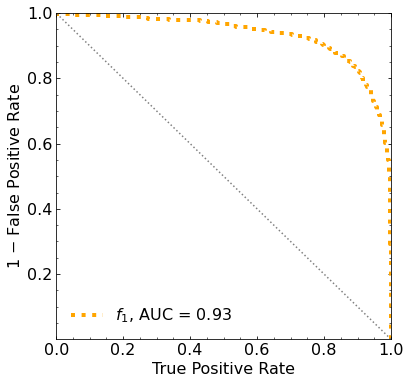

Classification score:


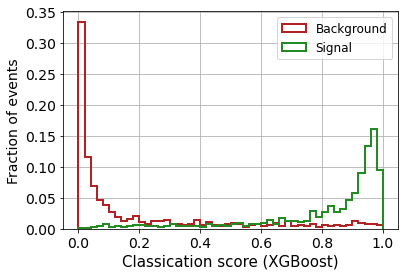


 ROC-AUC =  0.9325295003380247


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  184.98995785  175.79177876  160.65072423  140.26319745  114.61920654
   80.09257067   38.62050335   -6.70511546  -56.34489508 -108.25725164]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 161.70568438 160.14089959 155.7554907  145.886034

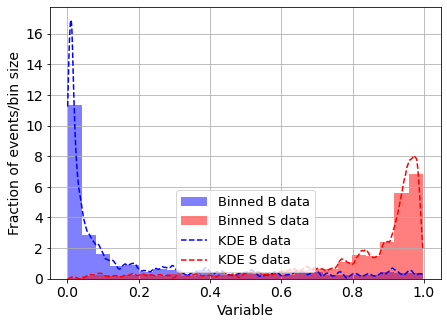

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



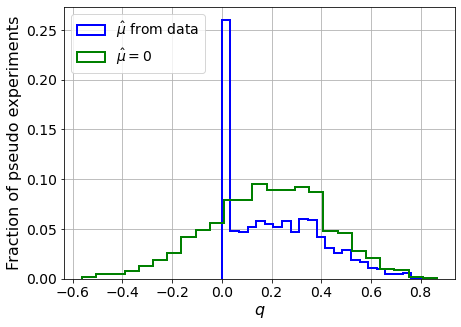

muhat mean:  -5.531457597415059
Z_bins:  0.44129733384678094
std Z_bins:  0.21420180358688065
Z_bins mu=0:  0.44129733384678094
std Z_bins mu=0:  0.2679447937733739

--------

B_expected:  643
S_expected:  2



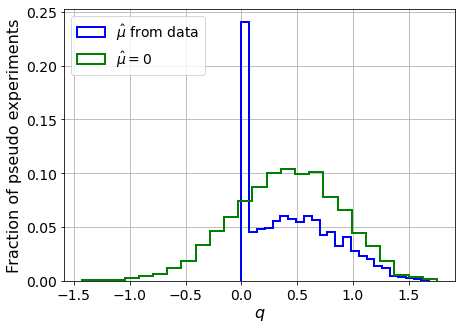

muhat mean:  -2.7735291367189028
Z_bins:  0.6494513967792013
std Z_bins:  0.2983211650097245
Z_bins mu=0:  0.6494513967792013
std Z_bins mu=0:  0.3666202709605777

--------

B_expected:  643
S_expected:  4



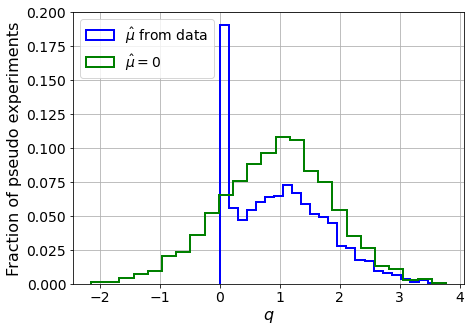

muhat mean:  -1.455308734203032
Z_bins:  0.9897219311862231
std Z_bins:  0.39409182737713633
Z_bins mu=0:  0.9897219311862231
std Z_bins mu=0:  0.4632280859939687

--------

B_expected:  643
S_expected:  8



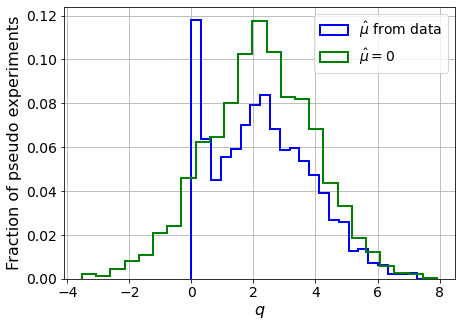

muhat mean:  -0.7006867573820943
Z_bins:  1.5001390925974278
std Z_bins:  0.5177869318173903
Z_bins mu=0:  1.5001390925974278
std Z_bins mu=0:  0.5813247790463387

--------

B_expected:  643
S_expected:  17



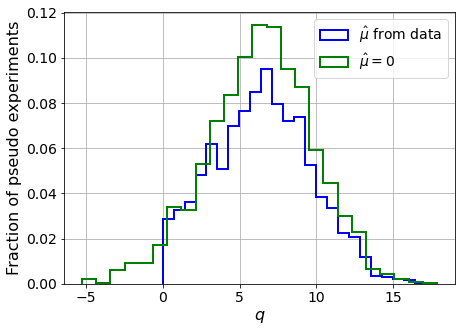

muhat mean:  -0.3500878042558621
Z_bins:  2.5529701258316893
std Z_bins:  0.6218787380652407
Z_bins mu=0:  2.5529701258316893
std Z_bins mu=0:  0.6675475497642707

--------

B_expected:  643
S_expected:  37



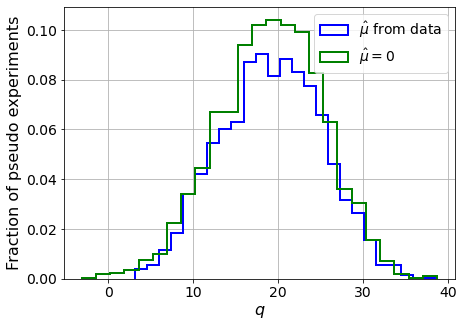

muhat mean:  -0.1498488334946145
Z_bins:  4.389976106150006
std Z_bins:  0.6769418325870674
Z_bins mu=0:  4.389976106150006
std Z_bins mu=0:  0.7018778397817138

--------

B_expected:  643
S_expected:  79



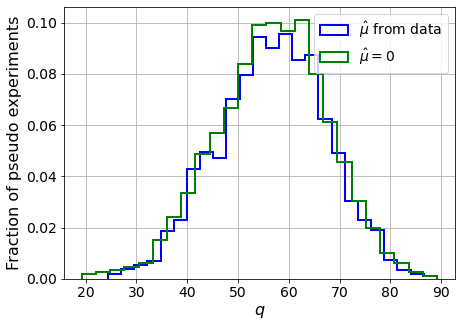

muhat mean:  -0.07000579463195541
Z_bins:  7.559053750640522
std Z_bins:  0.7067382219105157
Z_bins mu=0:  7.559053750640522
std Z_bins mu=0:  0.7234952490715267

--------

B_expected:  643
S_expected:  170



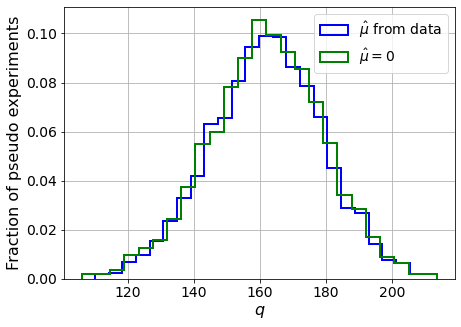

muhat mean:  -0.033366873761757114
Z_bins:  12.735735516698497
std Z_bins:  0.6678364928031266
Z_bins mu=0:  12.735735516698497
std Z_bins mu=0:  0.6764241620035174

--------

B_expected:  643
S_expected:  366



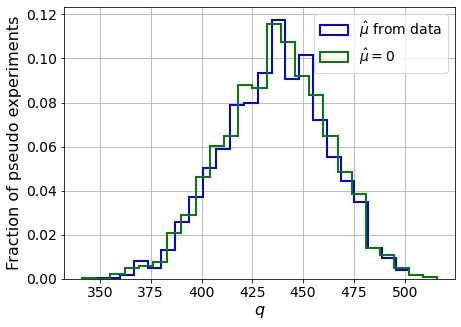

muhat mean:  -0.015524721285032586
Z_bins:  20.907998250793007
std Z_bins:  0.6168565302565503
Z_bins mu=0:  20.907998250793007
std Z_bins mu=0:  0.6219977234178936

--------

B_expected:  643
S_expected:  788



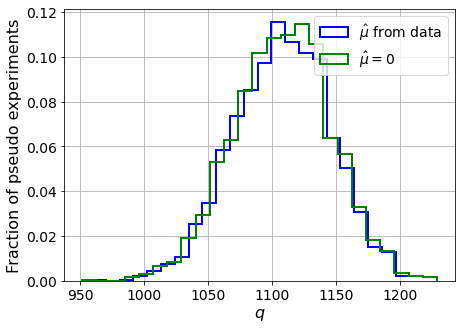

muhat mean:  -0.006881496256324112
Z_bins:  33.298924216852434
std Z_bins:  0.5663332002613155
Z_bins mu=0:  33.298924216852434
std Z_bins mu=0:  0.5698185279504573

--------


 FINAL RESULT:

[[0.44129733384678094, 0.21420180358688065, -5.531457597415059, 0.44129733384678094, 0.2679447937733739], [0.6494513967792013, 0.2983211650097245, -2.7735291367189028, 0.6494513967792013, 0.3666202709605777], [0.9897219311862231, 0.39409182737713633, -1.455308734203032, 0.9897219311862231, 0.4632280859939687], [1.5001390925974278, 0.5177869318173903, -0.7006867573820943, 1.5001390925974278, 0.5813247790463387], [2.5529701258316893, 0.6218787380652407, -0.3500878042558621, 2.5529701258316893, 0.6675475497642707], [4.389976106150006, 0.6769418325870674, -0.1498488334946145, 4.389976106150006, 0.7018778397817138], [7.559053750640522, 0.7067382219105157, -0.07000579463195541, 7.559053750640522, 0.7234952490715267], [12.735735516698497, 0.6678364928031266, -0.033366873761757114, 12.735735516698497, 0.

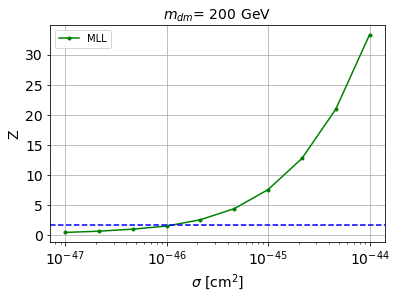


cross_MLL_164:  1.1447054164866757e-46
cross_MLL_164_up:  6.664872286021001e-47
cross_MLL_164_down:  1.7956159631574693e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.

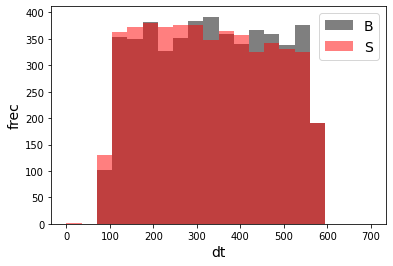

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68861	validation_1-logloss:0.68908
[1]	validation_0-logloss:0.68416	validation_1-logloss:0.68513
[2]	validation_0-logloss:0.67978	validation_1-logloss:0.68121
[3]	validation_0-logloss:0.67547	validation_1-logloss:0.67739
[4]	validation_0-logloss:0.67125	validation_1-logloss:0.67364
[5]	validation_0-logloss:0.66711	validation_1-logloss:0.66998
[6]	validation_0-logloss:0.66296	validation_1-logloss:0.66625
[7]	validation_0-logloss:0.65895	validation_1-logloss:0.66274
[8]	validation_0-logloss:0.65504	validation_1-logloss:0.65919
[9]	validation_0-logloss:0.65109	validation_1-logloss:0.65573
[10]	validation_0-logloss:0.64726	validation_1-logloss:0.65225
[11]	validation_0-logloss:0.64347	validation_1-logloss:0.64903
[12]	validation_0-logloss:0.63977	validation_1-logloss:0.64566
[13]	validation_0-logloss:0.63609	validation_1-logloss:0.64248
[14]	validation_0-logloss:0.63246	validation_1-logloss:0.63940
[15]	validation_0-logloss:0.62891	validation_1-logloss:0.63644
[1

[130]	validation_0-logloss:0.40108	validation_1-logloss:0.46782
[131]	validation_0-logloss:0.39999	validation_1-logloss:0.46718
[132]	validation_0-logloss:0.39891	validation_1-logloss:0.46654
[133]	validation_0-logloss:0.39779	validation_1-logloss:0.46591
[134]	validation_0-logloss:0.39663	validation_1-logloss:0.46516
[135]	validation_0-logloss:0.39554	validation_1-logloss:0.46449
[136]	validation_0-logloss:0.39439	validation_1-logloss:0.46393
[137]	validation_0-logloss:0.39334	validation_1-logloss:0.46330
[138]	validation_0-logloss:0.39229	validation_1-logloss:0.46273
[139]	validation_0-logloss:0.39123	validation_1-logloss:0.46209
[140]	validation_0-logloss:0.39015	validation_1-logloss:0.46158
[141]	validation_0-logloss:0.38905	validation_1-logloss:0.46096
[142]	validation_0-logloss:0.38799	validation_1-logloss:0.46040
[143]	validation_0-logloss:0.38697	validation_1-logloss:0.45984
[144]	validation_0-logloss:0.38597	validation_1-logloss:0.45933
[145]	validation_0-logloss:0.38500	valid

[259]	validation_0-logloss:0.29509	validation_1-logloss:0.41534
[260]	validation_0-logloss:0.29441	validation_1-logloss:0.41496
[261]	validation_0-logloss:0.29377	validation_1-logloss:0.41472
[262]	validation_0-logloss:0.29321	validation_1-logloss:0.41452
[263]	validation_0-logloss:0.29257	validation_1-logloss:0.41434
[264]	validation_0-logloss:0.29201	validation_1-logloss:0.41401
[265]	validation_0-logloss:0.29134	validation_1-logloss:0.41370
[266]	validation_0-logloss:0.29070	validation_1-logloss:0.41347
[267]	validation_0-logloss:0.29008	validation_1-logloss:0.41317
[268]	validation_0-logloss:0.28957	validation_1-logloss:0.41294
[269]	validation_0-logloss:0.28902	validation_1-logloss:0.41273
[270]	validation_0-logloss:0.28839	validation_1-logloss:0.41255
[271]	validation_0-logloss:0.28775	validation_1-logloss:0.41221
[272]	validation_0-logloss:0.28711	validation_1-logloss:0.41195
[273]	validation_0-logloss:0.28652	validation_1-logloss:0.41174
[274]	validation_0-logloss:0.28592	valid

[388]	validation_0-logloss:0.22856	validation_1-logloss:0.39064
[389]	validation_0-logloss:0.22812	validation_1-logloss:0.39046
[390]	validation_0-logloss:0.22771	validation_1-logloss:0.39032
[391]	validation_0-logloss:0.22729	validation_1-logloss:0.39011
[392]	validation_0-logloss:0.22688	validation_1-logloss:0.39004
[393]	validation_0-logloss:0.22644	validation_1-logloss:0.38986
[394]	validation_0-logloss:0.22601	validation_1-logloss:0.38980
[395]	validation_0-logloss:0.22560	validation_1-logloss:0.38982
[396]	validation_0-logloss:0.22518	validation_1-logloss:0.38967
[397]	validation_0-logloss:0.22479	validation_1-logloss:0.38941
[398]	validation_0-logloss:0.22442	validation_1-logloss:0.38921
[399]	validation_0-logloss:0.22403	validation_1-logloss:0.38907
[400]	validation_0-logloss:0.22359	validation_1-logloss:0.38881
[401]	validation_0-logloss:0.22320	validation_1-logloss:0.38866
[402]	validation_0-logloss:0.22276	validation_1-logloss:0.38848
[403]	validation_0-logloss:0.22239	valid

[517]	validation_0-logloss:0.18156	validation_1-logloss:0.37411
[518]	validation_0-logloss:0.18121	validation_1-logloss:0.37399
[519]	validation_0-logloss:0.18093	validation_1-logloss:0.37382
[520]	validation_0-logloss:0.18061	validation_1-logloss:0.37376
[521]	validation_0-logloss:0.18033	validation_1-logloss:0.37374
[522]	validation_0-logloss:0.17999	validation_1-logloss:0.37367
[523]	validation_0-logloss:0.17969	validation_1-logloss:0.37351
[524]	validation_0-logloss:0.17936	validation_1-logloss:0.37348
[525]	validation_0-logloss:0.17899	validation_1-logloss:0.37343
[526]	validation_0-logloss:0.17869	validation_1-logloss:0.37345
[527]	validation_0-logloss:0.17842	validation_1-logloss:0.37329
[528]	validation_0-logloss:0.17810	validation_1-logloss:0.37311
[529]	validation_0-logloss:0.17780	validation_1-logloss:0.37298
[530]	validation_0-logloss:0.17750	validation_1-logloss:0.37279
[531]	validation_0-logloss:0.17720	validation_1-logloss:0.37261
[532]	validation_0-logloss:0.17690	valid

[646]	validation_0-logloss:0.14647	validation_1-logloss:0.36293
[647]	validation_0-logloss:0.14625	validation_1-logloss:0.36289
[648]	validation_0-logloss:0.14600	validation_1-logloss:0.36275
[649]	validation_0-logloss:0.14573	validation_1-logloss:0.36264
[650]	validation_0-logloss:0.14549	validation_1-logloss:0.36253
[651]	validation_0-logloss:0.14526	validation_1-logloss:0.36240
[652]	validation_0-logloss:0.14505	validation_1-logloss:0.36239
[653]	validation_0-logloss:0.14483	validation_1-logloss:0.36235
[654]	validation_0-logloss:0.14460	validation_1-logloss:0.36225
[655]	validation_0-logloss:0.14436	validation_1-logloss:0.36216
[656]	validation_0-logloss:0.14414	validation_1-logloss:0.36212
[657]	validation_0-logloss:0.14391	validation_1-logloss:0.36205
[658]	validation_0-logloss:0.14370	validation_1-logloss:0.36200
[659]	validation_0-logloss:0.14345	validation_1-logloss:0.36202
[660]	validation_0-logloss:0.14319	validation_1-logloss:0.36187
[661]	validation_0-logloss:0.14297	valid

[775]	validation_0-logloss:0.11957	validation_1-logloss:0.35641
[776]	validation_0-logloss:0.11937	validation_1-logloss:0.35628
[777]	validation_0-logloss:0.11917	validation_1-logloss:0.35621
[778]	validation_0-logloss:0.11898	validation_1-logloss:0.35615
[779]	validation_0-logloss:0.11881	validation_1-logloss:0.35608
[780]	validation_0-logloss:0.11861	validation_1-logloss:0.35599
[781]	validation_0-logloss:0.11842	validation_1-logloss:0.35587
[782]	validation_0-logloss:0.11824	validation_1-logloss:0.35582
[783]	validation_0-logloss:0.11806	validation_1-logloss:0.35588
[784]	validation_0-logloss:0.11786	validation_1-logloss:0.35580
[785]	validation_0-logloss:0.11766	validation_1-logloss:0.35568
[786]	validation_0-logloss:0.11749	validation_1-logloss:0.35568
[787]	validation_0-logloss:0.11732	validation_1-logloss:0.35563
[788]	validation_0-logloss:0.11713	validation_1-logloss:0.35563
[789]	validation_0-logloss:0.11695	validation_1-logloss:0.35567
[790]	validation_0-logloss:0.11677	valid

[904]	validation_0-logloss:0.09872	validation_1-logloss:0.35041
[905]	validation_0-logloss:0.09856	validation_1-logloss:0.35031
[906]	validation_0-logloss:0.09846	validation_1-logloss:0.35027
[907]	validation_0-logloss:0.09833	validation_1-logloss:0.35030
[908]	validation_0-logloss:0.09817	validation_1-logloss:0.35025
[909]	validation_0-logloss:0.09804	validation_1-logloss:0.35020
[910]	validation_0-logloss:0.09789	validation_1-logloss:0.35005
[911]	validation_0-logloss:0.09774	validation_1-logloss:0.35000
[912]	validation_0-logloss:0.09759	validation_1-logloss:0.35003
[913]	validation_0-logloss:0.09745	validation_1-logloss:0.34999
[914]	validation_0-logloss:0.09730	validation_1-logloss:0.35002
[915]	validation_0-logloss:0.09713	validation_1-logloss:0.35012
[916]	validation_0-logloss:0.09697	validation_1-logloss:0.35011
[917]	validation_0-logloss:0.09684	validation_1-logloss:0.34992
[918]	validation_0-logloss:0.09667	validation_1-logloss:0.34990
[919]	validation_0-logloss:0.09653	valid

[1032]	validation_0-logloss:0.08243	validation_1-logloss:0.34667
[1033]	validation_0-logloss:0.08233	validation_1-logloss:0.34658
[1034]	validation_0-logloss:0.08220	validation_1-logloss:0.34663
[1035]	validation_0-logloss:0.08207	validation_1-logloss:0.34665
[1036]	validation_0-logloss:0.08194	validation_1-logloss:0.34670
[1037]	validation_0-logloss:0.08182	validation_1-logloss:0.34669
[1038]	validation_0-logloss:0.08169	validation_1-logloss:0.34677
[1039]	validation_0-logloss:0.08159	validation_1-logloss:0.34683
[1040]	validation_0-logloss:0.08147	validation_1-logloss:0.34679
[1041]	validation_0-logloss:0.08136	validation_1-logloss:0.34670
[1042]	validation_0-logloss:0.08124	validation_1-logloss:0.34667
[1043]	validation_0-logloss:0.08114	validation_1-logloss:0.34666
[1044]	validation_0-logloss:0.08102	validation_1-logloss:0.34664
[1045]	validation_0-logloss:0.08094	validation_1-logloss:0.34663
[1046]	validation_0-logloss:0.08082	validation_1-logloss:0.34661
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.06951	validation_1-logloss:0.34408
[1160]	validation_0-logloss:0.06944	validation_1-logloss:0.34410
[1161]	validation_0-logloss:0.06934	validation_1-logloss:0.34418
[1162]	validation_0-logloss:0.06927	validation_1-logloss:0.34417
[1163]	validation_0-logloss:0.06917	validation_1-logloss:0.34407
[1164]	validation_0-logloss:0.06908	validation_1-logloss:0.34404
[1165]	validation_0-logloss:0.06897	validation_1-logloss:0.34397
[1166]	validation_0-logloss:0.06887	validation_1-logloss:0.34397
[1167]	validation_0-logloss:0.06878	validation_1-logloss:0.34393
[1168]	validation_0-logloss:0.06869	validation_1-logloss:0.34397
[1169]	validation_0-logloss:0.06860	validation_1-logloss:0.34399
[1170]	validation_0-logloss:0.06850	validation_1-logloss:0.34396
[1171]	validation_0-logloss:0.06840	validation_1-logloss:0.34391
[1172]	validation_0-logloss:0.06829	validation_1-logloss:0.34400
[1173]	validation_0-logloss:0.06819	validation_1-logloss:0.34388
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05903	validation_1-logloss:0.34253
[1287]	validation_0-logloss:0.05895	validation_1-logloss:0.34251
[1288]	validation_0-logloss:0.05887	validation_1-logloss:0.34245
[1289]	validation_0-logloss:0.05882	validation_1-logloss:0.34245
[1290]	validation_0-logloss:0.05874	validation_1-logloss:0.34246
[1291]	validation_0-logloss:0.05869	validation_1-logloss:0.34244
[1292]	validation_0-logloss:0.05863	validation_1-logloss:0.34244
[1293]	validation_0-logloss:0.05855	validation_1-logloss:0.34245
[1294]	validation_0-logloss:0.05847	validation_1-logloss:0.34248
[1295]	validation_0-logloss:0.05842	validation_1-logloss:0.34247
[1296]	validation_0-logloss:0.05836	validation_1-logloss:0.34251
[1297]	validation_0-logloss:0.05831	validation_1-logloss:0.34248
[1298]	validation_0-logloss:0.05825	validation_1-logloss:0.34246
[1299]	validation_0-logloss:0.05818	validation_1-logloss:0.34253
[1300]	validation_0-logloss:0.05812	validation_1-logloss:0.34253
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.05062	validation_1-logloss:0.34157
[1414]	validation_0-logloss:0.05055	validation_1-logloss:0.34153
[1415]	validation_0-logloss:0.05050	validation_1-logloss:0.34155
[1416]	validation_0-logloss:0.05043	validation_1-logloss:0.34148
[1417]	validation_0-logloss:0.05037	validation_1-logloss:0.34153
[1418]	validation_0-logloss:0.05029	validation_1-logloss:0.34153
[1419]	validation_0-logloss:0.05022	validation_1-logloss:0.34151
[1420]	validation_0-logloss:0.05016	validation_1-logloss:0.34143
[1421]	validation_0-logloss:0.05010	validation_1-logloss:0.34141
[1422]	validation_0-logloss:0.05003	validation_1-logloss:0.34142
[1423]	validation_0-logloss:0.04996	validation_1-logloss:0.34150
[1424]	validation_0-logloss:0.04991	validation_1-logloss:0.34144
[1425]	validation_0-logloss:0.04986	validation_1-logloss:0.34147
[1426]	validation_0-logloss:0.04980	validation_1-logloss:0.34151
[1427]	validation_0-logloss:0.04972	validation_1-logloss:0.34153
[1428]	validation_0-loglo

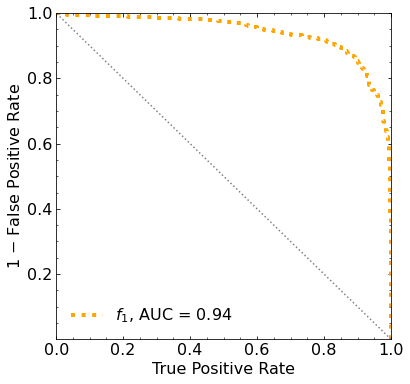

Classification score:


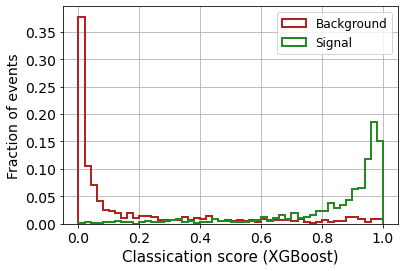


 ROC-AUC =  0.9410038053387416


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  198.6372432   188.05827995  170.58544281  149.25326747  120.43217037
   83.58671374   39.63257649   -7.91755279  -57.99536709 -109.26680594]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 180.4403048  168.023474

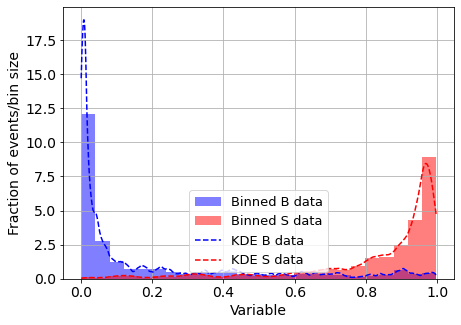

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



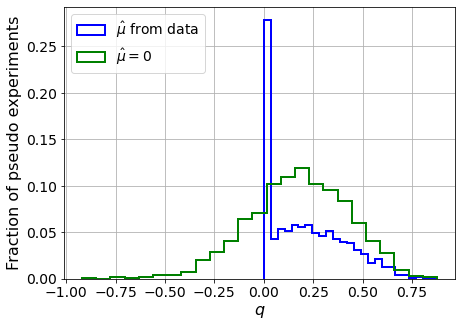

muhat mean:  -4.852481880793795
Z_bins:  0.4269351425133105
std Z_bins:  0.22640814494604353
Z_bins mu=0:  0.4269351425133105
std Z_bins mu=0:  0.29310109536192896

--------

B_expected:  643
S_expected:  1



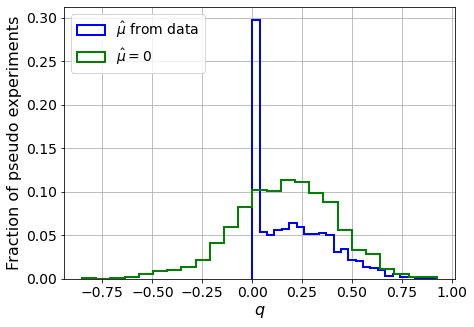

muhat mean:  -4.4153446508057534
Z_bins:  0.4207646096993196
std Z_bins:  0.2263736945876515
Z_bins mu=0:  0.4207646096993196
std Z_bins mu=0:  0.29523901044091827

--------

B_expected:  643
S_expected:  2



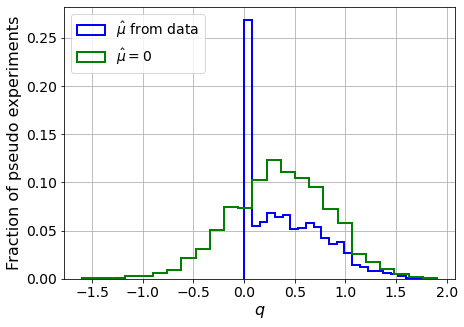

muhat mean:  -2.2348777234661257
Z_bins:  0.6033276417516117
std Z_bins:  0.31623876706818405
Z_bins mu=0:  0.6033276417516117
std Z_bins mu=0:  0.39947144288813713

--------

B_expected:  643
S_expected:  3



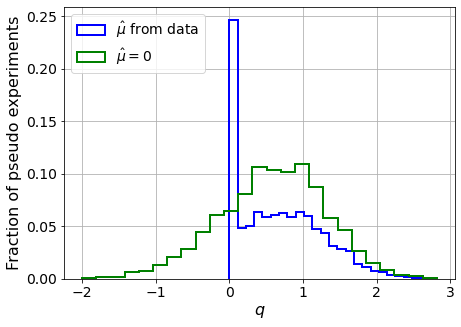

muhat mean:  -1.489466942796554
Z_bins:  0.7847351900046743
std Z_bins:  0.3663646866499416
Z_bins mu=0:  0.7847351900046743
std Z_bins mu=0:  0.46081326651848903

--------

B_expected:  643
S_expected:  7



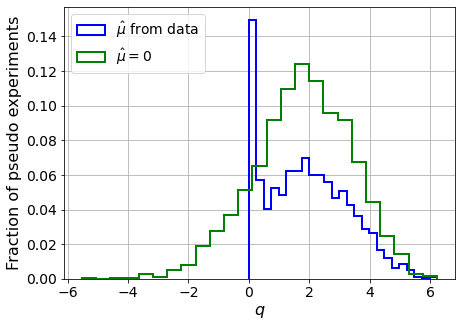

muhat mean:  -0.6588915413298254
Z_bins:  1.359881910697047
std Z_bins:  0.5000189726199983
Z_bins mu=0:  1.359881910697047
std Z_bins mu=0:  0.5920901527106348

--------

B_expected:  643
S_expected:  15



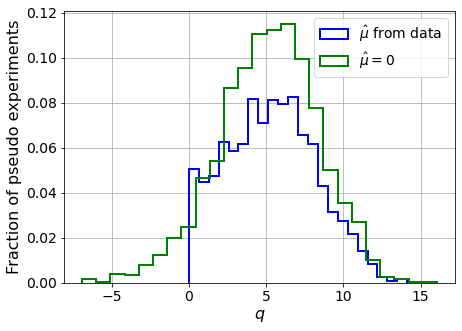

muhat mean:  -0.31132085926057435
Z_bins:  2.3089547352421262
std Z_bins:  0.6284756057184412
Z_bins mu=0:  2.3089547352421262
std Z_bins mu=0:  0.6984792427430442

--------

B_expected:  643
S_expected:  33



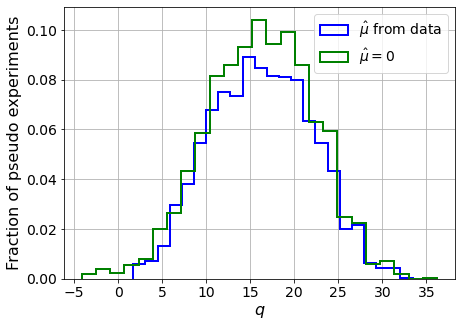

muhat mean:  -0.13652834983218776
Z_bins:  4.04926600390882
std Z_bins:  0.7100982421529977
Z_bins mu=0:  4.04926600390882
std Z_bins mu=0:  0.7462044109449096

--------

B_expected:  643
S_expected:  72



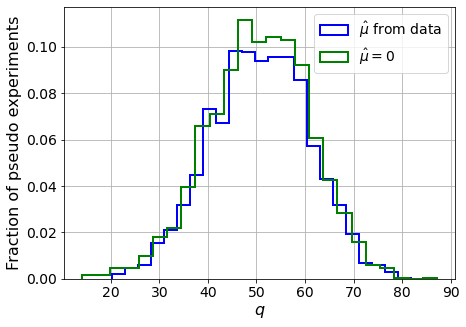

muhat mean:  -0.06395504663003457
Z_bins:  7.133086714337833
std Z_bins:  0.7082108932968173
Z_bins mu=0:  7.133086714337833
std Z_bins mu=0:  0.7282171284515724

--------

B_expected:  643
S_expected:  154



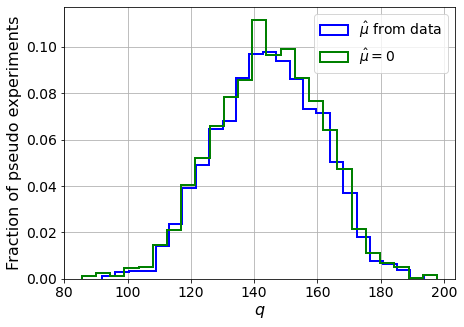

muhat mean:  -0.030345373195177466
Z_bins:  12.025859961046033
std Z_bins:  0.687237278949071
Z_bins mu=0:  12.025859083597753
std Z_bins mu=0:  0.6985949501850975

--------

B_expected:  643
S_expected:  333



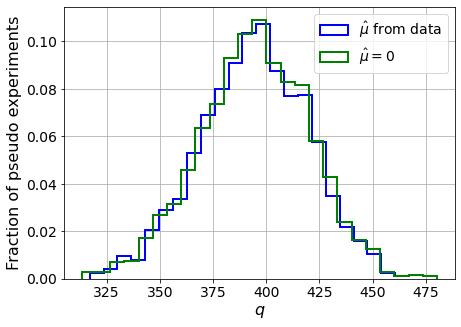

muhat mean:  -0.01347529514162938
Z_bins:  19.880024382187383
std Z_bins:  0.642413605204581
Z_bins mu=0:  19.880024382187383
std Z_bins mu=0:  0.6498643196715909

--------


 FINAL RESULT:

[[0.4269351425133105, 0.22640814494604353, -4.852481880793795, 0.4269351425133105, 0.29310109536192896], [0.4207646096993196, 0.2263736945876515, -4.4153446508057534, 0.4207646096993196, 0.29523901044091827], [0.6033276417516117, 0.31623876706818405, -2.2348777234661257, 0.6033276417516117, 0.39947144288813713], [0.7847351900046743, 0.3663646866499416, -1.489466942796554, 0.7847351900046743, 0.46081326651848903], [1.359881910697047, 0.5000189726199983, -0.6588915413298254, 1.359881910697047, 0.5920901527106348], [2.3089547352421262, 0.6284756057184412, -0.31132085926057435, 2.3089547352421262, 0.6984792427430442], [4.04926600390882, 0.7100982421529977, -0.13652834983218776, 4.04926600390882, 0.7462044109449096], [7.133086714337833, 0.7082108932968173, -0.06395504663003457, 7.133086714337833, 0.7282

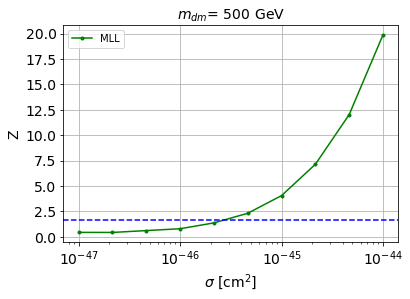


cross_MLL_164:  2.823357737250037e-46
cross_MLL_164_up:  1.767438573132302e-46
cross_MLL_164_down:  4.518020182077416e-46

#########################



In [34]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)
    


        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
#     # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
    del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))

    # all the signal features
    X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')



    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)



    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)



    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    #################################
    # CONCATENATE IMAGES + FEATURES #
    #################################
    
    X_mon_train = np.concatenate([X_mon_train_1D, X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon_test_1D, X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon_val_1D, X_mon5_val],axis=1)

    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [35]:
cross_imagesdt_MLL = store_cross_MLL_164
cross_imagesdt_MLL_up = store_cross_MLL_164_up
cross_imagesdt_MLL_down = store_cross_MLL_164_down

print(cross_imagesdt_MLL)
print(cross_imagesdt_MLL_up)
print(cross_imagesdt_MLL_down)

[6.680588402119633e-46, 4.814023253953184e-47, 3.752259240105303e-47, 4.786908913056223e-47, 6.685818777036986e-47, 1.1447054164866757e-46, 2.823357737250037e-46]
[4.9548423250451545e-46, 3.409543732288752e-47, 2.316580854555564e-47, 2.8702847583107853e-47, 4.1396155033022835e-47, 6.664872286021001e-47, 1.767438573132302e-46]
[9.309126829276623e-46, 6.722485458576336e-47, 5.626821961338216e-47, 7.643007754610486e-47, 1.0301495228829623e-46, 1.7956159631574693e-46, 4.518020182077416e-46]


In [36]:
np.savetxt('results/imagesdt_MLL.txt', [cross_imagesdt_MLL, cross_imagesdt_MLL_up, cross_imagesdt_MLL_down])

In [37]:
cross_imagesdt_MLL = np.loadtxt('results/imagesdt_MLL.txt')[0]
cross_imagesdt_MLL_up = np.loadtxt('results/imagesdt_MLL.txt')[1]
cross_imagesdt_MLL_down =np.loadtxt('results/imagesdt_MLL.txt')[2]

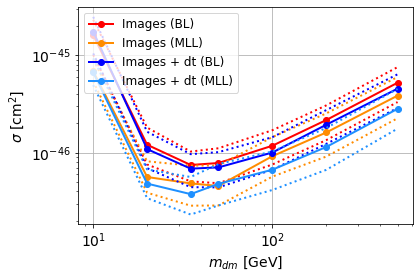

In [38]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_images, '-o', color='red', lw=lw, label=r'Images (BL)')
plt.plot(mDM_mDM, cross_images_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_images_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_images_MLL, '-o', color='darkorange', lw=lw, label=r'Images (MLL)')
plt.plot(mDM_mDM, cross_images_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_images_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt, '-o', color='blue', lw=lw, label=r'Images + dt (BL)')
plt.plot(mDM_mDM, cross_imagesdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'Images + dt (MLL)')
plt.plot(mDM_mDM, cross_imagesdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_MLL_down, ':', color='dodgerblue', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 3. Images + time diff + 16 compressed features


#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:  (5000, 8)
B_pdiffT.shape:  (5000,)
S_pdiffT.shape:  (5000,)


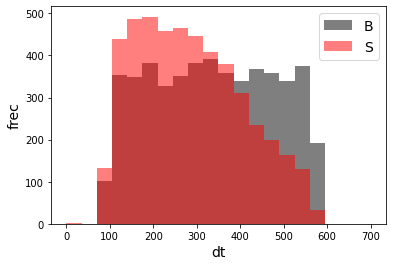

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68346	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67397	validation_1-logloss:0.67435
[2]	validation_0-logloss:0.66467	validation_1-logloss:0.66521
[3]	validation_0-logloss:0.65555	validation_1-logloss:0.65626
[4]	validation_0-logloss:0.64660	validation_1-logloss:0.64746
[5]	validation_0-logloss:0.63783	validation_1-logloss:0.63887
[6]	validation_0-logloss:0.62922	validation_1-logloss:0.63041
[7]	validation_0-logloss:0.62077	validation_1-logloss:0.62213
[8]	validation_0-logloss:0.61248	validation_1-logloss:0.61399
[9]	validation_0-logloss:0.60434	validation_1-logloss:0.60604
[10]	validation_0-logloss:0.59635	validation_1-logloss:0.59820
[11]	validation_0-logloss:0.58851	validation_1-logloss:0.59052
[12]	validation_0-logloss:0.58080	validation_1-logloss:0.58293
[13]	validation_0-logloss:0.57323	validation_1-logloss:0.57551
[14]	validation_0-logloss:0.56580	validation_1-logloss:0.56819
[15]	validation_0-logloss:0.55845	validation_1-logloss:0.56100
[1

[130]	validation_0-logloss:0.15611	validation_1-logloss:0.17065
[131]	validation_0-logloss:0.15459	validation_1-logloss:0.16923
[132]	validation_0-logloss:0.15307	validation_1-logloss:0.16782
[133]	validation_0-logloss:0.15158	validation_1-logloss:0.16642
[134]	validation_0-logloss:0.15010	validation_1-logloss:0.16504
[135]	validation_0-logloss:0.14864	validation_1-logloss:0.16367
[136]	validation_0-logloss:0.14717	validation_1-logloss:0.16225
[137]	validation_0-logloss:0.14573	validation_1-logloss:0.16092
[138]	validation_0-logloss:0.14430	validation_1-logloss:0.15951
[139]	validation_0-logloss:0.14289	validation_1-logloss:0.15819
[140]	validation_0-logloss:0.14150	validation_1-logloss:0.15691
[141]	validation_0-logloss:0.14012	validation_1-logloss:0.15557
[142]	validation_0-logloss:0.13875	validation_1-logloss:0.15429
[143]	validation_0-logloss:0.13741	validation_1-logloss:0.15298
[144]	validation_0-logloss:0.13608	validation_1-logloss:0.15176
[145]	validation_0-logloss:0.13476	valid

[259]	validation_0-logloss:0.04706	validation_1-logloss:0.06888
[260]	validation_0-logloss:0.04665	validation_1-logloss:0.06851
[261]	validation_0-logloss:0.04624	validation_1-logloss:0.06809
[262]	validation_0-logloss:0.04583	validation_1-logloss:0.06771
[263]	validation_0-logloss:0.04543	validation_1-logloss:0.06734
[264]	validation_0-logloss:0.04503	validation_1-logloss:0.06694
[265]	validation_0-logloss:0.04464	validation_1-logloss:0.06659
[266]	validation_0-logloss:0.04425	validation_1-logloss:0.06624
[267]	validation_0-logloss:0.04386	validation_1-logloss:0.06586
[268]	validation_0-logloss:0.04348	validation_1-logloss:0.06553
[269]	validation_0-logloss:0.04310	validation_1-logloss:0.06520
[270]	validation_0-logloss:0.04272	validation_1-logloss:0.06486
[271]	validation_0-logloss:0.04236	validation_1-logloss:0.06454
[272]	validation_0-logloss:0.04200	validation_1-logloss:0.06422
[273]	validation_0-logloss:0.04164	validation_1-logloss:0.06392
[274]	validation_0-logloss:0.04128	valid

[388]	validation_0-logloss:0.01613	validation_1-logloss:0.04433
[389]	validation_0-logloss:0.01600	validation_1-logloss:0.04426
[390]	validation_0-logloss:0.01587	validation_1-logloss:0.04417
[391]	validation_0-logloss:0.01575	validation_1-logloss:0.04409
[392]	validation_0-logloss:0.01563	validation_1-logloss:0.04401
[393]	validation_0-logloss:0.01551	validation_1-logloss:0.04393
[394]	validation_0-logloss:0.01539	validation_1-logloss:0.04384
[395]	validation_0-logloss:0.01528	validation_1-logloss:0.04376
[396]	validation_0-logloss:0.01517	validation_1-logloss:0.04369
[397]	validation_0-logloss:0.01506	validation_1-logloss:0.04357
[398]	validation_0-logloss:0.01494	validation_1-logloss:0.04350
[399]	validation_0-logloss:0.01483	validation_1-logloss:0.04343
[400]	validation_0-logloss:0.01472	validation_1-logloss:0.04338
[401]	validation_0-logloss:0.01461	validation_1-logloss:0.04332
[402]	validation_0-logloss:0.01450	validation_1-logloss:0.04325
[403]	validation_0-logloss:0.01439	valid

[517]	validation_0-logloss:0.00639	validation_1-logloss:0.04110
[518]	validation_0-logloss:0.00635	validation_1-logloss:0.04115
[519]	validation_0-logloss:0.00631	validation_1-logloss:0.04111
[520]	validation_0-logloss:0.00627	validation_1-logloss:0.04113
[521]	validation_0-logloss:0.00623	validation_1-logloss:0.04113
[522]	validation_0-logloss:0.00620	validation_1-logloss:0.04113
[523]	validation_0-logloss:0.00616	validation_1-logloss:0.04114
[524]	validation_0-logloss:0.00612	validation_1-logloss:0.04112
[525]	validation_0-logloss:0.00608	validation_1-logloss:0.04115
[526]	validation_0-logloss:0.00604	validation_1-logloss:0.04116
[527]	validation_0-logloss:0.00600	validation_1-logloss:0.04115
[528]	validation_0-logloss:0.00597	validation_1-logloss:0.04115
[529]	validation_0-logloss:0.00593	validation_1-logloss:0.04116
[530]	validation_0-logloss:0.00589	validation_1-logloss:0.04119
[531]	validation_0-logloss:0.00586	validation_1-logloss:0.04115
[532]	validation_0-logloss:0.00582	valid

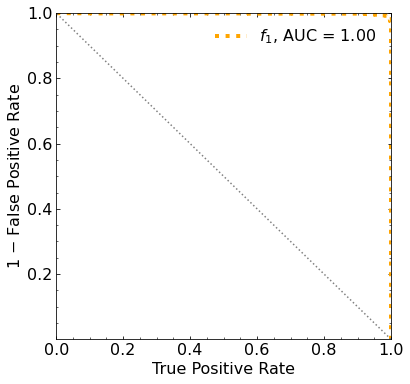

Classification score:


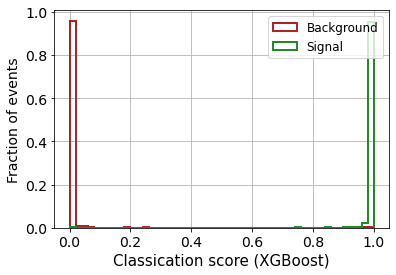


 ROC-AUC =  0.998505457050376
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.091


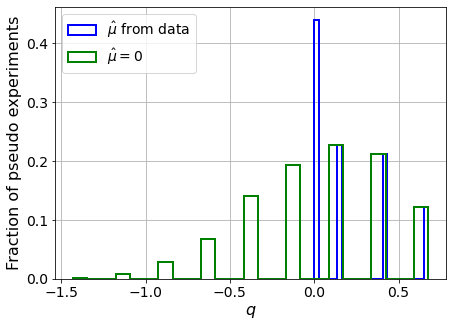

muhat mean:  0.3092389174929095
Z_bins:  0.3844968245969982
std Z_bins:  0.3047044156476989
Z_bins mu=0:  0.3844968245969982
std Z_bins mu=0:  0.5529371918950919

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.09


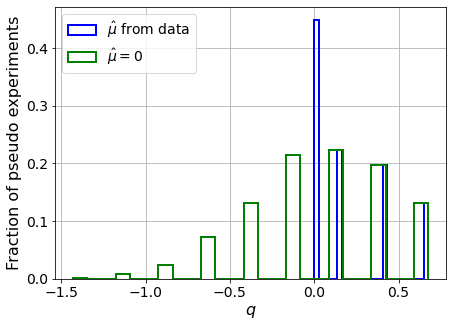

muhat mean:  0.2917307188453505
Z_bins:  0.38445019552214305
std Z_bins:  0.30958856264749934
Z_bins mu=0:  0.38445019552214305
std Z_bins mu=0:  0.5465614420735059

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0855


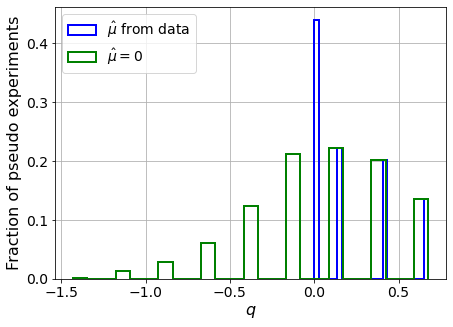

muhat mean:  0.2783676619444838
Z_bins:  0.38445019552214305
std Z_bins:  0.31225940052466994
Z_bins mu=0:  0.38445019552214305
std Z_bins mu=0:  0.5618231654742571

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0775


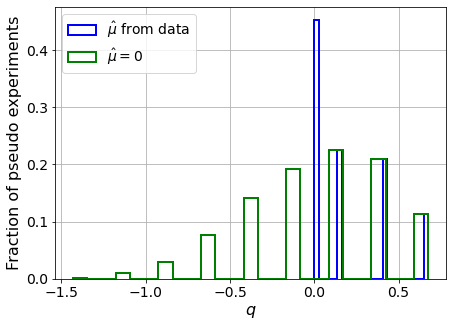

muhat mean:  0.3772176709712985
Z_bins:  0.3843569204023095
std Z_bins:  0.30065142805016976
Z_bins mu=0:  0.3843569204023095
std Z_bins mu=0:  0.563509017417006

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.087


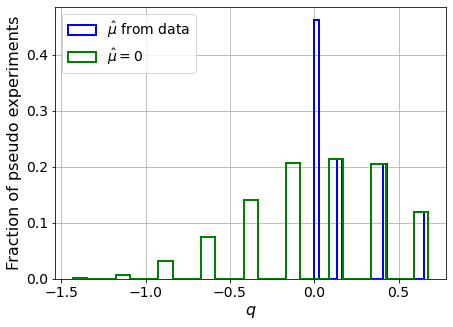

muhat mean:  0.36102324413906334
Z_bins:  0.3842752860997393
std Z_bins:  0.30466069433099974
Z_bins mu=0:  0.3842752860997393
std Z_bins mu=0:  0.5558273380960309

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.084


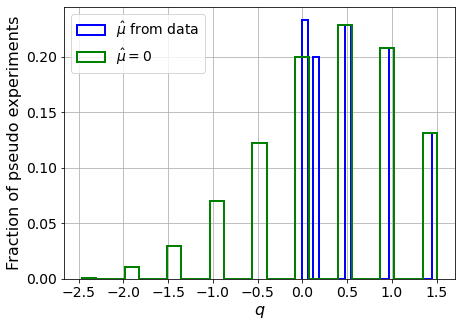

muhat mean:  0.1426800850478514
Z_bins:  0.7140258754104332
std Z_bins:  0.36217492739341006
Z_bins mu=0:  0.7140258754104332
std Z_bins mu=0:  0.5687791646805778

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0895


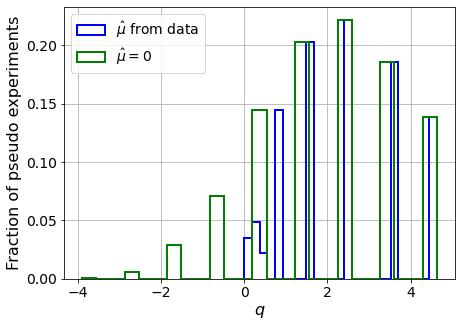

muhat mean:  0.06292722141086872
Z_bins:  1.5785706918374063
std Z_bins:  0.4378316530454956
Z_bins mu=0:  1.5785706918374063
std Z_bins mu=0:  0.5480434114647398

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.082


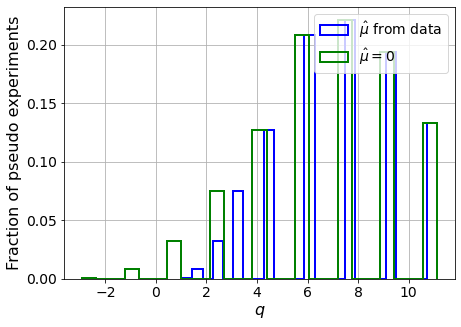

muhat mean:  0.03273932790894167
Z_bins:  2.756216103830276
std Z_bins:  0.4537904712882507
Z_bins mu=0:  2.756216103830276
std Z_bins mu=0:  0.5232533760488857

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


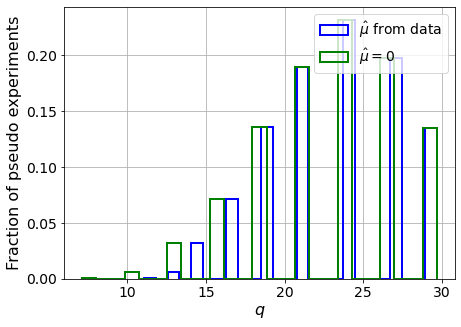

muhat mean:  0.013450582984314388
Z_bins:  4.901129455049662
std Z_bins:  0.43121037100946846
Z_bins mu=0:  4.901129455049662
std Z_bins mu=0:  0.47001626379622913

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0795


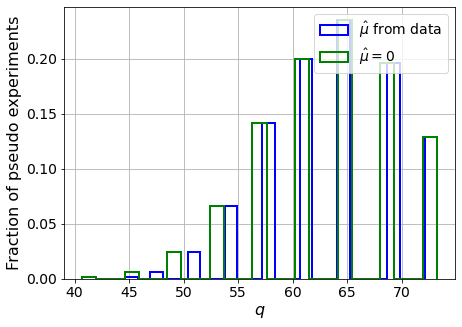

muhat mean:  0.006163268436886304
Z_bins:  8.065390443578384
std Z_bins:  0.3788866709961216
Z_bins mu=0:  8.065390443578384
std Z_bins mu=0:  0.40169177190720634

--------


 FINAL RESULT:

[[0.3844968245969982, 0.3047044156476989, 0.3092389174929095, 0.3844968245969982, 0.5529371918950919], [0.38445019552214305, 0.30958856264749934, 0.2917307188453505, 0.38445019552214305, 0.5465614420735059], [0.38445019552214305, 0.31225940052466994, 0.2783676619444838, 0.38445019552214305, 0.5618231654742571], [0.3843569204023095, 0.30065142805016976, 0.3772176709712985, 0.3843569204023095, 0.563509017417006], [0.3842752860997393, 0.30466069433099974, 0.36102324413906334, 0.3842752860997393, 0.5558273380960309], [0.7140258754104332, 0.36217492739341006, 0.1426800850478514, 0.7140258754104332, 0.5687791646805778], [1.5785706918374063, 0.4378316530454956, 0.06292722141086872, 1.5785706918374063, 0.5480434114647398], [2.756216103830276, 0.4537904712882507, 0.03273932790894167, 2.756216103830276, 0.52

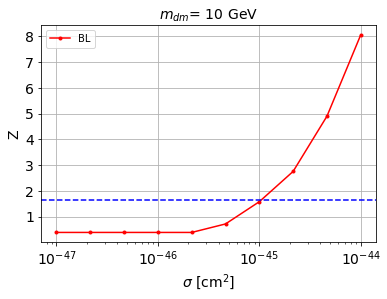


cross_BL_164:  1.0484799698722304e-45
cross_BL_164_up:  7.55915602107398e-46
cross_BL_164_down:  1.470172768555294e-45

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:

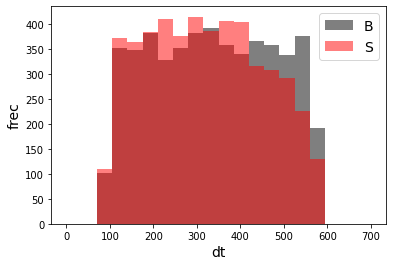

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68419	validation_1-logloss:0.68461
[1]	validation_0-logloss:0.67545	validation_1-logloss:0.67627
[2]	validation_0-logloss:0.66686	validation_1-logloss:0.66807
[3]	validation_0-logloss:0.65843	validation_1-logloss:0.66008
[4]	validation_0-logloss:0.65018	validation_1-logloss:0.65225
[5]	validation_0-logloss:0.64208	validation_1-logloss:0.64453
[6]	validation_0-logloss:0.63413	validation_1-logloss:0.63696
[7]	validation_0-logloss:0.62634	validation_1-logloss:0.62957
[8]	validation_0-logloss:0.61859	validation_1-logloss:0.62216
[9]	validation_0-logloss:0.61096	validation_1-logloss:0.61484
[10]	validation_0-logloss:0.60357	validation_1-logloss:0.60772
[11]	validation_0-logloss:0.59622	validation_1-logloss:0.60073
[12]	validation_0-logloss:0.58901	validation_1-logloss:0.59381
[13]	validation_0-logloss:0.58192	validation_1-logloss:0.58704
[14]	validation_0-logloss:0.57503	validation_1-logloss:0.58044
[15]	validation_0-logloss:0.56819	validation_1-logloss:0.57393
[1

[130]	validation_0-logloss:0.18840	validation_1-logloss:0.21493
[131]	validation_0-logloss:0.18692	validation_1-logloss:0.21353
[132]	validation_0-logloss:0.18544	validation_1-logloss:0.21213
[133]	validation_0-logloss:0.18396	validation_1-logloss:0.21078
[134]	validation_0-logloss:0.18253	validation_1-logloss:0.20945
[135]	validation_0-logloss:0.18108	validation_1-logloss:0.20812
[136]	validation_0-logloss:0.17969	validation_1-logloss:0.20682
[137]	validation_0-logloss:0.17827	validation_1-logloss:0.20550
[138]	validation_0-logloss:0.17690	validation_1-logloss:0.20424
[139]	validation_0-logloss:0.17554	validation_1-logloss:0.20298
[140]	validation_0-logloss:0.17417	validation_1-logloss:0.20173
[141]	validation_0-logloss:0.17284	validation_1-logloss:0.20050
[142]	validation_0-logloss:0.17153	validation_1-logloss:0.19926
[143]	validation_0-logloss:0.17018	validation_1-logloss:0.19806
[144]	validation_0-logloss:0.16890	validation_1-logloss:0.19684
[145]	validation_0-logloss:0.16757	valid

[259]	validation_0-logloss:0.07947	validation_1-logloss:0.11987
[260]	validation_0-logloss:0.07905	validation_1-logloss:0.11955
[261]	validation_0-logloss:0.07865	validation_1-logloss:0.11925
[262]	validation_0-logloss:0.07821	validation_1-logloss:0.11892
[263]	validation_0-logloss:0.07782	validation_1-logloss:0.11861
[264]	validation_0-logloss:0.07737	validation_1-logloss:0.11829
[265]	validation_0-logloss:0.07695	validation_1-logloss:0.11803
[266]	validation_0-logloss:0.07656	validation_1-logloss:0.11773
[267]	validation_0-logloss:0.07613	validation_1-logloss:0.11742
[268]	validation_0-logloss:0.07572	validation_1-logloss:0.11716
[269]	validation_0-logloss:0.07533	validation_1-logloss:0.11690
[270]	validation_0-logloss:0.07490	validation_1-logloss:0.11658
[271]	validation_0-logloss:0.07449	validation_1-logloss:0.11625
[272]	validation_0-logloss:0.07408	validation_1-logloss:0.11595
[273]	validation_0-logloss:0.07367	validation_1-logloss:0.11564
[274]	validation_0-logloss:0.07326	valid

[388]	validation_0-logloss:0.04414	validation_1-logloss:0.09822
[389]	validation_0-logloss:0.04398	validation_1-logloss:0.09814
[390]	validation_0-logloss:0.04382	validation_1-logloss:0.09809
[391]	validation_0-logloss:0.04367	validation_1-logloss:0.09802
[392]	validation_0-logloss:0.04351	validation_1-logloss:0.09796
[393]	validation_0-logloss:0.04336	validation_1-logloss:0.09791
[394]	validation_0-logloss:0.04321	validation_1-logloss:0.09782
[395]	validation_0-logloss:0.04306	validation_1-logloss:0.09774
[396]	validation_0-logloss:0.04290	validation_1-logloss:0.09770
[397]	validation_0-logloss:0.04275	validation_1-logloss:0.09766
[398]	validation_0-logloss:0.04261	validation_1-logloss:0.09767
[399]	validation_0-logloss:0.04245	validation_1-logloss:0.09759
[400]	validation_0-logloss:0.04230	validation_1-logloss:0.09758
[401]	validation_0-logloss:0.04215	validation_1-logloss:0.09756
[402]	validation_0-logloss:0.04201	validation_1-logloss:0.09749
[403]	validation_0-logloss:0.04185	valid

[517]	validation_0-logloss:0.02940	validation_1-logloss:0.09365
[518]	validation_0-logloss:0.02931	validation_1-logloss:0.09370
[519]	validation_0-logloss:0.02920	validation_1-logloss:0.09368
[520]	validation_0-logloss:0.02913	validation_1-logloss:0.09363
[521]	validation_0-logloss:0.02905	validation_1-logloss:0.09360
[522]	validation_0-logloss:0.02896	validation_1-logloss:0.09362
[523]	validation_0-logloss:0.02885	validation_1-logloss:0.09364
[524]	validation_0-logloss:0.02876	validation_1-logloss:0.09360
[525]	validation_0-logloss:0.02868	validation_1-logloss:0.09360
[526]	validation_0-logloss:0.02861	validation_1-logloss:0.09355
[527]	validation_0-logloss:0.02852	validation_1-logloss:0.09348
[528]	validation_0-logloss:0.02844	validation_1-logloss:0.09346
[529]	validation_0-logloss:0.02836	validation_1-logloss:0.09344
[530]	validation_0-logloss:0.02825	validation_1-logloss:0.09342
[531]	validation_0-logloss:0.02817	validation_1-logloss:0.09340
[532]	validation_0-logloss:0.02810	valid

[646]	validation_0-logloss:0.02042	validation_1-logloss:0.09265
[647]	validation_0-logloss:0.02037	validation_1-logloss:0.09266
[648]	validation_0-logloss:0.02033	validation_1-logloss:0.09268
[649]	validation_0-logloss:0.02027	validation_1-logloss:0.09270
[650]	validation_0-logloss:0.02019	validation_1-logloss:0.09269
[651]	validation_0-logloss:0.02012	validation_1-logloss:0.09266
[652]	validation_0-logloss:0.02007	validation_1-logloss:0.09265
[653]	validation_0-logloss:0.02000	validation_1-logloss:0.09259
[654]	validation_0-logloss:0.01996	validation_1-logloss:0.09262
[655]	validation_0-logloss:0.01992	validation_1-logloss:0.09259
[656]	validation_0-logloss:0.01987	validation_1-logloss:0.09261
[657]	validation_0-logloss:0.01980	validation_1-logloss:0.09268
[658]	validation_0-logloss:0.01972	validation_1-logloss:0.09266
[659]	validation_0-logloss:0.01969	validation_1-logloss:0.09270
[660]	validation_0-logloss:0.01962	validation_1-logloss:0.09270
[661]	validation_0-logloss:0.01957	valid

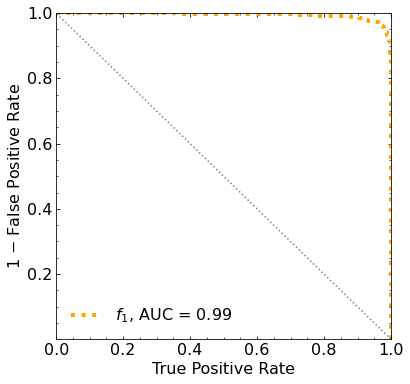

Classification score:


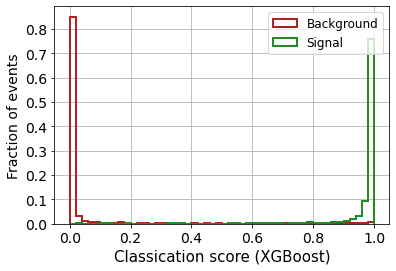


 ROC-AUC =  0.9934571732939996
At least 5 B events per bin, range = [[0, 1]]:
# bins:  6 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  6
range of our data:  [[0, 1]]
number of bins we are going to use:  6
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3085


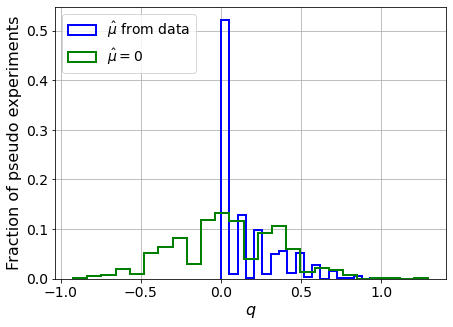

muhat mean:  0.07029386975774216
Z_bins:  0.15874184860728932
std Z_bins:  0.6462123784410647
Z_bins mu=0:  0.13985087029651838
std Z_bins mu=0:  1.1676637322786687

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3065


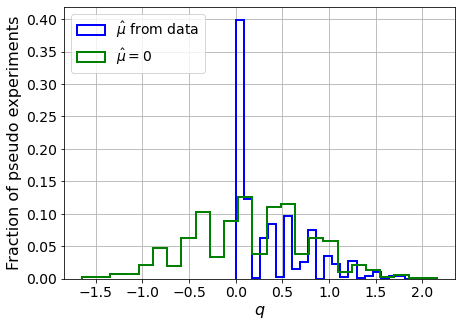

muhat mean:  0.07783123810129135
Z_bins:  0.3873586293967448
std Z_bins:  0.5369860262381969
Z_bins mu=0:  0.3806391974987627
std Z_bins mu=0:  0.8198629512072031

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3035


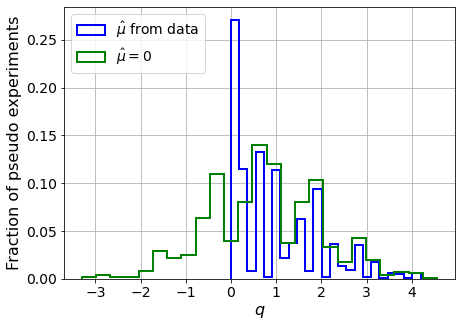

muhat mean:  0.01244992780994559
Z_bins:  0.8137947858153155
std Z_bins:  0.5826552962624777
Z_bins mu=0:  0.8104945088808045
std Z_bins mu=0:  0.7700251692630494

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.321


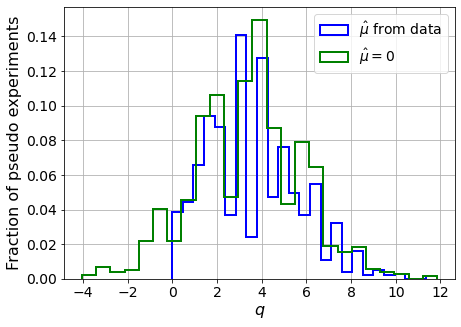

muhat mean:  -0.002193379728579166
Z_bins:  1.7943844902581687
std Z_bins:  0.5779377938511319
Z_bins mu=0:  1.7934547163011996
std Z_bins mu=0:  0.6714154911238938

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3025


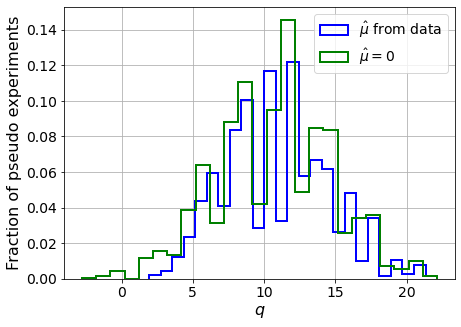

muhat mean:  0.006719026611450218
Z_bins:  3.2583972679486104
std Z_bins:  0.5635991720725103
Z_bins mu=0:  3.257824353684598
std Z_bins mu=0:  0.6186364481241378

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.314


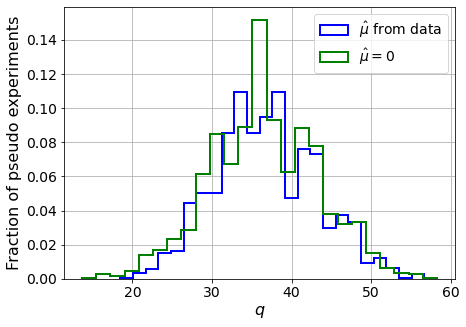

muhat mean:  0.0030533802194885485
Z_bins:  6.022285811687234
std Z_bins:  0.5356988451563646
Z_bins mu=0:  6.021763961628658
std Z_bins mu=0:  0.5663786101257593

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3035


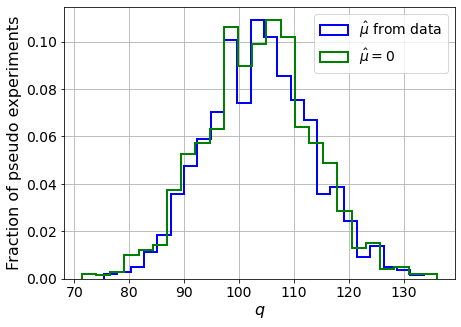

muhat mean:  1.9147962089515146e-05
Z_bins:  10.162798094165568
std Z_bins:  0.4756305280523415
Z_bins mu=0:  10.162567877520418
std Z_bins mu=0:  0.49258785143950234

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3115


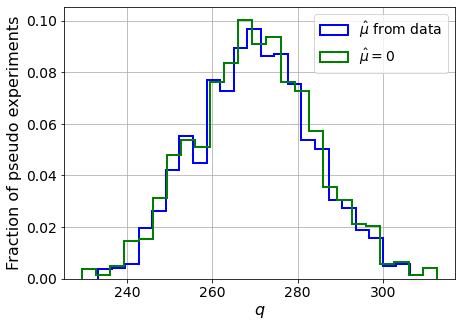

muhat mean:  0.0003963451689554407
Z_bins:  16.42900333834846
std Z_bins:  0.4187427169098573
Z_bins mu=0:  16.428822271219815
std Z_bins mu=0:  0.4293081153354234

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3225


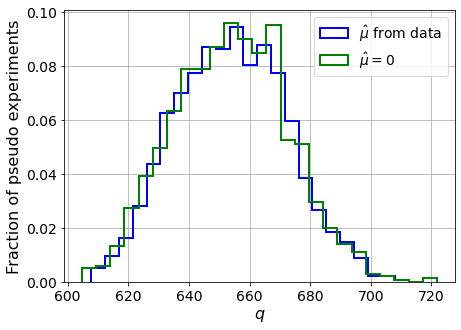

muhat mean:  0.00020850298177477278
Z_bins:  25.574097466821758
std Z_bins:  0.3605008051496483
Z_bins mu=0:  25.573952916893234
std Z_bins mu=0:  0.3672760924243404

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.315


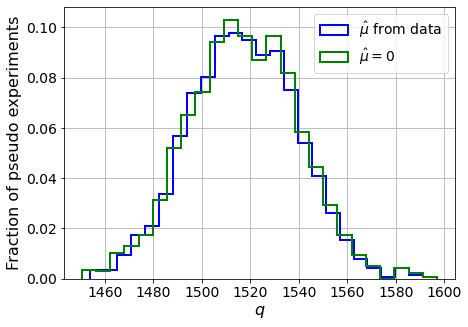

muhat mean:  7.942523979388088e-05
Z_bins:  38.94856420820961
std Z_bins:  0.28574593050829383
Z_bins mu=0:  38.94852428236226
std Z_bins mu=0:  0.2900996209900442

--------


 FINAL RESULT:

[[0.15874184860728932, 0.6462123784410647, 0.07029386975774216, 0.13985087029651838, 1.1676637322786687], [0.3873586293967448, 0.5369860262381969, 0.07783123810129135, 0.3806391974987627, 0.8198629512072031], [0.8137947858153155, 0.5826552962624777, 0.01244992780994559, 0.8104945088808045, 0.7700251692630494], [1.7943844902581687, 0.5779377938511319, -0.002193379728579166, 1.7934547163011996, 0.6714154911238938], [3.2583972679486104, 0.5635991720725103, 0.006719026611450218, 3.257824353684598, 0.6186364481241378], [6.022285811687234, 0.5356988451563646, 0.0030533802194885485, 6.021763961628658, 0.5663786101257593], [10.162798094165568, 0.4756305280523415, 1.9147962089515146e-05, 10.162567877520418, 0.49258785143950234], [16.42900333834846, 0.4187427169098573, 0.0003963451689554407, 16.428822271219

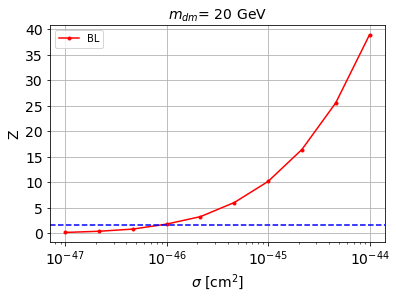


cross_BL_164:  9.02286235394938e-47
cross_BL_164_up:  5.84428865931889e-47
cross_BL_164_down:  1.3012125514302707e-46

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape: 

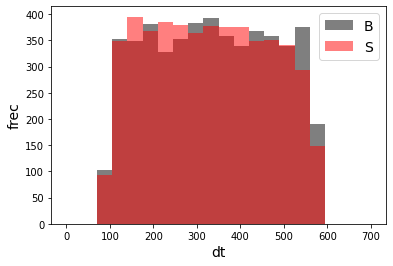

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68515	validation_1-logloss:0.68544
[1]	validation_0-logloss:0.67732	validation_1-logloss:0.67791
[2]	validation_0-logloss:0.66964	validation_1-logloss:0.67052
[3]	validation_0-logloss:0.66212	validation_1-logloss:0.66328
[4]	validation_0-logloss:0.65474	validation_1-logloss:0.65619
[5]	validation_0-logloss:0.64748	validation_1-logloss:0.64915
[6]	validation_0-logloss:0.64040	validation_1-logloss:0.64224
[7]	validation_0-logloss:0.63342	validation_1-logloss:0.63556
[8]	validation_0-logloss:0.62656	validation_1-logloss:0.62891
[9]	validation_0-logloss:0.61983	validation_1-logloss:0.62236
[10]	validation_0-logloss:0.61324	validation_1-logloss:0.61603
[11]	validation_0-logloss:0.60676	validation_1-logloss:0.60974
[12]	validation_0-logloss:0.60040	validation_1-logloss:0.60367
[13]	validation_0-logloss:0.59413	validation_1-logloss:0.59762
[14]	validation_0-logloss:0.58792	validation_1-logloss:0.59158
[15]	validation_0-logloss:0.58189	validation_1-logloss:0.58575
[1

[130]	validation_0-logloss:0.24027	validation_1-logloss:0.26619
[131]	validation_0-logloss:0.23885	validation_1-logloss:0.26501
[132]	validation_0-logloss:0.23751	validation_1-logloss:0.26386
[133]	validation_0-logloss:0.23611	validation_1-logloss:0.26269
[134]	validation_0-logloss:0.23475	validation_1-logloss:0.26138
[135]	validation_0-logloss:0.23336	validation_1-logloss:0.26026
[136]	validation_0-logloss:0.23197	validation_1-logloss:0.25913
[137]	validation_0-logloss:0.23074	validation_1-logloss:0.25811
[138]	validation_0-logloss:0.22945	validation_1-logloss:0.25705
[139]	validation_0-logloss:0.22811	validation_1-logloss:0.25598
[140]	validation_0-logloss:0.22689	validation_1-logloss:0.25496
[141]	validation_0-logloss:0.22554	validation_1-logloss:0.25378
[142]	validation_0-logloss:0.22428	validation_1-logloss:0.25264
[143]	validation_0-logloss:0.22305	validation_1-logloss:0.25164
[144]	validation_0-logloss:0.22174	validation_1-logloss:0.25056
[145]	validation_0-logloss:0.22051	valid

[259]	validation_0-logloss:0.13326	validation_1-logloss:0.18088
[260]	validation_0-logloss:0.13278	validation_1-logloss:0.18051
[261]	validation_0-logloss:0.13236	validation_1-logloss:0.18016
[262]	validation_0-logloss:0.13193	validation_1-logloss:0.17985
[263]	validation_0-logloss:0.13151	validation_1-logloss:0.17955
[264]	validation_0-logloss:0.13105	validation_1-logloss:0.17918
[265]	validation_0-logloss:0.13061	validation_1-logloss:0.17886
[266]	validation_0-logloss:0.13016	validation_1-logloss:0.17860
[267]	validation_0-logloss:0.12975	validation_1-logloss:0.17827
[268]	validation_0-logloss:0.12931	validation_1-logloss:0.17798
[269]	validation_0-logloss:0.12890	validation_1-logloss:0.17769
[270]	validation_0-logloss:0.12846	validation_1-logloss:0.17747
[271]	validation_0-logloss:0.12806	validation_1-logloss:0.17722
[272]	validation_0-logloss:0.12763	validation_1-logloss:0.17702
[273]	validation_0-logloss:0.12724	validation_1-logloss:0.17677
[274]	validation_0-logloss:0.12685	valid

[388]	validation_0-logloss:0.09358	validation_1-logloss:0.15964
[389]	validation_0-logloss:0.09336	validation_1-logloss:0.15956
[390]	validation_0-logloss:0.09316	validation_1-logloss:0.15953
[391]	validation_0-logloss:0.09296	validation_1-logloss:0.15943
[392]	validation_0-logloss:0.09267	validation_1-logloss:0.15928
[393]	validation_0-logloss:0.09246	validation_1-logloss:0.15922
[394]	validation_0-logloss:0.09226	validation_1-logloss:0.15921
[395]	validation_0-logloss:0.09204	validation_1-logloss:0.15917
[396]	validation_0-logloss:0.09184	validation_1-logloss:0.15909
[397]	validation_0-logloss:0.09162	validation_1-logloss:0.15903
[398]	validation_0-logloss:0.09144	validation_1-logloss:0.15900
[399]	validation_0-logloss:0.09119	validation_1-logloss:0.15895
[400]	validation_0-logloss:0.09098	validation_1-logloss:0.15891
[401]	validation_0-logloss:0.09079	validation_1-logloss:0.15883
[402]	validation_0-logloss:0.09052	validation_1-logloss:0.15871
[403]	validation_0-logloss:0.09029	valid

[517]	validation_0-logloss:0.07162	validation_1-logloss:0.15333
[518]	validation_0-logloss:0.07154	validation_1-logloss:0.15327
[519]	validation_0-logloss:0.07136	validation_1-logloss:0.15324
[520]	validation_0-logloss:0.07127	validation_1-logloss:0.15318
[521]	validation_0-logloss:0.07114	validation_1-logloss:0.15315
[522]	validation_0-logloss:0.07100	validation_1-logloss:0.15313
[523]	validation_0-logloss:0.07083	validation_1-logloss:0.15304
[524]	validation_0-logloss:0.07071	validation_1-logloss:0.15299
[525]	validation_0-logloss:0.07055	validation_1-logloss:0.15298
[526]	validation_0-logloss:0.07043	validation_1-logloss:0.15291
[527]	validation_0-logloss:0.07028	validation_1-logloss:0.15293
[528]	validation_0-logloss:0.07016	validation_1-logloss:0.15287
[529]	validation_0-logloss:0.07002	validation_1-logloss:0.15283
[530]	validation_0-logloss:0.06983	validation_1-logloss:0.15282
[531]	validation_0-logloss:0.06972	validation_1-logloss:0.15276
[532]	validation_0-logloss:0.06961	valid

[646]	validation_0-logloss:0.05666	validation_1-logloss:0.14942
[647]	validation_0-logloss:0.05657	validation_1-logloss:0.14942
[648]	validation_0-logloss:0.05649	validation_1-logloss:0.14938
[649]	validation_0-logloss:0.05642	validation_1-logloss:0.14936
[650]	validation_0-logloss:0.05628	validation_1-logloss:0.14935
[651]	validation_0-logloss:0.05619	validation_1-logloss:0.14936
[652]	validation_0-logloss:0.05609	validation_1-logloss:0.14931
[653]	validation_0-logloss:0.05599	validation_1-logloss:0.14926
[654]	validation_0-logloss:0.05585	validation_1-logloss:0.14924
[655]	validation_0-logloss:0.05575	validation_1-logloss:0.14920
[656]	validation_0-logloss:0.05560	validation_1-logloss:0.14914
[657]	validation_0-logloss:0.05547	validation_1-logloss:0.14914
[658]	validation_0-logloss:0.05535	validation_1-logloss:0.14910
[659]	validation_0-logloss:0.05528	validation_1-logloss:0.14914
[660]	validation_0-logloss:0.05514	validation_1-logloss:0.14914
[661]	validation_0-logloss:0.05504	valid

[775]	validation_0-logloss:0.04451	validation_1-logloss:0.14857
[776]	validation_0-logloss:0.04445	validation_1-logloss:0.14857
[777]	validation_0-logloss:0.04439	validation_1-logloss:0.14855
[778]	validation_0-logloss:0.04430	validation_1-logloss:0.14855
[779]	validation_0-logloss:0.04419	validation_1-logloss:0.14853
[780]	validation_0-logloss:0.04409	validation_1-logloss:0.14853
[781]	validation_0-logloss:0.04403	validation_1-logloss:0.14852
[782]	validation_0-logloss:0.04398	validation_1-logloss:0.14854
[783]	validation_0-logloss:0.04392	validation_1-logloss:0.14857
[784]	validation_0-logloss:0.04385	validation_1-logloss:0.14854
[785]	validation_0-logloss:0.04379	validation_1-logloss:0.14852
[786]	validation_0-logloss:0.04373	validation_1-logloss:0.14852
[787]	validation_0-logloss:0.04362	validation_1-logloss:0.14848
[788]	validation_0-logloss:0.04356	validation_1-logloss:0.14851
[789]	validation_0-logloss:0.04346	validation_1-logloss:0.14857
[790]	validation_0-logloss:0.04337	valid

[904]	validation_0-logloss:0.03577	validation_1-logloss:0.14806
[905]	validation_0-logloss:0.03570	validation_1-logloss:0.14812
[906]	validation_0-logloss:0.03562	validation_1-logloss:0.14812
[907]	validation_0-logloss:0.03558	validation_1-logloss:0.14812
[908]	validation_0-logloss:0.03554	validation_1-logloss:0.14814
[909]	validation_0-logloss:0.03547	validation_1-logloss:0.14811
[910]	validation_0-logloss:0.03542	validation_1-logloss:0.14811
[911]	validation_0-logloss:0.03535	validation_1-logloss:0.14815
[912]	validation_0-logloss:0.03531	validation_1-logloss:0.14812
[913]	validation_0-logloss:0.03526	validation_1-logloss:0.14809
[914]	validation_0-logloss:0.03519	validation_1-logloss:0.14802
[915]	validation_0-logloss:0.03516	validation_1-logloss:0.14803
[916]	validation_0-logloss:0.03508	validation_1-logloss:0.14808
[917]	validation_0-logloss:0.03504	validation_1-logloss:0.14808
[918]	validation_0-logloss:0.03496	validation_1-logloss:0.14806
[919]	validation_0-logloss:0.03491	valid

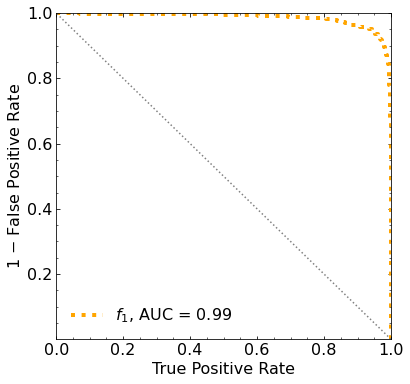

Classification score:


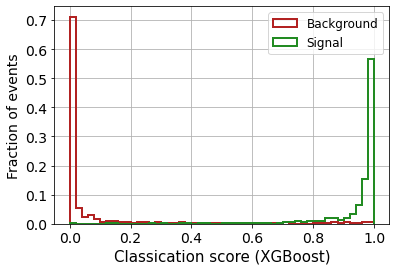


 ROC-AUC =  0.9851941337348656
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0655


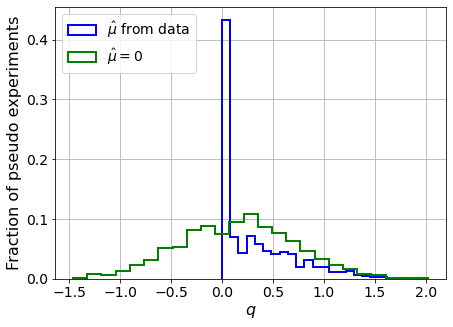

muhat mean:  0.017942934113209318
Z_bins:  0.3906926994649777
std Z_bins:  0.48387117543134217
Z_bins mu=0:  0.39060945908495637
std Z_bins mu=0:  0.7209758506711155

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0665


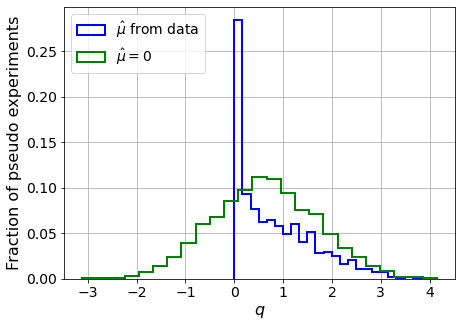

muhat mean:  -0.021185089944222198
Z_bins:  0.7758928823103046
std Z_bins:  0.5188423312751687
Z_bins mu=0:  0.7758781598428309
std Z_bins mu=0:  0.6853749652030844

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.069


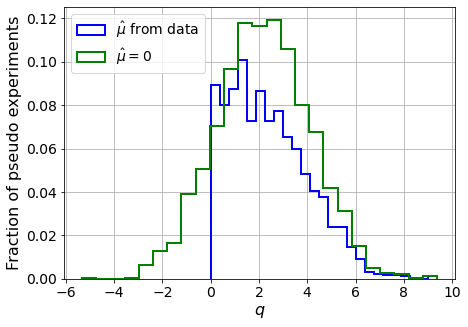

muhat mean:  -0.0036069013585309693
Z_bins:  1.4769400889881068
std Z_bins:  0.5493256548963129
Z_bins mu=0:  1.4769350228216591
std Z_bins mu=0:  0.6530263596605511

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0605


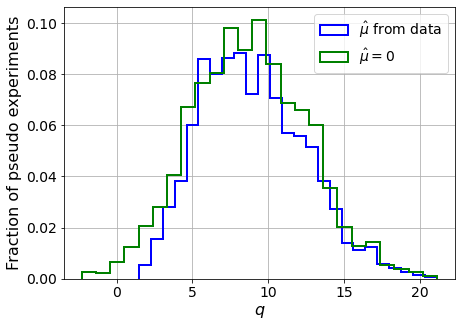

muhat mean:  0.005506239299211249
Z_bins:  2.9553012438868165
std Z_bins:  0.5822454308180977
Z_bins mu=0:  2.955032783734025
std Z_bins mu=0:  0.6387315397670263

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0705


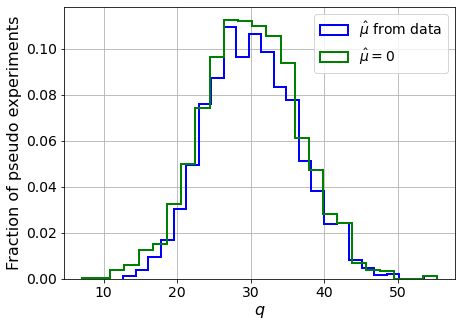

muhat mean:  0.0011188093027588498
Z_bins:  5.478829584697831
std Z_bins:  0.5639507888820241
Z_bins mu=0:  5.478829584697831
std Z_bins mu=0:  0.5974148707575305

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0695


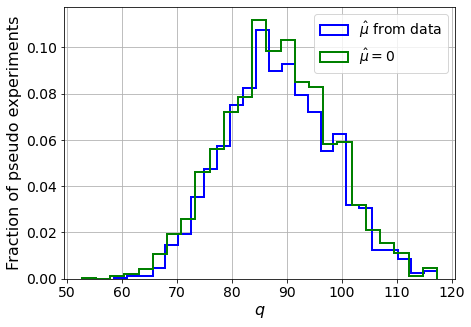

muhat mean:  -0.0002371296016838461
Z_bins:  9.38588810133224
std Z_bins:  0.5104365220682625
Z_bins mu=0:  9.384407464855105
std Z_bins mu=0:  0.5287649357856375

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0595


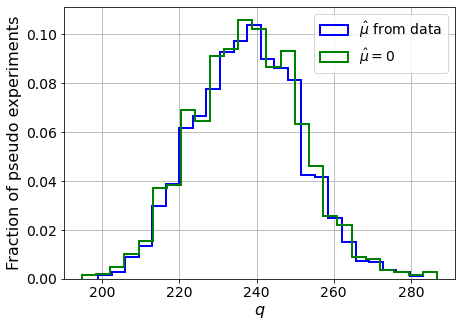

muhat mean:  -0.00012990844040705737
Z_bins:  15.423158602040274
std Z_bins:  0.445599387949821
Z_bins mu=0:  15.422681690710828
std Z_bins mu=0:  0.4563064287291376

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.063


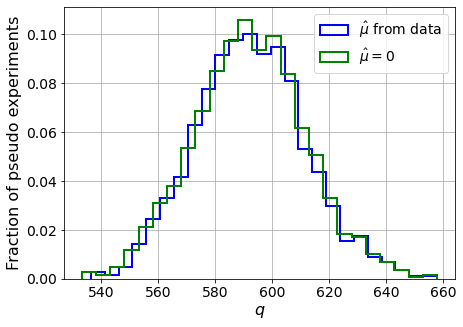

muhat mean:  -0.0003617664660455005
Z_bins:  24.32825581139872
std Z_bins:  0.39536527562975826
Z_bins mu=0:  24.328253741326588
std Z_bins mu=0:  0.40185833502264773

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0685


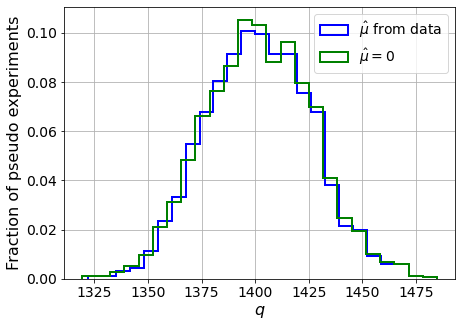

muhat mean:  9.362970729678862e-05
Z_bins:  37.43899544313124
std Z_bins:  0.32919855963645717
Z_bins mu=0:  37.43823042312462
std Z_bins mu=0:  0.33350471816263166

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.069


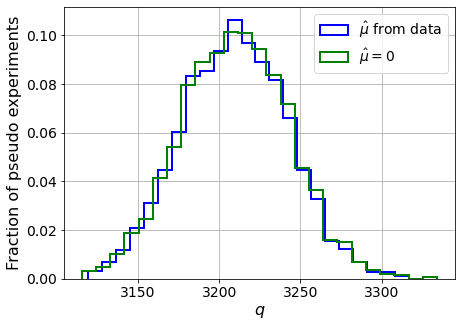

muhat mean:  9.287028843258855e-05
Z_bins:  56.65601975902066
std Z_bins:  0.2881378129311015
Z_bins mu=0:  56.655973607796774
std Z_bins mu=0:  0.2911243070731651

--------


 FINAL RESULT:

[[0.3906926994649777, 0.48387117543134217, 0.017942934113209318, 0.39060945908495637, 0.7209758506711155], [0.7758928823103046, 0.5188423312751687, -0.021185089944222198, 0.7758781598428309, 0.6853749652030844], [1.4769400889881068, 0.5493256548963129, -0.0036069013585309693, 1.4769350228216591, 0.6530263596605511], [2.9553012438868165, 0.5822454308180977, 0.005506239299211249, 2.955032783734025, 0.6387315397670263], [5.478829584697831, 0.5639507888820241, 0.0011188093027588498, 5.478829584697831, 0.5974148707575305], [9.38588810133224, 0.5104365220682625, -0.0002371296016838461, 9.384407464855105, 0.5287649357856375], [15.423158602040274, 0.445599387949821, -0.00012990844040705737, 15.422681690710828, 0.4563064287291376], [24.32825581139872, 0.39536527562975826, -0.0003617664660455005, 24.3282537

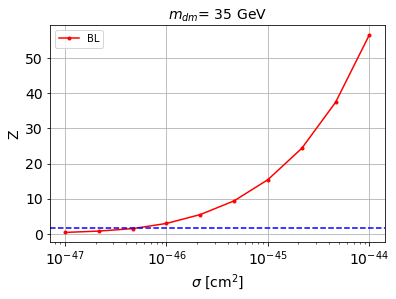


cross_BL_164:  5.200367388659711e-47
cross_BL_164_up:  3.332001991204569e-47
cross_BL_164_down:  7.217848743915321e-47

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:

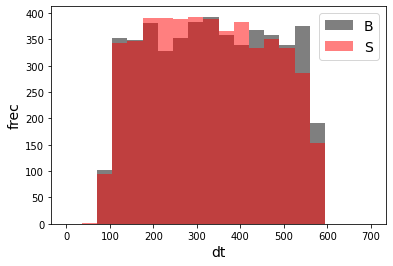

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68555	validation_1-logloss:0.68605
[1]	validation_0-logloss:0.67811	validation_1-logloss:0.67908
[2]	validation_0-logloss:0.67081	validation_1-logloss:0.67219
[3]	validation_0-logloss:0.66367	validation_1-logloss:0.66542
[4]	validation_0-logloss:0.65668	validation_1-logloss:0.65884
[5]	validation_0-logloss:0.64981	validation_1-logloss:0.65232
[6]	validation_0-logloss:0.64304	validation_1-logloss:0.64582
[7]	validation_0-logloss:0.63643	validation_1-logloss:0.63956
[8]	validation_0-logloss:0.62994	validation_1-logloss:0.63345
[9]	validation_0-logloss:0.62357	validation_1-logloss:0.62746
[10]	validation_0-logloss:0.61731	validation_1-logloss:0.62158
[11]	validation_0-logloss:0.61113	validation_1-logloss:0.61568
[12]	validation_0-logloss:0.60509	validation_1-logloss:0.60997
[13]	validation_0-logloss:0.59917	validation_1-logloss:0.60446
[14]	validation_0-logloss:0.59340	validation_1-logloss:0.59900
[15]	validation_0-logloss:0.58769	validation_1-logloss:0.59351
[1

[130]	validation_0-logloss:0.25908	validation_1-logloss:0.29927
[131]	validation_0-logloss:0.25765	validation_1-logloss:0.29809
[132]	validation_0-logloss:0.25629	validation_1-logloss:0.29704
[133]	validation_0-logloss:0.25499	validation_1-logloss:0.29593
[134]	validation_0-logloss:0.25361	validation_1-logloss:0.29481
[135]	validation_0-logloss:0.25226	validation_1-logloss:0.29375
[136]	validation_0-logloss:0.25093	validation_1-logloss:0.29261
[137]	validation_0-logloss:0.24968	validation_1-logloss:0.29166
[138]	validation_0-logloss:0.24842	validation_1-logloss:0.29061
[139]	validation_0-logloss:0.24720	validation_1-logloss:0.28959
[140]	validation_0-logloss:0.24598	validation_1-logloss:0.28859
[141]	validation_0-logloss:0.24470	validation_1-logloss:0.28749
[142]	validation_0-logloss:0.24340	validation_1-logloss:0.28636
[143]	validation_0-logloss:0.24214	validation_1-logloss:0.28535
[144]	validation_0-logloss:0.24097	validation_1-logloss:0.28437
[145]	validation_0-logloss:0.23971	valid

[259]	validation_0-logloss:0.15274	validation_1-logloss:0.22160
[260]	validation_0-logloss:0.15227	validation_1-logloss:0.22131
[261]	validation_0-logloss:0.15183	validation_1-logloss:0.22100
[262]	validation_0-logloss:0.15137	validation_1-logloss:0.22078
[263]	validation_0-logloss:0.15096	validation_1-logloss:0.22047
[264]	validation_0-logloss:0.15048	validation_1-logloss:0.22014
[265]	validation_0-logloss:0.15002	validation_1-logloss:0.21981
[266]	validation_0-logloss:0.14955	validation_1-logloss:0.21953
[267]	validation_0-logloss:0.14911	validation_1-logloss:0.21929
[268]	validation_0-logloss:0.14859	validation_1-logloss:0.21891
[269]	validation_0-logloss:0.14813	validation_1-logloss:0.21858
[270]	validation_0-logloss:0.14775	validation_1-logloss:0.21835
[271]	validation_0-logloss:0.14732	validation_1-logloss:0.21813
[272]	validation_0-logloss:0.14683	validation_1-logloss:0.21782
[273]	validation_0-logloss:0.14641	validation_1-logloss:0.21756
[274]	validation_0-logloss:0.14604	valid

[388]	validation_0-logloss:0.10929	validation_1-logloss:0.20135
[389]	validation_0-logloss:0.10902	validation_1-logloss:0.20120
[390]	validation_0-logloss:0.10879	validation_1-logloss:0.20112
[391]	validation_0-logloss:0.10854	validation_1-logloss:0.20099
[392]	validation_0-logloss:0.10828	validation_1-logloss:0.20105
[393]	validation_0-logloss:0.10804	validation_1-logloss:0.20088
[394]	validation_0-logloss:0.10784	validation_1-logloss:0.20078
[395]	validation_0-logloss:0.10763	validation_1-logloss:0.20072
[396]	validation_0-logloss:0.10739	validation_1-logloss:0.20066
[397]	validation_0-logloss:0.10717	validation_1-logloss:0.20059
[398]	validation_0-logloss:0.10694	validation_1-logloss:0.20052
[399]	validation_0-logloss:0.10671	validation_1-logloss:0.20045
[400]	validation_0-logloss:0.10644	validation_1-logloss:0.20049
[401]	validation_0-logloss:0.10619	validation_1-logloss:0.20034
[402]	validation_0-logloss:0.10600	validation_1-logloss:0.20026
[403]	validation_0-logloss:0.10579	valid

[517]	validation_0-logloss:0.08385	validation_1-logloss:0.19473
[518]	validation_0-logloss:0.08372	validation_1-logloss:0.19471
[519]	validation_0-logloss:0.08358	validation_1-logloss:0.19473
[520]	validation_0-logloss:0.08341	validation_1-logloss:0.19468
[521]	validation_0-logloss:0.08328	validation_1-logloss:0.19465
[522]	validation_0-logloss:0.08312	validation_1-logloss:0.19462
[523]	validation_0-logloss:0.08300	validation_1-logloss:0.19461
[524]	validation_0-logloss:0.08283	validation_1-logloss:0.19453
[525]	validation_0-logloss:0.08270	validation_1-logloss:0.19450
[526]	validation_0-logloss:0.08247	validation_1-logloss:0.19445
[527]	validation_0-logloss:0.08228	validation_1-logloss:0.19447
[528]	validation_0-logloss:0.08217	validation_1-logloss:0.19446
[529]	validation_0-logloss:0.08204	validation_1-logloss:0.19445
[530]	validation_0-logloss:0.08187	validation_1-logloss:0.19445
[531]	validation_0-logloss:0.08171	validation_1-logloss:0.19440
[532]	validation_0-logloss:0.08149	valid

[646]	validation_0-logloss:0.06743	validation_1-logloss:0.19115
[647]	validation_0-logloss:0.06737	validation_1-logloss:0.19116
[648]	validation_0-logloss:0.06726	validation_1-logloss:0.19111
[649]	validation_0-logloss:0.06712	validation_1-logloss:0.19108
[650]	validation_0-logloss:0.06702	validation_1-logloss:0.19107
[651]	validation_0-logloss:0.06693	validation_1-logloss:0.19103
[652]	validation_0-logloss:0.06687	validation_1-logloss:0.19103
[653]	validation_0-logloss:0.06679	validation_1-logloss:0.19101
[654]	validation_0-logloss:0.06667	validation_1-logloss:0.19095
[655]	validation_0-logloss:0.06656	validation_1-logloss:0.19093
[656]	validation_0-logloss:0.06648	validation_1-logloss:0.19090
[657]	validation_0-logloss:0.06637	validation_1-logloss:0.19093
[658]	validation_0-logloss:0.06624	validation_1-logloss:0.19089
[659]	validation_0-logloss:0.06617	validation_1-logloss:0.19084
[660]	validation_0-logloss:0.06606	validation_1-logloss:0.19085
[661]	validation_0-logloss:0.06597	valid

[775]	validation_0-logloss:0.05637	validation_1-logloss:0.18987
[776]	validation_0-logloss:0.05633	validation_1-logloss:0.18988
[777]	validation_0-logloss:0.05624	validation_1-logloss:0.18992
[778]	validation_0-logloss:0.05613	validation_1-logloss:0.18994
[779]	validation_0-logloss:0.05607	validation_1-logloss:0.18997
[780]	validation_0-logloss:0.05599	validation_1-logloss:0.18988
[781]	validation_0-logloss:0.05586	validation_1-logloss:0.18991
[782]	validation_0-logloss:0.05581	validation_1-logloss:0.18985
[783]	validation_0-logloss:0.05574	validation_1-logloss:0.18987
[784]	validation_0-logloss:0.05564	validation_1-logloss:0.18984
[785]	validation_0-logloss:0.05557	validation_1-logloss:0.18987
[786]	validation_0-logloss:0.05552	validation_1-logloss:0.18988
[787]	validation_0-logloss:0.05545	validation_1-logloss:0.18990
[788]	validation_0-logloss:0.05539	validation_1-logloss:0.18993
[789]	validation_0-logloss:0.05532	validation_1-logloss:0.18989
[790]	validation_0-logloss:0.05524	valid

[904]	validation_0-logloss:0.04680	validation_1-logloss:0.18964
[905]	validation_0-logloss:0.04672	validation_1-logloss:0.18967
[906]	validation_0-logloss:0.04664	validation_1-logloss:0.18970
[907]	validation_0-logloss:0.04658	validation_1-logloss:0.18971
[908]	validation_0-logloss:0.04650	validation_1-logloss:0.18977
[909]	validation_0-logloss:0.04643	validation_1-logloss:0.18983
[910]	validation_0-logloss:0.04633	validation_1-logloss:0.18983
[911]	validation_0-logloss:0.04628	validation_1-logloss:0.18982
[912]	validation_0-logloss:0.04622	validation_1-logloss:0.18982
[913]	validation_0-logloss:0.04615	validation_1-logloss:0.18987
[914]	validation_0-logloss:0.04611	validation_1-logloss:0.18988
[915]	validation_0-logloss:0.04607	validation_1-logloss:0.18985
[916]	validation_0-logloss:0.04599	validation_1-logloss:0.18981
[917]	validation_0-logloss:0.04591	validation_1-logloss:0.18982
[918]	validation_0-logloss:0.04584	validation_1-logloss:0.18985
[919]	validation_0-logloss:0.04579	valid

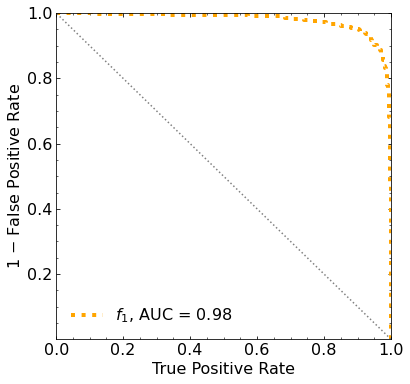

Classification score:


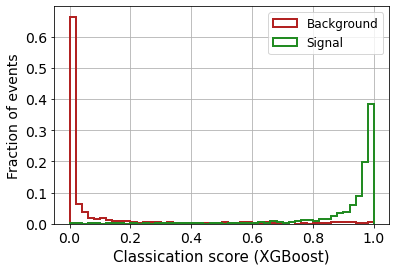


 ROC-AUC =  0.9788504087025998
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


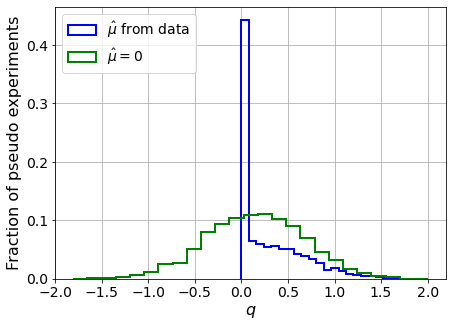

muhat mean:  -0.057635153856282074
Z_bins:  0.3904821219107046
std Z_bins:  0.4539750053312252
Z_bins mu=0:  0.3904821219107046
std Z_bins mu=0:  0.6754500279862339

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0125


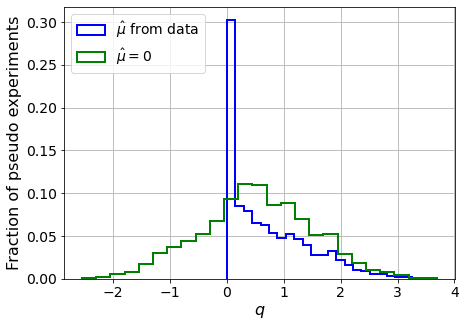

muhat mean:  -0.004227072724781119
Z_bins:  0.714863069673775
std Z_bins:  0.5059618748142306
Z_bins mu=0:  0.7148247401684763
std Z_bins mu=0:  0.6912357276005221

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0105


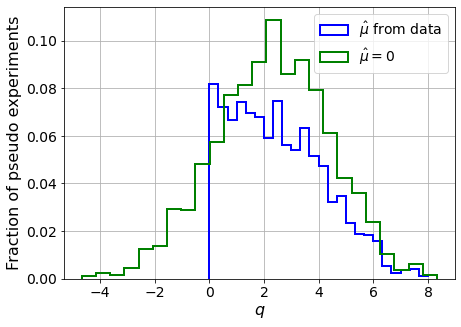

muhat mean:  0.006792922698754164
Z_bins:  1.539244109136288
std Z_bins:  0.5581737890976335
Z_bins mu=0:  1.539244109136288
std Z_bins mu=0:  0.6781392335717825

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.01


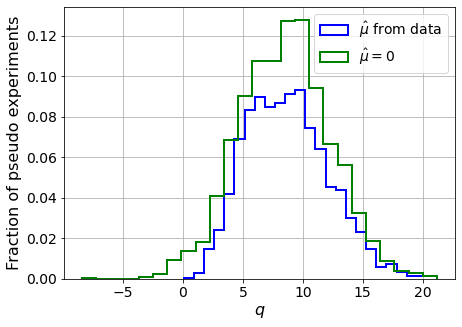

muhat mean:  0.004978897109700738
Z_bins:  2.9218627581094947
std Z_bins:  0.5851059965190217
Z_bins mu=0:  2.921833081344165
std Z_bins mu=0:  0.6467916419794074

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.01


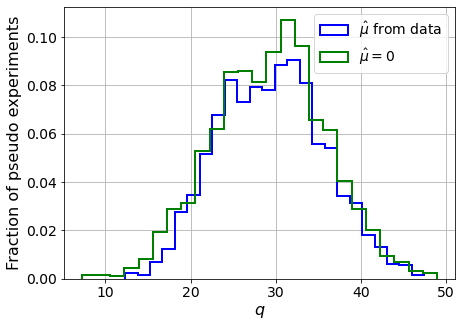

muhat mean:  0.00012174645470506396
Z_bins:  5.423567252542156
std Z_bins:  0.5756761452029032
Z_bins mu=0:  5.423554355284406
std Z_bins mu=0:  0.6107565311679803

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0095


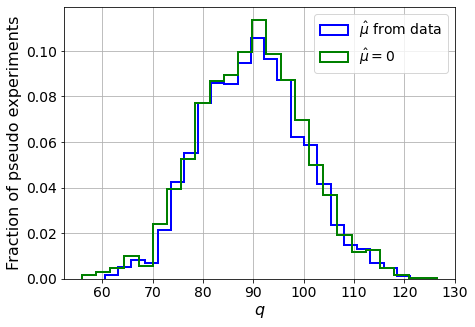

muhat mean:  -0.0009129215715389389
Z_bins:  9.489606070758114
std Z_bins:  0.5331566746624085
Z_bins mu=0:  9.489606070758114
std Z_bins mu=0:  0.5527967223631268

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0075


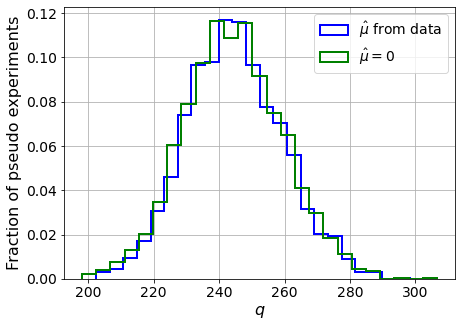

muhat mean:  -0.0005252895893380954
Z_bins:  15.62749186163894
std Z_bins:  0.4723685198950227
Z_bins mu=0:  15.62735422983647
std Z_bins mu=0:  0.48307768057611455

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.012


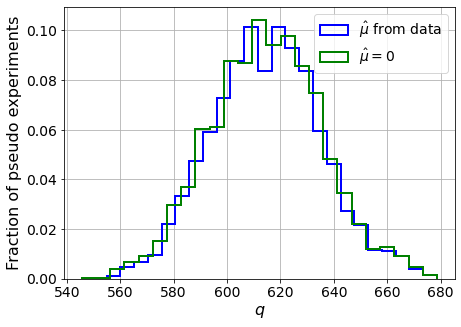

muhat mean:  -0.00021988528450103125
Z_bins:  24.789472145795834
std Z_bins:  0.41553444570037157
Z_bins mu=0:  24.7891143583291
std Z_bins mu=0:  0.42220974490681135

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.009


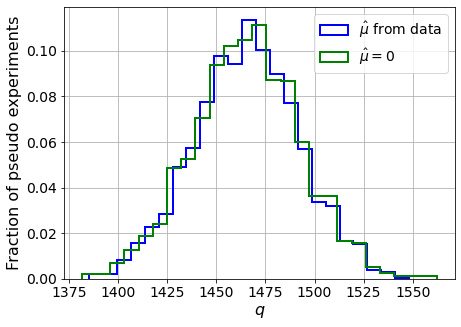

muhat mean:  9.302434166427144e-05
Z_bins:  38.28372417602596
std Z_bins:  0.34969012898778873
Z_bins mu=0:  38.28347621164077
std Z_bins mu=0:  0.354221100239724

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0145


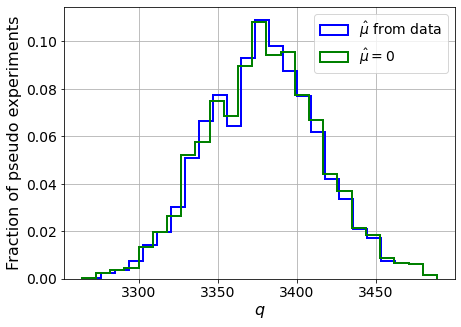

muhat mean:  5.138036449116978e-05
Z_bins:  58.13265500534768
std Z_bins:  0.30757877842028813
Z_bins mu=0:  58.131656748214056
std Z_bins mu=0:  0.3104214212262669

--------


 FINAL RESULT:

[[0.3904821219107046, 0.4539750053312252, -0.057635153856282074, 0.3904821219107046, 0.6754500279862339], [0.714863069673775, 0.5059618748142306, -0.004227072724781119, 0.7148247401684763, 0.6912357276005221], [1.539244109136288, 0.5581737890976335, 0.006792922698754164, 1.539244109136288, 0.6781392335717825], [2.9218627581094947, 0.5851059965190217, 0.004978897109700738, 2.921833081344165, 0.6467916419794074], [5.423567252542156, 0.5756761452029032, 0.00012174645470506396, 5.423554355284406, 0.6107565311679803], [9.489606070758114, 0.5331566746624085, -0.0009129215715389389, 9.489606070758114, 0.5527967223631268], [15.62749186163894, 0.4723685198950227, -0.0005252895893380954, 15.62735422983647, 0.48307768057611455], [24.789472145795834, 0.41553444570037157, -0.00021988528450103125, 24.789114358

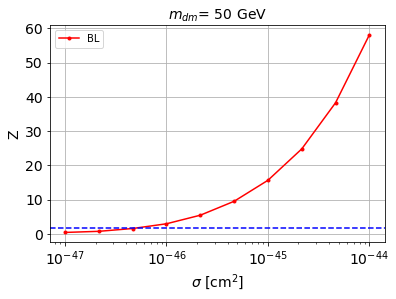


cross_BL_164:  4.984612195332882e-47
cross_BL_164_up:  3.273097180702444e-47
cross_BL_164_down:  7.168037118828249e-47

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape

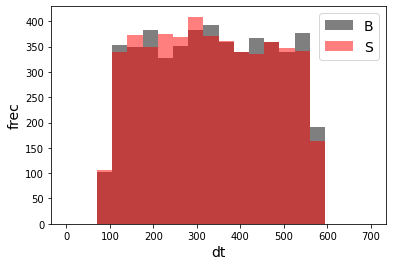

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68608	validation_1-logloss:0.68664
[1]	validation_0-logloss:0.67917	validation_1-logloss:0.68029
[2]	validation_0-logloss:0.67241	validation_1-logloss:0.67410
[3]	validation_0-logloss:0.66577	validation_1-logloss:0.66803
[4]	validation_0-logloss:0.65925	validation_1-logloss:0.66203
[5]	validation_0-logloss:0.65286	validation_1-logloss:0.65611
[6]	validation_0-logloss:0.64659	validation_1-logloss:0.65039
[7]	validation_0-logloss:0.64045	validation_1-logloss:0.64470
[8]	validation_0-logloss:0.63440	validation_1-logloss:0.63914
[9]	validation_0-logloss:0.62842	validation_1-logloss:0.63360
[10]	validation_0-logloss:0.62251	validation_1-logloss:0.62821
[11]	validation_0-logloss:0.61677	validation_1-logloss:0.62294
[12]	validation_0-logloss:0.61104	validation_1-logloss:0.61767
[13]	validation_0-logloss:0.60554	validation_1-logloss:0.61265
[14]	validation_0-logloss:0.60000	validation_1-logloss:0.60747
[15]	validation_0-logloss:0.59469	validation_1-logloss:0.60256
[1

[130]	validation_0-logloss:0.28066	validation_1-logloss:0.32397
[131]	validation_0-logloss:0.27925	validation_1-logloss:0.32280
[132]	validation_0-logloss:0.27793	validation_1-logloss:0.32180
[133]	validation_0-logloss:0.27654	validation_1-logloss:0.32075
[134]	validation_0-logloss:0.27521	validation_1-logloss:0.31964
[135]	validation_0-logloss:0.27390	validation_1-logloss:0.31858
[136]	validation_0-logloss:0.27258	validation_1-logloss:0.31759
[137]	validation_0-logloss:0.27127	validation_1-logloss:0.31657
[138]	validation_0-logloss:0.27001	validation_1-logloss:0.31555
[139]	validation_0-logloss:0.26877	validation_1-logloss:0.31452
[140]	validation_0-logloss:0.26750	validation_1-logloss:0.31347
[141]	validation_0-logloss:0.26625	validation_1-logloss:0.31257
[142]	validation_0-logloss:0.26504	validation_1-logloss:0.31169
[143]	validation_0-logloss:0.26387	validation_1-logloss:0.31080
[144]	validation_0-logloss:0.26267	validation_1-logloss:0.30990
[145]	validation_0-logloss:0.26151	valid

[259]	validation_0-logloss:0.17569	validation_1-logloss:0.24410
[260]	validation_0-logloss:0.17521	validation_1-logloss:0.24382
[261]	validation_0-logloss:0.17471	validation_1-logloss:0.24341
[262]	validation_0-logloss:0.17425	validation_1-logloss:0.24314
[263]	validation_0-logloss:0.17377	validation_1-logloss:0.24276
[264]	validation_0-logloss:0.17330	validation_1-logloss:0.24249
[265]	validation_0-logloss:0.17279	validation_1-logloss:0.24220
[266]	validation_0-logloss:0.17234	validation_1-logloss:0.24194
[267]	validation_0-logloss:0.17186	validation_1-logloss:0.24157
[268]	validation_0-logloss:0.17144	validation_1-logloss:0.24133
[269]	validation_0-logloss:0.17096	validation_1-logloss:0.24097
[270]	validation_0-logloss:0.17052	validation_1-logloss:0.24071
[271]	validation_0-logloss:0.17004	validation_1-logloss:0.24040
[272]	validation_0-logloss:0.16953	validation_1-logloss:0.24010
[273]	validation_0-logloss:0.16910	validation_1-logloss:0.23989
[274]	validation_0-logloss:0.16866	valid

[388]	validation_0-logloss:0.13068	validation_1-logloss:0.22183
[389]	validation_0-logloss:0.13041	validation_1-logloss:0.22173
[390]	validation_0-logloss:0.13015	validation_1-logloss:0.22162
[391]	validation_0-logloss:0.12990	validation_1-logloss:0.22153
[392]	validation_0-logloss:0.12966	validation_1-logloss:0.22140
[393]	validation_0-logloss:0.12936	validation_1-logloss:0.22123
[394]	validation_0-logloss:0.12909	validation_1-logloss:0.22120
[395]	validation_0-logloss:0.12885	validation_1-logloss:0.22107
[396]	validation_0-logloss:0.12859	validation_1-logloss:0.22096
[397]	validation_0-logloss:0.12834	validation_1-logloss:0.22084
[398]	validation_0-logloss:0.12808	validation_1-logloss:0.22078
[399]	validation_0-logloss:0.12784	validation_1-logloss:0.22070
[400]	validation_0-logloss:0.12766	validation_1-logloss:0.22063
[401]	validation_0-logloss:0.12740	validation_1-logloss:0.22059
[402]	validation_0-logloss:0.12716	validation_1-logloss:0.22050
[403]	validation_0-logloss:0.12692	valid

[517]	validation_0-logloss:0.10334	validation_1-logloss:0.21326
[518]	validation_0-logloss:0.10316	validation_1-logloss:0.21324
[519]	validation_0-logloss:0.10307	validation_1-logloss:0.21320
[520]	validation_0-logloss:0.10293	validation_1-logloss:0.21320
[521]	validation_0-logloss:0.10283	validation_1-logloss:0.21314
[522]	validation_0-logloss:0.10266	validation_1-logloss:0.21317
[523]	validation_0-logloss:0.10253	validation_1-logloss:0.21315
[524]	validation_0-logloss:0.10233	validation_1-logloss:0.21310
[525]	validation_0-logloss:0.10216	validation_1-logloss:0.21307
[526]	validation_0-logloss:0.10203	validation_1-logloss:0.21305
[527]	validation_0-logloss:0.10186	validation_1-logloss:0.21303
[528]	validation_0-logloss:0.10177	validation_1-logloss:0.21300
[529]	validation_0-logloss:0.10164	validation_1-logloss:0.21299
[530]	validation_0-logloss:0.10154	validation_1-logloss:0.21294
[531]	validation_0-logloss:0.10135	validation_1-logloss:0.21292
[532]	validation_0-logloss:0.10113	valid

[646]	validation_0-logloss:0.08487	validation_1-logloss:0.20892
[647]	validation_0-logloss:0.08471	validation_1-logloss:0.20896
[648]	validation_0-logloss:0.08460	validation_1-logloss:0.20898
[649]	validation_0-logloss:0.08448	validation_1-logloss:0.20898
[650]	validation_0-logloss:0.08436	validation_1-logloss:0.20901
[651]	validation_0-logloss:0.08425	validation_1-logloss:0.20898
[652]	validation_0-logloss:0.08415	validation_1-logloss:0.20899
[653]	validation_0-logloss:0.08399	validation_1-logloss:0.20894
[654]	validation_0-logloss:0.08393	validation_1-logloss:0.20892
[655]	validation_0-logloss:0.08385	validation_1-logloss:0.20891
[656]	validation_0-logloss:0.08373	validation_1-logloss:0.20891
[657]	validation_0-logloss:0.08363	validation_1-logloss:0.20889
[658]	validation_0-logloss:0.08352	validation_1-logloss:0.20885
[659]	validation_0-logloss:0.08342	validation_1-logloss:0.20883
[660]	validation_0-logloss:0.08329	validation_1-logloss:0.20887
[661]	validation_0-logloss:0.08317	valid

[775]	validation_0-logloss:0.07107	validation_1-logloss:0.20753
[776]	validation_0-logloss:0.07099	validation_1-logloss:0.20752
[777]	validation_0-logloss:0.07092	validation_1-logloss:0.20750
[778]	validation_0-logloss:0.07083	validation_1-logloss:0.20745
[779]	validation_0-logloss:0.07071	validation_1-logloss:0.20747
[780]	validation_0-logloss:0.07058	validation_1-logloss:0.20743
[781]	validation_0-logloss:0.07049	validation_1-logloss:0.20743
[782]	validation_0-logloss:0.07044	validation_1-logloss:0.20745
[783]	validation_0-logloss:0.07036	validation_1-logloss:0.20743
[784]	validation_0-logloss:0.07029	validation_1-logloss:0.20741
[785]	validation_0-logloss:0.07018	validation_1-logloss:0.20735
[786]	validation_0-logloss:0.07006	validation_1-logloss:0.20731
[787]	validation_0-logloss:0.07000	validation_1-logloss:0.20730
[788]	validation_0-logloss:0.06993	validation_1-logloss:0.20728
[789]	validation_0-logloss:0.06982	validation_1-logloss:0.20727
[790]	validation_0-logloss:0.06975	valid

[904]	validation_0-logloss:0.06083	validation_1-logloss:0.20577
[905]	validation_0-logloss:0.06075	validation_1-logloss:0.20574
[906]	validation_0-logloss:0.06068	validation_1-logloss:0.20568
[907]	validation_0-logloss:0.06060	validation_1-logloss:0.20567
[908]	validation_0-logloss:0.06052	validation_1-logloss:0.20560
[909]	validation_0-logloss:0.06048	validation_1-logloss:0.20559
[910]	validation_0-logloss:0.06042	validation_1-logloss:0.20556
[911]	validation_0-logloss:0.06034	validation_1-logloss:0.20552
[912]	validation_0-logloss:0.06026	validation_1-logloss:0.20554
[913]	validation_0-logloss:0.06016	validation_1-logloss:0.20550
[914]	validation_0-logloss:0.06007	validation_1-logloss:0.20551
[915]	validation_0-logloss:0.05998	validation_1-logloss:0.20551
[916]	validation_0-logloss:0.05992	validation_1-logloss:0.20549
[917]	validation_0-logloss:0.05981	validation_1-logloss:0.20548
[918]	validation_0-logloss:0.05975	validation_1-logloss:0.20544
[919]	validation_0-logloss:0.05967	valid

[1032]	validation_0-logloss:0.05239	validation_1-logloss:0.20450
[1033]	validation_0-logloss:0.05232	validation_1-logloss:0.20445
[1034]	validation_0-logloss:0.05223	validation_1-logloss:0.20444
[1035]	validation_0-logloss:0.05217	validation_1-logloss:0.20445
[1036]	validation_0-logloss:0.05211	validation_1-logloss:0.20447
[1037]	validation_0-logloss:0.05208	validation_1-logloss:0.20443
[1038]	validation_0-logloss:0.05205	validation_1-logloss:0.20439
[1039]	validation_0-logloss:0.05199	validation_1-logloss:0.20438
[1040]	validation_0-logloss:0.05193	validation_1-logloss:0.20438
[1041]	validation_0-logloss:0.05187	validation_1-logloss:0.20434
[1042]	validation_0-logloss:0.05184	validation_1-logloss:0.20433
[1043]	validation_0-logloss:0.05180	validation_1-logloss:0.20430
[1044]	validation_0-logloss:0.05171	validation_1-logloss:0.20429
[1045]	validation_0-logloss:0.05167	validation_1-logloss:0.20430
[1046]	validation_0-logloss:0.05161	validation_1-logloss:0.20430
[1047]	validation_0-loglo

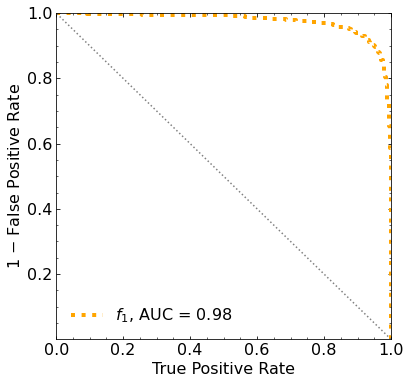

Classification score:


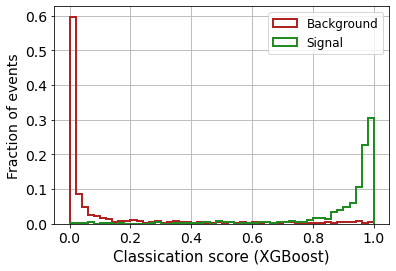


 ROC-AUC =  0.9755104941306619
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.019


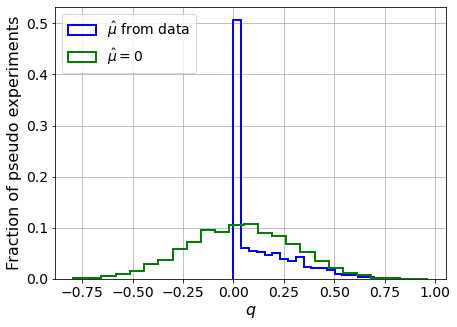

muhat mean:  -0.004708357249967611
Z_bins:  0.18063873874263225
std Z_bins:  0.44992447343236597
Z_bins mu=0:  0.18059590481784327
std Z_bins mu=0:  0.7199664231395474

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.014


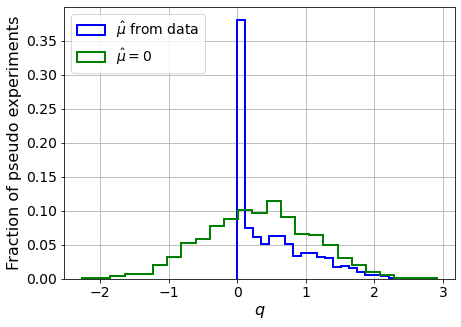

muhat mean:  -0.026053891553903242
Z_bins:  0.5664229826986675
std Z_bins:  0.48354035250132105
Z_bins mu=0:  0.5664229826986675
std Z_bins mu=0:  0.6874573377477846

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0175


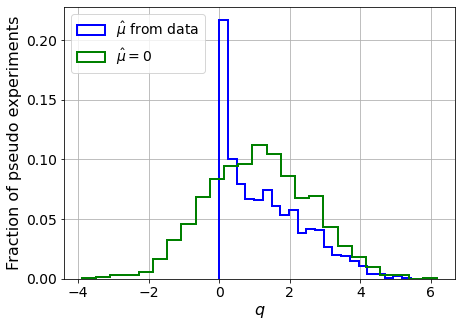

muhat mean:  -0.0038245181772840224
Z_bins:  1.058414399694795
std Z_bins:  0.5455177994017943
Z_bins mu=0:  1.058414399694795
std Z_bins mu=0:  0.6904729389108081

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.021


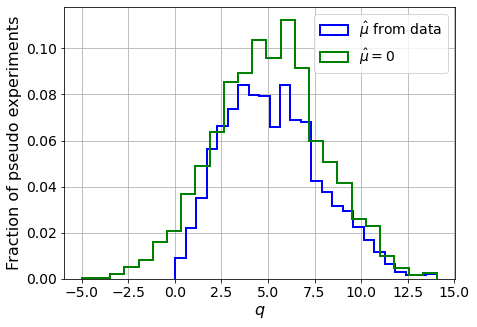

muhat mean:  -0.001028475050005909
Z_bins:  2.248484260955262
std Z_bins:  0.5730891263817756
Z_bins mu=0:  2.248484260955262
std Z_bins mu=0:  0.6472027637293648

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.012


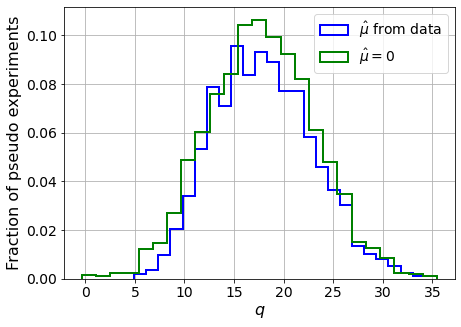

muhat mean:  0.00043864902425322215
Z_bins:  4.207619629773527
std Z_bins:  0.594164564620613
Z_bins mu=0:  4.20731336733174
std Z_bins mu=0:  0.6385341148041392

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.018


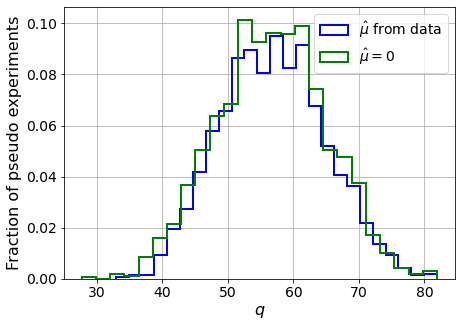

muhat mean:  -0.00020532145843811842
Z_bins:  7.5360276546897245
std Z_bins:  0.5301479476689083
Z_bins mu=0:  7.534969733966483
std Z_bins mu=0:  0.5525921122876457

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0145


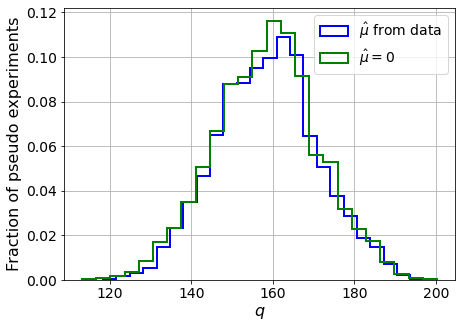

muhat mean:  0.000745838147036999
Z_bins:  12.609509658137059
std Z_bins:  0.4901029947745312
Z_bins mu=0:  12.60911825962037
std Z_bins mu=0:  0.5053078072497524

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0155


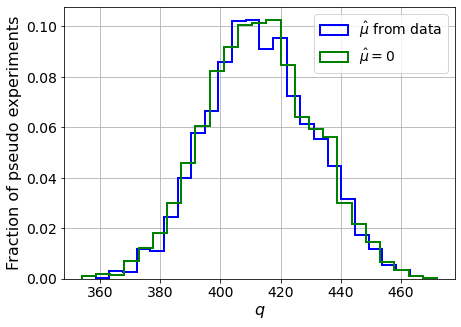

muhat mean:  -3.7454826789193225e-05
Z_bins:  20.31622699252964
std Z_bins:  0.43694605706136164
Z_bins mu=0:  20.315926781604208
std Z_bins mu=0:  0.4453132459710411

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0205


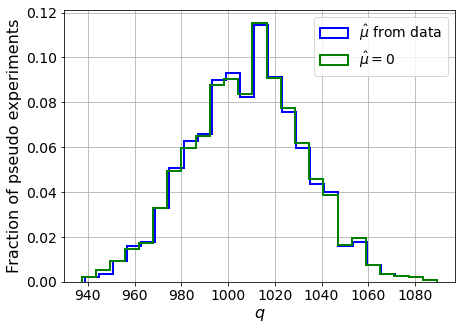

muhat mean:  9.207378737269989e-06
Z_bins:  31.7673612472831
std Z_bins:  0.3792900557757112
Z_bins mu=0:  31.766631205804853
std Z_bins mu=0:  0.38432696186268217

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.015


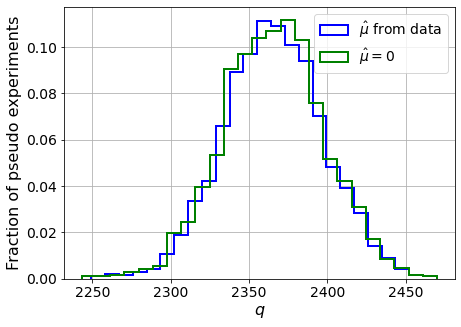

muhat mean:  7.412663607605466e-06
Z_bins:  48.641341442323856
std Z_bins:  0.3280768898580872
Z_bins mu=0:  48.64088125025056
std Z_bins mu=0:  0.3314835112200306

--------


 FINAL RESULT:

[[0.18063873874263225, 0.44992447343236597, -0.004708357249967611, 0.18059590481784327, 0.7199664231395474], [0.5664229826986675, 0.48354035250132105, -0.026053891553903242, 0.5664229826986675, 0.6874573377477846], [1.058414399694795, 0.5455177994017943, -0.0038245181772840224, 1.058414399694795, 0.6904729389108081], [2.248484260955262, 0.5730891263817756, -0.001028475050005909, 2.248484260955262, 0.6472027637293648], [4.207619629773527, 0.594164564620613, 0.00043864902425322215, 4.20731336733174, 0.6385341148041392], [7.5360276546897245, 0.5301479476689083, -0.00020532145843811842, 7.534969733966483, 0.5525921122876457], [12.609509658137059, 0.4901029947745312, 0.000745838147036999, 12.60911825962037, 0.5053078072497524], [20.31622699252964, 0.43694605706136164, -3.7454826789193225e-05, 20.315926

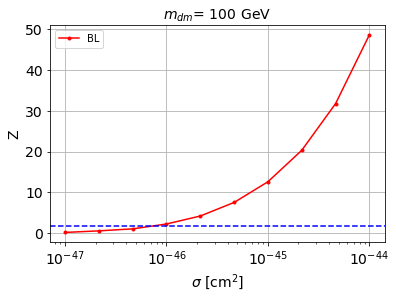


cross_BL_164:  7.1539314345150175e-47
cross_BL_164_up:  4.792942044591275e-47
cross_BL_164_down:  9.820480757028793e-47

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shap

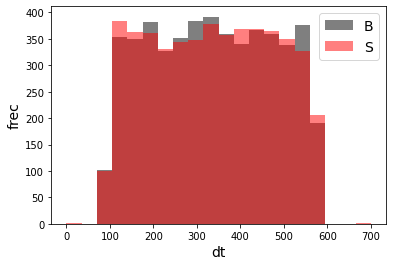

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68628	validation_1-logloss:0.68689
[1]	validation_0-logloss:0.67954	validation_1-logloss:0.68076
[2]	validation_0-logloss:0.67294	validation_1-logloss:0.67468
[3]	validation_0-logloss:0.66643	validation_1-logloss:0.66858
[4]	validation_0-logloss:0.66007	validation_1-logloss:0.66278
[5]	validation_0-logloss:0.65383	validation_1-logloss:0.65692
[6]	validation_0-logloss:0.64769	validation_1-logloss:0.65128
[7]	validation_0-logloss:0.64165	validation_1-logloss:0.64557
[8]	validation_0-logloss:0.63574	validation_1-logloss:0.64019
[9]	validation_0-logloss:0.62992	validation_1-logloss:0.63492
[10]	validation_0-logloss:0.62422	validation_1-logloss:0.62967
[11]	validation_0-logloss:0.61858	validation_1-logloss:0.62453
[12]	validation_0-logloss:0.61309	validation_1-logloss:0.61957
[13]	validation_0-logloss:0.60765	validation_1-logloss:0.61450
[14]	validation_0-logloss:0.60232	validation_1-logloss:0.60954
[15]	validation_0-logloss:0.59711	validation_1-logloss:0.60489
[1

[130]	validation_0-logloss:0.28866	validation_1-logloss:0.33653
[131]	validation_0-logloss:0.28734	validation_1-logloss:0.33555
[132]	validation_0-logloss:0.28605	validation_1-logloss:0.33457
[133]	validation_0-logloss:0.28475	validation_1-logloss:0.33367
[134]	validation_0-logloss:0.28341	validation_1-logloss:0.33255
[135]	validation_0-logloss:0.28219	validation_1-logloss:0.33158
[136]	validation_0-logloss:0.28098	validation_1-logloss:0.33060
[137]	validation_0-logloss:0.27969	validation_1-logloss:0.32957
[138]	validation_0-logloss:0.27853	validation_1-logloss:0.32865
[139]	validation_0-logloss:0.27730	validation_1-logloss:0.32764
[140]	validation_0-logloss:0.27609	validation_1-logloss:0.32668
[141]	validation_0-logloss:0.27490	validation_1-logloss:0.32575
[142]	validation_0-logloss:0.27365	validation_1-logloss:0.32467
[143]	validation_0-logloss:0.27253	validation_1-logloss:0.32377
[144]	validation_0-logloss:0.27137	validation_1-logloss:0.32290
[145]	validation_0-logloss:0.27026	valid

[259]	validation_0-logloss:0.18267	validation_1-logloss:0.26203
[260]	validation_0-logloss:0.18210	validation_1-logloss:0.26170
[261]	validation_0-logloss:0.18166	validation_1-logloss:0.26143
[262]	validation_0-logloss:0.18118	validation_1-logloss:0.26121
[263]	validation_0-logloss:0.18072	validation_1-logloss:0.26091
[264]	validation_0-logloss:0.18024	validation_1-logloss:0.26065
[265]	validation_0-logloss:0.17971	validation_1-logloss:0.26034
[266]	validation_0-logloss:0.17928	validation_1-logloss:0.26015
[267]	validation_0-logloss:0.17881	validation_1-logloss:0.25998
[268]	validation_0-logloss:0.17834	validation_1-logloss:0.25978
[269]	validation_0-logloss:0.17785	validation_1-logloss:0.25951
[270]	validation_0-logloss:0.17743	validation_1-logloss:0.25923
[271]	validation_0-logloss:0.17700	validation_1-logloss:0.25899
[272]	validation_0-logloss:0.17652	validation_1-logloss:0.25882
[273]	validation_0-logloss:0.17605	validation_1-logloss:0.25858
[274]	validation_0-logloss:0.17562	valid

[388]	validation_0-logloss:0.13675	validation_1-logloss:0.24258
[389]	validation_0-logloss:0.13645	validation_1-logloss:0.24247
[390]	validation_0-logloss:0.13617	validation_1-logloss:0.24242
[391]	validation_0-logloss:0.13596	validation_1-logloss:0.24231
[392]	validation_0-logloss:0.13569	validation_1-logloss:0.24229
[393]	validation_0-logloss:0.13543	validation_1-logloss:0.24228
[394]	validation_0-logloss:0.13517	validation_1-logloss:0.24231
[395]	validation_0-logloss:0.13486	validation_1-logloss:0.24226
[396]	validation_0-logloss:0.13461	validation_1-logloss:0.24226
[397]	validation_0-logloss:0.13432	validation_1-logloss:0.24219
[398]	validation_0-logloss:0.13411	validation_1-logloss:0.24204
[399]	validation_0-logloss:0.13383	validation_1-logloss:0.24210
[400]	validation_0-logloss:0.13358	validation_1-logloss:0.24204
[401]	validation_0-logloss:0.13326	validation_1-logloss:0.24202
[402]	validation_0-logloss:0.13297	validation_1-logloss:0.24193
[403]	validation_0-logloss:0.13277	valid

[517]	validation_0-logloss:0.10794	validation_1-logloss:0.23796
[518]	validation_0-logloss:0.10774	validation_1-logloss:0.23800
[519]	validation_0-logloss:0.10756	validation_1-logloss:0.23792
[520]	validation_0-logloss:0.10739	validation_1-logloss:0.23790
[521]	validation_0-logloss:0.10721	validation_1-logloss:0.23783
[522]	validation_0-logloss:0.10704	validation_1-logloss:0.23777
[523]	validation_0-logloss:0.10689	validation_1-logloss:0.23762
[524]	validation_0-logloss:0.10674	validation_1-logloss:0.23755
[525]	validation_0-logloss:0.10649	validation_1-logloss:0.23754
[526]	validation_0-logloss:0.10631	validation_1-logloss:0.23748
[527]	validation_0-logloss:0.10615	validation_1-logloss:0.23744
[528]	validation_0-logloss:0.10598	validation_1-logloss:0.23741
[529]	validation_0-logloss:0.10582	validation_1-logloss:0.23737
[530]	validation_0-logloss:0.10561	validation_1-logloss:0.23727
[531]	validation_0-logloss:0.10545	validation_1-logloss:0.23718
[532]	validation_0-logloss:0.10531	valid

[646]	validation_0-logloss:0.08910	validation_1-logloss:0.23437
[647]	validation_0-logloss:0.08896	validation_1-logloss:0.23434
[648]	validation_0-logloss:0.08880	validation_1-logloss:0.23427
[649]	validation_0-logloss:0.08868	validation_1-logloss:0.23424
[650]	validation_0-logloss:0.08856	validation_1-logloss:0.23425
[651]	validation_0-logloss:0.08843	validation_1-logloss:0.23420
[652]	validation_0-logloss:0.08831	validation_1-logloss:0.23422
[653]	validation_0-logloss:0.08822	validation_1-logloss:0.23419
[654]	validation_0-logloss:0.08813	validation_1-logloss:0.23421
[655]	validation_0-logloss:0.08799	validation_1-logloss:0.23424
[656]	validation_0-logloss:0.08783	validation_1-logloss:0.23420
[657]	validation_0-logloss:0.08773	validation_1-logloss:0.23412
[658]	validation_0-logloss:0.08758	validation_1-logloss:0.23405
[659]	validation_0-logloss:0.08748	validation_1-logloss:0.23403
[660]	validation_0-logloss:0.08736	validation_1-logloss:0.23405
[661]	validation_0-logloss:0.08726	valid

[775]	validation_0-logloss:0.07412	validation_1-logloss:0.23276
[776]	validation_0-logloss:0.07398	validation_1-logloss:0.23278
[777]	validation_0-logloss:0.07386	validation_1-logloss:0.23279
[778]	validation_0-logloss:0.07378	validation_1-logloss:0.23278
[779]	validation_0-logloss:0.07369	validation_1-logloss:0.23280
[780]	validation_0-logloss:0.07357	validation_1-logloss:0.23279
[781]	validation_0-logloss:0.07347	validation_1-logloss:0.23277
[782]	validation_0-logloss:0.07335	validation_1-logloss:0.23280
[783]	validation_0-logloss:0.07324	validation_1-logloss:0.23276
[784]	validation_0-logloss:0.07317	validation_1-logloss:0.23274
[785]	validation_0-logloss:0.07308	validation_1-logloss:0.23269
[786]	validation_0-logloss:0.07297	validation_1-logloss:0.23274
[787]	validation_0-logloss:0.07286	validation_1-logloss:0.23273
[788]	validation_0-logloss:0.07274	validation_1-logloss:0.23268
[789]	validation_0-logloss:0.07266	validation_1-logloss:0.23263
[790]	validation_0-logloss:0.07250	valid

[904]	validation_0-logloss:0.06197	validation_1-logloss:0.23233
[905]	validation_0-logloss:0.06186	validation_1-logloss:0.23232
[906]	validation_0-logloss:0.06179	validation_1-logloss:0.23231
[907]	validation_0-logloss:0.06173	validation_1-logloss:0.23230
[908]	validation_0-logloss:0.06167	validation_1-logloss:0.23230
[909]	validation_0-logloss:0.06156	validation_1-logloss:0.23225
[910]	validation_0-logloss:0.06150	validation_1-logloss:0.23228
[911]	validation_0-logloss:0.06141	validation_1-logloss:0.23231
[912]	validation_0-logloss:0.06137	validation_1-logloss:0.23228
[913]	validation_0-logloss:0.06130	validation_1-logloss:0.23224
[914]	validation_0-logloss:0.06123	validation_1-logloss:0.23220
[915]	validation_0-logloss:0.06115	validation_1-logloss:0.23218
[916]	validation_0-logloss:0.06103	validation_1-logloss:0.23221
[917]	validation_0-logloss:0.06097	validation_1-logloss:0.23220
[918]	validation_0-logloss:0.06090	validation_1-logloss:0.23222
[919]	validation_0-logloss:0.06085	valid

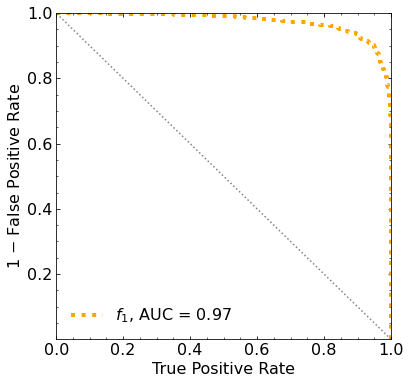

Classification score:


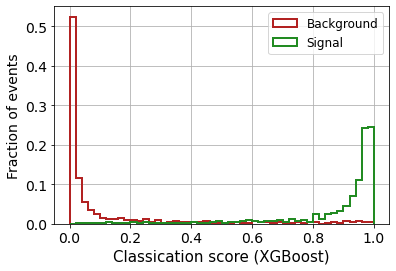


 ROC-AUC =  0.9740482811955832
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.021


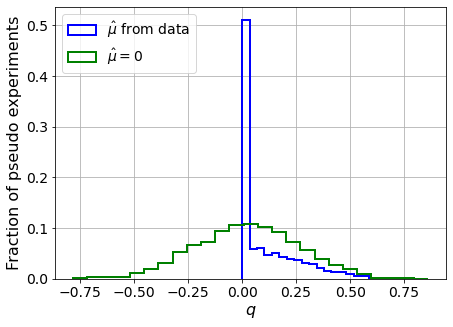

muhat mean:  0.07020667059615081
Z_bins:  0.16852676488702353
std Z_bins:  0.44505224181935604
Z_bins mu=0:  0.168371021385573
std Z_bins mu=0:  0.7221969191671086

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0275


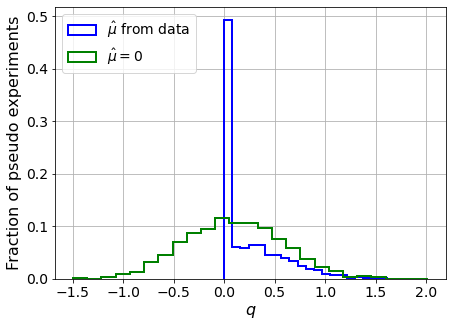

muhat mean:  0.10514552713842668
Z_bins:  0.2995208894111844
std Z_bins:  0.5250802154081522
Z_bins mu=0:  0.29659782597903417
std Z_bins mu=0:  0.8125405058911427

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0265


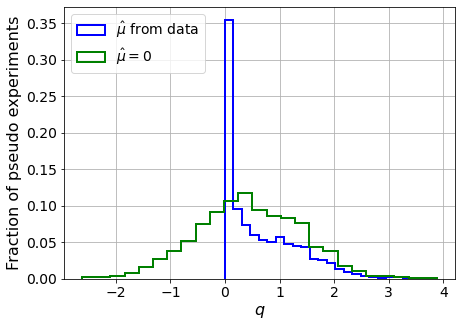

muhat mean:  0.006512008055813229
Z_bins:  0.64701788241605
std Z_bins:  0.5343116044798939
Z_bins mu=0:  0.6459305268519339
std Z_bins mu=0:  0.7384126533298337

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.025


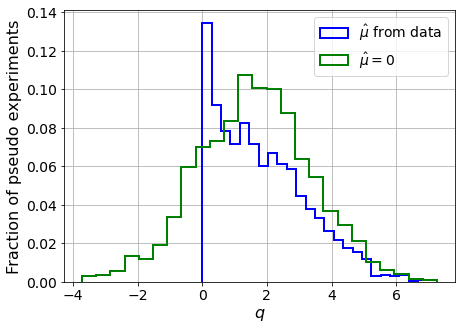

muhat mean:  0.0061054954944253755
Z_bins:  1.2713477155440782
std Z_bins:  0.5551018067949215
Z_bins mu=0:  1.2711201404197325
std Z_bins mu=0:  0.6857978523189597

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.03


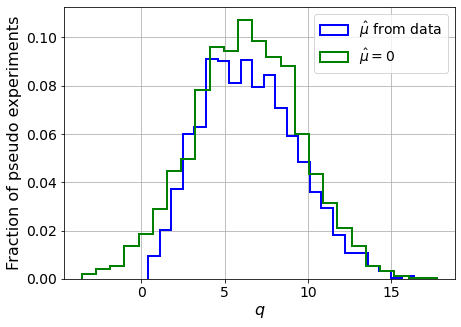

muhat mean:  -0.0013485733729784676
Z_bins:  2.5222661159672204
std Z_bins:  0.5700739966478761
Z_bins mu=0:  2.5222650802209556
std Z_bins mu=0:  0.6371600261654249

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.026


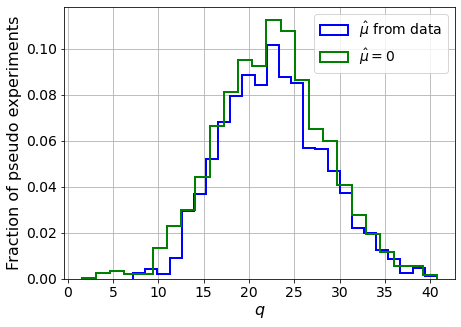

muhat mean:  0.0021240661551793208
Z_bins:  4.741025624928618
std Z_bins:  0.59104995367569
Z_bins mu=0:  4.7407072302631414
std Z_bins mu=0:  0.6317758045628415

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0325


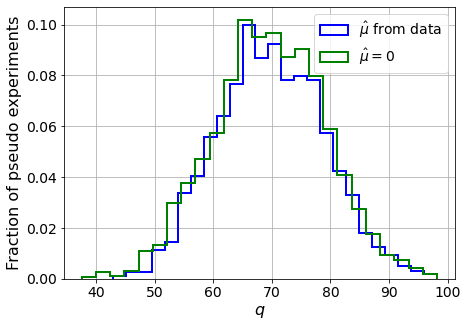

muhat mean:  0.002998581644533292
Z_bins:  8.345621292533865
std Z_bins:  0.5467074497822833
Z_bins mu=0:  8.345621292533865
std Z_bins mu=0:  0.5706966360355608

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.032


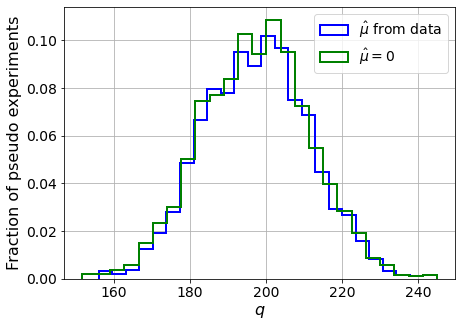

muhat mean:  0.0003346922956347581
Z_bins:  14.053945256634014
std Z_bins:  0.49270071215581196
Z_bins mu=0:  14.053939698396103
std Z_bins mu=0:  0.5059492114550087

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0285


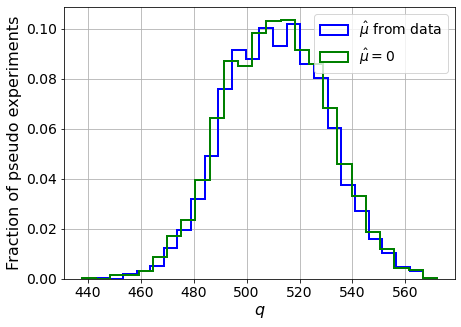

muhat mean:  0.00018868596539499223
Z_bins:  22.61021801373429
std Z_bins:  0.42236177504708144
Z_bins mu=0:  22.60847772508751
std Z_bins mu=0:  0.42999693898688457

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0185


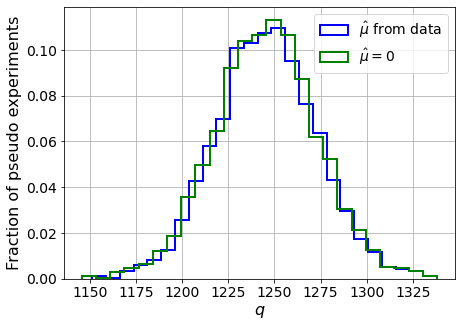

muhat mean:  0.00037592391302386676
Z_bins:  35.29587372570664
std Z_bins:  0.38784607111574754
Z_bins mu=0:  35.2953092886495
std Z_bins mu=0:  0.3935633438007462

--------


 FINAL RESULT:

[[0.16852676488702353, 0.44505224181935604, 0.07020667059615081, 0.168371021385573, 0.7221969191671086], [0.2995208894111844, 0.5250802154081522, 0.10514552713842668, 0.29659782597903417, 0.8125405058911427], [0.64701788241605, 0.5343116044798939, 0.006512008055813229, 0.6459305268519339, 0.7384126533298337], [1.2713477155440782, 0.5551018067949215, 0.0061054954944253755, 1.2711201404197325, 0.6857978523189597], [2.5222661159672204, 0.5700739966478761, -0.0013485733729784676, 2.5222650802209556, 0.6371600261654249], [4.741025624928618, 0.59104995367569, 0.0021240661551793208, 4.7407072302631414, 0.6317758045628415], [8.345621292533865, 0.5467074497822833, 0.002998581644533292, 8.345621292533865, 0.5706966360355608], [14.053945256634014, 0.49270071215581196, 0.0003346922956347581, 14.05393969839610

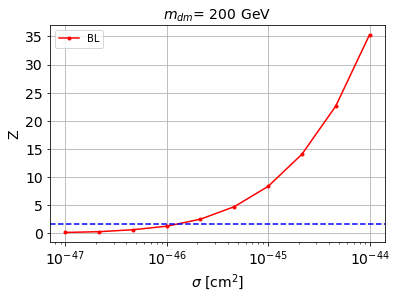


cross_BL_164:  1.3239944701079767e-46
cross_BL_164_up:  8.435825470524052e-47
cross_BL_164_down:  1.850564130280567e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shap

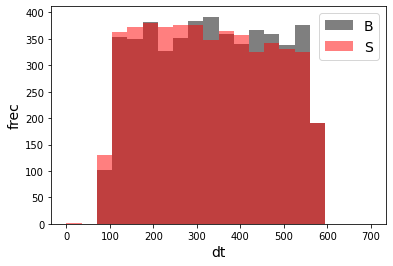

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68630	validation_1-logloss:0.68686
[1]	validation_0-logloss:0.67958	validation_1-logloss:0.68071
[2]	validation_0-logloss:0.67299	validation_1-logloss:0.67467
[3]	validation_0-logloss:0.66648	validation_1-logloss:0.66872
[4]	validation_0-logloss:0.66013	validation_1-logloss:0.66295
[5]	validation_0-logloss:0.65388	validation_1-logloss:0.65723
[6]	validation_0-logloss:0.64777	validation_1-logloss:0.65169
[7]	validation_0-logloss:0.64175	validation_1-logloss:0.64619
[8]	validation_0-logloss:0.63583	validation_1-logloss:0.64079
[9]	validation_0-logloss:0.63009	validation_1-logloss:0.63556
[10]	validation_0-logloss:0.62438	validation_1-logloss:0.63040
[11]	validation_0-logloss:0.61884	validation_1-logloss:0.62527
[12]	validation_0-logloss:0.61333	validation_1-logloss:0.62029
[13]	validation_0-logloss:0.60799	validation_1-logloss:0.61538
[14]	validation_0-logloss:0.60269	validation_1-logloss:0.61067
[15]	validation_0-logloss:0.59753	validation_1-logloss:0.60600
[1

[130]	validation_0-logloss:0.28723	validation_1-logloss:0.34196
[131]	validation_0-logloss:0.28596	validation_1-logloss:0.34105
[132]	validation_0-logloss:0.28464	validation_1-logloss:0.34007
[133]	validation_0-logloss:0.28333	validation_1-logloss:0.33901
[134]	validation_0-logloss:0.28197	validation_1-logloss:0.33796
[135]	validation_0-logloss:0.28076	validation_1-logloss:0.33708
[136]	validation_0-logloss:0.27944	validation_1-logloss:0.33608
[137]	validation_0-logloss:0.27819	validation_1-logloss:0.33517
[138]	validation_0-logloss:0.27691	validation_1-logloss:0.33426
[139]	validation_0-logloss:0.27575	validation_1-logloss:0.33344
[140]	validation_0-logloss:0.27446	validation_1-logloss:0.33248
[141]	validation_0-logloss:0.27326	validation_1-logloss:0.33150
[142]	validation_0-logloss:0.27211	validation_1-logloss:0.33074
[143]	validation_0-logloss:0.27090	validation_1-logloss:0.32984
[144]	validation_0-logloss:0.26966	validation_1-logloss:0.32894
[145]	validation_0-logloss:0.26854	valid

[259]	validation_0-logloss:0.18261	validation_1-logloss:0.26685
[260]	validation_0-logloss:0.18219	validation_1-logloss:0.26660
[261]	validation_0-logloss:0.18169	validation_1-logloss:0.26636
[262]	validation_0-logloss:0.18117	validation_1-logloss:0.26602
[263]	validation_0-logloss:0.18065	validation_1-logloss:0.26579
[264]	validation_0-logloss:0.18013	validation_1-logloss:0.26542
[265]	validation_0-logloss:0.17968	validation_1-logloss:0.26512
[266]	validation_0-logloss:0.17920	validation_1-logloss:0.26482
[267]	validation_0-logloss:0.17872	validation_1-logloss:0.26442
[268]	validation_0-logloss:0.17826	validation_1-logloss:0.26419
[269]	validation_0-logloss:0.17786	validation_1-logloss:0.26392
[270]	validation_0-logloss:0.17734	validation_1-logloss:0.26366
[271]	validation_0-logloss:0.17689	validation_1-logloss:0.26337
[272]	validation_0-logloss:0.17639	validation_1-logloss:0.26303
[273]	validation_0-logloss:0.17592	validation_1-logloss:0.26273
[274]	validation_0-logloss:0.17550	valid

[388]	validation_0-logloss:0.13757	validation_1-logloss:0.24785
[389]	validation_0-logloss:0.13726	validation_1-logloss:0.24784
[390]	validation_0-logloss:0.13695	validation_1-logloss:0.24779
[391]	validation_0-logloss:0.13675	validation_1-logloss:0.24773
[392]	validation_0-logloss:0.13644	validation_1-logloss:0.24766
[393]	validation_0-logloss:0.13615	validation_1-logloss:0.24763
[394]	validation_0-logloss:0.13587	validation_1-logloss:0.24745
[395]	validation_0-logloss:0.13568	validation_1-logloss:0.24747
[396]	validation_0-logloss:0.13549	validation_1-logloss:0.24749
[397]	validation_0-logloss:0.13528	validation_1-logloss:0.24748
[398]	validation_0-logloss:0.13498	validation_1-logloss:0.24750
[399]	validation_0-logloss:0.13470	validation_1-logloss:0.24740
[400]	validation_0-logloss:0.13446	validation_1-logloss:0.24738
[401]	validation_0-logloss:0.13413	validation_1-logloss:0.24731
[402]	validation_0-logloss:0.13396	validation_1-logloss:0.24733
[403]	validation_0-logloss:0.13363	valid

[517]	validation_0-logloss:0.11022	validation_1-logloss:0.24239
[518]	validation_0-logloss:0.11006	validation_1-logloss:0.24234
[519]	validation_0-logloss:0.10985	validation_1-logloss:0.24232
[520]	validation_0-logloss:0.10971	validation_1-logloss:0.24228
[521]	validation_0-logloss:0.10958	validation_1-logloss:0.24225
[522]	validation_0-logloss:0.10939	validation_1-logloss:0.24217
[523]	validation_0-logloss:0.10923	validation_1-logloss:0.24223
[524]	validation_0-logloss:0.10910	validation_1-logloss:0.24226
[525]	validation_0-logloss:0.10896	validation_1-logloss:0.24225
[526]	validation_0-logloss:0.10881	validation_1-logloss:0.24221
[527]	validation_0-logloss:0.10865	validation_1-logloss:0.24219
[528]	validation_0-logloss:0.10848	validation_1-logloss:0.24221
[529]	validation_0-logloss:0.10831	validation_1-logloss:0.24216
[530]	validation_0-logloss:0.10813	validation_1-logloss:0.24207
[531]	validation_0-logloss:0.10798	validation_1-logloss:0.24211
[532]	validation_0-logloss:0.10785	valid

[646]	validation_0-logloss:0.09145	validation_1-logloss:0.23947
[647]	validation_0-logloss:0.09137	validation_1-logloss:0.23941
[648]	validation_0-logloss:0.09121	validation_1-logloss:0.23939
[649]	validation_0-logloss:0.09107	validation_1-logloss:0.23942
[650]	validation_0-logloss:0.09097	validation_1-logloss:0.23940
[651]	validation_0-logloss:0.09085	validation_1-logloss:0.23935
[652]	validation_0-logloss:0.09069	validation_1-logloss:0.23934
[653]	validation_0-logloss:0.09058	validation_1-logloss:0.23930
[654]	validation_0-logloss:0.09049	validation_1-logloss:0.23925
[655]	validation_0-logloss:0.09036	validation_1-logloss:0.23919
[656]	validation_0-logloss:0.09023	validation_1-logloss:0.23914
[657]	validation_0-logloss:0.09015	validation_1-logloss:0.23909
[658]	validation_0-logloss:0.09001	validation_1-logloss:0.23916
[659]	validation_0-logloss:0.08985	validation_1-logloss:0.23911
[660]	validation_0-logloss:0.08974	validation_1-logloss:0.23913
[661]	validation_0-logloss:0.08963	valid

[775]	validation_0-logloss:0.07716	validation_1-logloss:0.23757
[776]	validation_0-logloss:0.07706	validation_1-logloss:0.23755
[777]	validation_0-logloss:0.07698	validation_1-logloss:0.23761
[778]	validation_0-logloss:0.07690	validation_1-logloss:0.23763
[779]	validation_0-logloss:0.07680	validation_1-logloss:0.23761
[780]	validation_0-logloss:0.07670	validation_1-logloss:0.23755
[781]	validation_0-logloss:0.07663	validation_1-logloss:0.23760
[782]	validation_0-logloss:0.07650	validation_1-logloss:0.23760
[783]	validation_0-logloss:0.07641	validation_1-logloss:0.23764
[784]	validation_0-logloss:0.07631	validation_1-logloss:0.23764
[785]	validation_0-logloss:0.07621	validation_1-logloss:0.23756
[786]	validation_0-logloss:0.07612	validation_1-logloss:0.23754
[787]	validation_0-logloss:0.07603	validation_1-logloss:0.23757
[788]	validation_0-logloss:0.07594	validation_1-logloss:0.23757
[789]	validation_0-logloss:0.07586	validation_1-logloss:0.23756
[790]	validation_0-logloss:0.07577	valid

[904]	validation_0-logloss:0.06578	validation_1-logloss:0.23691
[905]	validation_0-logloss:0.06572	validation_1-logloss:0.23688
[906]	validation_0-logloss:0.06568	validation_1-logloss:0.23685
[907]	validation_0-logloss:0.06560	validation_1-logloss:0.23684
[908]	validation_0-logloss:0.06552	validation_1-logloss:0.23684
[909]	validation_0-logloss:0.06545	validation_1-logloss:0.23690
[910]	validation_0-logloss:0.06538	validation_1-logloss:0.23696
[911]	validation_0-logloss:0.06529	validation_1-logloss:0.23696
[912]	validation_0-logloss:0.06521	validation_1-logloss:0.23698
[913]	validation_0-logloss:0.06509	validation_1-logloss:0.23702
[914]	validation_0-logloss:0.06501	validation_1-logloss:0.23710
[915]	validation_0-logloss:0.06495	validation_1-logloss:0.23707
[916]	validation_0-logloss:0.06487	validation_1-logloss:0.23712
[917]	validation_0-logloss:0.06474	validation_1-logloss:0.23710
[918]	validation_0-logloss:0.06467	validation_1-logloss:0.23712
[919]	validation_0-logloss:0.06456	valid

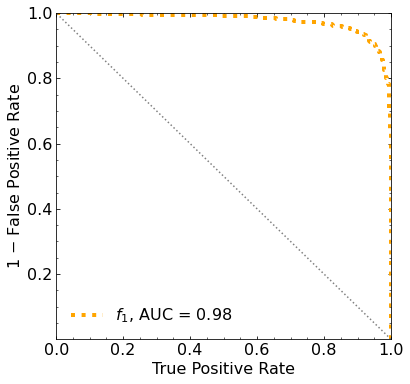

Classification score:


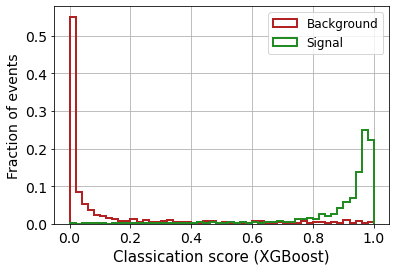


 ROC-AUC =  0.9762262358388135
At least 5 B events per bin, range = [[0, 1]]:
# bins:  12 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  12
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


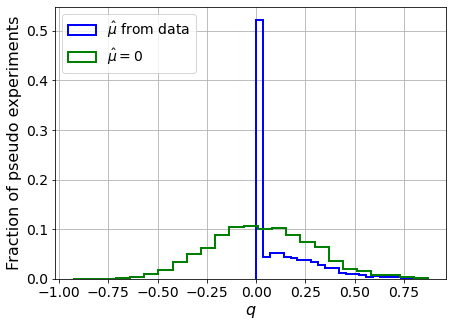

muhat mean:  0.05600140817257557
Z_bins:  0.15387169498624445
std Z_bins:  0.5328846673674674
Z_bins mu=0:  0.15150410500384043
std Z_bins mu=0:  0.8542183546565764

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.014


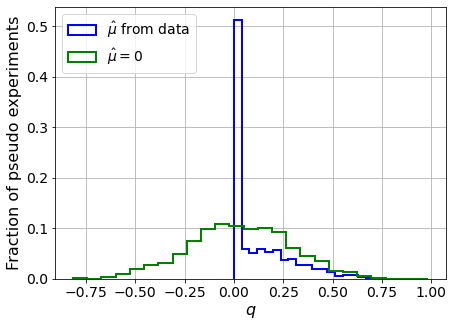

muhat mean:  0.030347171357234425
Z_bins:  0.18013656360807284
std Z_bins:  0.44043816783129164
Z_bins mu=0:  0.18013656360807284
std Z_bins mu=0:  0.7129511512472754

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


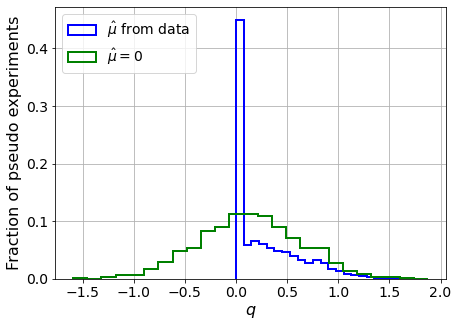

muhat mean:  -0.0360883456144454
Z_bins:  0.3665107465734495
std Z_bins:  0.4575496869694055
Z_bins mu=0:  0.3665107465734495
std Z_bins mu=0:  0.6819337019039321

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.007


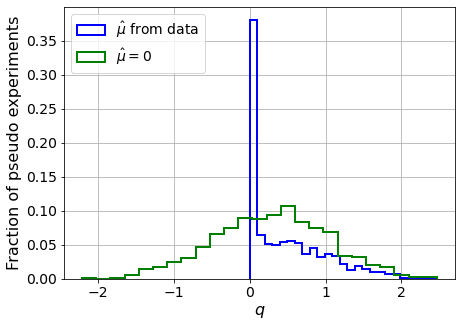

muhat mean:  -0.008180478894743689
Z_bins:  0.5539229867207998
std Z_bins:  0.46488604093417024
Z_bins mu=0:  0.5539229867207998
std Z_bins mu=0:  0.6741848973580387

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0085


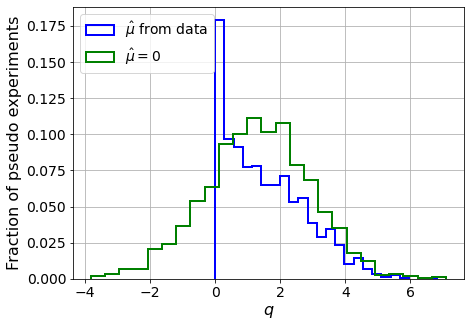

muhat mean:  0.02057569649679094
Z_bins:  1.1504631498393907
std Z_bins:  0.5506836900301608
Z_bins mu=0:  1.1502387104881377
std Z_bins mu=0:  0.7034592942017592

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.011


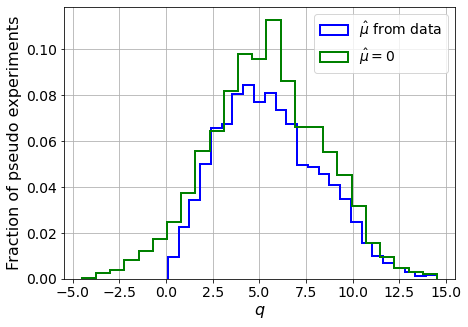

muhat mean:  0.0028899768913092263
Z_bins:  2.3166382543682564
std Z_bins:  0.5818336532429363
Z_bins mu=0:  2.3166382543682564
std Z_bins mu=0:  0.6588121696404756

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0125


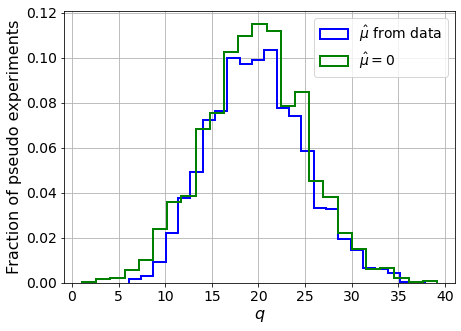

muhat mean:  0.0033992733120912725
Z_bins:  4.431622800551933
std Z_bins:  0.57613813162417
Z_bins mu=0:  4.429434162170882
std Z_bins mu=0:  0.6168873968797179

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.012


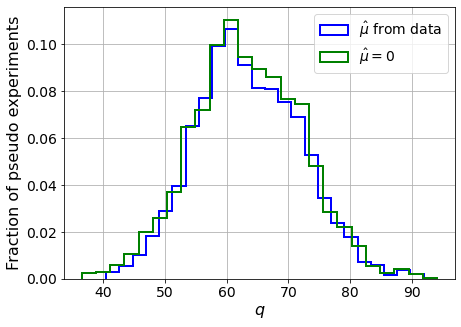

muhat mean:  0.002908478390038793
Z_bins:  7.946668839837096
std Z_bins:  0.5348780106924327
Z_bins mu=0:  7.946000375375582
std Z_bins mu=0:  0.5575663537394402

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.012


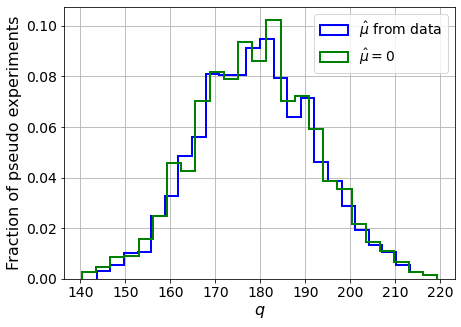

muhat mean:  -0.00018456066371849142
Z_bins:  13.382522884805121
std Z_bins:  0.48750700986375106
Z_bins mu=0:  13.382300405119887
std Z_bins mu=0:  0.49999321289883164

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


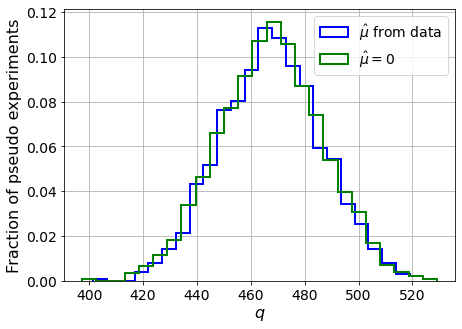

muhat mean:  -0.0005673507554789323
Z_bins:  21.62496060146397
std Z_bins:  0.43549199380198717
Z_bins mu=0:  21.62464021228567
std Z_bins mu=0:  0.4435256805898573

--------


 FINAL RESULT:

[[0.15387169498624445, 0.5328846673674674, 0.05600140817257557, 0.15150410500384043, 0.8542183546565764], [0.18013656360807284, 0.44043816783129164, 0.030347171357234425, 0.18013656360807284, 0.7129511512472754], [0.3665107465734495, 0.4575496869694055, -0.0360883456144454, 0.3665107465734495, 0.6819337019039321], [0.5539229867207998, 0.46488604093417024, -0.008180478894743689, 0.5539229867207998, 0.6741848973580387], [1.1504631498393907, 0.5506836900301608, 0.02057569649679094, 1.1502387104881377, 0.7034592942017592], [2.3166382543682564, 0.5818336532429363, 0.0028899768913092263, 2.3166382543682564, 0.6588121696404756], [4.431622800551933, 0.57613813162417, 0.0033992733120912725, 4.429434162170882, 0.6168873968797179], [7.946668839837096, 0.5348780106924327, 0.002908478390038793, 7.946000375375

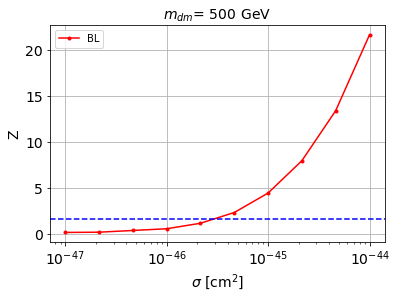


cross_BL_164:  3.1581941316815224e-46
cross_BL_164_up:  2.045647806386151e-46
cross_BL_164_down:  4.428182397009562e-46

#########################



In [39]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)
    


        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
#     # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
    del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)

    # all the signal features
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')

#     del B_ppeakS1
#     del B_ppeakS2
#     del B_pbot
#     del B_ptop

    del S_ppeakS1
    del S_ppeakS2
    del S_pbot
    del S_ptop


    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)
    del X_mon_B
    del X_mon_S


    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)

    del X_mon5
    del y_mon5

    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    del X_mon5_aux
    del y_mon5_aux

    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    #################################
    # CONCATENATE IMAGES + FEATURES #
    #################################
    
    X_mon_train = np.concatenate([X_mon_train_1D, X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon_test_1D, X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon_val_1D, X_mon5_val],axis=1)

    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [40]:
cross_images17feats = store_cross_BL_164
cross_images17feats_up = store_cross_BL_164_up
cross_images17feats_down = store_cross_BL_164_down

print(cross_images17feats)
print(cross_images17feats_up)
print(cross_images17feats_down)

[1.0484799698722304e-45, 9.02286235394938e-47, 5.200367388659711e-47, 4.984612195332882e-47, 7.1539314345150175e-47, 1.3239944701079767e-46, 3.1581941316815224e-46]
[7.55915602107398e-46, 5.84428865931889e-47, 3.332001991204569e-47, 3.273097180702444e-47, 4.792942044591275e-47, 8.435825470524052e-47, 2.045647806386151e-46]
[1.470172768555294e-45, 1.3012125514302707e-46, 7.217848743915321e-47, 7.168037118828249e-47, 9.820480757028793e-47, 1.850564130280567e-46, 4.428182397009562e-46]


In [41]:
np.savetxt('results/images17feats.txt', [cross_images17feats, cross_images17feats_up, cross_images17feats_down])

In [42]:
cross_images17feats = np.loadtxt('results/images17feats.txt')[0]
cross_images17feats_up = np.loadtxt('results/images17feats.txt')[1]
cross_images17feats_down =np.loadtxt('results/images17feats.txt')[2]


#########################

mDM =  10 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.shape:  (5000, 8)
B_pdiffT.shape:  (5000,)
S_pdiffT.shape:  (5000,)


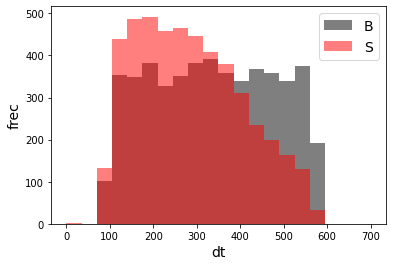

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68346	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67397	validation_1-logloss:0.67435
[2]	validation_0-logloss:0.66467	validation_1-logloss:0.66521
[3]	validation_0-logloss:0.65555	validation_1-logloss:0.65626
[4]	validation_0-logloss:0.64660	validation_1-logloss:0.64746
[5]	validation_0-logloss:0.63783	validation_1-logloss:0.63887
[6]	validation_0-logloss:0.62922	validation_1-logloss:0.63041
[7]	validation_0-logloss:0.62077	validation_1-logloss:0.62213
[8]	validation_0-logloss:0.61248	validation_1-logloss:0.61399
[9]	validation_0-logloss:0.60434	validation_1-logloss:0.60604
[10]	validation_0-logloss:0.59635	validation_1-logloss:0.59820
[11]	validation_0-logloss:0.58851	validation_1-logloss:0.59052
[12]	validation_0-logloss:0.58080	validation_1-logloss:0.58293
[13]	validation_0-logloss:0.57323	validation_1-logloss:0.57551
[14]	validation_0-logloss:0.56580	validation_1-logloss:0.56819
[15]	validation_0-logloss:0.55845	validation_1-logloss:0.56100
[1

[130]	validation_0-logloss:0.15611	validation_1-logloss:0.17065
[131]	validation_0-logloss:0.15459	validation_1-logloss:0.16923
[132]	validation_0-logloss:0.15307	validation_1-logloss:0.16782
[133]	validation_0-logloss:0.15158	validation_1-logloss:0.16642
[134]	validation_0-logloss:0.15010	validation_1-logloss:0.16504
[135]	validation_0-logloss:0.14864	validation_1-logloss:0.16367
[136]	validation_0-logloss:0.14717	validation_1-logloss:0.16225
[137]	validation_0-logloss:0.14573	validation_1-logloss:0.16092
[138]	validation_0-logloss:0.14430	validation_1-logloss:0.15951
[139]	validation_0-logloss:0.14289	validation_1-logloss:0.15819
[140]	validation_0-logloss:0.14150	validation_1-logloss:0.15691
[141]	validation_0-logloss:0.14012	validation_1-logloss:0.15557
[142]	validation_0-logloss:0.13875	validation_1-logloss:0.15429
[143]	validation_0-logloss:0.13741	validation_1-logloss:0.15298
[144]	validation_0-logloss:0.13608	validation_1-logloss:0.15176
[145]	validation_0-logloss:0.13476	valid

[259]	validation_0-logloss:0.04706	validation_1-logloss:0.06888
[260]	validation_0-logloss:0.04665	validation_1-logloss:0.06851
[261]	validation_0-logloss:0.04624	validation_1-logloss:0.06809
[262]	validation_0-logloss:0.04583	validation_1-logloss:0.06771
[263]	validation_0-logloss:0.04543	validation_1-logloss:0.06734
[264]	validation_0-logloss:0.04503	validation_1-logloss:0.06694
[265]	validation_0-logloss:0.04464	validation_1-logloss:0.06659
[266]	validation_0-logloss:0.04425	validation_1-logloss:0.06624
[267]	validation_0-logloss:0.04386	validation_1-logloss:0.06586
[268]	validation_0-logloss:0.04348	validation_1-logloss:0.06553
[269]	validation_0-logloss:0.04310	validation_1-logloss:0.06520
[270]	validation_0-logloss:0.04272	validation_1-logloss:0.06486
[271]	validation_0-logloss:0.04236	validation_1-logloss:0.06454
[272]	validation_0-logloss:0.04200	validation_1-logloss:0.06422
[273]	validation_0-logloss:0.04164	validation_1-logloss:0.06392
[274]	validation_0-logloss:0.04128	valid

[388]	validation_0-logloss:0.01613	validation_1-logloss:0.04433
[389]	validation_0-logloss:0.01600	validation_1-logloss:0.04426
[390]	validation_0-logloss:0.01587	validation_1-logloss:0.04417
[391]	validation_0-logloss:0.01575	validation_1-logloss:0.04409
[392]	validation_0-logloss:0.01563	validation_1-logloss:0.04401
[393]	validation_0-logloss:0.01551	validation_1-logloss:0.04393
[394]	validation_0-logloss:0.01539	validation_1-logloss:0.04384
[395]	validation_0-logloss:0.01528	validation_1-logloss:0.04376
[396]	validation_0-logloss:0.01517	validation_1-logloss:0.04369
[397]	validation_0-logloss:0.01506	validation_1-logloss:0.04357
[398]	validation_0-logloss:0.01494	validation_1-logloss:0.04350
[399]	validation_0-logloss:0.01483	validation_1-logloss:0.04343
[400]	validation_0-logloss:0.01472	validation_1-logloss:0.04338
[401]	validation_0-logloss:0.01461	validation_1-logloss:0.04332
[402]	validation_0-logloss:0.01450	validation_1-logloss:0.04325
[403]	validation_0-logloss:0.01439	valid

[517]	validation_0-logloss:0.00639	validation_1-logloss:0.04110
[518]	validation_0-logloss:0.00635	validation_1-logloss:0.04115
[519]	validation_0-logloss:0.00631	validation_1-logloss:0.04111
[520]	validation_0-logloss:0.00627	validation_1-logloss:0.04113
[521]	validation_0-logloss:0.00623	validation_1-logloss:0.04113
[522]	validation_0-logloss:0.00620	validation_1-logloss:0.04113
[523]	validation_0-logloss:0.00616	validation_1-logloss:0.04114
[524]	validation_0-logloss:0.00612	validation_1-logloss:0.04112
[525]	validation_0-logloss:0.00608	validation_1-logloss:0.04115
[526]	validation_0-logloss:0.00604	validation_1-logloss:0.04116
[527]	validation_0-logloss:0.00600	validation_1-logloss:0.04115
[528]	validation_0-logloss:0.00597	validation_1-logloss:0.04115
[529]	validation_0-logloss:0.00593	validation_1-logloss:0.04116
[530]	validation_0-logloss:0.00589	validation_1-logloss:0.04119
[531]	validation_0-logloss:0.00586	validation_1-logloss:0.04115
[532]	validation_0-logloss:0.00582	valid

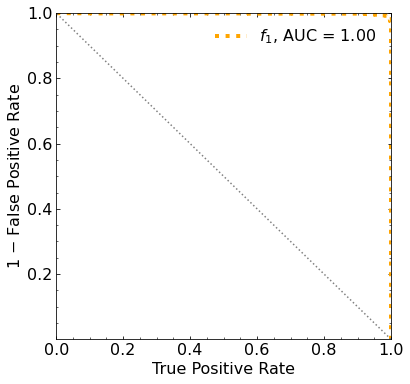

Classification score:


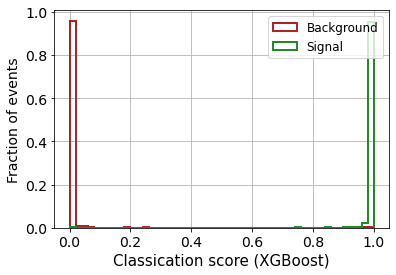


 ROC-AUC =  0.998505457050376


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 378.3233574
 283.63115547 191.49325692  98.8056241    5.17775849 -84.82861153]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
     

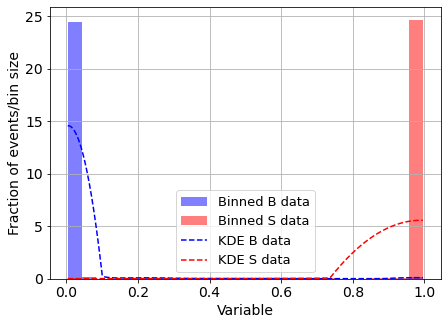

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.257351270001691
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


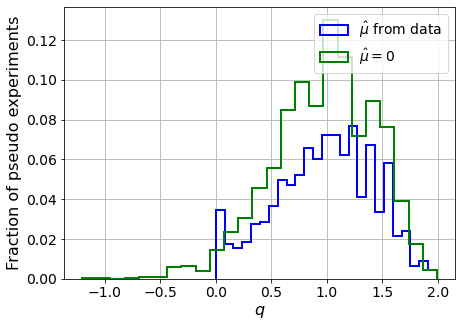

muhat mean:  -249.580398504611
Z_bins:  0.996410012027628
std Z_bins:  0.21894807511687542
Z_bins mu=0:  0.996410012027628
std Z_bins mu=0:  0.2288722126317745

--------

B_expected:  643
S_expected:  1



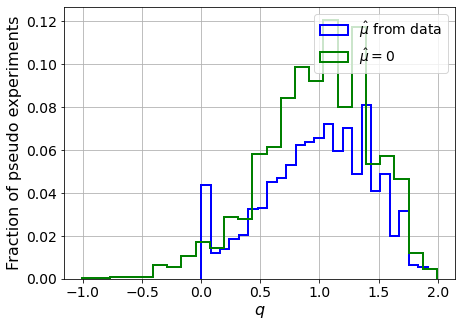

muhat mean:  -251.25299837136234
Z_bins:  1.0028895233607837
std Z_bins:  0.21912093256228005
Z_bins mu=0:  1.0028895233607837
std Z_bins mu=0:  0.22903245525800825

--------

B_expected:  643
S_expected:  1



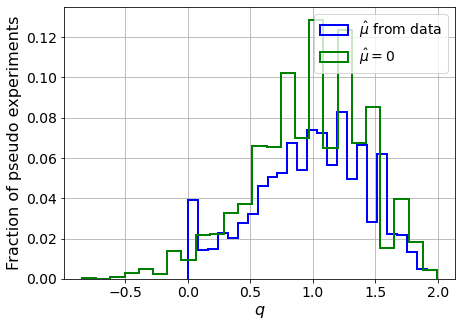

muhat mean:  -249.99514864351727
Z_bins:  0.9984051763726919
std Z_bins:  0.21975660892788523
Z_bins mu=0:  0.9984051763726919
std Z_bins mu=0:  0.22758090917686316

--------

B_expected:  643
S_expected:  1



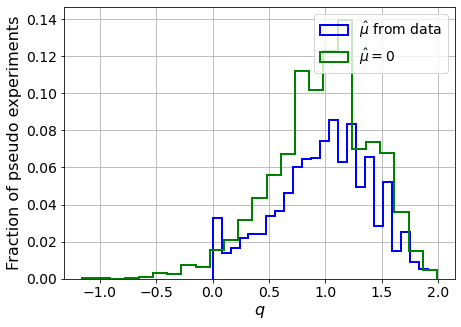

muhat mean:  -5.481194781554751
Z_bins:  1.0003413722612868
std Z_bins:  0.21128777582052602
Z_bins mu=0:  1.0003413722612868
std Z_bins mu=0:  0.22027563604416772

--------

B_expected:  643
S_expected:  1



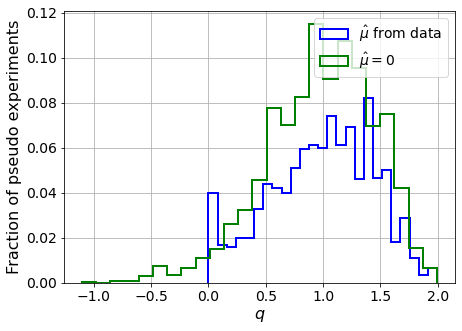

muhat mean:  -739.634101442026
Z_bins:  1.0046830999736036
std Z_bins:  0.22264859177084714
Z_bins mu=0:  1.0046830999736036
std Z_bins mu=0:  0.23556160632861833

--------

B_expected:  643
S_expected:  2



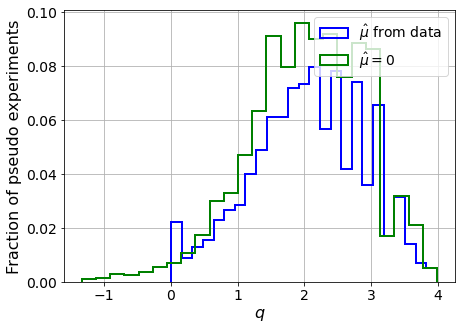

muhat mean:  -247.5291823772906
Z_bins:  1.4435455189747577
std Z_bins:  0.2908387274814661
Z_bins mu=0:  1.4435455189747577
std Z_bins mu=0:  0.3004549981814537

--------

B_expected:  643
S_expected:  5



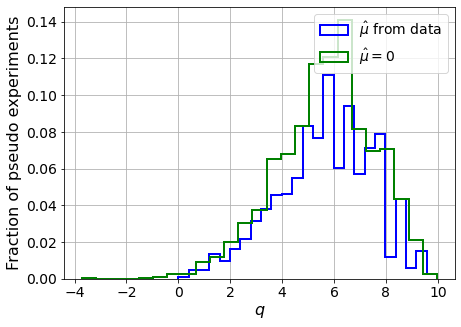

muhat mean:  -100.225668420263
Z_bins:  2.4146727802364008
std Z_bins:  0.379467419103362
Z_bins mu=0:  2.4146727802364008
std Z_bins mu=0:  0.38494965432897743

--------

B_expected:  643
S_expected:  10



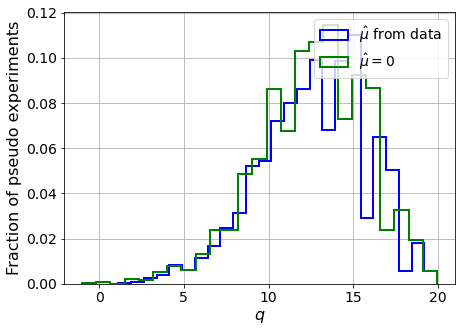

muhat mean:  -24.298584383427198
Z_bins:  3.5835301126499526
std Z_bins:  0.43897329094881354
Z_bins mu=0:  3.5835301126499526
std Z_bins mu=0:  0.44334278537019906

--------

B_expected:  643
S_expected:  22



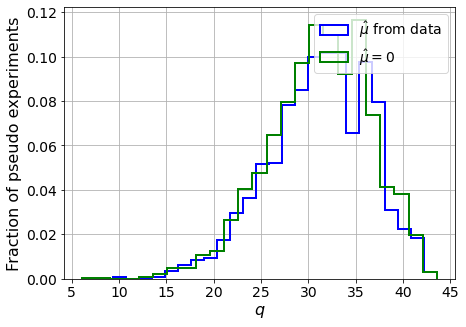

muhat mean:  -0.32082742331056047
Z_bins:  5.610210452256634
std Z_bins:  0.47367185147563495
Z_bins mu=0:  5.610210452256634
std Z_bins mu=0:  0.4767444122515843

--------

B_expected:  643
S_expected:  47



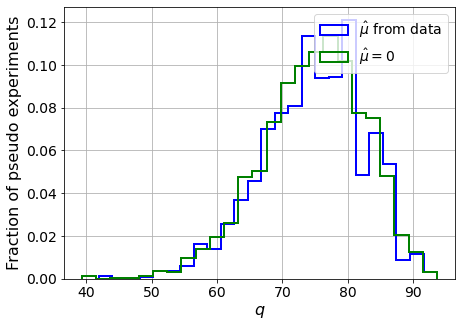

muhat mean:  -10.509221188780673
Z_bins:  8.667023083424946
std Z_bins:  0.45422008042165535
Z_bins mu=0:  8.667023083424946
std Z_bins mu=0:  0.45650111213805955

--------


 FINAL RESULT:

[[0.996410012027628, 0.21894807511687542, -249.580398504611, 0.996410012027628, 0.2288722126317745], [1.0028895233607837, 0.21912093256228005, -251.25299837136234, 1.0028895233607837, 0.22903245525800825], [0.9984051763726919, 0.21975660892788523, -249.99514864351727, 0.9984051763726919, 0.22758090917686316], [1.0003413722612868, 0.21128777582052602, -5.481194781554751, 1.0003413722612868, 0.22027563604416772], [1.0046830999736036, 0.22264859177084714, -739.634101442026, 1.0046830999736036, 0.23556160632861833], [1.4435455189747577, 0.2908387274814661, -247.5291823772906, 1.4435455189747577, 0.3004549981814537], [2.4146727802364008, 0.379467419103362, -100.225668420263, 2.4146727802364008, 0.38494965432897743], [3.5835301126499526, 0.43897329094881354, -24.298584383427198, 3.5835301126499526, 0.443

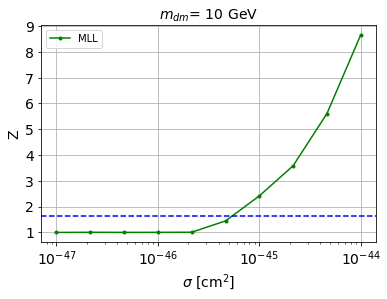


cross_MLL_164:  5.588999945885258e-46
cross_MLL_164_up:  4.230755094574196e-46
cross_MLL_164_down:  7.301718020162574e-46

#########################


#########################

mDM =  20 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

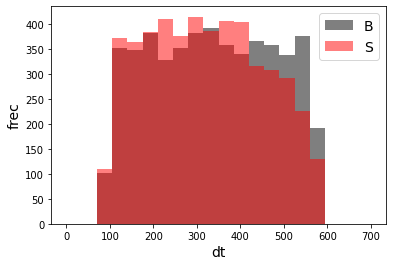

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68419	validation_1-logloss:0.68461
[1]	validation_0-logloss:0.67545	validation_1-logloss:0.67627
[2]	validation_0-logloss:0.66686	validation_1-logloss:0.66807
[3]	validation_0-logloss:0.65843	validation_1-logloss:0.66008
[4]	validation_0-logloss:0.65018	validation_1-logloss:0.65225
[5]	validation_0-logloss:0.64208	validation_1-logloss:0.64453
[6]	validation_0-logloss:0.63413	validation_1-logloss:0.63696
[7]	validation_0-logloss:0.62634	validation_1-logloss:0.62957
[8]	validation_0-logloss:0.61859	validation_1-logloss:0.62216
[9]	validation_0-logloss:0.61096	validation_1-logloss:0.61484
[10]	validation_0-logloss:0.60357	validation_1-logloss:0.60772
[11]	validation_0-logloss:0.59622	validation_1-logloss:0.60073
[12]	validation_0-logloss:0.58901	validation_1-logloss:0.59381
[13]	validation_0-logloss:0.58192	validation_1-logloss:0.58704
[14]	validation_0-logloss:0.57503	validation_1-logloss:0.58044
[15]	validation_0-logloss:0.56819	validation_1-logloss:0.57393
[1

[130]	validation_0-logloss:0.18840	validation_1-logloss:0.21493
[131]	validation_0-logloss:0.18692	validation_1-logloss:0.21353
[132]	validation_0-logloss:0.18544	validation_1-logloss:0.21213
[133]	validation_0-logloss:0.18396	validation_1-logloss:0.21078
[134]	validation_0-logloss:0.18253	validation_1-logloss:0.20945
[135]	validation_0-logloss:0.18108	validation_1-logloss:0.20812
[136]	validation_0-logloss:0.17969	validation_1-logloss:0.20682
[137]	validation_0-logloss:0.17827	validation_1-logloss:0.20550
[138]	validation_0-logloss:0.17690	validation_1-logloss:0.20424
[139]	validation_0-logloss:0.17554	validation_1-logloss:0.20298
[140]	validation_0-logloss:0.17417	validation_1-logloss:0.20173
[141]	validation_0-logloss:0.17284	validation_1-logloss:0.20050
[142]	validation_0-logloss:0.17153	validation_1-logloss:0.19926
[143]	validation_0-logloss:0.17018	validation_1-logloss:0.19806
[144]	validation_0-logloss:0.16890	validation_1-logloss:0.19684
[145]	validation_0-logloss:0.16757	valid

[259]	validation_0-logloss:0.07947	validation_1-logloss:0.11987
[260]	validation_0-logloss:0.07905	validation_1-logloss:0.11955
[261]	validation_0-logloss:0.07865	validation_1-logloss:0.11925
[262]	validation_0-logloss:0.07821	validation_1-logloss:0.11892
[263]	validation_0-logloss:0.07782	validation_1-logloss:0.11861
[264]	validation_0-logloss:0.07737	validation_1-logloss:0.11829
[265]	validation_0-logloss:0.07695	validation_1-logloss:0.11803
[266]	validation_0-logloss:0.07656	validation_1-logloss:0.11773
[267]	validation_0-logloss:0.07613	validation_1-logloss:0.11742
[268]	validation_0-logloss:0.07572	validation_1-logloss:0.11716
[269]	validation_0-logloss:0.07533	validation_1-logloss:0.11690
[270]	validation_0-logloss:0.07490	validation_1-logloss:0.11658
[271]	validation_0-logloss:0.07449	validation_1-logloss:0.11625
[272]	validation_0-logloss:0.07408	validation_1-logloss:0.11595
[273]	validation_0-logloss:0.07367	validation_1-logloss:0.11564
[274]	validation_0-logloss:0.07326	valid

[388]	validation_0-logloss:0.04414	validation_1-logloss:0.09822
[389]	validation_0-logloss:0.04398	validation_1-logloss:0.09814
[390]	validation_0-logloss:0.04382	validation_1-logloss:0.09809
[391]	validation_0-logloss:0.04367	validation_1-logloss:0.09802
[392]	validation_0-logloss:0.04351	validation_1-logloss:0.09796
[393]	validation_0-logloss:0.04336	validation_1-logloss:0.09791
[394]	validation_0-logloss:0.04321	validation_1-logloss:0.09782
[395]	validation_0-logloss:0.04306	validation_1-logloss:0.09774
[396]	validation_0-logloss:0.04290	validation_1-logloss:0.09770
[397]	validation_0-logloss:0.04275	validation_1-logloss:0.09766
[398]	validation_0-logloss:0.04261	validation_1-logloss:0.09767
[399]	validation_0-logloss:0.04245	validation_1-logloss:0.09759
[400]	validation_0-logloss:0.04230	validation_1-logloss:0.09758
[401]	validation_0-logloss:0.04215	validation_1-logloss:0.09756
[402]	validation_0-logloss:0.04201	validation_1-logloss:0.09749
[403]	validation_0-logloss:0.04185	valid

[517]	validation_0-logloss:0.02940	validation_1-logloss:0.09365
[518]	validation_0-logloss:0.02931	validation_1-logloss:0.09370
[519]	validation_0-logloss:0.02920	validation_1-logloss:0.09368
[520]	validation_0-logloss:0.02913	validation_1-logloss:0.09363
[521]	validation_0-logloss:0.02905	validation_1-logloss:0.09360
[522]	validation_0-logloss:0.02896	validation_1-logloss:0.09362
[523]	validation_0-logloss:0.02885	validation_1-logloss:0.09364
[524]	validation_0-logloss:0.02876	validation_1-logloss:0.09360
[525]	validation_0-logloss:0.02868	validation_1-logloss:0.09360
[526]	validation_0-logloss:0.02861	validation_1-logloss:0.09355
[527]	validation_0-logloss:0.02852	validation_1-logloss:0.09348
[528]	validation_0-logloss:0.02844	validation_1-logloss:0.09346
[529]	validation_0-logloss:0.02836	validation_1-logloss:0.09344
[530]	validation_0-logloss:0.02825	validation_1-logloss:0.09342
[531]	validation_0-logloss:0.02817	validation_1-logloss:0.09340
[532]	validation_0-logloss:0.02810	valid

[646]	validation_0-logloss:0.02042	validation_1-logloss:0.09265
[647]	validation_0-logloss:0.02037	validation_1-logloss:0.09266
[648]	validation_0-logloss:0.02033	validation_1-logloss:0.09268
[649]	validation_0-logloss:0.02027	validation_1-logloss:0.09270
[650]	validation_0-logloss:0.02019	validation_1-logloss:0.09269
[651]	validation_0-logloss:0.02012	validation_1-logloss:0.09266
[652]	validation_0-logloss:0.02007	validation_1-logloss:0.09265
[653]	validation_0-logloss:0.02000	validation_1-logloss:0.09259
[654]	validation_0-logloss:0.01996	validation_1-logloss:0.09262
[655]	validation_0-logloss:0.01992	validation_1-logloss:0.09259
[656]	validation_0-logloss:0.01987	validation_1-logloss:0.09261
[657]	validation_0-logloss:0.01980	validation_1-logloss:0.09268
[658]	validation_0-logloss:0.01972	validation_1-logloss:0.09266
[659]	validation_0-logloss:0.01969	validation_1-logloss:0.09270
[660]	validation_0-logloss:0.01962	validation_1-logloss:0.09270
[661]	validation_0-logloss:0.01957	valid

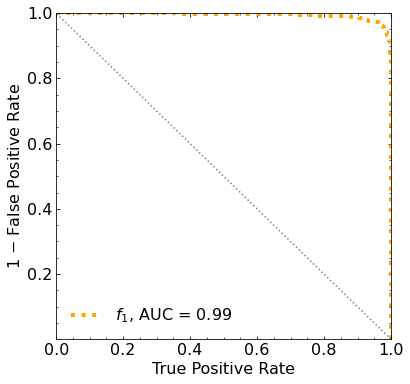

Classification score:


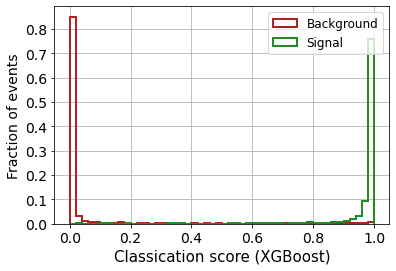


 ROC-AUC =  0.9934571732939996


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 454.80887459 381.2672199  305.92208121
 226.90821743 146.44352561  64.85619404 -16.62489202 -93.21093703]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 382.30438834 315.95948121
 242

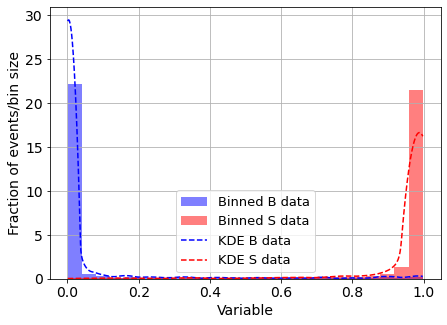

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



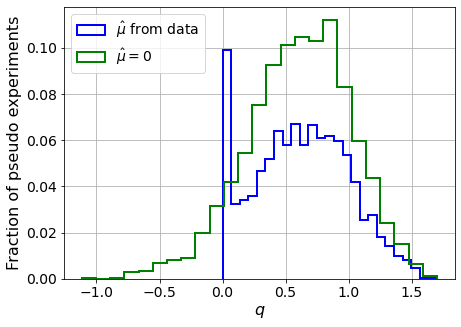

muhat mean:  -4.059202262792736
Z_bins:  0.7913282870599928
std Z_bins:  0.2364433862672904
Z_bins mu=0:  0.7913282870599928
std Z_bins mu=0:  0.26176841165945186

--------

B_expected:  643
S_expected:  2



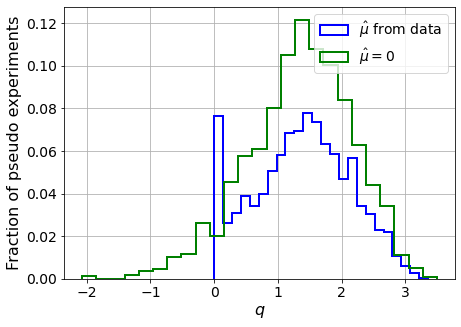

muhat mean:  -2.264041273731168
Z_bins:  1.18649978918075
std Z_bins:  0.3170707711863147
Z_bins mu=0:  1.18649978918075
std Z_bins mu=0:  0.34490604550724724

--------

B_expected:  643
S_expected:  4



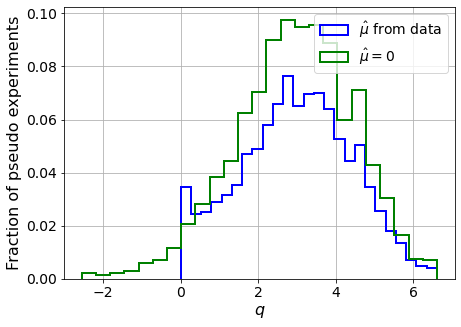

muhat mean:  -1.0784572727627688
Z_bins:  1.7342018626625566
std Z_bins:  0.41239438395101113
Z_bins mu=0:  1.7342018626625566
std Z_bins mu=0:  0.43402654821525966

--------

B_expected:  643
S_expected:  9



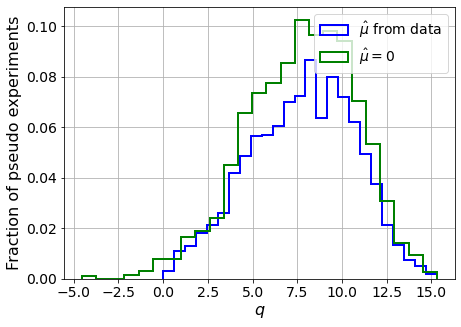

muhat mean:  -0.46139415201488065
Z_bins:  2.8234860433688245
std Z_bins:  0.5212181795254814
Z_bins mu=0:  2.8234860433688245
std Z_bins mu=0:  0.5384051821681025

--------

B_expected:  643
S_expected:  18



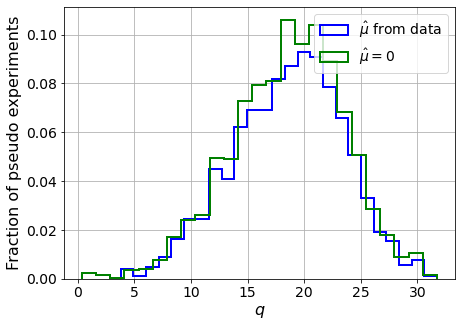

muhat mean:  -0.23850780905416571
Z_bins:  4.34753191753627
std Z_bins:  0.5577999750232289
Z_bins mu=0:  4.34753191753627
std Z_bins mu=0:  0.5683612072921883

--------

B_expected:  643
S_expected:  40



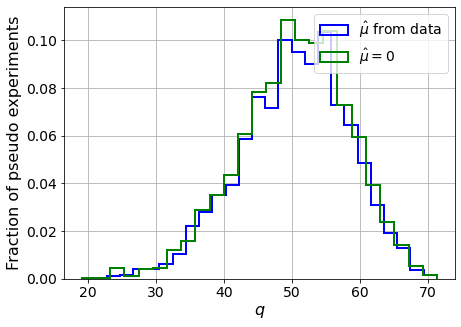

muhat mean:  -0.1082512273505373
Z_bins:  7.1308924444079524
std Z_bins:  0.5547885606139696
Z_bins mu=0:  7.1308924444079524
std Z_bins mu=0:  0.5614811655303504

--------

B_expected:  643
S_expected:  85



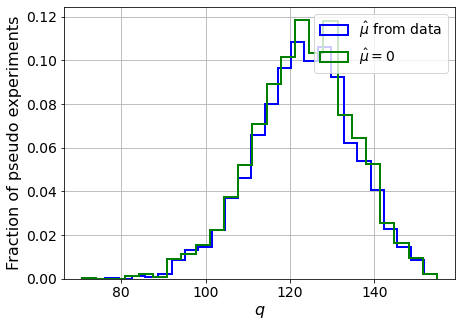

muhat mean:  -0.05117095206789222
Z_bins:  11.1124598134831
std Z_bins:  0.5319752893728591
Z_bins mu=0:  11.1124598134831
std Z_bins mu=0:  0.5362094140527203

--------

B_expected:  643
S_expected:  184



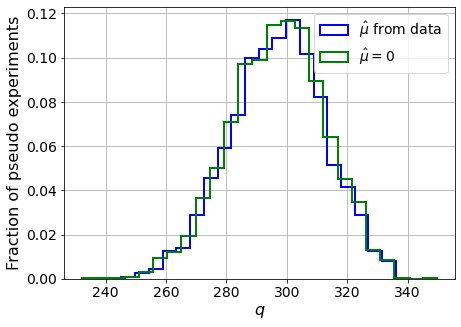

muhat mean:  -0.024629717450029055
Z_bins:  17.243049152064337
std Z_bins:  0.4550250337864063
Z_bins mu=0:  17.243049152064337
std Z_bins mu=0:  0.45716860169818313

--------

B_expected:  643
S_expected:  396



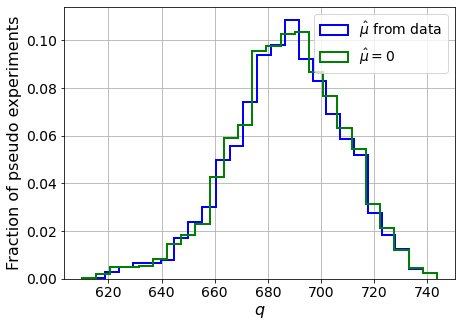

muhat mean:  -0.011560720723728367
Z_bins:  26.226705981394193
std Z_bins:  0.4022154891209238
Z_bins mu=0:  26.226705981394193
std Z_bins mu=0:  0.40417110030618164

--------

B_expected:  643
S_expected:  854



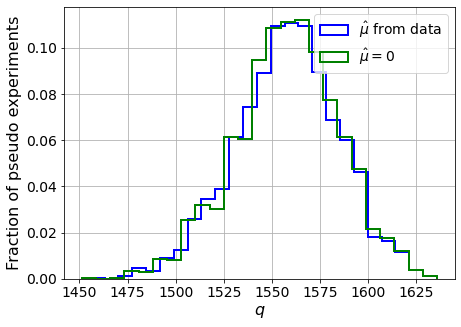

muhat mean:  -0.005270372294506226
Z_bins:  39.47949801172193
std Z_bins:  0.3415021254913427
Z_bins mu=0:  39.47949801172193
std Z_bins mu=0:  0.3426090908848866

--------


 FINAL RESULT:

[[0.7913282870599928, 0.2364433862672904, -4.059202262792736, 0.7913282870599928, 0.26176841165945186], [1.18649978918075, 0.3170707711863147, -2.264041273731168, 1.18649978918075, 0.34490604550724724], [1.7342018626625566, 0.41239438395101113, -1.0784572727627688, 1.7342018626625566, 0.43402654821525966], [2.8234860433688245, 0.5212181795254814, -0.46139415201488065, 2.8234860433688245, 0.5384051821681025], [4.34753191753627, 0.5577999750232289, -0.23850780905416571, 4.34753191753627, 0.5683612072921883], [7.1308924444079524, 0.5547885606139696, -0.1082512273505373, 7.1308924444079524, 0.5614811655303504], [11.1124598134831, 0.5319752893728591, -0.05117095206789222, 11.1124598134831, 0.5362094140527203], [17.243049152064337, 0.4550250337864063, -0.024629717450029055, 17.243049152064337, 0.45716860

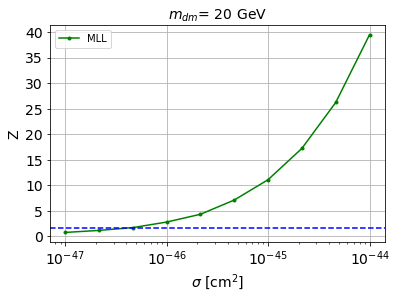


cross_MLL_164:  4.224739063211317e-47
cross_MLL_164_up:  2.622469087211245e-47
cross_MLL_164_down:  6.242151138544938e-47

#########################


#########################

mDM =  35 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.sha

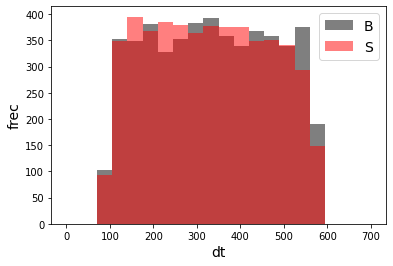

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68515	validation_1-logloss:0.68544
[1]	validation_0-logloss:0.67732	validation_1-logloss:0.67791
[2]	validation_0-logloss:0.66964	validation_1-logloss:0.67052
[3]	validation_0-logloss:0.66212	validation_1-logloss:0.66328
[4]	validation_0-logloss:0.65474	validation_1-logloss:0.65619
[5]	validation_0-logloss:0.64748	validation_1-logloss:0.64915
[6]	validation_0-logloss:0.64040	validation_1-logloss:0.64224
[7]	validation_0-logloss:0.63342	validation_1-logloss:0.63556
[8]	validation_0-logloss:0.62656	validation_1-logloss:0.62891
[9]	validation_0-logloss:0.61983	validation_1-logloss:0.62236
[10]	validation_0-logloss:0.61324	validation_1-logloss:0.61603
[11]	validation_0-logloss:0.60676	validation_1-logloss:0.60974
[12]	validation_0-logloss:0.60040	validation_1-logloss:0.60367
[13]	validation_0-logloss:0.59413	validation_1-logloss:0.59762
[14]	validation_0-logloss:0.58792	validation_1-logloss:0.59158
[15]	validation_0-logloss:0.58189	validation_1-logloss:0.58575
[1

[130]	validation_0-logloss:0.24027	validation_1-logloss:0.26619
[131]	validation_0-logloss:0.23885	validation_1-logloss:0.26501
[132]	validation_0-logloss:0.23751	validation_1-logloss:0.26386
[133]	validation_0-logloss:0.23611	validation_1-logloss:0.26269
[134]	validation_0-logloss:0.23475	validation_1-logloss:0.26138
[135]	validation_0-logloss:0.23336	validation_1-logloss:0.26026
[136]	validation_0-logloss:0.23197	validation_1-logloss:0.25913
[137]	validation_0-logloss:0.23074	validation_1-logloss:0.25811
[138]	validation_0-logloss:0.22945	validation_1-logloss:0.25705
[139]	validation_0-logloss:0.22811	validation_1-logloss:0.25598
[140]	validation_0-logloss:0.22689	validation_1-logloss:0.25496
[141]	validation_0-logloss:0.22554	validation_1-logloss:0.25378
[142]	validation_0-logloss:0.22428	validation_1-logloss:0.25264
[143]	validation_0-logloss:0.22305	validation_1-logloss:0.25164
[144]	validation_0-logloss:0.22174	validation_1-logloss:0.25056
[145]	validation_0-logloss:0.22051	valid

[259]	validation_0-logloss:0.13326	validation_1-logloss:0.18088
[260]	validation_0-logloss:0.13278	validation_1-logloss:0.18051
[261]	validation_0-logloss:0.13236	validation_1-logloss:0.18016
[262]	validation_0-logloss:0.13193	validation_1-logloss:0.17985
[263]	validation_0-logloss:0.13151	validation_1-logloss:0.17955
[264]	validation_0-logloss:0.13105	validation_1-logloss:0.17918
[265]	validation_0-logloss:0.13061	validation_1-logloss:0.17886
[266]	validation_0-logloss:0.13016	validation_1-logloss:0.17860
[267]	validation_0-logloss:0.12975	validation_1-logloss:0.17827
[268]	validation_0-logloss:0.12931	validation_1-logloss:0.17798
[269]	validation_0-logloss:0.12890	validation_1-logloss:0.17769
[270]	validation_0-logloss:0.12846	validation_1-logloss:0.17747
[271]	validation_0-logloss:0.12806	validation_1-logloss:0.17722
[272]	validation_0-logloss:0.12763	validation_1-logloss:0.17702
[273]	validation_0-logloss:0.12724	validation_1-logloss:0.17677
[274]	validation_0-logloss:0.12685	valid

[388]	validation_0-logloss:0.09358	validation_1-logloss:0.15964
[389]	validation_0-logloss:0.09336	validation_1-logloss:0.15956
[390]	validation_0-logloss:0.09316	validation_1-logloss:0.15953
[391]	validation_0-logloss:0.09296	validation_1-logloss:0.15943
[392]	validation_0-logloss:0.09267	validation_1-logloss:0.15928
[393]	validation_0-logloss:0.09246	validation_1-logloss:0.15922
[394]	validation_0-logloss:0.09226	validation_1-logloss:0.15921
[395]	validation_0-logloss:0.09204	validation_1-logloss:0.15917
[396]	validation_0-logloss:0.09184	validation_1-logloss:0.15909
[397]	validation_0-logloss:0.09162	validation_1-logloss:0.15903
[398]	validation_0-logloss:0.09144	validation_1-logloss:0.15900
[399]	validation_0-logloss:0.09119	validation_1-logloss:0.15895
[400]	validation_0-logloss:0.09098	validation_1-logloss:0.15891
[401]	validation_0-logloss:0.09079	validation_1-logloss:0.15883
[402]	validation_0-logloss:0.09052	validation_1-logloss:0.15871
[403]	validation_0-logloss:0.09029	valid

[517]	validation_0-logloss:0.07162	validation_1-logloss:0.15333
[518]	validation_0-logloss:0.07154	validation_1-logloss:0.15327
[519]	validation_0-logloss:0.07136	validation_1-logloss:0.15324
[520]	validation_0-logloss:0.07127	validation_1-logloss:0.15318
[521]	validation_0-logloss:0.07114	validation_1-logloss:0.15315
[522]	validation_0-logloss:0.07100	validation_1-logloss:0.15313
[523]	validation_0-logloss:0.07083	validation_1-logloss:0.15304
[524]	validation_0-logloss:0.07071	validation_1-logloss:0.15299
[525]	validation_0-logloss:0.07055	validation_1-logloss:0.15298
[526]	validation_0-logloss:0.07043	validation_1-logloss:0.15291
[527]	validation_0-logloss:0.07028	validation_1-logloss:0.15293
[528]	validation_0-logloss:0.07016	validation_1-logloss:0.15287
[529]	validation_0-logloss:0.07002	validation_1-logloss:0.15283
[530]	validation_0-logloss:0.06983	validation_1-logloss:0.15282
[531]	validation_0-logloss:0.06972	validation_1-logloss:0.15276
[532]	validation_0-logloss:0.06961	valid

[646]	validation_0-logloss:0.05666	validation_1-logloss:0.14942
[647]	validation_0-logloss:0.05657	validation_1-logloss:0.14942
[648]	validation_0-logloss:0.05649	validation_1-logloss:0.14938
[649]	validation_0-logloss:0.05642	validation_1-logloss:0.14936
[650]	validation_0-logloss:0.05628	validation_1-logloss:0.14935
[651]	validation_0-logloss:0.05619	validation_1-logloss:0.14936
[652]	validation_0-logloss:0.05609	validation_1-logloss:0.14931
[653]	validation_0-logloss:0.05599	validation_1-logloss:0.14926
[654]	validation_0-logloss:0.05585	validation_1-logloss:0.14924
[655]	validation_0-logloss:0.05575	validation_1-logloss:0.14920
[656]	validation_0-logloss:0.05560	validation_1-logloss:0.14914
[657]	validation_0-logloss:0.05547	validation_1-logloss:0.14914
[658]	validation_0-logloss:0.05535	validation_1-logloss:0.14910
[659]	validation_0-logloss:0.05528	validation_1-logloss:0.14914
[660]	validation_0-logloss:0.05514	validation_1-logloss:0.14914
[661]	validation_0-logloss:0.05504	valid

[775]	validation_0-logloss:0.04451	validation_1-logloss:0.14857
[776]	validation_0-logloss:0.04445	validation_1-logloss:0.14857
[777]	validation_0-logloss:0.04439	validation_1-logloss:0.14855
[778]	validation_0-logloss:0.04430	validation_1-logloss:0.14855
[779]	validation_0-logloss:0.04419	validation_1-logloss:0.14853
[780]	validation_0-logloss:0.04409	validation_1-logloss:0.14853
[781]	validation_0-logloss:0.04403	validation_1-logloss:0.14852
[782]	validation_0-logloss:0.04398	validation_1-logloss:0.14854
[783]	validation_0-logloss:0.04392	validation_1-logloss:0.14857
[784]	validation_0-logloss:0.04385	validation_1-logloss:0.14854
[785]	validation_0-logloss:0.04379	validation_1-logloss:0.14852
[786]	validation_0-logloss:0.04373	validation_1-logloss:0.14852
[787]	validation_0-logloss:0.04362	validation_1-logloss:0.14848
[788]	validation_0-logloss:0.04356	validation_1-logloss:0.14851
[789]	validation_0-logloss:0.04346	validation_1-logloss:0.14857
[790]	validation_0-logloss:0.04338	valid

[904]	validation_0-logloss:0.03577	validation_1-logloss:0.14806
[905]	validation_0-logloss:0.03570	validation_1-logloss:0.14812
[906]	validation_0-logloss:0.03562	validation_1-logloss:0.14812
[907]	validation_0-logloss:0.03558	validation_1-logloss:0.14812
[908]	validation_0-logloss:0.03554	validation_1-logloss:0.14814
[909]	validation_0-logloss:0.03547	validation_1-logloss:0.14811
[910]	validation_0-logloss:0.03542	validation_1-logloss:0.14811
[911]	validation_0-logloss:0.03535	validation_1-logloss:0.14815
[912]	validation_0-logloss:0.03531	validation_1-logloss:0.14812
[913]	validation_0-logloss:0.03526	validation_1-logloss:0.14809
[914]	validation_0-logloss:0.03519	validation_1-logloss:0.14802
[915]	validation_0-logloss:0.03516	validation_1-logloss:0.14803
[916]	validation_0-logloss:0.03508	validation_1-logloss:0.14808
[917]	validation_0-logloss:0.03504	validation_1-logloss:0.14808
[918]	validation_0-logloss:0.03496	validation_1-logloss:0.14806
[919]	validation_0-logloss:0.03491	valid

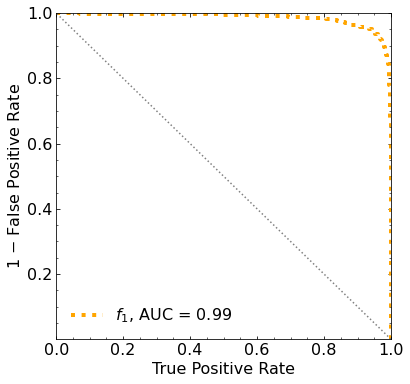

Classification score:


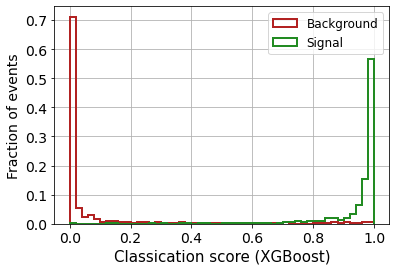


 ROC-AUC =  0.9851941337348656


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 356.82266647 300.23393638 242.77414012
 180.40347451 112.98779708  42.32820941 -32.63858472 -99.34970114]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 352.36093    312.82215844 261.20040617
 203

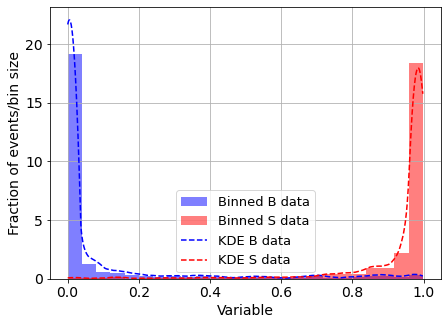

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



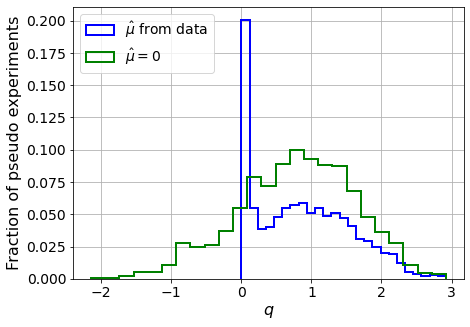

muhat mean:  -1.3318884360781356
Z_bins:  0.9125505807496691
std Z_bins:  0.37528486774365927
Z_bins mu=0:  0.9125505807496691
std Z_bins mu=0:  0.45815368001540885

--------

B_expected:  643
S_expected:  4



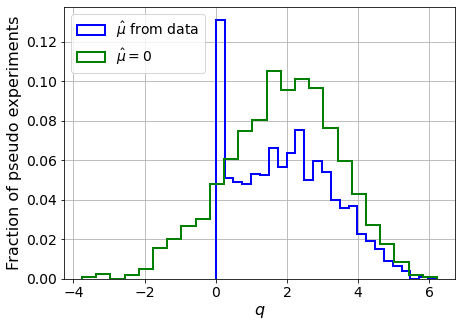

muhat mean:  -0.6560161925825037
Z_bins:  1.4019439890828738
std Z_bins:  0.4782943912749513
Z_bins mu=0:  1.4019439890828738
std Z_bins mu=0:  0.5531269917642571

--------

B_expected:  643
S_expected:  8



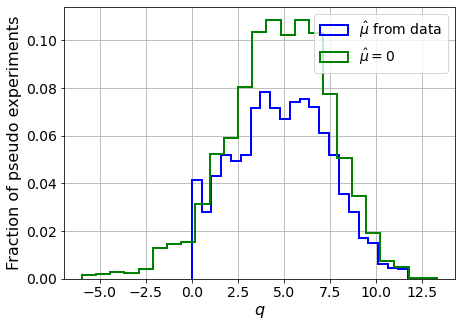

muhat mean:  -0.4048221411722809
Z_bins:  2.2106067210905556
std Z_bins:  0.5693523619522877
Z_bins mu=0:  2.2106067210905556
std Z_bins mu=0:  0.6317530836898391

--------

B_expected:  643
S_expected:  18



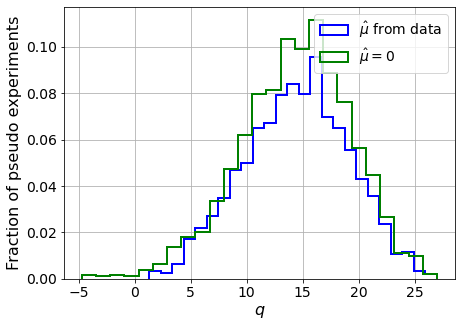

muhat mean:  -0.15428486426117122
Z_bins:  3.823127996176122
std Z_bins:  0.6111774810309094
Z_bins mu=0:  3.823127996176122
std Z_bins mu=0:  0.6435194558238813

--------

B_expected:  643
S_expected:  39



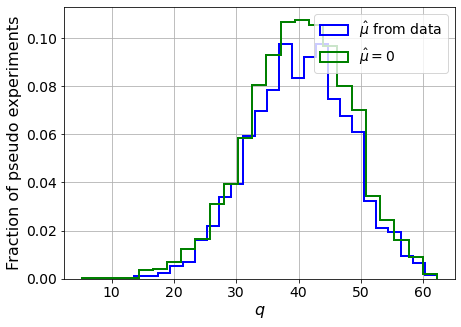

muhat mean:  -0.07152477179780631
Z_bins:  6.357711603555878
std Z_bins:  0.6255423482572463
Z_bins mu=0:  6.357711603555878
std Z_bins mu=0:  0.646435239964715

--------

B_expected:  643
S_expected:  83



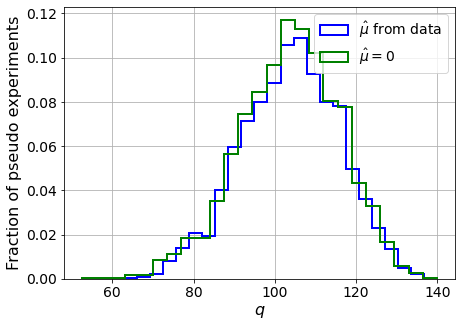

muhat mean:  -0.031189557609153797
Z_bins:  10.209103262915532
std Z_bins:  0.5931813439319541
Z_bins mu=0:  10.209103262915532
std Z_bins mu=0:  0.6072427711028914

--------

B_expected:  643
S_expected:  179



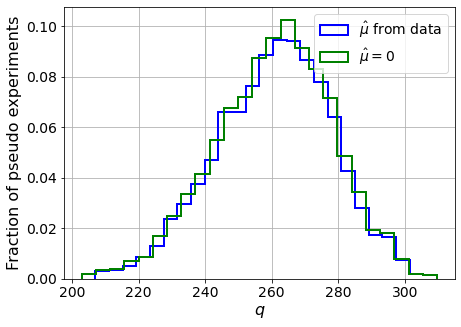

muhat mean:  -0.015983004667100748
Z_bins:  16.18764407907106
std Z_bins:  0.5365890121039286
Z_bins mu=0:  16.18764407907106
std Z_bins mu=0:  0.5449829614658012

--------

B_expected:  643
S_expected:  385



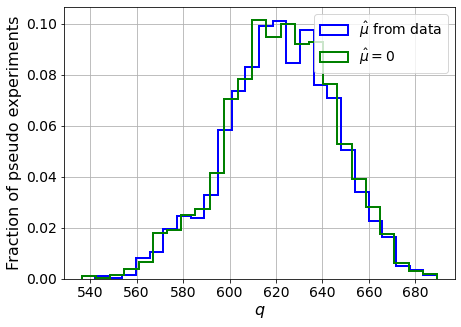

muhat mean:  -0.007839592789980875
Z_bins:  24.95258010420599
std Z_bins:  0.472663877153875
Z_bins mu=0:  24.95258010420599
std Z_bins mu=0:  0.47743331301157305

--------

B_expected:  643
S_expected:  830



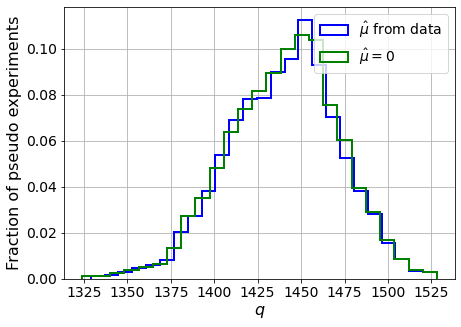

muhat mean:  -0.003470693149781209
Z_bins:  37.97793010138016
std Z_bins:  0.4150426982072995
Z_bins mu=0:  37.97793010138016
std Z_bins mu=0:  0.41785020329024647

--------

B_expected:  643
S_expected:  1787



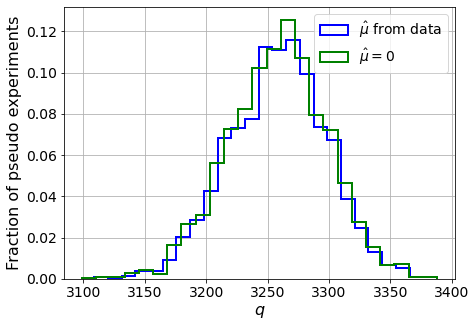

muhat mean:  -0.0016909770799106696
Z_bins:  57.09288933263203
std Z_bins:  0.34939080841193293
Z_bins mu=0:  57.09288933263203
std Z_bins mu=0:  0.35157259832936294

--------


 FINAL RESULT:

[[0.9125505807496691, 0.37528486774365927, -1.3318884360781356, 0.9125505807496691, 0.45815368001540885], [1.4019439890828738, 0.4782943912749513, -0.6560161925825037, 1.4019439890828738, 0.5531269917642571], [2.2106067210905556, 0.5693523619522877, -0.4048221411722809, 2.2106067210905556, 0.6317530836898391], [3.823127996176122, 0.6111774810309094, -0.15428486426117122, 3.823127996176122, 0.6435194558238813], [6.357711603555878, 0.6255423482572463, -0.07152477179780631, 6.357711603555878, 0.646435239964715], [10.209103262915532, 0.5931813439319541, -0.031189557609153797, 10.209103262915532, 0.6072427711028914], [16.18764407907106, 0.5365890121039286, -0.015983004667100748, 16.18764407907106, 0.5449829614658012], [24.95258010420599, 0.472663877153875, -0.007839592789980875, 24.95258010420599, 0.

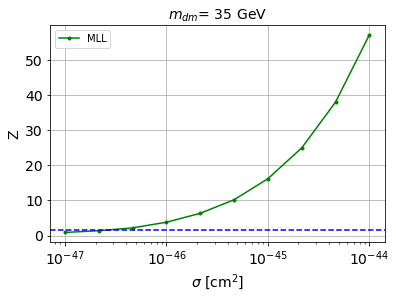


cross_MLL_164:  2.8512616314566154e-47
cross_MLL_164_up:  1.6341453216453923e-47
cross_MLL_164_down:  4.637539752360342e-47

#########################


#########################

mDM =  50 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.s

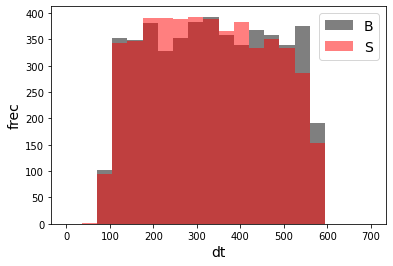

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68555	validation_1-logloss:0.68605
[1]	validation_0-logloss:0.67811	validation_1-logloss:0.67908
[2]	validation_0-logloss:0.67081	validation_1-logloss:0.67219
[3]	validation_0-logloss:0.66367	validation_1-logloss:0.66542
[4]	validation_0-logloss:0.65668	validation_1-logloss:0.65884
[5]	validation_0-logloss:0.64981	validation_1-logloss:0.65232
[6]	validation_0-logloss:0.64304	validation_1-logloss:0.64582
[7]	validation_0-logloss:0.63643	validation_1-logloss:0.63956
[8]	validation_0-logloss:0.62994	validation_1-logloss:0.63345
[9]	validation_0-logloss:0.62357	validation_1-logloss:0.62746
[10]	validation_0-logloss:0.61731	validation_1-logloss:0.62158
[11]	validation_0-logloss:0.61113	validation_1-logloss:0.61568
[12]	validation_0-logloss:0.60509	validation_1-logloss:0.60997
[13]	validation_0-logloss:0.59917	validation_1-logloss:0.60446
[14]	validation_0-logloss:0.59340	validation_1-logloss:0.59900
[15]	validation_0-logloss:0.58769	validation_1-logloss:0.59351
[1

[130]	validation_0-logloss:0.25908	validation_1-logloss:0.29927
[131]	validation_0-logloss:0.25765	validation_1-logloss:0.29809
[132]	validation_0-logloss:0.25629	validation_1-logloss:0.29704
[133]	validation_0-logloss:0.25499	validation_1-logloss:0.29593
[134]	validation_0-logloss:0.25361	validation_1-logloss:0.29481
[135]	validation_0-logloss:0.25226	validation_1-logloss:0.29375
[136]	validation_0-logloss:0.25093	validation_1-logloss:0.29261
[137]	validation_0-logloss:0.24968	validation_1-logloss:0.29166
[138]	validation_0-logloss:0.24842	validation_1-logloss:0.29061
[139]	validation_0-logloss:0.24720	validation_1-logloss:0.28959
[140]	validation_0-logloss:0.24598	validation_1-logloss:0.28859
[141]	validation_0-logloss:0.24470	validation_1-logloss:0.28749
[142]	validation_0-logloss:0.24340	validation_1-logloss:0.28636
[143]	validation_0-logloss:0.24214	validation_1-logloss:0.28535
[144]	validation_0-logloss:0.24097	validation_1-logloss:0.28437
[145]	validation_0-logloss:0.23971	valid

[259]	validation_0-logloss:0.15274	validation_1-logloss:0.22160
[260]	validation_0-logloss:0.15227	validation_1-logloss:0.22131
[261]	validation_0-logloss:0.15183	validation_1-logloss:0.22100
[262]	validation_0-logloss:0.15137	validation_1-logloss:0.22078
[263]	validation_0-logloss:0.15096	validation_1-logloss:0.22047
[264]	validation_0-logloss:0.15048	validation_1-logloss:0.22014
[265]	validation_0-logloss:0.15002	validation_1-logloss:0.21981
[266]	validation_0-logloss:0.14955	validation_1-logloss:0.21953
[267]	validation_0-logloss:0.14911	validation_1-logloss:0.21929
[268]	validation_0-logloss:0.14859	validation_1-logloss:0.21891
[269]	validation_0-logloss:0.14813	validation_1-logloss:0.21858
[270]	validation_0-logloss:0.14775	validation_1-logloss:0.21836
[271]	validation_0-logloss:0.14732	validation_1-logloss:0.21813
[272]	validation_0-logloss:0.14683	validation_1-logloss:0.21782
[273]	validation_0-logloss:0.14641	validation_1-logloss:0.21756
[274]	validation_0-logloss:0.14604	valid

[388]	validation_0-logloss:0.10929	validation_1-logloss:0.20135
[389]	validation_0-logloss:0.10902	validation_1-logloss:0.20120
[390]	validation_0-logloss:0.10879	validation_1-logloss:0.20112
[391]	validation_0-logloss:0.10854	validation_1-logloss:0.20099
[392]	validation_0-logloss:0.10828	validation_1-logloss:0.20105
[393]	validation_0-logloss:0.10804	validation_1-logloss:0.20088
[394]	validation_0-logloss:0.10784	validation_1-logloss:0.20078
[395]	validation_0-logloss:0.10763	validation_1-logloss:0.20072
[396]	validation_0-logloss:0.10739	validation_1-logloss:0.20066
[397]	validation_0-logloss:0.10717	validation_1-logloss:0.20059
[398]	validation_0-logloss:0.10694	validation_1-logloss:0.20052
[399]	validation_0-logloss:0.10671	validation_1-logloss:0.20045
[400]	validation_0-logloss:0.10644	validation_1-logloss:0.20049
[401]	validation_0-logloss:0.10619	validation_1-logloss:0.20034
[402]	validation_0-logloss:0.10600	validation_1-logloss:0.20026
[403]	validation_0-logloss:0.10579	valid

[517]	validation_0-logloss:0.08385	validation_1-logloss:0.19473
[518]	validation_0-logloss:0.08372	validation_1-logloss:0.19471
[519]	validation_0-logloss:0.08358	validation_1-logloss:0.19473
[520]	validation_0-logloss:0.08341	validation_1-logloss:0.19468
[521]	validation_0-logloss:0.08328	validation_1-logloss:0.19465
[522]	validation_0-logloss:0.08312	validation_1-logloss:0.19462
[523]	validation_0-logloss:0.08300	validation_1-logloss:0.19461
[524]	validation_0-logloss:0.08283	validation_1-logloss:0.19453
[525]	validation_0-logloss:0.08270	validation_1-logloss:0.19450
[526]	validation_0-logloss:0.08247	validation_1-logloss:0.19445
[527]	validation_0-logloss:0.08228	validation_1-logloss:0.19447
[528]	validation_0-logloss:0.08217	validation_1-logloss:0.19446
[529]	validation_0-logloss:0.08204	validation_1-logloss:0.19445
[530]	validation_0-logloss:0.08187	validation_1-logloss:0.19445
[531]	validation_0-logloss:0.08171	validation_1-logloss:0.19440
[532]	validation_0-logloss:0.08149	valid

[646]	validation_0-logloss:0.06743	validation_1-logloss:0.19115
[647]	validation_0-logloss:0.06737	validation_1-logloss:0.19116
[648]	validation_0-logloss:0.06726	validation_1-logloss:0.19111
[649]	validation_0-logloss:0.06712	validation_1-logloss:0.19108
[650]	validation_0-logloss:0.06702	validation_1-logloss:0.19107
[651]	validation_0-logloss:0.06693	validation_1-logloss:0.19103
[652]	validation_0-logloss:0.06687	validation_1-logloss:0.19103
[653]	validation_0-logloss:0.06679	validation_1-logloss:0.19101
[654]	validation_0-logloss:0.06667	validation_1-logloss:0.19095
[655]	validation_0-logloss:0.06656	validation_1-logloss:0.19093
[656]	validation_0-logloss:0.06648	validation_1-logloss:0.19090
[657]	validation_0-logloss:0.06637	validation_1-logloss:0.19093
[658]	validation_0-logloss:0.06624	validation_1-logloss:0.19089
[659]	validation_0-logloss:0.06617	validation_1-logloss:0.19084
[660]	validation_0-logloss:0.06606	validation_1-logloss:0.19085
[661]	validation_0-logloss:0.06597	valid

[775]	validation_0-logloss:0.05637	validation_1-logloss:0.18987
[776]	validation_0-logloss:0.05633	validation_1-logloss:0.18988
[777]	validation_0-logloss:0.05624	validation_1-logloss:0.18992
[778]	validation_0-logloss:0.05613	validation_1-logloss:0.18994
[779]	validation_0-logloss:0.05607	validation_1-logloss:0.18997
[780]	validation_0-logloss:0.05599	validation_1-logloss:0.18988
[781]	validation_0-logloss:0.05586	validation_1-logloss:0.18991
[782]	validation_0-logloss:0.05581	validation_1-logloss:0.18985
[783]	validation_0-logloss:0.05574	validation_1-logloss:0.18987
[784]	validation_0-logloss:0.05564	validation_1-logloss:0.18984
[785]	validation_0-logloss:0.05557	validation_1-logloss:0.18987
[786]	validation_0-logloss:0.05552	validation_1-logloss:0.18988
[787]	validation_0-logloss:0.05545	validation_1-logloss:0.18990
[788]	validation_0-logloss:0.05539	validation_1-logloss:0.18993
[789]	validation_0-logloss:0.05532	validation_1-logloss:0.18989
[790]	validation_0-logloss:0.05524	valid

[904]	validation_0-logloss:0.04680	validation_1-logloss:0.18964
[905]	validation_0-logloss:0.04672	validation_1-logloss:0.18967
[906]	validation_0-logloss:0.04664	validation_1-logloss:0.18970
[907]	validation_0-logloss:0.04658	validation_1-logloss:0.18971
[908]	validation_0-logloss:0.04650	validation_1-logloss:0.18977
[909]	validation_0-logloss:0.04643	validation_1-logloss:0.18983
[910]	validation_0-logloss:0.04633	validation_1-logloss:0.18983
[911]	validation_0-logloss:0.04628	validation_1-logloss:0.18982
[912]	validation_0-logloss:0.04622	validation_1-logloss:0.18982
[913]	validation_0-logloss:0.04615	validation_1-logloss:0.18987
[914]	validation_0-logloss:0.04611	validation_1-logloss:0.18988
[915]	validation_0-logloss:0.04607	validation_1-logloss:0.18985
[916]	validation_0-logloss:0.04599	validation_1-logloss:0.18981
[917]	validation_0-logloss:0.04591	validation_1-logloss:0.18982
[918]	validation_0-logloss:0.04584	validation_1-logloss:0.18985
[919]	validation_0-logloss:0.04579	valid

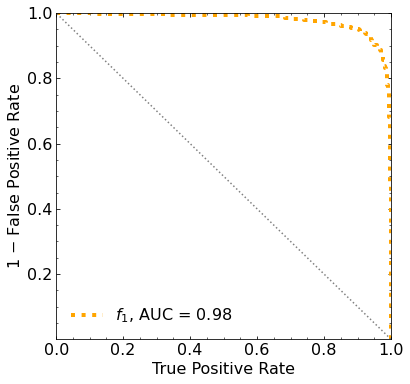

Classification score:


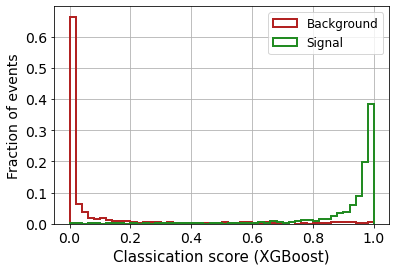


 ROC-AUC =  0.9788504087025998


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 277.60341141 222.28285654
 165.18851721 102.66672281  34.76162585 -34.46003951 -99.85142815]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 301.58748587 281.51359453 253.212784   217.97555075
 172

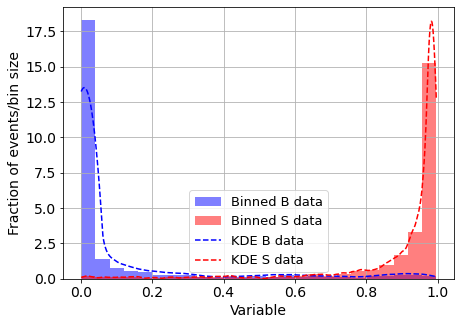

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



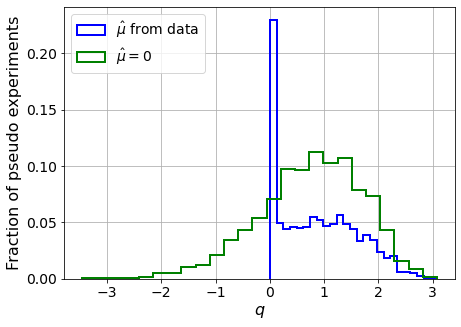

muhat mean:  -1.3694241178377102
Z_bins:  0.9079706812938763
std Z_bins:  0.39912641390138287
Z_bins mu=0:  0.9079706812938763
std Z_bins mu=0:  0.5293438511159592

--------

B_expected:  643
S_expected:  4



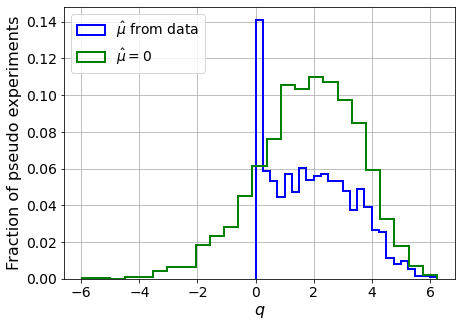

muhat mean:  -0.708887982291539
Z_bins:  1.387001995061477
std Z_bins:  0.5095864670317654
Z_bins mu=0:  1.387001995061477
std Z_bins mu=0:  0.6271002710600526

--------

B_expected:  643
S_expected:  9



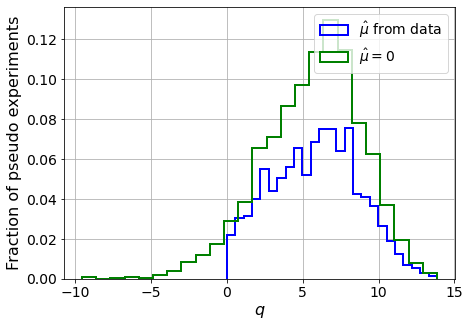

muhat mean:  -0.3757827868828433
Z_bins:  2.44802109742818
std Z_bins:  0.585753605184748
Z_bins mu=0:  2.44802109742818
std Z_bins mu=0:  0.663118645099271

--------

B_expected:  643
S_expected:  19



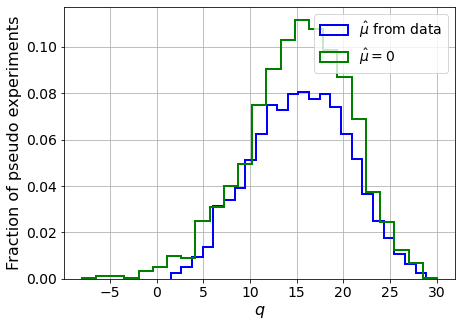

muhat mean:  -0.1564670868622019
Z_bins:  3.9484288551259015
std Z_bins:  0.6475190078696146
Z_bins mu=0:  3.9484288551259015
std Z_bins mu=0:  0.7035024553330602

--------

B_expected:  643
S_expected:  41



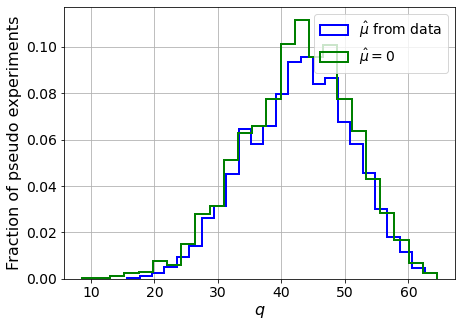

muhat mean:  -0.07164605198201665
Z_bins:  6.566260071609091
std Z_bins:  0.6240151071538728
Z_bins mu=0:  6.566260071609091
std Z_bins mu=0:  0.6518139776830059

--------

B_expected:  643
S_expected:  89



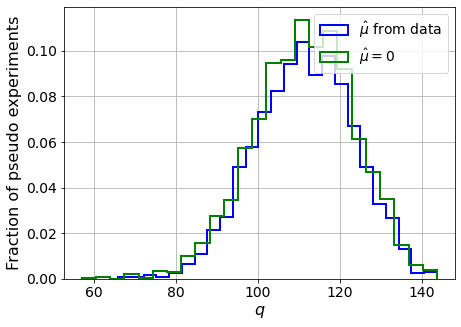

muhat mean:  -0.036599551488336164
Z_bins:  10.568365879130756
std Z_bins:  0.5649182678337027
Z_bins mu=0:  10.568365879130756
std Z_bins mu=0:  0.5811229762731726

--------

B_expected:  643
S_expected:  192



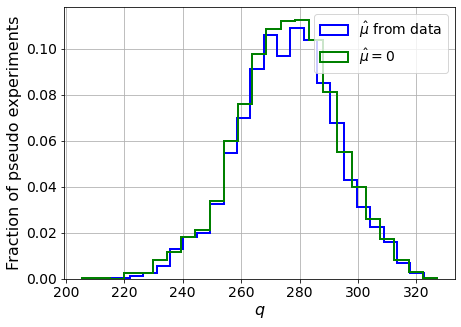

muhat mean:  -0.016040865557356565
Z_bins:  16.62366419560111
std Z_bins:  0.5066673496411126
Z_bins mu=0:  16.62199966153479
std Z_bins mu=0:  0.5166773059572163

--------

B_expected:  643
S_expected:  413



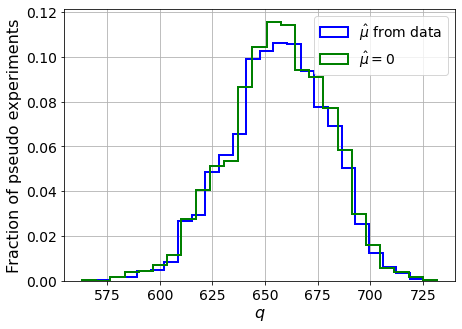

muhat mean:  -0.007446984697629589
Z_bins:  25.630576071596998
std Z_bins:  0.4588193947854137
Z_bins mu=0:  25.630383838941512
std Z_bins mu=0:  0.4649573467631556

--------

B_expected:  643
S_expected:  889



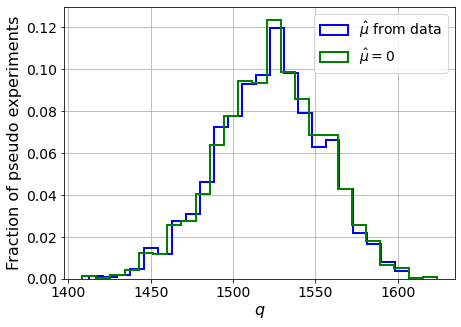

muhat mean:  -0.003539415054015647
Z_bins:  39.030760734230036
std Z_bins:  0.4112948121017364
Z_bins mu=0:  39.0306172075445
std Z_bins mu=0:  0.41495994016118143

--------

B_expected:  643
S_expected:  1915



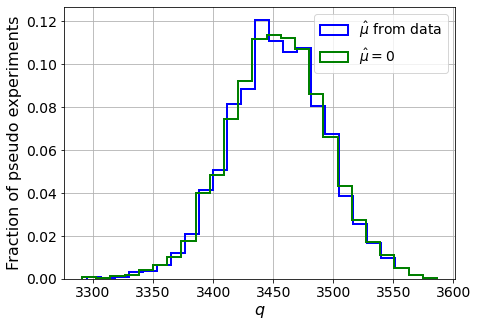

muhat mean:  -0.0015542022277080006
Z_bins:  58.77190596539225
std Z_bins:  0.34460785271401806
Z_bins mu=0:  58.771085843938174
std Z_bins mu=0:  0.34708435235830826

--------


 FINAL RESULT:

[[0.9079706812938763, 0.39912641390138287, -1.3694241178377102, 0.9079706812938763, 0.5293438511159592], [1.387001995061477, 0.5095864670317654, -0.708887982291539, 1.387001995061477, 0.6271002710600526], [2.44802109742818, 0.585753605184748, -0.3757827868828433, 2.44802109742818, 0.663118645099271], [3.9484288551259015, 0.6475190078696146, -0.1564670868622019, 3.9484288551259015, 0.7035024553330602], [6.566260071609091, 0.6240151071538728, -0.07164605198201665, 6.566260071609091, 0.6518139776830059], [10.568365879130756, 0.5649182678337027, -0.036599551488336164, 10.568365879130756, 0.5811229762731726], [16.62366419560111, 0.5066673496411126, -0.016040865557356565, 16.62199966153479, 0.5166773059572163], [25.630576071596998, 0.4588193947854137, -0.007446984697629589, 25.630383838941512, 0.4649

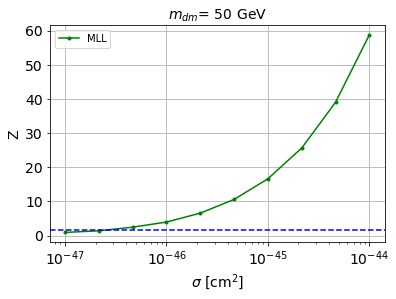


cross_MLL_164:  2.685319955722114e-47
cross_MLL_164_up:  1.6773547990603008e-47
cross_MLL_164_down:  3.998276547003215e-47

#########################


#########################

mDM =  100 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.s

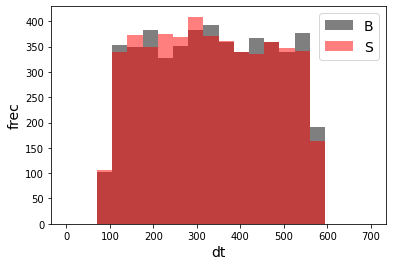

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68608	validation_1-logloss:0.68664
[1]	validation_0-logloss:0.67917	validation_1-logloss:0.68029
[2]	validation_0-logloss:0.67241	validation_1-logloss:0.67410
[3]	validation_0-logloss:0.66577	validation_1-logloss:0.66803
[4]	validation_0-logloss:0.65925	validation_1-logloss:0.66203
[5]	validation_0-logloss:0.65286	validation_1-logloss:0.65611
[6]	validation_0-logloss:0.64659	validation_1-logloss:0.65039
[7]	validation_0-logloss:0.64045	validation_1-logloss:0.64470
[8]	validation_0-logloss:0.63440	validation_1-logloss:0.63914
[9]	validation_0-logloss:0.62842	validation_1-logloss:0.63360
[10]	validation_0-logloss:0.62251	validation_1-logloss:0.62821
[11]	validation_0-logloss:0.61677	validation_1-logloss:0.62294
[12]	validation_0-logloss:0.61104	validation_1-logloss:0.61767
[13]	validation_0-logloss:0.60554	validation_1-logloss:0.61265
[14]	validation_0-logloss:0.60000	validation_1-logloss:0.60747
[15]	validation_0-logloss:0.59469	validation_1-logloss:0.60256
[1

[130]	validation_0-logloss:0.28066	validation_1-logloss:0.32397
[131]	validation_0-logloss:0.27925	validation_1-logloss:0.32280
[132]	validation_0-logloss:0.27793	validation_1-logloss:0.32180
[133]	validation_0-logloss:0.27654	validation_1-logloss:0.32075
[134]	validation_0-logloss:0.27521	validation_1-logloss:0.31964
[135]	validation_0-logloss:0.27390	validation_1-logloss:0.31858
[136]	validation_0-logloss:0.27258	validation_1-logloss:0.31759
[137]	validation_0-logloss:0.27127	validation_1-logloss:0.31657
[138]	validation_0-logloss:0.27001	validation_1-logloss:0.31555
[139]	validation_0-logloss:0.26877	validation_1-logloss:0.31452
[140]	validation_0-logloss:0.26750	validation_1-logloss:0.31347
[141]	validation_0-logloss:0.26625	validation_1-logloss:0.31257
[142]	validation_0-logloss:0.26504	validation_1-logloss:0.31169
[143]	validation_0-logloss:0.26387	validation_1-logloss:0.31080
[144]	validation_0-logloss:0.26267	validation_1-logloss:0.30990
[145]	validation_0-logloss:0.26151	valid

[259]	validation_0-logloss:0.17569	validation_1-logloss:0.24410
[260]	validation_0-logloss:0.17521	validation_1-logloss:0.24382
[261]	validation_0-logloss:0.17471	validation_1-logloss:0.24341
[262]	validation_0-logloss:0.17425	validation_1-logloss:0.24314
[263]	validation_0-logloss:0.17377	validation_1-logloss:0.24276
[264]	validation_0-logloss:0.17330	validation_1-logloss:0.24249
[265]	validation_0-logloss:0.17279	validation_1-logloss:0.24220
[266]	validation_0-logloss:0.17234	validation_1-logloss:0.24194
[267]	validation_0-logloss:0.17186	validation_1-logloss:0.24157
[268]	validation_0-logloss:0.17144	validation_1-logloss:0.24133
[269]	validation_0-logloss:0.17096	validation_1-logloss:0.24097
[270]	validation_0-logloss:0.17052	validation_1-logloss:0.24071
[271]	validation_0-logloss:0.17004	validation_1-logloss:0.24040
[272]	validation_0-logloss:0.16953	validation_1-logloss:0.24010
[273]	validation_0-logloss:0.16910	validation_1-logloss:0.23989
[274]	validation_0-logloss:0.16866	valid

[388]	validation_0-logloss:0.13068	validation_1-logloss:0.22183
[389]	validation_0-logloss:0.13041	validation_1-logloss:0.22173
[390]	validation_0-logloss:0.13015	validation_1-logloss:0.22162
[391]	validation_0-logloss:0.12990	validation_1-logloss:0.22153
[392]	validation_0-logloss:0.12966	validation_1-logloss:0.22140
[393]	validation_0-logloss:0.12936	validation_1-logloss:0.22123
[394]	validation_0-logloss:0.12909	validation_1-logloss:0.22120
[395]	validation_0-logloss:0.12885	validation_1-logloss:0.22107
[396]	validation_0-logloss:0.12859	validation_1-logloss:0.22096
[397]	validation_0-logloss:0.12834	validation_1-logloss:0.22084
[398]	validation_0-logloss:0.12808	validation_1-logloss:0.22078
[399]	validation_0-logloss:0.12784	validation_1-logloss:0.22070
[400]	validation_0-logloss:0.12766	validation_1-logloss:0.22063
[401]	validation_0-logloss:0.12740	validation_1-logloss:0.22059
[402]	validation_0-logloss:0.12716	validation_1-logloss:0.22050
[403]	validation_0-logloss:0.12692	valid

[517]	validation_0-logloss:0.10334	validation_1-logloss:0.21326
[518]	validation_0-logloss:0.10316	validation_1-logloss:0.21324
[519]	validation_0-logloss:0.10307	validation_1-logloss:0.21320
[520]	validation_0-logloss:0.10293	validation_1-logloss:0.21320
[521]	validation_0-logloss:0.10283	validation_1-logloss:0.21314
[522]	validation_0-logloss:0.10266	validation_1-logloss:0.21317
[523]	validation_0-logloss:0.10253	validation_1-logloss:0.21315
[524]	validation_0-logloss:0.10233	validation_1-logloss:0.21310
[525]	validation_0-logloss:0.10216	validation_1-logloss:0.21307
[526]	validation_0-logloss:0.10203	validation_1-logloss:0.21305
[527]	validation_0-logloss:0.10186	validation_1-logloss:0.21303
[528]	validation_0-logloss:0.10177	validation_1-logloss:0.21300
[529]	validation_0-logloss:0.10164	validation_1-logloss:0.21299
[530]	validation_0-logloss:0.10154	validation_1-logloss:0.21294
[531]	validation_0-logloss:0.10135	validation_1-logloss:0.21292
[532]	validation_0-logloss:0.10113	valid

[646]	validation_0-logloss:0.08487	validation_1-logloss:0.20892
[647]	validation_0-logloss:0.08471	validation_1-logloss:0.20896
[648]	validation_0-logloss:0.08460	validation_1-logloss:0.20898
[649]	validation_0-logloss:0.08448	validation_1-logloss:0.20898
[650]	validation_0-logloss:0.08436	validation_1-logloss:0.20901
[651]	validation_0-logloss:0.08425	validation_1-logloss:0.20898
[652]	validation_0-logloss:0.08415	validation_1-logloss:0.20899
[653]	validation_0-logloss:0.08399	validation_1-logloss:0.20894
[654]	validation_0-logloss:0.08393	validation_1-logloss:0.20892
[655]	validation_0-logloss:0.08385	validation_1-logloss:0.20891
[656]	validation_0-logloss:0.08373	validation_1-logloss:0.20891
[657]	validation_0-logloss:0.08363	validation_1-logloss:0.20889
[658]	validation_0-logloss:0.08352	validation_1-logloss:0.20885
[659]	validation_0-logloss:0.08342	validation_1-logloss:0.20883
[660]	validation_0-logloss:0.08329	validation_1-logloss:0.20887
[661]	validation_0-logloss:0.08317	valid

[775]	validation_0-logloss:0.07107	validation_1-logloss:0.20753
[776]	validation_0-logloss:0.07099	validation_1-logloss:0.20752
[777]	validation_0-logloss:0.07092	validation_1-logloss:0.20750
[778]	validation_0-logloss:0.07083	validation_1-logloss:0.20745
[779]	validation_0-logloss:0.07071	validation_1-logloss:0.20747
[780]	validation_0-logloss:0.07058	validation_1-logloss:0.20743
[781]	validation_0-logloss:0.07049	validation_1-logloss:0.20743
[782]	validation_0-logloss:0.07044	validation_1-logloss:0.20745
[783]	validation_0-logloss:0.07036	validation_1-logloss:0.20743
[784]	validation_0-logloss:0.07029	validation_1-logloss:0.20741
[785]	validation_0-logloss:0.07018	validation_1-logloss:0.20735
[786]	validation_0-logloss:0.07006	validation_1-logloss:0.20731
[787]	validation_0-logloss:0.07000	validation_1-logloss:0.20730
[788]	validation_0-logloss:0.06993	validation_1-logloss:0.20728
[789]	validation_0-logloss:0.06982	validation_1-logloss:0.20727
[790]	validation_0-logloss:0.06975	valid

[904]	validation_0-logloss:0.06083	validation_1-logloss:0.20577
[905]	validation_0-logloss:0.06075	validation_1-logloss:0.20574
[906]	validation_0-logloss:0.06068	validation_1-logloss:0.20568
[907]	validation_0-logloss:0.06060	validation_1-logloss:0.20567
[908]	validation_0-logloss:0.06052	validation_1-logloss:0.20560
[909]	validation_0-logloss:0.06048	validation_1-logloss:0.20559
[910]	validation_0-logloss:0.06042	validation_1-logloss:0.20556
[911]	validation_0-logloss:0.06034	validation_1-logloss:0.20552
[912]	validation_0-logloss:0.06026	validation_1-logloss:0.20554
[913]	validation_0-logloss:0.06016	validation_1-logloss:0.20550
[914]	validation_0-logloss:0.06007	validation_1-logloss:0.20551
[915]	validation_0-logloss:0.05998	validation_1-logloss:0.20551
[916]	validation_0-logloss:0.05992	validation_1-logloss:0.20549
[917]	validation_0-logloss:0.05981	validation_1-logloss:0.20548
[918]	validation_0-logloss:0.05975	validation_1-logloss:0.20544
[919]	validation_0-logloss:0.05967	valid

[1032]	validation_0-logloss:0.05239	validation_1-logloss:0.20450
[1033]	validation_0-logloss:0.05232	validation_1-logloss:0.20445
[1034]	validation_0-logloss:0.05223	validation_1-logloss:0.20444
[1035]	validation_0-logloss:0.05217	validation_1-logloss:0.20445
[1036]	validation_0-logloss:0.05211	validation_1-logloss:0.20447
[1037]	validation_0-logloss:0.05208	validation_1-logloss:0.20443
[1038]	validation_0-logloss:0.05205	validation_1-logloss:0.20439
[1039]	validation_0-logloss:0.05199	validation_1-logloss:0.20438
[1040]	validation_0-logloss:0.05193	validation_1-logloss:0.20438
[1041]	validation_0-logloss:0.05187	validation_1-logloss:0.20434
[1042]	validation_0-logloss:0.05184	validation_1-logloss:0.20433
[1043]	validation_0-logloss:0.05180	validation_1-logloss:0.20430
[1044]	validation_0-logloss:0.05171	validation_1-logloss:0.20429
[1045]	validation_0-logloss:0.05167	validation_1-logloss:0.20430
[1046]	validation_0-logloss:0.05161	validation_1-logloss:0.20430
[1047]	validation_0-loglo

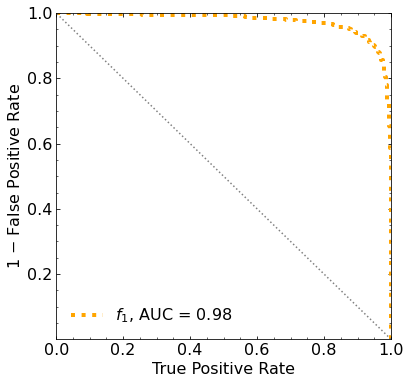

Classification score:


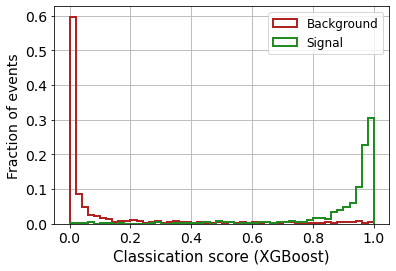


 ROC-AUC =  0.9755104941306619


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  356.40801305  326.6618411   291.82664695  250.63386801  201.2567342
  147.61233723   88.93112934   26.07392638  -39.27527382 -101.55456609]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 271.72860248 247.9271464

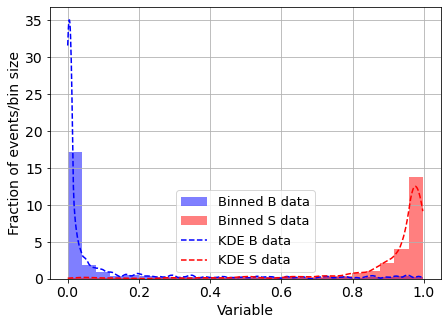

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



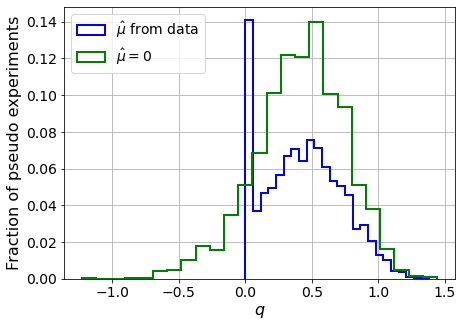

muhat mean:  -5.7539523560556205
Z_bins:  0.6562441491726895
std Z_bins:  0.2228699086464191
Z_bins mu=0:  0.6562441491726895
std Z_bins mu=0:  0.25947241406201293

--------

B_expected:  643
S_expected:  3



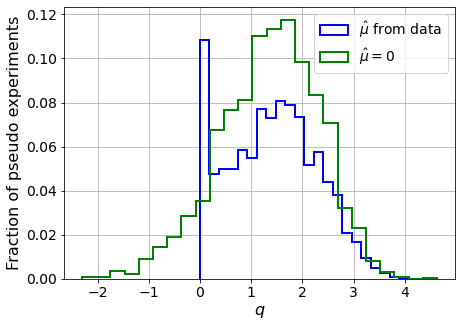

muhat mean:  -1.846993874780848
Z_bins:  1.1909232313332183
std Z_bins:  0.3652396881179808
Z_bins mu=0:  1.1909232313332183
std Z_bins mu=0:  0.407997388780188

--------

B_expected:  643
S_expected:  6



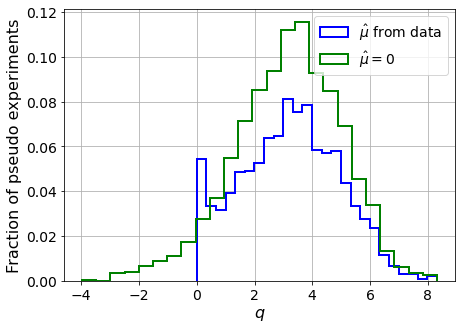

muhat mean:  -0.9396021132508287
Z_bins:  1.8058780302234376
std Z_bins:  0.471094637842417
Z_bins mu=0:  1.8058780302234376
std Z_bins mu=0:  0.5121254305153989

--------

B_expected:  643
S_expected:  14



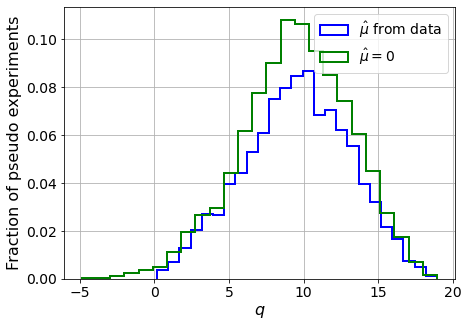

muhat mean:  -0.42373929675742134
Z_bins:  3.093459722169259
std Z_bins:  0.5691253896774527
Z_bins mu=0:  3.093459722169259
std Z_bins mu=0:  0.5893649516779307

--------

B_expected:  643
S_expected:  30



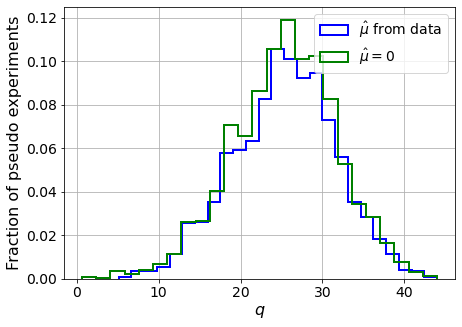

muhat mean:  -0.18806658138788093
Z_bins:  5.061403297809498
std Z_bins:  0.6200213857957876
Z_bins mu=0:  5.061403297809498
std Z_bins mu=0:  0.6345305374699295

--------

B_expected:  643
S_expected:  65



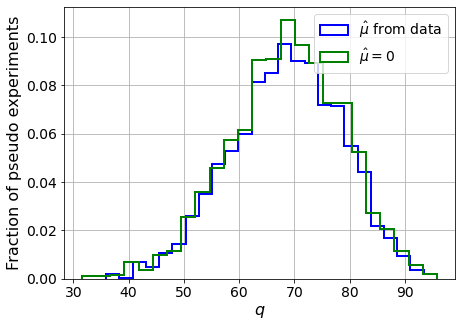

muhat mean:  -0.08675688734077737
Z_bins:  8.293168737404475
std Z_bins:  0.6083189426086288
Z_bins mu=0:  8.293168737404475
std Z_bins mu=0:  0.6161279534930891

--------

B_expected:  643
S_expected:  139



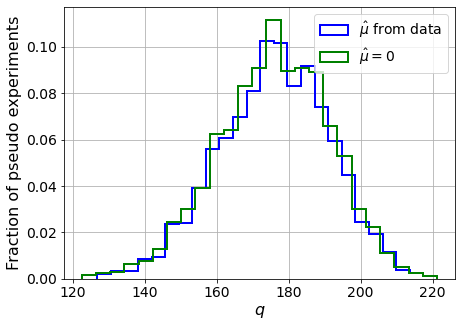

muhat mean:  -0.03981119001880511
Z_bins:  13.285774148929047
std Z_bins:  0.5794381455599519
Z_bins mu=0:  13.285774148929047
std Z_bins mu=0:  0.5850110057322407

--------

B_expected:  643
S_expected:  300



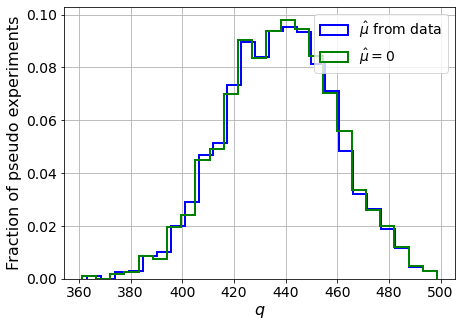

muhat mean:  -0.020155174743276872
Z_bins:  20.934921797345556
std Z_bins:  0.5184540953569061
Z_bins mu=0:  20.934921797345556
std Z_bins mu=0:  0.5204264902067461

--------

B_expected:  643
S_expected:  645



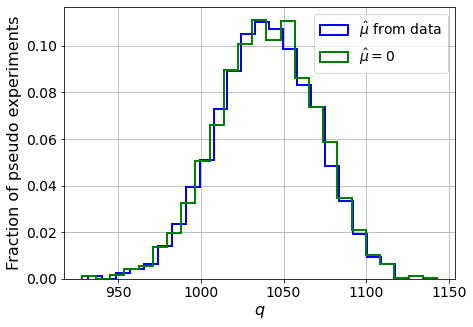

muhat mean:  -0.009206738892512669
Z_bins:  32.24986219255505
std Z_bins:  0.46579575253161587
Z_bins mu=0:  32.24986219255505
std Z_bins mu=0:  0.4673104466755021

--------

B_expected:  643
S_expected:  1390



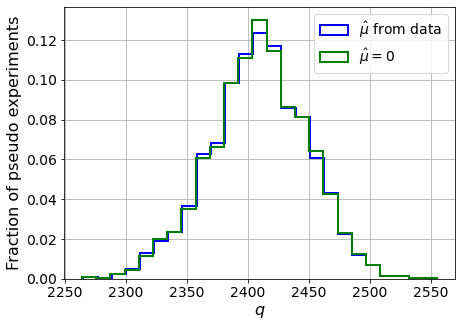

muhat mean:  -0.004174861091966081
Z_bins:  49.08505954336215
std Z_bins:  0.40636683420900455
Z_bins mu=0:  49.08505954336215
std Z_bins mu=0:  0.4073908852324805

--------


 FINAL RESULT:

[[0.6562441491726895, 0.2228699086464191, -5.7539523560556205, 0.6562441491726895, 0.25947241406201293], [1.1909232313332183, 0.3652396881179808, -1.846993874780848, 1.1909232313332183, 0.407997388780188], [1.8058780302234376, 0.471094637842417, -0.9396021132508287, 1.8058780302234376, 0.5121254305153989], [3.093459722169259, 0.5691253896774527, -0.42373929675742134, 3.093459722169259, 0.5893649516779307], [5.061403297809498, 0.6200213857957876, -0.18806658138788093, 5.061403297809498, 0.6345305374699295], [8.293168737404475, 0.6083189426086288, -0.08675688734077737, 8.293168737404475, 0.6161279534930891], [13.285774148929047, 0.5794381455599519, -0.03981119001880511, 13.285774148929047, 0.5850110057322407], [20.934921797345556, 0.5184540953569061, -0.020155174743276872, 20.934921797345556, 0.5204

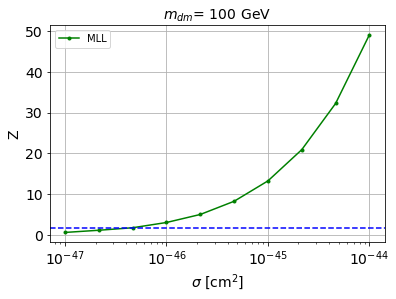


cross_MLL_164:  3.9850773476459964e-47
cross_MLL_164_up:  2.382464195375628e-47
cross_MLL_164_down:  5.950990831997114e-47

#########################


#########################

mDM =  200 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.s

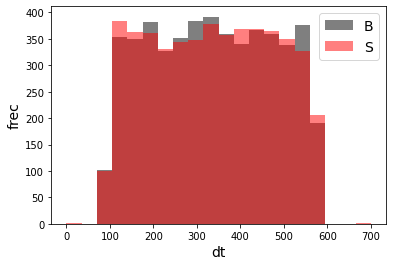

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68628	validation_1-logloss:0.68689
[1]	validation_0-logloss:0.67954	validation_1-logloss:0.68076
[2]	validation_0-logloss:0.67294	validation_1-logloss:0.67468
[3]	validation_0-logloss:0.66643	validation_1-logloss:0.66858
[4]	validation_0-logloss:0.66007	validation_1-logloss:0.66278
[5]	validation_0-logloss:0.65383	validation_1-logloss:0.65692
[6]	validation_0-logloss:0.64769	validation_1-logloss:0.65128
[7]	validation_0-logloss:0.64165	validation_1-logloss:0.64557
[8]	validation_0-logloss:0.63574	validation_1-logloss:0.64019
[9]	validation_0-logloss:0.62992	validation_1-logloss:0.63492
[10]	validation_0-logloss:0.62422	validation_1-logloss:0.62967
[11]	validation_0-logloss:0.61858	validation_1-logloss:0.62453
[12]	validation_0-logloss:0.61309	validation_1-logloss:0.61957
[13]	validation_0-logloss:0.60765	validation_1-logloss:0.61450
[14]	validation_0-logloss:0.60232	validation_1-logloss:0.60954
[15]	validation_0-logloss:0.59711	validation_1-logloss:0.60489
[1

[130]	validation_0-logloss:0.28866	validation_1-logloss:0.33653
[131]	validation_0-logloss:0.28734	validation_1-logloss:0.33555
[132]	validation_0-logloss:0.28605	validation_1-logloss:0.33457
[133]	validation_0-logloss:0.28475	validation_1-logloss:0.33367
[134]	validation_0-logloss:0.28341	validation_1-logloss:0.33255
[135]	validation_0-logloss:0.28219	validation_1-logloss:0.33158
[136]	validation_0-logloss:0.28098	validation_1-logloss:0.33060
[137]	validation_0-logloss:0.27969	validation_1-logloss:0.32957
[138]	validation_0-logloss:0.27853	validation_1-logloss:0.32865
[139]	validation_0-logloss:0.27730	validation_1-logloss:0.32764
[140]	validation_0-logloss:0.27609	validation_1-logloss:0.32668
[141]	validation_0-logloss:0.27490	validation_1-logloss:0.32575
[142]	validation_0-logloss:0.27365	validation_1-logloss:0.32467
[143]	validation_0-logloss:0.27253	validation_1-logloss:0.32377
[144]	validation_0-logloss:0.27137	validation_1-logloss:0.32290
[145]	validation_0-logloss:0.27026	valid

[259]	validation_0-logloss:0.18267	validation_1-logloss:0.26203
[260]	validation_0-logloss:0.18210	validation_1-logloss:0.26170
[261]	validation_0-logloss:0.18166	validation_1-logloss:0.26143
[262]	validation_0-logloss:0.18118	validation_1-logloss:0.26121
[263]	validation_0-logloss:0.18072	validation_1-logloss:0.26091
[264]	validation_0-logloss:0.18024	validation_1-logloss:0.26065
[265]	validation_0-logloss:0.17971	validation_1-logloss:0.26034
[266]	validation_0-logloss:0.17928	validation_1-logloss:0.26015
[267]	validation_0-logloss:0.17881	validation_1-logloss:0.25998
[268]	validation_0-logloss:0.17834	validation_1-logloss:0.25978
[269]	validation_0-logloss:0.17785	validation_1-logloss:0.25951
[270]	validation_0-logloss:0.17743	validation_1-logloss:0.25923
[271]	validation_0-logloss:0.17700	validation_1-logloss:0.25899
[272]	validation_0-logloss:0.17652	validation_1-logloss:0.25882
[273]	validation_0-logloss:0.17605	validation_1-logloss:0.25858
[274]	validation_0-logloss:0.17562	valid

[388]	validation_0-logloss:0.13675	validation_1-logloss:0.24258
[389]	validation_0-logloss:0.13645	validation_1-logloss:0.24247
[390]	validation_0-logloss:0.13617	validation_1-logloss:0.24242
[391]	validation_0-logloss:0.13596	validation_1-logloss:0.24231
[392]	validation_0-logloss:0.13569	validation_1-logloss:0.24229
[393]	validation_0-logloss:0.13543	validation_1-logloss:0.24228
[394]	validation_0-logloss:0.13517	validation_1-logloss:0.24231
[395]	validation_0-logloss:0.13486	validation_1-logloss:0.24226
[396]	validation_0-logloss:0.13461	validation_1-logloss:0.24226
[397]	validation_0-logloss:0.13432	validation_1-logloss:0.24219
[398]	validation_0-logloss:0.13411	validation_1-logloss:0.24204
[399]	validation_0-logloss:0.13383	validation_1-logloss:0.24210
[400]	validation_0-logloss:0.13358	validation_1-logloss:0.24204
[401]	validation_0-logloss:0.13326	validation_1-logloss:0.24202
[402]	validation_0-logloss:0.13297	validation_1-logloss:0.24193
[403]	validation_0-logloss:0.13277	valid

[517]	validation_0-logloss:0.10794	validation_1-logloss:0.23796
[518]	validation_0-logloss:0.10774	validation_1-logloss:0.23800
[519]	validation_0-logloss:0.10756	validation_1-logloss:0.23792
[520]	validation_0-logloss:0.10739	validation_1-logloss:0.23790
[521]	validation_0-logloss:0.10721	validation_1-logloss:0.23783
[522]	validation_0-logloss:0.10704	validation_1-logloss:0.23777
[523]	validation_0-logloss:0.10689	validation_1-logloss:0.23762
[524]	validation_0-logloss:0.10674	validation_1-logloss:0.23755
[525]	validation_0-logloss:0.10649	validation_1-logloss:0.23754
[526]	validation_0-logloss:0.10631	validation_1-logloss:0.23748
[527]	validation_0-logloss:0.10615	validation_1-logloss:0.23744
[528]	validation_0-logloss:0.10598	validation_1-logloss:0.23741
[529]	validation_0-logloss:0.10582	validation_1-logloss:0.23737
[530]	validation_0-logloss:0.10561	validation_1-logloss:0.23727
[531]	validation_0-logloss:0.10545	validation_1-logloss:0.23718
[532]	validation_0-logloss:0.10531	valid

[646]	validation_0-logloss:0.08910	validation_1-logloss:0.23437
[647]	validation_0-logloss:0.08896	validation_1-logloss:0.23434
[648]	validation_0-logloss:0.08880	validation_1-logloss:0.23427
[649]	validation_0-logloss:0.08868	validation_1-logloss:0.23424
[650]	validation_0-logloss:0.08856	validation_1-logloss:0.23425
[651]	validation_0-logloss:0.08843	validation_1-logloss:0.23420
[652]	validation_0-logloss:0.08831	validation_1-logloss:0.23422
[653]	validation_0-logloss:0.08822	validation_1-logloss:0.23419
[654]	validation_0-logloss:0.08813	validation_1-logloss:0.23421
[655]	validation_0-logloss:0.08799	validation_1-logloss:0.23424
[656]	validation_0-logloss:0.08783	validation_1-logloss:0.23420
[657]	validation_0-logloss:0.08773	validation_1-logloss:0.23412
[658]	validation_0-logloss:0.08758	validation_1-logloss:0.23405
[659]	validation_0-logloss:0.08748	validation_1-logloss:0.23403
[660]	validation_0-logloss:0.08736	validation_1-logloss:0.23405
[661]	validation_0-logloss:0.08726	valid

[775]	validation_0-logloss:0.07412	validation_1-logloss:0.23276
[776]	validation_0-logloss:0.07398	validation_1-logloss:0.23278
[777]	validation_0-logloss:0.07386	validation_1-logloss:0.23279
[778]	validation_0-logloss:0.07378	validation_1-logloss:0.23278
[779]	validation_0-logloss:0.07369	validation_1-logloss:0.23280
[780]	validation_0-logloss:0.07357	validation_1-logloss:0.23279
[781]	validation_0-logloss:0.07347	validation_1-logloss:0.23277
[782]	validation_0-logloss:0.07335	validation_1-logloss:0.23280
[783]	validation_0-logloss:0.07324	validation_1-logloss:0.23276
[784]	validation_0-logloss:0.07317	validation_1-logloss:0.23274
[785]	validation_0-logloss:0.07308	validation_1-logloss:0.23269
[786]	validation_0-logloss:0.07297	validation_1-logloss:0.23274
[787]	validation_0-logloss:0.07286	validation_1-logloss:0.23273
[788]	validation_0-logloss:0.07274	validation_1-logloss:0.23268
[789]	validation_0-logloss:0.07266	validation_1-logloss:0.23263
[790]	validation_0-logloss:0.07250	valid

[904]	validation_0-logloss:0.06197	validation_1-logloss:0.23233
[905]	validation_0-logloss:0.06186	validation_1-logloss:0.23232
[906]	validation_0-logloss:0.06179	validation_1-logloss:0.23231
[907]	validation_0-logloss:0.06173	validation_1-logloss:0.23230
[908]	validation_0-logloss:0.06167	validation_1-logloss:0.23230
[909]	validation_0-logloss:0.06156	validation_1-logloss:0.23225
[910]	validation_0-logloss:0.06150	validation_1-logloss:0.23228
[911]	validation_0-logloss:0.06141	validation_1-logloss:0.23231
[912]	validation_0-logloss:0.06137	validation_1-logloss:0.23228
[913]	validation_0-logloss:0.06130	validation_1-logloss:0.23224
[914]	validation_0-logloss:0.06123	validation_1-logloss:0.23220
[915]	validation_0-logloss:0.06115	validation_1-logloss:0.23218
[916]	validation_0-logloss:0.06103	validation_1-logloss:0.23221
[917]	validation_0-logloss:0.06097	validation_1-logloss:0.23220
[918]	validation_0-logloss:0.06090	validation_1-logloss:0.23222
[919]	validation_0-logloss:0.06085	valid

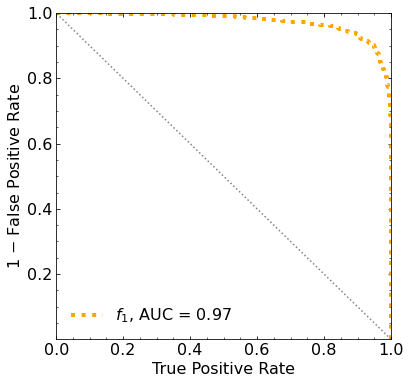

Classification score:


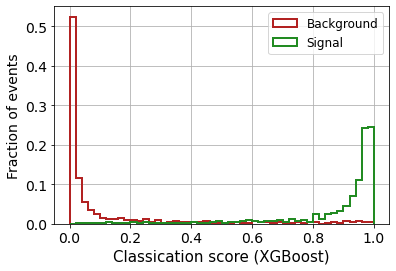


 ROC-AUC =  0.9740482811955832


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  271.75396282  236.29750846  191.08625284
  138.99954382   84.17027733   25.17760985  -37.56412224 -101.01424419]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 254.77653318 232.108374

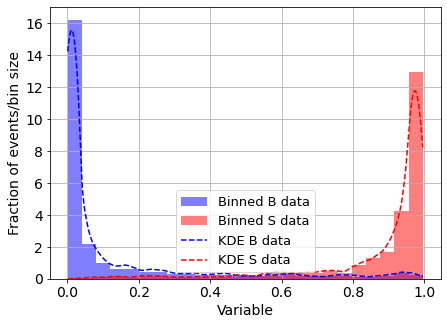

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



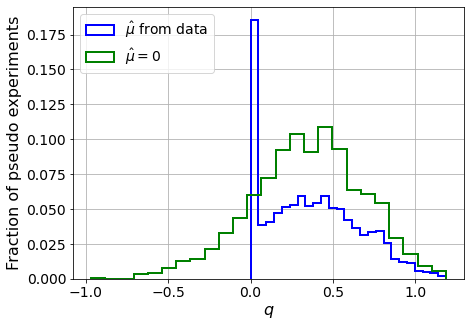

muhat mean:  -5.09353042377463
Z_bins:  0.5966821894927222
std Z_bins:  0.2384351399888776
Z_bins mu=0:  0.5966821894927222
std Z_bins mu=0:  0.2835623206842181

--------

B_expected:  643
S_expected:  2



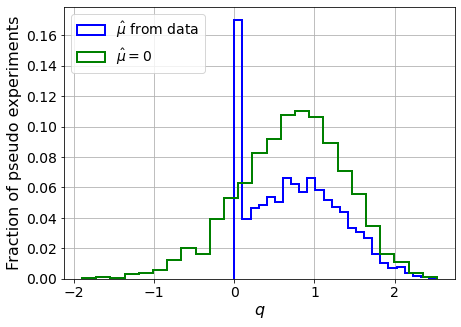

muhat mean:  -2.4549156230887124
Z_bins:  0.8690078355300568
std Z_bins:  0.3201236215510804
Z_bins mu=0:  0.8690078355300568
std Z_bins mu=0:  0.37796879988755416

--------

B_expected:  643
S_expected:  4



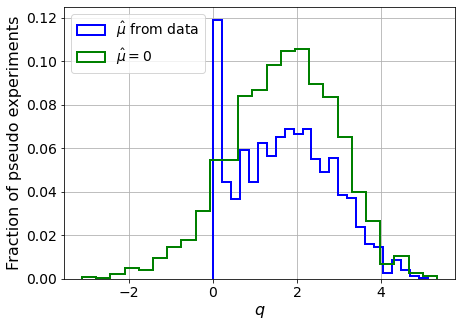

muhat mean:  -1.238387042407276
Z_bins:  1.3185138375944139
std Z_bins:  0.4277627476990359
Z_bins mu=0:  1.3185138375944139
std Z_bins mu=0:  0.4814469587845955

--------

B_expected:  643
S_expected:  8



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


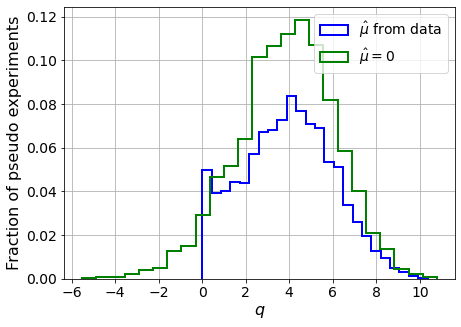

muhat mean:  -0.5747891193935236
Z_bins:  1.9924672969573372
std Z_bins:  0.5246277798309269
Z_bins mu=0:  1.9924672969573372
std Z_bins mu=0:  0.5735458347553605

--------

B_expected:  643
S_expected:  17



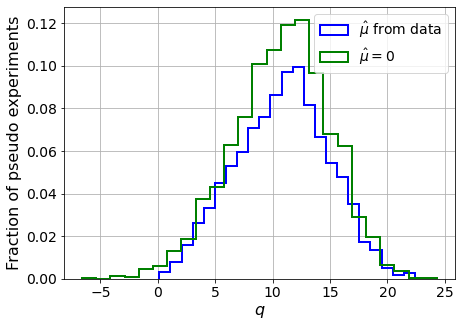

muhat mean:  -0.29593932819224994
Z_bins:  3.3181125696232527
std Z_bins:  0.6081764198000955
Z_bins mu=0:  3.3181125696232527
std Z_bins mu=0:  0.6363117654508667

--------

B_expected:  643
S_expected:  37



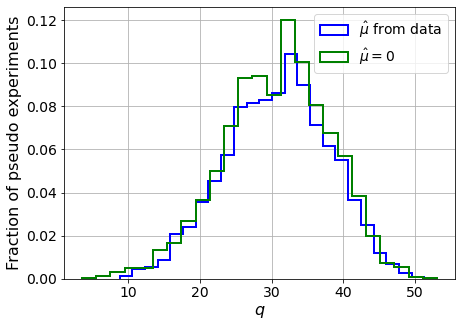

muhat mean:  -0.13458956689553705
Z_bins:  5.589417469880355
std Z_bins:  0.64745165730048
Z_bins mu=0:  5.589417469880355
std Z_bins mu=0:  0.6655730859063781

--------

B_expected:  643
S_expected:  79



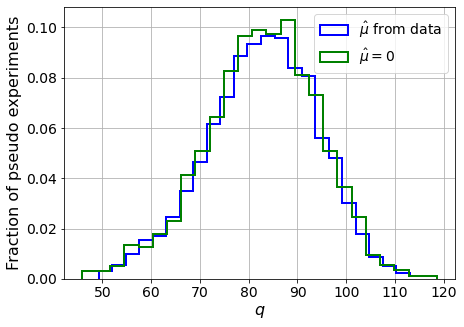

muhat mean:  -0.06380837440953038
Z_bins:  9.119848769691847
std Z_bins:  0.6205119552134734
Z_bins mu=0:  9.119848769691847
std Z_bins mu=0:  0.6301700767053254

--------

B_expected:  643
S_expected:  170



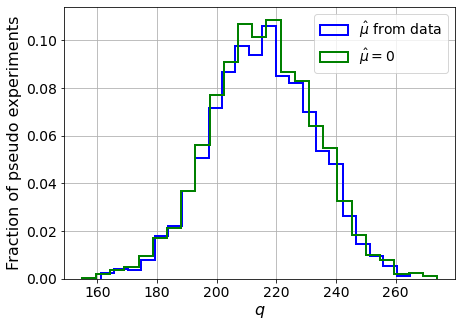

muhat mean:  -0.029261965101138352
Z_bins:  14.681056399764799
std Z_bins:  0.5971513945745545
Z_bins mu=0:  14.681056399764799
std Z_bins mu=0:  0.6023199917125617

--------

B_expected:  643
S_expected:  366



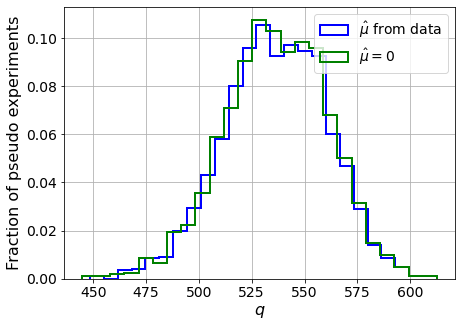

muhat mean:  -0.013827072220231303
Z_bins:  23.161752179894098
std Z_bins:  0.5268838999695444
Z_bins mu=0:  23.161752179894098
std Z_bins mu=0:  0.5308120982082531

--------

B_expected:  643
S_expected:  788



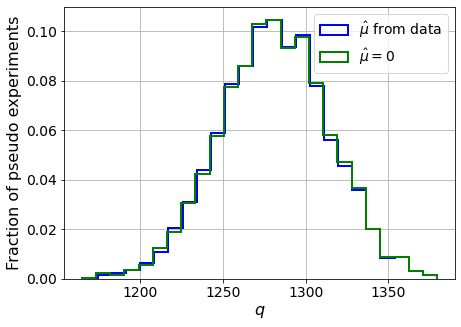

muhat mean:  -0.006371352539122004
Z_bins:  35.80495080114784
std Z_bins:  0.45884431487295674
Z_bins mu=0:  35.80495080114784
std Z_bins mu=0:  0.46045380274912234

--------


 FINAL RESULT:

[[0.5966821894927222, 0.2384351399888776, -5.09353042377463, 0.5966821894927222, 0.2835623206842181], [0.8690078355300568, 0.3201236215510804, -2.4549156230887124, 0.8690078355300568, 0.37796879988755416], [1.3185138375944139, 0.4277627476990359, -1.238387042407276, 1.3185138375944139, 0.4814469587845955], [1.9924672969573372, 0.5246277798309269, -0.5747891193935236, 1.9924672969573372, 0.5735458347553605], [3.3181125696232527, 0.6081764198000955, -0.29593932819224994, 3.3181125696232527, 0.6363117654508667], [5.589417469880355, 0.64745165730048, -0.13458956689553705, 5.589417469880355, 0.6655730859063781], [9.119848769691847, 0.6205119552134734, -0.06380837440953038, 9.119848769691847, 0.6301700767053254], [14.681056399764799, 0.5971513945745545, -0.029261965101138352, 14.681056399764799, 0.6023

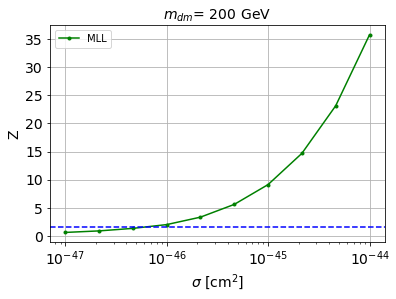


cross_MLL_164:  7.1281062312251585e-47
cross_MLL_164_up:  4.072239521614237e-47
cross_MLL_164_down:  1.1539326119217352e-46

#########################


#########################

mDM =  500 GeV

images_B.shape:  (5000, 75, 75, 4)
images_S.shape:  (5000, 75, 75, 4)
labels_B.shape:  (5000,)
labels_S.shape:  (5000,)

images.shape:  (10000, 75, 75, 4)
labels.shape:  (10000,)
image_size:  [75 75  4]
X_mon.shape:  (10000, 75, 75, 4)

X_mon_train :  (6375, 75, 75, 4)
y_mon_train :  (6375,)
X_mon_val :  (1125, 75, 75, 4)
y_mon_val :  (1125,)
X_mon_test :  (2500, 75, 75, 4)
y_mon_test :  (2500,)

X_mon_train_1D.shape:  (6375, 22500)
X_mon_val_1D.shape:  (1125, 22500)
X_mon_test_1D.shape:  (2500, 22500)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 8)
S_ppeakS2.

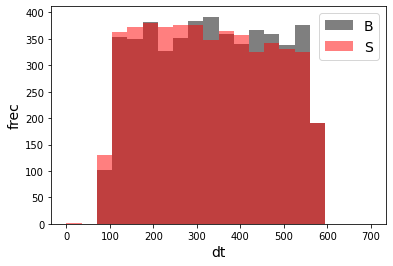

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68630	validation_1-logloss:0.68686
[1]	validation_0-logloss:0.67958	validation_1-logloss:0.68071
[2]	validation_0-logloss:0.67299	validation_1-logloss:0.67467
[3]	validation_0-logloss:0.66648	validation_1-logloss:0.66872
[4]	validation_0-logloss:0.66013	validation_1-logloss:0.66295
[5]	validation_0-logloss:0.65388	validation_1-logloss:0.65723
[6]	validation_0-logloss:0.64777	validation_1-logloss:0.65169
[7]	validation_0-logloss:0.64175	validation_1-logloss:0.64619
[8]	validation_0-logloss:0.63583	validation_1-logloss:0.64079
[9]	validation_0-logloss:0.63009	validation_1-logloss:0.63556
[10]	validation_0-logloss:0.62438	validation_1-logloss:0.63040
[11]	validation_0-logloss:0.61884	validation_1-logloss:0.62527
[12]	validation_0-logloss:0.61333	validation_1-logloss:0.62029
[13]	validation_0-logloss:0.60799	validation_1-logloss:0.61538
[14]	validation_0-logloss:0.60269	validation_1-logloss:0.61067
[15]	validation_0-logloss:0.59753	validation_1-logloss:0.60600
[1

[130]	validation_0-logloss:0.28723	validation_1-logloss:0.34196
[131]	validation_0-logloss:0.28596	validation_1-logloss:0.34105
[132]	validation_0-logloss:0.28464	validation_1-logloss:0.34007
[133]	validation_0-logloss:0.28333	validation_1-logloss:0.33901
[134]	validation_0-logloss:0.28197	validation_1-logloss:0.33796
[135]	validation_0-logloss:0.28076	validation_1-logloss:0.33708
[136]	validation_0-logloss:0.27944	validation_1-logloss:0.33608
[137]	validation_0-logloss:0.27819	validation_1-logloss:0.33517
[138]	validation_0-logloss:0.27691	validation_1-logloss:0.33426
[139]	validation_0-logloss:0.27575	validation_1-logloss:0.33344
[140]	validation_0-logloss:0.27446	validation_1-logloss:0.33248
[141]	validation_0-logloss:0.27326	validation_1-logloss:0.33150
[142]	validation_0-logloss:0.27211	validation_1-logloss:0.33074
[143]	validation_0-logloss:0.27090	validation_1-logloss:0.32984
[144]	validation_0-logloss:0.26966	validation_1-logloss:0.32894
[145]	validation_0-logloss:0.26854	valid

[259]	validation_0-logloss:0.18261	validation_1-logloss:0.26685
[260]	validation_0-logloss:0.18219	validation_1-logloss:0.26660
[261]	validation_0-logloss:0.18169	validation_1-logloss:0.26636
[262]	validation_0-logloss:0.18117	validation_1-logloss:0.26602
[263]	validation_0-logloss:0.18065	validation_1-logloss:0.26579
[264]	validation_0-logloss:0.18013	validation_1-logloss:0.26542
[265]	validation_0-logloss:0.17968	validation_1-logloss:0.26512
[266]	validation_0-logloss:0.17920	validation_1-logloss:0.26482
[267]	validation_0-logloss:0.17872	validation_1-logloss:0.26442
[268]	validation_0-logloss:0.17826	validation_1-logloss:0.26419
[269]	validation_0-logloss:0.17786	validation_1-logloss:0.26392
[270]	validation_0-logloss:0.17734	validation_1-logloss:0.26366
[271]	validation_0-logloss:0.17689	validation_1-logloss:0.26337
[272]	validation_0-logloss:0.17639	validation_1-logloss:0.26303
[273]	validation_0-logloss:0.17592	validation_1-logloss:0.26273
[274]	validation_0-logloss:0.17550	valid

[388]	validation_0-logloss:0.13757	validation_1-logloss:0.24785
[389]	validation_0-logloss:0.13726	validation_1-logloss:0.24784
[390]	validation_0-logloss:0.13695	validation_1-logloss:0.24779
[391]	validation_0-logloss:0.13675	validation_1-logloss:0.24773
[392]	validation_0-logloss:0.13644	validation_1-logloss:0.24766
[393]	validation_0-logloss:0.13615	validation_1-logloss:0.24763
[394]	validation_0-logloss:0.13587	validation_1-logloss:0.24745
[395]	validation_0-logloss:0.13568	validation_1-logloss:0.24747
[396]	validation_0-logloss:0.13549	validation_1-logloss:0.24749
[397]	validation_0-logloss:0.13528	validation_1-logloss:0.24748
[398]	validation_0-logloss:0.13498	validation_1-logloss:0.24750
[399]	validation_0-logloss:0.13470	validation_1-logloss:0.24740
[400]	validation_0-logloss:0.13446	validation_1-logloss:0.24738
[401]	validation_0-logloss:0.13413	validation_1-logloss:0.24731
[402]	validation_0-logloss:0.13396	validation_1-logloss:0.24734
[403]	validation_0-logloss:0.13363	valid

[517]	validation_0-logloss:0.11022	validation_1-logloss:0.24239
[518]	validation_0-logloss:0.11006	validation_1-logloss:0.24234
[519]	validation_0-logloss:0.10985	validation_1-logloss:0.24232
[520]	validation_0-logloss:0.10971	validation_1-logloss:0.24228
[521]	validation_0-logloss:0.10958	validation_1-logloss:0.24225
[522]	validation_0-logloss:0.10939	validation_1-logloss:0.24217
[523]	validation_0-logloss:0.10923	validation_1-logloss:0.24223
[524]	validation_0-logloss:0.10910	validation_1-logloss:0.24226
[525]	validation_0-logloss:0.10896	validation_1-logloss:0.24225
[526]	validation_0-logloss:0.10881	validation_1-logloss:0.24221
[527]	validation_0-logloss:0.10865	validation_1-logloss:0.24219
[528]	validation_0-logloss:0.10848	validation_1-logloss:0.24221
[529]	validation_0-logloss:0.10831	validation_1-logloss:0.24216
[530]	validation_0-logloss:0.10813	validation_1-logloss:0.24207
[531]	validation_0-logloss:0.10798	validation_1-logloss:0.24211
[532]	validation_0-logloss:0.10785	valid

[646]	validation_0-logloss:0.09145	validation_1-logloss:0.23947
[647]	validation_0-logloss:0.09137	validation_1-logloss:0.23941
[648]	validation_0-logloss:0.09121	validation_1-logloss:0.23939
[649]	validation_0-logloss:0.09107	validation_1-logloss:0.23942
[650]	validation_0-logloss:0.09097	validation_1-logloss:0.23940
[651]	validation_0-logloss:0.09085	validation_1-logloss:0.23935
[652]	validation_0-logloss:0.09069	validation_1-logloss:0.23934
[653]	validation_0-logloss:0.09058	validation_1-logloss:0.23930
[654]	validation_0-logloss:0.09049	validation_1-logloss:0.23925
[655]	validation_0-logloss:0.09036	validation_1-logloss:0.23919
[656]	validation_0-logloss:0.09023	validation_1-logloss:0.23914
[657]	validation_0-logloss:0.09015	validation_1-logloss:0.23909
[658]	validation_0-logloss:0.09001	validation_1-logloss:0.23916
[659]	validation_0-logloss:0.08985	validation_1-logloss:0.23911
[660]	validation_0-logloss:0.08974	validation_1-logloss:0.23913
[661]	validation_0-logloss:0.08963	valid

[775]	validation_0-logloss:0.07716	validation_1-logloss:0.23757
[776]	validation_0-logloss:0.07706	validation_1-logloss:0.23755
[777]	validation_0-logloss:0.07698	validation_1-logloss:0.23761
[778]	validation_0-logloss:0.07690	validation_1-logloss:0.23763
[779]	validation_0-logloss:0.07680	validation_1-logloss:0.23761
[780]	validation_0-logloss:0.07670	validation_1-logloss:0.23755
[781]	validation_0-logloss:0.07663	validation_1-logloss:0.23760
[782]	validation_0-logloss:0.07650	validation_1-logloss:0.23760
[783]	validation_0-logloss:0.07641	validation_1-logloss:0.23764
[784]	validation_0-logloss:0.07631	validation_1-logloss:0.23764
[785]	validation_0-logloss:0.07621	validation_1-logloss:0.23756
[786]	validation_0-logloss:0.07612	validation_1-logloss:0.23754
[787]	validation_0-logloss:0.07603	validation_1-logloss:0.23757
[788]	validation_0-logloss:0.07594	validation_1-logloss:0.23757
[789]	validation_0-logloss:0.07586	validation_1-logloss:0.23756
[790]	validation_0-logloss:0.07577	valid

[904]	validation_0-logloss:0.06578	validation_1-logloss:0.23691
[905]	validation_0-logloss:0.06572	validation_1-logloss:0.23688
[906]	validation_0-logloss:0.06568	validation_1-logloss:0.23685
[907]	validation_0-logloss:0.06560	validation_1-logloss:0.23684
[908]	validation_0-logloss:0.06552	validation_1-logloss:0.23684
[909]	validation_0-logloss:0.06545	validation_1-logloss:0.23690
[910]	validation_0-logloss:0.06538	validation_1-logloss:0.23696
[911]	validation_0-logloss:0.06529	validation_1-logloss:0.23696
[912]	validation_0-logloss:0.06521	validation_1-logloss:0.23698
[913]	validation_0-logloss:0.06509	validation_1-logloss:0.23702
[914]	validation_0-logloss:0.06501	validation_1-logloss:0.23710
[915]	validation_0-logloss:0.06495	validation_1-logloss:0.23707
[916]	validation_0-logloss:0.06487	validation_1-logloss:0.23712
[917]	validation_0-logloss:0.06474	validation_1-logloss:0.23710
[918]	validation_0-logloss:0.06467	validation_1-logloss:0.23712
[919]	validation_0-logloss:0.06456	valid

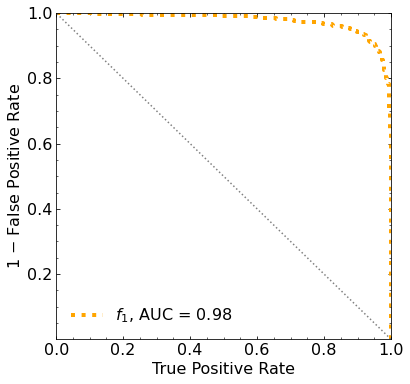

Classification score:


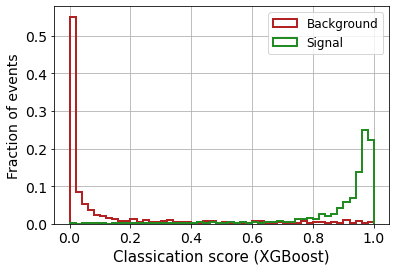


 ROC-AUC =  0.9762262358388135


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  302.32247701  270.16580017  232.65695361  188.15202269
  137.7883668    80.68265255   21.70631082  -40.29479144 -101.94674064]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 269.78001397 249.272199

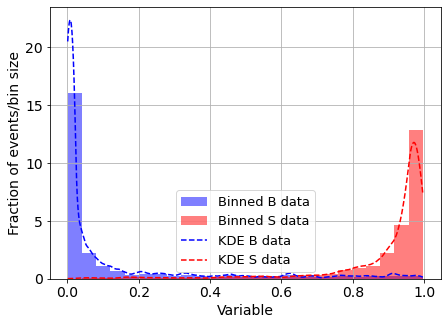

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



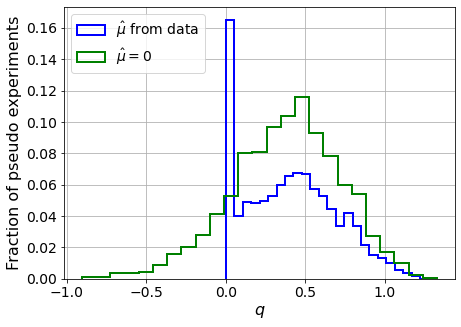

muhat mean:  -4.599086596061901
Z_bins:  0.6345500433679554
std Z_bins:  0.22896587471540525
Z_bins mu=0:  0.6345500433679554
std Z_bins mu=0:  0.27082757666150103

--------

B_expected:  643
S_expected:  1



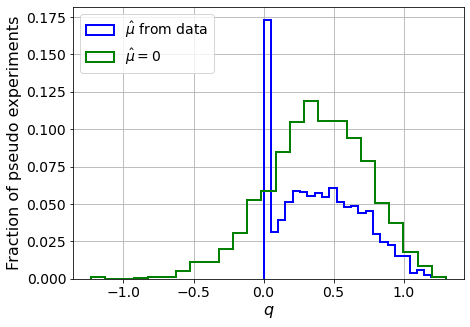

muhat mean:  -4.8952546693414005
Z_bins:  0.6240998971775138
std Z_bins:  0.23887177061081324
Z_bins mu=0:  0.6240998971775138
std Z_bins mu=0:  0.28127776418449957

--------

B_expected:  643
S_expected:  2



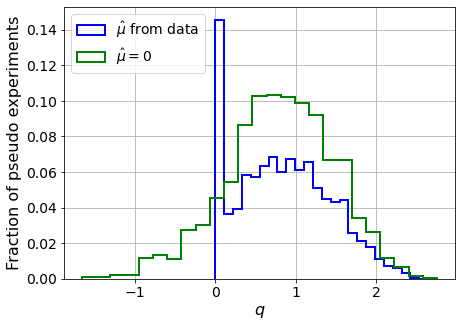

muhat mean:  -2.402775576026243
Z_bins:  0.9131047825479419
std Z_bins:  0.3181712329906392
Z_bins mu=0:  0.9131047825479419
std Z_bins mu=0:  0.3662278891371071

--------

B_expected:  643
S_expected:  3



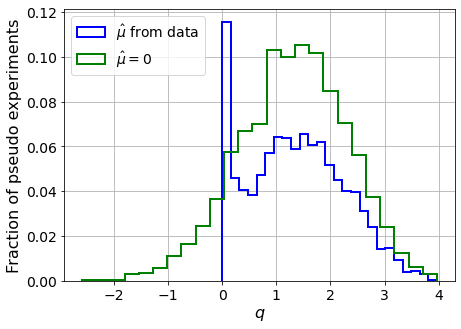

muhat mean:  -1.6701014408414976
Z_bins:  1.1604675872368106
std Z_bins:  0.38233053279182244
Z_bins mu=0:  1.1604675872368106
std Z_bins mu=0:  0.42666030991030174

--------

B_expected:  643
S_expected:  7



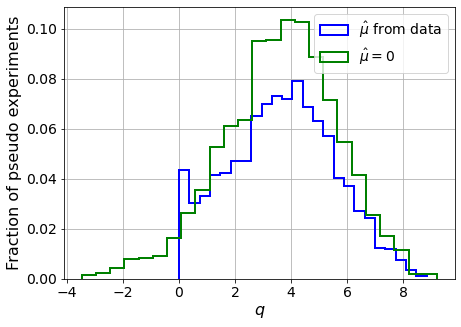

muhat mean:  -0.668376213216956
Z_bins:  1.9271512511317117
std Z_bins:  0.4917618883807816
Z_bins mu=0:  1.9271512511317117
std Z_bins mu=0:  0.5312310518178368

--------

B_expected:  643
S_expected:  15



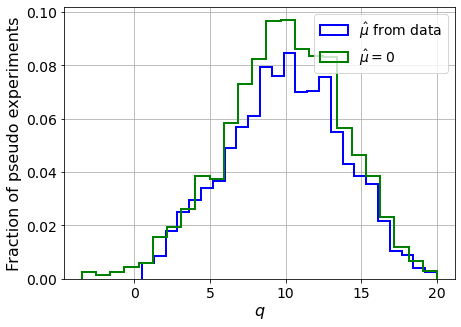

muhat mean:  -0.33871160326210437
Z_bins:  3.169446726447502
std Z_bins:  0.59637652706768
Z_bins mu=0:  3.169446726447502
std Z_bins mu=0:  0.6202303137096462

--------

B_expected:  643
S_expected:  33



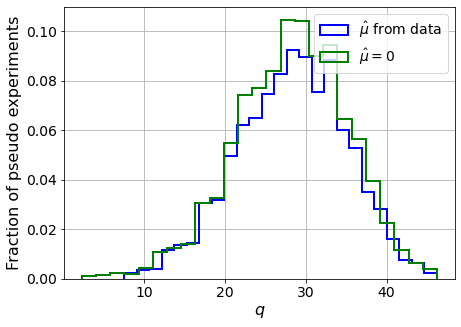

muhat mean:  -0.15322173765682784
Z_bins:  5.343209495973926
std Z_bins:  0.6309847134281242
Z_bins mu=0:  5.343209495973926
std Z_bins mu=0:  0.6474564728321427

--------

B_expected:  643
S_expected:  72



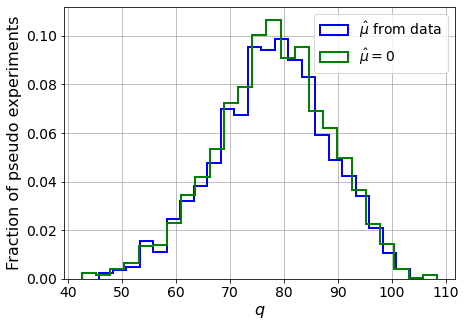

muhat mean:  -0.0697392810247976
Z_bins:  8.838787515629399
std Z_bins:  0.5929934110498035
Z_bins mu=0:  8.838787515629399
std Z_bins mu=0:  0.5999309965522116

--------

B_expected:  643
S_expected:  154



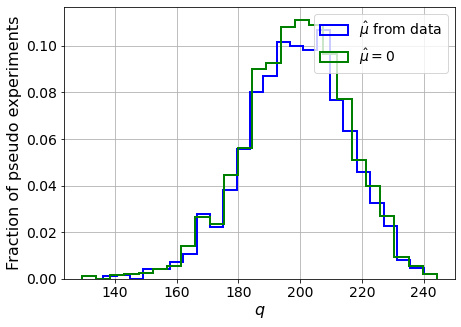

muhat mean:  -0.031608379565100826
Z_bins:  14.124523490751626
std Z_bins:  0.5807861694979747
Z_bins mu=0:  14.124523490751626
std Z_bins mu=0:  0.5871934764566419

--------

B_expected:  643
S_expected:  333



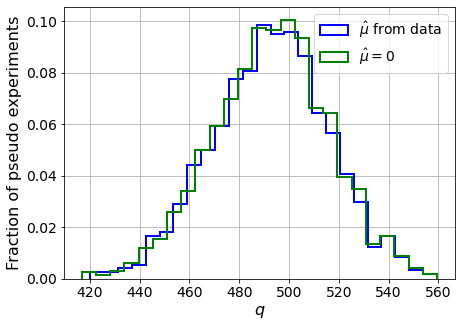

muhat mean:  -0.014913236157779376
Z_bins:  22.211596610594608
std Z_bins:  0.521075482757382
Z_bins mu=0:  22.211596610594608
std Z_bins mu=0:  0.5242115530584568

--------


 FINAL RESULT:

[[0.6345500433679554, 0.22896587471540525, -4.599086596061901, 0.6345500433679554, 0.27082757666150103], [0.6240998971775138, 0.23887177061081324, -4.8952546693414005, 0.6240998971775138, 0.28127776418449957], [0.9131047825479419, 0.3181712329906392, -2.402775576026243, 0.9131047825479419, 0.3662278891371071], [1.1604675872368106, 0.38233053279182244, -1.6701014408414976, 1.1604675872368106, 0.42666030991030174], [1.9271512511317117, 0.4917618883807816, -0.668376213216956, 1.9271512511317117, 0.5312310518178368], [3.169446726447502, 0.59637652706768, -0.33871160326210437, 3.169446726447502, 0.6202303137096462], [5.343209495973926, 0.6309847134281242, -0.15322173765682784, 5.343209495973926, 0.6474564728321427], [8.838787515629399, 0.5929934110498035, -0.0697392810247976, 8.838787515629399, 0.59993

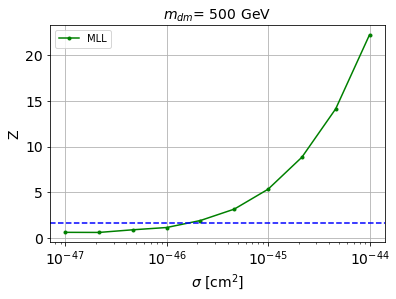


cross_MLL_164:  1.700037532196986e-46
cross_MLL_164_up:  1.1294481216698103e-46
cross_MLL_164_down:  2.5595666013243626e-46

#########################



In [43]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = '00-images/mDM' + str(mDM) + 'GeV-img/out-img' + str(img_size) + '/'
    
    
    index_S = np.loadtxt(filefolder + '00-images/mDM' + str(mDM) + 'GeV-img/ok-index.txt').astype(int)
    
    
    file_path_S = []

    for path_it in range(num_data):
        file_path_S.append( filefolder + filename_S + 'WP' + str(index_S[path_it]) + '.png' )
        
    # Load the images and convert to a numpy array
    images_S = [imageio.imread(jj) for jj in file_path_S]
    images_S = np.asarray(images_S)
    


        
    # LABELS
    labels_B = np.zeros(len(images_B))
    labels_S = np.ones(len(images_S))


    print('images_B.shape: ', images_B.shape)
    print('images_S.shape: ', images_S.shape)
    print('labels_B.shape: ', labels_B.shape)
    print('labels_S.shape: ', labels_S.shape)




    # CONCATENATE INTO A SINGLE DATASET
    images = np.concatenate([images_B, images_S])
#     # del images_B
    del images_S

    labels = np.concatenate([labels_B,labels_S])
    del labels_B
    del labels_S



    print('\nimages.shape: ', images.shape)
    print('labels.shape: ', labels.shape)

    # Get image size
    image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
    print('image_size: ', image_size)

    # Scale images so values are between 0 and 1
    images = images / 255

    n_images = images.shape[0]

    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon = images

    print('X_mon.shape: ', X_mon.shape)


    # labels
    y_mon = labels


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    # reshape to train XGBoost ( ALL CHANNELS )

    X_mon_train_1D = np.reshape(X_mon_train, (len(X_mon_train), X_mon_train.shape[1]*X_mon_train.shape[2]*X_mon_train.shape[3]) )

    X_mon_val_1D = np.reshape(X_mon_val, (len(X_mon_val), X_mon_val.shape[1]*X_mon_val.shape[2]*X_mon_val.shape[3]) )

    X_mon_test_1D = np.reshape(X_mon_test, (len(X_mon_test), X_mon_test.shape[1]*X_mon_test.shape[2]*X_mon_test.shape[3]) )

    print('X_mon_train_1D.shape: ', X_mon_train_1D.shape)
    print('X_mon_val_1D.shape: ', X_mon_val_1D.shape)
    print('X_mon_test_1D.shape: ', X_mon_test_1D.shape)
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)

    # all the signal features
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')

#     del B_ppeakS1
#     del B_ppeakS2
#     del B_pbot
#     del B_ptop

    del S_ppeakS1
    del S_ppeakS2
    del S_pbot
    del S_ptop


    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)
    del X_mon_B
    del X_mon_S


    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)

    del X_mon5
    del y_mon5

    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    del X_mon5_aux
    del y_mon5_aux

    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    #################################
    # CONCATENATE IMAGES + FEATURES #
    #################################
    
    X_mon_train = np.concatenate([X_mon_train_1D, X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon_test_1D, X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon_val_1D, X_mon5_val],axis=1)

    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [44]:
cross_images17feats_MLL = store_cross_MLL_164
cross_images17feats_MLL_up = store_cross_MLL_164_up
cross_images17feats_MLL_down = store_cross_MLL_164_down

print(cross_images17feats_MLL)
print(cross_images17feats_MLL_up)
print(cross_images17feats_MLL_down)

[5.588999945885258e-46, 4.224739063211317e-47, 2.8512616314566154e-47, 2.685319955722114e-47, 3.9850773476459964e-47, 7.1281062312251585e-47, 1.700037532196986e-46]
[4.230755094574196e-46, 2.622469087211245e-47, 1.6341453216453923e-47, 1.6773547990603008e-47, 2.382464195375628e-47, 4.072239521614237e-47, 1.1294481216698103e-46]
[7.301718020162574e-46, 6.242151138544938e-47, 4.637539752360342e-47, 3.998276547003215e-47, 5.950990831997114e-47, 1.1539326119217352e-46, 2.5595666013243626e-46]


In [45]:
np.savetxt('results/images17feats_MLL.txt', [cross_images17feats_MLL, cross_images17feats_MLL_up, cross_images17feats_MLL_down])

In [46]:
cross_images17feats_MLL = np.loadtxt('results/images17feats_MLL.txt')[0]
cross_images17feats_MLL_up = np.loadtxt('results/images17feats_MLL.txt')[1]
cross_images17feats_MLL_down =np.loadtxt('results/images17feats_MLL.txt')[2]

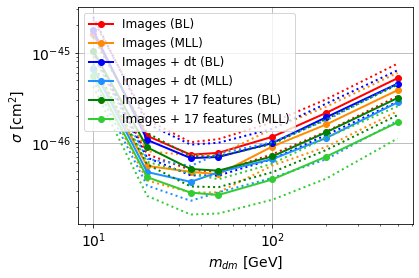

In [51]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_images, '-o', color='red', lw=lw, label=r'Images (BL)')
plt.plot(mDM_mDM, cross_images_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_images_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_images_MLL, '-o', color='darkorange', lw=lw, label=r'Images (MLL)')
plt.plot(mDM_mDM, cross_images_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_images_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt, '-o', color='blue', lw=lw, label=r'Images + dt (BL)')
plt.plot(mDM_mDM, cross_imagesdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'Images + dt (MLL)')
plt.plot(mDM_mDM, cross_imagesdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_MLL_down, ':', color='dodgerblue', lw=lw)
plt.plot(mDM_mDM, cross_images17feats, '-o', color='green', lw=lw, label=r'Images + 17 features (BL)')
plt.plot(mDM_mDM, cross_images17feats_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_images17feats_down, ':', color='green', lw=lw)
plt.plot(mDM_mDM, cross_images17feats_MLL, '-o', color='limegreen', lw=lw, label=r'Images + 17 features (MLL)')
plt.plot(mDM_mDM, cross_images17feats_MLL_up, ':', color='limegreen', lw=lw) 
plt.plot(mDM_mDM, cross_images17feats_MLL_down, ':', color='limegreen', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

In [48]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

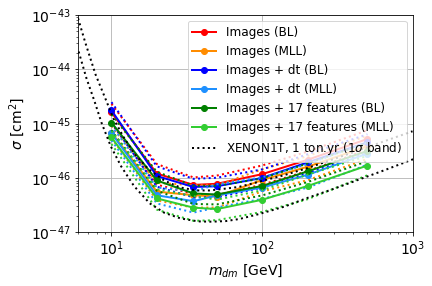

In [53]:

# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_images, '-o', color='red', lw=lw, label=r'Images (BL)')
plt.plot(mDM_mDM, cross_images_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_images_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_images_MLL, '-o', color='darkorange', lw=lw, label=r'Images (MLL)')
plt.plot(mDM_mDM, cross_images_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_images_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt, '-o', color='blue', lw=lw, label=r'Images + dt (BL)')
plt.plot(mDM_mDM, cross_imagesdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_imagesdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'Images + dt (MLL)')
plt.plot(mDM_mDM, cross_imagesdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_imagesdt_MLL_down, ':', color='dodgerblue', lw=lw)
plt.plot(mDM_mDM, cross_images17feats, '-o', color='green', lw=lw, label=r'Images + 17 features (BL)')
plt.plot(mDM_mDM, cross_images17feats_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_images17feats_down, ':', color='green', lw=lw)
plt.plot(mDM_mDM, cross_images17feats_MLL, '-o', color='limegreen', lw=lw, label=r'Images + 17 features (MLL)')
plt.plot(mDM_mDM, cross_images17feats_MLL_up, ':', color='limegreen', lw=lw) 
plt.plot(mDM_mDM, cross_images17feats_MLL_down, ':', color='limegreen', lw=lw)

#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(6,1000)
plt.ylim(1e-47, 1e-43)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
plt.show()